# Baseline CNN 2026 FINAL - Brain Tumor MRI

In [2]:
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"
os.environ["TF_ENABLE_LAYOUT_OPTIMIZER"] = "0"

import time, gc
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd

from tensorflow.keras import layers, models, callbacks, regularizers
from tensorflow.keras import mixed_precision
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    f1_score,
    roc_auc_score
)
from tensorflow.python.framework.convert_to_constants import convert_variables_to_constants_v2_as_graph

mixed_precision.set_global_policy("float32")

# -------------------- Config --------------------
TRAIN_DIR = "./Training2026"
TEST_DIR  = "./Testing2026"

IMG_SIZE  = 256
BATCH     = 32
AUTOTUNE  = tf.data.AUTOTUNE
EPOCHS    = 30

RUN_SEEDS   = [42, 43, 44, 45, 46]
REPORT_SEED = RUN_SEEDS[0]

HIST_DIR = "./histories2026"
os.makedirs(HIST_DIR, exist_ok=True)

SAVE_CURVES_ALL = False

# -------------------- Preprocessing --------------------
def per_image_standardize_batch(x):
    out_dtype = x.dtype
    x32 = tf.cast(x, tf.float32)
    y32 = tf.map_fn(tf.image.per_image_standardization, x32, fn_output_signature=tf.float32)
    return tf.cast(y32, out_dtype)

# -------------------- tf.data helper --------------------
def cfg(ds, shuffle=False, seed=0):
    ds = ds.cache()
    if shuffle:
        ds = ds.shuffle(1000, seed=seed, reshuffle_each_iteration=True)
    return ds.prefetch(AUTOTUNE)

def count_images(ds):
    n = 0
    for xb, _ in ds:
        n += int(xb.shape[0])
    return n

def y_true_from_ds(ds):
    ys = []
    for _, y in ds:
        ys.append(y.numpy())
    return np.argmax(np.vstack(ys), axis=1)

def auc_scores_from_probs(y_true, y_probs, num_classes):
    """
    Computes ROC-AUC from predicted probabilities.

    Binary classification:
        Uses probability of the positive class: y_probs[:, 1]

    Multi-class classification:
        Uses One-vs-Rest macro and weighted ROC-AUC.
    """
    try:
        if num_classes == 2:
            auc = roc_auc_score(y_true, y_probs[:, 1])
            return {
                "AUC": float(auc),
                "AUC Macro OvR": float(auc),
                "AUC Weighted OvR": float(auc),
            }
        else:
            y_true_oh = tf.keras.utils.to_categorical(y_true, num_classes=num_classes)

            auc_macro = roc_auc_score(
                y_true_oh,
                y_probs,
                average="macro",
                multi_class="ovr"
            )

            auc_weighted = roc_auc_score(
                y_true_oh,
                y_probs,
                average="weighted",
                multi_class="ovr"
            )

            return {
                "AUC": float(auc_macro),
                "AUC Macro OvR": float(auc_macro),
                "AUC Weighted OvR": float(auc_weighted),
            }

    except Exception as e:
        print(f"[WARN] Could not compute AUC: {e}")
        return {
            "AUC": np.nan,
            "AUC Macro OvR": np.nan,
            "AUC Weighted OvR": np.nan,
        }

def save_confusion_matrix_png(cm, class_names, title, out_path):
    plt.rcParams.update({"font.size": 12})
    fig, ax = plt.subplots(figsize=(7.2, 6.2))

    vmax = cm.max() if cm.max() > 0 else 1
    im = ax.imshow(cm, interpolation="nearest", cmap=plt.cm.Blues, vmin=0, vmax=vmax)

    cbar = plt.colorbar(im, ax=ax)
    cbar.ax.set_ylabel("Number of samples")

    ticks = np.arange(len(class_names))
    ax.set_xticks(ticks)
    ax.set_yticks(ticks)
    ax.set_xticklabels(class_names, rotation=45, ha="right")
    ax.set_yticklabels(class_names)

    ax.set_ylabel("True label")
    ax.set_xlabel("Predicted label")
    ax.set_title(title)

    thresh = vmax / 2.0
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(
                j,
                i,
                str(cm[i, j]),
                ha="center",
                va="center",
                color="white" if cm[i, j] > thresh else "black"
            )

    plt.tight_layout()
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)

def save_curves_png(hist, out_prefix, title_prefix):
    epochs = np.arange(1, len(hist.history["loss"]) + 1)

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, hist.history["loss"], label="Training loss")
    plt.plot(epochs, hist.history["val_loss"], linestyle="--", label="Validation loss")
    plt.xlabel("Epoch")
    plt.ylabel("Cross-Entropy")
    plt.title(f"{title_prefix} – Loss Curves")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.savefig(out_prefix + "_loss.png", dpi=300, bbox_inches="tight")
    plt.close()

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, hist.history["accuracy"], label="Training accuracy")
    plt.plot(epochs, hist.history["val_accuracy"], linestyle="--", label="Validation accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title(f"{title_prefix} – Accuracy Curves")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.savefig(out_prefix + "_acc.png", dpi=300, bbox_inches="tight")
    plt.close()

def specificity_from_cm(cm: np.ndarray):
    spec = []
    total = cm.sum()

    for i in range(cm.shape[0]):
        TP = cm[i, i]
        FN = cm[i, :].sum() - TP
        FP = cm[:, i].sum() - TP
        TN = total - TP - FN - FP

        spec_i = TN / (TN + FP + 1e-12)
        spec.append(float(spec_i))

    return spec

def per_class_table(report_dict, cm, class_names):
    spec = specificity_from_cm(cm)
    rows = []

    for idx, cls in enumerate(class_names):
        d = report_dict.get(cls, {})
        rows.append({
            "class": cls,
            "precision": float(d.get("precision", np.nan)),
            "recall(sensitivity)": float(d.get("recall", np.nan)),
            "specificity": spec[idx],
            "f1_score": float(d.get("f1-score", np.nan)),
            "support": int(d.get("support", 0)),
        })

    return pd.DataFrame(rows)

# -------------------- Computational complexity + inference helpers --------------------
def compute_flops(model, input_shape=(1, 256, 256, 1)):
    """
    Returns total floating point operations for one forward pass.
    input_shape should have batch_size=1 for per-image FLOPs.
    """
    @tf.function
    def forward(x):
        return model(x, training=False)

    concrete_func = forward.get_concrete_function(
        tf.TensorSpec(input_shape, tf.float32)
    )

    frozen_func, graph_def = convert_variables_to_constants_v2_as_graph(concrete_func)

    with tf.Graph().as_default() as graph:
        tf.graph_util.import_graph_def(graph_def, name="")
        run_meta = tf.compat.v1.RunMetadata()
        opts = tf.compat.v1.profiler.ProfileOptionBuilder.float_operation()

        flops = tf.compat.v1.profiler.profile(
            graph=graph,
            run_meta=run_meta,
            cmd="op",
            options=opts
        )

    return int(flops.total_float_ops) if flops is not None else 0

def benchmark_inference(model, ds, warmup_steps=3, repeat_steps=30):
    """
    Benchmarks inference with training=False.

    Returns:
        latency_ms_per_img
        throughput_img_s
        batch_time_ms
        full_test_time_s
        num_test_images
    """
    sample_batch = next(iter(ds))[0]
    sample_batch = tf.cast(sample_batch, tf.float32)
    batch_size = int(sample_batch.shape[0])

    for _ in range(warmup_steps):
        y = model(sample_batch, training=False)
        _ = y.numpy()

    batch_times = []

    for _ in range(repeat_steps):
        t0 = time.perf_counter()
        y = model(sample_batch, training=False)
        _ = y.numpy()
        batch_times.append(time.perf_counter() - t0)

    mean_batch_time_s = float(np.mean(batch_times))
    batch_time_ms = mean_batch_time_s * 1000.0
    latency_ms_per_img = (mean_batch_time_s / batch_size) * 1000.0
    throughput_img_s = batch_size / mean_batch_time_s if mean_batch_time_s > 0 else float("nan")

    total_imgs = 0
    t0 = time.perf_counter()

    for xb, _ in ds:
        y = model(tf.cast(xb, tf.float32), training=False)
        _ = y.numpy()
        total_imgs += int(xb.shape[0])

    full_test_time_s = time.perf_counter() - t0

    return {
        "Inference Latency (ms/img)": float(latency_ms_per_img),
        "Inference Throughput (img/s)": float(throughput_img_s),
        "Inference Batch Time (ms)": float(batch_time_ms),
        "Full Test Inference Time (s)": float(full_test_time_s),
        "Num Test Images": int(total_imgs),
    }

# -------------------- Model builder --------------------
L2_STRENGTH = 2e-4

def conv_block(x, filters, sd_rate=0.0):
    x = layers.Conv2D(
        filters,
        3,
        padding="same",
        use_bias=False,
        kernel_regularizer=regularizers.l2(L2_STRENGTH)
    )(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2D(
        filters,
        3,
        padding="same",
        use_bias=False,
        kernel_regularizer=regularizers.l2(L2_STRENGTH)
    )(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    if sd_rate > 0:
        x = layers.SpatialDropout2D(sd_rate)(x)

    return x

def build_baseline_model(num_classes: int, run_seed: int):
    augment = tf.keras.Sequential([
        layers.RandomFlip("horizontal", seed=run_seed),
        layers.RandomRotation(0.05, seed=run_seed + 1),
        layers.RandomZoom(0.1, seed=run_seed + 2),
        layers.RandomContrast(0.1, seed=run_seed + 3),
        layers.RandomTranslation(0.03, 0.03, seed=run_seed + 4)
    ], name="augment")

    rescale = layers.Rescaling(1. / 255)
    standardize = layers.Lambda(
        per_image_standardize_batch,
        name="per_image_standardization"
    )

    inputs = layers.Input((IMG_SIZE, IMG_SIZE, 1))

    x = augment(inputs)
    x = rescale(x)
    x = standardize(x)
    x = layers.GaussianNoise(0.02)(x)

    x = conv_block(x, 16, sd_rate=0.10)
    x = layers.MaxPooling2D()(x)

    x = conv_block(x, 32, sd_rate=0.10)
    x = layers.MaxPooling2D()(x)

    x = conv_block(x, 64, sd_rate=0.12)
    x = layers.MaxPooling2D()(x)

    x = conv_block(x, 128, sd_rate=0.15)

    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.5)(x)

    x = layers.Dense(
        128,
        activation="relu",
        kernel_regularizer=regularizers.l2(L2_STRENGTH)
    )(x)

    x = layers.Dropout(0.35)(x)

    outputs = layers.Dense(num_classes, activation="softmax")(x)

    return models.Model(
        inputs,
        outputs,
        name="Baseline_CNN_v2_BrainMRI_journal"
    )

# -------------------- Multi-run loop --------------------
rows = []
class_names_ref = None

for run_seed in RUN_SEEDS:
    split_seed = run_seed

    print(f"\n================= RUN_SEED = {run_seed} | SPLIT_SEED = {split_seed} =================")

    tf.keras.backend.clear_session()
    gc.collect()
    tf.keras.utils.set_random_seed(run_seed)

    train_ds_raw = tf.keras.preprocessing.image_dataset_from_directory(
        TRAIN_DIR,
        labels="inferred",
        label_mode="categorical",
        color_mode="grayscale",
        image_size=(IMG_SIZE, IMG_SIZE),
        batch_size=BATCH,
        validation_split=0.2,
        subset="training",
        seed=split_seed,
        interpolation="bilinear",
        crop_to_aspect_ratio=True
    )

    val_ds_raw = tf.keras.preprocessing.image_dataset_from_directory(
        TRAIN_DIR,
        labels="inferred",
        label_mode="categorical",
        color_mode="grayscale",
        image_size=(IMG_SIZE, IMG_SIZE),
        batch_size=BATCH,
        validation_split=0.2,
        subset="validation",
        seed=split_seed,
        interpolation="bilinear",
        crop_to_aspect_ratio=True
    )

    test_ds_raw = tf.keras.preprocessing.image_dataset_from_directory(
        TEST_DIR,
        labels="inferred",
        label_mode="categorical",
        color_mode="grayscale",
        image_size=(IMG_SIZE, IMG_SIZE),
        batch_size=BATCH,
        shuffle=False,
        interpolation="bilinear",
        crop_to_aspect_ratio=True
    )

    class_names = train_ds_raw.class_names
    num_classes = len(class_names)

    if class_names_ref is None:
        class_names_ref = class_names
        np.save(
            os.path.join(HIST_DIR, "class_names.npy"),
            np.array(class_names, dtype=object)
        )
        print(f"[Saved] Class names -> {os.path.join(HIST_DIR, 'class_names.npy')}")
    else:
        if class_names != class_names_ref:
            print("[WARN] class_names order changed across runs. Check your folders.")

    train_ds = cfg(train_ds_raw, shuffle=True, seed=run_seed)
    train_eval_ds = cfg(train_ds_raw, shuffle=False, seed=run_seed)
    val_ds = cfg(val_ds_raw, shuffle=False, seed=run_seed)
    test_ds = cfg(test_ds_raw, shuffle=False, seed=run_seed)

    model = build_baseline_model(num_classes, run_seed)

    # ---- Computational complexity ----
    flops = compute_flops(model, input_shape=(1, IMG_SIZE, IMG_SIZE, 1))
    flops_m = flops / 1e6

    print(f"FLOPs per image: {flops} ({flops_m:.4f} M)")

    loss_fn = tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.05)

    model.compile(
        optimizer=tf.keras.optimizers.Adam(3e-4),
        loss=loss_fn,
        metrics=["accuracy"]
    )

    class EpochTimer(callbacks.Callback):
        def on_train_begin(self, logs=None):
            self.epoch_times = []

        def on_epoch_begin(self, epoch, logs=None):
            self._t0 = time.time()

        def on_epoch_end(self, epoch, logs=None):
            self.epoch_times.append(time.time() - self._t0)

    epoch_timer = EpochTimer()

    cbs = [
        callbacks.EarlyStopping(
            patience=6,
            restore_best_weights=True,
            monitor="val_loss"
        ),
        callbacks.ReduceLROnPlateau(
            patience=3,
            factor=0.5,
            monitor="val_loss"
        ),
        epoch_timer,
    ]

    t0 = time.time()

    hist = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=EPOCHS,
        callbacks=cbs,
        verbose=1
    )

    total_train_time = time.time() - t0

    # ---- Save history CSV ----
    hist_path = os.path.join(HIST_DIR, f"baseline_history_seed{run_seed}.csv")
    pd.DataFrame(hist.history).to_csv(hist_path, index_label="epoch")
    print(f"[Saved] Baseline history -> {hist_path}")

    # ---- Save curves ----
    if SAVE_CURVES_ALL or run_seed == REPORT_SEED:
        curves_prefix = os.path.join(HIST_DIR, f"baseline_curves_seed{run_seed}")

        save_curves_png(
            hist,
            curves_prefix,
            title_prefix=f"Baseline CNN [seed={run_seed}]"
        )

        print(f"[Saved] Baseline curves -> {curves_prefix}_loss.png / {curves_prefix}_acc.png")

    # ---- Train FPS ----
    num_train_images = count_images(train_eval_ds)

    avg_epoch_time = (
        float(np.mean(epoch_timer.epoch_times))
        if epoch_timer.epoch_times
        else float("nan")
    )

    train_fps = (
        num_train_images / avg_epoch_time
        if avg_epoch_time > 0
        else float("nan")
    )

    # ---- Evaluate VALIDATION ----
    val_probs = model.predict(val_ds, verbose=0)
    y_pred_val = np.argmax(val_probs, axis=1)
    y_true_val = y_true_from_ds(val_ds)

    val_loss, val_acc = model.evaluate(val_ds, verbose=0)
    val_macro_f1 = float(f1_score(y_true_val, y_pred_val, average="macro"))

    val_auc_scores = auc_scores_from_probs(
        y_true_val,
        val_probs,
        num_classes
    )

    val_auc = val_auc_scores["AUC"]
    val_auc_macro = val_auc_scores["AUC Macro OvR"]
    val_auc_weighted = val_auc_scores["AUC Weighted OvR"]

    # ---- Evaluate TEST ----
    test_probs = model.predict(test_ds, verbose=0)
    y_pred_test = np.argmax(test_probs, axis=1)
    y_true_test = y_true_from_ds(test_ds)

    test_loss, test_acc = model.evaluate(test_ds, verbose=0)
    test_macro_f1 = float(f1_score(y_true_test, y_pred_test, average="macro"))

    test_auc_scores = auc_scores_from_probs(
        y_true_test,
        test_probs,
        num_classes
    )

    test_auc = test_auc_scores["AUC"]
    test_auc_macro = test_auc_scores["AUC Macro OvR"]
    test_auc_weighted = test_auc_scores["AUC Weighted OvR"]

    # ---- Inference benchmark ----
    infer_stats = benchmark_inference(
        model,
        test_ds,
        warmup_steps=3,
        repeat_steps=30
    )

    # ---- Save CM for ALL seeds ----
    cm_val = confusion_matrix(y_true_val, y_pred_val)
    cm_test = confusion_matrix(y_true_test, y_pred_test)

    cm_val_npy = os.path.join(HIST_DIR, f"baseline_cm_val_seed{run_seed}.npy")
    cm_test_npy = os.path.join(HIST_DIR, f"baseline_cm_test_seed{run_seed}.npy")

    np.save(cm_val_npy, cm_val)
    np.save(cm_test_npy, cm_test)

    cm_val_png = os.path.join(HIST_DIR, f"baseline_cm_val_seed{run_seed}.png")
    cm_test_png = os.path.join(HIST_DIR, f"baseline_cm_test_seed{run_seed}.png")

    save_confusion_matrix_png(
        cm_val,
        class_names,
        title=f"Baseline CNN – Confusion Matrix (VAL) [seed={run_seed}]",
        out_path=cm_val_png
    )

    save_confusion_matrix_png(
        cm_test,
        class_names,
        title=f"Baseline CNN – Confusion Matrix (TEST) [seed={run_seed}]",
        out_path=cm_test_png
    )

    # ---- Save full reports ----
    report_val_txt = classification_report(
        y_true_val,
        y_pred_val,
        target_names=class_names,
        digits=4
    )

    report_test_txt = classification_report(
        y_true_test,
        y_pred_test,
        target_names=class_names,
        digits=4
    )

    report_txt_path = os.path.join(HIST_DIR, f"baseline_report_seed{run_seed}.txt")

    with open(report_txt_path, "w", encoding="utf-8") as f:
        f.write("=== Baseline CNN – Validation report ===\n")
        f.write(report_val_txt)

        f.write("\n\n=== Baseline CNN – Validation AUC ===\n")
        f.write(f"Val AUC: {val_auc:.4f}\n")
        f.write(f"Val AUC Macro OvR: {val_auc_macro:.4f}\n")
        f.write(f"Val AUC Weighted OvR: {val_auc_weighted:.4f}\n")

        f.write("\n\n=== Baseline CNN – Test report ===\n")
        f.write(report_test_txt)

        f.write("\n\n=== Baseline CNN – Test AUC ===\n")
        f.write(f"Test AUC: {test_auc:.4f}\n")
        f.write(f"Test AUC Macro OvR: {test_auc_macro:.4f}\n")
        f.write(f"Test AUC Weighted OvR: {test_auc_weighted:.4f}\n")

    print(f"[Saved] Baseline reports -> {report_txt_path}")

    # ---- Save per-class tables ----
    report_val_dict = classification_report(
        y_true_val,
        y_pred_val,
        target_names=class_names,
        digits=4,
        output_dict=True
    )

    report_test_dict = classification_report(
        y_true_test,
        y_pred_test,
        target_names=class_names,
        digits=4,
        output_dict=True
    )

    df_val_pc = per_class_table(report_val_dict, cm_val, class_names)
    df_test_pc = per_class_table(report_test_dict, cm_test, class_names)

    val_csv = os.path.join(HIST_DIR, f"baseline_perclass_val_seed{run_seed}.csv")
    tst_csv = os.path.join(HIST_DIR, f"baseline_perclass_test_seed{run_seed}.csv")

    df_val_pc.to_csv(val_csv, index=False)
    df_test_pc.to_csv(tst_csv, index=False)

    val_txt = os.path.join(HIST_DIR, f"baseline_perclass_val_seed{run_seed}.txt")
    tst_txt = os.path.join(HIST_DIR, f"baseline_perclass_test_seed{run_seed}.txt")

    with open(val_txt, "w", encoding="utf-8") as f:
        f.write(df_val_pc.to_string(index=False))

    with open(tst_txt, "w", encoding="utf-8") as f:
        f.write(df_test_pc.to_string(index=False))

    print(f"[Saved] Baseline per-class VAL -> {val_csv} / {val_txt}")
    print(f"[Saved] Baseline per-class TEST -> {tst_csv} / {tst_txt}")
    print(f"[Saved] Baseline CM VAL/TEST -> {cm_val_npy}, {cm_test_npy} (+png)")

    # ---- Store per-seed summary row ----
    rows.append({
        "RUN_SEED": run_seed,
        "SPLIT_SEED": split_seed,

        "Val Loss": float(val_loss),
        "Val Acc": float(val_acc),
        "Val Macro-F1": float(val_macro_f1),
        "Val AUC": float(val_auc),
        "Val AUC Macro OvR": float(val_auc_macro),
        "Val AUC Weighted OvR": float(val_auc_weighted),

        "Test Loss": float(test_loss),
        "Test Acc": float(test_acc),
        "Test Macro-F1": float(test_macro_f1),
        "Test AUC": float(test_auc),
        "Test AUC Macro OvR": float(test_auc_macro),
        "Test AUC Weighted OvR": float(test_auc_weighted),

        "Train Time (s)": float(total_train_time),
        "Avg Epoch Time (s)": float(avg_epoch_time),
        "Train FPS (img/s)": float(train_fps),

        "Parameters": int(model.count_params()),
        "FLOPs": int(flops),
        "FLOPs (M)": float(flops_m),

        "Inference Latency (ms/img)": infer_stats["Inference Latency (ms/img)"],
        "Inference Throughput (img/s)": infer_stats["Inference Throughput (img/s)"],
        "Inference Batch Time (ms)": infer_stats["Inference Batch Time (ms)"],
        "Full Test Inference Time (s)": infer_stats["Full Test Inference Time (s)"],
        "Num Test Images": infer_stats["Num Test Images"],
    })

    del model
    del train_ds_raw, val_ds_raw, test_ds_raw
    del train_ds, val_ds, test_ds, train_eval_ds

    gc.collect()

# -------------------- Results: per-run + mean±std --------------------
df = pd.DataFrame(rows).sort_values("RUN_SEED").reset_index(drop=True)

print("\n================= PER-SEED SUMMARY (Baseline CNN) =================")
print(
    df.to_string(
        index=False,
        float_format=lambda x: f"{x:.4f}" if isinstance(x, float) else str(x)
    )
)

summary_csv = os.path.join(HIST_DIR, "baseline_summary_seeds42to46.csv")
df.to_csv(summary_csv, index=False)
print(f"[Saved] Baseline summary -> {summary_csv}")

comp_cols = [
    "RUN_SEED",
    "SPLIT_SEED",
    "Parameters",
    "FLOPs (M)",
    "Inference Latency (ms/img)",
    "Inference Throughput (img/s)",
    "Avg Epoch Time (s)",
    "Train FPS (img/s)",
    "Train Time (s)",
    "Full Test Inference Time (s)"
]

comp_df = df[comp_cols].copy()
comp_csv = os.path.join(HIST_DIR, "baseline_computational_summary.csv")
comp_df.to_csv(comp_csv, index=False)
print(f"[Saved] Computational summary -> {comp_csv}")

def mean_std(series):
    series = np.asarray(series, dtype=np.float32)
    m = float(np.mean(series))
    s = float(np.std(series, ddof=1)) if len(series) > 1 else 0.0
    return m, s

print("\n================= MEAN ± STD (Baseline CNN) =================")

for key in [
    "Val Loss",
    "Val Acc",
    "Val Macro-F1",
    "Val AUC",
    "Val AUC Macro OvR",
    "Val AUC Weighted OvR",

    "Test Loss",
    "Test Acc",
    "Test Macro-F1",
    "Test AUC",
    "Test AUC Macro OvR",
    "Test AUC Weighted OvR",

    "Avg Epoch Time (s)",
    "Train FPS (img/s)",
    "Parameters",
    "FLOPs (M)",
    "Inference Latency (ms/img)",
    "Inference Throughput (img/s)",
    "Full Test Inference Time (s)"
]:
    m, s = mean_std(df[key])
    print(f"{key:>28s} : {m:.4f} ± {s:.4f}")


================= RUN_SEED = 42 | SPLIT_SEED = 42 =================
Found 5600 files belonging to 4 classes.
Using 4480 files for training.
Found 5600 files belonging to 4 classes.
Using 1120 files for validation.
Found 1600 files belonging to 4 classes.
[Saved] Class names -> ./histories2026/class_names.npy
FLOPs per image: 1690275803 (1690.2758 M)

=========================Options=============================
-max_depth                  10000
-min_bytes                  0
-min_peak_bytes             0
-min_residual_bytes         0
-min_output_bytes           0
-min_micros                 0
-min_accelerator_micros     0
-min_cpu_micros             0
-min_params                 0
-min_float_ops              1
-min_occurrence             0
-step                       -1
-order_by                   float_ops
-account_type_regexes       .*
-start_name_regexes         .*
-trim_name_regexes          
-show_name_regexes          .*
-hide_name_regexes          
-account_displayed_op_only  tr

I0000 00:00:1777153951.620227    4020 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 2
2026-04-25 21:52:35.479521: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/Baseline_CNN_v2_BrainMRI_journal_1/spatial_dropout2d_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - accuracy: 0.3627 - loss: 1.4545 - val_accuracy: 0.2455 - val_loss: 2.0247 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 41ms/step - accuracy: 0.5068 - loss: 1.2421 - val_accuracy: 0.3152 - val_loss: 1.6737 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 41ms/step - accuracy: 0.5525 - loss: 1.1639 - val_accuracy: 0.6438 - val_loss: 1.0470 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 41ms/step - accuracy: 0.5930 - loss: 1.0948 - val_accuracy: 0.6902 - val_loss: 0.8984 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 41ms/step - accuracy: 0.6258 - loss: 1.0472 - val_accuracy: 0.6562 - val_loss: 1.0180 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 41ms/step - accuracy: 0.6189 - loss: 1.0688 - val_accuracy: 0.6884 - val_loss: 0.8865 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - accuracy: 0.6

I0000 00:00:1777154147.174164    4020 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 2
2026-04-25 21:55:51.025602: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/Baseline_CNN_v2_BrainMRI_journal_1/spatial_dropout2d_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 43ms/step - accuracy: 0.3734 - loss: 1.4535 - val_accuracy: 0.2429 - val_loss: 1.9786 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 41ms/step - accuracy: 0.4793 - loss: 1.2553 - val_accuracy: 0.2455 - val_loss: 2.0316 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 41ms/step - accuracy: 0.5586 - loss: 1.1614 - val_accuracy: 0.6429 - val_loss: 1.0855 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 41ms/step - accuracy: 0.5737 - loss: 1.1320 - val_accuracy: 0.6634 - val_loss: 0.9587 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - accuracy: 0.5812 - loss: 1.1205 - val_accuracy: 0.6866 - val_loss: 0.9460 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 41ms/step - accuracy: 0.6039 - loss: 1.0897 - val_accuracy: 0.6357 - val_loss: 0.9380 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 41ms/step - accuracy: 0.6

I0000 00:00:1777154326.320731    4020 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 2


FLOPs per image: 1690275803 (1690.2758 M)

=========================Options=============================
-max_depth                  10000
-min_bytes                  0
-min_peak_bytes             0
-min_residual_bytes         0
-min_output_bytes           0
-min_micros                 0
-min_accelerator_micros     0
-min_cpu_micros             0
-min_params                 0
-min_float_ops              1
-min_occurrence             0
-step                       -1
-order_by                   float_ops
-account_type_regexes       .*
-start_name_regexes         .*
-trim_name_regexes          
-show_name_regexes          .*
-hide_name_regexes          
-account_displayed_op_only  true
-select                     float_ops
-output                     stdout:

==================Model Analysis Report======================

Doc:
op: The nodes are operation kernel type, such as MatMul, Conv2D. Graph nodes belonging to the same type are aggregated together.
flops: Number of float operations. N

2026-04-25 21:58:50.230229: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/Baseline_CNN_v2_BrainMRI_journal_1/spatial_dropout2d_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - accuracy: 0.3452 - loss: 1.4830 - val_accuracy: 0.2366 - val_loss: 1.7753 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 41ms/step - accuracy: 0.4960 - loss: 1.2484 - val_accuracy: 0.3295 - val_loss: 1.6256 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 41ms/step - accuracy: 0.5443 - loss: 1.1763 - val_accuracy: 0.5723 - val_loss: 1.0813 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 41ms/step - accuracy: 0.5577 - loss: 1.1696 - val_accuracy: 0.6580 - val_loss: 0.9951 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - accuracy: 0.5965 - loss: 1.0971 - val_accuracy: 0.5661 - val_loss: 1.1753 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - accuracy: 0.6048 - loss: 1.0790 - val_accuracy: 0.6554 - val_loss: 0.9669 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - accuracy: 0.6

I0000 00:00:1777154519.443444    4020 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 2
2026-04-25 22:02:03.340831: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/Baseline_CNN_v2_BrainMRI_journal_1/spatial_dropout2d_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - accuracy: 0.3488 - loss: 1.4994 - val_accuracy: 0.2321 - val_loss: 2.0894 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - accuracy: 0.4885 - loss: 1.2735 - val_accuracy: 0.2321 - val_loss: 2.0472 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - accuracy: 0.5318 - loss: 1.2083 - val_accuracy: 0.5661 - val_loss: 1.2078 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - accuracy: 0.5979 - loss: 1.1158 - val_accuracy: 0.7116 - val_loss: 0.9684 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 41ms/step - accuracy: 0.6206 - loss: 1.0873 - val_accuracy: 0.6812 - val_loss: 0.9185 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 41ms/step - accuracy: 0.6294 - loss: 1.0492 - val_accuracy: 0.6732 - val_loss: 0.9385 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 41ms/step - accuracy: 0.6

I0000 00:00:1777154713.575447    4020 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 2
2026-04-25 22:05:17.504609: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/Baseline_CNN_v2_BrainMRI_journal_1/spatial_dropout2d_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - accuracy: 0.3680 - loss: 1.4509 - val_accuracy: 0.2295 - val_loss: 2.1325 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - accuracy: 0.5006 - loss: 1.2536 - val_accuracy: 0.2295 - val_loss: 2.1379 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - accuracy: 0.5483 - loss: 1.1791 - val_accuracy: 0.4750 - val_loss: 1.3599 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - accuracy: 0.5757 - loss: 1.1297 - val_accuracy: 0.6839 - val_loss: 1.0072 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - accuracy: 0.5694 - loss: 1.1053 - val_accuracy: 0.6607 - val_loss: 0.9536 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 41ms/step - accuracy: 0.6091 - loss: 1.0649 - val_accuracy: 0.7080 - val_loss: 0.8706 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - accuracy: 0.6

In [1]:
import sys
import tensorflow as tf
import numpy as np
import matplotlib
import pandas as pd
import sklearn

print("Python:", sys.version)
print("TensorFlow:", tf.__version__)
print("NumPy:", np.__version__)
print("Matplotlib:", matplotlib.__version__)
print("Pandas:", pd.__version__)
print("Scikit-learn:", sklearn.__version__)

2026-05-07 17:39:12.785846: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-05-07 17:39:12.800105: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2026-05-07 17:39:12.817464: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2026-05-07 17:39:12.822357: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2026-05-07 17:39:12.835464: I tensorflow/core/platform/cpu_feature_guar

Python: 3.12.9 | packaged by conda-forge | (main, Feb 14 2025, 08:00:06) [GCC 13.3.0]
TensorFlow: 2.17.1
NumPy: 1.26.4
Matplotlib: 3.10.0
Pandas: 2.2.3
Scikit-learn: 1.6.1


# FINAL - Brain Tumor MRI: WaveletFusion 8-level

In [4]:
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"
os.environ["TF_ENABLE_LAYOUT_OPTIMIZER"] = "0"

import time, gc
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd

from tensorflow.keras import layers, models, callbacks, regularizers
from tensorflow.keras import mixed_precision
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    f1_score,
    roc_auc_score
)
from tensorflow.python.framework.convert_to_constants import convert_variables_to_constants_v2_as_graph

# -------------------- Force float32 (journal comparability) --------------------
mixed_precision.set_global_policy("float32")

# -------------------- Config --------------------
TRAIN_DIR = "./Training2026"
TEST_DIR  = "./Testing2026"

IMG_SIZE  = 256
BATCH     = 32
AUTOTUNE  = tf.data.AUTOTUNE
EPOCHS    = 30

HEAD_MODE = "multilevel_details"
N_LEVELS  = 8
PROJ_DIM  = 16

RUN_SEEDS   = [42, 43, 44, 45, 46]
REPORT_SEED = RUN_SEEDS[0]

MAX_PARAMS = 311700

HIST_DIR = "./histories2026"
os.makedirs(HIST_DIR, exist_ok=True)

# Optional extras
SAVE_CURVES_ALL   = False
PLOT_HAAR_DECOMP  = True
PLOT_LEVELS       = 8
DECOMP_FROM       = "train"

if IMG_SIZE % (2 ** N_LEVELS) != 0:
    raise ValueError(
        f"IMG_SIZE={IMG_SIZE} must be divisible by 2^{N_LEVELS} "
        f"for {N_LEVELS}-level decomposition."
    )

# -------------------- Preprocessing --------------------
def per_image_standardize_batch(x):
    out_dtype = x.dtype
    x32 = tf.cast(x, tf.float32)
    y32 = tf.map_fn(
        tf.image.per_image_standardization,
        x32,
        fn_output_signature=tf.float32
    )
    return tf.cast(y32, out_dtype)

# -------------------- tf.data helper --------------------
def cfg(ds, shuffle=False, seed=0):
    ds = ds.cache()
    if shuffle:
        ds = ds.shuffle(1000, seed=seed, reshuffle_each_iteration=True)
    return ds.prefetch(AUTOTUNE)

def count_images(ds):
    n = 0
    for xb, _ in ds:
        n += int(xb.shape[0])
    return n

def y_true_from_ds(ds):
    ys = []
    for _, y in ds:
        ys.append(y.numpy())
    return np.argmax(np.vstack(ys), axis=1)

def auc_scores_from_probs(y_true, y_probs, num_classes):
    """
    Computes ROC-AUC from predicted probabilities.

    Binary classification:
        Uses probability of the positive class: y_probs[:, 1]

    Multi-class classification:
        Uses One-vs-Rest macro and weighted ROC-AUC.
    """
    try:
        if num_classes == 2:
            auc = roc_auc_score(y_true, y_probs[:, 1])
            return {
                "AUC": float(auc),
                "AUC Macro OvR": float(auc),
                "AUC Weighted OvR": float(auc),
            }
        else:
            y_true_oh = tf.keras.utils.to_categorical(
                y_true,
                num_classes=num_classes
            )

            auc_macro = roc_auc_score(
                y_true_oh,
                y_probs,
                average="macro",
                multi_class="ovr"
            )

            auc_weighted = roc_auc_score(
                y_true_oh,
                y_probs,
                average="weighted",
                multi_class="ovr"
            )

            return {
                "AUC": float(auc_macro),
                "AUC Macro OvR": float(auc_macro),
                "AUC Weighted OvR": float(auc_weighted),
            }

    except Exception as e:
        print(f"[WARN] Could not compute AUC: {e}")
        return {
            "AUC": np.nan,
            "AUC Macro OvR": np.nan,
            "AUC Weighted OvR": np.nan,
        }

# -------------------- Plot/Save helpers --------------------
def save_confusion_matrix_png(cm, class_names, title, out_path):
    plt.rcParams.update({"font.size": 12})
    fig, ax = plt.subplots(figsize=(7.2, 6.2))

    vmax = cm.max() if cm.max() > 0 else 1
    im = ax.imshow(
        cm,
        interpolation="nearest",
        cmap=plt.cm.Blues,
        vmin=0,
        vmax=vmax
    )

    cbar = plt.colorbar(im, ax=ax)
    cbar.ax.set_ylabel("Number of samples")

    ticks = np.arange(len(class_names))
    ax.set_xticks(ticks)
    ax.set_yticks(ticks)
    ax.set_xticklabels(class_names, rotation=45, ha="right")
    ax.set_yticklabels(class_names)

    ax.set_ylabel("True label")
    ax.set_xlabel("Predicted label")
    ax.set_title(title)

    thresh = vmax / 2.0

    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(
                j,
                i,
                str(cm[i, j]),
                ha="center",
                va="center",
                color="white" if cm[i, j] > thresh else "black"
            )

    plt.tight_layout()
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)

def save_curves_png(hist, out_prefix, title_prefix):
    epochs = np.arange(1, len(hist.history["loss"]) + 1)

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, hist.history["loss"], label="Training loss")
    plt.plot(epochs, hist.history["val_loss"], linestyle="--", label="Validation loss")
    plt.xlabel("Epoch")
    plt.ylabel("Cross-Entropy")
    plt.title(f"{title_prefix} – Loss Curves")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.savefig(out_prefix + "_loss.png", dpi=300, bbox_inches="tight")
    plt.close()

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, hist.history["accuracy"], label="Training accuracy")
    plt.plot(epochs, hist.history["val_accuracy"], linestyle="--", label="Validation accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title(f"{title_prefix} – Accuracy Curves")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.savefig(out_prefix + "_acc.png", dpi=300, bbox_inches="tight")
    plt.close()

def specificity_from_cm(cm: np.ndarray):
    spec = []
    total = cm.sum()

    for i in range(cm.shape[0]):
        TP = cm[i, i]
        FN = cm[i, :].sum() - TP
        FP = cm[:, i].sum() - TP
        TN = total - TP - FN - FP

        spec_i = TN / (TN + FP + 1e-12)
        spec.append(float(spec_i))

    return spec

def per_class_table(report_dict, cm, class_names):
    spec = specificity_from_cm(cm)
    rows = []

    for idx, cls in enumerate(class_names):
        d = report_dict.get(cls, {})
        rows.append({
            "class": cls,
            "precision": float(d.get("precision", np.nan)),
            "recall(sensitivity)": float(d.get("recall", np.nan)),
            "specificity": spec[idx],
            "f1_score": float(d.get("f1-score", np.nan)),
            "support": int(d.get("support", 0)),
        })

    return pd.DataFrame(rows)

# -------------------- Computational complexity + inference helpers --------------------
def compute_flops(model, input_shape=(1, 256, 256, 1)):
    """
    Returns total floating point operations for one forward pass.
    input_shape should be batch_size=1 for per-image FLOPs.
    """
    @tf.function
    def forward(x):
        return model(x, training=False)

    concrete_func = forward.get_concrete_function(
        tf.TensorSpec(input_shape, tf.float32)
    )

    frozen_func, graph_def = convert_variables_to_constants_v2_as_graph(
        concrete_func
    )

    with tf.Graph().as_default() as graph:
        tf.graph_util.import_graph_def(graph_def, name="")
        run_meta = tf.compat.v1.RunMetadata()
        opts = tf.compat.v1.profiler.ProfileOptionBuilder.float_operation()

        flops = tf.compat.v1.profiler.profile(
            graph=graph,
            run_meta=run_meta,
            cmd="op",
            options=opts
        )

    return int(flops.total_float_ops) if flops is not None else 0

def benchmark_inference(model, ds, warmup_steps=3, repeat_steps=30):
    """
    Benchmarks inference with training=False.

    Returns:
        latency_ms_per_img
        throughput_img_s
        batch_time_ms
        full_test_time_s
        num_test_images
    """
    sample_batch = next(iter(ds))[0]
    sample_batch = tf.cast(sample_batch, tf.float32)
    batch_size = int(sample_batch.shape[0])

    for _ in range(warmup_steps):
        y = model(sample_batch, training=False)
        _ = y.numpy()

    batch_times = []

    for _ in range(repeat_steps):
        t0 = time.perf_counter()
        y = model(sample_batch, training=False)
        _ = y.numpy()
        batch_times.append(time.perf_counter() - t0)

    mean_batch_time_s = float(np.mean(batch_times))
    batch_time_ms = mean_batch_time_s * 1000.0
    latency_ms_per_img = (mean_batch_time_s / batch_size) * 1000.0
    throughput_img_s = batch_size / mean_batch_time_s if mean_batch_time_s > 0 else float("nan")

    total_imgs = 0
    t0 = time.perf_counter()

    for xb, _ in ds:
        y = model(tf.cast(xb, tf.float32), training=False)
        _ = y.numpy()
        total_imgs += int(xb.shape[0])

    full_test_time_s = time.perf_counter() - t0

    return {
        "Inference Latency (ms/img)": float(latency_ms_per_img),
        "Inference Throughput (img/s)": float(throughput_img_s),
        "Inference Batch Time (ms)": float(batch_time_ms),
        "Full Test Inference Time (s)": float(full_test_time_s),
        "Num Test Images": int(total_imgs),
    }

# -------------------- Blocks --------------------
L2_STRENGTH = 2e-4

def conv_block(x, filters, sd_rate=0.0, name_prefix="blk"):
    x = layers.Conv2D(
        filters,
        3,
        padding="same",
        use_bias=False,
        kernel_regularizer=regularizers.l2(L2_STRENGTH),
        name=f"{name_prefix}_conv1"
    )(x)

    x = layers.BatchNormalization(name=f"{name_prefix}_bn1")(x)
    x = layers.ReLU(name=f"{name_prefix}_relu1")(x)

    x = layers.Conv2D(
        filters,
        3,
        padding="same",
        use_bias=False,
        kernel_regularizer=regularizers.l2(L2_STRENGTH),
        name=f"{name_prefix}_conv2"
    )(x)

    x = layers.BatchNormalization(name=f"{name_prefix}_bn2")(x)
    x = layers.ReLU(name=f"{name_prefix}_relu2")(x)

    if sd_rate > 0:
        x = layers.SpatialDropout2D(
            sd_rate,
            name=f"{name_prefix}_spdrop"
        )(x)

    return x

# -------------------- Haar Wavelet Layer --------------------
class HaarWavelet2D(layers.Layer):
    def build(self, input_shape):
        if int(input_shape[-1]) != 1:
            raise ValueError(
                f"HaarWavelet2D expects single-channel input, got {input_shape[-1]}."
            )

        ll = np.array([
            [0.5, 0.5],
            [0.5, 0.5]
        ], dtype="float32")

        lh = np.array([
            [0.5, 0.5],
            [-0.5, -0.5]
        ], dtype="float32")

        hl = np.array([
            [0.5, -0.5],
            [0.5, -0.5]
        ], dtype="float32")

        hh = np.array([
            [0.5, -0.5],
            [-0.5, 0.5]
        ], dtype="float32")

        k = np.stack([ll, lh, hl, hh], axis=-1).reshape((2, 2, 1, 4))
        self.kernel = tf.constant(k, dtype=tf.float32)

        super().build(input_shape)

    def call(self, inputs):
        x = tf.cast(inputs, tf.float32)
        y = tf.nn.conv2d(
            x,
            self.kernel,
            strides=[1, 2, 2, 1],
            padding="SAME"
        )

        ll, lh, hl, hh = tf.split(y, 4, axis=-1)

        return ll, lh, hl, hh

# -------------------- Haar decomposition visualization --------------------
def _norm_ll(img2d):
    mn, mx = float(np.min(img2d)), float(np.max(img2d))

    if mx - mn < 1e-8:
        return np.zeros_like(img2d)

    return (img2d - mn) / (mx - mn)

def _norm_detail(detail2d):
    m = float(np.max(np.abs(detail2d)))

    if m < 1e-8:
        return np.full_like(detail2d, 0.5)

    return 0.5 + 0.5 * (detail2d / m)

def save_multilevel_haar_figure(sample_img_hw1, n_levels, out_path):
    n_levels = int(max(1, min(n_levels, N_LEVELS)))

    x = tf.cast(sample_img_hw1, tf.float32)
    x = tf.expand_dims(x, axis=0)

    comps = []
    ll_in = x

    for lvl in range(1, n_levels + 1):
        haar = HaarWavelet2D(name=f"haar_vis_L{lvl}")
        LL, LH, HL, HH = haar(ll_in)

        comps.append((
            LL[0, :, :, 0].numpy(),
            LH[0, :, :, 0].numpy(),
            HL[0, :, :, 0].numpy(),
            HH[0, :, :, 0].numpy()
        ))

        ll_in = LL

    rows, cols = n_levels, 4
    fig_w = 3.8 * cols
    fig_h = 2.8 * rows

    fig, axes = plt.subplots(rows, cols, figsize=(fig_w, fig_h))

    if rows == 1:
        axes = np.expand_dims(axes, axis=0)

    col_titles = ["Approximation", "Horizontal", "Vertical", "Diagonal"]

    for r in range(rows):
        LL, LH, HL, HH = comps[r]
        imgs = [LL, LH, HL, HH]

        for c in range(cols):
            ax = axes[r, c]
            disp = _norm_ll(imgs[c]) if c == 0 else _norm_detail(imgs[c])

            ax.imshow(disp, cmap="gray", vmin=0.0, vmax=1.0)
            ax.axis("off")

            if r == 0:
                ax.set_title(col_titles[c], fontsize=12)

        axes[r, 0].set_ylabel(
            f"Level {r + 1}",
            fontsize=12,
            rotation=90,
            labelpad=14
        )

    plt.tight_layout()
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)

# -------------------- Build Wavelet model --------------------
def build_wavelet_model(num_classes: int, run_seed: int, head_mode: str):
    augment = tf.keras.Sequential([
        layers.RandomFlip("horizontal", seed=run_seed),
        layers.RandomRotation(0.05, seed=run_seed + 1),
        layers.RandomZoom(0.1, seed=run_seed + 2),
        layers.RandomContrast(0.1, seed=run_seed + 3),
        layers.RandomTranslation(0.03, 0.03, seed=run_seed + 4)
    ], name="augment")

    rescale = layers.Rescaling(1. / 255, name="rescale")

    standardize = layers.Lambda(
        per_image_standardize_batch,
        name="per_image_standardization"
    )

    DETAIL_F = [12, 8, 8, 6, 6, 4, 4, 4]
    APPROX_F = [4, 4, 4, 4, 4, 4, 4, 4]
    BB_F     = [28, 44, 44, 44, 44, 44, 44, 44]

    SD_D = [0.10, 0.08, 0.08, 0.06, 0.06, 0.05, 0.05, 0.05]
    SD_B = [0.10, 0.12, 0.12, 0.10, 0.10, 0.08, 0.08, 0.08]

    inputs = layers.Input((IMG_SIZE, IMG_SIZE, 1), name="input_image")

    x = augment(inputs)
    x = rescale(x)
    x = standardize(x)
    x = layers.GaussianNoise(0.02, name="gaussian_noise")(x)

    ll_in = x
    prev_pooled = None
    detail_level_vecs = []

    for level in range(1, N_LEVELS + 1):
        LL, LH, HL, HH = HaarWavelet2D(name=f"haar_L{level}")(ll_in)

        D = layers.Concatenate(name=f"details_L{level}")([LH, HL, HH])

        W = conv_block(
            D,
            DETAIL_F[level - 1],
            sd_rate=SD_D[level - 1],
            name_prefix=f"L{level}_Detail"
        )

        A = conv_block(
            LL,
            APPROX_F[level - 1],
            sd_rate=0.0,
            name_prefix=f"L{level}_Approx"
        )

        if prev_pooled is None:
            S = layers.Concatenate(name=f"fusion_L{level}")([W, A])
        else:
            S = layers.Concatenate(name=f"fusion_L{level}")([prev_pooled, W, A])

        B = conv_block(
            S,
            BB_F[level - 1],
            sd_rate=SD_B[level - 1],
            name_prefix=f"backbone_block{level}"
        )

        w_gap = layers.GlobalAveragePooling2D(
            name=f"gap_detail_L{level}"
        )(W)

        w_proj = layers.Dense(
            PROJ_DIM,
            activation="relu",
            use_bias=False,
            name=f"proj_detail_L{level}"
        )(w_gap)

        detail_level_vecs.append(w_proj)

        if level < N_LEVELS:
            prev_pooled = layers.MaxPooling2D(
                name=f"backbone_pool{level}"
            )(B)

            ll_in = LL
        else:
            B_final = B

    deep_vec = layers.GlobalAveragePooling2D(
        name="gap_deepest_backbone"
    )(B_final)

    if head_mode == "deepest_only":
        feat = deep_vec

    elif head_mode == "multilevel_details":
        feat = layers.Concatenate(
            name="multilevel_details_concat"
        )([deep_vec] + detail_level_vecs)

    else:
        raise ValueError(
            "head_mode must be 'deepest_only' or 'multilevel_details'"
        )

    feat = layers.Dropout(0.5, name="head_dropout1")(feat)

    feat = layers.Dense(
        128,
        activation="relu",
        kernel_regularizer=regularizers.l2(L2_STRENGTH),
        name="head_dense_128"
    )(feat)

    feat = layers.Dropout(0.35, name="head_dropout2")(feat)

    outputs = layers.Dense(
        num_classes,
        activation="softmax",
        name="predictions"
    )(feat)

    return models.Model(
        inputs,
        outputs,
        name=f"WaveletFusion8_{head_mode}_journal"
    )

# -------------------- Multi-run loop --------------------
rows = []
class_names_ref = None

for run_seed in RUN_SEEDS:
    split_seed = run_seed

    print(f"\n================= RUN_SEED = {run_seed} | SPLIT_SEED = {split_seed} =================")

    tf.keras.backend.clear_session()
    gc.collect()
    tf.keras.utils.set_random_seed(run_seed)

    train_ds_raw = tf.keras.preprocessing.image_dataset_from_directory(
        TRAIN_DIR,
        labels="inferred",
        label_mode="categorical",
        color_mode="grayscale",
        image_size=(IMG_SIZE, IMG_SIZE),
        batch_size=BATCH,
        validation_split=0.2,
        subset="training",
        seed=split_seed,
        interpolation="bilinear",
        crop_to_aspect_ratio=True
    )

    val_ds_raw = tf.keras.preprocessing.image_dataset_from_directory(
        TRAIN_DIR,
        labels="inferred",
        label_mode="categorical",
        color_mode="grayscale",
        image_size=(IMG_SIZE, IMG_SIZE),
        batch_size=BATCH,
        validation_split=0.2,
        subset="validation",
        seed=split_seed,
        interpolation="bilinear",
        crop_to_aspect_ratio=True
    )

    test_ds_raw = tf.keras.preprocessing.image_dataset_from_directory(
        TEST_DIR,
        labels="inferred",
        label_mode="categorical",
        color_mode="grayscale",
        image_size=(IMG_SIZE, IMG_SIZE),
        batch_size=BATCH,
        shuffle=False,
        interpolation="bilinear",
        crop_to_aspect_ratio=True
    )

    class_names = train_ds_raw.class_names
    num_classes = len(class_names)

    if class_names_ref is None:
        class_names_ref = class_names

        np.save(
            os.path.join(HIST_DIR, "class_names.npy"),
            np.array(class_names, dtype=object)
        )

        print(f"[Saved] Class names -> {os.path.join(HIST_DIR, 'class_names.npy')}")

    else:
        if class_names != class_names_ref:
            print("[WARN] class_names order changed across runs. Check your folders.")

    train_ds = cfg(train_ds_raw, shuffle=True, seed=run_seed)
    train_eval_ds = cfg(train_ds_raw, shuffle=False, seed=run_seed)
    val_ds = cfg(val_ds_raw, shuffle=False, seed=run_seed)
    test_ds = cfg(test_ds_raw, shuffle=False, seed=run_seed)

    # ---- Haar decomposition figure only for REPORT_SEED ----
    if run_seed == REPORT_SEED and PLOT_HAAR_DECOMP:
        if DECOMP_FROM.lower() == "test":
            xb, _ = next(iter(test_ds_raw.take(1)))
        else:
            xb, _ = next(iter(train_ds_raw.take(1)))

        sample = tf.cast(xb[0], tf.float32) / 255.0

        out_path = os.path.join(
            HIST_DIR,
            f"wavelet8_haar_decomp_seed{run_seed}_levels{PLOT_LEVELS}.png"
        )

        save_multilevel_haar_figure(sample, PLOT_LEVELS, out_path)

        print(f"[Saved] Haar decomposition figure -> {out_path}")

    model = build_wavelet_model(
        num_classes,
        run_seed,
        head_mode=HEAD_MODE
    )

    # ---- Computational complexity ----
    flops = compute_flops(
        model,
        input_shape=(1, IMG_SIZE, IMG_SIZE, 1)
    )

    flops_m = flops / 1e6

    print(f"FLOPs per image: {flops} ({flops_m:.4f} M)")

    params = int(model.count_params())

    print(f"Parameters: {params}")

    if params > MAX_PARAMS:
        raise RuntimeError(
            f"Params {params} exceed MAX_PARAMS={MAX_PARAMS}. "
            f"Reduce BB_F / DETAIL_F / PROJ_DIM."
        )

    loss_fn = tf.keras.losses.CategoricalCrossentropy(
        label_smoothing=0.05
    )

    model.compile(
        optimizer=tf.keras.optimizers.Adam(3e-4),
        loss=loss_fn,
        metrics=["accuracy"]
    )

    class EpochTimer(callbacks.Callback):
        def on_train_begin(self, logs=None):
            self.epoch_times = []

        def on_epoch_begin(self, epoch, logs=None):
            self._t0 = time.time()

        def on_epoch_end(self, epoch, logs=None):
            self.epoch_times.append(time.time() - self._t0)

    epoch_timer = EpochTimer()

    cbs = [
        callbacks.EarlyStopping(
            patience=6,
            restore_best_weights=True,
            monitor="val_loss"
        ),
        callbacks.ReduceLROnPlateau(
            patience=3,
            factor=0.5,
            monitor="val_loss"
        ),
        epoch_timer,
    ]

    t0 = time.time()

    hist = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=EPOCHS,
        callbacks=cbs,
        verbose=1
    )

    total_train_time = time.time() - t0

    # ---- Save history CSV ----
    hist_path = os.path.join(
        HIST_DIR,
        f"wavelet8_history_seed{run_seed}_{HEAD_MODE}.csv"
    )

    pd.DataFrame(hist.history).to_csv(hist_path, index_label="epoch")

    print(f"[Saved] Wavelet8 history -> {hist_path}")

    # ---- Save curves ----
    if SAVE_CURVES_ALL or run_seed == REPORT_SEED:
        curves_prefix = os.path.join(
            HIST_DIR,
            f"wavelet8_curves_seed{run_seed}_{HEAD_MODE}"
        )

        save_curves_png(
            hist,
            curves_prefix,
            title_prefix=f"WaveletFusion 8-level ({HEAD_MODE}) [seed={run_seed}]"
        )

        print(f"[Saved] Wavelet curves -> {curves_prefix}_loss.png / {curves_prefix}_acc.png")

    # ---- Train FPS ----
    num_train_images = count_images(train_eval_ds)

    avg_epoch_time = (
        float(np.mean(epoch_timer.epoch_times))
        if epoch_timer.epoch_times
        else float("nan")
    )

    train_fps = (
        num_train_images / avg_epoch_time
        if avg_epoch_time > 0
        else float("nan")
    )

    # ---- Evaluate VALIDATION ----
    val_probs = model.predict(val_ds, verbose=0)
    y_pred_val = np.argmax(val_probs, axis=1)
    y_true_val = y_true_from_ds(val_ds)

    val_loss, val_acc = model.evaluate(val_ds, verbose=0)
    val_macro_f1 = float(f1_score(y_true_val, y_pred_val, average="macro"))

    val_auc_scores = auc_scores_from_probs(
        y_true_val,
        val_probs,
        num_classes
    )

    val_auc = val_auc_scores["AUC"]
    val_auc_macro = val_auc_scores["AUC Macro OvR"]
    val_auc_weighted = val_auc_scores["AUC Weighted OvR"]

    # ---- Evaluate TEST ----
    test_probs = model.predict(test_ds, verbose=0)
    y_pred_test = np.argmax(test_probs, axis=1)
    y_true_test = y_true_from_ds(test_ds)

    test_loss, test_acc = model.evaluate(test_ds, verbose=0)
    test_macro_f1 = float(f1_score(y_true_test, y_pred_test, average="macro"))

    test_auc_scores = auc_scores_from_probs(
        y_true_test,
        test_probs,
        num_classes
    )

    test_auc = test_auc_scores["AUC"]
    test_auc_macro = test_auc_scores["AUC Macro OvR"]
    test_auc_weighted = test_auc_scores["AUC Weighted OvR"]

    # ---- Inference benchmark ----
    infer_stats = benchmark_inference(
        model,
        test_ds,
        warmup_steps=3,
        repeat_steps=30
    )

    # ---- Save confusion matrices ----
    cm_val = confusion_matrix(y_true_val, y_pred_val)
    cm_test = confusion_matrix(y_true_test, y_pred_test)

    cm_val_npy = os.path.join(
        HIST_DIR,
        f"wavelet8_cm_val_seed{run_seed}_{HEAD_MODE}.npy"
    )

    cm_test_npy = os.path.join(
        HIST_DIR,
        f"wavelet8_cm_test_seed{run_seed}_{HEAD_MODE}.npy"
    )

    np.save(cm_val_npy, cm_val)
    np.save(cm_test_npy, cm_test)

    cm_val_png = os.path.join(
        HIST_DIR,
        f"wavelet8_cm_val_seed{run_seed}_{HEAD_MODE}.png"
    )

    cm_test_png = os.path.join(
        HIST_DIR,
        f"wavelet8_cm_test_seed{run_seed}_{HEAD_MODE}.png"
    )

    save_confusion_matrix_png(
        cm_val,
        class_names,
        title=f"WaveletFusion 8-level – Confusion Matrix (VAL) [seed={run_seed}]",
        out_path=cm_val_png
    )

    save_confusion_matrix_png(
        cm_test,
        class_names,
        title=f"WaveletFusion 8-level – Confusion Matrix (TEST) [seed={run_seed}]",
        out_path=cm_test_png
    )

    # ---- Save full reports ----
    report_val_txt = classification_report(
        y_true_val,
        y_pred_val,
        target_names=class_names,
        digits=4
    )

    report_test_txt = classification_report(
        y_true_test,
        y_pred_test,
        target_names=class_names,
        digits=4
    )

    report_txt_path = os.path.join(
        HIST_DIR,
        f"wavelet8_report_seed{run_seed}_{HEAD_MODE}.txt"
    )

    with open(report_txt_path, "w", encoding="utf-8") as f:
        f.write("=== WaveletFusion 8-level – Validation report ===\n")
        f.write(report_val_txt)

        f.write("\n\n=== WaveletFusion 8-level – Validation AUC ===\n")
        f.write(f"Val AUC: {val_auc:.4f}\n")
        f.write(f"Val AUC Macro OvR: {val_auc_macro:.4f}\n")
        f.write(f"Val AUC Weighted OvR: {val_auc_weighted:.4f}\n")

        f.write("\n\n=== WaveletFusion 8-level – Test report ===\n")
        f.write(report_test_txt)

        f.write("\n\n=== WaveletFusion 8-level – Test AUC ===\n")
        f.write(f"Test AUC: {test_auc:.4f}\n")
        f.write(f"Test AUC Macro OvR: {test_auc_macro:.4f}\n")
        f.write(f"Test AUC Weighted OvR: {test_auc_weighted:.4f}\n")

    print(f"[Saved] Wavelet reports -> {report_txt_path}")

    # ---- Save per-class tables ----
    report_val_dict = classification_report(
        y_true_val,
        y_pred_val,
        target_names=class_names,
        digits=4,
        output_dict=True
    )

    report_test_dict = classification_report(
        y_true_test,
        y_pred_test,
        target_names=class_names,
        digits=4,
        output_dict=True
    )

    df_val_pc = per_class_table(
        report_val_dict,
        cm_val,
        class_names
    )

    df_test_pc = per_class_table(
        report_test_dict,
        cm_test,
        class_names
    )

    val_csv = os.path.join(
        HIST_DIR,
        f"wavelet8_perclass_val_seed{run_seed}_{HEAD_MODE}.csv"
    )

    tst_csv = os.path.join(
        HIST_DIR,
        f"wavelet8_perclass_test_seed{run_seed}_{HEAD_MODE}.csv"
    )

    df_val_pc.to_csv(val_csv, index=False)
    df_test_pc.to_csv(tst_csv, index=False)

    val_txt = os.path.join(
        HIST_DIR,
        f"wavelet8_perclass_val_seed{run_seed}_{HEAD_MODE}.txt"
    )

    tst_txt = os.path.join(
        HIST_DIR,
        f"wavelet8_perclass_test_seed{run_seed}_{HEAD_MODE}.txt"
    )

    with open(val_txt, "w", encoding="utf-8") as f:
        f.write(df_val_pc.to_string(index=False))

    with open(tst_txt, "w", encoding="utf-8") as f:
        f.write(df_test_pc.to_string(index=False))

    print(f"[Saved] Wavelet per-class VAL -> {val_csv} / {val_txt}")
    print(f"[Saved] Wavelet per-class TEST -> {tst_csv} / {tst_txt}")
    print(f"[Saved] Wavelet CM VAL/TEST -> {cm_val_npy}, {cm_test_npy} (+png)")

    # ---- Store per-seed summary row ----
    rows.append({
        "RUN_SEED": run_seed,
        "SPLIT_SEED": split_seed,

        "Val Loss": float(val_loss),
        "Val Acc": float(val_acc),
        "Val Macro-F1": float(val_macro_f1),
        "Val AUC": float(val_auc),
        "Val AUC Macro OvR": float(val_auc_macro),
        "Val AUC Weighted OvR": float(val_auc_weighted),

        "Test Loss": float(test_loss),
        "Test Acc": float(test_acc),
        "Test Macro-F1": float(test_macro_f1),
        "Test AUC": float(test_auc),
        "Test AUC Macro OvR": float(test_auc_macro),
        "Test AUC Weighted OvR": float(test_auc_weighted),

        "Train Time (s)": float(total_train_time),
        "Avg Epoch Time (s)": float(avg_epoch_time),
        "Train FPS (img/s)": float(train_fps),

        "Parameters": int(model.count_params()),
        "FLOPs": int(flops),
        "FLOPs (M)": float(flops_m),

        "Inference Latency (ms/img)": infer_stats["Inference Latency (ms/img)"],
        "Inference Throughput (img/s)": infer_stats["Inference Throughput (img/s)"],
        "Inference Batch Time (ms)": infer_stats["Inference Batch Time (ms)"],
        "Full Test Inference Time (s)": infer_stats["Full Test Inference Time (s)"],
        "Num Test Images": infer_stats["Num Test Images"],

        "HEAD_MODE": HEAD_MODE
    })

    # ---- Cleanup ----
    del model
    del train_ds_raw, val_ds_raw, test_ds_raw
    del train_ds, val_ds, test_ds, train_eval_ds
    del hist
    del val_probs, test_probs
    del y_pred_val, y_pred_test
    del y_true_val, y_true_test

    tf.keras.backend.clear_session()
    gc.collect()

# -------------------- Results: per-run + mean±std --------------------
df = pd.DataFrame(rows).sort_values("RUN_SEED").reset_index(drop=True)

print("\n================= PER-SEED SUMMARY (WaveletFusion 8-level) =================")
print(
    df.to_string(
        index=False,
        float_format=lambda x: f"{x:.4f}" if isinstance(x, float) else str(x)
    )
)

summary_csv = os.path.join(
    HIST_DIR,
    f"wavelet8_summary_{HEAD_MODE}_seeds42to46.csv"
)

df.to_csv(summary_csv, index=False)

print(f"[Saved] Wavelet summary -> {summary_csv}")

comp_cols = [
    "RUN_SEED",
    "SPLIT_SEED",
    "Parameters",
    "FLOPs (M)",
    "Inference Latency (ms/img)",
    "Inference Throughput (img/s)",
    "Avg Epoch Time (s)",
    "Train FPS (img/s)",
    "Train Time (s)",
    "Full Test Inference Time (s)"
]

comp_df = df[comp_cols].copy()

comp_csv = os.path.join(
    HIST_DIR,
    f"wavelet8_computational_summary_{HEAD_MODE}.csv"
)

comp_df.to_csv(comp_csv, index=False)

print(f"[Saved] Computational summary -> {comp_csv}")

def mean_std(series):
    series = np.asarray(series, dtype=np.float32)
    m = float(np.mean(series))
    s = float(np.std(series, ddof=1)) if len(series) > 1 else 0.0
    return m, s

print("\n================= MEAN ± STD (WaveletFusion 8-level) =================")

for key in [
    "Val Loss",
    "Val Acc",
    "Val Macro-F1",
    "Val AUC",
    "Val AUC Macro OvR",
    "Val AUC Weighted OvR",

    "Test Loss",
    "Test Acc",
    "Test Macro-F1",
    "Test AUC",
    "Test AUC Macro OvR",
    "Test AUC Weighted OvR",

    "Avg Epoch Time (s)",
    "Train FPS (img/s)",
    "Parameters",
    "FLOPs (M)",
    "Inference Latency (ms/img)",
    "Inference Throughput (img/s)",
    "Full Test Inference Time (s)"
]:
    m, s = mean_std(df[key])
    print(f"{key:>28s} : {m:.4f} ± {s:.4f}")


================= RUN_SEED = 42 | SPLIT_SEED = 42 =================
Found 5600 files belonging to 4 classes.
Using 4480 files for training.
Found 5600 files belonging to 4 classes.
Using 1120 files for validation.
Found 1600 files belonging to 4 classes.
[Saved] Class names -> ./histories2026/class_names.npy
[Saved] Haar decomposition figure -> ./histories2026/wavelet8_haar_decomp_seed42_levels8.png


I0000 00:00:1777155460.020599    4020 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 2



=========================Options=============================
-max_depth                  10000
-min_bytes                  0
-min_peak_bytes             0
-min_residual_bytes         0
-min_output_bytes           0
-min_micros                 0
-min_accelerator_micros     0
-min_cpu_micros             0
-min_params                 0
-min_float_ops              1
-min_occurrence             0
-step                       -1
-order_by                   float_ops
-account_type_regexes       .*
-start_name_regexes         .*
-trim_name_regexes          
-show_name_regexes          .*
-hide_name_regexes          
-account_displayed_op_only  true
-select                     float_ops
-output                     stdout:

==================Model Analysis Report======================

Doc:
op: The nodes are operation kernel type, such as MatMul, Conv2D. Graph nodes belonging to the same type are aggregated together.
flops: Number of float operations. Note: Please read the implementation for th

2026-04-25 22:17:59.527823: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion8_multilevel_details_journal_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 34s 81ms/step - accuracy: 0.2614 - loss: 1.6800 - val_accuracy: 0.4223 - val_loss: 1.5322 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.3480 - loss: 1.5120 - val_accuracy: 0.5500 - val_loss: 1.3799 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.4717 - loss: 1.3553 - val_accuracy: 0.7152 - val_loss: 1.0422 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.5536 - loss: 1.2174 - val_accuracy: 0.7357 - val_loss: 0.9131 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6042 - loss: 1.1265 - val_accuracy: 0.7437 - val_loss: 0.8961 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6216 - loss: 1.0693 - val_accuracy: 0.7589 - val_loss: 0.8559 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accurac

I0000 00:00:1777155802.089148    4020 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 2



=========================Options=============================
-max_depth                  10000
-min_bytes                  0
-min_peak_bytes             0
-min_residual_bytes         0
-min_output_bytes           0
-min_micros                 0
-min_accelerator_micros     0
-min_cpu_micros             0
-min_params                 0
-min_float_ops              1
-min_occurrence             0
-step                       -1
-order_by                   float_ops
-account_type_regexes       .*
-start_name_regexes         .*
-trim_name_regexes          
-show_name_regexes          .*
-hide_name_regexes          
-account_displayed_op_only  true
-select                     float_ops
-output                     stdout:

==================Model Analysis Report======================

Doc:
op: The nodes are operation kernel type, such as MatMul, Conv2D. Graph nodes belonging to the same type are aggregated together.
flops: Number of float operations. Note: Please read the implementation for th

2026-04-25 22:23:40.385341: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion8_multilevel_details_journal_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 32s 80ms/step - accuracy: 0.2623 - loss: 1.7099 - val_accuracy: 0.3938 - val_loss: 1.5426 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.3540 - loss: 1.5288 - val_accuracy: 0.3295 - val_loss: 1.4940 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.4128 - loss: 1.4407 - val_accuracy: 0.5902 - val_loss: 1.2617 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.4944 - loss: 1.3364 - val_accuracy: 0.7232 - val_loss: 1.0434 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.5524 - loss: 1.2285 - val_accuracy: 0.7259 - val_loss: 0.9411 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.5974 - loss: 1.1536 - val_accuracy: 0.6848 - val_loss: 0.9565 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accurac

I0000 00:00:1777156144.687145    4020 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 2



=========================Options=============================
-max_depth                  10000
-min_bytes                  0
-min_peak_bytes             0
-min_residual_bytes         0
-min_output_bytes           0
-min_micros                 0
-min_accelerator_micros     0
-min_cpu_micros             0
-min_params                 0
-min_float_ops              1
-min_occurrence             0
-step                       -1
-order_by                   float_ops
-account_type_regexes       .*
-start_name_regexes         .*
-trim_name_regexes          
-show_name_regexes          .*
-hide_name_regexes          
-account_displayed_op_only  true
-select                     float_ops
-output                     stdout:

==================Model Analysis Report======================

Doc:
op: The nodes are operation kernel type, such as MatMul, Conv2D. Graph nodes belonging to the same type are aggregated together.
flops: Number of float operations. Note: Please read the implementation for th

2026-04-25 22:29:23.221517: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion8_multilevel_details_journal_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 33s 80ms/step - accuracy: 0.2704 - loss: 1.6987 - val_accuracy: 0.3357 - val_loss: 1.5494 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.3657 - loss: 1.5433 - val_accuracy: 0.3938 - val_loss: 1.4968 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.4570 - loss: 1.4081 - val_accuracy: 0.6446 - val_loss: 1.1705 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.5451 - loss: 1.2703 - val_accuracy: 0.7089 - val_loss: 0.9613 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.5942 - loss: 1.1693 - val_accuracy: 0.7348 - val_loss: 0.9230 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6311 - loss: 1.1077 - val_accuracy: 0.7214 - val_loss: 0.9206 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy

I0000 00:00:1777156486.318422    4020 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 2



=========================Options=============================
-max_depth                  10000
-min_bytes                  0
-min_peak_bytes             0
-min_residual_bytes         0
-min_output_bytes           0
-min_micros                 0
-min_accelerator_micros     0
-min_cpu_micros             0
-min_params                 0
-min_float_ops              1
-min_occurrence             0
-step                       -1
-order_by                   float_ops
-account_type_regexes       .*
-start_name_regexes         .*
-trim_name_regexes          
-show_name_regexes          .*
-hide_name_regexes          
-account_displayed_op_only  true
-select                     float_ops
-output                     stdout:

==================Model Analysis Report======================

Doc:
op: The nodes are operation kernel type, such as MatMul, Conv2D. Graph nodes belonging to the same type are aggregated together.
flops: Number of float operations. Note: Please read the implementation for th

2026-04-25 22:35:04.750354: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion8_multilevel_details_journal_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 32s 80ms/step - accuracy: 0.2609 - loss: 1.6891 - val_accuracy: 0.2464 - val_loss: 1.5620 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.3471 - loss: 1.5326 - val_accuracy: 0.3027 - val_loss: 1.5557 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.4388 - loss: 1.4225 - val_accuracy: 0.5750 - val_loss: 1.2302 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.5449 - loss: 1.2591 - val_accuracy: 0.6286 - val_loss: 1.0914 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.5825 - loss: 1.1872 - val_accuracy: 0.7366 - val_loss: 0.9203 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.6379 - loss: 1.0898 - val_accuracy: 0.7196 - val_loss: 0.9263 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accurac

I0000 00:00:1777156827.425639    4020 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 2



=========================Options=============================
-max_depth                  10000
-min_bytes                  0
-min_peak_bytes             0
-min_residual_bytes         0
-min_output_bytes           0
-min_micros                 0
-min_accelerator_micros     0
-min_cpu_micros             0
-min_params                 0
-min_float_ops              1
-min_occurrence             0
-step                       -1
-order_by                   float_ops
-account_type_regexes       .*
-start_name_regexes         .*
-trim_name_regexes          
-show_name_regexes          .*
-hide_name_regexes          
-account_displayed_op_only  true
-select                     float_ops
-output                     stdout:

==================Model Analysis Report======================

Doc:
op: The nodes are operation kernel type, such as MatMul, Conv2D. Graph nodes belonging to the same type are aggregated together.
flops: Number of float operations. Note: Please read the implementation for th

2026-04-25 22:40:45.952376: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion8_multilevel_details_journal_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 32s 80ms/step - accuracy: 0.2682 - loss: 1.6933 - val_accuracy: 0.3196 - val_loss: 1.5413 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.3603 - loss: 1.5034 - val_accuracy: 0.4786 - val_loss: 1.4292 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.4524 - loss: 1.3772 - val_accuracy: 0.6330 - val_loss: 1.1688 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.5179 - loss: 1.3001 - val_accuracy: 0.7071 - val_loss: 0.9756 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.5723 - loss: 1.2097 - val_accuracy: 0.7295 - val_loss: 0.9076 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6232 - loss: 1.1216 - val_accuracy: 0.7598 - val_loss: 0.8805 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accurac

# FINAL Brain Tumor MRI - WaveletFusion 7-level

In [7]:
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"
os.environ["TF_ENABLE_LAYOUT_OPTIMIZER"] = "0"

import time, gc
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd

from tensorflow.keras import layers, models, callbacks, regularizers
from tensorflow.keras import mixed_precision
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    f1_score,
    roc_auc_score
)
from tensorflow.python.framework.convert_to_constants import convert_variables_to_constants_v2_as_graph

# -------------------- Force float32 (journal comparability) --------------------
mixed_precision.set_global_policy("float32")

# -------------------- Config --------------------
TRAIN_DIR = "./Training2026"
TEST_DIR  = "./Testing2026"

IMG_SIZE  = 256
BATCH     = 32
AUTOTUNE  = tf.data.AUTOTUNE
EPOCHS    = 30

HEAD_MODE = "multilevel_details"  
N_LEVELS  = 7
PROJ_DIM  = 16

RUN_SEEDS   = [42, 43, 44, 45, 46]
REPORT_SEED = RUN_SEEDS[0]

MAX_PARAMS = 311700

HIST_DIR = "./histories2026"
os.makedirs(HIST_DIR, exist_ok=True)

# Optional extras
SAVE_CURVES_ALL   = False
PLOT_HAAR_DECOMP  = True
PLOT_LEVELS       = 7
DECOMP_FROM       = "train" 

if IMG_SIZE % (2 ** N_LEVELS) != 0:
    raise ValueError(
        f"IMG_SIZE={IMG_SIZE} must be divisible by 2^{N_LEVELS} "
        f"for {N_LEVELS}-level decomposition."
    )

# -------------------- Preprocessing --------------------
def per_image_standardize_batch(x):
    out_dtype = x.dtype
    x32 = tf.cast(x, tf.float32)
    y32 = tf.map_fn(
        tf.image.per_image_standardization,
        x32,
        fn_output_signature=tf.float32
    )
    return tf.cast(y32, out_dtype)

# -------------------- tf.data helper --------------------
def cfg(ds, shuffle=False, seed=0):
    ds = ds.cache()
    if shuffle:
        ds = ds.shuffle(1000, seed=seed, reshuffle_each_iteration=True)
    return ds.prefetch(AUTOTUNE)

def count_images(ds):
    n = 0
    for xb, _ in ds:
        n += int(xb.shape[0])
    return n

def y_true_from_ds(ds):
    ys = []
    for _, y in ds:
        ys.append(y.numpy())
    return np.argmax(np.vstack(ys), axis=1)

def auc_scores_from_probs(y_true, y_probs, num_classes):
    """
    Computes ROC-AUC from predicted probabilities.

    Binary classification:
        Uses probability of the positive class: y_probs[:, 1]

    Multi-class classification:
        Uses One-vs-Rest macro and weighted ROC-AUC.
    """
    try:
        if num_classes == 2:
            auc = roc_auc_score(y_true, y_probs[:, 1])
            return {
                "AUC": float(auc),
                "AUC Macro OvR": float(auc),
                "AUC Weighted OvR": float(auc),
            }
        else:
            y_true_oh = tf.keras.utils.to_categorical(
                y_true,
                num_classes=num_classes
            )

            auc_macro = roc_auc_score(
                y_true_oh,
                y_probs,
                average="macro",
                multi_class="ovr"
            )

            auc_weighted = roc_auc_score(
                y_true_oh,
                y_probs,
                average="weighted",
                multi_class="ovr"
            )

            return {
                "AUC": float(auc_macro),
                "AUC Macro OvR": float(auc_macro),
                "AUC Weighted OvR": float(auc_weighted),
            }

    except Exception as e:
        print(f"[WARN] Could not compute AUC: {e}")
        return {
            "AUC": np.nan,
            "AUC Macro OvR": np.nan,
            "AUC Weighted OvR": np.nan,
        }

# -------------------- Plot/Save helpers --------------------
def save_confusion_matrix_png(cm, class_names, title, out_path):
    plt.rcParams.update({"font.size": 12})
    fig, ax = plt.subplots(figsize=(7.2, 6.2))

    vmax = cm.max() if cm.max() > 0 else 1
    im = ax.imshow(
        cm,
        interpolation="nearest",
        cmap=plt.cm.Blues,
        vmin=0,
        vmax=vmax
    )

    cbar = plt.colorbar(im, ax=ax)
    cbar.ax.set_ylabel("Number of samples")

    ticks = np.arange(len(class_names))
    ax.set_xticks(ticks)
    ax.set_yticks(ticks)
    ax.set_xticklabels(class_names, rotation=45, ha="right")
    ax.set_yticklabels(class_names)

    ax.set_ylabel("True label")
    ax.set_xlabel("Predicted label")
    ax.set_title(title)

    thresh = vmax / 2.0

    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(
                j,
                i,
                str(cm[i, j]),
                ha="center",
                va="center",
                color="white" if cm[i, j] > thresh else "black"
            )

    plt.tight_layout()
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)

def save_curves_png(hist, out_prefix, title_prefix):
    epochs = np.arange(1, len(hist.history["loss"]) + 1)

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, hist.history["loss"], label="Training loss")
    plt.plot(epochs, hist.history["val_loss"], linestyle="--", label="Validation loss")
    plt.xlabel("Epoch")
    plt.ylabel("Cross-Entropy")
    plt.title(f"{title_prefix} – Loss Curves")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.savefig(out_prefix + "_loss.png", dpi=300, bbox_inches="tight")
    plt.close()

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, hist.history["accuracy"], label="Training accuracy")
    plt.plot(epochs, hist.history["val_accuracy"], linestyle="--", label="Validation accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title(f"{title_prefix} – Accuracy Curves")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.savefig(out_prefix + "_acc.png", dpi=300, bbox_inches="tight")
    plt.close()

def specificity_from_cm(cm: np.ndarray):
    spec = []
    total = cm.sum()

    for i in range(cm.shape[0]):
        TP = cm[i, i]
        FN = cm[i, :].sum() - TP
        FP = cm[:, i].sum() - TP
        TN = total - TP - FN - FP

        spec_i = TN / (TN + FP + 1e-12)
        spec.append(float(spec_i))

    return spec

def per_class_table(report_dict, cm, class_names):
    spec = specificity_from_cm(cm)
    rows = []

    for idx, cls in enumerate(class_names):
        d = report_dict.get(cls, {})
        rows.append({
            "class": cls,
            "precision": float(d.get("precision", np.nan)),
            "recall(sensitivity)": float(d.get("recall", np.nan)),
            "specificity": spec[idx],
            "f1_score": float(d.get("f1-score", np.nan)),
            "support": int(d.get("support", 0)),
        })

    return pd.DataFrame(rows)

# -------------------- Computational complexity + inference helpers --------------------
def compute_flops(model, input_shape=(1, 256, 256, 1)):
    @tf.function
    def forward(x):
        return model(x, training=False)

    concrete_func = forward.get_concrete_function(
        tf.TensorSpec(input_shape, tf.float32)
    )

    frozen_func, graph_def = convert_variables_to_constants_v2_as_graph(
        concrete_func
    )

    with tf.Graph().as_default() as graph:
        tf.graph_util.import_graph_def(graph_def, name="")
        run_meta = tf.compat.v1.RunMetadata()
        opts = tf.compat.v1.profiler.ProfileOptionBuilder.float_operation()

        flops = tf.compat.v1.profiler.profile(
            graph=graph,
            run_meta=run_meta,
            cmd="op",
            options=opts
        )

    return int(flops.total_float_ops) if flops is not None else 0

def benchmark_inference(model, ds, warmup_steps=3, repeat_steps=30):
    sample_batch = next(iter(ds))[0]
    sample_batch = tf.cast(sample_batch, tf.float32)
    batch_size = int(sample_batch.shape[0])

    for _ in range(warmup_steps):
        y = model(sample_batch, training=False)
        _ = y.numpy()

    batch_times = []

    for _ in range(repeat_steps):
        t0 = time.perf_counter()
        y = model(sample_batch, training=False)
        _ = y.numpy()
        batch_times.append(time.perf_counter() - t0)

    mean_batch_time_s = float(np.mean(batch_times))
    batch_time_ms = mean_batch_time_s * 1000.0
    latency_ms_per_img = (mean_batch_time_s / batch_size) * 1000.0
    throughput_img_s = batch_size / mean_batch_time_s if mean_batch_time_s > 0 else float("nan")

    total_imgs = 0
    t0 = time.perf_counter()

    for xb, _ in ds:
        y = model(tf.cast(xb, tf.float32), training=False)
        _ = y.numpy()
        total_imgs += int(xb.shape[0])

    full_test_time_s = time.perf_counter() - t0

    return {
        "Inference Latency (ms/img)": float(latency_ms_per_img),
        "Inference Throughput (img/s)": float(throughput_img_s),
        "Inference Batch Time (ms)": float(batch_time_ms),
        "Full Test Inference Time (s)": float(full_test_time_s),
        "Num Test Images": int(total_imgs),
    }

# -------------------- Blocks --------------------
L2_STRENGTH = 2e-4

def conv_block(x, filters, sd_rate=0.0, name_prefix="blk"):
    x = layers.Conv2D(
        filters,
        3,
        padding="same",
        use_bias=False,
        kernel_regularizer=regularizers.l2(L2_STRENGTH),
        name=f"{name_prefix}_conv1"
    )(x)

    x = layers.BatchNormalization(name=f"{name_prefix}_bn1")(x)
    x = layers.ReLU(name=f"{name_prefix}_relu1")(x)

    x = layers.Conv2D(
        filters,
        3,
        padding="same",
        use_bias=False,
        kernel_regularizer=regularizers.l2(L2_STRENGTH),
        name=f"{name_prefix}_conv2"
    )(x)

    x = layers.BatchNormalization(name=f"{name_prefix}_bn2")(x)
    x = layers.ReLU(name=f"{name_prefix}_relu2")(x)

    if sd_rate > 0:
        x = layers.SpatialDropout2D(
            sd_rate,
            name=f"{name_prefix}_spdrop"
        )(x)

    return x

# -------------------- Haar Wavelet Layer --------------------
class HaarWavelet2D(layers.Layer):
    def build(self, input_shape):
        if int(input_shape[-1]) != 1:
            raise ValueError(
                f"HaarWavelet2D expects single-channel input, got {input_shape[-1]}."
            )

        ll = np.array([
            [0.5, 0.5],
            [0.5, 0.5]
        ], dtype="float32")

        lh = np.array([
            [0.5, 0.5],
            [-0.5, -0.5]
        ], dtype="float32")

        hl = np.array([
            [0.5, -0.5],
            [0.5, -0.5]
        ], dtype="float32")

        hh = np.array([
            [0.5, -0.5],
            [-0.5, 0.5]
        ], dtype="float32")

        k = np.stack([ll, lh, hl, hh], axis=-1).reshape((2, 2, 1, 4))
        self.kernel = tf.constant(k, dtype=tf.float32)

        super().build(input_shape)

    def call(self, inputs):
        x = tf.cast(inputs, tf.float32)
        y = tf.nn.conv2d(
            x,
            self.kernel,
            strides=[1, 2, 2, 1],
            padding="SAME"
        )

        ll, lh, hl, hh = tf.split(y, 4, axis=-1)

        return ll, lh, hl, hh

# -------------------- Haar decomposition visualization --------------------
def _norm_ll(img2d):
    mn, mx = float(np.min(img2d)), float(np.max(img2d))

    if mx - mn < 1e-8:
        return np.zeros_like(img2d)

    return (img2d - mn) / (mx - mn)

def _norm_detail(detail2d):
    m = float(np.max(np.abs(detail2d)))

    if m < 1e-8:
        return np.full_like(detail2d, 0.5)

    return 0.5 + 0.5 * (detail2d / m)

def save_multilevel_haar_figure(sample_img_hw1, n_levels, out_path):
    n_levels = int(max(1, min(n_levels, N_LEVELS)))

    x = tf.cast(sample_img_hw1, tf.float32)
    x = tf.expand_dims(x, axis=0)

    comps = []
    ll_in = x

    for lvl in range(1, n_levels + 1):
        haar = HaarWavelet2D(name=f"haar_vis_L{lvl}")
        LL, LH, HL, HH = haar(ll_in)

        comps.append((
            LL[0, :, :, 0].numpy(),
            LH[0, :, :, 0].numpy(),
            HL[0, :, :, 0].numpy(),
            HH[0, :, :, 0].numpy()
        ))

        ll_in = LL

    rows, cols = n_levels, 4
    fig_w = 3.8 * cols
    fig_h = 2.8 * rows

    fig, axes = plt.subplots(rows, cols, figsize=(fig_w, fig_h))

    if rows == 1:
        axes = np.expand_dims(axes, axis=0)

    col_titles = ["Approximation", "Horizontal", "Vertical", "Diagonal"]

    for r in range(rows):
        LL, LH, HL, HH = comps[r]
        imgs = [LL, LH, HL, HH]

        for c in range(cols):
            ax = axes[r, c]
            disp = _norm_ll(imgs[c]) if c == 0 else _norm_detail(imgs[c])

            ax.imshow(disp, cmap="gray", vmin=0.0, vmax=1.0)
            ax.axis("off")

            if r == 0:
                ax.set_title(col_titles[c], fontsize=12)

        axes[r, 0].set_ylabel(
            f"Level {r + 1}",
            fontsize=12,
            rotation=90,
            labelpad=14
        )

    plt.tight_layout()
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)

# -------------------- Build Wavelet model --------------------
def build_wavelet_model(num_classes: int, run_seed: int, head_mode: str):
    augment = tf.keras.Sequential([
        layers.RandomFlip("horizontal", seed=run_seed),
        layers.RandomRotation(0.05, seed=run_seed + 1),
        layers.RandomZoom(0.1, seed=run_seed + 2),
        layers.RandomContrast(0.1, seed=run_seed + 3),
        layers.RandomTranslation(0.03, 0.03, seed=run_seed + 4)
    ], name="augment")

    rescale = layers.Rescaling(1. / 255, name="rescale")

    standardize = layers.Lambda(
        per_image_standardize_batch,
        name="per_image_standardization"
    )

    DETAIL_F = [12, 8, 8, 6, 6, 4, 4]
    APPROX_F = [4, 4, 4, 4, 4, 4, 4]
    BB_F     = [28, 44, 44, 44, 44, 44, 44]

    SD_D = [0.10, 0.08, 0.08, 0.06, 0.06, 0.05, 0.05]
    SD_B = [0.10, 0.12, 0.12, 0.10, 0.10, 0.08, 0.08]

    inputs = layers.Input((IMG_SIZE, IMG_SIZE, 1), name="input_image")

    x = augment(inputs)
    x = rescale(x)
    x = standardize(x)
    x = layers.GaussianNoise(0.02, name="gaussian_noise")(x)

    ll_in = x
    prev_pooled = None
    detail_level_vecs = []

    for level in range(1, N_LEVELS + 1):
        LL, LH, HL, HH = HaarWavelet2D(name=f"haar_L{level}")(ll_in)

        D = layers.Concatenate(name=f"details_L{level}")([LH, HL, HH])

        W = conv_block(
            D,
            DETAIL_F[level - 1],
            sd_rate=SD_D[level - 1],
            name_prefix=f"L{level}_Detail"
        )

        A = conv_block(
            LL,
            APPROX_F[level - 1],
            sd_rate=0.0,
            name_prefix=f"L{level}_Approx"
        )

        if prev_pooled is None:
            S = layers.Concatenate(name=f"fusion_L{level}")([W, A])
        else:
            S = layers.Concatenate(name=f"fusion_L{level}")([prev_pooled, W, A])

        B = conv_block(
            S,
            BB_F[level - 1],
            sd_rate=SD_B[level - 1],
            name_prefix=f"backbone_block{level}"
        )

        w_gap = layers.GlobalAveragePooling2D(
            name=f"gap_detail_L{level}"
        )(W)

        w_proj = layers.Dense(
            PROJ_DIM,
            activation="relu",
            use_bias=False,
            name=f"proj_detail_L{level}"
        )(w_gap)

        detail_level_vecs.append(w_proj)

        if level < N_LEVELS:
            prev_pooled = layers.MaxPooling2D(
                name=f"backbone_pool{level}"
            )(B)

            ll_in = LL
        else:
            B_final = B

    deep_vec = layers.GlobalAveragePooling2D(
        name="gap_deepest_backbone"
    )(B_final)

    if head_mode == "deepest_only":
        feat = deep_vec

    elif head_mode == "multilevel_details":
        feat = layers.Concatenate(
            name="multilevel_details_concat"
        )([deep_vec] + detail_level_vecs)

    else:
        raise ValueError(
            "head_mode must be 'deepest_only' or 'multilevel_details'"
        )

    feat = layers.Dropout(0.5, name="head_dropout1")(feat)

    feat = layers.Dense(
        128,
        activation="relu",
        kernel_regularizer=regularizers.l2(L2_STRENGTH),
        name="head_dense_128"
    )(feat)

    feat = layers.Dropout(0.35, name="head_dropout2")(feat)

    outputs = layers.Dense(
        num_classes,
        activation="softmax",
        name="predictions"
    )(feat)

    return models.Model(
        inputs,
        outputs,
        name=f"WaveletFusion7_{head_mode}_journal"
    )

# -------------------- Multi-run loop --------------------
rows = []
class_names_ref = None

for run_seed in RUN_SEEDS:
    split_seed = run_seed

    print(f"\n================= RUN_SEED = {run_seed} | SPLIT_SEED = {split_seed} =================")

    tf.keras.backend.clear_session()
    gc.collect()
    tf.keras.utils.set_random_seed(run_seed)

    train_ds_raw = tf.keras.preprocessing.image_dataset_from_directory(
        TRAIN_DIR,
        labels="inferred",
        label_mode="categorical",
        color_mode="grayscale",
        image_size=(IMG_SIZE, IMG_SIZE),
        batch_size=BATCH,
        validation_split=0.2,
        subset="training",
        seed=split_seed,
        interpolation="bilinear",
        crop_to_aspect_ratio=True
    )

    val_ds_raw = tf.keras.preprocessing.image_dataset_from_directory(
        TRAIN_DIR,
        labels="inferred",
        label_mode="categorical",
        color_mode="grayscale",
        image_size=(IMG_SIZE, IMG_SIZE),
        batch_size=BATCH,
        validation_split=0.2,
        subset="validation",
        seed=split_seed,
        interpolation="bilinear",
        crop_to_aspect_ratio=True
    )

    test_ds_raw = tf.keras.preprocessing.image_dataset_from_directory(
        TEST_DIR,
        labels="inferred",
        label_mode="categorical",
        color_mode="grayscale",
        image_size=(IMG_SIZE, IMG_SIZE),
        batch_size=BATCH,
        shuffle=False,
        interpolation="bilinear",
        crop_to_aspect_ratio=True
    )

    class_names = train_ds_raw.class_names
    num_classes = len(class_names)

    if class_names_ref is None:
        class_names_ref = class_names

        np.save(
            os.path.join(HIST_DIR, "class_names.npy"),
            np.array(class_names, dtype=object)
        )

        print(f"[Saved] Class names -> {os.path.join(HIST_DIR, 'class_names.npy')}")

    else:
        if class_names != class_names_ref:
            print("[WARN] class_names order changed across runs. Check your folders.")

    train_ds = cfg(train_ds_raw, shuffle=True, seed=run_seed)
    train_eval_ds = cfg(train_ds_raw, shuffle=False, seed=run_seed)
    val_ds = cfg(val_ds_raw, shuffle=False, seed=run_seed)
    test_ds = cfg(test_ds_raw, shuffle=False, seed=run_seed)

    if run_seed == REPORT_SEED and PLOT_HAAR_DECOMP:
        if DECOMP_FROM.lower() == "test":
            xb, _ = next(iter(test_ds_raw.take(1)))
        else:
            xb, _ = next(iter(train_ds_raw.take(1)))

        sample = tf.cast(xb[0], tf.float32) / 255.0

        out_path = os.path.join(
            HIST_DIR,
            f"wavelet7_haar_decomp_seed{run_seed}_levels{PLOT_LEVELS}.png"
        )

        save_multilevel_haar_figure(sample, PLOT_LEVELS, out_path)

        print(f"[Saved] Haar decomposition figure -> {out_path}")

    model = build_wavelet_model(
        num_classes,
        run_seed,
        head_mode=HEAD_MODE
    )

    # ---- Computational complexity ----
    flops = compute_flops(
        model,
        input_shape=(1, IMG_SIZE, IMG_SIZE, 1)
    )

    flops_m = flops / 1e6

    print(f"FLOPs per image: {flops} ({flops_m:.4f} M)")

    params = int(model.count_params())

    print(f"Parameters: {params}")

    if params > MAX_PARAMS:
        raise RuntimeError(
            f"Params {params} exceed MAX_PARAMS={MAX_PARAMS}. "
            f"Reduce BB_F / DETAIL_F / PROJ_DIM."
        )

    loss_fn = tf.keras.losses.CategoricalCrossentropy(
        label_smoothing=0.05
    )

    model.compile(
        optimizer=tf.keras.optimizers.Adam(3e-4),
        loss=loss_fn,
        metrics=["accuracy"]
    )

    class EpochTimer(callbacks.Callback):
        def on_train_begin(self, logs=None):
            self.epoch_times = []

        def on_epoch_begin(self, epoch, logs=None):
            self._t0 = time.time()

        def on_epoch_end(self, epoch, logs=None):
            self.epoch_times.append(time.time() - self._t0)

    epoch_timer = EpochTimer()

    cbs = [
        callbacks.EarlyStopping(
            patience=6,
            restore_best_weights=True,
            monitor="val_loss"
        ),
        callbacks.ReduceLROnPlateau(
            patience=3,
            factor=0.5,
            monitor="val_loss"
        ),
        epoch_timer,
    ]

    t0 = time.time()

    hist = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=EPOCHS,
        callbacks=cbs,
        verbose=1
    )

    total_train_time = time.time() - t0

    # ---- Save history CSV ----
    hist_path = os.path.join(
        HIST_DIR,
        f"wavelet7_history_seed{run_seed}_{HEAD_MODE}.csv"
    )

    pd.DataFrame(hist.history).to_csv(hist_path, index_label="epoch")

    print(f"[Saved] Wavelet7 history -> {hist_path}")

    # ---- Save curves ----
    if SAVE_CURVES_ALL or run_seed == REPORT_SEED:
        curves_prefix = os.path.join(
            HIST_DIR,
            f"wavelet7_curves_seed{run_seed}_{HEAD_MODE}"
        )

        save_curves_png(
            hist,
            curves_prefix,
            title_prefix=f"WaveletFusion 7-level ({HEAD_MODE}) [seed={run_seed}]"
        )

        print(f"[Saved] Wavelet curves -> {curves_prefix}_loss.png / {curves_prefix}_acc.png")

    # ---- Train FPS ----
    num_train_images = count_images(train_eval_ds)

    avg_epoch_time = (
        float(np.mean(epoch_timer.epoch_times))
        if epoch_timer.epoch_times
        else float("nan")
    )

    train_fps = (
        num_train_images / avg_epoch_time
        if avg_epoch_time > 0
        else float("nan")
    )

    # ---- Evaluate VALIDATION ----
    val_probs = model.predict(val_ds, verbose=0)
    y_pred_val = np.argmax(val_probs, axis=1)
    y_true_val = y_true_from_ds(val_ds)

    val_loss, val_acc = model.evaluate(val_ds, verbose=0)
    val_macro_f1 = float(f1_score(y_true_val, y_pred_val, average="macro"))

    val_auc_scores = auc_scores_from_probs(
        y_true_val,
        val_probs,
        num_classes
    )

    val_auc = val_auc_scores["AUC"]
    val_auc_macro = val_auc_scores["AUC Macro OvR"]
    val_auc_weighted = val_auc_scores["AUC Weighted OvR"]

    # ---- Evaluate TEST ----
    test_probs = model.predict(test_ds, verbose=0)
    y_pred_test = np.argmax(test_probs, axis=1)
    y_true_test = y_true_from_ds(test_ds)

    test_loss, test_acc = model.evaluate(test_ds, verbose=0)
    test_macro_f1 = float(f1_score(y_true_test, y_pred_test, average="macro"))

    test_auc_scores = auc_scores_from_probs(
        y_true_test,
        test_probs,
        num_classes
    )

    test_auc = test_auc_scores["AUC"]
    test_auc_macro = test_auc_scores["AUC Macro OvR"]
    test_auc_weighted = test_auc_scores["AUC Weighted OvR"]

    # ---- Inference benchmark ----
    infer_stats = benchmark_inference(
        model,
        test_ds,
        warmup_steps=3,
        repeat_steps=30
    )

    # ---- Save confusion matrices ----
    cm_val = confusion_matrix(y_true_val, y_pred_val)
    cm_test = confusion_matrix(y_true_test, y_pred_test)

    cm_val_npy = os.path.join(
        HIST_DIR,
        f"wavelet7_cm_val_seed{run_seed}_{HEAD_MODE}.npy"
    )

    cm_test_npy = os.path.join(
        HIST_DIR,
        f"wavelet7_cm_test_seed{run_seed}_{HEAD_MODE}.npy"
    )

    np.save(cm_val_npy, cm_val)
    np.save(cm_test_npy, cm_test)

    cm_val_png = os.path.join(
        HIST_DIR,
        f"wavelet7_cm_val_seed{run_seed}_{HEAD_MODE}.png"
    )

    cm_test_png = os.path.join(
        HIST_DIR,
        f"wavelet7_cm_test_seed{run_seed}_{HEAD_MODE}.png"
    )

    save_confusion_matrix_png(
        cm_val,
        class_names,
        title=f"WaveletFusion 7-level – Confusion Matrix (VAL) [seed={run_seed}]",
        out_path=cm_val_png
    )

    save_confusion_matrix_png(
        cm_test,
        class_names,
        title=f"WaveletFusion 7-level – Confusion Matrix (TEST) [seed={run_seed}]",
        out_path=cm_test_png
    )

    # ---- Save full reports ----
    report_val_txt = classification_report(
        y_true_val,
        y_pred_val,
        target_names=class_names,
        digits=4
    )

    report_test_txt = classification_report(
        y_true_test,
        y_pred_test,
        target_names=class_names,
        digits=4
    )

    report_txt_path = os.path.join(
        HIST_DIR,
        f"wavelet7_report_seed{run_seed}_{HEAD_MODE}.txt"
    )

    with open(report_txt_path, "w", encoding="utf-8") as f:
        f.write("=== WaveletFusion 7-level – Validation report ===\n")
        f.write(report_val_txt)

        f.write("\n\n=== WaveletFusion 7-level – Validation AUC ===\n")
        f.write(f"Val AUC: {val_auc:.4f}\n")
        f.write(f"Val AUC Macro OvR: {val_auc_macro:.4f}\n")
        f.write(f"Val AUC Weighted OvR: {val_auc_weighted:.4f}\n")

        f.write("\n\n=== WaveletFusion 7-level – Test report ===\n")
        f.write(report_test_txt)

        f.write("\n\n=== WaveletFusion 7-level – Test AUC ===\n")
        f.write(f"Test AUC: {test_auc:.4f}\n")
        f.write(f"Test AUC Macro OvR: {test_auc_macro:.4f}\n")
        f.write(f"Test AUC Weighted OvR: {test_auc_weighted:.4f}\n")

    print(f"[Saved] Wavelet reports -> {report_txt_path}")

    # ---- Save per-class tables ----
    report_val_dict = classification_report(
        y_true_val,
        y_pred_val,
        target_names=class_names,
        digits=4,
        output_dict=True
    )

    report_test_dict = classification_report(
        y_true_test,
        y_pred_test,
        target_names=class_names,
        digits=4,
        output_dict=True
    )

    df_val_pc = per_class_table(
        report_val_dict,
        cm_val,
        class_names
    )

    df_test_pc = per_class_table(
        report_test_dict,
        cm_test,
        class_names
    )

    val_csv = os.path.join(
        HIST_DIR,
        f"wavelet7_perclass_val_seed{run_seed}_{HEAD_MODE}.csv"
    )

    tst_csv = os.path.join(
        HIST_DIR,
        f"wavelet7_perclass_test_seed{run_seed}_{HEAD_MODE}.csv"
    )

    df_val_pc.to_csv(val_csv, index=False)
    df_test_pc.to_csv(tst_csv, index=False)

    val_txt = os.path.join(
        HIST_DIR,
        f"wavelet7_perclass_val_seed{run_seed}_{HEAD_MODE}.txt"
    )

    tst_txt = os.path.join(
        HIST_DIR,
        f"wavelet7_perclass_test_seed{run_seed}_{HEAD_MODE}.txt"
    )

    with open(val_txt, "w", encoding="utf-8") as f:
        f.write(df_val_pc.to_string(index=False))

    with open(tst_txt, "w", encoding="utf-8") as f:
        f.write(df_test_pc.to_string(index=False))

    print(f"[Saved] Wavelet per-class VAL -> {val_csv} / {val_txt}")
    print(f"[Saved] Wavelet per-class TEST -> {tst_csv} / {tst_txt}")
    print(f"[Saved] Wavelet CM VAL/TEST -> {cm_val_npy}, {cm_test_npy} (+png)")

    # ---- Store per-seed summary row ----
    rows.append({
        "RUN_SEED": run_seed,
        "SPLIT_SEED": split_seed,

        "Val Loss": float(val_loss),
        "Val Acc": float(val_acc),
        "Val Macro-F1": float(val_macro_f1),
        "Val AUC": float(val_auc),
        "Val AUC Macro OvR": float(val_auc_macro),
        "Val AUC Weighted OvR": float(val_auc_weighted),

        "Test Loss": float(test_loss),
        "Test Acc": float(test_acc),
        "Test Macro-F1": float(test_macro_f1),
        "Test AUC": float(test_auc),
        "Test AUC Macro OvR": float(test_auc_macro),
        "Test AUC Weighted OvR": float(test_auc_weighted),

        "Train Time (s)": float(total_train_time),
        "Avg Epoch Time (s)": float(avg_epoch_time),
        "Train FPS (img/s)": float(train_fps),

        "Parameters": int(model.count_params()),
        "FLOPs": int(flops),
        "FLOPs (M)": float(flops_m),

        "Inference Latency (ms/img)": infer_stats["Inference Latency (ms/img)"],
        "Inference Throughput (img/s)": infer_stats["Inference Throughput (img/s)"],
        "Inference Batch Time (ms)": infer_stats["Inference Batch Time (ms)"],
        "Full Test Inference Time (s)": infer_stats["Full Test Inference Time (s)"],
        "Num Test Images": infer_stats["Num Test Images"],

        "HEAD_MODE": HEAD_MODE
    })

    # ---- Cleanup ----
    del model
    del train_ds_raw, val_ds_raw, test_ds_raw
    del train_ds, val_ds, test_ds, train_eval_ds
    del hist
    del val_probs, test_probs
    del y_pred_val, y_pred_test
    del y_true_val, y_true_test

    tf.keras.backend.clear_session()
    gc.collect()

# -------------------- Results: per-run + mean±std --------------------
df = pd.DataFrame(rows).sort_values("RUN_SEED").reset_index(drop=True)

print("\n================= PER-SEED SUMMARY (WaveletFusion 7-level) =================")
print(
    df.to_string(
        index=False,
        float_format=lambda x: f"{x:.4f}" if isinstance(x, float) else str(x)
    )
)

summary_csv = os.path.join(
    HIST_DIR,
    f"wavelet7_summary_{HEAD_MODE}_seeds42to46.csv"
)

df.to_csv(summary_csv, index=False)

print(f"[Saved] Wavelet summary -> {summary_csv}")

comp_cols = [
    "RUN_SEED",
    "SPLIT_SEED",
    "Parameters",
    "FLOPs (M)",
    "Inference Latency (ms/img)",
    "Inference Throughput (img/s)",
    "Avg Epoch Time (s)",
    "Train FPS (img/s)",
    "Train Time (s)",
    "Full Test Inference Time (s)"
]

comp_df = df[comp_cols].copy()

comp_csv = os.path.join(
    HIST_DIR,
    f"wavelet7_computational_summary_{HEAD_MODE}.csv"
)

comp_df.to_csv(comp_csv, index=False)

print(f"[Saved] Computational summary -> {comp_csv}")

def mean_std(series):
    series = np.asarray(series, dtype=np.float32)
    m = float(np.mean(series))
    s = float(np.std(series, ddof=1)) if len(series) > 1 else 0.0
    return m, s

print("\n================= MEAN ± STD (WaveletFusion 7-level) =================")

for key in [
    "Val Loss",
    "Val Acc",
    "Val Macro-F1",
    "Val AUC",
    "Val AUC Macro OvR",
    "Val AUC Weighted OvR",

    "Test Loss",
    "Test Acc",
    "Test Macro-F1",
    "Test AUC",
    "Test AUC Macro OvR",
    "Test AUC Weighted OvR",

    "Avg Epoch Time (s)",
    "Train FPS (img/s)",
    "Parameters",
    "FLOPs (M)",
    "Inference Latency (ms/img)",
    "Inference Throughput (img/s)",
    "Full Test Inference Time (s)"
]:
    m, s = mean_std(df[key])
    print(f"{key:>28s} : {m:.4f} ± {s:.4f}")


================= RUN_SEED = 42 | SPLIT_SEED = 42 =================
Found 5600 files belonging to 4 classes.
Using 4480 files for training.
Found 5600 files belonging to 4 classes.
Using 1120 files for validation.
Found 1600 files belonging to 4 classes.
[Saved] Class names -> ./histories2026/class_names.npy
[Saved] Haar decomposition figure -> ./histories2026/wavelet7_haar_decomp_seed42_levels7.png


I0000 00:00:1777158036.880067    4020 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 2



=========================Options=============================
-max_depth                  10000
-min_bytes                  0
-min_peak_bytes             0
-min_residual_bytes         0
-min_output_bytes           0
-min_micros                 0
-min_accelerator_micros     0
-min_cpu_micros             0
-min_params                 0
-min_float_ops              1
-min_occurrence             0
-step                       -1
-order_by                   float_ops
-account_type_regexes       .*
-start_name_regexes         .*
-trim_name_regexes          
-show_name_regexes          .*
-hide_name_regexes          
-account_displayed_op_only  true
-select                     float_ops
-output                     stdout:

==================Model Analysis Report======================

Doc:
op: The nodes are operation kernel type, such as MatMul, Conv2D. Graph nodes belonging to the same type are aggregated together.
flops: Number of float operations. Note: Please read the implementation for th

2026-04-25 23:00:52.461978: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion7_multilevel_details_journal_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - accuracy: 0.2915 - loss: 1.5714 - val_accuracy: 0.2982 - val_loss: 1.5173 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.4485 - loss: 1.3511 - val_accuracy: 0.4071 - val_loss: 1.3807 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.5835 - loss: 1.1682 - val_accuracy: 0.7795 - val_loss: 0.8961 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.6245 - loss: 1.1008 - val_accuracy: 0.6973 - val_loss: 0.8931 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.6640 - loss: 1.0328 - val_accuracy: 0.7205 - val_loss: 0.8595 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - accuracy: 0.6768 - loss: 0.9907 - val_accuracy: 0.7170 - val_loss: 0.8780 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.6

I0000 00:00:1777158354.877762    4020 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 2



=========================Options=============================
-max_depth                  10000
-min_bytes                  0
-min_peak_bytes             0
-min_residual_bytes         0
-min_output_bytes           0
-min_micros                 0
-min_accelerator_micros     0
-min_cpu_micros             0
-min_params                 0
-min_float_ops              1
-min_occurrence             0
-step                       -1
-order_by                   float_ops
-account_type_regexes       .*
-start_name_regexes         .*
-trim_name_regexes          
-show_name_regexes          .*
-hide_name_regexes          
-account_displayed_op_only  true
-select                     float_ops
-output                     stdout:

==================Model Analysis Report======================

Doc:
op: The nodes are operation kernel type, such as MatMul, Conv2D. Graph nodes belonging to the same type are aggregated together.
flops: Number of float operations. Note: Please read the implementation for th

2026-04-25 23:06:10.408107: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion7_multilevel_details_journal_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.3037 - loss: 1.5869 - val_accuracy: 0.2429 - val_loss: 1.5302 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.4760 - loss: 1.3617 - val_accuracy: 0.3018 - val_loss: 1.4428 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - accuracy: 0.5777 - loss: 1.1779 - val_accuracy: 0.7357 - val_loss: 0.9770 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - accuracy: 0.6235 - loss: 1.1108 - val_accuracy: 0.7580 - val_loss: 0.8555 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.6771 - loss: 1.0367 - val_accuracy: 0.7830 - val_loss: 0.8166 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.6870 - loss: 1.0002 - val_accuracy: 0.6991 - val_loss: 0.9025 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.7

I0000 00:00:1777158659.701287    4020 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 2



=========================Options=============================
-max_depth                  10000
-min_bytes                  0
-min_peak_bytes             0
-min_residual_bytes         0
-min_output_bytes           0
-min_micros                 0
-min_accelerator_micros     0
-min_cpu_micros             0
-min_params                 0
-min_float_ops              1
-min_occurrence             0
-step                       -1
-order_by                   float_ops
-account_type_regexes       .*
-start_name_regexes         .*
-trim_name_regexes          
-show_name_regexes          .*
-hide_name_regexes          
-account_displayed_op_only  true
-select                     float_ops
-output                     stdout:

==================Model Analysis Report======================

Doc:
op: The nodes are operation kernel type, such as MatMul, Conv2D. Graph nodes belonging to the same type are aggregated together.
flops: Number of float operations. Note: Please read the implementation for th

2026-04-25 23:11:15.345839: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion7_multilevel_details_journal_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.2947 - loss: 1.5740 - val_accuracy: 0.2366 - val_loss: 1.5356 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - accuracy: 0.4365 - loss: 1.3998 - val_accuracy: 0.3089 - val_loss: 1.4231 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 61ms/step - accuracy: 0.5441 - loss: 1.2258 - val_accuracy: 0.6866 - val_loss: 1.0333 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.6165 - loss: 1.1381 - val_accuracy: 0.7116 - val_loss: 0.8903 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - accuracy: 0.6563 - loss: 1.0606 - val_accuracy: 0.7589 - val_loss: 0.8451 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.6749 - loss: 0.9962 - val_accuracy: 0.7464 - val_loss: 0.8265 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - accuracy: 0.

I0000 00:00:1777158965.951095    4020 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 2



=========================Options=============================
-max_depth                  10000
-min_bytes                  0
-min_peak_bytes             0
-min_residual_bytes         0
-min_output_bytes           0
-min_micros                 0
-min_accelerator_micros     0
-min_cpu_micros             0
-min_params                 0
-min_float_ops              1
-min_occurrence             0
-step                       -1
-order_by                   float_ops
-account_type_regexes       .*
-start_name_regexes         .*
-trim_name_regexes          
-show_name_regexes          .*
-hide_name_regexes          
-account_displayed_op_only  true
-select                     float_ops
-output                     stdout:

==================Model Analysis Report======================

Doc:
op: The nodes are operation kernel type, such as MatMul, Conv2D. Graph nodes belonging to the same type are aggregated together.
flops: Number of float operations. Note: Please read the implementation for th

2026-04-25 23:16:21.615292: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion7_multilevel_details_journal_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.3057 - loss: 1.5919 - val_accuracy: 0.3232 - val_loss: 1.4949 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.4829 - loss: 1.3312 - val_accuracy: 0.4482 - val_loss: 1.2768 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.5928 - loss: 1.1795 - val_accuracy: 0.7321 - val_loss: 0.9378 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.6568 - loss: 1.0609 - val_accuracy: 0.7473 - val_loss: 0.8839 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.6748 - loss: 1.0241 - val_accuracy: 0.7616 - val_loss: 0.8420 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.6989 - loss: 0.9765 - val_accuracy: 0.7027 - val_loss: 0.9056 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.7

I0000 00:00:1777159287.942208    4020 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 2



=========================Options=============================
-max_depth                  10000
-min_bytes                  0
-min_peak_bytes             0
-min_residual_bytes         0
-min_output_bytes           0
-min_micros                 0
-min_accelerator_micros     0
-min_cpu_micros             0
-min_params                 0
-min_float_ops              1
-min_occurrence             0
-step                       -1
-order_by                   float_ops
-account_type_regexes       .*
-start_name_regexes         .*
-trim_name_regexes          
-show_name_regexes          .*
-hide_name_regexes          
-account_displayed_op_only  true
-select                     float_ops
-output                     stdout:

==================Model Analysis Report======================

Doc:
op: The nodes are operation kernel type, such as MatMul, Conv2D. Graph nodes belonging to the same type are aggregated together.
flops: Number of float operations. Note: Please read the implementation for th

2026-04-25 23:21:43.924648: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion7_multilevel_details_journal_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 31s 91ms/step - accuracy: 0.2865 - loss: 1.5740 - val_accuracy: 0.3071 - val_loss: 1.5046 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 80ms/step - accuracy: 0.4636 - loss: 1.3745 - val_accuracy: 0.5259 - val_loss: 1.2533 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 81ms/step - accuracy: 0.5916 - loss: 1.1651 - val_accuracy: 0.7071 - val_loss: 0.9249 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 81ms/step - accuracy: 0.6281 - loss: 1.0953 - val_accuracy: 0.7563 - val_loss: 0.8712 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 78ms/step - accuracy: 0.6588 - loss: 1.0463 - val_accuracy: 0.7804 - val_loss: 0.8169 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - accuracy: 0.6986 - loss: 0.9864 - val_accuracy: 0.8098 - val_loss: 0.7823 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - accurac

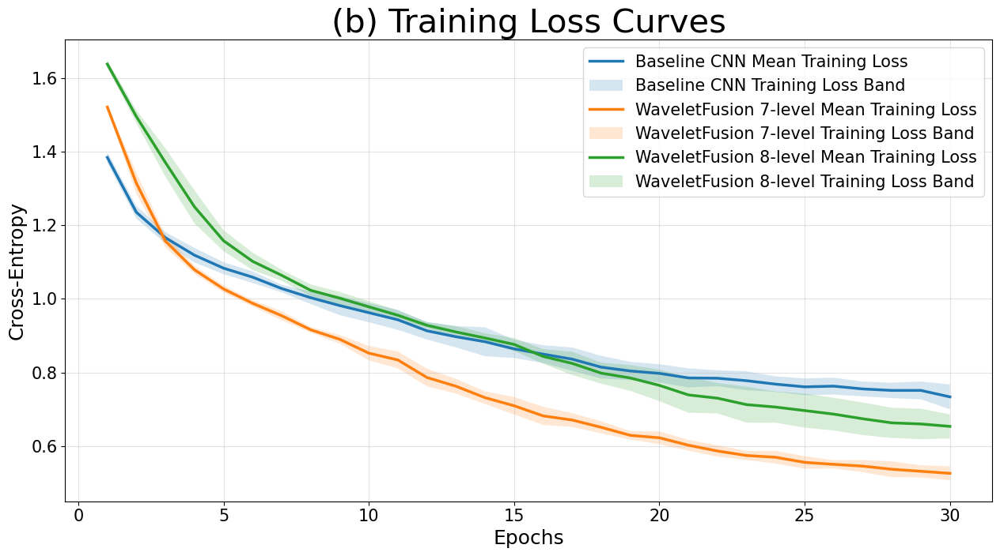

[Saved] ./histories2026/unified_training_loss_curves.png


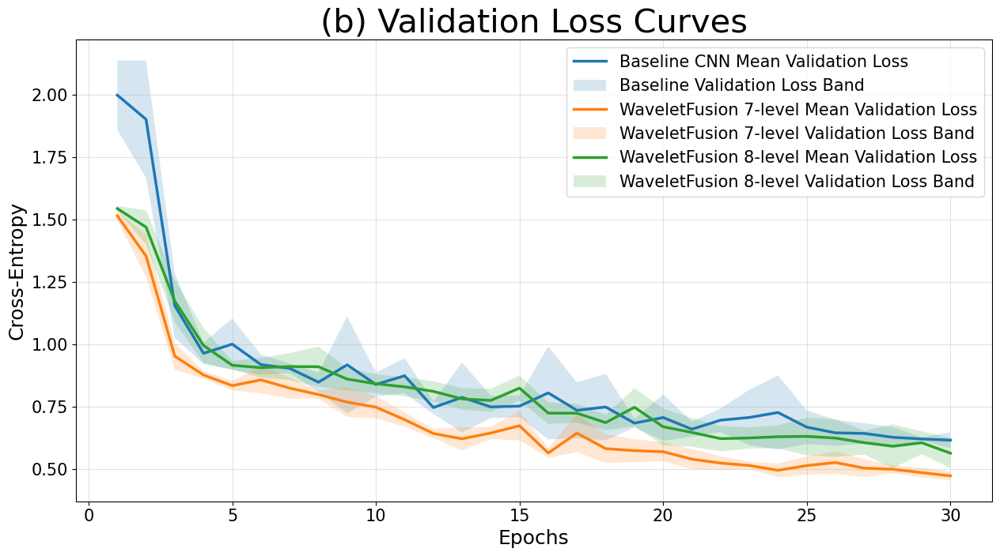

[Saved] ./histories2026/unified_validation_loss_curves.png


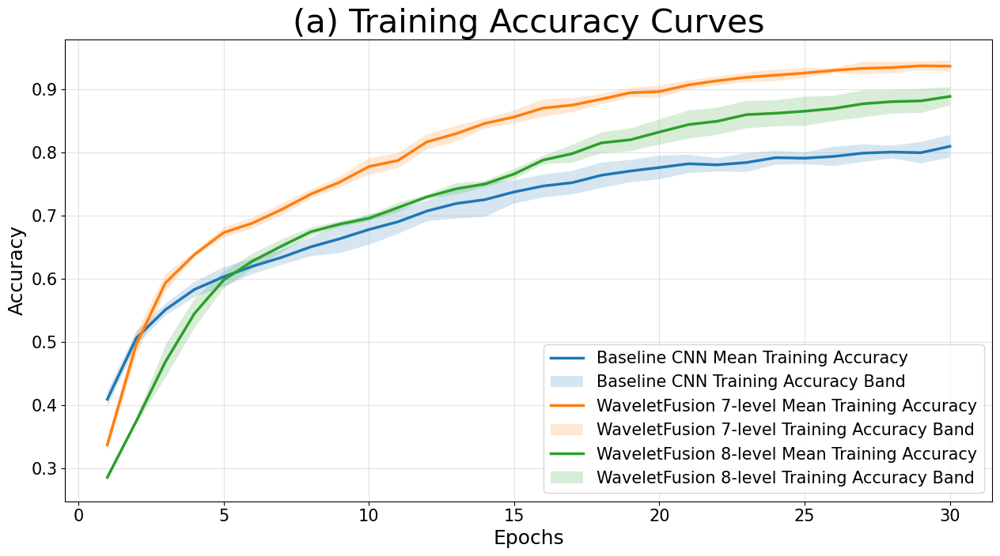

[Saved] ./histories2026/unified_training_accuracy_curves.png


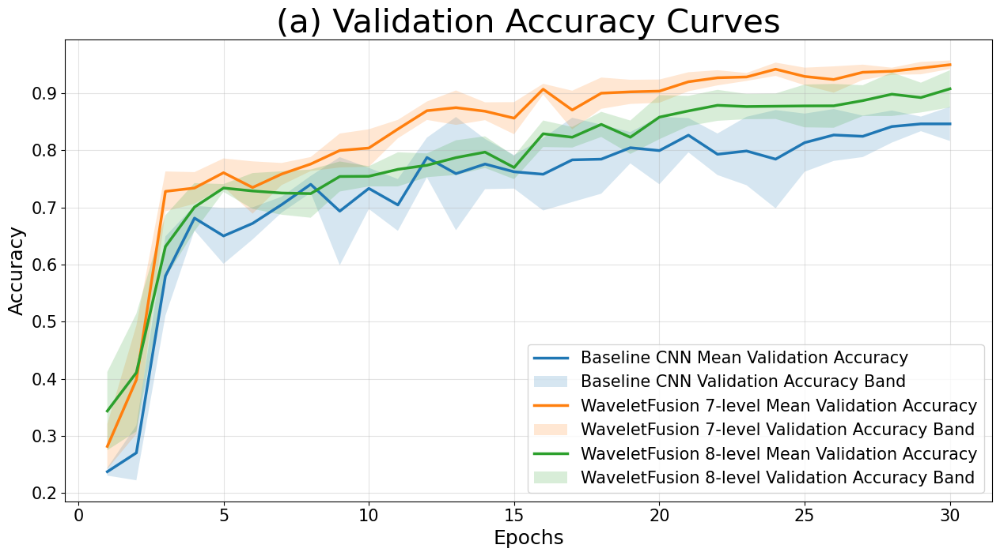

[Saved] ./histories2026/unified_validation_accuracy_curves.png

Done. All four unified plots were generated.
Title font size used: 30


In [8]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# -------------------- Config --------------------
HIST_DIR = "./histories2026"
OUT_DIR  = "./histories2026"
os.makedirs(OUT_DIR, exist_ok=True)

RUN_SEEDS = [42, 43, 44, 45, 46]
HEAD_MODE = "multilevel_details"

# Title font size
TITLE_FONT_SIZE = 30

# File templates
BASELINE_TMPL = "baseline_history_seed{seed}.csv"
WAVELET7_TMPL = f"wavelet7_history_seed{{seed}}_{HEAD_MODE}.csv"
WAVELET8_TMPL = f"wavelet8_history_seed{{seed}}_{HEAD_MODE}.csv"


# -------------------- Helpers --------------------
def load_histories(file_template, run_seeds, hist_dir):
    histories = []
    max_len = 0

    for seed in run_seeds:
        path = os.path.join(hist_dir, file_template.format(seed=seed))

        if not os.path.exists(path):
            print(f"[WARN] Missing file: {path}")
            continue

        df = pd.read_csv(path)

        # remove epoch column if present
        if "epoch" in df.columns:
            df = df.drop(columns=["epoch"])

        histories.append(df)
        max_len = max(max_len, len(df))

    if len(histories) == 0:
        raise FileNotFoundError(f"No history files found for template: {file_template}")

    return histories, max_len


def pad_and_stack(histories, column, max_len):
    """
    Pad each run with NaN up to max_len so mean/std can be computed
    even if some runs stopped early.
    """
    arrs = []

    for df in histories:
        vals = df[column].to_numpy(dtype=np.float32)

        padded = np.full((max_len,), np.nan, dtype=np.float32)
        padded[:len(vals)] = vals

        arrs.append(padded)

    return np.vstack(arrs)


def mean_std_from_histories(histories, column, max_len):
    stacked = pad_and_stack(histories, column, max_len)

    mean = np.nanmean(stacked, axis=0)
    std  = np.nanstd(stacked, axis=0, ddof=1)

    return mean, std


def plot_metric(ax, x, mean, std, label_line, label_band):
    ax.plot(
        x,
        mean,
        linewidth=2.5,
        label=label_line
    )

    ax.fill_between(
        x,
        mean - std,
        mean + std,
        alpha=0.18,
        label=label_band
    )


def build_curve_stats(file_template, label_prefix):
    histories, max_len = load_histories(file_template, RUN_SEEDS, HIST_DIR)

    stats = {
        "loss": mean_std_from_histories(histories, "loss", max_len),
        "val_loss": mean_std_from_histories(histories, "val_loss", max_len),
        "accuracy": mean_std_from_histories(histories, "accuracy", max_len),
        "val_accuracy": mean_std_from_histories(histories, "val_accuracy", max_len),
        "epochs": np.arange(1, max_len + 1),
        "label": label_prefix
    }

    return stats


def format_plot(ax, title, ylabel):
    ax.set_title(title, fontsize=TITLE_FONT_SIZE)
    ax.set_xlabel("Epochs", fontsize=18)
    ax.set_ylabel(ylabel, fontsize=18)
    ax.tick_params(axis="both", labelsize=15)
    ax.grid(True, alpha=0.35)
    ax.legend(fontsize=15)
    plt.tight_layout()


def save_plot(filename):
    out_path = os.path.join(OUT_DIR, filename)

    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.show()
    plt.close()

    print(f"[Saved] {out_path}")


# -------------------- Load all models --------------------
baseline_stats = build_curve_stats(BASELINE_TMPL, "Baseline CNN")
wavelet7_stats = build_curve_stats(WAVELET7_TMPL, "WaveletFusion 7-level")
wavelet8_stats = build_curve_stats(WAVELET8_TMPL, "WaveletFusion 8-level")


# -------------------- Plot 1: Training Loss --------------------
plt.figure(figsize=(12.8, 7.2))
ax = plt.gca()

plot_metric(
    ax,
    baseline_stats["epochs"],
    baseline_stats["loss"][0],
    baseline_stats["loss"][1],
    "Baseline CNN Mean Training Loss",
    "Baseline CNN Training Loss Band"
)

plot_metric(
    ax,
    wavelet7_stats["epochs"],
    wavelet7_stats["loss"][0],
    wavelet7_stats["loss"][1],
    "WaveletFusion 7-level Mean Training Loss",
    "WaveletFusion 7-level Training Loss Band"
)

plot_metric(
    ax,
    wavelet8_stats["epochs"],
    wavelet8_stats["loss"][0],
    wavelet8_stats["loss"][1],
    "WaveletFusion 8-level Mean Training Loss",
    "WaveletFusion 8-level Training Loss Band"
)

format_plot(
    ax,
    title="(b) Training Loss Curves",
    ylabel="Cross-Entropy"
)

save_plot("unified_training_loss_curves.png")


# -------------------- Plot 2: Validation Loss --------------------
plt.figure(figsize=(12.8, 7.2))
ax = plt.gca()

plot_metric(
    ax,
    baseline_stats["epochs"],
    baseline_stats["val_loss"][0],
    baseline_stats["val_loss"][1],
    "Baseline CNN Mean Validation Loss",
    "Baseline Validation Loss Band"
)

plot_metric(
    ax,
    wavelet7_stats["epochs"],
    wavelet7_stats["val_loss"][0],
    wavelet7_stats["val_loss"][1],
    "WaveletFusion 7-level Mean Validation Loss",
    "WaveletFusion 7-level Validation Loss Band"
)

plot_metric(
    ax,
    wavelet8_stats["epochs"],
    wavelet8_stats["val_loss"][0],
    wavelet8_stats["val_loss"][1],
    "WaveletFusion 8-level Mean Validation Loss",
    "WaveletFusion 8-level Validation Loss Band"
)

format_plot(
    ax,
    title="(b) Validation Loss Curves",
    ylabel="Cross-Entropy"
)

save_plot("unified_validation_loss_curves.png")


# -------------------- Plot 3: Training Accuracy --------------------
plt.figure(figsize=(12.8, 7.2))
ax = plt.gca()

plot_metric(
    ax,
    baseline_stats["epochs"],
    baseline_stats["accuracy"][0],
    baseline_stats["accuracy"][1],
    "Baseline CNN Mean Training Accuracy",
    "Baseline CNN Training Accuracy Band"
)

plot_metric(
    ax,
    wavelet7_stats["epochs"],
    wavelet7_stats["accuracy"][0],
    wavelet7_stats["accuracy"][1],
    "WaveletFusion 7-level Mean Training Accuracy",
    "WaveletFusion 7-level Training Accuracy Band"
)

plot_metric(
    ax,
    wavelet8_stats["epochs"],
    wavelet8_stats["accuracy"][0],
    wavelet8_stats["accuracy"][1],
    "WaveletFusion 8-level Mean Training Accuracy",
    "WaveletFusion 8-level Training Accuracy Band"
)

format_plot(
    ax,
    title="(a) Training Accuracy Curves",
    ylabel="Accuracy"
)

save_plot("unified_training_accuracy_curves.png")


# -------------------- Plot 4: Validation Accuracy --------------------
plt.figure(figsize=(12.8, 7.2))
ax = plt.gca()

plot_metric(
    ax,
    baseline_stats["epochs"],
    baseline_stats["val_accuracy"][0],
    baseline_stats["val_accuracy"][1],
    "Baseline CNN Mean Validation Accuracy",
    "Baseline CNN Validation Accuracy Band"
)

plot_metric(
    ax,
    wavelet7_stats["epochs"],
    wavelet7_stats["val_accuracy"][0],
    wavelet7_stats["val_accuracy"][1],
    "WaveletFusion 7-level Mean Validation Accuracy",
    "WaveletFusion 7-level Validation Accuracy Band"
)

plot_metric(
    ax,
    wavelet8_stats["epochs"],
    wavelet8_stats["val_accuracy"][0],
    wavelet8_stats["val_accuracy"][1],
    "WaveletFusion 8-level Mean Validation Accuracy",
    "WaveletFusion 8-level Validation Accuracy Band"
)

format_plot(
    ax,
    title="(a) Validation Accuracy Curves",
    ylabel="Accuracy"
)

save_plot("unified_validation_accuracy_curves.png")


print("\nDone. All four unified plots were generated.")
print(f"Title font size used: {TITLE_FONT_SIZE}")

# FINAL Br35H - Baseline CNN

In [7]:
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"
os.environ["TF_ENABLE_LAYOUT_OPTIMIZER"] = "0"

import time, gc
from pathlib import Path

import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd

from tensorflow.keras import layers, models, callbacks, regularizers
from tensorflow.keras import mixed_precision
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    f1_score,
    roc_auc_score
)
from sklearn.model_selection import train_test_split
from tensorflow.python.framework.convert_to_constants import convert_variables_to_constants_v2_as_graph

mixed_precision.set_global_policy("float32")

# -------------------- Config --------------------
DATA_DIR = "./"

IMG_SIZE  = 256
BATCH     = 32
AUTOTUNE  = tf.data.AUTOTUNE
EPOCHS    = 30

RUN_SEEDS   = [42, 43, 44, 45, 46]
REPORT_SEED = RUN_SEEDS[0]

HIST_DIR = "./Histories2026_br35h_baseline"
os.makedirs(HIST_DIR, exist_ok=True)

SAVE_CURVES_ALL = False

TEST_SIZE = 0.20
VAL_SIZE_WITHIN_TRAINVAL = 0.20

CLASS_NAMES = ["no", "yes"]


# -------------------- Preprocessing --------------------
def per_image_standardize_batch(x):
    out_dtype = x.dtype
    x32 = tf.cast(x, tf.float32)
    y32 = tf.map_fn(
        tf.image.per_image_standardization,
        x32,
        fn_output_signature=tf.float32
    )
    return tf.cast(y32, out_dtype)


# -------------------- tf.data helper --------------------
def cfg(ds, shuffle=False, seed=0):
    ds = ds.cache()
    if shuffle:
        ds = ds.shuffle(1000, seed=seed, reshuffle_each_iteration=True)
    return ds.prefetch(AUTOTUNE)

def count_images(ds):
    n = 0
    for xb, _ in ds:
        n += int(xb.shape[0])
    return n

def y_true_from_ds(ds):
    ys = []
    for _, y in ds:
        ys.append(y.numpy())
    return np.argmax(np.vstack(ys), axis=1)


# -------------------- AUC helper --------------------
def auc_scores_from_probs(y_true, y_probs, num_classes):
    """
    Computes ROC-AUC from predicted probabilities.

    Binary classification:
        Uses probability of the positive class: y_probs[:, 1]

    Multi-class classification:
        Uses One-vs-Rest macro and weighted ROC-AUC.
    """
    try:
        if num_classes == 2:
            auc = roc_auc_score(y_true, y_probs[:, 1])
            return {
                "AUC": float(auc),
                "AUC Macro OvR": float(auc),
                "AUC Weighted OvR": float(auc),
            }
        else:
            y_true_oh = tf.keras.utils.to_categorical(
                y_true,
                num_classes=num_classes
            )

            auc_macro = roc_auc_score(
                y_true_oh,
                y_probs,
                average="macro",
                multi_class="ovr"
            )

            auc_weighted = roc_auc_score(
                y_true_oh,
                y_probs,
                average="weighted",
                multi_class="ovr"
            )

            return {
                "AUC": float(auc_macro),
                "AUC Macro OvR": float(auc_macro),
                "AUC Weighted OvR": float(auc_weighted),
            }

    except Exception as e:
        print(f"[WARN] Could not compute AUC: {e}")
        return {
            "AUC": np.nan,
            "AUC Macro OvR": np.nan,
            "AUC Weighted OvR": np.nan,
        }


def collect_yes_no_paths(data_dir):
    data_dir = Path(data_dir)
    yes_dir = data_dir / "yes"
    no_dir  = data_dir / "no"

    if not yes_dir.exists() or not no_dir.exists():
        raise FileNotFoundError(
            f"Expected folders '{yes_dir}' and '{no_dir}'. "
            f"Set DATA_DIR to the dataset root containing yes/, no/, and pred/."
        )

    valid_ext = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"}

    yes_paths = sorted([
        str(p) for p in yes_dir.rglob("*")
        if p.suffix.lower() in valid_ext
    ])

    no_paths = sorted([
        str(p) for p in no_dir.rglob("*")
        if p.suffix.lower() in valid_ext
    ])

    if len(yes_paths) == 0 or len(no_paths) == 0:
        raise ValueError("No images found in yes/ or no/ folders.")

    paths = np.array(no_paths + yes_paths, dtype=object)
    labels = np.array(
        [0] * len(no_paths) + [1] * len(yes_paths),
        dtype=np.int32
    )

    return paths, labels

def decode_and_resize(path, label):
    img = tf.io.read_file(path)
    img = tf.image.decode_image(
        img,
        channels=1,
        expand_animations=False
    )
    img = tf.image.resize(
        img,
        [IMG_SIZE, IMG_SIZE],
        method="bilinear"
    )
    img = tf.cast(img, tf.float32)
    label = tf.one_hot(
        label,
        depth=len(CLASS_NAMES),
        dtype=tf.float32
    )
    return img, label

def make_dataset(paths, labels, shuffle=False, seed=0):
    ds = tf.data.Dataset.from_tensor_slices((paths, labels))
    ds = ds.map(decode_and_resize, num_parallel_calls=AUTOTUNE)
    ds = ds.batch(BATCH)
    ds = cfg(ds, shuffle=shuffle, seed=seed)
    return ds


# -------------------- Save helpers --------------------
def save_confusion_matrix_png(cm, class_names, title, out_path):
    plt.rcParams.update({"font.size": 12})
    fig, ax = plt.subplots(figsize=(7.2, 6.2))

    vmax = cm.max() if cm.max() > 0 else 1

    im = ax.imshow(
        cm,
        interpolation="nearest",
        cmap=plt.cm.Blues,
        vmin=0,
        vmax=vmax
    )

    cbar = plt.colorbar(im, ax=ax)
    cbar.ax.set_ylabel("Number of samples")

    ticks = np.arange(len(class_names))
    ax.set_xticks(ticks)
    ax.set_yticks(ticks)
    ax.set_xticklabels(class_names, rotation=45, ha="right")
    ax.set_yticklabels(class_names)

    ax.set_ylabel("True label")
    ax.set_xlabel("Predicted label")
    ax.set_title(title)

    thresh = vmax / 2.0

    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(
                j,
                i,
                str(cm[i, j]),
                ha="center",
                va="center",
                color="white" if cm[i, j] > thresh else "black"
            )

    plt.tight_layout()
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)

def save_curves_png(hist, out_prefix, title_prefix):
    epochs = np.arange(1, len(hist.history["loss"]) + 1)

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, hist.history["loss"], label="Training loss")
    plt.plot(
        epochs,
        hist.history["val_loss"],
        linestyle="--",
        label="Validation loss"
    )
    plt.xlabel("Epoch")
    plt.ylabel("Cross-Entropy")
    plt.title(f"{title_prefix} – Loss Curves")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.savefig(out_prefix + "_loss.png", dpi=300, bbox_inches="tight")
    plt.close()

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, hist.history["accuracy"], label="Training accuracy")
    plt.plot(
        epochs,
        hist.history["val_accuracy"],
        linestyle="--",
        label="Validation accuracy"
    )
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title(f"{title_prefix} – Accuracy Curves")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.savefig(out_prefix + "_acc.png", dpi=300, bbox_inches="tight")
    plt.close()

def specificity_from_cm(cm: np.ndarray):
    spec = []
    total = cm.sum()

    for i in range(cm.shape[0]):
        TP = cm[i, i]
        FN = cm[i, :].sum() - TP
        FP = cm[:, i].sum() - TP
        TN = total - TP - FN - FP

        spec_i = TN / (TN + FP + 1e-12)
        spec.append(float(spec_i))

    return spec

def per_class_table(report_dict, cm, class_names):
    spec = specificity_from_cm(cm)
    rows = []

    for idx, cls in enumerate(class_names):
        d = report_dict.get(cls, {})
        rows.append({
            "class": cls,
            "precision": float(d.get("precision", np.nan)),
            "recall(sensitivity)": float(d.get("recall", np.nan)),
            "specificity": spec[idx],
            "f1_score": float(d.get("f1-score", np.nan)),
            "support": int(d.get("support", 0)),
        })

    return pd.DataFrame(rows)


# -------------------- Computational complexity + inference helpers --------------------
def compute_flops(model, input_shape=(1, 256, 256, 1)):
    @tf.function
    def forward(x):
        return model(x, training=False)

    concrete_func = forward.get_concrete_function(
        tf.TensorSpec(input_shape, tf.float32)
    )

    frozen_func, graph_def = convert_variables_to_constants_v2_as_graph(
        concrete_func
    )

    with tf.Graph().as_default() as graph:
        tf.graph_util.import_graph_def(graph_def, name="")
        run_meta = tf.compat.v1.RunMetadata()
        opts = tf.compat.v1.profiler.ProfileOptionBuilder.float_operation()

        flops = tf.compat.v1.profiler.profile(
            graph=graph,
            run_meta=run_meta,
            cmd="op",
            options=opts
        )

    return int(flops.total_float_ops) if flops is not None else 0

def benchmark_inference(model, ds, warmup_steps=3, repeat_steps=30):
    sample_batch = next(iter(ds))[0]
    sample_batch = tf.cast(sample_batch, tf.float32)
    batch_size = int(sample_batch.shape[0])

    for _ in range(warmup_steps):
        y = model(sample_batch, training=False)
        _ = y.numpy()

    batch_times = []

    for _ in range(repeat_steps):
        t0 = time.perf_counter()
        y = model(sample_batch, training=False)
        _ = y.numpy()
        batch_times.append(time.perf_counter() - t0)

    mean_batch_time_s = float(np.mean(batch_times))
    batch_time_ms = mean_batch_time_s * 1000.0
    latency_ms_per_img = (mean_batch_time_s / batch_size) * 1000.0
    throughput_img_s = (
        batch_size / mean_batch_time_s
        if mean_batch_time_s > 0
        else float("nan")
    )

    total_imgs = 0
    t0 = time.perf_counter()

    for xb, _ in ds:
        y = model(tf.cast(xb, tf.float32), training=False)
        _ = y.numpy()
        total_imgs += int(xb.shape[0])

    full_test_time_s = time.perf_counter() - t0

    return {
        "Inference Latency (ms/img)": float(latency_ms_per_img),
        "Inference Throughput (img/s)": float(throughput_img_s),
        "Inference Batch Time (ms)": float(batch_time_ms),
        "Full Test Inference Time (s)": float(full_test_time_s),
        "Num Test Images": int(total_imgs),
    }


# -------------------- Model builder --------------------
L2_STRENGTH = 2e-4

def conv_block(x, filters, sd_rate=0.0):
    x = layers.Conv2D(
        filters,
        3,
        padding="same",
        use_bias=False,
        kernel_regularizer=regularizers.l2(L2_STRENGTH)
    )(x)

    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2D(
        filters,
        3,
        padding="same",
        use_bias=False,
        kernel_regularizer=regularizers.l2(L2_STRENGTH)
    )(x)

    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    if sd_rate > 0:
        x = layers.SpatialDropout2D(sd_rate)(x)

    return x

def build_baseline_model(num_classes: int, run_seed: int):
    augment = tf.keras.Sequential([
        layers.RandomFlip("horizontal", seed=run_seed),
        layers.RandomRotation(0.05, seed=run_seed + 1),
        layers.RandomZoom(0.1, seed=run_seed + 2),
        layers.RandomContrast(0.1, seed=run_seed + 3),
        layers.RandomTranslation(0.03, 0.03, seed=run_seed + 4)
    ], name="augment")

    rescale = layers.Rescaling(1. / 255)

    standardize = layers.Lambda(
        per_image_standardize_batch,
        name="per_image_standardization"
    )

    inputs = layers.Input((IMG_SIZE, IMG_SIZE, 1))

    x = augment(inputs)
    x = rescale(x)
    x = standardize(x)
    x = layers.GaussianNoise(0.02)(x)

    x = conv_block(x, 16, sd_rate=0.10)
    x = layers.MaxPooling2D()(x)

    x = conv_block(x, 32, sd_rate=0.10)
    x = layers.MaxPooling2D()(x)

    x = conv_block(x, 64, sd_rate=0.12)
    x = layers.MaxPooling2D()(x)

    x = conv_block(x, 128, sd_rate=0.15)

    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.5)(x)

    x = layers.Dense(
        128,
        activation="relu",
        kernel_regularizer=regularizers.l2(L2_STRENGTH)
    )(x)

    x = layers.Dropout(0.35)(x)

    outputs = layers.Dense(num_classes, activation="softmax")(x)

    return models.Model(
        inputs,
        outputs,
        name="Baseline_CNN_v2_Br35H"
    )


# -------------------- Multi-run loop --------------------
all_paths, all_labels = collect_yes_no_paths(DATA_DIR)

print(f"Found {len(all_paths)} labeled images total.")
print(f"Class distribution -> no: {(all_labels == 0).sum()}, yes: {(all_labels == 1).sum()}")
print("Folder 'pred' is ignored during supervised training/evaluation.")

rows = []
class_names_ref = CLASS_NAMES.copy()

np.save(
    os.path.join(HIST_DIR, "class_names.npy"),
    np.array(CLASS_NAMES, dtype=object)
)

print(f"[Saved] Class names -> {os.path.join(HIST_DIR, 'class_names.npy')}")

for run_seed in RUN_SEEDS:
    split_seed = run_seed

    print(f"\n================= RUN_SEED = {run_seed} | SPLIT_SEED = {split_seed} =================")

    tf.keras.backend.clear_session()
    gc.collect()
    tf.keras.utils.set_random_seed(run_seed)

    trainval_paths, test_paths, trainval_labels, test_labels = train_test_split(
        all_paths,
        all_labels,
        test_size=TEST_SIZE,
        random_state=split_seed,
        stratify=all_labels
    )

    train_paths, val_paths, train_labels, val_labels = train_test_split(
        trainval_paths,
        trainval_labels,
        test_size=VAL_SIZE_WITHIN_TRAINVAL,
        random_state=split_seed,
        stratify=trainval_labels
    )

    print(f"Train: {len(train_paths)} | Val: {len(val_paths)} | Test: {len(test_paths)}")

    train_ds = make_dataset(
        train_paths,
        train_labels,
        shuffle=True,
        seed=run_seed
    )

    train_eval_ds = make_dataset(
        train_paths,
        train_labels,
        shuffle=False,
        seed=run_seed
    )

    val_ds = make_dataset(
        val_paths,
        val_labels,
        shuffle=False,
        seed=run_seed
    )

    test_ds = make_dataset(
        test_paths,
        test_labels,
        shuffle=False,
        seed=run_seed
    )

    model = build_baseline_model(
        num_classes=len(CLASS_NAMES),
        run_seed=run_seed
    )

    # ---- Computational complexity per image ----
    flops = compute_flops(
        model,
        input_shape=(1, IMG_SIZE, IMG_SIZE, 1)
    )

    flops_m = flops / 1e6

    print(f"FLOPs per image: {flops} ({flops_m:.4f} M)")

    loss_fn = tf.keras.losses.CategoricalCrossentropy(
        label_smoothing=0.05
    )

    model.compile(
        optimizer=tf.keras.optimizers.Adam(3e-4),
        loss=loss_fn,
        metrics=["accuracy"]
    )

    class EpochTimer(callbacks.Callback):
        def on_train_begin(self, logs=None):
            self.epoch_times = []

        def on_epoch_begin(self, epoch, logs=None):
            self._t0 = time.time()

        def on_epoch_end(self, epoch, logs=None):
            self.epoch_times.append(time.time() - self._t0)

    epoch_timer = EpochTimer()

    cbs = [
        callbacks.ReduceLROnPlateau(
            patience=3,
            factor=0.5,
            monitor="val_loss"
        ),
        epoch_timer,
    ]

    t0 = time.time()

    hist = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=EPOCHS,
        callbacks=cbs,
        verbose=1
    )

    total_train_time = time.time() - t0

    # ---- Save history CSV ----
    hist_path = os.path.join(
        HIST_DIR,
        f"baseline_br35h_history_seed{run_seed}.csv"
    )

    pd.DataFrame(hist.history).to_csv(hist_path, index_label="epoch")

    print(f"[Saved] Baseline history -> {hist_path}")

    # ---- Save curves optional ----
    if SAVE_CURVES_ALL or run_seed == REPORT_SEED:
        curves_prefix = os.path.join(
            HIST_DIR,
            f"baseline_br35h_curves_seed{run_seed}"
        )

        save_curves_png(
            hist,
            curves_prefix,
            title_prefix=f"Baseline CNN Br35H [seed={run_seed}]"
        )

        print(f"[Saved] Baseline curves -> {curves_prefix}_loss.png / {curves_prefix}_acc.png")

    # ---- Train FPS ----
    num_train_images = count_images(train_eval_ds)

    avg_epoch_time = (
        float(np.mean(epoch_timer.epoch_times))
        if epoch_timer.epoch_times
        else float("nan")
    )

    train_fps = (
        num_train_images / avg_epoch_time
        if avg_epoch_time > 0
        else float("nan")
    )

    # ---- Evaluate VALIDATION ----
    val_probs = model.predict(val_ds, verbose=0)
    y_pred_val = np.argmax(val_probs, axis=1)
    y_true_val = y_true_from_ds(val_ds)

    val_loss, val_acc = model.evaluate(val_ds, verbose=0)
    val_macro_f1 = float(f1_score(y_true_val, y_pred_val, average="macro"))

    val_auc_scores = auc_scores_from_probs(
        y_true_val,
        val_probs,
        num_classes=len(CLASS_NAMES)
    )

    val_auc = val_auc_scores["AUC"]
    val_auc_macro = val_auc_scores["AUC Macro OvR"]
    val_auc_weighted = val_auc_scores["AUC Weighted OvR"]

    # ---- Evaluate TEST ----
    test_probs = model.predict(test_ds, verbose=0)
    y_pred_test = np.argmax(test_probs, axis=1)
    y_true_test = y_true_from_ds(test_ds)

    test_loss, test_acc = model.evaluate(test_ds, verbose=0)
    test_macro_f1 = float(f1_score(y_true_test, y_pred_test, average="macro"))

    test_auc_scores = auc_scores_from_probs(
        y_true_test,
        test_probs,
        num_classes=len(CLASS_NAMES)
    )

    test_auc = test_auc_scores["AUC"]
    test_auc_macro = test_auc_scores["AUC Macro OvR"]
    test_auc_weighted = test_auc_scores["AUC Weighted OvR"]

    # ---- Inference benchmark on TEST set ----
    infer_stats = benchmark_inference(
        model,
        test_ds,
        warmup_steps=3,
        repeat_steps=30
    )

    # ---- Save CM for ALL seeds: VAL + TEST ----
    cm_val = confusion_matrix(y_true_val, y_pred_val)
    cm_test = confusion_matrix(y_true_test, y_pred_test)

    cm_val_npy = os.path.join(
        HIST_DIR,
        f"baseline_br35h_cm_val_seed{run_seed}.npy"
    )

    cm_test_npy = os.path.join(
        HIST_DIR,
        f"baseline_br35h_cm_test_seed{run_seed}.npy"
    )

    np.save(cm_val_npy, cm_val)
    np.save(cm_test_npy, cm_test)

    cm_val_png = os.path.join(
        HIST_DIR,
        f"baseline_br35h_cm_val_seed{run_seed}.png"
    )

    cm_test_png = os.path.join(
        HIST_DIR,
        f"baseline_br35h_cm_test_seed{run_seed}.png"
    )

    save_confusion_matrix_png(
        cm_val,
        CLASS_NAMES,
        title=f"Baseline CNN Br35H – Confusion Matrix (VAL) [seed={run_seed}]",
        out_path=cm_val_png
    )

    save_confusion_matrix_png(
        cm_test,
        CLASS_NAMES,
        title=f"Baseline CNN Br35H – Confusion Matrix (TEST) [seed={run_seed}]",
        out_path=cm_test_png
    )

    # ---- Save full reports for ALL seeds: VAL + TEST ----
    report_val_txt = classification_report(
        y_true_val,
        y_pred_val,
        target_names=CLASS_NAMES,
        digits=4
    )

    report_test_txt = classification_report(
        y_true_test,
        y_pred_test,
        target_names=CLASS_NAMES,
        digits=4
    )

    report_txt_path = os.path.join(
        HIST_DIR,
        f"baseline_br35h_report_seed{run_seed}.txt"
    )

    with open(report_txt_path, "w", encoding="utf-8") as f:
        f.write("=== Baseline CNN Br35H – Validation report ===\n")
        f.write(report_val_txt)

        f.write("\n\n=== Baseline CNN Br35H – Validation AUC ===\n")
        f.write(f"Val AUC: {val_auc:.4f}\n")
        f.write(f"Val AUC Macro OvR: {val_auc_macro:.4f}\n")
        f.write(f"Val AUC Weighted OvR: {val_auc_weighted:.4f}\n")

        f.write("\n\n=== Baseline CNN Br35H – Test report ===\n")
        f.write(report_test_txt)

        f.write("\n\n=== Baseline CNN Br35H – Test AUC ===\n")
        f.write(f"Test AUC: {test_auc:.4f}\n")
        f.write(f"Test AUC Macro OvR: {test_auc_macro:.4f}\n")
        f.write(f"Test AUC Weighted OvR: {test_auc_weighted:.4f}\n")

    print(f"[Saved] Baseline reports -> {report_txt_path}")

    # ---- Save per-class tables for ALL seeds: VAL + TEST ----
    report_val_dict = classification_report(
        y_true_val,
        y_pred_val,
        target_names=CLASS_NAMES,
        digits=4,
        output_dict=True
    )

    report_test_dict = classification_report(
        y_true_test,
        y_pred_test,
        target_names=CLASS_NAMES,
        digits=4,
        output_dict=True
    )

    df_val_pc = per_class_table(
        report_val_dict,
        cm_val,
        CLASS_NAMES
    )

    df_test_pc = per_class_table(
        report_test_dict,
        cm_test,
        CLASS_NAMES
    )

    val_csv = os.path.join(
        HIST_DIR,
        f"baseline_br35h_perclass_val_seed{run_seed}.csv"
    )

    tst_csv = os.path.join(
        HIST_DIR,
        f"baseline_br35h_perclass_test_seed{run_seed}.csv"
    )

    df_val_pc.to_csv(val_csv, index=False)
    df_test_pc.to_csv(tst_csv, index=False)

    val_txt = os.path.join(
        HIST_DIR,
        f"baseline_br35h_perclass_val_seed{run_seed}.txt"
    )

    tst_txt = os.path.join(
        HIST_DIR,
        f"baseline_br35h_perclass_test_seed{run_seed}.txt"
    )

    with open(val_txt, "w", encoding="utf-8") as f:
        f.write(df_val_pc.to_string(index=False))

    with open(tst_txt, "w", encoding="utf-8") as f:
        f.write(df_test_pc.to_string(index=False))

    print(f"[Saved] Baseline per-class VAL -> {val_csv} / {val_txt}")
    print(f"[Saved] Baseline per-class TEST -> {tst_csv} / {tst_txt}")
    print(f"[Saved] Baseline CM VAL/TEST -> {cm_val_npy}, {cm_test_npy} (+png)")

    # ---- Store per-seed summary row ----
    rows.append({
        "RUN_SEED": run_seed,
        "SPLIT_SEED": split_seed,

        "Val Loss": float(val_loss),
        "Val Acc": float(val_acc),
        "Val Macro-F1": float(val_macro_f1),
        "Val AUC": float(val_auc),
        "Val AUC Macro OvR": float(val_auc_macro),
        "Val AUC Weighted OvR": float(val_auc_weighted),

        "Test Loss": float(test_loss),
        "Test Acc": float(test_acc),
        "Test Macro-F1": float(test_macro_f1),
        "Test AUC": float(test_auc),
        "Test AUC Macro OvR": float(test_auc_macro),
        "Test AUC Weighted OvR": float(test_auc_weighted),

        "Train Time (s)": float(total_train_time),
        "Avg Epoch Time (s)": float(avg_epoch_time),
        "Train FPS (img/s)": float(train_fps),

        "Parameters": int(model.count_params()),
        "FLOPs": int(flops),
        "FLOPs (M)": float(flops_m),

        "Inference Latency (ms/img)": infer_stats["Inference Latency (ms/img)"],
        "Inference Throughput (img/s)": infer_stats["Inference Throughput (img/s)"],
        "Inference Batch Time (ms)": infer_stats["Inference Batch Time (ms)"],
        "Full Test Inference Time (s)": infer_stats["Full Test Inference Time (s)"],
        "Num Test Images": infer_stats["Num Test Images"],

        "Num Classes": int(len(CLASS_NAMES)),
    })

    # ---- Cleanup ----
    del model
    del train_ds, val_ds, test_ds, train_eval_ds
    del hist
    del val_probs, test_probs
    del y_pred_val, y_pred_test
    del y_true_val, y_true_test

    tf.keras.backend.clear_session()
    gc.collect()


# -------------------- Results: per-run + mean ± std --------------------
df = pd.DataFrame(rows).sort_values("RUN_SEED").reset_index(drop=True)

print("\n================= PER-SEED SUMMARY (Baseline CNN Br35H) =================")
print(
    df.to_string(
        index=False,
        float_format=lambda x: f"{x:.4f}" if isinstance(x, float) else str(x)
    )
)

summary_csv = os.path.join(
    HIST_DIR,
    "baseline_br35h_summary_seeds42to46.csv"
)

df.to_csv(summary_csv, index=False)

print(f"[Saved] Baseline summary -> {summary_csv}")

comp_cols = [
    "RUN_SEED",
    "SPLIT_SEED",
    "Parameters",
    "FLOPs (M)",
    "Inference Latency (ms/img)",
    "Inference Throughput (img/s)",
    "Avg Epoch Time (s)",
    "Train FPS (img/s)",
    "Train Time (s)",
    "Full Test Inference Time (s)"
]

comp_df = df[comp_cols].copy()

comp_csv = os.path.join(
    HIST_DIR,
    "baseline_br35h_computational_summary.csv"
)

comp_df.to_csv(comp_csv, index=False)

print(f"[Saved] Computational summary -> {comp_csv}")

def mean_std(series):
    series = np.asarray(series, dtype=np.float32)
    m = float(np.mean(series))
    s = float(np.std(series, ddof=1)) if len(series) > 1 else 0.0
    return m, s

print("\n================= MEAN ± STD (Baseline CNN Br35H) =================")

for key in [
    "Val Loss",
    "Val Acc",
    "Val Macro-F1",
    "Val AUC",
    "Val AUC Macro OvR",
    "Val AUC Weighted OvR",

    "Test Loss",
    "Test Acc",
    "Test Macro-F1",
    "Test AUC",
    "Test AUC Macro OvR",
    "Test AUC Weighted OvR",

    "Avg Epoch Time (s)",
    "Train FPS (img/s)",
    "Parameters",
    "FLOPs (M)",
    "Inference Latency (ms/img)",
    "Inference Throughput (img/s)",
    "Full Test Inference Time (s)"
]:
    m, s = mean_std(df[key])
    print(f"{key:>28s} : {m:.4f} ± {s:.4f}")


tf.keras.backend.clear_session()
gc.collect()


Found 3002 labeled images total.
Class distribution -> no: 1501, yes: 1501
Folder 'pred' is ignored during supervised training/evaluation.
[Saved] Class names -> ./Histories2026_br35h_baseline/class_names.npy

================= RUN_SEED = 42 | SPLIT_SEED = 42 =================
Train: 1920 | Val: 481 | Test: 601
FLOPs per image: 1690275279 (1690.2753 M)
=========================Options=============================
-max_depth                  10000
-min_bytes                  0
-min_peak_bytes             0
-min_residual_bytes         0
-min_output_bytes           0
-min_micros                 0
-min_accelerator_micros     0
-min_cpu_micros             0
-min_params                 0
-min_float_ops              1
-min_occurrence             0
-step                       -1
-order_by                   float_ops
-account_type_regexes       .*
-start_name_regexes         .*
-trim_name_regexes          
-show_name_regexes          .*
-hide_name_regexes          
-account_displayed_op_only  t

I0000 00:00:1777230887.294540     295 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 2
2026-04-26 19:14:51.159381: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/Baseline_CNN_v2_Br35H_1/spatial_dropout2d_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step - accuracy: 0.5575 - loss: 0.8181 - val_accuracy: 0.4990 - val_loss: 0.8526 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - accuracy: 0.6825 - loss: 0.7326 - val_accuracy: 0.4990 - val_loss: 0.8833 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.6975 - loss: 0.7110 - val_accuracy: 0.7193 - val_loss: 0.7016 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.7182 - loss: 0.6878 - val_accuracy: 0.7339 - val_loss: 0.6693 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - accuracy: 0.7151 - loss: 0.6774 - val_accuracy: 0.8046 - val_loss: 0.5635 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - accuracy: 0.7519 - loss: 0.6330 - val_accuracy: 0.7672 - val_loss: 0.6082 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - accuracy: 0.7706 - loss: 0.6

I0000 00:00:1777230983.382625     295 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 2
2026-04-26 19:16:27.255732: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/Baseline_CNN_v2_Br35H_1/spatial_dropout2d_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step - accuracy: 0.5884 - loss: 0.8042 - val_accuracy: 0.4990 - val_loss: 0.8738 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.6553 - loss: 0.7529 - val_accuracy: 0.5301 - val_loss: 0.7745 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - accuracy: 0.7066 - loss: 0.6965 - val_accuracy: 0.7277 - val_loss: 0.6907 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - accuracy: 0.7327 - loss: 0.6515 - val_accuracy: 0.7401 - val_loss: 0.6459 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - accuracy: 0.7599 - loss: 0.6310 - val_accuracy: 0.7339 - val_loss: 0.6369 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - accuracy: 0.7829 - loss: 0.5965 - val_accuracy: 0.7651 - val_loss: 0.5963 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.7824 - loss: 0.5

I0000 00:00:1777231074.805444     295 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 2


FLOPs per image: 1690275279 (1690.2753 M)

=========================Options=============================
-max_depth                  10000
-min_bytes                  0
-min_peak_bytes             0
-min_residual_bytes         0
-min_output_bytes           0
-min_micros                 0
-min_accelerator_micros     0
-min_cpu_micros             0
-min_params                 0
-min_float_ops              1
-min_occurrence             0
-step                       -1
-order_by                   float_ops
-account_type_regexes       .*
-start_name_regexes         .*
-trim_name_regexes          
-show_name_regexes          .*
-hide_name_regexes          
-account_displayed_op_only  true
-select                     float_ops
-output                     stdout:

==================Model Analysis Report======================

Doc:
op: The nodes are operation kernel type, such as MatMul, Conv2D. Graph nodes belonging to the same type are aggregated together.
flops: Number of float operations. N

2026-04-26 19:17:58.794798: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/Baseline_CNN_v2_Br35H_1/spatial_dropout2d_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step - accuracy: 0.5736 - loss: 0.8532 - val_accuracy: 0.4990 - val_loss: 0.8485 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - accuracy: 0.6735 - loss: 0.7488 - val_accuracy: 0.5198 - val_loss: 0.7869 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - accuracy: 0.6896 - loss: 0.7144 - val_accuracy: 0.7069 - val_loss: 0.6896 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - accuracy: 0.7259 - loss: 0.6649 - val_accuracy: 0.7380 - val_loss: 0.6537 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - accuracy: 0.7701 - loss: 0.6323 - val_accuracy: 0.7110 - val_loss: 0.6623 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - accuracy: 0.7611 - loss: 0.6207 - val_accuracy: 0.7360 - val_loss: 0.6330 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - accuracy: 0.7540 - loss: 0.6

I0000 00:00:1777231166.210040     295 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 2



=========================Options=============================
-max_depth                  10000
-min_bytes                  0
-min_peak_bytes             0
-min_residual_bytes         0
-min_output_bytes           0
-min_micros                 0
-min_accelerator_micros     0
-min_cpu_micros             0
-min_params                 0
-min_float_ops              1
-min_occurrence             0
-step                       -1
-order_by                   float_ops
-account_type_regexes       .*
-start_name_regexes         .*
-trim_name_regexes          
-show_name_regexes          .*
-hide_name_regexes          
-account_displayed_op_only  true
-select                     float_ops
-output                     stdout:

==================Model Analysis Report======================

Doc:
op: The nodes are operation kernel type, such as MatMul, Conv2D. Graph nodes belonging to the same type are aggregated together.
flops: Number of float operations. Note: Please read the implementation for th

2026-04-26 19:19:30.074095: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/Baseline_CNN_v2_Br35H_1/spatial_dropout2d_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step - accuracy: 0.5591 - loss: 0.8664 - val_accuracy: 0.5010 - val_loss: 0.8052 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.6913 - loss: 0.7236 - val_accuracy: 0.6175 - val_loss: 0.7653 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - accuracy: 0.7070 - loss: 0.6941 - val_accuracy: 0.6091 - val_loss: 0.7586 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - accuracy: 0.7390 - loss: 0.6478 - val_accuracy: 0.5530 - val_loss: 0.8194 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.7740 - loss: 0.6110 - val_accuracy: 0.7942 - val_loss: 0.5822 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - accuracy: 0.7594 - loss: 0.6284 - val_accuracy: 0.7755 - val_loss: 0.5819 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - accuracy: 0.7759 - loss: 0.6

I0000 00:00:1777231255.660262     295 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 2
2026-04-26 19:20:59.512161: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/Baseline_CNN_v2_Br35H_1/spatial_dropout2d_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step - accuracy: 0.5708 - loss: 0.8317 - val_accuracy: 0.5010 - val_loss: 0.8562 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - accuracy: 0.6817 - loss: 0.7291 - val_accuracy: 0.7380 - val_loss: 0.6954 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - accuracy: 0.6987 - loss: 0.7053 - val_accuracy: 0.7775 - val_loss: 0.6433 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - accuracy: 0.7341 - loss: 0.6645 - val_accuracy: 0.7838 - val_loss: 0.5913 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - accuracy: 0.8019 - loss: 0.5983 - val_accuracy: 0.7131 - val_loss: 0.6984 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - accuracy: 0.7731 - loss: 0.6041 - val_accuracy: 0.8295 - val_loss: 0.5157 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - accuracy: 0.7966 - loss: 0.5

# FINAL WaveletFusion 8-level - BR35H

In [8]:
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"
os.environ["TF_ENABLE_LAYOUT_OPTIMIZER"] = "0"

import time, gc
from pathlib import Path
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd

from tensorflow.keras import layers, models, callbacks, regularizers
from tensorflow.keras import mixed_precision
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    f1_score,
    roc_auc_score
)
from sklearn.model_selection import train_test_split
from tensorflow.python.framework.convert_to_constants import convert_variables_to_constants_v2_as_graph

# -------------------- Force float32 (journal comparability) --------------------
mixed_precision.set_global_policy("float32")

# -------------------- Config --------------------
DATA_DIR = "./"

IMG_SIZE  = 256
BATCH     = 32
AUTOTUNE  = tf.data.AUTOTUNE
EPOCHS    = 30

HEAD_MODE = "multilevel_details" 
N_LEVELS  = 8
PROJ_DIM  = 16

RUN_SEEDS   = [42, 43, 44, 45, 46]
REPORT_SEED = RUN_SEEDS[0]

TEST_SIZE = 0.20
VAL_SIZE_WITHIN_TRAINVAL = 0.20

CLASS_NAMES = ["no", "yes"]

MAX_PARAMS = 311700

HIST_DIR = "./ArticleHistories_br35h_wavelet8"
os.makedirs(HIST_DIR, exist_ok=True)

# Optional extras
SAVE_CURVES_ALL   = False
PLOT_HAAR_DECOMP  = True
PLOT_LEVELS       = 8
DECOMP_FROM       = "train"  

if IMG_SIZE % (2 ** N_LEVELS) != 0:
    raise ValueError(
        f"IMG_SIZE={IMG_SIZE} must be divisible by 2^{N_LEVELS} "
        f"for {N_LEVELS}-level decomposition."
    )

def collect_yes_no_paths(data_dir):
    data_dir = Path(data_dir)
    yes_dir = data_dir / "yes"
    no_dir  = data_dir / "no"

    if not yes_dir.exists() or not no_dir.exists():
        raise FileNotFoundError(
            f"Expected folders '{yes_dir}' and '{no_dir}'. "
            f"Set DATA_DIR to the dataset root containing yes/, no/, and pred/."
        )

    valid_ext = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"}

    yes_paths = sorted([
        str(p) for p in yes_dir.rglob("*")
        if p.suffix.lower() in valid_ext
    ])

    no_paths = sorted([
        str(p) for p in no_dir.rglob("*")
        if p.suffix.lower() in valid_ext
    ])

    if len(yes_paths) == 0 or len(no_paths) == 0:
        raise ValueError("No images found in yes/ or no/ folders.")

    paths = np.array(no_paths + yes_paths, dtype=object)
    labels = np.array(
        [0] * len(no_paths) + [1] * len(yes_paths),
        dtype=np.int32
    )

    return paths, labels

# -------------------- Preprocessing --------------------
def per_image_standardize_batch(x):
    out_dtype = x.dtype
    x32 = tf.cast(x, tf.float32)
    y32 = tf.map_fn(
        tf.image.per_image_standardization,
        x32,
        fn_output_signature=tf.float32
    )
    return tf.cast(y32, out_dtype)

def decode_and_resize(path, label):
    img = tf.io.read_file(path)

    img = tf.image.decode_image(
        img,
        channels=1,
        expand_animations=False
    )

    img = tf.image.resize(
        img,
        [IMG_SIZE, IMG_SIZE],
        method="bilinear"
    )

    img = tf.cast(img, tf.float32)

    label = tf.one_hot(
        label,
        depth=len(CLASS_NAMES),
        dtype=tf.float32
    )

    return img, label

# -------------------- tf.data helper --------------------
def cfg(ds, shuffle=False, seed=0):
    ds = ds.cache()
    if shuffle:
        ds = ds.shuffle(1000, seed=seed, reshuffle_each_iteration=True)
    return ds.prefetch(AUTOTUNE)

def make_dataset(paths, labels, shuffle=False, seed=0):
    ds = tf.data.Dataset.from_tensor_slices((paths, labels))
    ds = ds.map(decode_and_resize, num_parallel_calls=AUTOTUNE)
    ds = ds.batch(BATCH)
    ds = cfg(ds, shuffle=shuffle, seed=seed)
    return ds

def count_images(ds):
    n = 0
    for xb, _ in ds:
        n += int(xb.shape[0])
    return n

def y_true_from_ds(ds):
    ys = []
    for _, y in ds:
        ys.append(y.numpy())
    return np.argmax(np.vstack(ys), axis=1)

# -------------------- AUC helper --------------------
def auc_scores_from_probs(y_true, y_probs, num_classes):
    """
    Computes ROC-AUC from predicted probabilities.

    Binary classification:
        Uses probability of the positive class: y_probs[:, 1]

    Multi-class classification:
        Uses One-vs-Rest macro and weighted ROC-AUC.
    """
    try:
        if num_classes == 2:
            auc = roc_auc_score(y_true, y_probs[:, 1])
            return {
                "AUC": float(auc),
                "AUC Macro OvR": float(auc),
                "AUC Weighted OvR": float(auc),
            }
        else:
            y_true_oh = tf.keras.utils.to_categorical(
                y_true,
                num_classes=num_classes
            )

            auc_macro = roc_auc_score(
                y_true_oh,
                y_probs,
                average="macro",
                multi_class="ovr"
            )

            auc_weighted = roc_auc_score(
                y_true_oh,
                y_probs,
                average="weighted",
                multi_class="ovr"
            )

            return {
                "AUC": float(auc_macro),
                "AUC Macro OvR": float(auc_macro),
                "AUC Weighted OvR": float(auc_weighted),
            }

    except Exception as e:
        print(f"[WARN] Could not compute AUC: {e}")
        return {
            "AUC": np.nan,
            "AUC Macro OvR": np.nan,
            "AUC Weighted OvR": np.nan,
        }

# -------------------- Plot/Save helpers --------------------
def save_confusion_matrix_png(cm, class_names, title, out_path):
    plt.rcParams.update({"font.size": 12})
    fig, ax = plt.subplots(figsize=(7.2, 6.2))

    vmax = cm.max() if cm.max() > 0 else 1

    im = ax.imshow(
        cm,
        interpolation="nearest",
        cmap=plt.cm.Blues,
        vmin=0,
        vmax=vmax
    )

    cbar = plt.colorbar(im, ax=ax)
    cbar.ax.set_ylabel("Number of samples")

    ticks = np.arange(len(class_names))
    ax.set_xticks(ticks)
    ax.set_yticks(ticks)
    ax.set_xticklabels(class_names, rotation=45, ha="right")
    ax.set_yticklabels(class_names)

    ax.set_ylabel("True label")
    ax.set_xlabel("Predicted label")
    ax.set_title(title)

    thresh = vmax / 2.0

    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(
                j,
                i,
                str(cm[i, j]),
                ha="center",
                va="center",
                color="white" if cm[i, j] > thresh else "black"
            )

    plt.tight_layout()
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)

def save_curves_png(hist, out_prefix, title_prefix):
    epochs = np.arange(1, len(hist.history["loss"]) + 1)

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, hist.history["loss"], label="Training loss")
    plt.plot(
        epochs,
        hist.history["val_loss"],
        linestyle="--",
        label="Validation loss"
    )
    plt.xlabel("Epoch")
    plt.ylabel("Cross-Entropy")
    plt.title(f"{title_prefix} – Loss Curves")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.savefig(out_prefix + "_loss.png", dpi=300, bbox_inches="tight")
    plt.close()

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, hist.history["accuracy"], label="Training accuracy")
    plt.plot(
        epochs,
        hist.history["val_accuracy"],
        linestyle="--",
        label="Validation accuracy"
    )
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title(f"{title_prefix} – Accuracy Curves")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.savefig(out_prefix + "_acc.png", dpi=300, bbox_inches="tight")
    plt.close()

def specificity_from_cm(cm: np.ndarray):
    spec = []
    total = cm.sum()

    for i in range(cm.shape[0]):
        TP = cm[i, i]
        FN = cm[i, :].sum() - TP
        FP = cm[:, i].sum() - TP
        TN = total - TP - FN - FP

        spec_i = TN / (TN + FP + 1e-12)
        spec.append(float(spec_i))

    return spec

def per_class_table(report_dict, cm, class_names):
    spec = specificity_from_cm(cm)
    rows = []

    for idx, cls in enumerate(class_names):
        d = report_dict.get(cls, {})
        rows.append({
            "class": cls,
            "precision": float(d.get("precision", np.nan)),
            "recall(sensitivity)": float(d.get("recall", np.nan)),
            "specificity": spec[idx],
            "f1_score": float(d.get("f1-score", np.nan)),
            "support": int(d.get("support", 0)),
        })

    return pd.DataFrame(rows)

# -------------------- Computational complexity + inference helpers --------------------
def compute_flops(model, input_shape=(1, 256, 256, 1)):
    @tf.function
    def forward(x):
        return model(x, training=False)

    concrete_func = forward.get_concrete_function(
        tf.TensorSpec(input_shape, tf.float32)
    )

    frozen_func, graph_def = convert_variables_to_constants_v2_as_graph(
        concrete_func
    )

    with tf.Graph().as_default() as graph:
        tf.graph_util.import_graph_def(graph_def, name="")
        run_meta = tf.compat.v1.RunMetadata()
        opts = tf.compat.v1.profiler.ProfileOptionBuilder.float_operation()

        flops = tf.compat.v1.profiler.profile(
            graph=graph,
            run_meta=run_meta,
            cmd="op",
            options=opts
        )

    return int(flops.total_float_ops) if flops is not None else 0

def benchmark_inference(model, ds, warmup_steps=3, repeat_steps=30):
    sample_batch = next(iter(ds))[0]
    sample_batch = tf.cast(sample_batch, tf.float32)
    batch_size = int(sample_batch.shape[0])

    for _ in range(warmup_steps):
        y = model(sample_batch, training=False)
        _ = y.numpy()

    batch_times = []

    for _ in range(repeat_steps):
        t0 = time.perf_counter()
        y = model(sample_batch, training=False)
        _ = y.numpy()
        batch_times.append(time.perf_counter() - t0)

    mean_batch_time_s = float(np.mean(batch_times))
    batch_time_ms = mean_batch_time_s * 1000.0
    latency_ms_per_img = (mean_batch_time_s / batch_size) * 1000.0

    throughput_img_s = (
        batch_size / mean_batch_time_s
        if mean_batch_time_s > 0
        else float("nan")
    )

    total_imgs = 0
    t0 = time.perf_counter()

    for xb, _ in ds:
        y = model(tf.cast(xb, tf.float32), training=False)
        _ = y.numpy()
        total_imgs += int(xb.shape[0])

    full_test_time_s = time.perf_counter() - t0

    return {
        "Inference Latency (ms/img)": float(latency_ms_per_img),
        "Inference Throughput (img/s)": float(throughput_img_s),
        "Inference Batch Time (ms)": float(batch_time_ms),
        "Full Test Inference Time (s)": float(full_test_time_s),
        "Num Test Images": int(total_imgs),
    }

# -------------------- Blocks --------------------
L2_STRENGTH = 2e-4

def conv_block(x, filters, sd_rate=0.0, name_prefix="blk"):
    x = layers.Conv2D(
        filters,
        3,
        padding="same",
        use_bias=False,
        kernel_regularizer=regularizers.l2(L2_STRENGTH),
        name=f"{name_prefix}_conv1"
    )(x)

    x = layers.BatchNormalization(name=f"{name_prefix}_bn1")(x)
    x = layers.ReLU(name=f"{name_prefix}_relu1")(x)

    x = layers.Conv2D(
        filters,
        3,
        padding="same",
        use_bias=False,
        kernel_regularizer=regularizers.l2(L2_STRENGTH),
        name=f"{name_prefix}_conv2"
    )(x)

    x = layers.BatchNormalization(name=f"{name_prefix}_bn2")(x)
    x = layers.ReLU(name=f"{name_prefix}_relu2")(x)

    if sd_rate > 0:
        x = layers.SpatialDropout2D(
            sd_rate,
            name=f"{name_prefix}_spdrop"
        )(x)

    return x

# -------------------- Haar Wavelet Layer --------------------
class HaarWavelet2D(layers.Layer):
    def build(self, input_shape):
        if int(input_shape[-1]) != 1:
            raise ValueError(
                f"HaarWavelet2D expects single-channel input, got {input_shape[-1]}."
            )

        ll = np.array([
            [0.5, 0.5],
            [0.5, 0.5]
        ], dtype="float32")

        lh = np.array([
            [0.5, 0.5],
            [-0.5, -0.5]
        ], dtype="float32")

        hl = np.array([
            [0.5, -0.5],
            [0.5, -0.5]
        ], dtype="float32")

        hh = np.array([
            [0.5, -0.5],
            [-0.5, 0.5]
        ], dtype="float32")

        k = np.stack([ll, lh, hl, hh], axis=-1).reshape((2, 2, 1, 4))
        self.kernel = tf.constant(k, dtype=tf.float32)

        super().build(input_shape)

    def call(self, inputs):
        x = tf.cast(inputs, tf.float32)

        y = tf.nn.conv2d(
            x,
            self.kernel,
            strides=[1, 2, 2, 1],
            padding="SAME"
        )

        ll, lh, hl, hh = tf.split(y, 4, axis=-1)

        return ll, lh, hl, hh

# -------------------- Haar decomposition visualization --------------------
def _norm_ll(img2d):
    mn, mx = float(np.min(img2d)), float(np.max(img2d))

    if mx - mn < 1e-8:
        return np.zeros_like(img2d)

    return (img2d - mn) / (mx - mn)

def _norm_detail(detail2d):
    m = float(np.max(np.abs(detail2d)))

    if m < 1e-8:
        return np.full_like(detail2d, 0.5)

    return 0.5 + 0.5 * (detail2d / m)

def save_multilevel_haar_figure(sample_img_hw1, n_levels, out_path):
    n_levels = int(max(1, min(n_levels, N_LEVELS)))

    x = tf.cast(sample_img_hw1, tf.float32)
    x = tf.expand_dims(x, axis=0)

    comps = []
    ll_in = x

    for lvl in range(1, n_levels + 1):
        haar = HaarWavelet2D(name=f"haar_vis_L{lvl}")
        LL, LH, HL, HH = haar(ll_in)

        comps.append((
            LL[0, :, :, 0].numpy(),
            LH[0, :, :, 0].numpy(),
            HL[0, :, :, 0].numpy(),
            HH[0, :, :, 0].numpy()
        ))

        ll_in = LL

    rows, cols = n_levels, 4
    fig_w = 3.8 * cols
    fig_h = 2.8 * rows

    fig, axes = plt.subplots(rows, cols, figsize=(fig_w, fig_h))

    if rows == 1:
        axes = np.expand_dims(axes, axis=0)

    col_titles = ["Approximation", "Horizontal", "Vertical", "Diagonal"]

    for r in range(rows):
        LL, LH, HL, HH = comps[r]
        imgs = [LL, LH, HL, HH]

        for c in range(cols):
            ax = axes[r, c]
            disp = _norm_ll(imgs[c]) if c == 0 else _norm_detail(imgs[c])

            ax.imshow(disp, cmap="gray", vmin=0.0, vmax=1.0)
            ax.axis("off")

            if r == 0:
                ax.set_title(col_titles[c], fontsize=12)

        axes[r, 0].set_ylabel(
            f"Level {r + 1}",
            fontsize=12,
            rotation=90,
            labelpad=14
        )

    plt.tight_layout()
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)

# -------------------- Build Wavelet model --------------------
def build_wavelet_model(num_classes: int, run_seed: int, head_mode: str):
    augment = tf.keras.Sequential([
        layers.RandomFlip("horizontal", seed=run_seed),
        layers.RandomRotation(0.05, seed=run_seed + 1),
        layers.RandomZoom(0.1, seed=run_seed + 2),
        layers.RandomContrast(0.1, seed=run_seed + 3),
        layers.RandomTranslation(0.03, 0.03, seed=run_seed + 4)
    ], name="augment")

    rescale = layers.Rescaling(1. / 255, name="rescale")

    standardize = layers.Lambda(
        per_image_standardize_batch,
        name="per_image_standardization"
    )

    DETAIL_F = [12, 8, 8, 6, 6, 4, 4, 4]
    APPROX_F = [4, 4, 4, 4, 4, 4, 4, 4]
    BB_F     = [28, 44, 44, 44, 44, 44, 44, 44]

    SD_D = [0.10, 0.08, 0.08, 0.06, 0.06, 0.05, 0.05, 0.05]
    SD_B = [0.10, 0.12, 0.12, 0.10, 0.10, 0.08, 0.08, 0.08]

    inputs = layers.Input((IMG_SIZE, IMG_SIZE, 1), name="input_image")

    x = augment(inputs)
    x = rescale(x)
    x = standardize(x)
    x = layers.GaussianNoise(0.02, name="gaussian_noise")(x)

    ll_in = x
    prev_pooled = None
    detail_level_vecs = []

    for level in range(1, N_LEVELS + 1):
        LL, LH, HL, HH = HaarWavelet2D(name=f"haar_L{level}")(ll_in)

        D = layers.Concatenate(name=f"details_L{level}")([LH, HL, HH])

        W = conv_block(
            D,
            DETAIL_F[level - 1],
            sd_rate=SD_D[level - 1],
            name_prefix=f"L{level}_Detail"
        )

        A = conv_block(
            LL,
            APPROX_F[level - 1],
            sd_rate=0.0,
            name_prefix=f"L{level}_Approx"
        )

        if prev_pooled is None:
            S = layers.Concatenate(name=f"fusion_L{level}")([W, A])
        else:
            S = layers.Concatenate(name=f"fusion_L{level}")([prev_pooled, W, A])

        B = conv_block(
            S,
            BB_F[level - 1],
            sd_rate=SD_B[level - 1],
            name_prefix=f"backbone_block{level}"
        )

        w_gap = layers.GlobalAveragePooling2D(
            name=f"gap_detail_L{level}"
        )(W)

        w_proj = layers.Dense(
            PROJ_DIM,
            activation="relu",
            use_bias=False,
            name=f"proj_detail_L{level}"
        )(w_gap)

        detail_level_vecs.append(w_proj)

        if level < N_LEVELS:
            prev_pooled = layers.MaxPooling2D(
                name=f"backbone_pool{level}"
            )(B)

            ll_in = LL
        else:
            B_final = B

    deep_vec = layers.GlobalAveragePooling2D(
        name="gap_deepest_backbone"
    )(B_final)

    if head_mode == "deepest_only":
        feat = deep_vec

    elif head_mode == "multilevel_details":
        feat = layers.Concatenate(
            name="multilevel_details_concat"
        )([deep_vec] + detail_level_vecs)

    else:
        raise ValueError(
            "head_mode must be 'deepest_only' or 'multilevel_details'"
        )

    feat = layers.Dropout(0.5, name="head_dropout1")(feat)

    feat = layers.Dense(
        128,
        activation="relu",
        kernel_regularizer=regularizers.l2(L2_STRENGTH),
        name="head_dense_128"
    )(feat)

    feat = layers.Dropout(0.35, name="head_dropout2")(feat)

    outputs = layers.Dense(
        num_classes,
        activation="softmax",
        name="predictions"
    )(feat)

    return models.Model(
        inputs,
        outputs,
        name=f"WaveletFusion8_{head_mode}_Br35H"
    )

# -------------------- Multi-run loop --------------------
all_paths, all_labels = collect_yes_no_paths(DATA_DIR)

print(f"Found {len(all_paths)} labeled images total.")
print(f"Class distribution -> no: {(all_labels == 0).sum()}, yes: {(all_labels == 1).sum()}")
print("Folder 'pred' is ignored during supervised training/evaluation.")

rows = []
class_names_ref = CLASS_NAMES.copy()

np.save(
    os.path.join(HIST_DIR, "class_names.npy"),
    np.array(CLASS_NAMES, dtype=object)
)

print(f"[Saved] Class names -> {os.path.join(HIST_DIR, 'class_names.npy')}")

for run_seed in RUN_SEEDS:
    split_seed = run_seed

    print(f"\n================= RUN_SEED = {run_seed} | SPLIT_SEED = {split_seed} =================")

    tf.keras.backend.clear_session()
    gc.collect()
    tf.keras.utils.set_random_seed(run_seed)

    trainval_paths, test_paths, trainval_labels, test_labels = train_test_split(
        all_paths,
        all_labels,
        test_size=TEST_SIZE,
        random_state=split_seed,
        stratify=all_labels
    )

    train_paths, val_paths, train_labels, val_labels = train_test_split(
        trainval_paths,
        trainval_labels,
        test_size=VAL_SIZE_WITHIN_TRAINVAL,
        random_state=split_seed,
        stratify=trainval_labels
    )

    print(f"Train: {len(train_paths)} | Val: {len(val_paths)} | Test: {len(test_paths)}")

    train_ds = make_dataset(
        train_paths,
        train_labels,
        shuffle=True,
        seed=run_seed
    )

    train_eval_ds = make_dataset(
        train_paths,
        train_labels,
        shuffle=False,
        seed=run_seed
    )

    val_ds = make_dataset(
        val_paths,
        val_labels,
        shuffle=False,
        seed=run_seed
    )

    test_ds = make_dataset(
        test_paths,
        test_labels,
        shuffle=False,
        seed=run_seed
    )

    # ---- Haar decomposition figure only for REPORT_SEED ----
    if run_seed == REPORT_SEED and PLOT_HAAR_DECOMP:
        if DECOMP_FROM.lower() == "test":
            xb, _ = next(iter(test_ds.take(1)))
        else:
            xb, _ = next(iter(train_ds.take(1)))

        sample = tf.cast(xb[0], tf.float32) / 255.0

        out_path = os.path.join(
            HIST_DIR,
            f"wavelet8_br35h_haar_decomp_seed{run_seed}_levels{PLOT_LEVELS}.png"
        )

        save_multilevel_haar_figure(sample, PLOT_LEVELS, out_path)

        print(f"[Saved] Haar decomposition figure -> {out_path}")

    model = build_wavelet_model(
        num_classes=len(CLASS_NAMES),
        run_seed=run_seed,
        head_mode=HEAD_MODE
    )

    # ---- Computational complexity per image ----
    flops = compute_flops(
        model,
        input_shape=(1, IMG_SIZE, IMG_SIZE, 1)
    )

    flops_m = flops / 1e6

    print(f"FLOPs per image: {flops} ({flops_m:.4f} M)")

    params = int(model.count_params())

    print(f"Parameters: {params}")

    if params > MAX_PARAMS:
        raise RuntimeError(
            f"Params {params} exceed MAX_PARAMS={MAX_PARAMS}. "
            f"Reduce BB_F / DETAIL_F / PROJ_DIM."
        )

    loss_fn = tf.keras.losses.CategoricalCrossentropy(
        label_smoothing=0.05
    )

    model.compile(
        optimizer=tf.keras.optimizers.Adam(3e-4),
        loss=loss_fn,
        metrics=["accuracy"]
    )

    class EpochTimer(callbacks.Callback):
        def on_train_begin(self, logs=None):
            self.epoch_times = []

        def on_epoch_begin(self, epoch, logs=None):
            self._t0 = time.time()

        def on_epoch_end(self, epoch, logs=None):
            self.epoch_times.append(time.time() - self._t0)

    epoch_timer = EpochTimer()

    cbs = [
        callbacks.EarlyStopping(
            patience=6,
            restore_best_weights=True,
            monitor="val_loss"
        ),
        callbacks.ReduceLROnPlateau(
            patience=3,
            factor=0.5,
            monitor="val_loss"
        ),
        epoch_timer,
    ]

    t0 = time.time()

    hist = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=EPOCHS,
        callbacks=cbs,
        verbose=1
    )

    total_train_time = time.time() - t0

    # ---- Save history CSV ----
    hist_path = os.path.join(
        HIST_DIR,
        f"wavelet8_br35h_history_seed{run_seed}_{HEAD_MODE}.csv"
    )

    pd.DataFrame(hist.history).to_csv(hist_path, index_label="epoch")

    print(f"[Saved] Wavelet8 history -> {hist_path}")

    # ---- Save curves optional ----
    if SAVE_CURVES_ALL or run_seed == REPORT_SEED:
        curves_prefix = os.path.join(
            HIST_DIR,
            f"wavelet8_br35h_curves_seed{run_seed}_{HEAD_MODE}"
        )

        save_curves_png(
            hist,
            curves_prefix,
            title_prefix=f"WaveletFusion 8-level Br35H ({HEAD_MODE}) [seed={run_seed}]"
        )

        print(f"[Saved] Wavelet curves -> {curves_prefix}_loss.png / {curves_prefix}_acc.png")

    # ---- Train FPS ----
    num_train_images = count_images(train_eval_ds)

    avg_epoch_time = (
        float(np.mean(epoch_timer.epoch_times))
        if epoch_timer.epoch_times
        else float("nan")
    )

    train_fps = (
        num_train_images / avg_epoch_time
        if avg_epoch_time > 0
        else float("nan")
    )

    # ---- Evaluate VALIDATION ----
    val_probs = model.predict(val_ds, verbose=0)
    y_pred_val = np.argmax(val_probs, axis=1)
    y_true_val = y_true_from_ds(val_ds)

    val_loss, val_acc = model.evaluate(val_ds, verbose=0)
    val_macro_f1 = float(f1_score(y_true_val, y_pred_val, average="macro"))

    val_auc_scores = auc_scores_from_probs(
        y_true_val,
        val_probs,
        num_classes=len(CLASS_NAMES)
    )

    val_auc = val_auc_scores["AUC"]
    val_auc_macro = val_auc_scores["AUC Macro OvR"]
    val_auc_weighted = val_auc_scores["AUC Weighted OvR"]

    # ---- Evaluate TEST ----
    test_probs = model.predict(test_ds, verbose=0)
    y_pred_test = np.argmax(test_probs, axis=1)
    y_true_test = y_true_from_ds(test_ds)

    test_loss, test_acc = model.evaluate(test_ds, verbose=0)
    test_macro_f1 = float(f1_score(y_true_test, y_pred_test, average="macro"))

    test_auc_scores = auc_scores_from_probs(
        y_true_test,
        test_probs,
        num_classes=len(CLASS_NAMES)
    )

    test_auc = test_auc_scores["AUC"]
    test_auc_macro = test_auc_scores["AUC Macro OvR"]
    test_auc_weighted = test_auc_scores["AUC Weighted OvR"]

    # ---- Inference benchmark on TEST set ----
    infer_stats = benchmark_inference(
        model,
        test_ds,
        warmup_steps=3,
        repeat_steps=30
    )

    # ---- Save CM for ALL seeds: VAL + TEST ----
    cm_val = confusion_matrix(y_true_val, y_pred_val)
    cm_test = confusion_matrix(y_true_test, y_pred_test)

    cm_val_npy = os.path.join(
        HIST_DIR,
        f"wavelet8_br35h_cm_val_seed{run_seed}_{HEAD_MODE}.npy"
    )

    cm_test_npy = os.path.join(
        HIST_DIR,
        f"wavelet8_br35h_cm_test_seed{run_seed}_{HEAD_MODE}.npy"
    )

    np.save(cm_val_npy, cm_val)
    np.save(cm_test_npy, cm_test)

    cm_val_png = os.path.join(
        HIST_DIR,
        f"wavelet8_br35h_cm_val_seed{run_seed}_{HEAD_MODE}.png"
    )

    cm_test_png = os.path.join(
        HIST_DIR,
        f"wavelet8_br35h_cm_test_seed{run_seed}_{HEAD_MODE}.png"
    )

    save_confusion_matrix_png(
        cm_val,
        CLASS_NAMES,
        title=f"WaveletFusion 8-level Br35H – Confusion Matrix (VAL) [seed={run_seed}]",
        out_path=cm_val_png
    )

    save_confusion_matrix_png(
        cm_test,
        CLASS_NAMES,
        title=f"WaveletFusion 8-level Br35H – Confusion Matrix (TEST) [seed={run_seed}]",
        out_path=cm_test_png
    )

    # ---- Save full reports for ALL seeds: VAL + TEST ----
    report_val_txt = classification_report(
        y_true_val,
        y_pred_val,
        target_names=CLASS_NAMES,
        digits=4
    )

    report_test_txt = classification_report(
        y_true_test,
        y_pred_test,
        target_names=CLASS_NAMES,
        digits=4
    )

    report_txt_path = os.path.join(
        HIST_DIR,
        f"wavelet8_br35h_report_seed{run_seed}_{HEAD_MODE}.txt"
    )

    with open(report_txt_path, "w", encoding="utf-8") as f:
        f.write("=== WaveletFusion 8-level Br35H – Validation report ===\n")
        f.write(report_val_txt)

        f.write("\n\n=== WaveletFusion 8-level Br35H – Validation AUC ===\n")
        f.write(f"Val AUC: {val_auc:.4f}\n")
        f.write(f"Val AUC Macro OvR: {val_auc_macro:.4f}\n")
        f.write(f"Val AUC Weighted OvR: {val_auc_weighted:.4f}\n")

        f.write("\n\n=== WaveletFusion 8-level Br35H – Test report ===\n")
        f.write(report_test_txt)

        f.write("\n\n=== WaveletFusion 8-level Br35H – Test AUC ===\n")
        f.write(f"Test AUC: {test_auc:.4f}\n")
        f.write(f"Test AUC Macro OvR: {test_auc_macro:.4f}\n")
        f.write(f"Test AUC Weighted OvR: {test_auc_weighted:.4f}\n")

    print(f"[Saved] Wavelet reports -> {report_txt_path}")

    # ---- Save per-class tables for ALL seeds: VAL + TEST ----
    report_val_dict = classification_report(
        y_true_val,
        y_pred_val,
        target_names=CLASS_NAMES,
        digits=4,
        output_dict=True
    )

    report_test_dict = classification_report(
        y_true_test,
        y_pred_test,
        target_names=CLASS_NAMES,
        digits=4,
        output_dict=True
    )

    df_val_pc = per_class_table(
        report_val_dict,
        cm_val,
        CLASS_NAMES
    )

    df_test_pc = per_class_table(
        report_test_dict,
        cm_test,
        CLASS_NAMES
    )

    val_csv = os.path.join(
        HIST_DIR,
        f"wavelet8_br35h_perclass_val_seed{run_seed}_{HEAD_MODE}.csv"
    )

    tst_csv = os.path.join(
        HIST_DIR,
        f"wavelet8_br35h_perclass_test_seed{run_seed}_{HEAD_MODE}.csv"
    )

    df_val_pc.to_csv(val_csv, index=False)
    df_test_pc.to_csv(tst_csv, index=False)

    val_txt = os.path.join(
        HIST_DIR,
        f"wavelet8_br35h_perclass_val_seed{run_seed}_{HEAD_MODE}.txt"
    )

    tst_txt = os.path.join(
        HIST_DIR,
        f"wavelet8_br35h_perclass_test_seed{run_seed}_{HEAD_MODE}.txt"
    )

    with open(val_txt, "w", encoding="utf-8") as f:
        f.write(df_val_pc.to_string(index=False))

    with open(tst_txt, "w", encoding="utf-8") as f:
        f.write(df_test_pc.to_string(index=False))

    print(f"[Saved] Wavelet per-class VAL -> {val_csv} / {val_txt}")
    print(f"[Saved] Wavelet per-class TEST -> {tst_csv} / {tst_txt}")
    print(f"[Saved] Wavelet CM VAL/TEST -> {cm_val_npy}, {cm_test_npy} (+png)")

    # ---- Store per-seed summary row ----
    rows.append({
        "RUN_SEED": run_seed,
        "SPLIT_SEED": split_seed,

        "Val Loss": float(val_loss),
        "Val Acc": float(val_acc),
        "Val Macro-F1": float(val_macro_f1),
        "Val AUC": float(val_auc),
        "Val AUC Macro OvR": float(val_auc_macro),
        "Val AUC Weighted OvR": float(val_auc_weighted),

        "Test Loss": float(test_loss),
        "Test Acc": float(test_acc),
        "Test Macro-F1": float(test_macro_f1),
        "Test AUC": float(test_auc),
        "Test AUC Macro OvR": float(test_auc_macro),
        "Test AUC Weighted OvR": float(test_auc_weighted),

        "Train Time (s)": float(total_train_time),
        "Avg Epoch Time (s)": float(avg_epoch_time),
        "Train FPS (img/s)": float(train_fps),

        "Parameters": int(model.count_params()),
        "FLOPs": int(flops),
        "FLOPs (M)": float(flops_m),

        "Inference Latency (ms/img)": infer_stats["Inference Latency (ms/img)"],
        "Inference Throughput (img/s)": infer_stats["Inference Throughput (img/s)"],
        "Inference Batch Time (ms)": infer_stats["Inference Batch Time (ms)"],
        "Full Test Inference Time (s)": infer_stats["Full Test Inference Time (s)"],
        "Num Test Images": infer_stats["Num Test Images"],

        "HEAD_MODE": HEAD_MODE,
        "Num Classes": int(len(CLASS_NAMES)),
    })

    # ---- Cleanup ----
    del model
    del train_ds, val_ds, test_ds, train_eval_ds
    del hist
    del val_probs, test_probs
    del y_pred_val, y_pred_test
    del y_true_val, y_true_test

    tf.keras.backend.clear_session()
    gc.collect()

# -------------------- Results: per-run + mean ± std --------------------
df = pd.DataFrame(rows).sort_values("RUN_SEED").reset_index(drop=True)

print("\n================= PER-SEED SUMMARY (WaveletFusion 8-level Br35H) =================")
print(
    df.to_string(
        index=False,
        float_format=lambda x: f"{x:.4f}" if isinstance(x, float) else str(x)
    )
)

summary_csv = os.path.join(
    HIST_DIR,
    f"wavelet8_br35h_summary_{HEAD_MODE}_seeds42to46.csv"
)

df.to_csv(summary_csv, index=False)

print(f"[Saved] Wavelet summary -> {summary_csv}")

comp_cols = [
    "RUN_SEED",
    "SPLIT_SEED",
    "Parameters",
    "FLOPs (M)",
    "Inference Latency (ms/img)",
    "Inference Throughput (img/s)",
    "Avg Epoch Time (s)",
    "Train FPS (img/s)",
    "Train Time (s)",
    "Full Test Inference Time (s)"
]

comp_df = df[comp_cols].copy()

comp_csv = os.path.join(
    HIST_DIR,
    f"wavelet8_br35h_computational_summary_{HEAD_MODE}.csv"
)

comp_df.to_csv(comp_csv, index=False)

print(f"[Saved] Computational summary -> {comp_csv}")

def mean_std(series):
    series = np.asarray(series, dtype=np.float32)
    m = float(np.mean(series))
    s = float(np.std(series, ddof=1)) if len(series) > 1 else 0.0
    return m, s

print("\n================= MEAN ± STD (WaveletFusion 8-level Br35H) =================")

for key in [
    "Val Loss",
    "Val Acc",
    "Val Macro-F1",
    "Val AUC",
    "Val AUC Macro OvR",
    "Val AUC Weighted OvR",

    "Test Loss",
    "Test Acc",
    "Test Macro-F1",
    "Test AUC",
    "Test AUC Macro OvR",
    "Test AUC Weighted OvR",

    "Avg Epoch Time (s)",
    "Train FPS (img/s)",
    "Parameters",
    "FLOPs (M)",
    "Inference Latency (ms/img)",
    "Inference Throughput (img/s)",
    "Full Test Inference Time (s)"
]:
    m, s = mean_std(df[key])
    print(f"{key:>28s} : {m:.4f} ± {s:.4f}")

# -------------------- Optional GPU cleanup at the end --------------------
tf.keras.backend.clear_session()
gc.collect()

print("\nDone. AUC results were added to the summary CSV and per-seed report files.")

Found 3002 labeled images total.
Class distribution -> no: 1501, yes: 1501
Folder 'pred' is ignored during supervised training/evaluation.
[Saved] Class names -> ./ArticleHistories_br35h_wavelet8/class_names.npy

================= RUN_SEED = 42 | SPLIT_SEED = 42 =================
Train: 1920 | Val: 481 | Test: 601


W0000 00:00:1777232410.876959     295 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232410.877733     295 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232410.878198     295 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232410.878445     295 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232410.878653     295 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232410.878850     295 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232410.879064     295 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232410.879263     295 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232410.879463     295 gp

[Saved] Haar decomposition figure -> ./ArticleHistories_br35h_wavelet8/wavelet8_br35h_haar_decomp_seed42_levels8.png


I0000 00:00:1777232414.487266     295 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 2


FLOPs per image: 819127743 (819.1277 M)
=========================Options=============================
-max_depth                  10000
-min_bytes                  0
-min_peak_bytes             0
-min_residual_bytes         0
-min_output_bytes           0
-min_micros                 0
-min_accelerator_micros     0
-min_cpu_micros             0
-min_params                 0
-min_float_ops              1
-min_occurrence             0
-step                       -1
-order_by                   float_ops
-account_type_regexes       .*
-start_name_regexes         .*
-trim_name_regexes          
-show_name_regexes          .*
-hide_name_regexes          
-account_displayed_op_only  true
-select                     float_ops
-output                     stdout:

==================Model Analysis Report======================

Doc:
op: The nodes are operation kernel type, such as MatMul, Conv2D. Graph nodes belonging to the same type are aggregated together.
flops: Number of float operations. Note

2026-04-26 19:40:32.273337: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion8_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
W0000 00:00:1777232435.200888    1312 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232435.201673    1312 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232435.201942    1312 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232435.202307    1312 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232435.202614    1312 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232435.202941    1312 gpu_timer.cc:114] Sk

 2/60 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - accuracy: 0.4141 - loss: 1.1323  

W0000 00:00:1777232437.430063    1315 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232437.430936    1315 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232437.431712    1315 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232437.432526    1315 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232437.433195    1315 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232437.433869    1315 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232437.434843    1315 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232437.448031    1315 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232437.448397    1315 gp

60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - accuracy: 0.5110 - loss: 0.9606

W0000 00:00:1777232442.973881    1299 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232442.974218    1299 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232442.974410    1299 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232442.974610    1299 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232442.974786    1299 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232442.974964    1299 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232442.975136    1299 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232442.975308    1299 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232442.975479    1299 gp

60/60 ━━━━━━━━━━━━━━━━━━━━ 29s 104ms/step - accuracy: 0.5111 - loss: 0.9602 - val_accuracy: 0.6362 - val_loss: 0.8568 - learning_rate: 3.0000e-04
Epoch 2/30
 1/60 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - accuracy: 0.5625 - loss: 0.8924

W0000 00:00:1777232443.587895    1299 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232443.588127    1299 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232443.588309    1299 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232443.588476    1299 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232443.588638    1299 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232443.588802    1299 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232443.588966    1299 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232443.589129    1299 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232443.589292    1299 gp

60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.5522 - loss: 0.8898 - val_accuracy: 0.7256 - val_loss: 0.8452 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.5851 - loss: 0.8591 - val_accuracy: 0.7339 - val_loss: 0.8308 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.6101 - loss: 0.8461 - val_accuracy: 0.7380 - val_loss: 0.8060 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.6515 - loss: 0.8080 - val_accuracy: 0.7630 - val_loss: 0.7595 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.6572 - loss: 0.7973 - val_accuracy: 0.7900 - val_loss: 0.6956 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.7102 - loss: 0.7466 - val_accuracy: 0.7921 - val_loss: 0.6590 - learning_rate: 3.0000e-04
Epoch 8/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.7056 - loss: 0.7

W0000 00:00:1777232569.531053    1319 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232569.531601    1319 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232569.531810    1319 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232569.532090    1319 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232569.532325    1319 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232569.532575    1319 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232569.532844    1319 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232569.533160    1319 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777232569.533433    1319 gp

[Saved] Wavelet reports -> ./ArticleHistories_br35h_wavelet8/wavelet8_br35h_report_seed42_multilevel_details.txt
[Saved] Wavelet per-class VAL -> ./ArticleHistories_br35h_wavelet8/wavelet8_br35h_perclass_val_seed42_multilevel_details.csv / ./ArticleHistories_br35h_wavelet8/wavelet8_br35h_perclass_val_seed42_multilevel_details.txt
[Saved] Wavelet per-class TEST -> ./ArticleHistories_br35h_wavelet8/wavelet8_br35h_perclass_test_seed42_multilevel_details.csv / ./ArticleHistories_br35h_wavelet8/wavelet8_br35h_perclass_test_seed42_multilevel_details.txt
[Saved] Wavelet CM VAL/TEST -> ./ArticleHistories_br35h_wavelet8/wavelet8_br35h_cm_val_seed42_multilevel_details.npy, ./ArticleHistories_br35h_wavelet8/wavelet8_br35h_cm_test_seed42_multilevel_details.npy (+png)

================= RUN_SEED = 43 | SPLIT_SEED = 43 =================
Train: 1920 | Val: 481 | Test: 601


I0000 00:00:1777232585.730729     295 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 2



=========================Options=============================
-max_depth                  10000
-min_bytes                  0
-min_peak_bytes             0
-min_residual_bytes         0
-min_output_bytes           0
-min_micros                 0
-min_accelerator_micros     0
-min_cpu_micros             0
-min_params                 0
-min_float_ops              1
-min_occurrence             0
-step                       -1
-order_by                   float_ops
-account_type_regexes       .*
-start_name_regexes         .*
-trim_name_regexes          
-show_name_regexes          .*
-hide_name_regexes          
-account_displayed_op_only  true
-select                     float_ops
-output                     stdout:

==================Model Analysis Report======================

Doc:
op: The nodes are operation kernel type, such as MatMul, Conv2D. Graph nodes belonging to the same type are aggregated together.
flops: Number of float operations. Note: Please read the implementation for th

2026-04-26 19:43:23.754836: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion8_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 111ms/step - accuracy: 0.5158 - loss: 0.9549 - val_accuracy: 0.5759 - val_loss: 0.8708 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - accuracy: 0.5298 - loss: 0.9316 - val_accuracy: 0.6528 - val_loss: 0.8589 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 85ms/step - accuracy: 0.5875 - loss: 0.8655 - val_accuracy: 0.6819 - val_loss: 0.8455 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - accuracy: 0.5989 - loss: 0.8459 - val_accuracy: 0.7110 - val_loss: 0.8237 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - accuracy: 0.6670 - loss: 0.7883 - val_accuracy: 0.7547 - val_loss: 0.7790 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - accuracy: 0.7049 - loss: 0.7587 - val_accuracy: 0.7214 - val_loss: 0.7344 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - accuracy: 0.7008 - loss: 0

I0000 00:00:1777232760.893157     295 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 2



=========================Options=============================
-max_depth                  10000
-min_bytes                  0
-min_peak_bytes             0
-min_residual_bytes         0
-min_output_bytes           0
-min_micros                 0
-min_accelerator_micros     0
-min_cpu_micros             0
-min_params                 0
-min_float_ops              1
-min_occurrence             0
-step                       -1
-order_by                   float_ops
-account_type_regexes       .*
-start_name_regexes         .*
-trim_name_regexes          
-show_name_regexes          .*
-hide_name_regexes          
-account_displayed_op_only  true
-select                     float_ops
-output                     stdout:

==================Model Analysis Report======================

Doc:
op: The nodes are operation kernel type, such as MatMul, Conv2D. Graph nodes belonging to the same type are aggregated together.
flops: Number of float operations. Note: Please read the implementation for th

2026-04-26 19:46:19.091368: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion8_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 94ms/step - accuracy: 0.5048 - loss: 0.9489 - val_accuracy: 0.5301 - val_loss: 0.8719 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.5535 - loss: 0.8885 - val_accuracy: 0.5884 - val_loss: 0.8622 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.5604 - loss: 0.8709 - val_accuracy: 0.6279 - val_loss: 0.8492 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6411 - loss: 0.8025 - val_accuracy: 0.6985 - val_loss: 0.8152 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6914 - loss: 0.7778 - val_accuracy: 0.7422 - val_loss: 0.7502 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.7332 - loss: 0.7259 - val_accuracy: 0.7339 - val_loss: 0.6987 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.7417 - loss: 0.

I0000 00:00:1777232932.526034     295 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 2



=========================Options=============================
-max_depth                  10000
-min_bytes                  0
-min_peak_bytes             0
-min_residual_bytes         0
-min_output_bytes           0
-min_micros                 0
-min_accelerator_micros     0
-min_cpu_micros             0
-min_params                 0
-min_float_ops              1
-min_occurrence             0
-step                       -1
-order_by                   float_ops
-account_type_regexes       .*
-start_name_regexes         .*
-trim_name_regexes          
-show_name_regexes          .*
-hide_name_regexes          
-account_displayed_op_only  true
-select                     float_ops
-output                     stdout:

==================Model Analysis Report======================

Doc:
op: The nodes are operation kernel type, such as MatMul, Conv2D. Graph nodes belonging to the same type are aggregated together.
flops: Number of float operations. Note: Please read the implementation for th

2026-04-26 19:49:10.930489: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion8_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 94ms/step - accuracy: 0.5152 - loss: 0.9522 - val_accuracy: 0.5925 - val_loss: 0.8735 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.5405 - loss: 0.9078 - val_accuracy: 0.7401 - val_loss: 0.8588 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.5886 - loss: 0.8650 - val_accuracy: 0.7734 - val_loss: 0.8464 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.6880 - loss: 0.7811 - val_accuracy: 0.7838 - val_loss: 0.8094 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - accuracy: 0.6800 - loss: 0.7811 - val_accuracy: 0.7838 - val_loss: 0.7384 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 84ms/step - accuracy: 0.7128 - loss: 0.7479 - val_accuracy: 0.8170 - val_loss: 0.6673 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - accuracy: 0.7229 - loss: 0.

I0000 00:00:1777233103.857290     295 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 2



=========================Options=============================
-max_depth                  10000
-min_bytes                  0
-min_peak_bytes             0
-min_residual_bytes         0
-min_output_bytes           0
-min_micros                 0
-min_accelerator_micros     0
-min_cpu_micros             0
-min_params                 0
-min_float_ops              1
-min_occurrence             0
-step                       -1
-order_by                   float_ops
-account_type_regexes       .*
-start_name_regexes         .*
-trim_name_regexes          
-show_name_regexes          .*
-hide_name_regexes          
-account_displayed_op_only  true
-select                     float_ops
-output                     stdout:

==================Model Analysis Report======================

Doc:
op: The nodes are operation kernel type, such as MatMul, Conv2D. Graph nodes belonging to the same type are aggregated together.
flops: Number of float operations. Note: Please read the implementation for th

2026-04-26 19:52:01.839549: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion8_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 106ms/step - accuracy: 0.4897 - loss: 1.0012 - val_accuracy: 0.5613 - val_loss: 0.8671 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - accuracy: 0.5257 - loss: 0.9114 - val_accuracy: 0.6694 - val_loss: 0.8523 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5899 - loss: 0.8598 - val_accuracy: 0.6861 - val_loss: 0.8330 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.6521 - loss: 0.7975 - val_accuracy: 0.7048 - val_loss: 0.7914 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.6701 - loss: 0.7870 - val_accuracy: 0.7401 - val_loss: 0.7325 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.6960 - loss: 0.7577 - val_accuracy: 0.7380 - val_loss: 0.6832 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.7219 - loss: 0

In [10]:
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"
os.environ["TF_ENABLE_LAYOUT_OPTIMIZER"] = "0"

import time, gc
from pathlib import Path
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd

from tensorflow.keras import layers, models, callbacks, regularizers
from tensorflow.keras import mixed_precision
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    f1_score,
    roc_auc_score
)
from sklearn.model_selection import train_test_split
from tensorflow.python.framework.convert_to_constants import convert_variables_to_constants_v2_as_graph

mixed_precision.set_global_policy("float32")

# -------------------- Config --------------------
DATA_DIR = "./"

IMG_SIZE  = 256
BATCH     = 32
AUTOTUNE  = tf.data.AUTOTUNE
EPOCHS    = 30

HEAD_MODE = "multilevel_details" 
N_LEVELS  = 7
PROJ_DIM  = 16

RUN_SEEDS   = [42, 43, 44, 45, 46]
REPORT_SEED = RUN_SEEDS[0]

TEST_SIZE = 0.20
VAL_SIZE_WITHIN_TRAINVAL = 0.20

CLASS_NAMES = ["no", "yes"]

MAX_PARAMS = 311700

HIST_DIR = "./Histories2026_br35h_wavelet7"
os.makedirs(HIST_DIR, exist_ok=True)

# Optional extras
SAVE_CURVES_ALL   = False
PLOT_HAAR_DECOMP  = True
PLOT_LEVELS       = 7
DECOMP_FROM       = "train"  

if IMG_SIZE % (2 ** N_LEVELS) != 0:
    raise ValueError(
        f"IMG_SIZE={IMG_SIZE} must be divisible by 2^{N_LEVELS} "
        f"for {N_LEVELS}-level decomposition."
    )

# -------------------- Dataset helpers for Br35H --------------------
def collect_yes_no_paths(data_dir):
    data_dir = Path(data_dir)
    yes_dir = data_dir / "yes"
    no_dir  = data_dir / "no"

    if not yes_dir.exists() or not no_dir.exists():
        raise FileNotFoundError(
            f"Expected folders '{yes_dir}' and '{no_dir}'. "
            f"Set DATA_DIR to the dataset root containing yes/, no/, and pred/."
        )

    valid_ext = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"}

    yes_paths = sorted([
        str(p) for p in yes_dir.rglob("*")
        if p.suffix.lower() in valid_ext
    ])

    no_paths = sorted([
        str(p) for p in no_dir.rglob("*")
        if p.suffix.lower() in valid_ext
    ])

    if len(yes_paths) == 0 or len(no_paths) == 0:
        raise ValueError("No images found in yes/ or no/ folders.")

    paths = np.array(no_paths + yes_paths, dtype=object)
    labels = np.array(
        [0] * len(no_paths) + [1] * len(yes_paths),
        dtype=np.int32
    )

    return paths, labels

# -------------------- Preprocessing --------------------
def per_image_standardize_batch(x):
    out_dtype = x.dtype
    x32 = tf.cast(x, tf.float32)
    y32 = tf.map_fn(
        tf.image.per_image_standardization,
        x32,
        fn_output_signature=tf.float32
    )
    return tf.cast(y32, out_dtype)

def decode_and_resize(path, label):
    img = tf.io.read_file(path)

    img = tf.image.decode_image(
        img,
        channels=1,
        expand_animations=False
    )

    img = tf.image.resize(
        img,
        [IMG_SIZE, IMG_SIZE],
        method="bilinear"
    )

    img = tf.cast(img, tf.float32)

    label = tf.one_hot(
        label,
        depth=len(CLASS_NAMES),
        dtype=tf.float32
    )

    return img, label

# -------------------- tf.data helper --------------------
def cfg(ds, shuffle=False, seed=0):
    ds = ds.cache()
    if shuffle:
        ds = ds.shuffle(1000, seed=seed, reshuffle_each_iteration=True)
    return ds.prefetch(AUTOTUNE)

def make_dataset(paths, labels, shuffle=False, seed=0):
    ds = tf.data.Dataset.from_tensor_slices((paths, labels))
    ds = ds.map(decode_and_resize, num_parallel_calls=AUTOTUNE)
    ds = ds.batch(BATCH)
    ds = cfg(ds, shuffle=shuffle, seed=seed)
    return ds

def count_images(ds):
    n = 0
    for xb, _ in ds:
        n += int(xb.shape[0])
    return n

def y_true_from_ds(ds):
    ys = []
    for _, y in ds:
        ys.append(y.numpy())
    return np.argmax(np.vstack(ys), axis=1)

# -------------------- AUC helper --------------------
def auc_scores_from_probs(y_true, y_probs, num_classes):

    try:
        if num_classes == 2:
            auc = roc_auc_score(y_true, y_probs[:, 1])
            return {
                "AUC": float(auc),
                "AUC Macro OvR": float(auc),
                "AUC Weighted OvR": float(auc),
            }
        else:
            y_true_oh = tf.keras.utils.to_categorical(
                y_true,
                num_classes=num_classes
            )

            auc_macro = roc_auc_score(
                y_true_oh,
                y_probs,
                average="macro",
                multi_class="ovr"
            )

            auc_weighted = roc_auc_score(
                y_true_oh,
                y_probs,
                average="weighted",
                multi_class="ovr"
            )

            return {
                "AUC": float(auc_macro),
                "AUC Macro OvR": float(auc_macro),
                "AUC Weighted OvR": float(auc_weighted),
            }

    except Exception as e:
        print(f"[WARN] Could not compute AUC: {e}")
        return {
            "AUC": np.nan,
            "AUC Macro OvR": np.nan,
            "AUC Weighted OvR": np.nan,
        }

# -------------------- Plot/Save helpers --------------------
def save_confusion_matrix_png(cm, class_names, title, out_path):
    plt.rcParams.update({"font.size": 12})
    fig, ax = plt.subplots(figsize=(7.2, 6.2))

    vmax = cm.max() if cm.max() > 0 else 1

    im = ax.imshow(
        cm,
        interpolation="nearest",
        cmap=plt.cm.Blues,
        vmin=0,
        vmax=vmax
    )

    cbar = plt.colorbar(im, ax=ax)
    cbar.ax.set_ylabel("Number of samples")

    ticks = np.arange(len(class_names))
    ax.set_xticks(ticks)
    ax.set_yticks(ticks)
    ax.set_xticklabels(class_names, rotation=45, ha="right")
    ax.set_yticklabels(class_names)

    ax.set_ylabel("True label")
    ax.set_xlabel("Predicted label")
    ax.set_title(title)

    thresh = vmax / 2.0

    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(
                j,
                i,
                str(cm[i, j]),
                ha="center",
                va="center",
                color="white" if cm[i, j] > thresh else "black"
            )

    plt.tight_layout()
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)

def save_curves_png(hist, out_prefix, title_prefix):
    epochs = np.arange(1, len(hist.history["loss"]) + 1)

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, hist.history["loss"], label="Training loss")
    plt.plot(
        epochs,
        hist.history["val_loss"],
        linestyle="--",
        label="Validation loss"
    )
    plt.xlabel("Epoch")
    plt.ylabel("Cross-Entropy")
    plt.title(f"{title_prefix} – Loss Curves")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.savefig(out_prefix + "_loss.png", dpi=300, bbox_inches="tight")
    plt.close()

    plt.figure(figsize=(8, 5))
    plt.plot(epochs, hist.history["accuracy"], label="Training accuracy")
    plt.plot(
        epochs,
        hist.history["val_accuracy"],
        linestyle="--",
        label="Validation accuracy"
    )
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title(f"{title_prefix} – Accuracy Curves")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.savefig(out_prefix + "_acc.png", dpi=300, bbox_inches="tight")
    plt.close()

def specificity_from_cm(cm: np.ndarray):
    spec = []
    total = cm.sum()

    for i in range(cm.shape[0]):
        TP = cm[i, i]
        FN = cm[i, :].sum() - TP
        FP = cm[:, i].sum() - TP
        TN = total - TP - FN - FP

        spec_i = TN / (TN + FP + 1e-12)
        spec.append(float(spec_i))

    return spec

def per_class_table(report_dict, cm, class_names):
    spec = specificity_from_cm(cm)
    rows = []

    for idx, cls in enumerate(class_names):
        d = report_dict.get(cls, {})
        rows.append({
            "class": cls,
            "precision": float(d.get("precision", np.nan)),
            "recall(sensitivity)": float(d.get("recall", np.nan)),
            "specificity": spec[idx],
            "f1_score": float(d.get("f1-score", np.nan)),
            "support": int(d.get("support", 0)),
        })

    return pd.DataFrame(rows)

# -------------------- Computational complexity + inference helpers --------------------
def compute_flops(model, input_shape=(1, 256, 256, 1)):
    @tf.function
    def forward(x):
        return model(x, training=False)

    concrete_func = forward.get_concrete_function(
        tf.TensorSpec(input_shape, tf.float32)
    )

    frozen_func, graph_def = convert_variables_to_constants_v2_as_graph(
        concrete_func
    )

    with tf.Graph().as_default() as graph:
        tf.graph_util.import_graph_def(graph_def, name="")
        run_meta = tf.compat.v1.RunMetadata()
        opts = tf.compat.v1.profiler.ProfileOptionBuilder.float_operation()

        flops = tf.compat.v1.profiler.profile(
            graph=graph,
            run_meta=run_meta,
            cmd="op",
            options=opts
        )

    return int(flops.total_float_ops) if flops is not None else 0

def benchmark_inference(model, ds, warmup_steps=3, repeat_steps=30):
    sample_batch = next(iter(ds))[0]
    sample_batch = tf.cast(sample_batch, tf.float32)
    batch_size = int(sample_batch.shape[0])

    for _ in range(warmup_steps):
        y = model(sample_batch, training=False)
        _ = y.numpy()

    batch_times = []

    for _ in range(repeat_steps):
        t0 = time.perf_counter()
        y = model(sample_batch, training=False)
        _ = y.numpy()
        batch_times.append(time.perf_counter() - t0)

    mean_batch_time_s = float(np.mean(batch_times))
    batch_time_ms = mean_batch_time_s * 1000.0
    latency_ms_per_img = (mean_batch_time_s / batch_size) * 1000.0

    throughput_img_s = (
        batch_size / mean_batch_time_s
        if mean_batch_time_s > 0
        else float("nan")
    )

    total_imgs = 0
    t0 = time.perf_counter()

    for xb, _ in ds:
        y = model(tf.cast(xb, tf.float32), training=False)
        _ = y.numpy()
        total_imgs += int(xb.shape[0])

    full_test_time_s = time.perf_counter() - t0

    return {
        "Inference Latency (ms/img)": float(latency_ms_per_img),
        "Inference Throughput (img/s)": float(throughput_img_s),
        "Inference Batch Time (ms)": float(batch_time_ms),
        "Full Test Inference Time (s)": float(full_test_time_s),
        "Num Test Images": int(total_imgs),
    }

# -------------------- Blocks --------------------
L2_STRENGTH = 2e-4

def conv_block(x, filters, sd_rate=0.0, name_prefix="blk"):
    x = layers.Conv2D(
        filters,
        3,
        padding="same",
        use_bias=False,
        kernel_regularizer=regularizers.l2(L2_STRENGTH),
        name=f"{name_prefix}_conv1"
    )(x)

    x = layers.BatchNormalization(name=f"{name_prefix}_bn1")(x)
    x = layers.ReLU(name=f"{name_prefix}_relu1")(x)

    x = layers.Conv2D(
        filters,
        3,
        padding="same",
        use_bias=False,
        kernel_regularizer=regularizers.l2(L2_STRENGTH),
        name=f"{name_prefix}_conv2"
    )(x)

    x = layers.BatchNormalization(name=f"{name_prefix}_bn2")(x)
    x = layers.ReLU(name=f"{name_prefix}_relu2")(x)

    if sd_rate > 0:
        x = layers.SpatialDropout2D(
            sd_rate,
            name=f"{name_prefix}_spdrop"
        )(x)

    return x

# -------------------- Haar Wavelet Layer --------------------
class HaarWavelet2D(layers.Layer):
    def build(self, input_shape):
        if int(input_shape[-1]) != 1:
            raise ValueError(
                f"HaarWavelet2D expects single-channel input, got {input_shape[-1]}."
            )

        ll = np.array([
            [0.5, 0.5],
            [0.5, 0.5]
        ], dtype="float32")

        lh = np.array([
            [0.5, 0.5],
            [-0.5, -0.5]
        ], dtype="float32")

        hl = np.array([
            [0.5, -0.5],
            [0.5, -0.5]
        ], dtype="float32")

        hh = np.array([
            [0.5, -0.5],
            [-0.5, 0.5]
        ], dtype="float32")

        k = np.stack([ll, lh, hl, hh], axis=-1).reshape((2, 2, 1, 4))
        self.kernel = tf.constant(k, dtype=tf.float32)

        super().build(input_shape)

    def call(self, inputs):
        x = tf.cast(inputs, tf.float32)

        y = tf.nn.conv2d(
            x,
            self.kernel,
            strides=[1, 2, 2, 1],
            padding="SAME"
        )

        ll, lh, hl, hh = tf.split(y, 4, axis=-1)

        return ll, lh, hl, hh

# -------------------- Haar decomposition visualization --------------------
def _norm_ll(img2d):
    mn, mx = float(np.min(img2d)), float(np.max(img2d))

    if mx - mn < 1e-8:
        return np.zeros_like(img2d)

    return (img2d - mn) / (mx - mn)

def _norm_detail(detail2d):
    m = float(np.max(np.abs(detail2d)))

    if m < 1e-8:
        return np.full_like(detail2d, 0.5)

    return 0.5 + 0.5 * (detail2d / m)

def save_multilevel_haar_figure(sample_img_hw1, n_levels, out_path):
    n_levels = int(max(1, min(n_levels, N_LEVELS)))

    x = tf.cast(sample_img_hw1, tf.float32)
    x = tf.expand_dims(x, axis=0)

    comps = []
    ll_in = x

    for lvl in range(1, n_levels + 1):
        haar = HaarWavelet2D(name=f"haar_vis_L{lvl}")
        LL, LH, HL, HH = haar(ll_in)

        comps.append((
            LL[0, :, :, 0].numpy(),
            LH[0, :, :, 0].numpy(),
            HL[0, :, :, 0].numpy(),
            HH[0, :, :, 0].numpy()
        ))

        ll_in = LL

    rows, cols = n_levels, 4
    fig_w = 3.8 * cols
    fig_h = 2.8 * rows

    fig, axes = plt.subplots(rows, cols, figsize=(fig_w, fig_h))

    if rows == 1:
        axes = np.expand_dims(axes, axis=0)

    col_titles = ["Approximation", "Horizontal", "Vertical", "Diagonal"]

    for r in range(rows):
        LL, LH, HL, HH = comps[r]
        imgs = [LL, LH, HL, HH]

        for c in range(cols):
            ax = axes[r, c]
            disp = _norm_ll(imgs[c]) if c == 0 else _norm_detail(imgs[c])

            ax.imshow(disp, cmap="gray", vmin=0.0, vmax=1.0)
            ax.axis("off")

            if r == 0:
                ax.set_title(col_titles[c], fontsize=12)

        axes[r, 0].set_ylabel(
            f"Level {r + 1}",
            fontsize=12,
            rotation=90,
            labelpad=14
        )

    plt.tight_layout()
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)

# -------------------- Build Wavelet model --------------------
def build_wavelet_model(num_classes: int, run_seed: int, head_mode: str):
    augment = tf.keras.Sequential([
        layers.RandomFlip("horizontal", seed=run_seed),
        layers.RandomRotation(0.05, seed=run_seed + 1),
        layers.RandomZoom(0.1, seed=run_seed + 2),
        layers.RandomContrast(0.1, seed=run_seed + 3),
        layers.RandomTranslation(0.03, 0.03, seed=run_seed + 4)
    ], name="augment")

    rescale = layers.Rescaling(1. / 255, name="rescale")

    standardize = layers.Lambda(
        per_image_standardize_batch,
        name="per_image_standardization"
    )

    DETAIL_F = [12, 8, 8, 6, 6, 4, 4]
    APPROX_F = [4, 4, 4, 4, 4, 4, 4]
    BB_F     = [28, 44, 44, 44, 44, 44, 44]

    SD_D = [0.10, 0.08, 0.08, 0.06, 0.06, 0.05, 0.05]
    SD_B = [0.10, 0.12, 0.12, 0.10, 0.10, 0.08, 0.08]

    inputs = layers.Input((IMG_SIZE, IMG_SIZE, 1), name="input_image")

    x = augment(inputs)
    x = rescale(x)
    x = standardize(x)
    x = layers.GaussianNoise(0.02, name="gaussian_noise")(x)

    ll_in = x
    prev_pooled = None
    detail_level_vecs = []

    for level in range(1, N_LEVELS + 1):
        LL, LH, HL, HH = HaarWavelet2D(name=f"haar_L{level}")(ll_in)

        D = layers.Concatenate(name=f"details_L{level}")([LH, HL, HH])

        W = conv_block(
            D,
            DETAIL_F[level - 1],
            sd_rate=SD_D[level - 1],
            name_prefix=f"L{level}_Detail"
        )

        A = conv_block(
            LL,
            APPROX_F[level - 1],
            sd_rate=0.0,
            name_prefix=f"L{level}_Approx"
        )

        if prev_pooled is None:
            S = layers.Concatenate(name=f"fusion_L{level}")([W, A])
        else:
            S = layers.Concatenate(name=f"fusion_L{level}")([prev_pooled, W, A])

        B = conv_block(
            S,
            BB_F[level - 1],
            sd_rate=SD_B[level - 1],
            name_prefix=f"backbone_block{level}"
        )

        w_gap = layers.GlobalAveragePooling2D(
            name=f"gap_detail_L{level}"
        )(W)

        w_proj = layers.Dense(
            PROJ_DIM,
            activation="relu",
            use_bias=False,
            name=f"proj_detail_L{level}"
        )(w_gap)

        detail_level_vecs.append(w_proj)

        if level < N_LEVELS:
            prev_pooled = layers.MaxPooling2D(
                name=f"backbone_pool{level}"
            )(B)

            ll_in = LL
        else:
            B_final = B

    deep_vec = layers.GlobalAveragePooling2D(
        name="gap_deepest_backbone"
    )(B_final)

    if head_mode == "deepest_only":
        feat = deep_vec

    elif head_mode == "multilevel_details":
        feat = layers.Concatenate(
            name="multilevel_details_concat"
        )([deep_vec] + detail_level_vecs)

    else:
        raise ValueError(
            "head_mode must be 'deepest_only' or 'multilevel_details'"
        )

    feat = layers.Dropout(0.5, name="head_dropout1")(feat)

    feat = layers.Dense(
        128,
        activation="relu",
        kernel_regularizer=regularizers.l2(L2_STRENGTH),
        name="head_dense_128"
    )(feat)

    feat = layers.Dropout(0.35, name="head_dropout2")(feat)

    outputs = layers.Dense(
        num_classes,
        activation="softmax",
        name="predictions"
    )(feat)

    return models.Model(
        inputs,
        outputs,
        name=f"WaveletFusion7_{head_mode}_Br35H"
    )

# -------------------- Multi-run loop --------------------
all_paths, all_labels = collect_yes_no_paths(DATA_DIR)

print(f"Found {len(all_paths)} labeled images total.")
print(f"Class distribution -> no: {(all_labels == 0).sum()}, yes: {(all_labels == 1).sum()}")
print("Folder 'pred' is ignored during supervised training/evaluation.")

rows = []
class_names_ref = CLASS_NAMES.copy()

np.save(
    os.path.join(HIST_DIR, "class_names.npy"),
    np.array(CLASS_NAMES, dtype=object)
)

print(f"[Saved] Class names -> {os.path.join(HIST_DIR, 'class_names.npy')}")

for run_seed in RUN_SEEDS:
    split_seed = run_seed

    print(f"\n================= RUN_SEED = {run_seed} | SPLIT_SEED = {split_seed} =================")

    tf.keras.backend.clear_session()
    gc.collect()
    tf.keras.utils.set_random_seed(run_seed)

    trainval_paths, test_paths, trainval_labels, test_labels = train_test_split(
        all_paths,
        all_labels,
        test_size=TEST_SIZE,
        random_state=split_seed,
        stratify=all_labels
    )

    train_paths, val_paths, train_labels, val_labels = train_test_split(
        trainval_paths,
        trainval_labels,
        test_size=VAL_SIZE_WITHIN_TRAINVAL,
        random_state=split_seed,
        stratify=trainval_labels
    )

    print(f"Train: {len(train_paths)} | Val: {len(val_paths)} | Test: {len(test_paths)}")

    train_ds = make_dataset(
        train_paths,
        train_labels,
        shuffle=True,
        seed=run_seed
    )

    train_eval_ds = make_dataset(
        train_paths,
        train_labels,
        shuffle=False,
        seed=run_seed
    )

    val_ds = make_dataset(
        val_paths,
        val_labels,
        shuffle=False,
        seed=run_seed
    )

    test_ds = make_dataset(
        test_paths,
        test_labels,
        shuffle=False,
        seed=run_seed
    )

    # ---- Haar decomposition figure only for REPORT_SEED ----
    if run_seed == REPORT_SEED and PLOT_HAAR_DECOMP:
        if DECOMP_FROM.lower() == "test":
            xb, _ = next(iter(test_ds.take(1)))
        else:
            xb, _ = next(iter(train_ds.take(1)))

        sample = tf.cast(xb[0], tf.float32) / 255.0

        out_path = os.path.join(
            HIST_DIR,
            f"wavelet7_br35h_haar_decomp_seed{run_seed}_levels{PLOT_LEVELS}.png"
        )

        save_multilevel_haar_figure(sample, PLOT_LEVELS, out_path)

        print(f"[Saved] Haar decomposition figure -> {out_path}")

    model = build_wavelet_model(
        num_classes=len(CLASS_NAMES),
        run_seed=run_seed,
        head_mode=HEAD_MODE
    )

    # ---- Computational complexity per image ----
    flops = compute_flops(
        model,
        input_shape=(1, IMG_SIZE, IMG_SIZE, 1)
    )

    flops_m = flops / 1e6

    print(f"FLOPs per image: {flops} ({flops_m:.4f} M)")

    params = int(model.count_params())

    print(f"Parameters: {params}")

    if params > MAX_PARAMS:
        raise RuntimeError(
            f"Params {params} exceed MAX_PARAMS={MAX_PARAMS}. "
            f"Reduce BB_F / DETAIL_F / PROJ_DIM."
        )

    loss_fn = tf.keras.losses.CategoricalCrossentropy(
        label_smoothing=0.05
    )

    model.compile(
        optimizer=tf.keras.optimizers.Adam(3e-4),
        loss=loss_fn,
        metrics=["accuracy"]
    )

    class EpochTimer(callbacks.Callback):
        def on_train_begin(self, logs=None):
            self.epoch_times = []

        def on_epoch_begin(self, epoch, logs=None):
            self._t0 = time.time()

        def on_epoch_end(self, epoch, logs=None):
            self.epoch_times.append(time.time() - self._t0)

    epoch_timer = EpochTimer()

    cbs = [
        callbacks.EarlyStopping(
            patience=6,
            restore_best_weights=True,
            monitor="val_loss"
        ),
        callbacks.ReduceLROnPlateau(
            patience=3,
            factor=0.5,
            monitor="val_loss"
        ),
        epoch_timer,
    ]

    t0 = time.time()

    hist = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=EPOCHS,
        callbacks=cbs,
        verbose=1
    )

    total_train_time = time.time() - t0

    # ---- Save history CSV ----
    hist_path = os.path.join(
        HIST_DIR,
        f"wavelet7_br35h_history_seed{run_seed}_{HEAD_MODE}.csv"
    )

    pd.DataFrame(hist.history).to_csv(hist_path, index_label="epoch")

    print(f"[Saved] Wavelet7 history -> {hist_path}")

    # ---- Save curves optional ----
    if SAVE_CURVES_ALL or run_seed == REPORT_SEED:
        curves_prefix = os.path.join(
            HIST_DIR,
            f"wavelet7_br35h_curves_seed{run_seed}_{HEAD_MODE}"
        )

        save_curves_png(
            hist,
            curves_prefix,
            title_prefix=f"WaveletFusion 7-level Br35H ({HEAD_MODE}) [seed={run_seed}]"
        )

        print(f"[Saved] Wavelet curves -> {curves_prefix}_loss.png / {curves_prefix}_acc.png")

    # ---- Train FPS ----
    num_train_images = count_images(train_eval_ds)

    avg_epoch_time = (
        float(np.mean(epoch_timer.epoch_times))
        if epoch_timer.epoch_times
        else float("nan")
    )

    train_fps = (
        num_train_images / avg_epoch_time
        if avg_epoch_time > 0
        else float("nan")
    )

    # ---- Evaluate VALIDATION ----
    val_probs = model.predict(val_ds, verbose=0)
    y_pred_val = np.argmax(val_probs, axis=1)
    y_true_val = y_true_from_ds(val_ds)

    val_loss, val_acc = model.evaluate(val_ds, verbose=0)
    val_macro_f1 = float(f1_score(y_true_val, y_pred_val, average="macro"))

    val_auc_scores = auc_scores_from_probs(
        y_true_val,
        val_probs,
        num_classes=len(CLASS_NAMES)
    )

    val_auc = val_auc_scores["AUC"]
    val_auc_macro = val_auc_scores["AUC Macro OvR"]
    val_auc_weighted = val_auc_scores["AUC Weighted OvR"]

    # ---- Evaluate TEST ----
    test_probs = model.predict(test_ds, verbose=0)
    y_pred_test = np.argmax(test_probs, axis=1)
    y_true_test = y_true_from_ds(test_ds)

    test_loss, test_acc = model.evaluate(test_ds, verbose=0)
    test_macro_f1 = float(f1_score(y_true_test, y_pred_test, average="macro"))

    test_auc_scores = auc_scores_from_probs(
        y_true_test,
        test_probs,
        num_classes=len(CLASS_NAMES)
    )

    test_auc = test_auc_scores["AUC"]
    test_auc_macro = test_auc_scores["AUC Macro OvR"]
    test_auc_weighted = test_auc_scores["AUC Weighted OvR"]

    # ---- Inference benchmark on TEST set ----
    infer_stats = benchmark_inference(
        model,
        test_ds,
        warmup_steps=3,
        repeat_steps=30
    )

    # ---- Save CM for ALL seeds: VAL + TEST ----
    cm_val = confusion_matrix(y_true_val, y_pred_val)
    cm_test = confusion_matrix(y_true_test, y_pred_test)

    cm_val_npy = os.path.join(
        HIST_DIR,
        f"wavelet7_br35h_cm_val_seed{run_seed}_{HEAD_MODE}.npy"
    )

    cm_test_npy = os.path.join(
        HIST_DIR,
        f"wavelet7_br35h_cm_test_seed{run_seed}_{HEAD_MODE}.npy"
    )

    np.save(cm_val_npy, cm_val)
    np.save(cm_test_npy, cm_test)

    cm_val_png = os.path.join(
        HIST_DIR,
        f"wavelet7_br35h_cm_val_seed{run_seed}_{HEAD_MODE}.png"
    )

    cm_test_png = os.path.join(
        HIST_DIR,
        f"wavelet7_br35h_cm_test_seed{run_seed}_{HEAD_MODE}.png"
    )

    save_confusion_matrix_png(
        cm_val,
        CLASS_NAMES,
        title=f"WaveletFusion 7-level Br35H – Confusion Matrix (VAL) [seed={run_seed}]",
        out_path=cm_val_png
    )

    save_confusion_matrix_png(
        cm_test,
        CLASS_NAMES,
        title=f"WaveletFusion 7-level Br35H – Confusion Matrix (TEST) [seed={run_seed}]",
        out_path=cm_test_png
    )

    # ---- Save full reports for ALL seeds: VAL + TEST ----
    report_val_txt = classification_report(
        y_true_val,
        y_pred_val,
        target_names=CLASS_NAMES,
        digits=4
    )

    report_test_txt = classification_report(
        y_true_test,
        y_pred_test,
        target_names=CLASS_NAMES,
        digits=4
    )

    report_txt_path = os.path.join(
        HIST_DIR,
        f"wavelet7_br35h_report_seed{run_seed}_{HEAD_MODE}.txt"
    )

    with open(report_txt_path, "w", encoding="utf-8") as f:
        f.write("=== WaveletFusion 7-level Br35H – Validation report ===\n")
        f.write(report_val_txt)

        f.write("\n\n=== WaveletFusion 7-level Br35H – Validation AUC ===\n")
        f.write(f"Val AUC: {val_auc:.4f}\n")
        f.write(f"Val AUC Macro OvR: {val_auc_macro:.4f}\n")
        f.write(f"Val AUC Weighted OvR: {val_auc_weighted:.4f}\n")

        f.write("\n\n=== WaveletFusion 7-level Br35H – Test report ===\n")
        f.write(report_test_txt)

        f.write("\n\n=== WaveletFusion 7-level Br35H – Test AUC ===\n")
        f.write(f"Test AUC: {test_auc:.4f}\n")
        f.write(f"Test AUC Macro OvR: {test_auc_macro:.4f}\n")
        f.write(f"Test AUC Weighted OvR: {test_auc_weighted:.4f}\n")

    print(f"[Saved] Wavelet reports -> {report_txt_path}")

    # ---- Save per-class tables for ALL seeds: VAL + TEST ----
    report_val_dict = classification_report(
        y_true_val,
        y_pred_val,
        target_names=CLASS_NAMES,
        digits=4,
        output_dict=True
    )

    report_test_dict = classification_report(
        y_true_test,
        y_pred_test,
        target_names=CLASS_NAMES,
        digits=4,
        output_dict=True
    )

    df_val_pc = per_class_table(
        report_val_dict,
        cm_val,
        CLASS_NAMES
    )

    df_test_pc = per_class_table(
        report_test_dict,
        cm_test,
        CLASS_NAMES
    )

    val_csv = os.path.join(
        HIST_DIR,
        f"wavelet7_br35h_perclass_val_seed{run_seed}_{HEAD_MODE}.csv"
    )

    tst_csv = os.path.join(
        HIST_DIR,
        f"wavelet7_br35h_perclass_test_seed{run_seed}_{HEAD_MODE}.csv"
    )

    df_val_pc.to_csv(val_csv, index=False)
    df_test_pc.to_csv(tst_csv, index=False)

    val_txt = os.path.join(
        HIST_DIR,
        f"wavelet7_br35h_perclass_val_seed{run_seed}_{HEAD_MODE}.txt"
    )

    tst_txt = os.path.join(
        HIST_DIR,
        f"wavelet7_br35h_perclass_test_seed{run_seed}_{HEAD_MODE}.txt"
    )

    with open(val_txt, "w", encoding="utf-8") as f:
        f.write(df_val_pc.to_string(index=False))

    with open(tst_txt, "w", encoding="utf-8") as f:
        f.write(df_test_pc.to_string(index=False))

    print(f"[Saved] Wavelet per-class VAL -> {val_csv} / {val_txt}")
    print(f"[Saved] Wavelet per-class TEST -> {tst_csv} / {tst_txt}")
    print(f"[Saved] Wavelet CM VAL/TEST -> {cm_val_npy}, {cm_test_npy} (+png)")

    # ---- Store per-seed summary row ----
    rows.append({
        "RUN_SEED": run_seed,
        "SPLIT_SEED": split_seed,

        "Val Loss": float(val_loss),
        "Val Acc": float(val_acc),
        "Val Macro-F1": float(val_macro_f1),
        "Val AUC": float(val_auc),
        "Val AUC Macro OvR": float(val_auc_macro),
        "Val AUC Weighted OvR": float(val_auc_weighted),

        "Test Loss": float(test_loss),
        "Test Acc": float(test_acc),
        "Test Macro-F1": float(test_macro_f1),
        "Test AUC": float(test_auc),
        "Test AUC Macro OvR": float(test_auc_macro),
        "Test AUC Weighted OvR": float(test_auc_weighted),

        "Train Time (s)": float(total_train_time),
        "Avg Epoch Time (s)": float(avg_epoch_time),
        "Train FPS (img/s)": float(train_fps),

        "Parameters": int(model.count_params()),
        "FLOPs": int(flops),
        "FLOPs (M)": float(flops_m),

        "Inference Latency (ms/img)": infer_stats["Inference Latency (ms/img)"],
        "Inference Throughput (img/s)": infer_stats["Inference Throughput (img/s)"],
        "Inference Batch Time (ms)": infer_stats["Inference Batch Time (ms)"],
        "Full Test Inference Time (s)": infer_stats["Full Test Inference Time (s)"],
        "Num Test Images": infer_stats["Num Test Images"],

        "HEAD_MODE": HEAD_MODE,
        "Num Classes": int(len(CLASS_NAMES)),
    })

    # ---- Cleanup ----
    del model
    del train_ds, val_ds, test_ds, train_eval_ds
    del hist
    del val_probs, test_probs
    del y_pred_val, y_pred_test
    del y_true_val, y_true_test

    tf.keras.backend.clear_session()
    gc.collect()

# -------------------- Results: per-run + mean ± std --------------------
df = pd.DataFrame(rows).sort_values("RUN_SEED").reset_index(drop=True)

print("\n================= PER-SEED SUMMARY (WaveletFusion 7-level Br35H) =================")
print(
    df.to_string(
        index=False,
        float_format=lambda x: f"{x:.4f}" if isinstance(x, float) else str(x)
    )
)

summary_csv = os.path.join(
    HIST_DIR,
    f"wavelet7_br35h_summary_{HEAD_MODE}_seeds42to46.csv"
)

df.to_csv(summary_csv, index=False)

print(f"[Saved] Wavelet summary -> {summary_csv}")

comp_cols = [
    "RUN_SEED",
    "SPLIT_SEED",
    "Parameters",
    "FLOPs (M)",
    "Inference Latency (ms/img)",
    "Inference Throughput (img/s)",
    "Avg Epoch Time (s)",
    "Train FPS (img/s)",
    "Train Time (s)",
    "Full Test Inference Time (s)"
]

comp_df = df[comp_cols].copy()

comp_csv = os.path.join(
    HIST_DIR,
    f"wavelet7_br35h_computational_summary_{HEAD_MODE}.csv"
)

comp_df.to_csv(comp_csv, index=False)

print(f"[Saved] Computational summary -> {comp_csv}")

def mean_std(series):
    series = np.asarray(series, dtype=np.float32)
    m = float(np.mean(series))
    s = float(np.std(series, ddof=1)) if len(series) > 1 else 0.0
    return m, s

print("\n================= MEAN ± STD (WaveletFusion 7-level Br35H) =================")

for key in [
    "Val Loss",
    "Val Acc",
    "Val Macro-F1",
    "Val AUC",
    "Val AUC Macro OvR",
    "Val AUC Weighted OvR",

    "Test Loss",
    "Test Acc",
    "Test Macro-F1",
    "Test AUC",
    "Test AUC Macro OvR",
    "Test AUC Weighted OvR",

    "Avg Epoch Time (s)",
    "Train FPS (img/s)",
    "Parameters",
    "FLOPs (M)",
    "Inference Latency (ms/img)",
    "Inference Throughput (img/s)",
    "Full Test Inference Time (s)"
]:
    m, s = mean_std(df[key])
    print(f"{key:>28s} : {m:.4f} ± {s:.4f}")

tf.keras.backend.clear_session()
gc.collect()

print("\nDone. AUC results were added to the summary CSV and per-seed report files.")

Found 3002 labeled images total.
Class distribution -> no: 1501, yes: 1501
Folder 'pred' is ignored during supervised training/evaluation.
[Saved] Class names -> ./Histories2026_br35h_wavelet7/class_names.npy

================= RUN_SEED = 42 | SPLIT_SEED = 42 =================
Train: 1920 | Val: 481 | Test: 601
[Saved] Haar decomposition figure -> ./Histories2026_br35h_wavelet7/wavelet7_br35h_haar_decomp_seed42_levels7.png


I0000 00:00:1777234627.876806     295 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 2



=========================Options=============================
-max_depth                  10000
-min_bytes                  0
-min_peak_bytes             0
-min_residual_bytes         0
-min_output_bytes           0
-min_micros                 0
-min_accelerator_micros     0
-min_cpu_micros             0
-min_params                 0
-min_float_ops              1
-min_occurrence             0
-step                       -1
-order_by                   float_ops
-account_type_regexes       .*
-start_name_regexes         .*
-trim_name_regexes          
-show_name_regexes          .*
-hide_name_regexes          
-account_displayed_op_only  true
-select                     float_ops
-output                     stdout:

==================Model Analysis Report======================

Doc:
op: The nodes are operation kernel type, such as MatMul, Conv2D. Graph nodes belonging to the same type are aggregated together.
flops: Number of float operations. Note: Please read the implementation for th

2026-04-26 20:17:24.140794: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion7_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step - accuracy: 0.4990 - loss: 0.9124 - val_accuracy: 0.5593 - val_loss: 0.8503 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.6103 - loss: 0.8207 - val_accuracy: 0.7214 - val_loss: 0.8239 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.6990 - loss: 0.7820 - val_accuracy: 0.7380 - val_loss: 0.7704 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.7109 - loss: 0.7423 - val_accuracy: 0.7983 - val_loss: 0.6727 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.7611 - loss: 0.6901 - val_accuracy: 0.8378 - val_loss: 0.5981 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.7960 - loss: 0.6518 - val_accuracy: 0.8773 - val_loss: 0.5451 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.8048 - loss: 0.

I0000 00:00:1777234792.307513     295 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 2



=========================Options=============================
-max_depth                  10000
-min_bytes                  0
-min_peak_bytes             0
-min_residual_bytes         0
-min_output_bytes           0
-min_micros                 0
-min_accelerator_micros     0
-min_cpu_micros             0
-min_params                 0
-min_float_ops              1
-min_occurrence             0
-step                       -1
-order_by                   float_ops
-account_type_regexes       .*
-start_name_regexes         .*
-trim_name_regexes          
-show_name_regexes          .*
-hide_name_regexes          
-account_displayed_op_only  true
-select                     float_ops
-output                     stdout:

==================Model Analysis Report======================

Doc:
op: The nodes are operation kernel type, such as MatMul, Conv2D. Graph nodes belonging to the same type are aggregated together.
flops: Number of float operations. Note: Please read the implementation for th

2026-04-26 20:20:08.266969: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion7_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 24s 106ms/step - accuracy: 0.5040 - loss: 0.8979 - val_accuracy: 0.5800 - val_loss: 0.8493 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step - accuracy: 0.5937 - loss: 0.8392 - val_accuracy: 0.7006 - val_loss: 0.8184 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6856 - loss: 0.7769 - val_accuracy: 0.7193 - val_loss: 0.7613 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - accuracy: 0.7255 - loss: 0.7346 - val_accuracy: 0.7464 - val_loss: 0.6866 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - accuracy: 0.7539 - loss: 0.7076 - val_accuracy: 0.7817 - val_loss: 0.6255 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7880 - loss: 0.6656 - val_accuracy: 0.8295 - val_loss: 0.6195 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.8093 - loss: 0

I0000 00:00:1777234959.046863     295 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 2



=========================Options=============================
-max_depth                  10000
-min_bytes                  0
-min_peak_bytes             0
-min_residual_bytes         0
-min_output_bytes           0
-min_micros                 0
-min_accelerator_micros     0
-min_cpu_micros             0
-min_params                 0
-min_float_ops              1
-min_occurrence             0
-step                       -1
-order_by                   float_ops
-account_type_regexes       .*
-start_name_regexes         .*
-trim_name_regexes          
-show_name_regexes          .*
-hide_name_regexes          
-account_displayed_op_only  true
-select                     float_ops
-output                     stdout:

==================Model Analysis Report======================

Doc:
op: The nodes are operation kernel type, such as MatMul, Conv2D. Graph nodes belonging to the same type are aggregated together.
flops: Number of float operations. Note: Please read the implementation for th

2026-04-26 20:22:54.993680: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion7_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - accuracy: 0.5209 - loss: 0.9126 - val_accuracy: 0.5509 - val_loss: 0.8543 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.6431 - loss: 0.8024 - val_accuracy: 0.5385 - val_loss: 0.8318 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.7301 - loss: 0.7461 - val_accuracy: 0.6195 - val_loss: 0.7853 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.7746 - loss: 0.7013 - val_accuracy: 0.6674 - val_loss: 0.7472 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.7952 - loss: 0.6581 - val_accuracy: 0.8191 - val_loss: 0.5981 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.8246 - loss: 0.6252 - val_accuracy: 0.8254 - val_loss: 0.5759 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.8131 - loss: 0.

I0000 00:00:1777235124.463418     295 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 2



=========================Options=============================
-max_depth                  10000
-min_bytes                  0
-min_peak_bytes             0
-min_residual_bytes         0
-min_output_bytes           0
-min_micros                 0
-min_accelerator_micros     0
-min_cpu_micros             0
-min_params                 0
-min_float_ops              1
-min_occurrence             0
-step                       -1
-order_by                   float_ops
-account_type_regexes       .*
-start_name_regexes         .*
-trim_name_regexes          
-show_name_regexes          .*
-hide_name_regexes          
-account_displayed_op_only  true
-select                     float_ops
-output                     stdout:

==================Model Analysis Report======================

Doc:
op: The nodes are operation kernel type, such as MatMul, Conv2D. Graph nodes belonging to the same type are aggregated together.
flops: Number of float operations. Note: Please read the implementation for th

2026-04-26 20:25:40.846363: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion7_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step - accuracy: 0.5124 - loss: 0.9214 - val_accuracy: 0.5322 - val_loss: 0.8582 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.6012 - loss: 0.8306 - val_accuracy: 0.5322 - val_loss: 0.8342 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.7001 - loss: 0.7706 - val_accuracy: 0.5405 - val_loss: 0.8068 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.7439 - loss: 0.7158 - val_accuracy: 0.6819 - val_loss: 0.7341 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.7674 - loss: 0.6904 - val_accuracy: 0.8108 - val_loss: 0.6124 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.8058 - loss: 0.6295 - val_accuracy: 0.8669 - val_loss: 0.5321 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - accuracy: 0.8287 - loss: 0.

I0000 00:00:1777235292.658016     295 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 2



=========================Options=============================
-max_depth                  10000
-min_bytes                  0
-min_peak_bytes             0
-min_residual_bytes         0
-min_output_bytes           0
-min_micros                 0
-min_accelerator_micros     0
-min_cpu_micros             0
-min_params                 0
-min_float_ops              1
-min_occurrence             0
-step                       -1
-order_by                   float_ops
-account_type_regexes       .*
-start_name_regexes         .*
-trim_name_regexes          
-show_name_regexes          .*
-hide_name_regexes          
-account_displayed_op_only  true
-select                     float_ops
-output                     stdout:

==================Model Analysis Report======================

Doc:
op: The nodes are operation kernel type, such as MatMul, Conv2D. Graph nodes belonging to the same type are aggregated together.
flops: Number of float operations. Note: Please read the implementation for th

2026-04-26 20:28:28.556741: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion7_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - accuracy: 0.5127 - loss: 0.8899 - val_accuracy: 0.5800 - val_loss: 0.8530 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - accuracy: 0.6069 - loss: 0.8353 - val_accuracy: 0.5572 - val_loss: 0.8331 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.7026 - loss: 0.7563 - val_accuracy: 0.6029 - val_loss: 0.7918 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7347 - loss: 0.7207 - val_accuracy: 0.7027 - val_loss: 0.7324 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - accuracy: 0.7563 - loss: 0.6861 - val_accuracy: 0.7900 - val_loss: 0.6240 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.7977 - loss: 0.6681 - val_accuracy: 0.8524 - val_loss: 0.5674 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.7933 - loss: 0.

# Unified Br35H

[Loaded] Baseline CNN seed 42: ./Histories2026_br35h_baseline/baseline_br35h_history_seed42.csv | epochs = 30
[Loaded] Baseline CNN seed 43: ./Histories2026_br35h_baseline/baseline_br35h_history_seed43.csv | epochs = 30
[Loaded] Baseline CNN seed 44: ./Histories2026_br35h_baseline/baseline_br35h_history_seed44.csv | epochs = 30
[Loaded] Baseline CNN seed 45: ./Histories2026_br35h_baseline/baseline_br35h_history_seed45.csv | epochs = 30
[Loaded] Baseline CNN seed 46: ./Histories2026_br35h_baseline/baseline_br35h_history_seed46.csv | epochs = 30
[Loaded] WaveletFusion 7-level seed 42: ./Histories2026_br35h_wavelet7/wavelet7_br35h_history_seed42_multilevel_details.csv | epochs = 30
[Loaded] WaveletFusion 7-level seed 43: ./Histories2026_br35h_wavelet7/wavelet7_br35h_history_seed43_multilevel_details.csv | epochs = 30
[Loaded] WaveletFusion 7-level seed 44: ./Histories2026_br35h_wavelet7/wavelet7_br35h_history_seed44_multilevel_details.csv | epochs = 30
[Loaded] WaveletFusion 7-level seed 

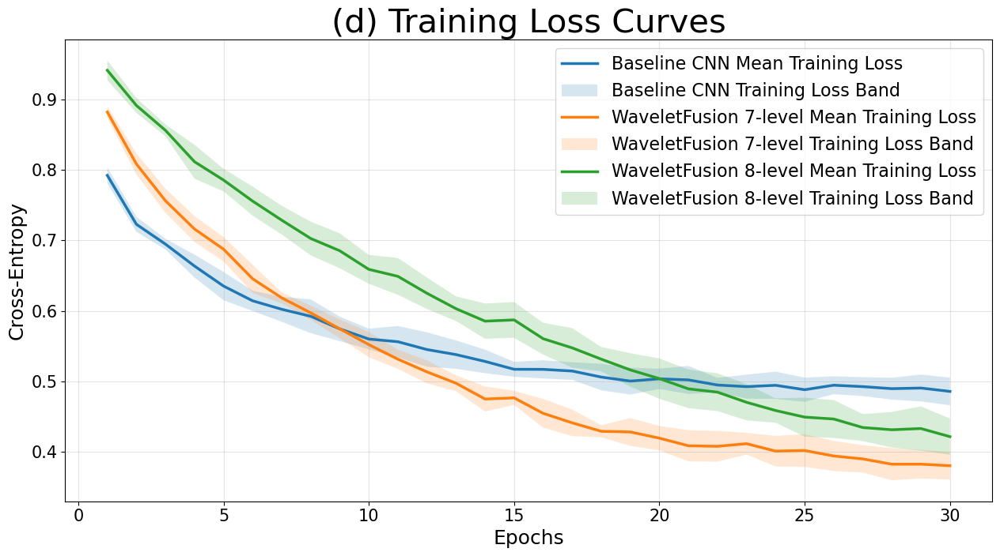

[Saved] ./Unified_Br35H_Curves/br35h_unified_training_loss_curves.png


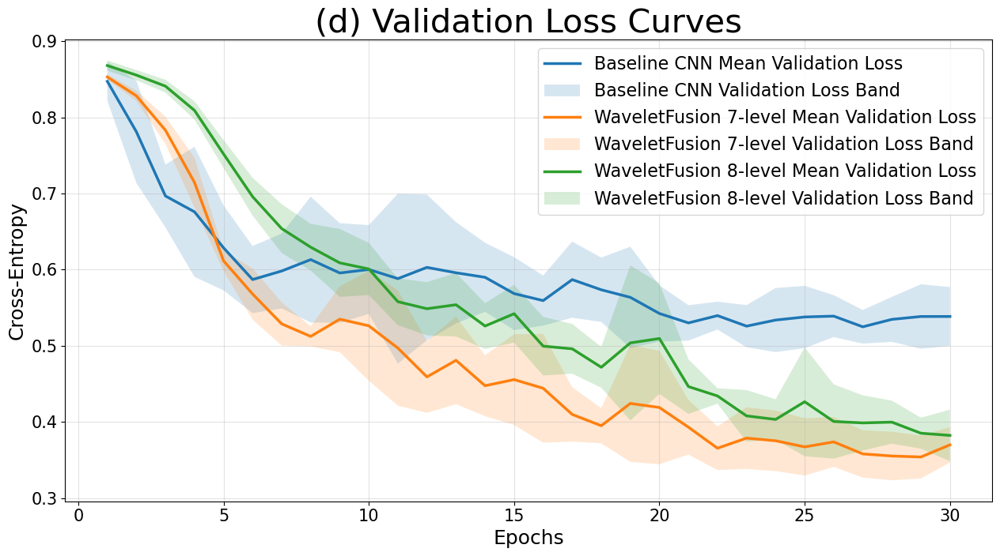

[Saved] ./Unified_Br35H_Curves/br35h_unified_validation_loss_curves.png


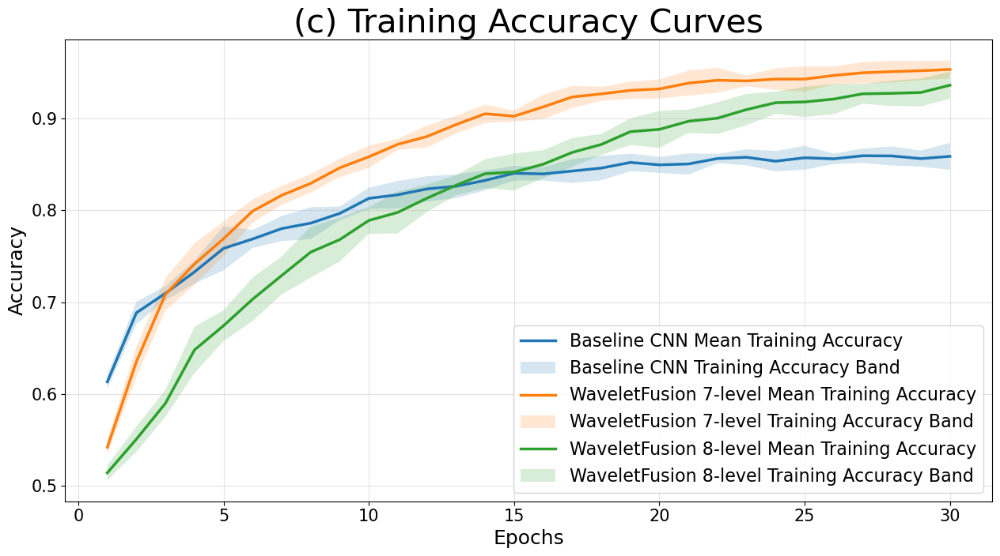

[Saved] ./Unified_Br35H_Curves/br35h_unified_training_accuracy_curves.png


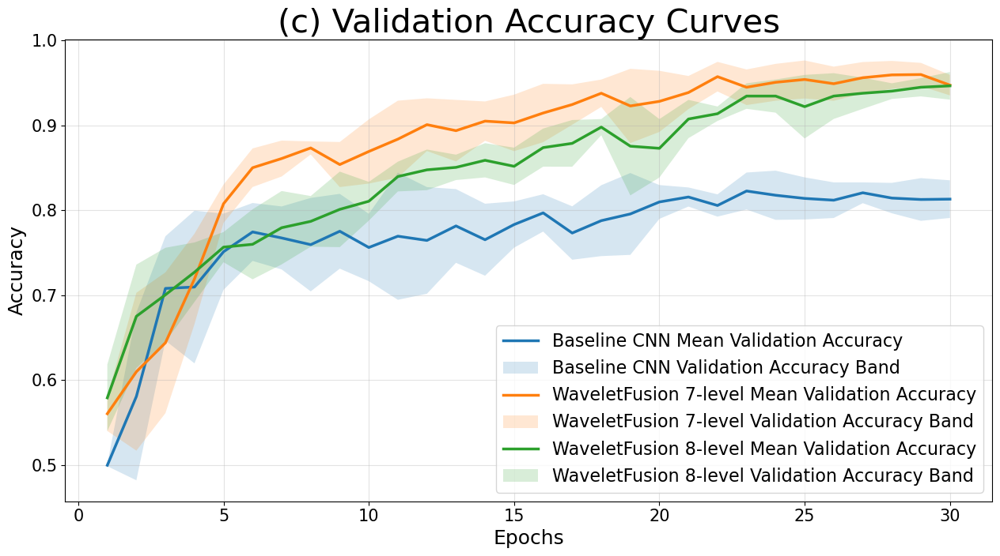

[Saved] ./Unified_Br35H_Curves/br35h_unified_validation_accuracy_curves.png

Done. All four unified Br35H plots were generated.
Saved plots are in: ./Unified_Br35H_Curves


In [7]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# -------------------- Config --------------------
BASELINE_DIR = "./Histories2026_br35h_baseline"
WAVELET7_DIR = "./Histories2026_br35h_wavelet7"
WAVELET8_DIR = "./ArticleHistories_br35h_wavelet8"

# Output folder
OUT_DIR = "./Unified_Br35H_Curves"
os.makedirs(OUT_DIR, exist_ok=True)

RUN_SEEDS = [42, 43, 44, 45, 46]
HEAD_MODE = "multilevel_details"

# File templates based on your actual Br35H filenames
BASELINE_TMPL = "baseline_br35h_history_seed{seed}.csv"
WAVELET7_TMPL = f"wavelet7_br35h_history_seed{{seed}}_{HEAD_MODE}.csv"
WAVELET8_TMPL = f"wavelet8_br35h_history_seed{{seed}}_{HEAD_MODE}.csv"


# -------------------- Helpers --------------------
def load_histories(file_template, run_seeds, hist_dir, model_name):
    histories = []
    max_len = 0

    for seed in run_seeds:
        path = os.path.join(hist_dir, file_template.format(seed=seed))

        if not os.path.exists(path):
            print(f"[WARN] Missing {model_name} file: {path}")
            continue

        df = pd.read_csv(path)

        # Remove epoch column if present
        if "epoch" in df.columns:
            df = df.drop(columns=["epoch"])

        histories.append(df)
        max_len = max(max_len, len(df))

        print(f"[Loaded] {model_name} seed {seed}: {path} | epochs = {len(df)}")

    if len(histories) == 0:
        raise FileNotFoundError(
            f"No history files found for {model_name} using template: {file_template}"
        )

    return histories, max_len


def pad_and_stack(histories, column, max_len):

    arrs = []

    for df in histories:
        if column not in df.columns:
            raise KeyError(
                f"Column '{column}' was not found in history file. "
                f"Available columns: {list(df.columns)}"
            )

        vals = df[column].to_numpy(dtype=np.float32)

        padded = np.full((max_len,), np.nan, dtype=np.float32)
        padded[:len(vals)] = vals

        arrs.append(padded)

    return np.vstack(arrs)


def mean_std_from_histories(histories, column, max_len):
    stacked = pad_and_stack(histories, column, max_len)

    mean = np.nanmean(stacked, axis=0)

    # ddof=1 is used for sample standard deviation across seeds
    std = np.nanstd(stacked, axis=0, ddof=1)

    return mean, std


def build_curve_stats(file_template, hist_dir, label_prefix):
    histories, max_len = load_histories(
        file_template=file_template,
        run_seeds=RUN_SEEDS,
        hist_dir=hist_dir,
        model_name=label_prefix
    )

    stats = {
        "loss": mean_std_from_histories(histories, "loss", max_len),
        "val_loss": mean_std_from_histories(histories, "val_loss", max_len),
        "accuracy": mean_std_from_histories(histories, "accuracy", max_len),
        "val_accuracy": mean_std_from_histories(histories, "val_accuracy", max_len),
        "epochs": np.arange(1, max_len + 1),
        "label": label_prefix,
        "num_runs": len(histories),
        "max_len": max_len
    }

    return stats


def plot_metric(ax, x, mean, std, label_line, label_band):
    ax.plot(
        x,
        mean,
        linewidth=2.5,
        label=label_line
    )

    ax.fill_between(
        x,
        mean - std,
        mean + std,
        alpha=0.18,
        label=label_band
    )


def format_plot(ax, title, ylabel):
    # Title font size increased here
    ax.set_title(title, fontsize=30)

    ax.set_xlabel("Epochs", fontsize=18)
    ax.set_ylabel(ylabel, fontsize=18)
    ax.tick_params(axis="both", labelsize=15)
    ax.grid(True, alpha=0.35)
    ax.legend(fontsize=16)
    plt.tight_layout()


def save_plot(filename):
    out_path = os.path.join(OUT_DIR, filename)
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.show()
    plt.close()
    print(f"[Saved] {out_path}")


# -------------------- Load all Br35H model histories --------------------
baseline_stats = build_curve_stats(
    file_template=BASELINE_TMPL,
    hist_dir=BASELINE_DIR,
    label_prefix="Baseline CNN"
)

wavelet7_stats = build_curve_stats(
    file_template=WAVELET7_TMPL,
    hist_dir=WAVELET7_DIR,
    label_prefix="WaveletFusion 7-level"
)

wavelet8_stats = build_curve_stats(
    file_template=WAVELET8_TMPL,
    hist_dir=WAVELET8_DIR,
    label_prefix="WaveletFusion 8-level"
)

print("\n================= Loaded Summary =================")
print(f"Baseline CNN: {baseline_stats['num_runs']} runs | max epochs = {baseline_stats['max_len']}")
print(f"WaveletFusion 7-level: {wavelet7_stats['num_runs']} runs | max epochs = {wavelet7_stats['max_len']}")
print(f"WaveletFusion 8-level: {wavelet8_stats['num_runs']} runs | max epochs = {wavelet8_stats['max_len']}")


# -------------------- Plot 1: Training Loss --------------------
plt.figure(figsize=(12.8, 7.2))
ax = plt.gca()

plot_metric(
    ax,
    baseline_stats["epochs"],
    baseline_stats["loss"][0],
    baseline_stats["loss"][1],
    "Baseline CNN Mean Training Loss",
    "Baseline CNN Training Loss Band"
)

plot_metric(
    ax,
    wavelet7_stats["epochs"],
    wavelet7_stats["loss"][0],
    wavelet7_stats["loss"][1],
    "WaveletFusion 7-level Mean Training Loss",
    "WaveletFusion 7-level Training Loss Band"
)

plot_metric(
    ax,
    wavelet8_stats["epochs"],
    wavelet8_stats["loss"][0],
    wavelet8_stats["loss"][1],
    "WaveletFusion 8-level Mean Training Loss",
    "WaveletFusion 8-level Training Loss Band"
)

format_plot(
    ax,
    title="(d) Training Loss Curves",
    ylabel="Cross-Entropy"
)

save_plot("br35h_unified_training_loss_curves.png")


# -------------------- Plot 2: Validation Loss --------------------
plt.figure(figsize=(12.8, 7.2))
ax = plt.gca()

plot_metric(
    ax,
    baseline_stats["epochs"],
    baseline_stats["val_loss"][0],
    baseline_stats["val_loss"][1],
    "Baseline CNN Mean Validation Loss",
    "Baseline CNN Validation Loss Band"
)

plot_metric(
    ax,
    wavelet7_stats["epochs"],
    wavelet7_stats["val_loss"][0],
    wavelet7_stats["val_loss"][1],
    "WaveletFusion 7-level Mean Validation Loss",
    "WaveletFusion 7-level Validation Loss Band"
)

plot_metric(
    ax,
    wavelet8_stats["epochs"],
    wavelet8_stats["val_loss"][0],
    wavelet8_stats["val_loss"][1],
    "WaveletFusion 8-level Mean Validation Loss",
    "WaveletFusion 8-level Validation Loss Band"
)

format_plot(
    ax,
    title="(d) Validation Loss Curves",
    ylabel="Cross-Entropy"
)

save_plot("br35h_unified_validation_loss_curves.png")


# -------------------- Plot 3: Training Accuracy --------------------
plt.figure(figsize=(12.8, 7.2))
ax = plt.gca()

plot_metric(
    ax,
    baseline_stats["epochs"],
    baseline_stats["accuracy"][0],
    baseline_stats["accuracy"][1],
    "Baseline CNN Mean Training Accuracy",
    "Baseline CNN Training Accuracy Band"
)

plot_metric(
    ax,
    wavelet7_stats["epochs"],
    wavelet7_stats["accuracy"][0],
    wavelet7_stats["accuracy"][1],
    "WaveletFusion 7-level Mean Training Accuracy",
    "WaveletFusion 7-level Training Accuracy Band"
)

plot_metric(
    ax,
    wavelet8_stats["epochs"],
    wavelet8_stats["accuracy"][0],
    wavelet8_stats["accuracy"][1],
    "WaveletFusion 8-level Mean Training Accuracy",
    "WaveletFusion 8-level Training Accuracy Band"
)

format_plot(
    ax,
    title="(c) Training Accuracy Curves",
    ylabel="Accuracy"
)

save_plot("br35h_unified_training_accuracy_curves.png")


# -------------------- Plot 4: Validation Accuracy --------------------
plt.figure(figsize=(12.8, 7.2))
ax = plt.gca()

plot_metric(
    ax,
    baseline_stats["epochs"],
    baseline_stats["val_accuracy"][0],
    baseline_stats["val_accuracy"][1],
    "Baseline CNN Mean Validation Accuracy",
    "Baseline CNN Validation Accuracy Band"
)

plot_metric(
    ax,
    wavelet7_stats["epochs"],
    wavelet7_stats["val_accuracy"][0],
    wavelet7_stats["val_accuracy"][1],
    "WaveletFusion 7-level Mean Validation Accuracy",
    "WaveletFusion 7-level Validation Accuracy Band"
)

plot_metric(
    ax,
    wavelet8_stats["epochs"],
    wavelet8_stats["val_accuracy"][0],
    wavelet8_stats["val_accuracy"][1],
    "WaveletFusion 8-level Mean Validation Accuracy",
    "WaveletFusion 8-level Validation Accuracy Band"
)

format_plot(
    ax,
    title="(c) Validation Accuracy Curves",
    ylabel="Accuracy"
)

save_plot("br35h_unified_validation_accuracy_curves.png")


print("\nDone. All four unified Br35H plots were generated.")
print(f"Saved plots are in: {OUT_DIR}")

# Ablation A1 - wavelet decomposition depth

In [9]:
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"
os.environ["TF_ENABLE_LAYOUT_OPTIMIZER"] = "0"

import time, gc
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd

from tensorflow.keras import layers, models, callbacks, regularizers
from tensorflow.keras import mixed_precision
from sklearn.metrics import classification_report, confusion_matrix, f1_score

mixed_precision.set_global_policy("float32")

# -------------------- Config --------------------
TRAIN_DIR = "./Training2026"
TEST_DIR  = "./Testing2026"

IMG_SIZE  = 256
BATCH     = 32
AUTOTUNE  = tf.data.AUTOTUNE
EPOCHS    = 30

RUN_SEEDS = [42, 43, 44, 45, 46]
HEAD_MODE = "multilevel_details"  
PROJ_DIM  = 16

# Ablation: try different decomposition depths
LEVEL_LIST = [1, 2, 3, 4, 5, 6, 7, 8]


RUN_SECOND_SERIES_DETAILS_ONLY = False

HIST_DIR = "./histories_ablation_2026"
FIG_DIR  = "./figures_ablation_2026"
os.makedirs(HIST_DIR, exist_ok=True)
os.makedirs(FIG_DIR, exist_ok=True)

# -------------------- tf.data helper --------------------
def cfg(ds, shuffle=False, seed=0):
    ds = ds.cache()
    if shuffle:
        ds = ds.shuffle(1000, seed=seed, reshuffle_each_iteration=True)
    return ds.prefetch(AUTOTUNE)

def count_images(ds):
    n = 0
    for xb, _ in ds:
        n += int(xb.shape[0])
    return n

def y_true_from_ds(ds):
    ys = []
    for _, y in ds:
        ys.append(y.numpy())
    return np.argmax(np.vstack(ys), axis=1)

# -------------------- Plot/Save helpers --------------------
def save_confusion_matrix_png(cm, class_names, title, out_path):
    plt.rcParams.update({"font.size": 12})
    fig, ax = plt.subplots(figsize=(7.2, 6.2))
    vmax = cm.max() if cm.max() > 0 else 1
    im = ax.imshow(cm, interpolation="nearest", cmap=plt.cm.Blues, vmin=0, vmax=vmax)
    cbar = plt.colorbar(im, ax=ax)
    cbar.ax.set_ylabel("Number of samples")

    ticks = np.arange(len(class_names))
    ax.set_xticks(ticks); ax.set_yticks(ticks)
    ax.set_xticklabels(class_names, rotation=45, ha="right")
    ax.set_yticklabels(class_names)
    ax.set_ylabel("True label"); ax.set_xlabel("Predicted label"); ax.set_title(title)

    thresh = vmax / 2.0
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, str(cm[i, j]), ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)

def specificity_from_cm(cm: np.ndarray):
    spec = []
    total = cm.sum()
    for i in range(cm.shape[0]):
        TP = cm[i, i]
        FN = cm[i, :].sum() - TP
        FP = cm[:, i].sum() - TP
        TN = total - TP - FN - FP
        spec_i = TN / (TN + FP + 1e-12)
        spec.append(float(spec_i))
    return spec

def per_class_table(report_dict, cm, class_names):
    spec = specificity_from_cm(cm)
    rows = []
    for idx, cls in enumerate(class_names):
        d = report_dict.get(cls, {})
        rows.append({
            "class": cls,
            "precision": float(d.get("precision", np.nan)),
            "recall(sensitivity)": float(d.get("recall", np.nan)),
            "specificity": spec[idx],
            "f1_score": float(d.get("f1-score", np.nan)),
            "support": int(d.get("support", 0)),
        })
    return pd.DataFrame(rows)

# -------------------- Model blocks --------------------
L2_STRENGTH = 2e-4

def conv_block(x, filters, sd_rate=0.0, name_prefix="blk"):
    x = layers.Conv2D(filters, 3, padding="same", use_bias=False,
                      kernel_regularizer=regularizers.l2(L2_STRENGTH),
                      name=f"{name_prefix}_conv1")(x)
    x = layers.BatchNormalization(name=f"{name_prefix}_bn1")(x)
    x = layers.ReLU(name=f"{name_prefix}_relu1")(x)

    x = layers.Conv2D(filters, 3, padding="same", use_bias=False,
                      kernel_regularizer=regularizers.l2(L2_STRENGTH),
                      name=f"{name_prefix}_conv2")(x)
    x = layers.BatchNormalization(name=f"{name_prefix}_bn2")(x)
    x = layers.ReLU(name=f"{name_prefix}_relu2")(x)

    if sd_rate > 0:
        x = layers.SpatialDropout2D(sd_rate, name=f"{name_prefix}_spdrop")(x)
    return x

# -------------------- Haar wavelet layer --------------------
class HaarWavelet2D(layers.Layer):
    def build(self, input_shape):
        if int(input_shape[-1]) != 1:
            raise ValueError(f"HaarWavelet2D expects single-channel input, got {input_shape[-1]}.")

        ll = np.array([[0.5,  0.5],
                       [0.5,  0.5]], dtype="float32")
        lh = np.array([[ 0.5,  0.5],
                       [-0.5, -0.5]], dtype="float32")
        hl = np.array([[ 0.5, -0.5],
                       [ 0.5, -0.5]], dtype="float32")
        hh = np.array([[ 0.5, -0.5],
                       [-0.5,  0.5]], dtype="float32")

        k = np.stack([ll, lh, hl, hh], axis=-1).reshape((2, 2, 1, 4))
        self.kernel = tf.constant(k, dtype=tf.float32)
        super().build(input_shape)

    def call(self, inputs):
        x = tf.cast(inputs, tf.float32)
        y = tf.nn.conv2d(x, self.kernel, strides=[1, 2, 2, 1], padding="SAME")
        ll, lh, hl, hh = tf.split(y, 4, axis=-1)
        return ll, lh, hl, hh

def per_image_standardize_batch(x):
    out_dtype = x.dtype
    x32 = tf.cast(x, tf.float32)
    y32 = tf.map_fn(tf.image.per_image_standardization, x32, fn_output_signature=tf.float32)
    return tf.cast(y32, out_dtype)

def build_wavelet_model(num_classes: int, run_seed: int, n_levels: int, head_mode: str,
                        use_approx_in_fusion: bool = True):

    if IMG_SIZE % (2 ** n_levels) != 0:
        raise ValueError(f"IMG_SIZE={IMG_SIZE} must be divisible by 2^{n_levels}.")

    augment = tf.keras.Sequential([
        layers.RandomFlip("horizontal", seed=run_seed),
        layers.RandomRotation(0.05, seed=run_seed + 1),
        layers.RandomZoom(0.1, seed=run_seed + 2),
        layers.RandomContrast(0.1, seed=run_seed + 3),
        layers.RandomTranslation(0.03, 0.03, seed=run_seed + 4),
    ], name="augment")

    rescale = layers.Rescaling(1./255, name="rescale")
    standardize = layers.Lambda(per_image_standardize_batch, name="per_image_standardization")

    DETAIL_F_8 = [12, 8, 8, 6, 6, 4, 4, 4]
    APPROX_F_8 = [4, 4, 4, 4, 4, 4, 4, 4]
    BB_F_8     = [28, 44, 44, 44, 44, 44, 44, 44]

    SD_D_8 = [0.10, 0.08, 0.08, 0.06, 0.06, 0.05, 0.05, 0.05]
    SD_B_8 = [0.10, 0.12, 0.12, 0.10, 0.10, 0.08, 0.08, 0.08]

    DETAIL_F = DETAIL_F_8[:n_levels]
    APPROX_F = APPROX_F_8[:n_levels]
    BB_F     = BB_F_8[:n_levels]
    SD_D     = SD_D_8[:n_levels]
    SD_B     = SD_B_8[:n_levels]

    inputs = layers.Input((IMG_SIZE, IMG_SIZE, 1), name="input_image")
    x = augment(inputs)
    x = rescale(x)
    x = standardize(x)
    x = layers.GaussianNoise(0.02, name="gaussian_noise")(x)

    ll_in = x
    prev_pooled = None
    detail_level_vecs = []

    for level in range(1, n_levels + 1):
        LL, LH, HL, HH = HaarWavelet2D(name=f"haar_L{level}")(ll_in)

        # details -> CNN
        D = layers.Concatenate(name=f"details_L{level}")([LH, HL, HH])
        W = conv_block(D, DETAIL_F[level-1], sd_rate=SD_D[level-1], name_prefix=f"L{level}_Detail")

        # optional approx branch
        if use_approx_in_fusion:
            A = conv_block(LL, APPROX_F[level-1], sd_rate=0.0, name_prefix=f"L{level}_Approx")

        # fusion into backbone
        if prev_pooled is None:
            if use_approx_in_fusion:
                S = layers.Concatenate(name=f"fusion_L{level}")([W, A])
            else:
                S = W
        else:
            if use_approx_in_fusion:
                S = layers.Concatenate(name=f"fusion_L{level}")([prev_pooled, W, A])
            else:
                S = layers.Concatenate(name=f"fusion_L{level}")([prev_pooled, W])

        B = conv_block(S, BB_F[level-1], sd_rate=SD_B[level-1], name_prefix=f"backbone_block{level}")

        # multilevel detail vectors for the head
        w_gap  = layers.GlobalAveragePooling2D(name=f"gap_detail_L{level}")(W)
        w_proj = layers.Dense(PROJ_DIM, activation="relu", use_bias=False,
                              name=f"proj_detail_L{level}")(w_gap)
        detail_level_vecs.append(w_proj)

        if level < n_levels:
            prev_pooled = layers.MaxPooling2D(name=f"backbone_pool{level}")(B)
            ll_in = LL
        else:
            B_final = B

    deep_vec = layers.GlobalAveragePooling2D(name="gap_deepest_backbone")(B_final)

    if head_mode == "deepest_only":
        feat = deep_vec
    elif head_mode == "multilevel_details":
        feat = layers.Concatenate(name="multilevel_details_concat")([deep_vec] + detail_level_vecs)
    else:
        raise ValueError("head_mode must be 'deepest_only' or 'multilevel_details'")

    feat = layers.Dropout(0.5, name="head_dropout1")(feat)
    feat = layers.Dense(128, activation="relu",
                        kernel_regularizer=regularizers.l2(L2_STRENGTH),
                        name="head_dense_128")(feat)
    feat = layers.Dropout(0.35, name="head_dropout2")(feat)

    outputs = layers.Dense(num_classes, activation="softmax", name="predictions")(feat)
    tag = "withApprox" if use_approx_in_fusion else "detailsOnly"
    return models.Model(inputs, outputs, name=f"WaveletFusion_L{n_levels}_{tag}_{head_mode}")

# -------------------- Run one ablation series --------------------
def run_ablation_series(series_name: str, use_approx_in_fusion: bool):
    all_rows = []

    # keep a stable class order record
    class_names_ref = None
    npy_classnames = os.path.join(HIST_DIR, "class_names.npy")

    for n_levels in LEVEL_LIST:
        print(f"\n================= ABLATION: {series_name} | N_LEVELS={n_levels} =================")
        level_rows = []

        for run_seed in RUN_SEEDS:
            split_seed = run_seed
            print(f"\n--- RUN_SEED={run_seed} | SPLIT_SEED={split_seed} | N_LEVELS={n_levels} ---")

            tf.keras.backend.clear_session()
            gc.collect()
            tf.keras.utils.set_random_seed(run_seed)

            train_ds_raw = tf.keras.preprocessing.image_dataset_from_directory(
                TRAIN_DIR, labels="inferred", label_mode="categorical",
                color_mode="grayscale", image_size=(IMG_SIZE, IMG_SIZE),
                batch_size=BATCH,
                validation_split=0.2, subset="training", seed=split_seed,
                interpolation="bilinear", crop_to_aspect_ratio=True)

            val_ds_raw = tf.keras.preprocessing.image_dataset_from_directory(
                TRAIN_DIR, labels="inferred", label_mode="categorical",
                color_mode="grayscale", image_size=(IMG_SIZE, IMG_SIZE),
                batch_size=BATCH,
                validation_split=0.2, subset="validation", seed=split_seed,
                interpolation="bilinear", crop_to_aspect_ratio=True)

            test_ds_raw = tf.keras.preprocessing.image_dataset_from_directory(
                TEST_DIR, labels="inferred", label_mode="categorical",
                color_mode="grayscale", image_size=(IMG_SIZE, IMG_SIZE),
                batch_size=BATCH, shuffle=False,
                interpolation="bilinear", crop_to_aspect_ratio=True)

            class_names = train_ds_raw.class_names
            num_classes = len(class_names)

            if class_names_ref is None:
                class_names_ref = class_names
                np.save(npy_classnames, np.array(class_names, dtype=object))
                print(f"[Saved] Class names -> {npy_classnames}")
            else:
                if class_names != class_names_ref:
                    print("[WARN] class_names order changed across runs. Check your folder ordering.")

            train_ds      = cfg(train_ds_raw, shuffle=True,  seed=run_seed)
            train_eval_ds = cfg(train_ds_raw, shuffle=False, seed=run_seed)
            val_ds        = cfg(val_ds_raw,   shuffle=False, seed=run_seed)
            test_ds       = cfg(test_ds_raw,  shuffle=False, seed=run_seed)

            model = build_wavelet_model(num_classes, run_seed, n_levels, HEAD_MODE,
                                        use_approx_in_fusion=use_approx_in_fusion)
            params = int(model.count_params())

            loss_fn = tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.05)
            model.compile(optimizer=tf.keras.optimizers.Adam(3e-4),
                          loss=loss_fn, metrics=["accuracy"])

            class EpochTimer(callbacks.Callback):
                def on_train_begin(self, logs=None): self.epoch_times = []
                def on_epoch_begin(self, epoch, logs=None): self._t0 = time.time()
                def on_epoch_end(self, epoch, logs=None): self.epoch_times.append(time.time() - self._t0)

            epoch_timer = EpochTimer()
            cbs = [
                callbacks.EarlyStopping(patience=6, restore_best_weights=True, monitor="val_loss"),
                callbacks.ReduceLROnPlateau(patience=3, factor=0.5, monitor="val_loss"),
                epoch_timer,
            ]

            t0 = time.time()
            hist = model.fit(train_ds, validation_data=val_ds, epochs=EPOCHS, callbacks=cbs, verbose=1)
            total_train_time = time.time() - t0

            # Save history for this run
            hist_path = os.path.join(HIST_DIR, f"{series_name}_L{n_levels}_history_seed{run_seed}.csv")
            pd.DataFrame(hist.history).to_csv(hist_path, index_label="epoch")
            print(f"[Saved] history -> {hist_path}")

            # Train FPS
            num_train_images = count_images(train_eval_ds)
            avg_epoch_time = float(np.mean(epoch_timer.epoch_times)) if epoch_timer.epoch_times else float("nan")
            train_fps = num_train_images / avg_epoch_time if avg_epoch_time > 0 else float("nan")

            # ---- VALIDATION ----
            val_probs = model.predict(val_ds, verbose=0)
            y_pred_val = np.argmax(val_probs, axis=1)
            y_true_val = y_true_from_ds(val_ds)
            val_loss, val_acc = model.evaluate(val_ds, verbose=0)
            val_macro_f1 = float(f1_score(y_true_val, y_pred_val, average="macro"))

            cm_val = confusion_matrix(y_true_val, y_pred_val)
            cm_val_npy = os.path.join(HIST_DIR, f"{series_name}_L{n_levels}_cm_val_seed{run_seed}.npy")
            cm_val_png = os.path.join(FIG_DIR,  f"{series_name}_L{n_levels}_cm_val_seed{run_seed}.png")
            np.save(cm_val_npy, cm_val)
            save_confusion_matrix_png(cm_val, class_names,
                                      title=f"{series_name} (L={n_levels}) – Confusion Matrix (VAL) [seed={run_seed}]",
                                      out_path=cm_val_png)

            rep_val_dict = classification_report(
                y_true_val, y_pred_val, target_names=class_names, digits=4, output_dict=True
            )
            df_val_pc = per_class_table(rep_val_dict, cm_val, class_names)
            val_pc_csv = os.path.join(HIST_DIR, f"{series_name}_L{n_levels}_perclass_val_seed{run_seed}.csv")
            val_pc_txt = os.path.join(HIST_DIR, f"{series_name}_L{n_levels}_perclass_val_seed{run_seed}.txt")
            df_val_pc.to_csv(val_pc_csv, index=False)
            with open(val_pc_txt, "w", encoding="utf-8") as f:
                f.write(df_val_pc.to_string(index=False))

            # ---- TEST ----
            test_probs = model.predict(test_ds, verbose=0)
            y_pred_test = np.argmax(test_probs, axis=1)
            y_true_test = y_true_from_ds(test_ds)
            test_loss, test_acc = model.evaluate(test_ds, verbose=0)
            test_macro_f1 = float(f1_score(y_true_test, y_pred_test, average="macro"))

            cm_test = confusion_matrix(y_true_test, y_pred_test)
            cm_test_npy = os.path.join(HIST_DIR, f"{series_name}_L{n_levels}_cm_test_seed{run_seed}.npy")
            cm_test_png = os.path.join(FIG_DIR,  f"{series_name}_L{n_levels}_cm_test_seed{run_seed}.png")
            np.save(cm_test_npy, cm_test)
            save_confusion_matrix_png(cm_test, class_names,
                                      title=f"{series_name} (L={n_levels}) – Confusion Matrix (TEST) [seed={run_seed}]",
                                      out_path=cm_test_png)

            rep_test_dict = classification_report(
                y_true_test, y_pred_test, target_names=class_names, digits=4, output_dict=True
            )
            df_test_pc = per_class_table(rep_test_dict, cm_test, class_names)
            test_pc_csv = os.path.join(HIST_DIR, f"{series_name}_L{n_levels}_perclass_test_seed{run_seed}.csv")
            test_pc_txt = os.path.join(HIST_DIR, f"{series_name}_L{n_levels}_perclass_test_seed{run_seed}.txt")
            df_test_pc.to_csv(test_pc_csv, index=False)
            with open(test_pc_txt, "w", encoding="utf-8") as f:
                f.write(df_test_pc.to_string(index=False))

            # Store row
            row = {
                "Series": series_name,
                "N_LEVELS": n_levels,
                "RUN_SEED": run_seed,
                "SPLIT_SEED": split_seed,
                "Val Loss": float(val_loss),
                "Val Acc": float(val_acc),
                "Val Macro-F1": float(val_macro_f1),
                "Test Loss": float(test_loss),
                "Test Acc": float(test_acc),
                "Test Macro-F1": float(test_macro_f1),
                "Train Time (s)": float(total_train_time),
                "Avg Epoch Time (s)": float(avg_epoch_time),
                "Train FPS (img/s)": float(train_fps),
                "Parameters": int(params),
                "HEAD_MODE": HEAD_MODE,
                "use_approx_in_fusion": bool(use_approx_in_fusion),
            }
            level_rows.append(row)
            all_rows.append(row)

            # cleanup
            del model, train_ds_raw, val_ds_raw, test_ds_raw, train_ds, val_ds, test_ds, train_eval_ds
            gc.collect()

        # per-level per-seed CSV
        df_level = pd.DataFrame(level_rows).sort_values("RUN_SEED").reset_index(drop=True)
        out_level_csv = os.path.join(HIST_DIR, f"{series_name}_L{n_levels}_summary_seeds.csv")
        df_level.to_csv(out_level_csv, index=False)
        print(f"[Saved] per-level summary -> {out_level_csv}")

    # full long-form CSV (all levels x all seeds)
    df_all = pd.DataFrame(all_rows)
    out_all_csv = os.path.join(HIST_DIR, f"{series_name}_ALL_levels_ALL_seeds_long.csv")
    df_all.to_csv(out_all_csv, index=False)
    print(f"[Saved] long table -> {out_all_csv}")

    # master mean±std across seeds per level
    agg_rows = []
    for n_levels in LEVEL_LIST:
        sub = df_all[df_all["N_LEVELS"] == n_levels]
        def mstd(x):
            x = np.asarray(x, dtype=np.float32)
            m = float(np.mean(x))
            s = float(np.std(x, ddof=1)) if len(x) > 1 else 0.0
            return m, s

        vL_m, vL_s = mstd(sub["Val Loss"])
        vA_m, vA_s = mstd(sub["Val Acc"])
        vF_m, vF_s = mstd(sub["Val Macro-F1"])
        tL_m, tL_s = mstd(sub["Test Loss"])
        tA_m, tA_s = mstd(sub["Test Acc"])
        tF_m, tF_s = mstd(sub["Test Macro-F1"])

        agg_rows.append({
            "Series": series_name,
            "N_LEVELS": n_levels,
            "Val Loss (mean)": vL_m, "Val Loss (std)": vL_s,
            "Val Acc (mean)":  vA_m, "Val Acc (std)":  vA_s,
            "Val Macro-F1 (mean)": vF_m, "Val Macro-F1 (std)": vF_s,
            "Test Loss (mean)": tL_m, "Test Loss (std)": tL_s,
            "Test Acc (mean)":  tA_m, "Test Acc (std)":  tA_s,
            "Test Macro-F1 (mean)": tF_m, "Test Macro-F1 (std)": tF_s,
            "use_approx_in_fusion": bool(use_approx_in_fusion),
        })

    df_agg = pd.DataFrame(agg_rows).sort_values("N_LEVELS").reset_index(drop=True)
    out_agg_csv = os.path.join(HIST_DIR, f"{series_name}_MASTER_mean_std_by_level.csv")
    df_agg.to_csv(out_agg_csv, index=False)
    print(f"[Saved] master mean±std -> {out_agg_csv}")

    return df_agg

# -------------------- Run ablations --------------------
df_main = run_ablation_series(series_name="WF_depth_withApprox", use_approx_in_fusion=True)

if RUN_SECOND_SERIES_DETAILS_ONLY:
    df_alt = run_ablation_series(series_name="WF_depth_detailsOnly", use_approx_in_fusion=False)
    df_both = pd.concat([df_main, df_alt], axis=0).reset_index(drop=True)
    df_both.to_csv(os.path.join(HIST_DIR, "WF_ABLATION_MASTER_all_series.csv"), index=False)
    print("[Saved] combined master ->", os.path.join(HIST_DIR, "WF_ABLATION_MASTER_all_series.csv"))


================= ABLATION: WF_depth_withApprox | N_LEVELS=1 =================

--- RUN_SEED=42 | SPLIT_SEED=42 | N_LEVELS=1 ---
Found 5600 files belonging to 4 classes.
Using 4480 files for training.
Found 5600 files belonging to 4 classes.
Using 1120 files for validation.
Found 1600 files belonging to 4 classes.
[Saved] Class names -> ./histories_ablation_2026/class_names.npy
Epoch 1/30


2026-04-29 15:47:20.130006: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L1_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - accuracy: 0.2847 - loss: 1.4130 - val_accuracy: 0.2589 - val_loss: 1.3813 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - accuracy: 0.3683 - loss: 1.3305 - val_accuracy: 0.2786 - val_loss: 1.3931 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - accuracy: 0.4025 - loss: 1.2661 - val_accuracy: 0.5009 - val_loss: 1.2004 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - accuracy: 0.4290 - loss: 1.2482 - val_accuracy: 0.4661 - val_loss: 1.1385 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - accuracy: 0.4742 - loss: 1.2074 - val_accuracy: 0.4616 - val_loss: 1.1321 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - accuracy: 0.4672 - loss: 1.1962 - val_accuracy: 0.5268 - val_loss: 1.1051 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - accuracy: 0.50

2026-04-29 15:48:43.593988: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L1_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - accuracy: 0.2810 - loss: 1.4245 - val_accuracy: 0.2518 - val_loss: 1.4019 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - accuracy: 0.3468 - loss: 1.3433 - val_accuracy: 0.2812 - val_loss: 1.3596 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - accuracy: 0.4156 - loss: 1.2759 - val_accuracy: 0.4455 - val_loss: 1.2579 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - accuracy: 0.4209 - loss: 1.2599 - val_accuracy: 0.4393 - val_loss: 1.1597 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - accuracy: 0.4222 - loss: 1.2597 - val_accuracy: 0.4357 - val_loss: 1.1519 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - accuracy: 0.4542 - loss: 1.2134 - val_accuracy: 0.4509 - val_loss: 1.1357 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - accuracy: 0.45

2026-04-29 15:51:16.328643: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L1_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - accuracy: 0.2942 - loss: 1.4041 - val_accuracy: 0.2366 - val_loss: 1.4213 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - accuracy: 0.3833 - loss: 1.3140 - val_accuracy: 0.2527 - val_loss: 1.4519 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - accuracy: 0.4206 - loss: 1.2511 - val_accuracy: 0.4884 - val_loss: 1.2204 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - accuracy: 0.4301 - loss: 1.2470 - val_accuracy: 0.5259 - val_loss: 1.1357 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - accuracy: 0.4638 - loss: 1.2112 - val_accuracy: 0.4482 - val_loss: 1.1710 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - accuracy: 0.4776 - loss: 1.2003 - val_accuracy: 0.5071 - val_loss: 1.1209 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - accuracy: 0.51

2026-04-29 15:53:21.168368: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L1_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - accuracy: 0.2796 - loss: 1.4175 - val_accuracy: 0.2580 - val_loss: 1.4173 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - accuracy: 0.3955 - loss: 1.3044 - val_accuracy: 0.2795 - val_loss: 1.4183 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - accuracy: 0.4041 - loss: 1.2538 - val_accuracy: 0.5384 - val_loss: 1.1855 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - accuracy: 0.4325 - loss: 1.2267 - val_accuracy: 0.5000 - val_loss: 1.1379 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - accuracy: 0.4610 - loss: 1.2086 - val_accuracy: 0.4929 - val_loss: 1.1538 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - accuracy: 0.4809 - loss: 1.1783 - val_accuracy: 0.5125 - val_loss: 1.1554 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - accuracy: 0.51

2026-04-29 15:54:42.815025: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L1_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - accuracy: 0.2957 - loss: 1.4195 - val_accuracy: 0.2348 - val_loss: 1.3992 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - accuracy: 0.3584 - loss: 1.3305 - val_accuracy: 0.3438 - val_loss: 1.2780 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - accuracy: 0.3858 - loss: 1.2810 - val_accuracy: 0.4313 - val_loss: 1.1930 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - accuracy: 0.3984 - loss: 1.2655 - val_accuracy: 0.3920 - val_loss: 1.2169 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - accuracy: 0.4260 - loss: 1.2403 - val_accuracy: 0.3348 - val_loss: 1.3382 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - accuracy: 0.4488 - loss: 1.2113 - val_accuracy: 0.4688 - val_loss: 1.1453 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - accuracy: 0.46

2026-04-29 15:56:19.984364: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L2_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step - accuracy: 0.3138 - loss: 1.4222 - val_accuracy: 0.2643 - val_loss: 1.4285 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - accuracy: 0.3977 - loss: 1.2874 - val_accuracy: 0.4232 - val_loss: 1.3933 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - accuracy: 0.4766 - loss: 1.2179 - val_accuracy: 0.6313 - val_loss: 1.0912 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - accuracy: 0.5276 - loss: 1.1624 - val_accuracy: 0.6464 - val_loss: 0.9663 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - accuracy: 0.5623 - loss: 1.0998 - val_accuracy: 0.5857 - val_loss: 1.0453 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - accuracy: 0.5574 - loss: 1.0839 - val_accuracy: 0.6384 - val_loss: 0.9235 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - accuracy: 0.6

2026-04-29 15:59:02.135042: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L2_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step - accuracy: 0.3065 - loss: 1.4280 - val_accuracy: 0.2402 - val_loss: 1.4576 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - accuracy: 0.4128 - loss: 1.2896 - val_accuracy: 0.3232 - val_loss: 1.4587 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - accuracy: 0.4548 - loss: 1.2400 - val_accuracy: 0.5446 - val_loss: 1.1304 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - accuracy: 0.5002 - loss: 1.1944 - val_accuracy: 0.6304 - val_loss: 1.0063 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - accuracy: 0.5399 - loss: 1.1394 - val_accuracy: 0.6214 - val_loss: 0.9650 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - accuracy: 0.5588 - loss: 1.0977 - val_accuracy: 0.6098 - val_loss: 0.9805 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - accuracy: 0.5

2026-04-29 16:00:30.829026: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L2_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step - accuracy: 0.2935 - loss: 1.4362 - val_accuracy: 0.2420 - val_loss: 1.4857 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - accuracy: 0.4260 - loss: 1.2734 - val_accuracy: 0.3446 - val_loss: 1.3244 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - accuracy: 0.4864 - loss: 1.2070 - val_accuracy: 0.6241 - val_loss: 1.1032 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - accuracy: 0.5059 - loss: 1.1750 - val_accuracy: 0.6482 - val_loss: 1.0231 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - accuracy: 0.5420 - loss: 1.1176 - val_accuracy: 0.6625 - val_loss: 0.9739 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - accuracy: 0.5585 - loss: 1.0932 - val_accuracy: 0.6420 - val_loss: 0.9957 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - accuracy: 0.5

2026-04-29 16:02:18.993274: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L2_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - accuracy: 0.3010 - loss: 1.4385 - val_accuracy: 0.2348 - val_loss: 1.5169 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - accuracy: 0.4335 - loss: 1.2819 - val_accuracy: 0.3134 - val_loss: 1.4314 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - accuracy: 0.4663 - loss: 1.2235 - val_accuracy: 0.6116 - val_loss: 1.0983 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - accuracy: 0.5136 - loss: 1.1683 - val_accuracy: 0.6545 - val_loss: 0.9855 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - accuracy: 0.5384 - loss: 1.1348 - val_accuracy: 0.6714 - val_loss: 0.9442 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - accuracy: 0.5596 - loss: 1.0836 - val_accuracy: 0.6687 - val_loss: 0.9122 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - accuracy: 0.5

2026-04-29 16:04:38.229798: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L2_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 42ms/step - accuracy: 0.3102 - loss: 1.4387 - val_accuracy: 0.2759 - val_loss: 1.3914 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - accuracy: 0.4029 - loss: 1.2964 - val_accuracy: 0.4812 - val_loss: 1.2406 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - accuracy: 0.4657 - loss: 1.2269 - val_accuracy: 0.5679 - val_loss: 1.0872 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - accuracy: 0.5097 - loss: 1.1902 - val_accuracy: 0.6366 - val_loss: 0.9985 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - accuracy: 0.5115 - loss: 1.1373 - val_accuracy: 0.6652 - val_loss: 0.9458 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - accuracy: 0.5373 - loss: 1.1012 - val_accuracy: 0.6786 - val_loss: 0.9046 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - accuracy: 0.5

2026-04-29 16:07:35.763131: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L3_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step - accuracy: 0.2973 - loss: 1.4827 - val_accuracy: 0.2625 - val_loss: 1.4995 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - accuracy: 0.4391 - loss: 1.3040 - val_accuracy: 0.4054 - val_loss: 1.4942 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - accuracy: 0.5191 - loss: 1.1879 - val_accuracy: 0.6527 - val_loss: 0.9899 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - accuracy: 0.5559 - loss: 1.1200 - val_accuracy: 0.6723 - val_loss: 0.8946 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 41ms/step - accuracy: 0.6008 - loss: 1.0353 - val_accuracy: 0.7089 - val_loss: 0.8485 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - accuracy: 0.5984 - loss: 1.0229 - val_accuracy: 0.6955 - val_loss: 0.8368 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 41ms/step - accuracy: 0.6

2026-04-29 16:09:43.867434: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L3_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 15s 47ms/step - accuracy: 0.3157 - loss: 1.4360 - val_accuracy: 0.2250 - val_loss: 1.7234 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - accuracy: 0.4460 - loss: 1.2778 - val_accuracy: 0.2875 - val_loss: 1.8778 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 41ms/step - accuracy: 0.5162 - loss: 1.1724 - val_accuracy: 0.4563 - val_loss: 1.2712 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - accuracy: 0.5564 - loss: 1.1062 - val_accuracy: 0.6777 - val_loss: 0.9368 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - accuracy: 0.5908 - loss: 1.0711 - val_accuracy: 0.6786 - val_loss: 0.8948 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step - accuracy: 0.5886 - loss: 1.0429 - val_accuracy: 0.6848 - val_loss: 0.8498 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 41ms/step - accuracy: 0.6

2026-04-29 16:12:28.923099: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L3_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 15s 46ms/step - accuracy: 0.3225 - loss: 1.4437 - val_accuracy: 0.2366 - val_loss: 1.6728 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - accuracy: 0.4528 - loss: 1.2754 - val_accuracy: 0.2839 - val_loss: 1.7391 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - accuracy: 0.5284 - loss: 1.1834 - val_accuracy: 0.4938 - val_loss: 1.1906 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - accuracy: 0.5645 - loss: 1.1135 - val_accuracy: 0.6054 - val_loss: 1.0027 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - accuracy: 0.5906 - loss: 1.0762 - val_accuracy: 0.6839 - val_loss: 0.8871 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - accuracy: 0.6083 - loss: 1.0322 - val_accuracy: 0.6705 - val_loss: 0.8848 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - accuracy: 0.6

2026-04-29 16:14:30.396714: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L3_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 15s 45ms/step - accuracy: 0.3144 - loss: 1.4627 - val_accuracy: 0.2339 - val_loss: 1.5710 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - accuracy: 0.4387 - loss: 1.2734 - val_accuracy: 0.3366 - val_loss: 1.4908 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - accuracy: 0.5130 - loss: 1.1835 - val_accuracy: 0.5554 - val_loss: 1.1213 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - accuracy: 0.5673 - loss: 1.0921 - val_accuracy: 0.6348 - val_loss: 0.9855 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - accuracy: 0.5765 - loss: 1.0881 - val_accuracy: 0.7063 - val_loss: 0.9142 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step - accuracy: 0.6005 - loss: 1.0347 - val_accuracy: 0.6812 - val_loss: 0.9141 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - accuracy: 0.6

2026-04-29 16:17:26.016250: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L3_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 15s 43ms/step - accuracy: 0.3002 - loss: 1.4802 - val_accuracy: 0.3027 - val_loss: 1.4512 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - accuracy: 0.4195 - loss: 1.3050 - val_accuracy: 0.3464 - val_loss: 1.4027 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - accuracy: 0.4956 - loss: 1.2160 - val_accuracy: 0.5089 - val_loss: 1.1741 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - accuracy: 0.5436 - loss: 1.1610 - val_accuracy: 0.7054 - val_loss: 0.9203 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - accuracy: 0.5854 - loss: 1.0694 - val_accuracy: 0.7661 - val_loss: 0.8251 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - accuracy: 0.6082 - loss: 1.0407 - val_accuracy: 0.7625 - val_loss: 0.8049 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - accuracy: 0.6

2026-04-29 16:19:24.518927: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L4_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
W0000 00:00:1777479566.200609     506 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777479566.201189     506 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777479566.201397     506 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777479566.201593     506 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777479566.201791     506 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777479566.201999     506 gpu_timer.cc:

  3/140 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - accuracy: 0.1632 - loss: 1.6465  

W0000 00:00:1777479566.404374     513 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777479566.404628     513 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777479566.404828     513 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777479566.405025     513 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777479566.405221     513 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777479566.405419     513 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777479566.405621     513 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777479566.405816     513 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777479566.406035     513 gp

140/140 ━━━━━━━━━━━━━━━━━━━━ 18s 50ms/step - accuracy: 0.3018 - loss: 1.4908 - val_accuracy: 0.2455 - val_loss: 1.7828 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 43ms/step - accuracy: 0.5046 - loss: 1.2328 - val_accuracy: 0.3991 - val_loss: 1.6223 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.5625 - loss: 1.1357 - val_accuracy: 0.5929 - val_loss: 1.1947 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 43ms/step - accuracy: 0.6108 - loss: 1.0598 - val_accuracy: 0.6705 - val_loss: 0.9122 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 43ms/step - accuracy: 0.6309 - loss: 1.0090 - val_accuracy: 0.7116 - val_loss: 0.8477 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 43ms/step - accuracy: 0.6473 - loss: 0.9835 - val_accuracy: 0.7188 - val_loss: 0.8366 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.6

2026-04-29 16:22:24.599707: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L4_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 18s 50ms/step - accuracy: 0.3241 - loss: 1.4717 - val_accuracy: 0.2455 - val_loss: 2.0060 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.5001 - loss: 1.2371 - val_accuracy: 0.3438 - val_loss: 1.8236 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.5680 - loss: 1.1215 - val_accuracy: 0.5482 - val_loss: 1.1317 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.6164 - loss: 1.0546 - val_accuracy: 0.6571 - val_loss: 0.9699 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 43ms/step - accuracy: 0.6484 - loss: 1.0298 - val_accuracy: 0.7527 - val_loss: 0.8025 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 43ms/step - accuracy: 0.6728 - loss: 0.9823 - val_accuracy: 0.7089 - val_loss: 0.8023 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 43ms/step - accuracy: 0.6

2026-04-29 16:24:41.664123: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L4_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 18s 49ms/step - accuracy: 0.3320 - loss: 1.4707 - val_accuracy: 0.2366 - val_loss: 1.9083 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 43ms/step - accuracy: 0.4973 - loss: 1.2589 - val_accuracy: 0.2902 - val_loss: 1.7834 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 43ms/step - accuracy: 0.5551 - loss: 1.1281 - val_accuracy: 0.5375 - val_loss: 1.2422 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 43ms/step - accuracy: 0.5812 - loss: 1.0891 - val_accuracy: 0.6750 - val_loss: 0.8967 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 43ms/step - accuracy: 0.6214 - loss: 1.0251 - val_accuracy: 0.7071 - val_loss: 0.8554 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 43ms/step - accuracy: 0.6536 - loss: 0.9846 - val_accuracy: 0.6830 - val_loss: 0.9040 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 43ms/step - accuracy: 0.6

2026-04-29 16:27:12.858093: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L4_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 18s 50ms/step - accuracy: 0.3061 - loss: 1.4844 - val_accuracy: 0.2321 - val_loss: 1.8915 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.5204 - loss: 1.2229 - val_accuracy: 0.3313 - val_loss: 1.9031 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.5525 - loss: 1.1471 - val_accuracy: 0.6045 - val_loss: 1.0247 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 43ms/step - accuracy: 0.6097 - loss: 1.0604 - val_accuracy: 0.6866 - val_loss: 0.9581 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.6257 - loss: 1.0402 - val_accuracy: 0.7089 - val_loss: 0.9035 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 43ms/step - accuracy: 0.6239 - loss: 1.0088 - val_accuracy: 0.7312 - val_loss: 0.8452 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.6

2026-04-29 16:30:39.791383: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L4_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 18s 51ms/step - accuracy: 0.2988 - loss: 1.4850 - val_accuracy: 0.2295 - val_loss: 1.7731 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.5011 - loss: 1.2436 - val_accuracy: 0.4536 - val_loss: 1.4660 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.5741 - loss: 1.1160 - val_accuracy: 0.5777 - val_loss: 1.1817 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.5834 - loss: 1.0933 - val_accuracy: 0.7348 - val_loss: 0.8587 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.6042 - loss: 1.0426 - val_accuracy: 0.7143 - val_loss: 0.8467 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.6285 - loss: 0.9957 - val_accuracy: 0.7223 - val_loss: 0.8198 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 6s 43ms/step - accuracy: 0.6

2026-04-29 16:33:09.593268: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L5_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
W0000 00:00:1777480391.685090     509 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777480391.685510     509 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777480391.685710     509 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777480391.685882     509 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777480391.686058     509 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777480391.686236     509 gpu_timer.cc:

  3/140 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.2639 - loss: 1.5978  

W0000 00:00:1777480391.893491     509 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777480391.893802     509 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777480391.893995     509 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777480391.894174     509 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777480391.894358     509 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777480391.894547     509 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777480391.894733     509 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777480391.894917     509 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777480391.895102     509 gp

140/140 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step - accuracy: 0.3476 - loss: 1.4773 - val_accuracy: 0.2455 - val_loss: 1.9060 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step - accuracy: 0.5157 - loss: 1.2369 - val_accuracy: 0.3812 - val_loss: 1.4707 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step - accuracy: 0.5916 - loss: 1.1072 - val_accuracy: 0.6741 - val_loss: 0.9470 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step - accuracy: 0.6495 - loss: 1.0302 - val_accuracy: 0.7455 - val_loss: 0.8119 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step - accuracy: 0.6707 - loss: 0.9971 - val_accuracy: 0.7188 - val_loss: 0.8691 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step - accuracy: 0.6973 - loss: 0.9547 - val_accuracy: 0.8170 - val_loss: 0.7130 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step - accuracy: 0.7

2026-04-29 16:36:24.474289: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L5_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step - accuracy: 0.2917 - loss: 1.5211 - val_accuracy: 0.2446 - val_loss: 2.8919 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step - accuracy: 0.4745 - loss: 1.2883 - val_accuracy: 0.2902 - val_loss: 1.8002 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step - accuracy: 0.5883 - loss: 1.1265 - val_accuracy: 0.6750 - val_loss: 0.9973 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step - accuracy: 0.6161 - loss: 1.0527 - val_accuracy: 0.6821 - val_loss: 0.9854 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step - accuracy: 0.6542 - loss: 1.0374 - val_accuracy: 0.7946 - val_loss: 0.7709 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step - accuracy: 0.6939 - loss: 0.9722 - val_accuracy: 0.8125 - val_loss: 0.7418 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step - accuracy: 0.7

2026-04-29 16:40:24.389948: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L5_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - accuracy: 0.3026 - loss: 1.5078 - val_accuracy: 0.2375 - val_loss: 2.9001 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.5016 - loss: 1.2560 - val_accuracy: 0.3000 - val_loss: 2.2864 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.5765 - loss: 1.1374 - val_accuracy: 0.6366 - val_loss: 1.0078 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step - accuracy: 0.6056 - loss: 1.0690 - val_accuracy: 0.6991 - val_loss: 0.8626 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.6468 - loss: 1.0158 - val_accuracy: 0.7170 - val_loss: 0.8375 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.6872 - loss: 0.9503 - val_accuracy: 0.7268 - val_loss: 0.8311 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.7

2026-04-29 16:45:35.796989: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L5_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 23s 68ms/step - accuracy: 0.2819 - loss: 1.5557 - val_accuracy: 0.2321 - val_loss: 1.8896 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - accuracy: 0.4652 - loss: 1.3075 - val_accuracy: 0.2366 - val_loss: 2.2062 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.5750 - loss: 1.1640 - val_accuracy: 0.5866 - val_loss: 1.2015 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - accuracy: 0.6277 - loss: 1.0491 - val_accuracy: 0.7170 - val_loss: 0.9021 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.6319 - loss: 1.0435 - val_accuracy: 0.7455 - val_loss: 0.8390 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6653 - loss: 0.9939 - val_accuracy: 0.7937 - val_loss: 0.7926 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0

2026-04-29 16:49:48.415575: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L5_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 21s 56ms/step - accuracy: 0.2969 - loss: 1.5182 - val_accuracy: 0.2295 - val_loss: 1.6923 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step - accuracy: 0.4943 - loss: 1.2846 - val_accuracy: 0.3777 - val_loss: 1.4616 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step - accuracy: 0.5810 - loss: 1.1342 - val_accuracy: 0.5509 - val_loss: 1.2367 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 7s 51ms/step - accuracy: 0.6030 - loss: 1.0754 - val_accuracy: 0.7304 - val_loss: 0.8630 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step - accuracy: 0.6270 - loss: 1.0372 - val_accuracy: 0.7080 - val_loss: 0.8477 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step - accuracy: 0.6519 - loss: 0.9976 - val_accuracy: 0.7339 - val_loss: 0.8073 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step - accuracy: 0.6

2026-04-29 16:53:45.319919: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L6_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
W0000 00:00:1777481627.702829     528 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777481627.703989     528 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777481627.704269     528 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777481627.704458     528 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777481627.704624     528 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777481627.704801     528 gpu_timer.cc:

140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 64ms/step - accuracy: 0.3009 - loss: 1.5603 - val_accuracy: 0.2464 - val_loss: 1.5967 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.4784 - loss: 1.3140 - val_accuracy: 0.3438 - val_loss: 1.5277 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.5852 - loss: 1.1460 - val_accuracy: 0.7161 - val_loss: 0.9270 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6315 - loss: 1.0583 - val_accuracy: 0.7384 - val_loss: 0.8177 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6728 - loss: 0.9930 - val_accuracy: 0.7402 - val_loss: 0.8460 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.6919 - loss: 0.9512 - val_accuracy: 0.7375 - val_loss: 0.8287 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.7

2026-04-29 16:58:06.075644: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L6_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - accuracy: 0.3239 - loss: 1.5260 - val_accuracy: 0.2420 - val_loss: 1.5841 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.4899 - loss: 1.3069 - val_accuracy: 0.2518 - val_loss: 1.7628 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.6069 - loss: 1.1234 - val_accuracy: 0.6455 - val_loss: 1.0548 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6155 - loss: 1.0646 - val_accuracy: 0.7473 - val_loss: 0.8528 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.6639 - loss: 1.0160 - val_accuracy: 0.7482 - val_loss: 0.8422 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.7029 - loss: 0.9700 - val_accuracy: 0.7589 - val_loss: 0.7743 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.7

2026-04-29 17:01:28.147377: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L6_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - accuracy: 0.2870 - loss: 1.5525 - val_accuracy: 0.2366 - val_loss: 1.5496 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.4451 - loss: 1.3544 - val_accuracy: 0.2759 - val_loss: 1.8063 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.5807 - loss: 1.1523 - val_accuracy: 0.5571 - val_loss: 1.3029 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6213 - loss: 1.0878 - val_accuracy: 0.7375 - val_loss: 0.8632 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6593 - loss: 1.0209 - val_accuracy: 0.7286 - val_loss: 0.8420 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6741 - loss: 0.9757 - val_accuracy: 0.7205 - val_loss: 0.8431 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.7

2026-04-29 17:05:57.637269: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L6_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - accuracy: 0.2919 - loss: 1.5560 - val_accuracy: 0.2339 - val_loss: 1.5357 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.4834 - loss: 1.3091 - val_accuracy: 0.2607 - val_loss: 1.8569 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.5914 - loss: 1.1443 - val_accuracy: 0.6125 - val_loss: 1.0386 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6541 - loss: 1.0301 - val_accuracy: 0.7812 - val_loss: 0.8143 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6767 - loss: 1.0071 - val_accuracy: 0.7473 - val_loss: 0.7991 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.7229 - loss: 0.9252 - val_accuracy: 0.7277 - val_loss: 0.8888 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step - accuracy: 0.

2026-04-29 17:10:31.217906: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L6_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - accuracy: 0.2778 - loss: 1.5892 - val_accuracy: 0.2295 - val_loss: 1.7763 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.4583 - loss: 1.3304 - val_accuracy: 0.3134 - val_loss: 1.4146 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.5631 - loss: 1.1726 - val_accuracy: 0.6205 - val_loss: 1.0078 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.6102 - loss: 1.0979 - val_accuracy: 0.7223 - val_loss: 0.9347 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.6435 - loss: 1.0363 - val_accuracy: 0.7491 - val_loss: 0.8165 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.6665 - loss: 0.9826 - val_accuracy: 0.8214 - val_loss: 0.7335 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.7

2026-04-29 17:15:05.190057: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L7_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
W0000 00:00:1777482908.005880     500 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777482908.006309     500 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777482908.006502     500 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777482908.006683     500 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777482908.006850     500 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777482908.007024     500 gpu_timer.cc:

140/140 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.2698 - loss: 1.5750 - val_accuracy: 0.4205 - val_loss: 1.4600 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.4658 - loss: 1.3286 - val_accuracy: 0.5821 - val_loss: 1.2006 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.5792 - loss: 1.1652 - val_accuracy: 0.6732 - val_loss: 0.9862 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - accuracy: 0.6438 - loss: 1.0676 - val_accuracy: 0.7009 - val_loss: 0.8679 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - accuracy: 0.6697 - loss: 1.0108 - val_accuracy: 0.7429 - val_loss: 0.8802 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - accuracy: 0.6895 - loss: 0.9832 - val_accuracy: 0.7464 - val_loss: 0.8120 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - accuracy: 0.7

2026-04-29 17:19:56.321022: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L7_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.3061 - loss: 1.5843 - val_accuracy: 0.2384 - val_loss: 1.5273 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.4675 - loss: 1.3679 - val_accuracy: 0.3661 - val_loss: 1.3726 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.5757 - loss: 1.1827 - val_accuracy: 0.7161 - val_loss: 0.9465 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - accuracy: 0.6301 - loss: 1.1022 - val_accuracy: 0.7429 - val_loss: 0.8807 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - accuracy: 0.6596 - loss: 1.0421 - val_accuracy: 0.7312 - val_loss: 0.8870 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.6817 - loss: 1.0021 - val_accuracy: 0.6848 - val_loss: 0.9387 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.6

2026-04-29 17:24:55.151841: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L7_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - accuracy: 0.3020 - loss: 1.5747 - val_accuracy: 0.2366 - val_loss: 1.5205 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.4546 - loss: 1.3833 - val_accuracy: 0.3402 - val_loss: 1.4455 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.5673 - loss: 1.2153 - val_accuracy: 0.6964 - val_loss: 0.9797 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6255 - loss: 1.1206 - val_accuracy: 0.7170 - val_loss: 0.8767 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.6608 - loss: 1.0489 - val_accuracy: 0.7625 - val_loss: 0.8463 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.6886 - loss: 0.9810 - val_accuracy: 0.7304 - val_loss: 0.8458 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy

2026-04-29 17:30:51.500309: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L7_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.3034 - loss: 1.5986 - val_accuracy: 0.3268 - val_loss: 1.4932 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.4823 - loss: 1.3391 - val_accuracy: 0.4429 - val_loss: 1.3118 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.5915 - loss: 1.1856 - val_accuracy: 0.7348 - val_loss: 0.9308 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6567 - loss: 1.0630 - val_accuracy: 0.7679 - val_loss: 0.8441 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - accuracy: 0.6806 - loss: 1.0243 - val_accuracy: 0.7446 - val_loss: 0.8528 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.7006 - loss: 0.9768 - val_accuracy: 0.7625 - val_loss: 0.8213 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.7

2026-04-29 17:35:52.898002: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L7_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.2903 - loss: 1.5746 - val_accuracy: 0.2643 - val_loss: 1.5174 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.4523 - loss: 1.3892 - val_accuracy: 0.4482 - val_loss: 1.2877 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.5801 - loss: 1.1766 - val_accuracy: 0.6536 - val_loss: 1.0315 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.6371 - loss: 1.0967 - val_accuracy: 0.7812 - val_loss: 0.8459 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.6620 - loss: 1.0567 - val_accuracy: 0.7518 - val_loss: 0.8424 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.6871 - loss: 0.9955 - val_accuracy: 0.7929 - val_loss: 0.8074 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - accuracy: 0.6

2026-04-29 17:40:51.937499: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L8_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
W0000 00:00:1777484455.004314     481 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777484455.005102     481 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777484455.005327     481 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777484455.005518     481 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777484455.005712     481 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777484455.005900     481 gpu_timer.cc:

140/140 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - accuracy: 0.2702 - loss: 1.6662 - val_accuracy: 0.3384 - val_loss: 1.5312 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - accuracy: 0.3482 - loss: 1.5113 - val_accuracy: 0.4321 - val_loss: 1.4173 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 13s 94ms/step - accuracy: 0.4441 - loss: 1.3867 - val_accuracy: 0.6313 - val_loss: 1.1583 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - accuracy: 0.5279 - loss: 1.2596 - val_accuracy: 0.7107 - val_loss: 0.9663 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - accuracy: 0.5973 - loss: 1.1819 - val_accuracy: 0.7348 - val_loss: 0.9121 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 81ms/step - accuracy: 0.6003 - loss: 1.1251 - val_accuracy: 0.7304 - val_loss: 0.9298 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - accurac

2026-04-29 17:47:05.326062: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L8_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - accuracy: 0.2581 - loss: 1.7024 - val_accuracy: 0.4161 - val_loss: 1.5397 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 16s 112ms/step - accuracy: 0.3478 - loss: 1.5255 - val_accuracy: 0.3625 - val_loss: 1.4809 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 16s 114ms/step - accuracy: 0.4564 - loss: 1.4009 - val_accuracy: 0.6241 - val_loss: 1.2148 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 15s 109ms/step - accuracy: 0.5478 - loss: 1.2671 - val_accuracy: 0.6536 - val_loss: 1.0805 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 15s 108ms/step - accuracy: 0.5996 - loss: 1.1603 - val_accuracy: 0.7241 - val_loss: 0.9263 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 16s 111ms/step - accuracy: 0.6200 - loss: 1.1241 - val_accuracy: 0.7179 - val_loss: 0.9110 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 16s 112ms/step - 

2026-04-29 17:55:19.663174: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L8_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - accuracy: 0.2638 - loss: 1.7054 - val_accuracy: 0.2661 - val_loss: 1.5520 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 15s 106ms/step - accuracy: 0.3603 - loss: 1.5350 - val_accuracy: 0.4071 - val_loss: 1.4782 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - accuracy: 0.4370 - loss: 1.4005 - val_accuracy: 0.6205 - val_loss: 1.1803 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 15s 108ms/step - accuracy: 0.5335 - loss: 1.2637 - val_accuracy: 0.7179 - val_loss: 0.9772 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 15s 106ms/step - accuracy: 0.5955 - loss: 1.1502 - val_accuracy: 0.7509 - val_loss: 0.9154 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 15s 105ms/step - accuracy: 0.6457 - loss: 1.0795 - val_accuracy: 0.7161 - val_loss: 0.9367 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 16s 112ms/step - 

2026-04-29 18:03:26.968983: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L8_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 37s 115ms/step - accuracy: 0.2727 - loss: 1.6800 - val_accuracy: 0.2536 - val_loss: 1.5610 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - accuracy: 0.3492 - loss: 1.5315 - val_accuracy: 0.3580 - val_loss: 1.5409 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 13s 94ms/step - accuracy: 0.4524 - loss: 1.4088 - val_accuracy: 0.5920 - val_loss: 1.2141 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - accuracy: 0.5631 - loss: 1.2380 - val_accuracy: 0.7027 - val_loss: 1.0003 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 15s 105ms/step - accuracy: 0.6076 - loss: 1.1623 - val_accuracy: 0.7304 - val_loss: 0.9191 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - accuracy: 0.6361 - loss: 1.0754 - val_accuracy: 0.6875 - val_loss: 0.9955 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 15s 105ms/step - ac

2026-04-29 18:11:12.946856: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L8_withApprox_multilevel_details_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - accuracy: 0.2735 - loss: 1.6953 - val_accuracy: 0.3634 - val_loss: 1.5406 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step - accuracy: 0.3440 - loss: 1.5390 - val_accuracy: 0.5071 - val_loss: 1.4190 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 89ms/step - accuracy: 0.4275 - loss: 1.4038 - val_accuracy: 0.6393 - val_loss: 1.2218 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - accuracy: 0.5119 - loss: 1.3019 - val_accuracy: 0.7295 - val_loss: 1.0003 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step - accuracy: 0.5658 - loss: 1.2109 - val_accuracy: 0.7250 - val_loss: 0.8916 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 13s 90ms/step - accuracy: 0.6193 - loss: 1.1093 - val_accuracy: 0.7339 - val_loss: 0.8830 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 13s 90ms/step - accura

# visualization A1: Brain Tumor MRI

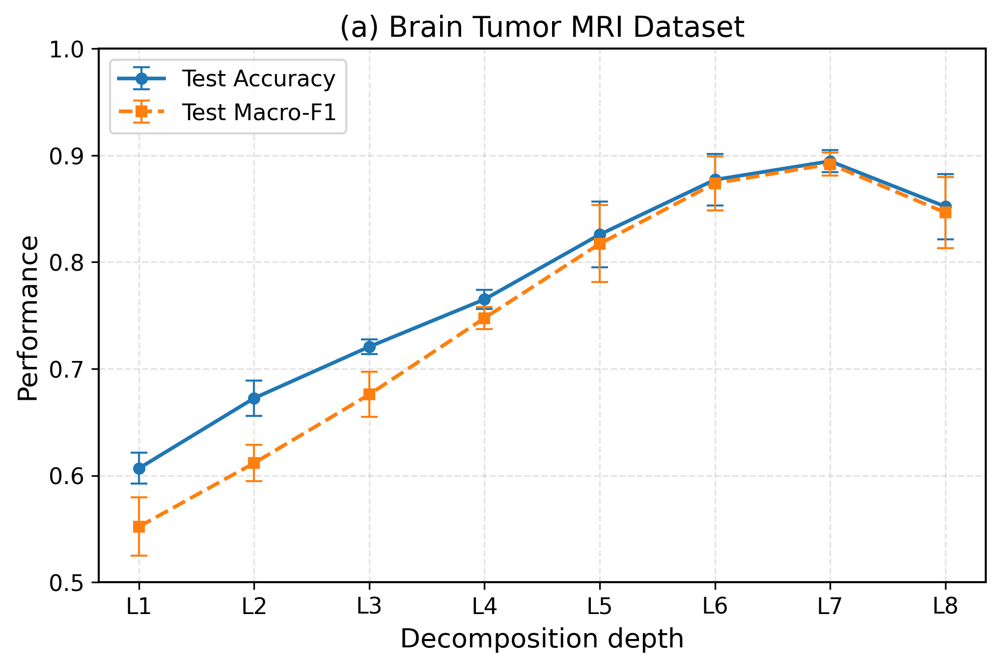

Saved: histories_ablation_2026/Figure4_depth_ablation_test_performance.png
Saved: histories_ablation_2026/Figure4_depth_ablation_test_performance.pdf
y-limits used: (0.519, 0.914)


In [19]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os

# -------------------- Load data --------------------
csv_path = os.path.join("histories_ablation_2026", "WF_depth_withApprox_MASTER_mean_std_by_level.csv")
df = pd.read_csv(csv_path)

# -------------------- Columns --------------------
x = df["N_LEVELS"].values

test_acc_mean = df["Test Acc (mean)"].values
test_acc_std  = df["Test Acc (std)"].values

test_f1_mean = df["Test Macro-F1 (mean)"].values
test_f1_std  = df["Test Macro-F1 (std)"].values

# -------------------- Safe y-limits so nothing is clipped --------------------
all_low  = np.concatenate([test_acc_mean - test_acc_std, test_f1_mean - test_f1_std])
all_high = np.concatenate([test_acc_mean + test_acc_std, test_f1_mean + test_f1_std])

ymin = max(0.50, float(np.floor((all_low.min() - 0.005) * 1000) / 1000))
ymax = float(np.ceil((all_high.max() + 0.008) * 1000) / 1000)

# -------------------- Global style --------------------
plt.rcParams.update({
    "figure.figsize": (7.0, 4.9),
    "figure.dpi": 300,
    "font.size": 11,
    "axes.labelsize": 13,
    "axes.titlesize": 14,
    "xtick.labelsize": 11,
    "ytick.labelsize": 11,
    "legend.fontsize": 11,
    "axes.linewidth": 1.0,
})

fig, ax = plt.subplots()

# -------------------- Plot --------------------
ax.errorbar(
    x, test_acc_mean, yerr=test_acc_std,
    fmt='o-', linewidth=1.8, markersize=5,
    capsize=4, elinewidth=1.0,
    label="Test Accuracy"
)

ax.errorbar(
    x, test_f1_mean, yerr=test_f1_std,
    fmt='s--', linewidth=1.8, markersize=5,
    capsize=4, elinewidth=1.0,
    label="Test Macro-F1"
)

# -------------------- Axes --------------------
ax.set_xticks(x)
ax.set_xticklabels([f"L{i}" for i in x])
ax.set_xlabel("Decomposition depth")
ax.set_ylabel("Performance")
ax.set_title("(a) Brain Tumor MRI Dataset")

# Fixed y-axis for fair visual comparison across datasets
ax.set_ylim(0.50, 1.00)
ax.set_yticks(np.arange(0.50, 1.01, 0.10))

ax.grid(True, linestyle="--", alpha=0.35)
ax.legend(loc="upper left", frameon=True)

fig.subplots_adjust(left=0.12, right=0.98, bottom=0.16, top=0.90)

# -------------------- Save --------------------
out_png = os.path.join("histories_ablation_2026", "Figure4_depth_ablation_test_performance.png")
out_pdf = os.path.join("histories_ablation_2026", "Figure4_depth_ablation_test_performance.pdf")

fig.savefig(out_png, dpi=300)
fig.savefig(out_pdf)
plt.show()

print("Saved:", out_png)
print("Saved:", out_pdf)
print("y-limits used:", (ymin, ymax))

# Br35H A1

In [11]:
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"
os.environ["TF_ENABLE_LAYOUT_OPTIMIZER"] = "0"

import time, gc
from pathlib import Path

import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd

from tensorflow.keras import layers, models, callbacks, regularizers
from tensorflow.keras import mixed_precision
from sklearn.metrics import classification_report, confusion_matrix, f1_score
from sklearn.model_selection import train_test_split

mixed_precision.set_global_policy("float32")

# -------------------- Config --------------------
DATA_DIR = "./"

IMG_SIZE  = 256
BATCH     = 32
AUTOTUNE  = tf.data.AUTOTUNE
EPOCHS    = 3

RUN_SEEDS = [42, 43, 44, 45, 46]
HEAD_MODE = "multilevel_details"
PROJ_DIM  = 16

# Ablation: try different decomposition depths
LEVEL_LIST = [1, 2, 3, 4, 5, 6, 7, 8]

RUN_SECOND_SERIES_DETAILS_ONLY = False

TEST_SIZE = 0.20
VAL_SIZE_WITHIN_TRAINVAL = 0.20

CLASS_NAMES = ["no", "yes"]

HIST_DIR = "./histories_ablation_br35h_2026"
FIG_DIR  = "./figures_ablation_br35h_2026"
os.makedirs(HIST_DIR, exist_ok=True)
os.makedirs(FIG_DIR, exist_ok=True)

# -------------------- tf.data helper --------------------
def cfg(ds, shuffle=False, seed=0):
    ds = ds.cache()
    if shuffle:
        ds = ds.shuffle(1000, seed=seed, reshuffle_each_iteration=True)
    return ds.prefetch(AUTOTUNE)

def count_images(ds):
    n = 0
    for xb, _ in ds:
        n += int(xb.shape[0])
    return n

def y_true_from_ds(ds):
    ys = []
    for _, y in ds:
        ys.append(y.numpy())
    return np.argmax(np.vstack(ys), axis=1)

def collect_yes_no_paths(data_dir):
    data_dir = Path(data_dir)
    yes_dir = data_dir / "yes"
    no_dir  = data_dir / "no"

    if not yes_dir.exists() or not no_dir.exists():
        raise FileNotFoundError(
            f"Expected folders '{yes_dir}' and '{no_dir}'. "
            f"Set DATA_DIR to the dataset root containing yes/, no/, and pred/."
        )

    valid_ext = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"}

    yes_paths = sorted([str(p) for p in yes_dir.rglob("*") if p.suffix.lower() in valid_ext])
    no_paths  = sorted([str(p) for p in no_dir.rglob("*") if p.suffix.lower() in valid_ext])

    if len(yes_paths) == 0 or len(no_paths) == 0:
        raise ValueError("No images found in yes/ or no/ folders.")

    paths = np.array(no_paths + yes_paths, dtype=object)
    labels = np.array([0] * len(no_paths) + [1] * len(yes_paths), dtype=np.int32)
    return paths, labels

def decode_and_resize(path, label):
    img = tf.io.read_file(path)
    img = tf.image.decode_image(img, channels=1, expand_animations=False)
    img = tf.image.resize(img, [IMG_SIZE, IMG_SIZE], method="bilinear")
    img = tf.cast(img, tf.float32)
    label = tf.one_hot(label, depth=len(CLASS_NAMES), dtype=tf.float32)
    return img, label

def make_dataset(paths, labels, shuffle=False, seed=0):
    ds = tf.data.Dataset.from_tensor_slices((paths, labels))
    ds = ds.map(decode_and_resize, num_parallel_calls=AUTOTUNE)
    ds = ds.batch(BATCH)
    ds = cfg(ds, shuffle=shuffle, seed=seed)
    return ds

# -------------------- Plot/Save helpers --------------------
def save_confusion_matrix_png(cm, class_names, title, out_path):
    plt.rcParams.update({"font.size": 12})
    fig, ax = plt.subplots(figsize=(7.2, 6.2))
    vmax = cm.max() if cm.max() > 0 else 1
    im = ax.imshow(cm, interpolation="nearest", cmap=plt.cm.Blues, vmin=0, vmax=vmax)
    cbar = plt.colorbar(im, ax=ax)
    cbar.ax.set_ylabel("Number of samples")

    ticks = np.arange(len(class_names))
    ax.set_xticks(ticks); ax.set_yticks(ticks)
    ax.set_xticklabels(class_names, rotation=45, ha="right")
    ax.set_yticklabels(class_names)
    ax.set_ylabel("True label"); ax.set_xlabel("Predicted label"); ax.set_title(title)

    thresh = vmax / 2.0
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, str(cm[i, j]), ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)

def specificity_from_cm(cm: np.ndarray):
    spec = []
    total = cm.sum()
    for i in range(cm.shape[0]):
        TP = cm[i, i]
        FN = cm[i, :].sum() - TP
        FP = cm[:, i].sum() - TP
        TN = total - TP - FN - FP
        spec_i = TN / (TN + FP + 1e-12)
        spec.append(float(spec_i))
    return spec

def per_class_table(report_dict, cm, class_names):
    spec = specificity_from_cm(cm)
    rows = []
    for idx, cls in enumerate(class_names):
        d = report_dict.get(cls, {})
        rows.append({
            "class": cls,
            "precision": float(d.get("precision", np.nan)),
            "recall(sensitivity)": float(d.get("recall", np.nan)),
            "specificity": spec[idx],
            "f1_score": float(d.get("f1-score", np.nan)),
            "support": int(d.get("support", 0)),
        })
    return pd.DataFrame(rows)

# -------------------- Model blocks --------------------
L2_STRENGTH = 2e-4

def conv_block(x, filters, sd_rate=0.0, name_prefix="blk"):
    x = layers.Conv2D(filters, 3, padding="same", use_bias=False,
                      kernel_regularizer=regularizers.l2(L2_STRENGTH),
                      name=f"{name_prefix}_conv1")(x)
    x = layers.BatchNormalization(name=f"{name_prefix}_bn1")(x)
    x = layers.ReLU(name=f"{name_prefix}_relu1")(x)

    x = layers.Conv2D(filters, 3, padding="same", use_bias=False,
                      kernel_regularizer=regularizers.l2(L2_STRENGTH),
                      name=f"{name_prefix}_conv2")(x)
    x = layers.BatchNormalization(name=f"{name_prefix}_bn2")(x)
    x = layers.ReLU(name=f"{name_prefix}_relu2")(x)

    if sd_rate > 0:
        x = layers.SpatialDropout2D(sd_rate, name=f"{name_prefix}_spdrop")(x)
    return x

# -------------------- Haar wavelet layer --------------------
class HaarWavelet2D(layers.Layer):
    def build(self, input_shape):
        if int(input_shape[-1]) != 1:
            raise ValueError(f"HaarWavelet2D expects single-channel input, got {input_shape[-1]}.")

        ll = np.array([[0.5,  0.5],
                       [0.5,  0.5]], dtype="float32")
        lh = np.array([[ 0.5,  0.5],
                       [-0.5, -0.5]], dtype="float32")
        hl = np.array([[ 0.5, -0.5],
                       [ 0.5, -0.5]], dtype="float32")
        hh = np.array([[ 0.5, -0.5],
                       [-0.5,  0.5]], dtype="float32")

        k = np.stack([ll, lh, hl, hh], axis=-1).reshape((2, 2, 1, 4))
        self.kernel = tf.constant(k, dtype=tf.float32)
        super().build(input_shape)

    def call(self, inputs):
        x = tf.cast(inputs, tf.float32)
        y = tf.nn.conv2d(x, self.kernel, strides=[1, 2, 2, 1], padding="SAME")
        ll, lh, hl, hh = tf.split(y, 4, axis=-1)
        return ll, lh, hl, hh

# -------------------- Shared preprocessing --------------------
def per_image_standardize_batch(x):
    out_dtype = x.dtype
    x32 = tf.cast(x, tf.float32)
    y32 = tf.map_fn(tf.image.per_image_standardization, x32, fn_output_signature=tf.float32)
    return tf.cast(y32, out_dtype)

# -------------------- Build WaveletFusion for a given N_LEVELS --------------------
def build_wavelet_model(num_classes: int, run_seed: int, n_levels: int, head_mode: str,
                        use_approx_in_fusion: bool = True):

    if IMG_SIZE % (2 ** n_levels) != 0:
        raise ValueError(f"IMG_SIZE={IMG_SIZE} must be divisible by 2^{n_levels}.")

    augment = tf.keras.Sequential([
        layers.RandomFlip("horizontal", seed=run_seed),
        layers.RandomRotation(0.05, seed=run_seed + 1),
        layers.RandomZoom(0.1, seed=run_seed + 2),
        layers.RandomContrast(0.1, seed=run_seed + 3),
        layers.RandomTranslation(0.03, 0.03, seed=run_seed + 4),
    ], name="augment")

    rescale = layers.Rescaling(1./255, name="rescale")
    standardize = layers.Lambda(per_image_standardize_batch, name="per_image_standardization")

    DETAIL_F_8 = [12, 8, 8, 6, 6, 4, 4, 4]
    APPROX_F_8 = [4, 4, 4, 4, 4, 4, 4, 4]
    BB_F_8     = [28, 44, 44, 44, 44, 44, 44, 44]

    SD_D_8 = [0.10, 0.08, 0.08, 0.06, 0.06, 0.05, 0.05, 0.05]
    SD_B_8 = [0.10, 0.12, 0.12, 0.10, 0.10, 0.08, 0.08, 0.08]

    DETAIL_F = DETAIL_F_8[:n_levels]
    APPROX_F = APPROX_F_8[:n_levels]
    BB_F     = BB_F_8[:n_levels]
    SD_D     = SD_D_8[:n_levels]
    SD_B     = SD_B_8[:n_levels]

    inputs = layers.Input((IMG_SIZE, IMG_SIZE, 1), name="input_image")
    x = augment(inputs)
    x = rescale(x)
    x = standardize(x)
    x = layers.GaussianNoise(0.02, name="gaussian_noise")(x)

    ll_in = x
    prev_pooled = None
    detail_level_vecs = []

    for level in range(1, n_levels + 1):
        LL, LH, HL, HH = HaarWavelet2D(name=f"haar_L{level}")(ll_in)

        D = layers.Concatenate(name=f"details_L{level}")([LH, HL, HH])
        W = conv_block(D, DETAIL_F[level-1], sd_rate=SD_D[level-1], name_prefix=f"L{level}_Detail")

        if use_approx_in_fusion:
            A = conv_block(LL, APPROX_F[level-1], sd_rate=0.0, name_prefix=f"L{level}_Approx")

        if prev_pooled is None:
            if use_approx_in_fusion:
                S = layers.Concatenate(name=f"fusion_L{level}")([W, A])
            else:
                S = W
        else:
            if use_approx_in_fusion:
                S = layers.Concatenate(name=f"fusion_L{level}")([prev_pooled, W, A])
            else:
                S = layers.Concatenate(name=f"fusion_L{level}")([prev_pooled, W])

        B = conv_block(S, BB_F[level-1], sd_rate=SD_B[level-1], name_prefix=f"backbone_block{level}")

        w_gap  = layers.GlobalAveragePooling2D(name=f"gap_detail_L{level}")(W)
        w_proj = layers.Dense(PROJ_DIM, activation="relu", use_bias=False,
                              name=f"proj_detail_L{level}")(w_gap)
        detail_level_vecs.append(w_proj)

        if level < n_levels:
            prev_pooled = layers.MaxPooling2D(name=f"backbone_pool{level}")(B)
            ll_in = LL
        else:
            B_final = B

    deep_vec = layers.GlobalAveragePooling2D(name="gap_deepest_backbone")(B_final)

    if head_mode == "deepest_only":
        feat = deep_vec
    elif head_mode == "multilevel_details":
        feat = layers.Concatenate(name="multilevel_details_concat")([deep_vec] + detail_level_vecs)
    else:
        raise ValueError("head_mode must be 'deepest_only' or 'multilevel_details'")

    feat = layers.Dropout(0.5, name="head_dropout1")(feat)
    feat = layers.Dense(128, activation="relu",
                        kernel_regularizer=regularizers.l2(L2_STRENGTH),
                        name="head_dense_128")(feat)
    feat = layers.Dropout(0.35, name="head_dropout2")(feat)

    outputs = layers.Dense(num_classes, activation="softmax", name="predictions")(feat)
    tag = "withApprox" if use_approx_in_fusion else "detailsOnly"
    return models.Model(inputs, outputs, name=f"WaveletFusion_L{n_levels}_{tag}_{head_mode}_Br35H")

# -------------------- Run one ablation series --------------------
def run_ablation_series(series_name: str, use_approx_in_fusion: bool):
    all_rows = []

    class_names_ref = None
    npy_classnames = os.path.join(HIST_DIR, "class_names.npy")

    for n_levels in LEVEL_LIST:
        print(f"\n================= ABLATION: {series_name} | N_LEVELS={n_levels} =================")
        level_rows = []

        for run_seed in RUN_SEEDS:
            split_seed = run_seed
            print(f"\n--- RUN_SEED={run_seed} | SPLIT_SEED={split_seed} | N_LEVELS={n_levels} ---")

            tf.keras.backend.clear_session()
            gc.collect()
            tf.keras.utils.set_random_seed(run_seed)

            # 1) yes/no -> train_val + test
            trainval_paths, test_paths, trainval_labels, test_labels = train_test_split(
                all_paths,
                all_labels,
                test_size=TEST_SIZE,
                random_state=split_seed,
                stratify=all_labels
            )

            # 2) train_val -> train + val
            train_paths, val_paths, train_labels, val_labels = train_test_split(
                trainval_paths,
                trainval_labels,
                test_size=VAL_SIZE_WITHIN_TRAINVAL,
                random_state=split_seed,
                stratify=trainval_labels
            )

            if class_names_ref is None:
                class_names_ref = CLASS_NAMES.copy()
                np.save(npy_classnames, np.array(CLASS_NAMES, dtype=object))
                print(f"[Saved] Class names -> {npy_classnames}")

            print(f"Train: {len(train_paths)} | Val: {len(val_paths)} | Test: {len(test_paths)}")

            train_ds      = make_dataset(train_paths, train_labels, shuffle=True,  seed=run_seed)
            train_eval_ds = make_dataset(train_paths, train_labels, shuffle=False, seed=run_seed)
            val_ds        = make_dataset(val_paths,   val_labels,   shuffle=False, seed=run_seed)
            test_ds       = make_dataset(test_paths,  test_labels,  shuffle=False, seed=run_seed)

            model = build_wavelet_model(
                num_classes=len(CLASS_NAMES),
                run_seed=run_seed,
                n_levels=n_levels,
                head_mode=HEAD_MODE,
                use_approx_in_fusion=use_approx_in_fusion
            )
            params = int(model.count_params())

            loss_fn = tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.05)
            model.compile(optimizer=tf.keras.optimizers.Adam(3e-4),
                          loss=loss_fn, metrics=["accuracy"])

            class EpochTimer(callbacks.Callback):
                def on_train_begin(self, logs=None): self.epoch_times = []
                def on_epoch_begin(self, epoch, logs=None): self._t0 = time.time()
                def on_epoch_end(self, epoch, logs=None): self.epoch_times.append(time.time() - self._t0)

            epoch_timer = EpochTimer()
            cbs = [
                callbacks.EarlyStopping(patience=6, restore_best_weights=True, monitor="val_loss"),
                callbacks.ReduceLROnPlateau(patience=3, factor=0.5, monitor="val_loss"),
                epoch_timer,
            ]

            t0 = time.time()
            hist = model.fit(train_ds, validation_data=val_ds, epochs=EPOCHS, callbacks=cbs, verbose=1)
            total_train_time = time.time() - t0

            hist_path = os.path.join(HIST_DIR, f"{series_name}_L{n_levels}_history_seed{run_seed}.csv")
            pd.DataFrame(hist.history).to_csv(hist_path, index_label="epoch")
            print(f"[Saved] history -> {hist_path}")

            num_train_images = count_images(train_eval_ds)
            avg_epoch_time = float(np.mean(epoch_timer.epoch_times)) if epoch_timer.epoch_times else float("nan")
            train_fps = num_train_images / avg_epoch_time if avg_epoch_time > 0 else float("nan")

            # ---- VALIDATION ----
            val_probs = model.predict(val_ds, verbose=0)
            y_pred_val = np.argmax(val_probs, axis=1)
            y_true_val = y_true_from_ds(val_ds)
            val_loss, val_acc = model.evaluate(val_ds, verbose=0)
            val_macro_f1 = float(f1_score(y_true_val, y_pred_val, average="macro"))

            cm_val = confusion_matrix(y_true_val, y_pred_val)
            cm_val_npy = os.path.join(HIST_DIR, f"{series_name}_L{n_levels}_cm_val_seed{run_seed}.npy")
            cm_val_png = os.path.join(FIG_DIR,  f"{series_name}_L{n_levels}_cm_val_seed{run_seed}.png")
            np.save(cm_val_npy, cm_val)
            save_confusion_matrix_png(cm_val, CLASS_NAMES,
                                      title=f"{series_name} (L={n_levels}) – Confusion Matrix (VAL) [seed={run_seed}]",
                                      out_path=cm_val_png)

            rep_val_dict = classification_report(
                y_true_val, y_pred_val, target_names=CLASS_NAMES, digits=4, output_dict=True
            )
            df_val_pc = per_class_table(rep_val_dict, cm_val, CLASS_NAMES)
            val_pc_csv = os.path.join(HIST_DIR, f"{series_name}_L{n_levels}_perclass_val_seed{run_seed}.csv")
            val_pc_txt = os.path.join(HIST_DIR, f"{series_name}_L{n_levels}_perclass_val_seed{run_seed}.txt")
            df_val_pc.to_csv(val_pc_csv, index=False)
            with open(val_pc_txt, "w", encoding="utf-8") as f:
                f.write(df_val_pc.to_string(index=False))

            # ---- TEST ----
            test_probs = model.predict(test_ds, verbose=0)
            y_pred_test = np.argmax(test_probs, axis=1)
            y_true_test = y_true_from_ds(test_ds)
            test_loss, test_acc = model.evaluate(test_ds, verbose=0)
            test_macro_f1 = float(f1_score(y_true_test, y_pred_test, average="macro"))

            cm_test = confusion_matrix(y_true_test, y_pred_test)
            cm_test_npy = os.path.join(HIST_DIR, f"{series_name}_L{n_levels}_cm_test_seed{run_seed}.npy")
            cm_test_png = os.path.join(FIG_DIR,  f"{series_name}_L{n_levels}_cm_test_seed{run_seed}.png")
            np.save(cm_test_npy, cm_test)
            save_confusion_matrix_png(cm_test, CLASS_NAMES,
                                      title=f"{series_name} (L={n_levels}) – Confusion Matrix (TEST) [seed={run_seed}]",
                                      out_path=cm_test_png)

            rep_test_dict = classification_report(
                y_true_test, y_pred_test, target_names=CLASS_NAMES, digits=4, output_dict=True
            )
            df_test_pc = per_class_table(rep_test_dict, cm_test, CLASS_NAMES)
            test_pc_csv = os.path.join(HIST_DIR, f"{series_name}_L{n_levels}_perclass_test_seed{run_seed}.csv")
            test_pc_txt = os.path.join(HIST_DIR, f"{series_name}_L{n_levels}_perclass_test_seed{run_seed}.txt")
            df_test_pc.to_csv(test_pc_csv, index=False)
            with open(test_pc_txt, "w", encoding="utf-8") as f:
                f.write(df_test_pc.to_string(index=False))

            row = {
                "Series": series_name,
                "N_LEVELS": n_levels,
                "RUN_SEED": run_seed,
                "SPLIT_SEED": split_seed,
                "Val Loss": float(val_loss),
                "Val Acc": float(val_acc),
                "Val Macro-F1": float(val_macro_f1),
                "Test Loss": float(test_loss),
                "Test Acc": float(test_acc),
                "Test Macro-F1": float(test_macro_f1),
                "Train Time (s)": float(total_train_time),
                "Avg Epoch Time (s)": float(avg_epoch_time),
                "Train FPS (img/s)": float(train_fps),
                "Parameters": int(params),
                "HEAD_MODE": HEAD_MODE,
                "use_approx_in_fusion": bool(use_approx_in_fusion),
                "Num Classes": int(len(CLASS_NAMES)),
            }
            level_rows.append(row)
            all_rows.append(row)

            del model, train_ds, val_ds, test_ds, train_eval_ds, hist
            gc.collect()

        df_level = pd.DataFrame(level_rows).sort_values("RUN_SEED").reset_index(drop=True)
        out_level_csv = os.path.join(HIST_DIR, f"{series_name}_L{n_levels}_summary_seeds.csv")
        df_level.to_csv(out_level_csv, index=False)
        print(f"[Saved] per-level summary -> {out_level_csv}")

    df_all = pd.DataFrame(all_rows)
    out_all_csv = os.path.join(HIST_DIR, f"{series_name}_ALL_levels_ALL_seeds_long.csv")
    df_all.to_csv(out_all_csv, index=False)
    print(f"[Saved] long table -> {out_all_csv}")

    agg_rows = []
    for n_levels in LEVEL_LIST:
        sub = df_all[df_all["N_LEVELS"] == n_levels]

        def mstd(x):
            x = np.asarray(x, dtype=np.float32)
            m = float(np.mean(x))
            s = float(np.std(x, ddof=1)) if len(x) > 1 else 0.0
            return m, s

        vL_m, vL_s = mstd(sub["Val Loss"])
        vA_m, vA_s = mstd(sub["Val Acc"])
        vF_m, vF_s = mstd(sub["Val Macro-F1"])
        tL_m, tL_s = mstd(sub["Test Loss"])
        tA_m, tA_s = mstd(sub["Test Acc"])
        tF_m, tF_s = mstd(sub["Test Macro-F1"])

        agg_rows.append({
            "Series": series_name,
            "N_LEVELS": n_levels,
            "Val Loss (mean)": vL_m, "Val Loss (std)": vL_s,
            "Val Acc (mean)":  vA_m, "Val Acc (std)":  vA_s,
            "Val Macro-F1 (mean)": vF_m, "Val Macro-F1 (std)": vF_s,
            "Test Loss (mean)": tL_m, "Test Loss (std)": tL_s,
            "Test Acc (mean)":  tA_m, "Test Acc (std)":  tA_s,
            "Test Macro-F1 (mean)": tF_m, "Test Macro-F1 (std)": tF_s,
            "use_approx_in_fusion": bool(use_approx_in_fusion),
            "Num Classes": int(len(CLASS_NAMES)),
        })

    df_agg = pd.DataFrame(agg_rows).sort_values("N_LEVELS").reset_index(drop=True)
    out_agg_csv = os.path.join(HIST_DIR, f"{series_name}_MASTER_mean_std_by_level.csv")
    df_agg.to_csv(out_agg_csv, index=False)
    print(f"[Saved] master mean±std -> {out_agg_csv}")

    return df_agg

# -------------------- Run ablations --------------------
all_paths, all_labels = collect_yes_no_paths(DATA_DIR)
print(f"Found {len(all_paths)} labeled images total.")
print(f"Class distribution -> no: {(all_labels == 0).sum()}, yes: {(all_labels == 1).sum()}")
print("Folder 'pred' is ignored during supervised training/evaluation.")

df_main = run_ablation_series(series_name="WF_depth_withApprox_br35h", use_approx_in_fusion=True)

if RUN_SECOND_SERIES_DETAILS_ONLY:
    df_alt = run_ablation_series(series_name="WF_depth_detailsOnly_br35h", use_approx_in_fusion=False)
    df_both = pd.concat([df_main, df_alt], axis=0).reset_index(drop=True)
    df_both.to_csv(os.path.join(HIST_DIR, "WF_ABLATION_MASTER_all_series_br35h.csv"), index=False)
    print("[Saved] combined master ->", os.path.join(HIST_DIR, "WF_ABLATION_MASTER_all_series_br35h.csv"))

Found 3002 labeled images total.
Class distribution -> no: 1501, yes: 1501
Folder 'pred' is ignored during supervised training/evaluation.

================= ABLATION: WF_depth_withApprox_br35h | N_LEVELS=1 =================

--- RUN_SEED=42 | SPLIT_SEED=42 | N_LEVELS=1 ---
[Saved] Class names -> ./histories_ablation_br35h_2026/class_names.npy
Train: 1920 | Val: 481 | Test: 601
Epoch 1/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - accuracy: 0.5277 - loss: 0.7297 - val_accuracy: 0.5114 - val_loss: 0.7165 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - accuracy: 0.5905 - loss: 0.7012 - val_accuracy: 0.6403 - val_loss: 0.6935 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - accuracy: 0.6149 - loss: 0.6821 - val_accuracy: 0.6528 - val_loss: 0.6604 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - accuracy: 0.6584 - loss: 0.6478 - val_accuracy: 0.7796 - val_loss: 0.5980 - learning_rate: 3.0000e-04

2026-04-29 18:45:50.418730: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L1_withApprox_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - accuracy: 0.5462 - loss: 0.7442 - val_accuracy: 0.5073 - val_loss: 0.7206 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - accuracy: 0.6251 - loss: 0.6771 - val_accuracy: 0.5800 - val_loss: 0.7031 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - accuracy: 0.6191 - loss: 0.6818 - val_accuracy: 0.7235 - val_loss: 0.6503 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - accuracy: 0.6569 - loss: 0.6535 - val_accuracy: 0.7214 - val_loss: 0.6257 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - accuracy: 0.6778 - loss: 0.6382 - val_accuracy: 0.7006 - val_loss: 0.6158 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - accuracy: 0.6930 - loss: 0.6277 - val_accuracy: 0.7443 - val_loss: 0.5833 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - accuracy: 0.6871 - loss: 0.6

2026-04-29 18:47:35.304625: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L1_withApprox_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - accuracy: 0.5032 - loss: 0.7438 - val_accuracy: 0.5135 - val_loss: 0.7153 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - accuracy: 0.5668 - loss: 0.7075 - val_accuracy: 0.5094 - val_loss: 0.7011 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - accuracy: 0.6569 - loss: 0.6576 - val_accuracy: 0.5904 - val_loss: 0.6667 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - accuracy: 0.6782 - loss: 0.6373 - val_accuracy: 0.6757 - val_loss: 0.6344 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - accuracy: 0.6769 - loss: 0.6463 - val_accuracy: 0.7401 - val_loss: 0.6023 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - accuracy: 0.6883 - loss: 0.6212 - val_accuracy: 0.7401 - val_loss: 0.5859 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - accuracy: 0.7106 - loss: 0.5

2026-04-29 18:49:51.926464: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L2_withApprox_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step - accuracy: 0.5307 - loss: 0.7608 - val_accuracy: 0.5572 - val_loss: 0.7426 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - accuracy: 0.6198 - loss: 0.6932 - val_accuracy: 0.7360 - val_loss: 0.7002 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - accuracy: 0.6876 - loss: 0.6642 - val_accuracy: 0.7817 - val_loss: 0.6188 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - accuracy: 0.7189 - loss: 0.6398 - val_accuracy: 0.7796 - val_loss: 0.5464 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - accuracy: 0.7293 - loss: 0.6051 - val_accuracy: 0.7817 - val_loss: 0.5562 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - accuracy: 0.7447 - loss: 0.5865 - val_accuracy: 0.8108 - val_loss: 0.4871 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - accuracy: 0.7723 - loss: 0.5

2026-04-29 18:51:27.558164: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L2_withApprox_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step - accuracy: 0.5394 - loss: 0.7919 - val_accuracy: 0.6195 - val_loss: 0.7396 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - accuracy: 0.6349 - loss: 0.7066 - val_accuracy: 0.5301 - val_loss: 0.7136 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - accuracy: 0.6682 - loss: 0.6803 - val_accuracy: 0.6029 - val_loss: 0.6761 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - accuracy: 0.7013 - loss: 0.6373 - val_accuracy: 0.7734 - val_loss: 0.5893 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.7128 - loss: 0.6343 - val_accuracy: 0.6819 - val_loss: 0.6352 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - accuracy: 0.7378 - loss: 0.6143 - val_accuracy: 0.6466 - val_loss: 0.7084 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - accuracy: 0.7459 - loss: 0.5

2026-04-29 18:52:29.593311: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L2_withApprox_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step - accuracy: 0.5245 - loss: 0.7882 - val_accuracy: 0.4990 - val_loss: 0.7341 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - accuracy: 0.5952 - loss: 0.7075 - val_accuracy: 0.5052 - val_loss: 0.7532 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - accuracy: 0.6807 - loss: 0.6619 - val_accuracy: 0.6507 - val_loss: 0.6570 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - accuracy: 0.7141 - loss: 0.6421 - val_accuracy: 0.7214 - val_loss: 0.6234 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - accuracy: 0.7330 - loss: 0.6105 - val_accuracy: 0.7568 - val_loss: 0.5919 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - accuracy: 0.7595 - loss: 0.5918 - val_accuracy: 0.7921 - val_loss: 0.5550 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - accuracy: 0.7218 - loss: 0.6

2026-04-29 18:54:40.577303: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L2_withApprox_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 9s 46ms/step - accuracy: 0.5308 - loss: 0.7700 - val_accuracy: 0.5010 - val_loss: 0.7513 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - accuracy: 0.6558 - loss: 0.6874 - val_accuracy: 0.4990 - val_loss: 0.7357 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - accuracy: 0.6938 - loss: 0.6639 - val_accuracy: 0.5073 - val_loss: 0.7219 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - accuracy: 0.7109 - loss: 0.6446 - val_accuracy: 0.7817 - val_loss: 0.5899 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - accuracy: 0.7339 - loss: 0.6061 - val_accuracy: 0.7879 - val_loss: 0.5655 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - accuracy: 0.7349 - loss: 0.6072 - val_accuracy: 0.8150 - val_loss: 0.5040 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - accuracy: 0.7704 - loss: 0.5

2026-04-29 18:56:17.371959: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L3_withApprox_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step - accuracy: 0.5240 - loss: 0.8130 - val_accuracy: 0.4990 - val_loss: 0.7688 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - accuracy: 0.6520 - loss: 0.7178 - val_accuracy: 0.4990 - val_loss: 0.8084 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - accuracy: 0.6958 - loss: 0.6677 - val_accuracy: 0.5156 - val_loss: 0.8562 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - accuracy: 0.7349 - loss: 0.6397 - val_accuracy: 0.6528 - val_loss: 0.6991 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - accuracy: 0.7620 - loss: 0.5978 - val_accuracy: 0.6486 - val_loss: 0.7001 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - accuracy: 0.7892 - loss: 0.5650 - val_accuracy: 0.8212 - val_loss: 0.4896 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - accuracy: 0.8134 - loss: 0.

2026-04-29 18:57:37.234103: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L3_withApprox_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step - accuracy: 0.5164 - loss: 0.8169 - val_accuracy: 0.4990 - val_loss: 0.7725 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - accuracy: 0.6332 - loss: 0.7130 - val_accuracy: 0.4990 - val_loss: 0.8214 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - accuracy: 0.6767 - loss: 0.6908 - val_accuracy: 0.6071 - val_loss: 0.7169 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - accuracy: 0.7318 - loss: 0.6488 - val_accuracy: 0.6778 - val_loss: 0.6908 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - accuracy: 0.7579 - loss: 0.6232 - val_accuracy: 0.6632 - val_loss: 0.7332 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - accuracy: 0.7694 - loss: 0.5875 - val_accuracy: 0.7256 - val_loss: 0.6732 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - accuracy: 0.7693 - loss: 0.

2026-04-29 18:58:56.134995: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L3_withApprox_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.5177 - loss: 0.8007 - val_accuracy: 0.4990 - val_loss: 0.7703 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.6385 - loss: 0.7197 - val_accuracy: 0.5260 - val_loss: 0.7524 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - accuracy: 0.6962 - loss: 0.6718 - val_accuracy: 0.5385 - val_loss: 0.8248 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - accuracy: 0.7524 - loss: 0.6227 - val_accuracy: 0.7339 - val_loss: 0.6255 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.7733 - loss: 0.5952 - val_accuracy: 0.7692 - val_loss: 0.5989 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.7798 - loss: 0.5727 - val_accuracy: 0.8420 - val_loss: 0.4890 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - accuracy: 0.8014 - loss: 0.

2026-04-29 19:00:06.076906: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L3_withApprox_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 11s 50ms/step - accuracy: 0.5546 - loss: 0.7788 - val_accuracy: 0.5010 - val_loss: 0.7665 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - accuracy: 0.6679 - loss: 0.6949 - val_accuracy: 0.5010 - val_loss: 0.7526 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - accuracy: 0.7442 - loss: 0.6269 - val_accuracy: 0.6736 - val_loss: 0.6708 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - accuracy: 0.7754 - loss: 0.5957 - val_accuracy: 0.6029 - val_loss: 0.8481 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - accuracy: 0.7721 - loss: 0.5900 - val_accuracy: 0.7464 - val_loss: 0.6125 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - accuracy: 0.8122 - loss: 0.5542 - val_accuracy: 0.7900 - val_loss: 0.5458 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - accuracy: 0.8094 - loss: 0.

2026-04-29 19:01:09.347944: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L3_withApprox_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 11s 51ms/step - accuracy: 0.5341 - loss: 0.8041 - val_accuracy: 0.5010 - val_loss: 0.7710 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - accuracy: 0.6371 - loss: 0.7205 - val_accuracy: 0.5010 - val_loss: 0.8428 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - accuracy: 0.7160 - loss: 0.6621 - val_accuracy: 0.4990 - val_loss: 0.9178 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - accuracy: 0.7273 - loss: 0.6551 - val_accuracy: 0.6258 - val_loss: 0.7056 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.7701 - loss: 0.5942 - val_accuracy: 0.7505 - val_loss: 0.5866 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - accuracy: 0.7646 - loss: 0.5923 - val_accuracy: 0.8441 - val_loss: 0.4796 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - accuracy: 0.7945 - loss: 0.

2026-04-29 19:02:22.933088: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L4_withApprox_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step - accuracy: 0.5544 - loss: 0.8135 - val_accuracy: 0.4990 - val_loss: 0.7817 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.6669 - loss: 0.7201 - val_accuracy: 0.4990 - val_loss: 1.0143 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.7164 - loss: 0.6623 - val_accuracy: 0.5447 - val_loss: 0.8717 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - accuracy: 0.7549 - loss: 0.6212 - val_accuracy: 0.5530 - val_loss: 1.1267 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - accuracy: 0.8016 - loss: 0.5843 - val_accuracy: 0.7401 - val_loss: 0.6232 - learning_rate: 1.5000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.7943 - loss: 0.5844 - val_accuracy: 0.8586 - val_loss: 0.4760 - learning_rate: 1.5000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - accuracy: 0.8135 - loss: 0.

2026-04-29 19:03:44.211829: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L4_withApprox_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step - accuracy: 0.5026 - loss: 0.8451 - val_accuracy: 0.4990 - val_loss: 0.8036 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - accuracy: 0.6447 - loss: 0.7340 - val_accuracy: 0.4990 - val_loss: 1.0784 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - accuracy: 0.7189 - loss: 0.6815 - val_accuracy: 0.5010 - val_loss: 1.1114 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - accuracy: 0.7593 - loss: 0.6287 - val_accuracy: 0.5405 - val_loss: 1.2182 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - accuracy: 0.7739 - loss: 0.6006 - val_accuracy: 0.8025 - val_loss: 0.5713 - learning_rate: 1.5000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - accuracy: 0.7986 - loss: 0.5939 - val_accuracy: 0.8233 - val_loss: 0.5262 - learning_rate: 1.5000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.8109 - loss: 0.

2026-04-29 19:05:08.972725: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L4_withApprox_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step - accuracy: 0.5387 - loss: 0.8172 - val_accuracy: 0.4990 - val_loss: 0.7874 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.6685 - loss: 0.7218 - val_accuracy: 0.4990 - val_loss: 0.8584 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - accuracy: 0.7187 - loss: 0.6852 - val_accuracy: 0.6112 - val_loss: 0.7333 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.7868 - loss: 0.6087 - val_accuracy: 0.8233 - val_loss: 0.5401 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - accuracy: 0.8107 - loss: 0.5657 - val_accuracy: 0.8358 - val_loss: 0.4930 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.8182 - loss: 0.5562 - val_accuracy: 0.8358 - val_loss: 0.5368 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - accuracy: 0.8239 - loss: 0.

2026-04-29 19:06:12.640968: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L4_withApprox_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step - accuracy: 0.5314 - loss: 0.8214 - val_accuracy: 0.5031 - val_loss: 0.7856 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - accuracy: 0.6386 - loss: 0.7345 - val_accuracy: 0.5634 - val_loss: 0.7443 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - accuracy: 0.7338 - loss: 0.6486 - val_accuracy: 0.7256 - val_loss: 0.6467 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - accuracy: 0.7827 - loss: 0.6051 - val_accuracy: 0.7609 - val_loss: 0.5987 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.8133 - loss: 0.5697 - val_accuracy: 0.8170 - val_loss: 0.5256 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.8213 - loss: 0.5530 - val_accuracy: 0.8316 - val_loss: 0.5370 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.8167 - loss: 0.

2026-04-29 19:07:37.805391: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L4_withApprox_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 14s 59ms/step - accuracy: 0.5234 - loss: 0.8248 - val_accuracy: 0.5010 - val_loss: 0.7899 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - accuracy: 0.6677 - loss: 0.7150 - val_accuracy: 0.5010 - val_loss: 0.9140 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - accuracy: 0.7453 - loss: 0.6583 - val_accuracy: 0.5322 - val_loss: 0.8370 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - accuracy: 0.7647 - loss: 0.6280 - val_accuracy: 0.7568 - val_loss: 0.6204 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - accuracy: 0.8035 - loss: 0.5647 - val_accuracy: 0.8295 - val_loss: 0.4835 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - accuracy: 0.8071 - loss: 0.5693 - val_accuracy: 0.8565 - val_loss: 0.4949 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - accuracy: 0.8172 - loss: 0.

2026-04-29 19:08:43.760354: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L5_withApprox_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - accuracy: 0.5358 - loss: 0.8678 - val_accuracy: 0.5301 - val_loss: 0.8027 - learning_rate: 3.0000e-04
Epoch 2/30


W0000 00:00:1777489729.322411     482 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777489729.322767     482 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777489729.322957     482 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777489729.323123     482 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777489729.323287     482 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777489729.323445     482 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777489729.323626     482 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777489729.323801     482 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777489729.323966     482 gp

60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step - accuracy: 0.6632 - loss: 0.7465 - val_accuracy: 0.5031 - val_loss: 0.8118 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - accuracy: 0.7256 - loss: 0.6896 - val_accuracy: 0.5738 - val_loss: 0.8053 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - accuracy: 0.7803 - loss: 0.6389 - val_accuracy: 0.7713 - val_loss: 0.6023 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - accuracy: 0.8076 - loss: 0.6021 - val_accuracy: 0.8773 - val_loss: 0.4607 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - accuracy: 0.8214 - loss: 0.5764 - val_accuracy: 0.8877 - val_loss: 0.4645 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - accuracy: 0.8220 - loss: 0.5638 - val_accuracy: 0.9127 - val_loss: 0.4172 - learning_rate: 3.0000e-04
Epoch 8/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - accuracy: 0.8384 - loss: 0.5

W0000 00:00:1777489782.246745     536 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777489782.247096     536 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777489782.247273     536 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777489782.247444     536 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777489782.247622     536 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777489782.247788     536 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777489782.247957     536 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777489782.248127     536 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777489782.248303     536 gp


--- RUN_SEED=43 | SPLIT_SEED=43 | N_LEVELS=5 ---
Train: 1920 | Val: 481 | Test: 601
Epoch 1/30


2026-04-29 19:10:15.268651: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L5_withApprox_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - accuracy: 0.5005 - loss: 0.8576 - val_accuracy: 0.4990 - val_loss: 0.8318 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - accuracy: 0.6405 - loss: 0.7655 - val_accuracy: 0.4990 - val_loss: 1.3684 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - accuracy: 0.7060 - loss: 0.7128 - val_accuracy: 0.5738 - val_loss: 0.7692 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - accuracy: 0.7522 - loss: 0.6568 - val_accuracy: 0.7817 - val_loss: 0.6253 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - accuracy: 0.7789 - loss: 0.6288 - val_accuracy: 0.8212 - val_loss: 0.5687 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - accuracy: 0.7833 - loss: 0.6082 - val_accuracy: 0.8565 - val_loss: 0.5139 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - accuracy: 0.8209 - loss: 0.

2026-04-29 19:11:48.049364: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L5_withApprox_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - accuracy: 0.5113 - loss: 0.8789 - val_accuracy: 0.4990 - val_loss: 0.8087 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - accuracy: 0.6277 - loss: 0.7656 - val_accuracy: 0.5094 - val_loss: 0.7919 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - accuracy: 0.7169 - loss: 0.6938 - val_accuracy: 0.5218 - val_loss: 1.0045 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - accuracy: 0.7644 - loss: 0.6488 - val_accuracy: 0.5842 - val_loss: 0.8847 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - accuracy: 0.8042 - loss: 0.5995 - val_accuracy: 0.7235 - val_loss: 0.6795 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - accuracy: 0.7968 - loss: 0.5918 - val_accuracy: 0.8046 - val_loss: 0.5765 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - accuracy: 0.8226 - loss: 0.

2026-04-29 19:13:55.305464: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L5_withApprox_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - accuracy: 0.5142 - loss: 0.8809 - val_accuracy: 0.5010 - val_loss: 0.8244 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - accuracy: 0.6816 - loss: 0.7462 - val_accuracy: 0.5177 - val_loss: 0.8135 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - accuracy: 0.7470 - loss: 0.6721 - val_accuracy: 0.8378 - val_loss: 0.5690 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - accuracy: 0.7548 - loss: 0.6297 - val_accuracy: 0.7900 - val_loss: 0.5937 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - accuracy: 0.7971 - loss: 0.6027 - val_accuracy: 0.8586 - val_loss: 0.5040 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - accuracy: 0.8260 - loss: 0.5761 - val_accuracy: 0.8607 - val_loss: 0.4789 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - accuracy: 0.8412 - loss: 0.

2026-04-29 19:15:09.468393: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L5_withApprox_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - accuracy: 0.5523 - loss: 0.8292 - val_accuracy: 0.5010 - val_loss: 0.8146 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.6539 - loss: 0.7533 - val_accuracy: 0.5010 - val_loss: 0.8252 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.7154 - loss: 0.7007 - val_accuracy: 0.7089 - val_loss: 0.6947 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.7357 - loss: 0.6656 - val_accuracy: 0.8316 - val_loss: 0.5619 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.7806 - loss: 0.6113 - val_accuracy: 0.8067 - val_loss: 0.5996 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.8005 - loss: 0.6042 - val_accuracy: 0.8191 - val_loss: 0.5496 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.8318 - loss: 0.

2026-04-29 19:16:32.305819: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L6_withApprox_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - accuracy: 0.5173 - loss: 0.8971 - val_accuracy: 0.6341 - val_loss: 0.8239 - learning_rate: 3.0000e-04
Epoch 2/30


W0000 00:00:1777490198.789963     513 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777490198.790318     513 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777490198.790504     513 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777490198.790676     513 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777490198.790839     513 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777490198.791002     513 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777490198.791180     513 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777490198.791361     513 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777490198.791551     513 gp

60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.5822 - loss: 0.8226 - val_accuracy: 0.7006 - val_loss: 0.7674 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.6868 - loss: 0.7587 - val_accuracy: 0.8420 - val_loss: 0.6680 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.7249 - loss: 0.7074 - val_accuracy: 0.8420 - val_loss: 0.5736 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.7710 - loss: 0.6476 - val_accuracy: 0.8420 - val_loss: 0.5282 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.7824 - loss: 0.6370 - val_accuracy: 0.8441 - val_loss: 0.5489 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.8096 - loss: 0.6164 - val_accuracy: 0.7505 - val_loss: 0.6909 - learning_rate: 3.0000e-04
Epoch 8/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.8249 - loss: 0.5

W0000 00:00:1777490296.262930     485 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777490296.263325     485 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777490296.263512     485 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777490296.263689     485 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777490296.263857     485 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777490296.264040     485 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777490296.264202     485 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777490296.264370     485 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777490296.264543     485 gp


--- RUN_SEED=43 | SPLIT_SEED=43 | N_LEVELS=6 ---
Train: 1920 | Val: 481 | Test: 601
Epoch 1/30


2026-04-29 19:18:53.186346: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L6_withApprox_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - accuracy: 0.5107 - loss: 0.8657 - val_accuracy: 0.6819 - val_loss: 0.8230 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.6243 - loss: 0.7920 - val_accuracy: 0.7214 - val_loss: 0.7439 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.7025 - loss: 0.7405 - val_accuracy: 0.7380 - val_loss: 0.6862 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.7423 - loss: 0.6855 - val_accuracy: 0.7775 - val_loss: 0.6225 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.7736 - loss: 0.6547 - val_accuracy: 0.7838 - val_loss: 0.6305 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.8065 - loss: 0.6067 - val_accuracy: 0.8815 - val_loss: 0.5059 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.8325 - loss: 0.

2026-04-29 19:21:16.878769: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L6_withApprox_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5228 - loss: 0.8725 - val_accuracy: 0.7401 - val_loss: 0.8242 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.6423 - loss: 0.7889 - val_accuracy: 0.6029 - val_loss: 0.7882 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.7226 - loss: 0.7023 - val_accuracy: 0.7838 - val_loss: 0.6771 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.7749 - loss: 0.6592 - val_accuracy: 0.7277 - val_loss: 0.6932 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.7908 - loss: 0.6268 - val_accuracy: 0.6944 - val_loss: 0.7225 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.8247 - loss: 0.5888 - val_accuracy: 0.8254 - val_loss: 0.5607 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.8388 - loss: 0.

2026-04-29 19:23:38.786088: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L6_withApprox_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - accuracy: 0.5418 - loss: 0.8626 - val_accuracy: 0.5094 - val_loss: 0.8294 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.6434 - loss: 0.7812 - val_accuracy: 0.7380 - val_loss: 0.7459 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.7241 - loss: 0.7075 - val_accuracy: 0.7775 - val_loss: 0.6468 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.7875 - loss: 0.6324 - val_accuracy: 0.8545 - val_loss: 0.5565 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.8012 - loss: 0.6068 - val_accuracy: 0.7963 - val_loss: 0.6081 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.8216 - loss: 0.5801 - val_accuracy: 0.8628 - val_loss: 0.5101 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.8702 - loss: 0.

2026-04-29 19:26:03.431062: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L6_withApprox_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - accuracy: 0.5346 - loss: 0.8948 - val_accuracy: 0.6840 - val_loss: 0.8262 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.6307 - loss: 0.7943 - val_accuracy: 0.7547 - val_loss: 0.7522 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.7187 - loss: 0.7245 - val_accuracy: 0.7651 - val_loss: 0.6704 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.7586 - loss: 0.6860 - val_accuracy: 0.8067 - val_loss: 0.6039 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.7835 - loss: 0.6395 - val_accuracy: 0.8108 - val_loss: 0.5554 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.7921 - loss: 0.6351 - val_accuracy: 0.8254 - val_loss: 0.5310 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.8205 - loss: 0.

2026-04-29 19:28:06.201642: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L7_withApprox_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - accuracy: 0.5258 - loss: 0.8975 - val_accuracy: 0.5426 - val_loss: 0.8524 - learning_rate: 3.0000e-04
Epoch 2/30


W0000 00:00:1777490893.414414     540 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777490893.415211     540 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777490893.415442     540 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777490893.415646     540 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777490893.415839     540 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777490893.416034     540 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777490893.416254     540 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777490893.416462     540 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777490893.416667     540 gp

60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.6154 - loss: 0.8268 - val_accuracy: 0.7568 - val_loss: 0.8249 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.6916 - loss: 0.7662 - val_accuracy: 0.7609 - val_loss: 0.7578 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.7377 - loss: 0.7246 - val_accuracy: 0.8233 - val_loss: 0.6431 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7736 - loss: 0.6676 - val_accuracy: 0.8586 - val_loss: 0.5735 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.8060 - loss: 0.6578 - val_accuracy: 0.8794 - val_loss: 0.5235 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.8057 - loss: 0.6127 - val_accuracy: 0.8940 - val_loss: 0.4876 - learning_rate: 3.0000e-04
Epoch 8/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.8182 - loss: 0.6

W0000 00:00:1777491001.573848     527 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777491001.574211     527 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777491001.574409     527 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777491001.574586     527 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777491001.574757     527 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777491001.574928     527 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777491001.575096     527 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777491001.575263     527 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777491001.575431     527 gp


--- RUN_SEED=43 | SPLIT_SEED=43 | N_LEVELS=7 ---
Train: 1920 | Val: 481 | Test: 601
Epoch 1/30


2026-04-29 19:30:43.328549: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L7_withApprox_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 84ms/step - accuracy: 0.5261 - loss: 0.8948 - val_accuracy: 0.5738 - val_loss: 0.8491 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - accuracy: 0.5655 - loss: 0.8420 - val_accuracy: 0.7089 - val_loss: 0.8218 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.6608 - loss: 0.7875 - val_accuracy: 0.7277 - val_loss: 0.7685 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.7055 - loss: 0.7504 - val_accuracy: 0.7505 - val_loss: 0.6941 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.7512 - loss: 0.7152 - val_accuracy: 0.7838 - val_loss: 0.6346 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - accuracy: 0.7897 - loss: 0.6771 - val_accuracy: 0.8191 - val_loss: 0.6217 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.8068 - loss: 0.

2026-04-29 19:33:29.601343: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L7_withApprox_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 91ms/step - accuracy: 0.5172 - loss: 0.9109 - val_accuracy: 0.5925 - val_loss: 0.8538 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6408 - loss: 0.7940 - val_accuracy: 0.5135 - val_loss: 0.8349 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7267 - loss: 0.7396 - val_accuracy: 0.6029 - val_loss: 0.8062 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.7691 - loss: 0.6948 - val_accuracy: 0.7464 - val_loss: 0.6891 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.7912 - loss: 0.6597 - val_accuracy: 0.8690 - val_loss: 0.5414 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - accuracy: 0.8165 - loss: 0.6234 - val_accuracy: 0.8940 - val_loss: 0.5118 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.8309 - loss: 0.

2026-04-29 19:36:21.327777: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L7_withApprox_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 90ms/step - accuracy: 0.5237 - loss: 0.9195 - val_accuracy: 0.5239 - val_loss: 0.8582 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.6024 - loss: 0.8296 - val_accuracy: 0.6632 - val_loss: 0.8271 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - accuracy: 0.7062 - loss: 0.7627 - val_accuracy: 0.7069 - val_loss: 0.7667 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.7795 - loss: 0.6939 - val_accuracy: 0.7838 - val_loss: 0.6730 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - accuracy: 0.7866 - loss: 0.6605 - val_accuracy: 0.8441 - val_loss: 0.5878 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.8099 - loss: 0.6274 - val_accuracy: 0.8815 - val_loss: 0.5111 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.8293 - loss: 0.

2026-04-29 19:39:15.999018: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L7_withApprox_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 93ms/step - accuracy: 0.5207 - loss: 0.8887 - val_accuracy: 0.5634 - val_loss: 0.8549 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.5996 - loss: 0.8427 - val_accuracy: 0.5468 - val_loss: 0.8362 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.7010 - loss: 0.7600 - val_accuracy: 0.7339 - val_loss: 0.7526 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.7410 - loss: 0.7163 - val_accuracy: 0.8025 - val_loss: 0.6479 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.7744 - loss: 0.6882 - val_accuracy: 0.8337 - val_loss: 0.5952 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.7854 - loss: 0.6799 - val_accuracy: 0.8669 - val_loss: 0.5507 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.8067 - loss: 0.

2026-04-29 19:42:09.687162: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L8_withApprox_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - accuracy: 0.5016 - loss: 0.9901 - val_accuracy: 0.6819 - val_loss: 0.8589 - learning_rate: 3.0000e-04
Epoch 2/30


W0000 00:00:1777491738.299365     479 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777491738.300043     479 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777491738.300260     479 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777491738.300436     479 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777491738.300613     479 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777491738.300786     479 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777491738.300979     479 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777491738.301166     479 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777491738.301343     479 gp

60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5200 - loss: 0.9142 - val_accuracy: 0.7193 - val_loss: 0.8486 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6052 - loss: 0.8623 - val_accuracy: 0.7630 - val_loss: 0.8270 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6266 - loss: 0.8231 - val_accuracy: 0.7672 - val_loss: 0.7894 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6667 - loss: 0.7946 - val_accuracy: 0.7069 - val_loss: 0.7663 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.6793 - loss: 0.7769 - val_accuracy: 0.7942 - val_loss: 0.6812 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.7233 - loss: 0.7462 - val_accuracy: 0.8212 - val_loss: 0.6570 - learning_rate: 3.0000e-04
Epoch 8/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.7287 - loss: 0.7

W0000 00:00:1777491864.219989     510 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777491864.220997     510 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777491864.221327     510 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777491864.221576     510 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777491864.221812     510 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777491864.222039     510 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777491864.222268     510 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777491864.222487     510 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777491864.222715     510 gp


--- RUN_SEED=43 | SPLIT_SEED=43 | N_LEVELS=8 ---
Train: 1920 | Val: 481 | Test: 601
Epoch 1/30


2026-04-29 19:45:08.541352: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L8_withApprox_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - accuracy: 0.5108 - loss: 0.9508 - val_accuracy: 0.5738 - val_loss: 0.8714 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - accuracy: 0.5484 - loss: 0.9113 - val_accuracy: 0.6320 - val_loss: 0.8609 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5880 - loss: 0.8732 - val_accuracy: 0.6611 - val_loss: 0.8455 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - accuracy: 0.6159 - loss: 0.8556 - val_accuracy: 0.7568 - val_loss: 0.8022 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.6841 - loss: 0.7889 - val_accuracy: 0.7526 - val_loss: 0.7510 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - accuracy: 0.6922 - loss: 0.7640 - val_accuracy: 0.7568 - val_loss: 0.6991 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.7228 - loss: 0.

2026-04-29 19:48:19.768082: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L8_withApprox_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 108ms/step - accuracy: 0.5085 - loss: 0.9509 - val_accuracy: 0.5322 - val_loss: 0.8717 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - accuracy: 0.5433 - loss: 0.8952 - val_accuracy: 0.5613 - val_loss: 0.8632 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - accuracy: 0.5553 - loss: 0.8812 - val_accuracy: 0.6902 - val_loss: 0.8527 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step - accuracy: 0.6059 - loss: 0.8333 - val_accuracy: 0.7027 - val_loss: 0.8244 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - accuracy: 0.6428 - loss: 0.8005 - val_accuracy: 0.7152 - val_loss: 0.7788 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step - accuracy: 0.7097 - loss: 0.7594 - val_accuracy: 0.7422 - val_loss: 0.7216 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - accuracy: 0.7227 - loss: 0

2026-04-29 19:51:33.680953: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L8_withApprox_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - accuracy: 0.5282 - loss: 0.9500 - val_accuracy: 0.5738 - val_loss: 0.8746 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5451 - loss: 0.8961 - val_accuracy: 0.5780 - val_loss: 0.8583 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.5770 - loss: 0.8771 - val_accuracy: 0.7193 - val_loss: 0.8393 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - accuracy: 0.6666 - loss: 0.7976 - val_accuracy: 0.7609 - val_loss: 0.7872 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 91ms/step - accuracy: 0.6860 - loss: 0.7869 - val_accuracy: 0.7859 - val_loss: 0.7267 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - accuracy: 0.7216 - loss: 0.7393 - val_accuracy: 0.8025 - val_loss: 0.6577 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - accuracy: 0.7467 - loss: 0.

2026-04-29 19:55:02.428751: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion_L8_withApprox_multilevel_details_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 28s 112ms/step - accuracy: 0.4960 - loss: 0.9872 - val_accuracy: 0.5821 - val_loss: 0.8663 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - accuracy: 0.5454 - loss: 0.9051 - val_accuracy: 0.6881 - val_loss: 0.8498 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - accuracy: 0.6055 - loss: 0.8621 - val_accuracy: 0.6944 - val_loss: 0.8316 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 84ms/step - accuracy: 0.6527 - loss: 0.8013 - val_accuracy: 0.7484 - val_loss: 0.7983 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step - accuracy: 0.6804 - loss: 0.7698 - val_accuracy: 0.7464 - val_loss: 0.7371 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 85ms/step - accuracy: 0.7046 - loss: 0.7561 - val_accuracy: 0.7775 - val_loss: 0.6584 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 85ms/step - accuracy: 0.7268 - loss: 0

# A1 Visualization - Br35H

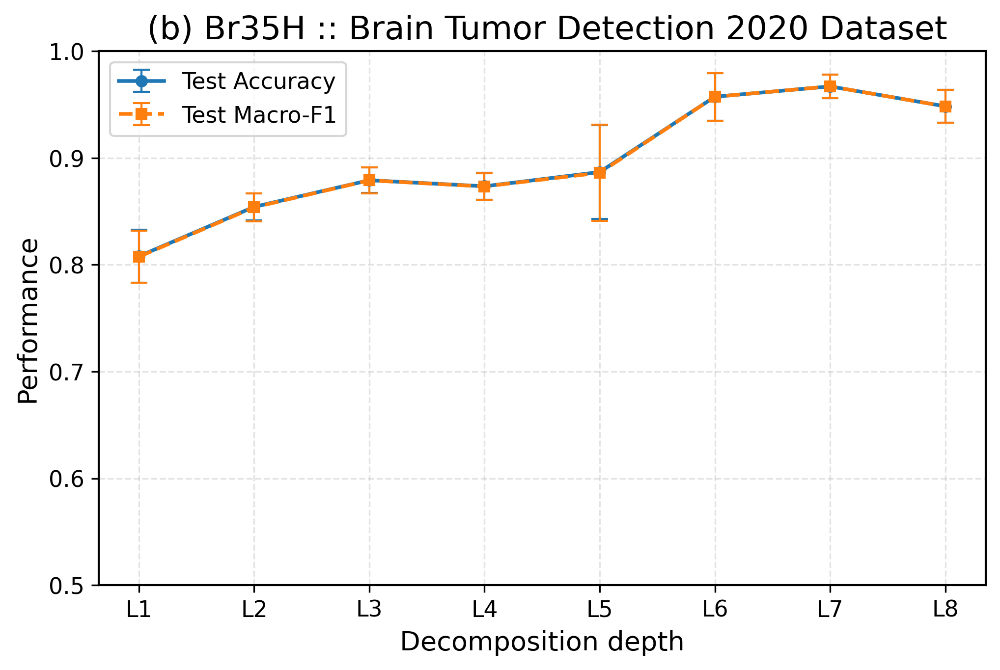

Saved: histories_ablation_br35h_2026/Figure4_depth_ablation_test_performance_br35h_article_final.png
Saved: histories_ablation_br35h_2026/Figure4_depth_ablation_test_performance_br35h_article_final.pdf
y-limits used: (0.78, 0.988)


In [22]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os

# -------------------- Load data --------------------
csv_path = os.path.join(
    "histories_ablation_br35h_2026",
    "WF_depth_withApprox_br35h_MASTER_mean_std_by_level.csv"
)
df = pd.read_csv(csv_path)

# -------------------- Columns --------------------
x = df["N_LEVELS"].values

test_acc_mean = df["Test Acc (mean)"].values
test_acc_std  = df["Test Acc (std)"].values

test_f1_mean = df["Test Macro-F1 (mean)"].values
test_f1_std  = df["Test Macro-F1 (std)"].values

# -------------------- Safe y-limits so nothing is clipped --------------------
all_low  = np.concatenate([test_acc_mean - test_acc_std, test_f1_mean - test_f1_std])
all_high = np.concatenate([test_acc_mean + test_acc_std, test_f1_mean + test_f1_std])

ymin = max(0.78, float(np.floor((all_low.min() - 0.005) * 1000) / 1000))
ymax = float(np.ceil((all_high.max() + 0.008) * 1000) / 1000)

# -------------------- Global style --------------------
plt.rcParams.update({
    "figure.figsize": (7.0, 4.9),
    "figure.dpi": 300,
    "font.size": 11,
    "axes.labelsize": 13,
    "axes.titlesize": 16,
    "xtick.labelsize": 11,
    "ytick.labelsize": 11,
    "legend.fontsize": 11,
    "axes.linewidth": 1.0,
})

fig, ax = plt.subplots()

# -------------------- Plot --------------------
ax.errorbar(
    x, test_acc_mean, yerr=test_acc_std,
    fmt='o-', linewidth=1.8, markersize=5,
    capsize=4, elinewidth=1.0,
    label="Test Accuracy"
)

ax.errorbar(
    x, test_f1_mean, yerr=test_f1_std,
    fmt='s--', linewidth=1.8, markersize=5,
    capsize=4, elinewidth=1.0,
    label="Test Macro-F1"
)

# -------------------- Axes --------------------
ax.set_xticks(x)
ax.set_xticklabels([f"L{i}" for i in x])
ax.set_xlabel("Decomposition depth")
ax.set_ylabel("Performance")
ax.set_title(" (b) Br35H :: Brain Tumor Detection 2020 Dataset")

# Fixed y-axis for fair visual comparison across datasets
ax.set_ylim(0.50, 1.00)
ax.set_yticks(np.arange(0.50, 1.01, 0.10))

ax.grid(True, linestyle="--", alpha=0.35)
ax.legend(loc="upper left", frameon=True)


fig.subplots_adjust(left=0.12, right=0.98, bottom=0.16, top=0.90)

# -------------------- Save --------------------
out_png = os.path.join(
    "histories_ablation_br35h_2026",
    "Figure4_depth_ablation_test_performance_br35h_article_final.png"
)
out_pdf = os.path.join(
    "histories_ablation_br35h_2026",
    "Figure4_depth_ablation_test_performance_br35h_article_final.pdf"
)

fig.savefig(out_png, dpi=300)
fig.savefig(out_pdf)
plt.show()

print("Saved:", out_png)
print("Saved:", out_pdf)
print("y-limits used:", (ymin, ymax))

# A1 Visualization - Brain MRI 2026

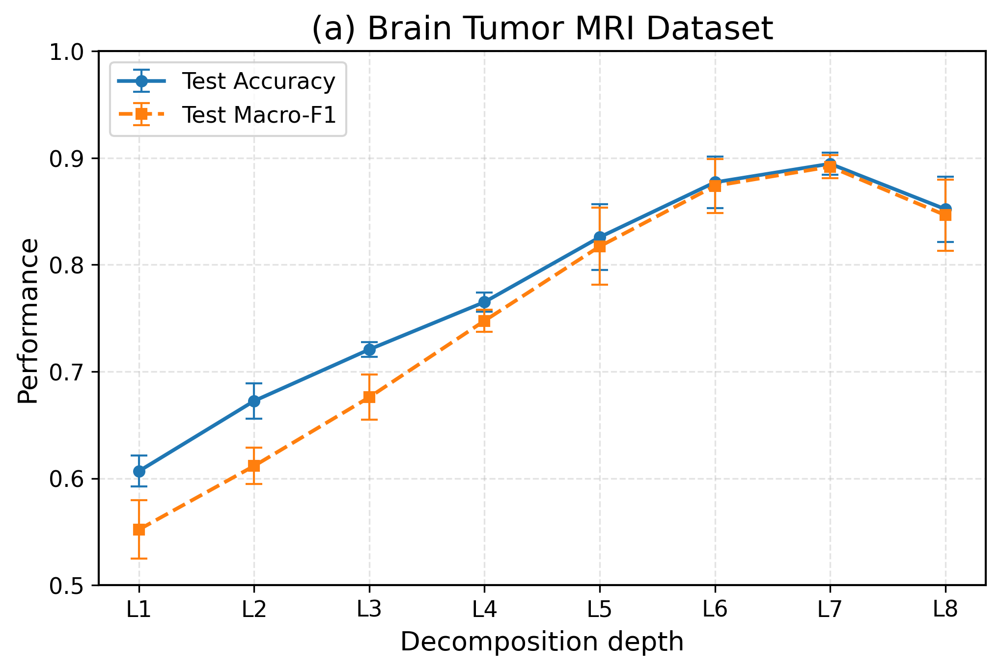

Saved: histories_ablation_2026/Figure4_depth_ablation_test_performance.png
Saved: histories_ablation_2026/Figure4_depth_ablation_test_performance.pdf
y-limits used: (0.519, 0.914)


In [23]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os

# -------------------- Load data --------------------
csv_path = os.path.join("histories_ablation_2026", "WF_depth_withApprox_MASTER_mean_std_by_level.csv")
df = pd.read_csv(csv_path)

# -------------------- Columns --------------------
x = df["N_LEVELS"].values

test_acc_mean = df["Test Acc (mean)"].values
test_acc_std  = df["Test Acc (std)"].values

test_f1_mean = df["Test Macro-F1 (mean)"].values
test_f1_std  = df["Test Macro-F1 (std)"].values

# -------------------- Safe y-limits so nothing is clipped --------------------
all_low  = np.concatenate([test_acc_mean - test_acc_std, test_f1_mean - test_f1_std])
all_high = np.concatenate([test_acc_mean + test_acc_std, test_f1_mean + test_f1_std])

ymin = max(0.50, float(np.floor((all_low.min() - 0.005) * 1000) / 1000))
ymax = float(np.ceil((all_high.max() + 0.008) * 1000) / 1000)

# -------------------- Global style --------------------
plt.rcParams.update({
    "figure.figsize": (7.0, 4.9),
    "figure.dpi": 300,
    "font.size": 11,
    "axes.labelsize": 13,
    "axes.titlesize": 16,
    "xtick.labelsize": 11,
    "ytick.labelsize": 11,
    "legend.fontsize": 11,
    "axes.linewidth": 1.0,
})

fig, ax = plt.subplots()

# -------------------- Plot --------------------
ax.errorbar(
    x, test_acc_mean, yerr=test_acc_std,
    fmt='o-', linewidth=1.8, markersize=5,
    capsize=4, elinewidth=1.0,
    label="Test Accuracy"
)

ax.errorbar(
    x, test_f1_mean, yerr=test_f1_std,
    fmt='s--', linewidth=1.8, markersize=5,
    capsize=4, elinewidth=1.0,
    label="Test Macro-F1"
)

# -------------------- Axes --------------------
ax.set_xticks(x)
ax.set_xticklabels([f"L{i}" for i in x])
ax.set_xlabel("Decomposition depth")
ax.set_ylabel("Performance")
ax.set_title("(a) Brain Tumor MRI Dataset")

# Fixed y-axis for fair visual comparison across datasets
ax.set_ylim(0.50, 1.00)
ax.set_yticks(np.arange(0.50, 1.01, 0.10))

ax.grid(True, linestyle="--", alpha=0.35)
ax.legend(loc="upper left", frameon=True)

fig.subplots_adjust(left=0.12, right=0.98, bottom=0.16, top=0.90)

# -------------------- Save --------------------
out_png = os.path.join("histories_ablation_2026", "Figure4_depth_ablation_test_performance.png")
out_pdf = os.path.join("histories_ablation_2026", "Figure4_depth_ablation_test_performance.pdf")

fig.savefig(out_png, dpi=300)
fig.savefig(out_pdf)
plt.show()

print("Saved:", out_png)
print("Saved:", out_pdf)
print("y-limits used:", (ymin, ymax))

# Directional: Brain Tumor MRI - WaveletFusion 8-level

In [12]:
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"
os.environ["TF_ENABLE_LAYOUT_OPTIMIZER"] = "0"

import time, gc
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd

from tensorflow.keras import layers, models, callbacks, regularizers
from tensorflow.keras import mixed_precision
from sklearn.metrics import classification_report, confusion_matrix, f1_score

mixed_precision.set_global_policy("float32")

# -------------------- Config --------------------
TRAIN_DIR = "./Training2026"
TEST_DIR  = "./Testing2026"

IMG_SIZE  = 256
BATCH     = 32
AUTOTUNE  = tf.data.AUTOTUNE
EPOCHS    = 30

N_LEVELS  = 8
HEAD_MODE = "multilevel_details"
PROJ_DIM  = 16

RUN_SEEDS = [42, 43, 44, 45, 46]

MAX_PARAMS = 311700
L2_STRENGTH = 2e-4

# A3 configs: mask subbands, keep 3 channels
A3_CONFIGS = [
    ("LH_only",     dict(LH=1.0, HL=0.0, HH=0.0)),
    ("HL_only",     dict(LH=0.0, HL=1.0, HH=0.0)),
    ("HH_only",     dict(LH=0.0, HL=0.0, HH=1.0)),
    ("LH_HL",       dict(LH=1.0, HL=1.0, HH=0.0)),
    ("LH_HH",       dict(LH=1.0, HL=0.0, HH=1.0)),
    ("HL_HH",       dict(LH=0.0, HL=1.0, HH=1.0)),
    ("LH_HL_HH",    dict(LH=1.0, HL=1.0, HH=1.0)),  # full
]

HIST_DIR = "./histories_ablation_A3_2026"
FIG_DIR  = "./figures_ablation_A3_2026"
os.makedirs(HIST_DIR, exist_ok=True)
os.makedirs(FIG_DIR, exist_ok=True)

if IMG_SIZE % (2 ** N_LEVELS) != 0:
    raise ValueError(f"IMG_SIZE={IMG_SIZE} must be divisible by 2^{N_LEVELS} for {N_LEVELS}-level decomposition.")

# -------------------- Preprocessing --------------------
def per_image_standardize_batch(x):
    out_dtype = x.dtype
    x32 = tf.cast(x, tf.float32)
    y32 = tf.map_fn(tf.image.per_image_standardization, x32, fn_output_signature=tf.float32)
    return tf.cast(y32, out_dtype)

def cfg(ds, shuffle=False, seed=0):
    ds = ds.cache()
    if shuffle:
        ds = ds.shuffle(1000, seed=seed, reshuffle_each_iteration=True)
    return ds.prefetch(AUTOTUNE)

def count_images(ds):
    n = 0
    for xb, _ in ds:
        n += int(xb.shape[0])
    return n

def y_true_from_ds(ds):
    ys = []
    for _, y in ds:
        ys.append(y.numpy())
    return np.argmax(np.vstack(ys), axis=1)

# -------------------- Plot / Save helpers --------------------
def save_confusion_matrix_png(cm, class_names, title, out_path):
    plt.rcParams.update({"font.size": 12})
    vmax = cm.max() if cm.max() > 0 else 1
    fig, ax = plt.subplots(figsize=(7.2, 6.2))
    im = ax.imshow(cm, interpolation="nearest", cmap=plt.cm.Blues, vmin=0, vmax=vmax)
    cbar = plt.colorbar(im, ax=ax)
    cbar.ax.set_ylabel("Number of samples")

    ticks = np.arange(len(class_names))
    ax.set_xticks(ticks); ax.set_yticks(ticks)
    ax.set_xticklabels(class_names, rotation=45, ha="right")
    ax.set_yticklabels(class_names)
    ax.set_ylabel("True label"); ax.set_xlabel("Predicted label"); ax.set_title(title)

    thresh = vmax / 2.0
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, str(cm[i, j]), ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)

def specificity_from_cm(cm: np.ndarray):
    spec = []
    total = cm.sum()
    for i in range(cm.shape[0]):
        tp = cm[i, i]
        fn = cm[i, :].sum() - tp
        fp = cm[:, i].sum() - tp
        tn = total - tp - fn - fp
        spec.append(float(tn / (tn + fp + 1e-12)))
    return spec

def per_class_table(report_dict, cm, class_names):
    spec = specificity_from_cm(cm)
    rows = []
    for idx, cls in enumerate(class_names):
        d = report_dict.get(cls, {})
        rows.append({
            "class": cls,
            "precision": float(d.get("precision", np.nan)),
            "recall(sensitivity)": float(d.get("recall", np.nan)),
            "specificity": spec[idx],
            "f1_score": float(d.get("f1-score", np.nan)),
            "support": int(d.get("support", 0)),
        })
    return pd.DataFrame(rows)

# -------------------- Blocks --------------------
def conv_block(x, filters, sd_rate=0.0, name_prefix="blk"):
    x = layers.Conv2D(filters, 3, padding="same", use_bias=False,
                      kernel_regularizer=regularizers.l2(L2_STRENGTH),
                      name=f"{name_prefix}_conv1")(x)
    x = layers.BatchNormalization(name=f"{name_prefix}_bn1")(x)
    x = layers.ReLU(name=f"{name_prefix}_relu1")(x)

    x = layers.Conv2D(filters, 3, padding="same", use_bias=False,
                      kernel_regularizer=regularizers.l2(L2_STRENGTH),
                      name=f"{name_prefix}_conv2")(x)
    x = layers.BatchNormalization(name=f"{name_prefix}_bn2")(x)
    x = layers.ReLU(name=f"{name_prefix}_relu2")(x)

    if sd_rate > 0:
        x = layers.SpatialDropout2D(sd_rate, name=f"{name_prefix}_spdrop")(x)
    return x

class HaarWavelet2D(layers.Layer):
    def build(self, input_shape):
        if int(input_shape[-1]) != 1:
            raise ValueError(f"HaarWavelet2D expects single-channel input, got {input_shape[-1]}.")

        ll = np.array([[0.5,  0.5],[0.5,  0.5]], dtype="float32")
        lh = np.array([[ 0.5,  0.5],[-0.5, -0.5]], dtype="float32")
        hl = np.array([[ 0.5, -0.5],[ 0.5, -0.5]], dtype="float32")
        hh = np.array([[ 0.5, -0.5],[-0.5,  0.5]], dtype="float32")

        k = np.stack([ll, lh, hl, hh], axis=-1).reshape((2, 2, 1, 4))
        self.kernel = tf.constant(k, dtype=tf.float32)
        super().build(input_shape)

    def call(self, inputs):
        x = tf.cast(inputs, tf.float32)
        y = tf.nn.conv2d(x, self.kernel, strides=[1, 2, 2, 1], padding="SAME")
        ll, lh, hl, hh = tf.split(y, 4, axis=-1)
        return ll, lh, hl, hh

# -------------------- Build model with A3 subband masks --------------------
def build_wavelet_model(num_classes: int, run_seed: int, subband_mask: dict):
    augment = tf.keras.Sequential([
        layers.RandomFlip("horizontal", seed=run_seed),
        layers.RandomRotation(0.05, seed=run_seed + 1),
        layers.RandomZoom(0.1, seed=run_seed + 2),
        layers.RandomContrast(0.1, seed=run_seed + 3),
        layers.RandomTranslation(0.03, 0.03, seed=run_seed + 4),
    ], name="augment")

    rescale = layers.Rescaling(1./255, name="rescale")
    standardize = layers.Lambda(per_image_standardize_batch, name="per_image_standardization")

    DETAIL_F = [12, 8, 8, 6, 6, 4, 4, 4]
    APPROX_F = [4, 4, 4, 4, 4, 4, 4, 4]
    BB_F     = [28, 44, 44, 44, 44, 44, 44, 44]
    SD_D     = [0.10, 0.08, 0.08, 0.06, 0.06, 0.05, 0.05, 0.05]
    SD_B     = [0.10, 0.12, 0.12, 0.10, 0.10, 0.08, 0.08, 0.08]

    m_lh = float(subband_mask["LH"])
    m_hl = float(subband_mask["HL"])
    m_hh = float(subband_mask["HH"])

    inputs = layers.Input((IMG_SIZE, IMG_SIZE, 1), name="input_image")
    x = augment(inputs)
    x = rescale(x)
    x = standardize(x)
    x = layers.GaussianNoise(0.02, name="gaussian_noise")(x)

    ll_in = x
    prev_pooled = None
    detail_level_vecs = []

    for level in range(1, N_LEVELS + 1):
        LL, LH, HL, HH = HaarWavelet2D(name=f"haar_L{level}")(ll_in)

        LH = layers.Lambda(lambda t, m=m_lh: t * m, name=f"maskLH_L{level}")(LH)
        HL = layers.Lambda(lambda t, m=m_hl: t * m, name=f"maskHL_L{level}")(HL)
        HH = layers.Lambda(lambda t, m=m_hh: t * m, name=f"maskHH_L{level}")(HH)

        D = layers.Concatenate(name=f"details_L{level}")([LH, HL, HH])
        W = conv_block(D, DETAIL_F[level-1], sd_rate=SD_D[level-1], name_prefix=f"L{level}_Detail")

        A = conv_block(LL, APPROX_F[level-1], sd_rate=0.0, name_prefix=f"L{level}_Approx")

        if prev_pooled is None:
            S = layers.Concatenate(name=f"fusion_L{level}")([W, A])
        else:
            S = layers.Concatenate(name=f"fusion_L{level}")([prev_pooled, W, A])

        B = conv_block(S, BB_F[level-1], sd_rate=SD_B[level-1], name_prefix=f"backbone_block{level}")

        w_gap  = layers.GlobalAveragePooling2D(name=f"gap_detail_L{level}")(W)
        w_proj = layers.Dense(PROJ_DIM, activation="relu", use_bias=False, name=f"proj_detail_L{level}")(w_gap)
        detail_level_vecs.append(w_proj)

        if level < N_LEVELS:
            prev_pooled = layers.MaxPooling2D(name=f"backbone_pool{level}")(B)
            ll_in = LL
        else:
            B_final = B

    deep_vec = layers.GlobalAveragePooling2D(name="gap_deepest_backbone")(B_final)
    feat = layers.Concatenate(name="multilevel_details_concat")([deep_vec] + detail_level_vecs)

    feat = layers.Dropout(0.5, name="head_dropout1")(feat)
    feat = layers.Dense(128, activation="relu",
                        kernel_regularizer=regularizers.l2(L2_STRENGTH),
                        name="head_dense_128")(feat)
    feat = layers.Dropout(0.35, name="head_dropout2")(feat)
    outputs = layers.Dense(num_classes, activation="softmax", name="predictions")(feat)

    return models.Model(inputs, outputs, name="WF8_A3_SubbandMask")

# -------------------- Run A3 --------------------
all_rows = []
class_names_ref = None

for cfg_name, mask in A3_CONFIGS:
    print(f"\n================= A3 CONFIG: {cfg_name} | mask={mask} =================")

    for run_seed in RUN_SEEDS:
        split_seed = run_seed
        print(f"\n--- RUN_SEED={run_seed} | SPLIT_SEED={split_seed} ---")

        tf.keras.backend.clear_session()
        gc.collect()
        tf.keras.utils.set_random_seed(run_seed)

        train_ds_raw = tf.keras.preprocessing.image_dataset_from_directory(
            TRAIN_DIR, labels="inferred", label_mode="categorical",
            color_mode="grayscale", image_size=(IMG_SIZE, IMG_SIZE),
            batch_size=BATCH, validation_split=0.2, subset="training", seed=split_seed,
            interpolation="bilinear", crop_to_aspect_ratio=True)

        val_ds_raw = tf.keras.preprocessing.image_dataset_from_directory(
            TRAIN_DIR, labels="inferred", label_mode="categorical",
            color_mode="grayscale", image_size=(IMG_SIZE, IMG_SIZE),
            batch_size=BATCH, validation_split=0.2, subset="validation", seed=split_seed,
            interpolation="bilinear", crop_to_aspect_ratio=True)

        test_ds_raw = tf.keras.preprocessing.image_dataset_from_directory(
            TEST_DIR, labels="inferred", label_mode="categorical",
            color_mode="grayscale", image_size=(IMG_SIZE, IMG_SIZE),
            batch_size=BATCH, shuffle=False,
            interpolation="bilinear", crop_to_aspect_ratio=True)

        class_names = train_ds_raw.class_names
        num_classes = len(class_names)

        if class_names_ref is None:
            class_names_ref = class_names
            np.save(os.path.join(HIST_DIR, "class_names.npy"), np.array(class_names, dtype=object))
        elif class_names != class_names_ref:
            print("[WARN] class_names order changed across runs. Check folder ordering.")

        train_ds      = cfg(train_ds_raw, shuffle=True,  seed=run_seed)
        train_eval_ds = cfg(train_ds_raw, shuffle=False, seed=run_seed)
        val_ds        = cfg(val_ds_raw,   shuffle=False, seed=run_seed)
        test_ds       = cfg(test_ds_raw,  shuffle=False, seed=run_seed)

        model = build_wavelet_model(num_classes, run_seed, subband_mask=mask)
        params = int(model.count_params())
        print("Parameters:", params)
        if params > MAX_PARAMS:
            raise RuntimeError(f"Params {params} exceed MAX_PARAMS={MAX_PARAMS}.")

        loss_fn = tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.05)
        model.compile(optimizer=tf.keras.optimizers.Adam(3e-4), loss=loss_fn, metrics=["accuracy"])

        class EpochTimer(callbacks.Callback):
            def on_train_begin(self, logs=None): self.epoch_times = []
            def on_epoch_begin(self, epoch, logs=None): self._t0 = time.time()
            def on_epoch_end(self, epoch, logs=None): self.epoch_times.append(time.time() - self._t0)

        epoch_timer = EpochTimer()
        cbs = [
            callbacks.EarlyStopping(patience=6, restore_best_weights=True, monitor="val_loss"),
            callbacks.ReduceLROnPlateau(patience=3, factor=0.5, monitor="val_loss"),
            epoch_timer,
        ]

        t0 = time.time()
        hist = model.fit(train_ds, validation_data=val_ds, epochs=EPOCHS, callbacks=cbs, verbose=1)
        total_train_time = time.time() - t0

        hist_path = os.path.join(HIST_DIR, f"A3_{cfg_name}_history_seed{run_seed}.csv")
        pd.DataFrame(hist.history).to_csv(hist_path, index_label="epoch")

        num_train_images = count_images(train_eval_ds)
        avg_epoch_time = float(np.mean(epoch_timer.epoch_times)) if epoch_timer.epoch_times else float("nan")
        train_fps = num_train_images / avg_epoch_time if avg_epoch_time > 0 else float("nan")

        # ---- VALIDATION ----
        val_probs = model.predict(val_ds, verbose=0)
        y_pred_val = np.argmax(val_probs, axis=1)
        y_true_val = y_true_from_ds(val_ds)
        val_loss, val_acc = model.evaluate(val_ds, verbose=0)
        val_macro_f1 = float(f1_score(y_true_val, y_pred_val, average="macro"))

        cm_val = confusion_matrix(y_true_val, y_pred_val)
        np.save(os.path.join(HIST_DIR, f"A3_{cfg_name}_cm_val_seed{run_seed}.npy"), cm_val)
        save_confusion_matrix_png(cm_val, class_names,
            title=f"A3 {cfg_name} – Confusion Matrix (VAL) [seed={run_seed}]",
            out_path=os.path.join(FIG_DIR, f"A3_{cfg_name}_cm_val_seed{run_seed}.png"))

        rep_val_txt = classification_report(y_true_val, y_pred_val, target_names=class_names, digits=4)
        rep_val_dict = classification_report(y_true_val, y_pred_val, target_names=class_names, digits=4, output_dict=True)
        df_val_pc = per_class_table(rep_val_dict, cm_val, class_names)
        df_val_pc.to_csv(os.path.join(HIST_DIR, f"A3_{cfg_name}_perclass_val_seed{run_seed}.csv"), index=False)
        with open(os.path.join(HIST_DIR, f"A3_{cfg_name}_perclass_val_seed{run_seed}.txt"), "w", encoding="utf-8") as f:
            f.write(df_val_pc.to_string(index=False))

        # ---- TEST ----
        test_probs = model.predict(test_ds, verbose=0)
        y_pred_test = np.argmax(test_probs, axis=1)
        y_true_test = y_true_from_ds(test_ds)
        test_loss, test_acc = model.evaluate(test_ds, verbose=0)
        test_macro_f1 = float(f1_score(y_true_test, y_pred_test, average="macro"))

        cm_test = confusion_matrix(y_true_test, y_pred_test)
        np.save(os.path.join(HIST_DIR, f"A3_{cfg_name}_cm_test_seed{run_seed}.npy"), cm_test)
        save_confusion_matrix_png(cm_test, class_names,
            title=f"A3 {cfg_name} – Confusion Matrix (TEST) [seed={run_seed}]",
            out_path=os.path.join(FIG_DIR, f"A3_{cfg_name}_cm_test_seed{run_seed}.png"))

        rep_test_txt = classification_report(y_true_test, y_pred_test, target_names=class_names, digits=4)
        rep_test_dict = classification_report(y_true_test, y_pred_test, target_names=class_names, digits=4, output_dict=True)
        df_test_pc = per_class_table(rep_test_dict, cm_test, class_names)
        df_test_pc.to_csv(os.path.join(HIST_DIR, f"A3_{cfg_name}_perclass_test_seed{run_seed}.csv"), index=False)
        with open(os.path.join(HIST_DIR, f"A3_{cfg_name}_perclass_test_seed{run_seed}.txt"), "w", encoding="utf-8") as f:
            f.write(df_test_pc.to_string(index=False))

        rpt_path = os.path.join(HIST_DIR, f"A3_{cfg_name}_report_seed{run_seed}.txt")
        with open(rpt_path, "w", encoding="utf-8") as f:
            f.write("=== Validation report ===\n")
            f.write(rep_val_txt)
            f.write("\n\n=== Test report ===\n")
            f.write(rep_test_txt)

        all_rows.append({
            "Ablation": "A3_subband",
            "Config": cfg_name,
            "Mask": str(mask),
            "RUN_SEED": run_seed,
            "SPLIT_SEED": split_seed,
            "Val Loss": float(val_loss),
            "Val Acc": float(val_acc),
            "Val Macro-F1": float(val_macro_f1),
            "Test Loss": float(test_loss),
            "Test Acc": float(test_acc),
            "Test Macro-F1": float(test_macro_f1),
            "Train Time (s)": float(total_train_time),
            "Avg Epoch Time (s)": float(avg_epoch_time),
            "Train FPS (img/s)": float(train_fps),
            "Parameters": int(params),
            "HEAD_MODE": HEAD_MODE,
        })

        del model, train_ds_raw, val_ds_raw, test_ds_raw, train_ds, val_ds, test_ds, train_eval_ds
        gc.collect()

df_all = pd.DataFrame(all_rows).sort_values(["Config", "RUN_SEED"]).reset_index(drop=True)
df_all.to_csv(os.path.join(HIST_DIR, "A3_ALL_configs_ALL_seeds_long.csv"), index=False)
print("[Saved]", os.path.join(HIST_DIR, "A3_ALL_configs_ALL_seeds_long.csv"))

def mean_std(x):
    x = np.asarray(x, dtype=np.float32)
    m = float(np.mean(x))
    s = float(np.std(x, ddof=1)) if len(x) > 1 else 0.0
    return m, s

master_rows = []
for cfg_name, _ in A3_CONFIGS:
    sub = df_all[df_all["Config"] == cfg_name]
    for metric in ["Val Loss","Val Acc","Val Macro-F1","Test Loss","Test Acc","Test Macro-F1"]:
        m, s = mean_std(sub[metric])
        master_rows.append({"Config": cfg_name, "Metric": metric, "Mean": m, "Std": s})

df_master = pd.DataFrame(master_rows)
df_master.to_csv(os.path.join(HIST_DIR, "A3_MASTER_mean_std_by_config.csv"), index=False)
print("[Saved]", os.path.join(HIST_DIR, "A3_MASTER_mean_std_by_config.csv"))


================= A3 CONFIG: LH_only | mask={'LH': 1.0, 'HL': 0.0, 'HH': 0.0} =================

--- RUN_SEED=42 | SPLIT_SEED=42 ---
Found 5600 files belonging to 4 classes.
Using 4480 files for training.
Found 5600 files belonging to 4 classes.
Using 1120 files for validation.
Found 1600 files belonging to 4 classes.
Parameters: 308840
Epoch 1/30


2026-04-29 20:05:24.806954: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - accuracy: 0.2691 - loss: 1.6621 - val_accuracy: 0.3313 - val_loss: 1.5283 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - accuracy: 0.3701 - loss: 1.4841 - val_accuracy: 0.4473 - val_loss: 1.3639 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - accuracy: 0.4832 - loss: 1.3426 - val_accuracy: 0.5902 - val_loss: 1.1383 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - accuracy: 0.5592 - loss: 1.2164 - val_accuracy: 0.6696 - val_loss: 0.9872 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step - accuracy: 0.6183 - loss: 1.1305 - val_accuracy: 0.7179 - val_loss: 0.8762 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step - accuracy: 0.6308 - loss: 1.0970 - val_accuracy: 0.7446 - val_loss: 0.8731 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - accurac

2026-04-29 20:11:30.661558: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.2844 - loss: 1.6901 - val_accuracy: 0.3759 - val_loss: 1.5367 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.3548 - loss: 1.5187 - val_accuracy: 0.4268 - val_loss: 1.4470 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - accuracy: 0.4489 - loss: 1.3902 - val_accuracy: 0.5054 - val_loss: 1.2749 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.5164 - loss: 1.2931 - val_accuracy: 0.7045 - val_loss: 1.0143 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.5596 - loss: 1.2090 - val_accuracy: 0.7339 - val_loss: 0.9193 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6009 - loss: 1.1486 - val_accuracy: 0.7321 - val_loss: 0.9092 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.

2026-04-29 20:16:54.760596: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - accuracy: 0.2606 - loss: 1.7019 - val_accuracy: 0.4152 - val_loss: 1.5473 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.3464 - loss: 1.5335 - val_accuracy: 0.4420 - val_loss: 1.4690 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.4604 - loss: 1.3836 - val_accuracy: 0.5232 - val_loss: 1.2565 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.5215 - loss: 1.2872 - val_accuracy: 0.6670 - val_loss: 1.0224 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.5826 - loss: 1.1953 - val_accuracy: 0.7080 - val_loss: 0.9556 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.6253 - loss: 1.1065 - val_accuracy: 0.6875 - val_loss: 0.9316 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0

2026-04-29 20:22:31.035992: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.2632 - loss: 1.6960 - val_accuracy: 0.2438 - val_loss: 1.5543 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.3702 - loss: 1.5039 - val_accuracy: 0.3946 - val_loss: 1.5324 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.4869 - loss: 1.3556 - val_accuracy: 0.5991 - val_loss: 1.1228 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - accuracy: 0.5784 - loss: 1.1954 - val_accuracy: 0.7250 - val_loss: 0.9541 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - accuracy: 0.6236 - loss: 1.1200 - val_accuracy: 0.7545 - val_loss: 0.8760 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6554 - loss: 1.0526 - val_accuracy: 0.7277 - val_loss: 0.8877 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 13s 90ms/step - accuracy: 0

2026-04-29 20:29:09.817145: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step - accuracy: 0.2636 - loss: 1.6892 - val_accuracy: 0.2643 - val_loss: 1.5460 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 78ms/step - accuracy: 0.3447 - loss: 1.5350 - val_accuracy: 0.4420 - val_loss: 1.4627 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 78ms/step - accuracy: 0.4239 - loss: 1.4234 - val_accuracy: 0.5866 - val_loss: 1.2082 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - accuracy: 0.4707 - loss: 1.3258 - val_accuracy: 0.6732 - val_loss: 1.0739 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 81ms/step - accuracy: 0.5406 - loss: 1.2551 - val_accuracy: 0.6991 - val_loss: 0.9750 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 82ms/step - accuracy: 0.5789 - loss: 1.1778 - val_accuracy: 0.7241 - val_loss: 0.9193 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 81ms/step - accurac

2026-04-29 20:35:34.256990: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 34s 90ms/step - accuracy: 0.2595 - loss: 1.6714 - val_accuracy: 0.2652 - val_loss: 1.5469 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - accuracy: 0.3417 - loss: 1.5305 - val_accuracy: 0.4054 - val_loss: 1.4723 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.4255 - loss: 1.4222 - val_accuracy: 0.5554 - val_loss: 1.1717 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.5513 - loss: 1.2480 - val_accuracy: 0.7536 - val_loss: 0.9172 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.5982 - loss: 1.1499 - val_accuracy: 0.7366 - val_loss: 0.8907 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - accuracy: 0.6060 - loss: 1.1362 - val_accuracy: 0.7643 - val_loss: 0.8522 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy:

2026-04-29 20:41:14.782461: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.2659 - loss: 1.6917 - val_accuracy: 0.3384 - val_loss: 1.5422 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - accuracy: 0.3614 - loss: 1.5158 - val_accuracy: 0.3830 - val_loss: 1.4700 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - accuracy: 0.4076 - loss: 1.4430 - val_accuracy: 0.4768 - val_loss: 1.3218 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.4490 - loss: 1.3687 - val_accuracy: 0.5777 - val_loss: 1.1782 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.5126 - loss: 1.2817 - val_accuracy: 0.7402 - val_loss: 0.9469 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.5750 - loss: 1.1809 - val_accuracy: 0.7232 - val_loss: 0.8878 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.6

2026-04-29 20:46:39.235309: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - accuracy: 0.2698 - loss: 1.6928 - val_accuracy: 0.3991 - val_loss: 1.5437 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.3459 - loss: 1.5291 - val_accuracy: 0.3411 - val_loss: 1.5013 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.4405 - loss: 1.3989 - val_accuracy: 0.5384 - val_loss: 1.2567 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.5332 - loss: 1.2851 - val_accuracy: 0.7080 - val_loss: 0.9831 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.5995 - loss: 1.1719 - val_accuracy: 0.7143 - val_loss: 0.9472 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.6189 - loss: 1.1085 - val_accuracy: 0.7339 - val_loss: 0.9100 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 

2026-04-29 20:52:40.426259: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 33s 90ms/step - accuracy: 0.2538 - loss: 1.7033 - val_accuracy: 0.2375 - val_loss: 1.5599 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - accuracy: 0.3540 - loss: 1.5241 - val_accuracy: 0.2589 - val_loss: 1.5420 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - accuracy: 0.4427 - loss: 1.4197 - val_accuracy: 0.4375 - val_loss: 1.3712 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - accuracy: 0.5222 - loss: 1.2836 - val_accuracy: 0.6339 - val_loss: 1.1270 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - accuracy: 0.5852 - loss: 1.1698 - val_accuracy: 0.7170 - val_loss: 0.9180 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - accuracy: 0.6370 - loss: 1.0964 - val_accuracy: 0.7054 - val_loss: 0.9310 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - accurac

2026-04-29 20:58:32.503325: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.2740 - loss: 1.6837 - val_accuracy: 0.2330 - val_loss: 1.5429 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - accuracy: 0.3783 - loss: 1.4956 - val_accuracy: 0.3384 - val_loss: 1.4564 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.4441 - loss: 1.3812 - val_accuracy: 0.5768 - val_loss: 1.2489 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.5281 - loss: 1.2633 - val_accuracy: 0.7107 - val_loss: 1.0071 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.5887 - loss: 1.1877 - val_accuracy: 0.7759 - val_loss: 0.8704 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.6196 - loss: 1.1124 - val_accuracy: 0.7696 - val_loss: 0.8483 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.

2026-04-29 21:04:14.655001: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - accuracy: 0.2497 - loss: 1.6747 - val_accuracy: 0.2571 - val_loss: 1.5403 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.3821 - loss: 1.4853 - val_accuracy: 0.3848 - val_loss: 1.4262 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.4892 - loss: 1.3464 - val_accuracy: 0.6089 - val_loss: 1.0849 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.5762 - loss: 1.2002 - val_accuracy: 0.7473 - val_loss: 0.9269 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.6131 - loss: 1.1239 - val_accuracy: 0.7196 - val_loss: 0.9071 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.6071 - loss: 1.1066 - val_accuracy: 0.6741 - val_loss: 1.0062 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.6

2026-04-29 21:06:59.119788: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - accuracy: 0.2842 - loss: 1.6696 - val_accuracy: 0.3607 - val_loss: 1.5383 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.3701 - loss: 1.5169 - val_accuracy: 0.3295 - val_loss: 1.4804 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.4270 - loss: 1.4244 - val_accuracy: 0.4652 - val_loss: 1.3797 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.4803 - loss: 1.3357 - val_accuracy: 0.6732 - val_loss: 1.0554 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.5625 - loss: 1.2063 - val_accuracy: 0.5929 - val_loss: 1.2027 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.6028 - loss: 1.1547 - val_accuracy: 0.6402 - val_loss: 1.0384 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.6

2026-04-29 21:10:58.911069: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 32s 81ms/step - accuracy: 0.2715 - loss: 1.6990 - val_accuracy: 0.3857 - val_loss: 1.5405 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.3750 - loss: 1.5040 - val_accuracy: 0.3607 - val_loss: 1.4739 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4732 - loss: 1.3811 - val_accuracy: 0.5196 - val_loss: 1.2742 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.5390 - loss: 1.2879 - val_accuracy: 0.6821 - val_loss: 1.0153 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6119 - loss: 1.1944 - val_accuracy: 0.6964 - val_loss: 0.9909 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6455 - loss: 1.1191 - val_accuracy: 0.6652 - val_loss: 1.0333 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accurac

2026-04-29 21:16:50.474711: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - accuracy: 0.2763 - loss: 1.6934 - val_accuracy: 0.2321 - val_loss: 1.5543 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.3641 - loss: 1.5039 - val_accuracy: 0.2339 - val_loss: 1.5856 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.4499 - loss: 1.4175 - val_accuracy: 0.3598 - val_loss: 1.5456 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.5400 - loss: 1.2819 - val_accuracy: 0.6821 - val_loss: 1.0786 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.5851 - loss: 1.1975 - val_accuracy: 0.6580 - val_loss: 1.0405 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.6243 - loss: 1.1354 - val_accuracy: 0.6000 - val_loss: 1.1487 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy:

2026-04-29 21:21:02.398285: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 32s 80ms/step - accuracy: 0.2795 - loss: 1.6813 - val_accuracy: 0.2321 - val_loss: 1.5471 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.3748 - loss: 1.4966 - val_accuracy: 0.3170 - val_loss: 1.4778 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4531 - loss: 1.3797 - val_accuracy: 0.5295 - val_loss: 1.2863 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.5365 - loss: 1.2921 - val_accuracy: 0.7116 - val_loss: 1.0097 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.5810 - loss: 1.2068 - val_accuracy: 0.7000 - val_loss: 0.9572 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.6011 - loss: 1.1511 - val_accuracy: 0.6884 - val_loss: 1.0228 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy

2026-04-29 21:25:08.838446: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 33s 85ms/step - accuracy: 0.2711 - loss: 1.6719 - val_accuracy: 0.3152 - val_loss: 1.5375 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.3293 - loss: 1.5465 - val_accuracy: 0.4098 - val_loss: 1.4331 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.4446 - loss: 1.4192 - val_accuracy: 0.6438 - val_loss: 1.1449 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.5342 - loss: 1.2706 - val_accuracy: 0.7063 - val_loss: 0.9448 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.6075 - loss: 1.1590 - val_accuracy: 0.7304 - val_loss: 0.8804 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.6041 - loss: 1.1383 - val_accuracy: 0.7571 - val_loss: 0.8816 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accurac

2026-04-29 21:31:01.632751: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - accuracy: 0.2714 - loss: 1.6949 - val_accuracy: 0.3509 - val_loss: 1.5432 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.3482 - loss: 1.5351 - val_accuracy: 0.3464 - val_loss: 1.4652 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.4549 - loss: 1.3918 - val_accuracy: 0.5732 - val_loss: 1.2335 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.5450 - loss: 1.2649 - val_accuracy: 0.7232 - val_loss: 0.9777 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.5934 - loss: 1.1816 - val_accuracy: 0.7384 - val_loss: 0.8961 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.6218 - loss: 1.1086 - val_accuracy: 0.6607 - val_loss: 1.0220 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.6

2026-04-29 21:36:33.046246: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - accuracy: 0.2616 - loss: 1.7047 - val_accuracy: 0.2937 - val_loss: 1.5506 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.3550 - loss: 1.5345 - val_accuracy: 0.4554 - val_loss: 1.4740 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.4696 - loss: 1.3905 - val_accuracy: 0.6455 - val_loss: 1.1846 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.5448 - loss: 1.2692 - val_accuracy: 0.7152 - val_loss: 0.9734 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.6038 - loss: 1.1633 - val_accuracy: 0.7304 - val_loss: 0.9154 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.6192 - loss: 1.1062 - val_accuracy: 0.7571 - val_loss: 0.8967 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.6

2026-04-29 21:42:07.601136: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - accuracy: 0.2718 - loss: 1.6818 - val_accuracy: 0.2500 - val_loss: 1.5614 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.3385 - loss: 1.5386 - val_accuracy: 0.2580 - val_loss: 1.5852 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.4315 - loss: 1.4444 - val_accuracy: 0.6679 - val_loss: 1.1931 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.5209 - loss: 1.2955 - val_accuracy: 0.6625 - val_loss: 1.0310 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.5963 - loss: 1.1851 - val_accuracy: 0.7259 - val_loss: 0.9473 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.6403 - loss: 1.1060 - val_accuracy: 0.7366 - val_loss: 0.8943 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.6

2026-04-29 21:47:50.676928: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - accuracy: 0.2600 - loss: 1.7050 - val_accuracy: 0.3080 - val_loss: 1.5427 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.3261 - loss: 1.5481 - val_accuracy: 0.4375 - val_loss: 1.4529 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.4117 - loss: 1.4234 - val_accuracy: 0.6134 - val_loss: 1.1981 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.4852 - loss: 1.3186 - val_accuracy: 0.6902 - val_loss: 1.0431 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.5411 - loss: 1.2481 - val_accuracy: 0.7054 - val_loss: 0.9373 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.6076 - loss: 1.1488 - val_accuracy: 0.7464 - val_loss: 0.8882 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.

2026-04-29 21:53:37.556520: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - accuracy: 0.2656 - loss: 1.6737 - val_accuracy: 0.3420 - val_loss: 1.5223 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.3777 - loss: 1.4780 - val_accuracy: 0.4446 - val_loss: 1.3529 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.4845 - loss: 1.3519 - val_accuracy: 0.5964 - val_loss: 1.1210 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.5523 - loss: 1.2316 - val_accuracy: 0.7446 - val_loss: 0.9255 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.6088 - loss: 1.1519 - val_accuracy: 0.7420 - val_loss: 0.9014 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.6170 - loss: 1.1148 - val_accuracy: 0.7161 - val_loss: 0.9288 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.6

2026-04-29 21:59:15.900399: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.2761 - loss: 1.6805 - val_accuracy: 0.3821 - val_loss: 1.5394 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.3636 - loss: 1.5225 - val_accuracy: 0.4232 - val_loss: 1.4640 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.4648 - loss: 1.3787 - val_accuracy: 0.5304 - val_loss: 1.2561 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.5464 - loss: 1.2502 - val_accuracy: 0.7232 - val_loss: 0.9641 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.5808 - loss: 1.1741 - val_accuracy: 0.7437 - val_loss: 0.9066 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.6285 - loss: 1.1160 - val_accuracy: 0.7098 - val_loss: 0.9172 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.

2026-04-29 22:05:03.822423: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - accuracy: 0.2676 - loss: 1.6924 - val_accuracy: 0.3946 - val_loss: 1.5381 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - accuracy: 0.3679 - loss: 1.5224 - val_accuracy: 0.3455 - val_loss: 1.4862 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 81ms/step - accuracy: 0.4586 - loss: 1.3925 - val_accuracy: 0.5009 - val_loss: 1.2722 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 82ms/step - accuracy: 0.5225 - loss: 1.2793 - val_accuracy: 0.6839 - val_loss: 1.0428 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - accuracy: 0.5882 - loss: 1.1752 - val_accuracy: 0.7018 - val_loss: 0.9579 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 13s 96ms/step - accuracy: 0.6482 - loss: 1.0906 - val_accuracy: 0.7134 - val_loss: 0.9387 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 13s 93ms/step - accurac

2026-04-29 22:12:13.185216: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - accuracy: 0.2684 - loss: 1.6929 - val_accuracy: 0.2420 - val_loss: 1.5588 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - accuracy: 0.3732 - loss: 1.5197 - val_accuracy: 0.3848 - val_loss: 1.4703 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4437 - loss: 1.4037 - val_accuracy: 0.5473 - val_loss: 1.2003 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.5461 - loss: 1.2526 - val_accuracy: 0.6455 - val_loss: 1.0630 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5851 - loss: 1.1714 - val_accuracy: 0.6848 - val_loss: 0.9440 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.6176 - loss: 1.0856 - val_accuracy: 0.7063 - val_loss: 0.9032 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - accuracy

2026-04-29 22:18:36.223413: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - accuracy: 0.2797 - loss: 1.6825 - val_accuracy: 0.2839 - val_loss: 1.5442 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.3667 - loss: 1.5186 - val_accuracy: 0.5000 - val_loss: 1.4167 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4565 - loss: 1.3787 - val_accuracy: 0.6446 - val_loss: 1.1498 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5146 - loss: 1.2848 - val_accuracy: 0.6964 - val_loss: 1.0123 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.5806 - loss: 1.1932 - val_accuracy: 0.7179 - val_loss: 0.9033 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6120 - loss: 1.1292 - val_accuracy: 0.7107 - val_loss: 0.9038 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accurac

2026-04-29 22:24:33.302899: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.2671 - loss: 1.6724 - val_accuracy: 0.3080 - val_loss: 1.5408 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.3346 - loss: 1.5279 - val_accuracy: 0.3179 - val_loss: 1.4869 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.4332 - loss: 1.4108 - val_accuracy: 0.6625 - val_loss: 1.1287 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.5403 - loss: 1.2569 - val_accuracy: 0.7125 - val_loss: 0.9279 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.6106 - loss: 1.1505 - val_accuracy: 0.7357 - val_loss: 0.9186 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.6088 - loss: 1.1303 - val_accuracy: 0.7429 - val_loss: 0.8958 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.6

2026-04-29 22:30:14.053191: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - accuracy: 0.2666 - loss: 1.6951 - val_accuracy: 0.3741 - val_loss: 1.5417 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.3525 - loss: 1.5118 - val_accuracy: 0.3536 - val_loss: 1.4789 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.4415 - loss: 1.4116 - val_accuracy: 0.5196 - val_loss: 1.2976 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.5100 - loss: 1.3120 - val_accuracy: 0.6652 - val_loss: 1.0509 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.5758 - loss: 1.1900 - val_accuracy: 0.7214 - val_loss: 0.9364 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.5983 - loss: 1.1406 - val_accuracy: 0.7134 - val_loss: 0.9003 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.6

2026-04-29 22:37:09.068845: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - accuracy: 0.2662 - loss: 1.6942 - val_accuracy: 0.2937 - val_loss: 1.5460 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.3668 - loss: 1.5136 - val_accuracy: 0.4357 - val_loss: 1.4753 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - accuracy: 0.4625 - loss: 1.3811 - val_accuracy: 0.5304 - val_loss: 1.2488 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - accuracy: 0.5350 - loss: 1.2747 - val_accuracy: 0.7080 - val_loss: 0.9991 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.5966 - loss: 1.1690 - val_accuracy: 0.7411 - val_loss: 0.9135 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6200 - loss: 1.1092 - val_accuracy: 0.7107 - val_loss: 0.9340 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy

2026-04-29 22:43:33.970594: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 37s 80ms/step - accuracy: 0.2575 - loss: 1.6906 - val_accuracy: 0.2393 - val_loss: 1.5642 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.3517 - loss: 1.5205 - val_accuracy: 0.2429 - val_loss: 1.5487 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - accuracy: 0.4297 - loss: 1.4179 - val_accuracy: 0.5277 - val_loss: 1.2765 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step - accuracy: 0.5278 - loss: 1.2789 - val_accuracy: 0.6393 - val_loss: 1.0873 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 15s 104ms/step - accuracy: 0.6008 - loss: 1.1751 - val_accuracy: 0.6875 - val_loss: 0.9990 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step - accuracy: 0.6304 - loss: 1.0961 - val_accuracy: 0.7009 - val_loss: 0.9293 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accur

2026-04-29 22:49:47.629997: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 32s 80ms/step - accuracy: 0.2618 - loss: 1.6896 - val_accuracy: 0.3268 - val_loss: 1.5420 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.3515 - loss: 1.5219 - val_accuracy: 0.3866 - val_loss: 1.4515 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.4346 - loss: 1.3992 - val_accuracy: 0.4616 - val_loss: 1.3675 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.5127 - loss: 1.3072 - val_accuracy: 0.6795 - val_loss: 1.0482 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.5755 - loss: 1.2069 - val_accuracy: 0.7607 - val_loss: 0.8978 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.6196 - loss: 1.1212 - val_accuracy: 0.7741 - val_loss: 0.8677 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 

2026-04-29 22:55:41.757135: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.2840 - loss: 1.6530 - val_accuracy: 0.3125 - val_loss: 1.5336 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.3488 - loss: 1.5171 - val_accuracy: 0.4902 - val_loss: 1.4108 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.4695 - loss: 1.3805 - val_accuracy: 0.6795 - val_loss: 1.0690 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.5298 - loss: 1.2351 - val_accuracy: 0.7437 - val_loss: 0.9091 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.6088 - loss: 1.1324 - val_accuracy: 0.7554 - val_loss: 0.8677 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.6154 - loss: 1.1143 - val_accuracy: 0.7107 - val_loss: 0.9120 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.6

2026-04-29 23:01:32.914074: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 32s 80ms/step - accuracy: 0.2696 - loss: 1.7018 - val_accuracy: 0.3527 - val_loss: 1.5410 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.3541 - loss: 1.5228 - val_accuracy: 0.3723 - val_loss: 1.4651 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.4281 - loss: 1.4238 - val_accuracy: 0.5911 - val_loss: 1.2449 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.5098 - loss: 1.3072 - val_accuracy: 0.7036 - val_loss: 1.0297 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.5544 - loss: 1.2216 - val_accuracy: 0.6982 - val_loss: 0.9845 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.5990 - loss: 1.1381 - val_accuracy: 0.7080 - val_loss: 0.9091 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 

2026-04-29 23:07:02.586306: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - accuracy: 0.2652 - loss: 1.7108 - val_accuracy: 0.3491 - val_loss: 1.5497 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.3252 - loss: 1.5791 - val_accuracy: 0.4527 - val_loss: 1.5032 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.3992 - loss: 1.4619 - val_accuracy: 0.5821 - val_loss: 1.3158 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.4811 - loss: 1.3678 - val_accuracy: 0.7000 - val_loss: 1.0801 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.5460 - loss: 1.2509 - val_accuracy: 0.7250 - val_loss: 0.9670 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.6243 - loss: 1.1426 - val_accuracy: 0.7205 - val_loss: 0.9201 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.6

2026-04-29 23:12:42.985741: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - accuracy: 0.2594 - loss: 1.6894 - val_accuracy: 0.2482 - val_loss: 1.5605 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.3360 - loss: 1.5447 - val_accuracy: 0.3455 - val_loss: 1.5444 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.4274 - loss: 1.4419 - val_accuracy: 0.6420 - val_loss: 1.1647 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.5312 - loss: 1.2914 - val_accuracy: 0.7054 - val_loss: 1.0038 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.5851 - loss: 1.1798 - val_accuracy: 0.7045 - val_loss: 0.9856 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.6390 - loss: 1.0878 - val_accuracy: 0.7232 - val_loss: 0.9087 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy

2026-04-29 23:18:40.394722: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - accuracy: 0.2829 - loss: 1.6920 - val_accuracy: 0.3402 - val_loss: 1.5393 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.3615 - loss: 1.5108 - val_accuracy: 0.4545 - val_loss: 1.4272 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.4581 - loss: 1.3841 - val_accuracy: 0.6571 - val_loss: 1.1682 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.5159 - loss: 1.2784 - val_accuracy: 0.7063 - val_loss: 0.9835 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.5759 - loss: 1.1996 - val_accuracy: 0.7330 - val_loss: 0.8973 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.6228 - loss: 1.1272 - val_accuracy: 0.7688 - val_loss: 0.8463 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy:

# Directional: Brain Tumor MRI - WaveletFusion 7-level

In [14]:
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"
os.environ["TF_ENABLE_LAYOUT_OPTIMIZER"] = "0"

import time, gc
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd

from tensorflow.keras import layers, models, callbacks, regularizers
from tensorflow.keras import mixed_precision
from sklearn.metrics import classification_report, confusion_matrix, f1_score

mixed_precision.set_global_policy("float32")

# -------------------- Config --------------------
TRAIN_DIR = "./Training2026"
TEST_DIR  = "./Testing2026"

IMG_SIZE  = 256
BATCH     = 32
AUTOTUNE  = tf.data.AUTOTUNE
EPOCHS    = 30

N_LEVELS  = 7
HEAD_MODE = "multilevel_details"
PROJ_DIM  = 16

RUN_SEEDS = [42, 43, 44, 45, 46]

MAX_PARAMS = 320000
L2_STRENGTH = 2e-4

A3_CONFIGS = [
    ("LH_only",     dict(LH=1.0, HL=0.0, HH=0.0)),
    ("HL_only",     dict(LH=0.0, HL=1.0, HH=0.0)),
    ("HH_only",     dict(LH=0.0, HL=0.0, HH=1.0)),
    ("LH_HL",       dict(LH=1.0, HL=1.0, HH=0.0)),
    ("LH_HH",       dict(LH=1.0, HL=0.0, HH=1.0)),
    ("HL_HH",       dict(LH=0.0, HL=1.0, HH=1.0)),
    ("LH_HL_HH",    dict(LH=1.0, HL=1.0, HH=1.0)),  # full
]

HIST_DIR = "./histories_ablation_A3_L7_2026"
FIG_DIR  = "./figures_ablation_A3_L7_2026"
os.makedirs(HIST_DIR, exist_ok=True)
os.makedirs(FIG_DIR, exist_ok=True)

if IMG_SIZE % (2 ** N_LEVELS) != 0:
    raise ValueError(f"IMG_SIZE={IMG_SIZE} must be divisible by 2^{N_LEVELS} for {N_LEVELS}-level decomposition.")

# -------------------- Preprocessing --------------------
def per_image_standardize_batch(x):
    out_dtype = x.dtype
    x32 = tf.cast(x, tf.float32)
    y32 = tf.map_fn(tf.image.per_image_standardization, x32, fn_output_signature=tf.float32)
    return tf.cast(y32, out_dtype)

def cfg(ds, shuffle=False, seed=0):
    ds = ds.cache()
    if shuffle:
        ds = ds.shuffle(1000, seed=seed, reshuffle_each_iteration=True)
    return ds.prefetch(AUTOTUNE)

def count_images(ds):
    n = 0
    for xb, _ in ds:
        n += int(xb.shape[0])
    return n

def y_true_from_ds(ds):
    ys = []
    for _, y in ds:
        ys.append(y.numpy())
    return np.argmax(np.vstack(ys), axis=1)

# -------------------- Plot / Save helpers --------------------
def save_confusion_matrix_png(cm, class_names, title, out_path):
    plt.rcParams.update({"font.size": 12})
    vmax = cm.max() if cm.max() > 0 else 1
    fig, ax = plt.subplots(figsize=(7.2, 6.2))
    im = ax.imshow(cm, interpolation="nearest", cmap=plt.cm.Blues, vmin=0, vmax=vmax)
    cbar = plt.colorbar(im, ax=ax)
    cbar.ax.set_ylabel("Number of samples")

    ticks = np.arange(len(class_names))
    ax.set_xticks(ticks); ax.set_yticks(ticks)
    ax.set_xticklabels(class_names, rotation=45, ha="right")
    ax.set_yticklabels(class_names)
    ax.set_ylabel("True label"); ax.set_xlabel("Predicted label"); ax.set_title(title)

    thresh = vmax / 2.0
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, str(cm[i, j]), ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)

def specificity_from_cm(cm: np.ndarray):
    spec = []
    total = cm.sum()
    for i in range(cm.shape[0]):
        tp = cm[i, i]
        fn = cm[i, :].sum() - tp
        fp = cm[:, i].sum() - tp
        tn = total - tp - fn - fp
        spec.append(float(tn / (tn + fp + 1e-12)))
    return spec

def per_class_table(report_dict, cm, class_names):
    spec = specificity_from_cm(cm)
    rows = []
    for idx, cls in enumerate(class_names):
        d = report_dict.get(cls, {})
        rows.append({
            "class": cls,
            "precision": float(d.get("precision", np.nan)),
            "recall(sensitivity)": float(d.get("recall", np.nan)),
            "specificity": spec[idx],
            "f1_score": float(d.get("f1-score", np.nan)),
            "support": int(d.get("support", 0)),
        })
    return pd.DataFrame(rows)

# -------------------- Blocks --------------------
def conv_block(x, filters, sd_rate=0.0, name_prefix="blk"):
    x = layers.Conv2D(filters, 3, padding="same", use_bias=False,
                      kernel_regularizer=regularizers.l2(L2_STRENGTH),
                      name=f"{name_prefix}_conv1")(x)
    x = layers.BatchNormalization(name=f"{name_prefix}_bn1")(x)
    x = layers.ReLU(name=f"{name_prefix}_relu1")(x)

    x = layers.Conv2D(filters, 3, padding="same", use_bias=False,
                      kernel_regularizer=regularizers.l2(L2_STRENGTH),
                      name=f"{name_prefix}_conv2")(x)
    x = layers.BatchNormalization(name=f"{name_prefix}_bn2")(x)
    x = layers.ReLU(name=f"{name_prefix}_relu2")(x)

    if sd_rate > 0:
        x = layers.SpatialDropout2D(sd_rate, name=f"{name_prefix}_spdrop")(x)
    return x

class HaarWavelet2D(layers.Layer):
    def build(self, input_shape):
        if int(input_shape[-1]) != 1:
            raise ValueError(f"HaarWavelet2D expects single-channel input, got {input_shape[-1]}.")

        ll = np.array([[0.5,  0.5],[0.5,  0.5]], dtype="float32")
        lh = np.array([[ 0.5,  0.5],[-0.5, -0.5]], dtype="float32")
        hl = np.array([[ 0.5, -0.5],[ 0.5, -0.5]], dtype="float32")
        hh = np.array([[ 0.5, -0.5],[-0.5,  0.5]], dtype="float32")

        k = np.stack([ll, lh, hl, hh], axis=-1).reshape((2, 2, 1, 4))
        self.kernel = tf.constant(k, dtype=tf.float32)
        super().build(input_shape)

    def call(self, inputs):
        x = tf.cast(inputs, tf.float32)
        y = tf.nn.conv2d(x, self.kernel, strides=[1, 2, 2, 1], padding="SAME")
        ll, lh, hl, hh = tf.split(y, 4, axis=-1)
        return ll, lh, hl, hh

# -------------------- Build model with A3 subband masks --------------------
def build_wavelet_model(num_classes: int, run_seed: int, subband_mask: dict):
    augment = tf.keras.Sequential([
        layers.RandomFlip("horizontal", seed=run_seed),
        layers.RandomRotation(0.05, seed=run_seed + 1),
        layers.RandomZoom(0.1, seed=run_seed + 2),
        layers.RandomContrast(0.1, seed=run_seed + 3),
        layers.RandomTranslation(0.03, 0.03, seed=run_seed + 4),
    ], name="augment")

    rescale = layers.Rescaling(1./255, name="rescale")
    standardize = layers.Lambda(per_image_standardize_batch, name="per_image_standardization")

    # 8-level settings trimmed to 7 levels
    DETAIL_F = [12, 8, 8, 6, 6, 4, 4][:N_LEVELS]
    APPROX_F = [4, 4, 4, 4, 4, 4, 4][:N_LEVELS]
    BB_F     = [28, 44, 44, 44, 44, 44, 44][:N_LEVELS]
    SD_D     = [0.10, 0.08, 0.08, 0.06, 0.06, 0.05, 0.05][:N_LEVELS]
    SD_B     = [0.10, 0.12, 0.12, 0.10, 0.10, 0.08, 0.08][:N_LEVELS]

    m_lh = float(subband_mask["LH"])
    m_hl = float(subband_mask["HL"])
    m_hh = float(subband_mask["HH"])

    inputs = layers.Input((IMG_SIZE, IMG_SIZE, 1), name="input_image")
    x = augment(inputs)
    x = rescale(x)
    x = standardize(x)
    x = layers.GaussianNoise(0.02, name="gaussian_noise")(x)

    ll_in = x
    prev_pooled = None
    detail_level_vecs = []

    for level in range(1, N_LEVELS + 1):
        LL, LH, HL, HH = HaarWavelet2D(name=f"haar_L{level}")(ll_in)

        # ---- A3 masking (keep 3 channels; just zero-out unused) ----
        LH = layers.Lambda(lambda t, m=m_lh: t * m, name=f"maskLH_L{level}")(LH)
        HL = layers.Lambda(lambda t, m=m_hl: t * m, name=f"maskHL_L{level}")(HL)
        HH = layers.Lambda(lambda t, m=m_hh: t * m, name=f"maskHH_L{level}")(HH)

        D = layers.Concatenate(name=f"details_L{level}")([LH, HL, HH])
        W = conv_block(D, DETAIL_F[level-1], sd_rate=SD_D[level-1], name_prefix=f"L{level}_Detail")

        A = conv_block(LL, APPROX_F[level-1], sd_rate=0.0, name_prefix=f"L{level}_Approx")

        if prev_pooled is None:
            S = layers.Concatenate(name=f"fusion_L{level}")([W, A])
        else:
            S = layers.Concatenate(name=f"fusion_L{level}")([prev_pooled, W, A])

        B = conv_block(S, BB_F[level-1], sd_rate=SD_B[level-1], name_prefix=f"backbone_block{level}")

        w_gap  = layers.GlobalAveragePooling2D(name=f"gap_detail_L{level}")(W)
        w_proj = layers.Dense(PROJ_DIM, activation="relu", use_bias=False, name=f"proj_detail_L{level}")(w_gap)
        detail_level_vecs.append(w_proj)

        if level < N_LEVELS:
            prev_pooled = layers.MaxPooling2D(name=f"backbone_pool{level}")(B)
            ll_in = LL
        else:
            B_final = B

    deep_vec = layers.GlobalAveragePooling2D(name="gap_deepest_backbone")(B_final)

    if HEAD_MODE == "deepest_only":
        feat = deep_vec
    elif HEAD_MODE == "multilevel_details":
        feat = layers.Concatenate(name="multilevel_details_concat")([deep_vec] + detail_level_vecs)
    else:
        raise ValueError("HEAD_MODE must be 'deepest_only' or 'multilevel_details'")

    feat = layers.Dropout(0.5, name="head_dropout1")(feat)
    feat = layers.Dense(128, activation="relu",
                        kernel_regularizer=regularizers.l2(L2_STRENGTH),
                        name="head_dense_128")(feat)
    feat = layers.Dropout(0.35, name="head_dropout2")(feat)
    outputs = layers.Dense(num_classes, activation="softmax", name="predictions")(feat)

    return models.Model(inputs, outputs, name="WF7_A3_SubbandMask")

# -------------------- Run A3 --------------------
all_rows = []
class_names_ref = None

for cfg_name, mask in A3_CONFIGS:
    print(f"\n================= A3-L7 CONFIG: {cfg_name} | mask={mask} =================")

    for run_seed in RUN_SEEDS:
        split_seed = run_seed
        print(f"\n--- RUN_SEED={run_seed} | SPLIT_SEED={split_seed} ---")

        tf.keras.backend.clear_session()
        gc.collect()
        tf.keras.utils.set_random_seed(run_seed)

        train_ds_raw = tf.keras.preprocessing.image_dataset_from_directory(
            TRAIN_DIR, labels="inferred", label_mode="categorical",
            color_mode="grayscale", image_size=(IMG_SIZE, IMG_SIZE),
            batch_size=BATCH, validation_split=0.2, subset="training", seed=split_seed,
            interpolation="bilinear", crop_to_aspect_ratio=True)

        val_ds_raw = tf.keras.preprocessing.image_dataset_from_directory(
            TRAIN_DIR, labels="inferred", label_mode="categorical",
            color_mode="grayscale", image_size=(IMG_SIZE, IMG_SIZE),
            batch_size=BATCH, validation_split=0.2, subset="validation", seed=split_seed,
            interpolation="bilinear", crop_to_aspect_ratio=True)

        test_ds_raw = tf.keras.preprocessing.image_dataset_from_directory(
            TEST_DIR, labels="inferred", label_mode="categorical",
            color_mode="grayscale", image_size=(IMG_SIZE, IMG_SIZE),
            batch_size=BATCH, shuffle=False,
            interpolation="bilinear", crop_to_aspect_ratio=True)

        class_names = train_ds_raw.class_names
        num_classes = len(class_names)

        if class_names_ref is None:
            class_names_ref = class_names
            np.save(os.path.join(HIST_DIR, "class_names.npy"), np.array(class_names, dtype=object))
        elif class_names != class_names_ref:
            print("[WARN] class_names order changed across runs. Check folder ordering.")

        train_ds      = cfg(train_ds_raw, shuffle=True,  seed=run_seed)
        train_eval_ds = cfg(train_ds_raw, shuffle=False, seed=run_seed)
        val_ds        = cfg(val_ds_raw,   shuffle=False, seed=run_seed)
        test_ds       = cfg(test_ds_raw,  shuffle=False, seed=run_seed)

        model = build_wavelet_model(num_classes, run_seed, subband_mask=mask)
        params = int(model.count_params())
        print("Parameters:", params)
        if params > MAX_PARAMS:
            raise RuntimeError(f"Params {params} exceed MAX_PARAMS={MAX_PARAMS}.")

        loss_fn = tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.05)
        model.compile(optimizer=tf.keras.optimizers.Adam(3e-4), loss=loss_fn, metrics=["accuracy"])

        class EpochTimer(callbacks.Callback):
            def on_train_begin(self, logs=None): self.epoch_times = []
            def on_epoch_begin(self, epoch, logs=None): self._t0 = time.time()
            def on_epoch_end(self, epoch, logs=None): self.epoch_times.append(time.time() - self._t0)

        epoch_timer = EpochTimer()
        cbs = [
            callbacks.EarlyStopping(patience=6, restore_best_weights=True, monitor="val_loss"),
            callbacks.ReduceLROnPlateau(patience=3, factor=0.5, monitor="val_loss"),
            epoch_timer,
        ]

        t0 = time.time()
        hist = model.fit(train_ds, validation_data=val_ds, epochs=EPOCHS, callbacks=cbs, verbose=1)
        total_train_time = time.time() - t0

        hist_path = os.path.join(HIST_DIR, f"A3_L7_{cfg_name}_history_seed{run_seed}.csv")
        pd.DataFrame(hist.history).to_csv(hist_path, index_label="epoch")

        num_train_images = count_images(train_eval_ds)
        avg_epoch_time = float(np.mean(epoch_timer.epoch_times)) if epoch_timer.epoch_times else float("nan")
        train_fps = num_train_images / avg_epoch_time if avg_epoch_time > 0 else float("nan")

        # ---- VALIDATION ----
        val_probs = model.predict(val_ds, verbose=0)
        y_pred_val = np.argmax(val_probs, axis=1)
        y_true_val = y_true_from_ds(val_ds)
        val_loss, val_acc = model.evaluate(val_ds, verbose=0)
        val_macro_f1 = float(f1_score(y_true_val, y_pred_val, average="macro"))

        cm_val = confusion_matrix(y_true_val, y_pred_val)
        np.save(os.path.join(HIST_DIR, f"A3_L7_{cfg_name}_cm_val_seed{run_seed}.npy"), cm_val)
        save_confusion_matrix_png(
            cm_val, class_names,
            title=f"A3 L7 {cfg_name} – Confusion Matrix (VAL) [seed={run_seed}]",
            out_path=os.path.join(FIG_DIR, f"A3_L7_{cfg_name}_cm_val_seed{run_seed}.png")
        )

        rep_val_txt = classification_report(y_true_val, y_pred_val, target_names=class_names, digits=4)
        rep_val_dict = classification_report(y_true_val, y_pred_val, target_names=class_names, digits=4, output_dict=True)
        df_val_pc = per_class_table(rep_val_dict, cm_val, class_names)
        df_val_pc.to_csv(os.path.join(HIST_DIR, f"A3_L7_{cfg_name}_perclass_val_seed{run_seed}.csv"), index=False)
        with open(os.path.join(HIST_DIR, f"A3_L7_{cfg_name}_perclass_val_seed{run_seed}.txt"), "w", encoding="utf-8") as f:
            f.write(df_val_pc.to_string(index=False))

        # ---- TEST ----
        test_probs = model.predict(test_ds, verbose=0)
        y_pred_test = np.argmax(test_probs, axis=1)
        y_true_test = y_true_from_ds(test_ds)
        test_loss, test_acc = model.evaluate(test_ds, verbose=0)
        test_macro_f1 = float(f1_score(y_true_test, y_pred_test, average="macro"))

        cm_test = confusion_matrix(y_true_test, y_pred_test)
        np.save(os.path.join(HIST_DIR, f"A3_L7_{cfg_name}_cm_test_seed{run_seed}.npy"), cm_test)
        save_confusion_matrix_png(
            cm_test, class_names,
            title=f"A3 L7 {cfg_name} – Confusion Matrix (TEST) [seed={run_seed}]",
            out_path=os.path.join(FIG_DIR, f"A3_L7_{cfg_name}_cm_test_seed{run_seed}.png")
        )

        rep_test_txt = classification_report(y_true_test, y_pred_test, target_names=class_names, digits=4)
        rep_test_dict = classification_report(y_true_test, y_pred_test, target_names=class_names, digits=4, output_dict=True)
        df_test_pc = per_class_table(rep_test_dict, cm_test, class_names)
        df_test_pc.to_csv(os.path.join(HIST_DIR, f"A3_L7_{cfg_name}_perclass_test_seed{run_seed}.csv"), index=False)
        with open(os.path.join(HIST_DIR, f"A3_L7_{cfg_name}_perclass_test_seed{run_seed}.txt"), "w", encoding="utf-8") as f:
            f.write(df_test_pc.to_string(index=False))

        rpt_path = os.path.join(HIST_DIR, f"A3_L7_{cfg_name}_report_seed{run_seed}.txt")
        with open(rpt_path, "w", encoding="utf-8") as f:
            f.write("=== Validation report ===\n")
            f.write(rep_val_txt)
            f.write("\n\n=== Test report ===\n")
            f.write(rep_test_txt)

        all_rows.append({
            "Ablation": "A3_subband_L7",
            "Config": cfg_name,
            "Mask": str(mask),
            "RUN_SEED": run_seed,
            "SPLIT_SEED": split_seed,
            "Val Loss": float(val_loss),
            "Val Acc": float(val_acc),
            "Val Macro-F1": float(val_macro_f1),
            "Test Loss": float(test_loss),
            "Test Acc": float(test_acc),
            "Test Macro-F1": float(test_macro_f1),
            "Train Time (s)": float(total_train_time),
            "Avg Epoch Time (s)": float(avg_epoch_time),
            "Train FPS (img/s)": float(train_fps),
            "Parameters": int(params),
            "HEAD_MODE": HEAD_MODE,
            "N_LEVELS": N_LEVELS,
        })

        del model, train_ds_raw, val_ds_raw, test_ds_raw, train_ds, val_ds, test_ds, train_eval_ds
        gc.collect()

df_all = pd.DataFrame(all_rows).sort_values(["Config", "RUN_SEED"]).reset_index(drop=True)
df_all.to_csv(os.path.join(HIST_DIR, "A3_L7_ALL_configs_ALL_seeds_long.csv"), index=False)
print("[Saved]", os.path.join(HIST_DIR, "A3_L7_ALL_configs_ALL_seeds_long.csv"))

def mean_std(x):
    x = np.asarray(x, dtype=np.float32)
    m = float(np.mean(x))
    s = float(np.std(x, ddof=1)) if len(x) > 1 else 0.0
    return m, s

master_rows = []
for cfg_name, _ in A3_CONFIGS:
    sub = df_all[df_all["Config"] == cfg_name]
    for metric in ["Val Loss","Val Acc","Val Macro-F1","Test Loss","Test Acc","Test Macro-F1"]:
        m, s = mean_std(sub[metric])
        master_rows.append({
            "Config": cfg_name,
            "Metric": metric,
            "Mean": m,
            "Std": s,
            "N_LEVELS": N_LEVELS
        })

df_master = pd.DataFrame(master_rows)
df_master.to_csv(os.path.join(HIST_DIR, "A3_L7_MASTER_mean_std_by_config.csv"), index=False)
print("[Saved]", os.path.join(HIST_DIR, "A3_L7_MASTER_mean_std_by_config.csv"))


================= A3-L7 CONFIG: LH_only | mask={'LH': 1.0, 'HL': 0.0, 'HH': 0.0} =================

--- RUN_SEED=42 | SPLIT_SEED=42 ---


Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x7ffff4d7a2d0>>
Traceback (most recent call last):
  File "/opt/conda/lib/python3.12/site-packages/ipykernel/ipkernel.py", line 775, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(

KeyboardInterrupt: 


Found 5600 files belonging to 4 classes.
Using 4480 files for training.
Found 5600 files belonging to 4 classes.
Using 1120 files for validation.
Found 1600 files belonging to 4 classes.
Parameters: 267864
Epoch 1/30


2026-04-30 10:46:40.945720: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 31s 88ms/step - accuracy: 0.2869 - loss: 1.5686 - val_accuracy: 0.3955 - val_loss: 1.4670 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.4777 - loss: 1.3269 - val_accuracy: 0.6295 - val_loss: 1.1509 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - accuracy: 0.5714 - loss: 1.1770 - val_accuracy: 0.7036 - val_loss: 0.9671 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - accuracy: 0.6461 - loss: 1.0619 - val_accuracy: 0.7259 - val_loss: 0.8490 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - accuracy: 0.6691 - loss: 1.0188 - val_accuracy: 0.7625 - val_loss: 0.8131 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.6985 - loss: 0.9796 - val_accuracy: 0.7607 - val_loss: 0.8287 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accurac

2026-04-30 10:53:08.887307: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 28s 68ms/step - accuracy: 0.2953 - loss: 1.5857 - val_accuracy: 0.3205 - val_loss: 1.4880 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - accuracy: 0.4823 - loss: 1.3446 - val_accuracy: 0.4304 - val_loss: 1.3131 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.5967 - loss: 1.1675 - val_accuracy: 0.6732 - val_loss: 1.0270 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - accuracy: 0.6401 - loss: 1.0897 - val_accuracy: 0.7330 - val_loss: 0.8824 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.6789 - loss: 1.0308 - val_accuracy: 0.7920 - val_loss: 0.7936 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - accuracy: 0.7041 - loss: 0.9830 - val_accuracy: 0.7446 - val_loss: 0.8294 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - accuracy: 0.7

2026-04-30 10:58:58.376671: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.2864 - loss: 1.5847 - val_accuracy: 0.2393 - val_loss: 1.5380 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - accuracy: 0.4520 - loss: 1.3833 - val_accuracy: 0.4027 - val_loss: 1.3913 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - accuracy: 0.5747 - loss: 1.1933 - val_accuracy: 0.6277 - val_loss: 1.1227 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - accuracy: 0.6302 - loss: 1.1096 - val_accuracy: 0.7241 - val_loss: 0.8738 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - accuracy: 0.6505 - loss: 1.0523 - val_accuracy: 0.7348 - val_loss: 0.8670 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.6754 - loss: 0.9761 - val_accuracy: 0.7268 - val_loss: 0.8407 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.7

2026-04-30 11:04:45.628801: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.3245 - loss: 1.5831 - val_accuracy: 0.3366 - val_loss: 1.5008 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.4871 - loss: 1.3302 - val_accuracy: 0.4304 - val_loss: 1.3226 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.5900 - loss: 1.1730 - val_accuracy: 0.6902 - val_loss: 0.9719 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - accuracy: 0.6510 - loss: 1.0609 - val_accuracy: 0.7661 - val_loss: 0.8542 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.6726 - loss: 1.0221 - val_accuracy: 0.7830 - val_loss: 0.8062 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - accuracy: 0.6992 - loss: 0.9713 - val_accuracy: 0.7625 - val_loss: 0.8224 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - accuracy: 0.7

2026-04-30 11:10:31.604085: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.2982 - loss: 1.5743 - val_accuracy: 0.2652 - val_loss: 1.5172 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.4347 - loss: 1.4011 - val_accuracy: 0.5223 - val_loss: 1.2679 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.5703 - loss: 1.1885 - val_accuracy: 0.6955 - val_loss: 0.9998 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.6093 - loss: 1.1105 - val_accuracy: 0.7607 - val_loss: 0.8604 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - accuracy: 0.6630 - loss: 1.0344 - val_accuracy: 0.7598 - val_loss: 0.8207 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.6844 - loss: 0.9911 - val_accuracy: 0.8152 - val_loss: 0.7709 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.7

2026-04-30 11:16:46.748899: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - accuracy: 0.2753 - loss: 1.5762 - val_accuracy: 0.2741 - val_loss: 1.5087 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.4620 - loss: 1.3632 - val_accuracy: 0.4705 - val_loss: 1.3635 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.5742 - loss: 1.1762 - val_accuracy: 0.7205 - val_loss: 0.9377 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.6380 - loss: 1.0705 - val_accuracy: 0.7259 - val_loss: 0.8650 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.6764 - loss: 1.0154 - val_accuracy: 0.7661 - val_loss: 0.8336 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6995 - loss: 0.9998 - val_accuracy: 0.7795 - val_loss: 0.7979 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0

2026-04-30 11:23:07.075994: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - accuracy: 0.2955 - loss: 1.5883 - val_accuracy: 0.2429 - val_loss: 1.5267 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - accuracy: 0.4437 - loss: 1.3947 - val_accuracy: 0.2464 - val_loss: 1.5140 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step - accuracy: 0.5748 - loss: 1.1828 - val_accuracy: 0.7098 - val_loss: 0.9754 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - accuracy: 0.6437 - loss: 1.0909 - val_accuracy: 0.7473 - val_loss: 0.8705 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - accuracy: 0.6654 - loss: 1.0367 - val_accuracy: 0.7607 - val_loss: 0.8434 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - accuracy: 0.6889 - loss: 0.9972 - val_accuracy: 0.7446 - val_loss: 0.8583 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy

2026-04-30 11:27:59.214099: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - accuracy: 0.2960 - loss: 1.5668 - val_accuracy: 0.2366 - val_loss: 1.5420 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - accuracy: 0.4659 - loss: 1.3643 - val_accuracy: 0.3027 - val_loss: 1.5220 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - accuracy: 0.5594 - loss: 1.2199 - val_accuracy: 0.6339 - val_loss: 1.0999 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - accuracy: 0.6068 - loss: 1.1288 - val_accuracy: 0.7071 - val_loss: 0.9211 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - accuracy: 0.6362 - loss: 1.0682 - val_accuracy: 0.7116 - val_loss: 0.8839 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - accuracy: 0.6661 - loss: 1.0080 - val_accuracy: 0.7393 - val_loss: 0.8354 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 89ms/step - accurac

2026-04-30 11:34:44.436006: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step - accuracy: 0.2977 - loss: 1.5996 - val_accuracy: 0.2518 - val_loss: 1.5075 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - accuracy: 0.4774 - loss: 1.3464 - val_accuracy: 0.4429 - val_loss: 1.3250 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - accuracy: 0.5886 - loss: 1.1791 - val_accuracy: 0.6089 - val_loss: 1.0631 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 80ms/step - accuracy: 0.6491 - loss: 1.0747 - val_accuracy: 0.7036 - val_loss: 0.9322 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - accuracy: 0.6718 - loss: 1.0299 - val_accuracy: 0.7339 - val_loss: 0.8752 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 81ms/step - accuracy: 0.6875 - loss: 0.9905 - val_accuracy: 0.7625 - val_loss: 0.8250 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 81ms/step - accurac

2026-04-30 11:42:01.123786: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 29s 81ms/step - accuracy: 0.2917 - loss: 1.5716 - val_accuracy: 0.2304 - val_loss: 1.5352 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.4441 - loss: 1.3913 - val_accuracy: 0.2688 - val_loss: 1.5817 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.5776 - loss: 1.1966 - val_accuracy: 0.5759 - val_loss: 1.0946 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6252 - loss: 1.1022 - val_accuracy: 0.7732 - val_loss: 0.8281 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6501 - loss: 1.0476 - val_accuracy: 0.7723 - val_loss: 0.8138 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 78ms/step - accuracy: 0.6928 - loss: 0.9953 - val_accuracy: 0.7839 - val_loss: 0.7908 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accurac

2026-04-30 11:48:22.017891: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - accuracy: 0.2629 - loss: 1.5893 - val_accuracy: 0.3634 - val_loss: 1.4976 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.4870 - loss: 1.3374 - val_accuracy: 0.4339 - val_loss: 1.3267 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.5772 - loss: 1.1746 - val_accuracy: 0.5804 - val_loss: 1.0757 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - accuracy: 0.6380 - loss: 1.0697 - val_accuracy: 0.7402 - val_loss: 0.8520 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - accuracy: 0.6702 - loss: 1.0232 - val_accuracy: 0.7009 - val_loss: 0.9351 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.6779 - loss: 1.0056 - val_accuracy: 0.7000 - val_loss: 0.9303 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy

2026-04-30 11:51:31.039526: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - accuracy: 0.3001 - loss: 1.5875 - val_accuracy: 0.2429 - val_loss: 1.5264 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4481 - loss: 1.3867 - val_accuracy: 0.3634 - val_loss: 1.5415 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.5901 - loss: 1.1894 - val_accuracy: 0.5063 - val_loss: 1.2298 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.6265 - loss: 1.1244 - val_accuracy: 0.7750 - val_loss: 0.8571 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.6696 - loss: 1.0532 - val_accuracy: 0.7670 - val_loss: 0.8383 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.6888 - loss: 1.0010 - val_accuracy: 0.6929 - val_loss: 0.9092 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0

2026-04-30 11:54:53.729126: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 31s 94ms/step - accuracy: 0.2962 - loss: 1.5741 - val_accuracy: 0.2366 - val_loss: 1.5296 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - accuracy: 0.4475 - loss: 1.3809 - val_accuracy: 0.3313 - val_loss: 1.4046 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.5639 - loss: 1.2239 - val_accuracy: 0.5250 - val_loss: 1.2264 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.6031 - loss: 1.1426 - val_accuracy: 0.7536 - val_loss: 0.8921 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.6325 - loss: 1.0909 - val_accuracy: 0.6804 - val_loss: 0.9829 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.6563 - loss: 1.0130 - val_accuracy: 0.6795 - val_loss: 0.9263 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 

2026-04-30 11:58:07.800192: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 31s 93ms/step - accuracy: 0.3169 - loss: 1.5951 - val_accuracy: 0.2348 - val_loss: 1.5320 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 82ms/step - accuracy: 0.4862 - loss: 1.3392 - val_accuracy: 0.3455 - val_loss: 1.5074 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 82ms/step - accuracy: 0.5799 - loss: 1.1942 - val_accuracy: 0.4786 - val_loss: 1.2435 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - accuracy: 0.6519 - loss: 1.0815 - val_accuracy: 0.7366 - val_loss: 0.9111 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - accuracy: 0.6668 - loss: 1.0494 - val_accuracy: 0.7339 - val_loss: 0.8899 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6721 - loss: 1.0045 - val_accuracy: 0.6821 - val_loss: 0.9237 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy

2026-04-30 12:04:38.878512: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - accuracy: 0.3071 - loss: 1.5652 - val_accuracy: 0.2491 - val_loss: 1.5182 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.4788 - loss: 1.3656 - val_accuracy: 0.3473 - val_loss: 1.5358 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5988 - loss: 1.1817 - val_accuracy: 0.6143 - val_loss: 1.0695 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6310 - loss: 1.1124 - val_accuracy: 0.7768 - val_loss: 0.8434 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - accuracy: 0.6633 - loss: 1.0462 - val_accuracy: 0.7634 - val_loss: 0.8277 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.6885 - loss: 0.9936 - val_accuracy: 0.7027 - val_loss: 0.9898 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - accurac

2026-04-30 12:08:03.533623: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - accuracy: 0.2791 - loss: 1.5766 - val_accuracy: 0.3955 - val_loss: 1.4731 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.4745 - loss: 1.3348 - val_accuracy: 0.4839 - val_loss: 1.3307 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - accuracy: 0.5901 - loss: 1.1631 - val_accuracy: 0.7777 - val_loss: 0.8803 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 78ms/step - accuracy: 0.6437 - loss: 1.0620 - val_accuracy: 0.7429 - val_loss: 0.8358 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.6705 - loss: 1.0041 - val_accuracy: 0.7455 - val_loss: 0.8903 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.6917 - loss: 0.9824 - val_accuracy: 0.7491 - val_loss: 0.8169 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy

2026-04-30 12:13:16.776616: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 29s 82ms/step - accuracy: 0.2972 - loss: 1.5920 - val_accuracy: 0.2429 - val_loss: 1.5182 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - accuracy: 0.4682 - loss: 1.3609 - val_accuracy: 0.3295 - val_loss: 1.4330 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - accuracy: 0.5868 - loss: 1.1694 - val_accuracy: 0.7143 - val_loss: 0.9680 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 78ms/step - accuracy: 0.6331 - loss: 1.0969 - val_accuracy: 0.7589 - val_loss: 0.8765 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.6688 - loss: 1.0293 - val_accuracy: 0.7366 - val_loss: 0.8942 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.6856 - loss: 0.9940 - val_accuracy: 0.6866 - val_loss: 0.9313 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accurac

2026-04-30 12:19:49.057620: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.2963 - loss: 1.5773 - val_accuracy: 0.2366 - val_loss: 1.5377 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.4363 - loss: 1.3817 - val_accuracy: 0.4187 - val_loss: 1.3718 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5639 - loss: 1.2057 - val_accuracy: 0.7277 - val_loss: 0.9840 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6220 - loss: 1.1086 - val_accuracy: 0.7304 - val_loss: 0.8787 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.6497 - loss: 1.0555 - val_accuracy: 0.7545 - val_loss: 0.8619 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.6667 - loss: 0.9845 - val_accuracy: 0.7518 - val_loss: 0.8085 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy:

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



140/140 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - accuracy: 0.3084 - loss: 1.5857 - val_accuracy: 0.3920 - val_loss: 1.4820 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.4598 - loss: 1.3524 - val_accuracy: 0.4563 - val_loss: 1.2957 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.5838 - loss: 1.1932 - val_accuracy: 0.6973 - val_loss: 0.9432 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6561 - loss: 1.0686 - val_accuracy: 0.7339 - val_loss: 0.9033 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.6708 - loss: 1.0360 - val_accuracy: 0.7518 - val_loss: 0.8592 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - accuracy: 0.6904 - loss: 0.9860 - val_accuracy: 0.7554 - val_loss: 0.8615 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accurac

2026-04-30 12:32:42.440402: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 29s 80ms/step - accuracy: 0.2891 - loss: 1.5790 - val_accuracy: 0.3080 - val_loss: 1.5185 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4424 - loss: 1.3851 - val_accuracy: 0.3420 - val_loss: 1.3943 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.5889 - loss: 1.1685 - val_accuracy: 0.7571 - val_loss: 0.9088 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6436 - loss: 1.0908 - val_accuracy: 0.7661 - val_loss: 0.8555 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6653 - loss: 1.0322 - val_accuracy: 0.7679 - val_loss: 0.8178 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.6931 - loss: 0.9968 - val_accuracy: 0.7920 - val_loss: 0.7814 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accurac

2026-04-30 12:39:29.614205: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - accuracy: 0.2827 - loss: 1.5746 - val_accuracy: 0.3973 - val_loss: 1.4476 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4652 - loss: 1.3259 - val_accuracy: 0.5027 - val_loss: 1.2838 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.5854 - loss: 1.1669 - val_accuracy: 0.7259 - val_loss: 0.8964 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.6432 - loss: 1.0508 - val_accuracy: 0.7268 - val_loss: 0.8414 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6793 - loss: 0.9925 - val_accuracy: 0.7134 - val_loss: 0.8574 - learning_rate: 3.0000e-04
Epoch 6/30
 85/140 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - accuracy: 0.7072 - loss: 0.9774

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.8999 - loss: 0.6172 - val_accuracy: 0.9241 - val_loss: 0.5231 - learning_rate: 3.0000e-04
Epoch 21/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.9103 - loss: 0.5939 - val_accuracy: 0.9295 - val_loss: 0.5057 - learning_rate: 3.0000e-04
Epoch 22/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.9168 - loss: 0.5698 - val_accuracy: 0.8929 - val_loss: 0.5792 - learning_rate: 3.0000e-04
Epoch 23/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.9131 - loss: 0.5788 - val_accuracy: 0.9473 - val_loss: 0.4849 - learning_rate: 3.0000e-04
Epoch 24/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.9330 - loss: 0.5514 - val_accuracy: 0.9312 - val_loss: 0.4987 - learning_rate: 3.0000e-04
Epoch 25/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.9156 - loss: 0.5699 - val_accuracy: 0.9509 - val_loss: 0.4769 - learning_rate: 3.0000e-04
Epoch 26/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accura

2026-04-30 13:36:20.985796: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 30s 86ms/step - accuracy: 0.2879 - loss: 1.5769 - val_accuracy: 0.2313 - val_loss: 1.5312 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - accuracy: 0.4460 - loss: 1.3906 - val_accuracy: 0.2545 - val_loss: 1.5549 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - accuracy: 0.5602 - loss: 1.2001 - val_accuracy: 0.6804 - val_loss: 0.9994 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - accuracy: 0.6282 - loss: 1.1048 - val_accuracy: 0.8000 - val_loss: 0.8387 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 78ms/step - accuracy: 0.6544 - loss: 1.0479 - val_accuracy: 0.7518 - val_loss: 0.8730 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - accuracy: 0.6921 - loss: 0.9886 - val_accuracy: 0.7848 - val_loss: 0.8108 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - accurac

2026-04-30 13:43:22.371184: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - accuracy: 0.2670 - loss: 1.5753 - val_accuracy: 0.4705 - val_loss: 1.4563 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.4808 - loss: 1.3186 - val_accuracy: 0.5705 - val_loss: 1.2133 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.5751 - loss: 1.1636 - val_accuracy: 0.7312 - val_loss: 0.8935 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6475 - loss: 1.0606 - val_accuracy: 0.7509 - val_loss: 0.8415 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.6729 - loss: 0.9997 - val_accuracy: 0.7625 - val_loss: 0.8192 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.7109 - loss: 0.9693 - val_accuracy: 0.7589 - val_loss: 0.7880 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accurac

2026-04-30 13:49:54.157726: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 31s 94ms/step - accuracy: 0.3041 - loss: 1.5830 - val_accuracy: 0.2411 - val_loss: 1.5185 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 76ms/step - accuracy: 0.4782 - loss: 1.3559 - val_accuracy: 0.4107 - val_loss: 1.3312 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.5842 - loss: 1.1751 - val_accuracy: 0.7259 - val_loss: 0.9552 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6259 - loss: 1.0998 - val_accuracy: 0.7661 - val_loss: 0.8616 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.6561 - loss: 1.0485 - val_accuracy: 0.7384 - val_loss: 0.8504 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6857 - loss: 1.0056 - val_accuracy: 0.6812 - val_loss: 0.9151 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy

2026-04-30 13:56:56.166965: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 32s 94ms/step - accuracy: 0.3038 - loss: 1.5746 - val_accuracy: 0.2366 - val_loss: 1.5210 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - accuracy: 0.4389 - loss: 1.3803 - val_accuracy: 0.3911 - val_loss: 1.4085 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step - accuracy: 0.5551 - loss: 1.2204 - val_accuracy: 0.6821 - val_loss: 1.0301 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step - accuracy: 0.6009 - loss: 1.1383 - val_accuracy: 0.7071 - val_loss: 0.9058 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step - accuracy: 0.6446 - loss: 1.0666 - val_accuracy: 0.7455 - val_loss: 0.8722 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 89ms/step - accuracy: 0.6728 - loss: 0.9884 - val_accuracy: 0.7259 - val_loss: 0.8451 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 89ms/step - accurac

2026-04-30 14:05:09.212282: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 33s 104ms/step - accuracy: 0.3077 - loss: 1.5945 - val_accuracy: 0.3723 - val_loss: 1.4898 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 14s 97ms/step - accuracy: 0.4819 - loss: 1.3442 - val_accuracy: 0.4607 - val_loss: 1.2946 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step - accuracy: 0.5881 - loss: 1.1893 - val_accuracy: 0.7429 - val_loss: 0.9271 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step - accuracy: 0.6484 - loss: 1.0630 - val_accuracy: 0.7527 - val_loss: 0.8548 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 13s 90ms/step - accuracy: 0.6792 - loss: 1.0236 - val_accuracy: 0.7455 - val_loss: 0.8514 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step - accuracy: 0.6948 - loss: 0.9852 - val_accuracy: 0.7554 - val_loss: 0.8261 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - accura

2026-04-30 14:13:12.367888: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - accuracy: 0.2878 - loss: 1.5763 - val_accuracy: 0.2920 - val_loss: 1.5109 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 89ms/step - accuracy: 0.4576 - loss: 1.3884 - val_accuracy: 0.4536 - val_loss: 1.2688 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - accuracy: 0.5702 - loss: 1.1904 - val_accuracy: 0.7268 - val_loss: 0.9653 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - accuracy: 0.6328 - loss: 1.0914 - val_accuracy: 0.7679 - val_loss: 0.8568 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 87ms/step - accuracy: 0.6610 - loss: 1.0483 - val_accuracy: 0.7402 - val_loss: 0.8675 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - accuracy: 0.7044 - loss: 0.9862 - val_accuracy: 0.7982 - val_loss: 0.7821 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - accurac

# Directional: Brain Tumor MRI - WaveletFusion 6-level

In [16]:
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"
os.environ["TF_ENABLE_LAYOUT_OPTIMIZER"] = "0"

import gc
import numpy as np
import pandas as pd
import tensorflow as tf

from tensorflow.keras import layers, models, callbacks, regularizers
from tensorflow.keras import mixed_precision
from sklearn.metrics import f1_score

mixed_precision.set_global_policy("float32")

# -------------------- Config --------------------
TRAIN_DIR = "./Training2026"
TEST_DIR  = "./Testing2026"

IMG_SIZE  = 256
BATCH     = 32
AUTOTUNE  = tf.data.AUTOTUNE
EPOCHS    = 30

N_LEVELS  = 6
PROJ_DIM  = 16
HEAD_MODE = "multilevel_details"

RUN_SEEDS = [42, 43, 44, 45, 46]

HIST_DIR = "./histories_ablation_A3_L6_2026"
os.makedirs(HIST_DIR, exist_ok=True)

L2_STRENGTH = 2e-4

CONFIGS = {
    "LH_only":   (1, 0, 0),
    "HL_only":   (0, 1, 0),
    "HH_only":   (0, 0, 1),
    "LH_HL":     (1, 1, 0),
    "LH_HH":     (1, 0, 1),
    "HL_HH":     (0, 1, 1),
    "LH_HL_HH":  (1, 1, 1),
}

# -------------------- Preprocessing --------------------
def per_image_standardize_batch(x):
    out_dtype = x.dtype
    x32 = tf.cast(x, tf.float32)
    y32 = tf.map_fn(tf.image.per_image_standardization, x32, fn_output_signature=tf.float32)
    return tf.cast(y32, out_dtype)

def cfg(ds, shuffle=False, seed=0):
    ds = ds.cache()
    if shuffle:
        ds = ds.shuffle(1000, seed=seed, reshuffle_each_iteration=True)
    return ds.prefetch(AUTOTUNE)

def y_true_from_ds(ds):
    ys = []
    for _, y in ds:
        ys.append(y.numpy())
    return np.argmax(np.vstack(ys), axis=1)

# -------------------- Blocks --------------------
def conv_block(x, filters, sd_rate=0.0, name_prefix="blk"):
    x = layers.Conv2D(
        filters, 3, padding="same", use_bias=False,
        kernel_regularizer=regularizers.l2(L2_STRENGTH),
        name=f"{name_prefix}_conv1"
    )(x)
    x = layers.BatchNormalization(name=f"{name_prefix}_bn1")(x)
    x = layers.ReLU(name=f"{name_prefix}_relu1")(x)

    x = layers.Conv2D(
        filters, 3, padding="same", use_bias=False,
        kernel_regularizer=regularizers.l2(L2_STRENGTH),
        name=f"{name_prefix}_conv2"
    )(x)
    x = layers.BatchNormalization(name=f"{name_prefix}_bn2")(x)
    x = layers.ReLU(name=f"{name_prefix}_relu2")(x)

    if sd_rate > 0:
        x = layers.SpatialDropout2D(sd_rate, name=f"{name_prefix}_spdrop")(x)
    return x

class HaarWavelet2D(layers.Layer):
    def build(self, input_shape):
        if int(input_shape[-1]) != 1:
            raise ValueError(f"HaarWavelet2D expects single-channel input, got {input_shape[-1]}.")

        ll = np.array([[0.5,  0.5],
                       [0.5,  0.5]], dtype="float32")
        lh = np.array([[ 0.5,  0.5],
                       [-0.5, -0.5]], dtype="float32")
        hl = np.array([[ 0.5, -0.5],
                       [ 0.5, -0.5]], dtype="float32")
        hh = np.array([[ 0.5, -0.5],
                       [-0.5,  0.5]], dtype="float32")

        k = np.stack([ll, lh, hl, hh], axis=-1).reshape((2, 2, 1, 4))
        self.kernel = tf.constant(k, dtype=tf.float32)
        super().build(input_shape)

    def call(self, inputs):
        x = tf.cast(inputs, tf.float32)
        y = tf.nn.conv2d(x, self.kernel, strides=[1, 2, 2, 1], padding="SAME")
        ll, lh, hl, hh = tf.split(y, 4, axis=-1)
        return ll, lh, hl, hh

# -------------------- Model --------------------
def build_wavelet6_a3_model(num_classes: int, run_seed: int, keep_mask):
    keep_lh, keep_hl, keep_hh = keep_mask

    augment = tf.keras.Sequential([
        layers.RandomFlip("horizontal", seed=run_seed),
        layers.RandomRotation(0.05, seed=run_seed + 1),
        layers.RandomZoom(0.1, seed=run_seed + 2),
        layers.RandomContrast(0.1, seed=run_seed + 3),
        layers.RandomTranslation(0.03, 0.03, seed=run_seed + 4)
    ], name="augment")

    rescale = layers.Rescaling(1./255, name="rescale")
    standardize = layers.Lambda(per_image_standardize_batch, name="per_image_standardization")

    DETAIL_F = [12, 8, 8, 6, 6, 4]
    APPROX_F = [4, 4, 4, 4, 4, 4]
    BB_F     = [28, 44, 44, 44, 44, 44]

    SD_D = [0.10, 0.08, 0.08, 0.06, 0.06, 0.05]
    SD_B = [0.10, 0.12, 0.12, 0.10, 0.10, 0.08]

    inputs = layers.Input((IMG_SIZE, IMG_SIZE, 1), name="input_image")

    x = augment(inputs)
    x = rescale(x)
    x = standardize(x)
    x = layers.GaussianNoise(0.02, name="gaussian_noise")(x)

    ll_in = x
    prev_pooled = None
    detail_level_vecs = []

    for level in range(1, N_LEVELS + 1):
        LL, LH, HL, HH = HaarWavelet2D(name=f"haar_L{level}")(ll_in)

        LH_m = layers.Lambda(lambda z, k=keep_lh: z * tf.cast(k, z.dtype), name=f"mask_LH_L{level}")(LH)
        HL_m = layers.Lambda(lambda z, k=keep_hl: z * tf.cast(k, z.dtype), name=f"mask_HL_L{level}")(HL)
        HH_m = layers.Lambda(lambda z, k=keep_hh: z * tf.cast(k, z.dtype), name=f"mask_HH_L{level}")(HH)

        D = layers.Concatenate(name=f"details_L{level}")([LH_m, HL_m, HH_m])
        W = conv_block(D, DETAIL_F[level - 1], sd_rate=SD_D[level - 1], name_prefix=f"L{level}_Detail")

        A = conv_block(LL, APPROX_F[level - 1], sd_rate=0.0, name_prefix=f"L{level}_Approx")

        if prev_pooled is None:
            S = layers.Concatenate(name=f"fusion_L{level}")([W, A])
        else:
            S = layers.Concatenate(name=f"fusion_L{level}")([prev_pooled, W, A])

        B = conv_block(S, BB_F[level - 1], sd_rate=SD_B[level - 1], name_prefix=f"backbone_block{level}")

        w_gap  = layers.GlobalAveragePooling2D(name=f"gap_detail_L{level}")(W)
        w_proj = layers.Dense(
            PROJ_DIM, activation="relu", use_bias=False,
            name=f"proj_detail_L{level}"
        )(w_gap)
        detail_level_vecs.append(w_proj)

        if level < N_LEVELS:
            prev_pooled = layers.MaxPooling2D(name=f"backbone_pool{level}")(B)
            ll_in = LL
        else:
            B_final = B

    deep_vec = layers.GlobalAveragePooling2D(name="gap_deepest_backbone")(B_final)

    feat = layers.Concatenate(name="multilevel_details_concat")([deep_vec] + detail_level_vecs)
    feat = layers.Dropout(0.5, name="head_dropout1")(feat)
    feat = layers.Dense(
        128, activation="relu",
        kernel_regularizer=regularizers.l2(L2_STRENGTH),
        name="head_dense_128"
    )(feat)
    feat = layers.Dropout(0.35, name="head_dropout2")(feat)

    outputs = layers.Dense(num_classes, activation="softmax", name="predictions")(feat)

    mask_tag = f"LH{keep_lh}_HL{keep_hl}_HH{keep_hh}"
    return models.Model(inputs, outputs, name=f"WaveletFusion6_A3_{mask_tag}")

# -------------------- Run --------------------
rows = []

for config_name, keep_mask in CONFIGS.items():
    print(f"\n================= CONFIG: {config_name} | keep_mask={keep_mask} =================")

    for run_seed in RUN_SEEDS:
        split_seed = run_seed
        print(f"\nRUN_SEED = {run_seed} | SPLIT_SEED = {split_seed}")

        tf.keras.backend.clear_session()
        gc.collect()
        tf.keras.utils.set_random_seed(run_seed)

        train_ds_raw = tf.keras.preprocessing.image_dataset_from_directory(
            TRAIN_DIR,
            labels="inferred",
            label_mode="categorical",
            color_mode="grayscale",
            image_size=(IMG_SIZE, IMG_SIZE),
            batch_size=BATCH,
            validation_split=0.2,
            subset="training",
            seed=split_seed,
            interpolation="bilinear",
            crop_to_aspect_ratio=True
        )

        val_ds_raw = tf.keras.preprocessing.image_dataset_from_directory(
            TRAIN_DIR,
            labels="inferred",
            label_mode="categorical",
            color_mode="grayscale",
            image_size=(IMG_SIZE, IMG_SIZE),
            batch_size=BATCH,
            validation_split=0.2,
            subset="validation",
            seed=split_seed,
            interpolation="bilinear",
            crop_to_aspect_ratio=True
        )

        test_ds_raw = tf.keras.preprocessing.image_dataset_from_directory(
            TEST_DIR,
            labels="inferred",
            label_mode="categorical",
            color_mode="grayscale",
            image_size=(IMG_SIZE, IMG_SIZE),
            batch_size=BATCH,
            shuffle=False,
            interpolation="bilinear",
            crop_to_aspect_ratio=True
        )

        num_classes = len(train_ds_raw.class_names)

        train_ds = cfg(train_ds_raw, shuffle=True,  seed=run_seed)
        val_ds   = cfg(val_ds_raw,   shuffle=False, seed=run_seed)
        test_ds  = cfg(test_ds_raw,  shuffle=False, seed=run_seed)

        model = build_wavelet6_a3_model(num_classes, run_seed, keep_mask=keep_mask)

        loss_fn = tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.05)
        model.compile(
            optimizer=tf.keras.optimizers.Adam(3e-4),
            loss=loss_fn,
            metrics=["accuracy"]
        )

        cbs = [
            callbacks.EarlyStopping(patience=6, restore_best_weights=True, monitor="val_loss"),
            callbacks.ReduceLROnPlateau(patience=3, factor=0.5, monitor="val_loss"),
        ]

        hist = model.fit(train_ds, validation_data=val_ds, epochs=EPOCHS, callbacks=cbs, verbose=1)

        # Validation
        val_probs = model.predict(val_ds, verbose=0)
        y_pred_val = np.argmax(val_probs, axis=1)
        y_true_val = y_true_from_ds(val_ds)
        val_loss, val_acc = model.evaluate(val_ds, verbose=0)
        val_macro_f1 = float(f1_score(y_true_val, y_pred_val, average="macro"))

        # Test
        test_probs = model.predict(test_ds, verbose=0)
        y_pred_test = np.argmax(test_probs, axis=1)
        y_true_test = y_true_from_ds(test_ds)
        test_loss, test_acc = model.evaluate(test_ds, verbose=0)
        test_macro_f1 = float(f1_score(y_true_test, y_pred_test, average="macro"))

        rows.append({
            "Config": config_name,
            "RUN_SEED": run_seed,
            "SPLIT_SEED": split_seed,
            "Val Loss": float(val_loss),
            "Val Acc": float(val_acc),
            "Val Macro-F1": float(val_macro_f1),
            "Test Loss": float(test_loss),
            "Test Acc": float(test_acc),
            "Test Macro-F1": float(test_macro_f1),
            "Parameters": int(model.count_params()),
        })

        del model, train_ds_raw, val_ds_raw, test_ds_raw, train_ds, val_ds, test_ds, hist
        gc.collect()

# -------------------- Save LONG --------------------
df_long = pd.DataFrame(rows)
long_csv = os.path.join(HIST_DIR, "A3_L6_ALL_configs_ALL_seeds_long.csv")
df_long.to_csv(long_csv, index=False)
print(f"[Saved] {long_csv}")

# -------------------- Save MASTER mean±std --------------------
metric_cols = ["Val Loss", "Val Acc", "Val Macro-F1", "Test Loss", "Test Acc", "Test Macro-F1"]

master_rows = []
for cfg_name, g in df_long.groupby("Config"):
    for metric in metric_cols:
        vals = g[metric].astype(float).to_numpy()
        master_rows.append({
            "Config": cfg_name,
            "Metric": metric,
            "Mean": float(np.mean(vals)),
            "Std": float(np.std(vals, ddof=1)) if len(vals) > 1 else 0.0
        })

df_master = pd.DataFrame(master_rows)
master_csv = os.path.join(HIST_DIR, "A3_L6_MASTER_mean_std_by_config.csv")
df_master.to_csv(master_csv, index=False)
print(f"[Saved] {master_csv}")

print("\nDone: A3 WaveletFusion 6-level results generated.")


================= CONFIG: LH_only | keep_mask=(1, 0, 0) =================

RUN_SEED = 42 | SPLIT_SEED = 42
Found 5600 files belonging to 4 classes.
Using 4480 files for training.
Found 5600 files belonging to 4 classes.
Using 1120 files for validation.
Found 1600 files belonging to 4 classes.
Epoch 1/30


2026-04-30 15:55:37.632615: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL0_HH0_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - accuracy: 0.2810 - loss: 1.5666 - val_accuracy: 0.2491 - val_loss: 1.5569 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.4615 - loss: 1.3305 - val_accuracy: 0.3277 - val_loss: 1.5048 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.5814 - loss: 1.1692 - val_accuracy: 0.7205 - val_loss: 0.9843 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.6319 - loss: 1.0455 - val_accuracy: 0.7455 - val_loss: 0.8384 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.6753 - loss: 0.9900 - val_accuracy: 0.8071 - val_loss: 0.8006 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6999 - loss: 0.9385 - val_accuracy: 0.8018 - val_loss: 0.7736 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.7

2026-04-30 15:59:55.217033: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL0_HH0_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - accuracy: 0.3172 - loss: 1.5186 - val_accuracy: 0.2473 - val_loss: 1.5609 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.5075 - loss: 1.2824 - val_accuracy: 0.3071 - val_loss: 1.5601 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6095 - loss: 1.1252 - val_accuracy: 0.7098 - val_loss: 0.9964 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.6246 - loss: 1.0628 - val_accuracy: 0.7473 - val_loss: 0.8396 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.6713 - loss: 0.9982 - val_accuracy: 0.7866 - val_loss: 0.7921 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.7257 - loss: 0.9406 - val_accuracy: 0.7536 - val_loss: 0.7588 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.7

2026-04-30 16:05:32.178182: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL0_HH0_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 64ms/step - accuracy: 0.2813 - loss: 1.5535 - val_accuracy: 0.2491 - val_loss: 1.5038 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.4853 - loss: 1.2956 - val_accuracy: 0.2643 - val_loss: 1.7509 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6013 - loss: 1.1141 - val_accuracy: 0.4357 - val_loss: 1.3230 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6196 - loss: 1.0742 - val_accuracy: 0.7339 - val_loss: 0.8918 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6561 - loss: 1.0136 - val_accuracy: 0.7107 - val_loss: 0.8832 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.6918 - loss: 0.9645 - val_accuracy: 0.7616 - val_loss: 0.8125 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.7

2026-04-30 16:11:08.459192: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL0_HH0_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 64ms/step - accuracy: 0.3024 - loss: 1.5511 - val_accuracy: 0.2473 - val_loss: 1.5014 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.5012 - loss: 1.2919 - val_accuracy: 0.2518 - val_loss: 2.0071 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6026 - loss: 1.1181 - val_accuracy: 0.5866 - val_loss: 1.0314 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6563 - loss: 1.0275 - val_accuracy: 0.7437 - val_loss: 0.8579 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6876 - loss: 1.0069 - val_accuracy: 0.7643 - val_loss: 0.8071 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.7044 - loss: 0.9364 - val_accuracy: 0.7429 - val_loss: 0.8962 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.7

2026-04-30 16:16:37.820514: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL0_HH0_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - accuracy: 0.2883 - loss: 1.5779 - val_accuracy: 0.2295 - val_loss: 1.7341 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.4681 - loss: 1.2942 - val_accuracy: 0.3152 - val_loss: 1.4418 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.5746 - loss: 1.1463 - val_accuracy: 0.6616 - val_loss: 0.9617 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6097 - loss: 1.0874 - val_accuracy: 0.7473 - val_loss: 0.8611 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.6628 - loss: 1.0138 - val_accuracy: 0.7786 - val_loss: 0.7683 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6843 - loss: 0.9629 - val_accuracy: 0.7759 - val_loss: 0.7520 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - accuracy: 0.7

2026-04-30 16:20:48.150874: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH0_HL1_HH0_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 64ms/step - accuracy: 0.3071 - loss: 1.5510 - val_accuracy: 0.2455 - val_loss: 1.6217 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.4561 - loss: 1.3374 - val_accuracy: 0.2893 - val_loss: 1.6810 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.5883 - loss: 1.1534 - val_accuracy: 0.7143 - val_loss: 0.9777 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.6336 - loss: 1.0562 - val_accuracy: 0.7366 - val_loss: 0.8690 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.6635 - loss: 1.0075 - val_accuracy: 0.7339 - val_loss: 0.8095 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.6669 - loss: 0.9757 - val_accuracy: 0.7384 - val_loss: 0.8035 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6

2026-04-30 16:26:16.287484: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH0_HL1_HH0_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 64ms/step - accuracy: 0.3134 - loss: 1.5255 - val_accuracy: 0.2420 - val_loss: 1.6549 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.4734 - loss: 1.3266 - val_accuracy: 0.2429 - val_loss: 2.1963 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.5857 - loss: 1.1513 - val_accuracy: 0.5893 - val_loss: 1.2081 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6118 - loss: 1.0719 - val_accuracy: 0.7312 - val_loss: 0.8845 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6535 - loss: 1.0161 - val_accuracy: 0.7634 - val_loss: 0.7988 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.6872 - loss: 0.9870 - val_accuracy: 0.7223 - val_loss: 0.8150 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.7

2026-04-30 16:31:50.026181: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH0_HL1_HH0_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 64ms/step - accuracy: 0.2999 - loss: 1.5401 - val_accuracy: 0.2366 - val_loss: 1.5511 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.4385 - loss: 1.3626 - val_accuracy: 0.2491 - val_loss: 1.7048 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.5757 - loss: 1.1556 - val_accuracy: 0.4384 - val_loss: 1.3094 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.6093 - loss: 1.0985 - val_accuracy: 0.7455 - val_loss: 0.8737 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6557 - loss: 1.0294 - val_accuracy: 0.6812 - val_loss: 0.9435 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6796 - loss: 0.9745 - val_accuracy: 0.7643 - val_loss: 0.7896 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.6

2026-04-30 16:37:24.775922: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH0_HL1_HH0_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - accuracy: 0.2959 - loss: 1.5503 - val_accuracy: 0.2321 - val_loss: 1.5490 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.4772 - loss: 1.3326 - val_accuracy: 0.2357 - val_loss: 1.9681 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.5879 - loss: 1.1565 - val_accuracy: 0.5268 - val_loss: 1.1439 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.6482 - loss: 1.0445 - val_accuracy: 0.6857 - val_loss: 0.9965 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.6662 - loss: 1.0140 - val_accuracy: 0.7893 - val_loss: 0.7745 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.7173 - loss: 0.9309 - val_accuracy: 0.7688 - val_loss: 0.8396 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.7

2026-04-30 16:42:14.411034: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH0_HL1_HH0_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - accuracy: 0.2822 - loss: 1.5923 - val_accuracy: 0.2295 - val_loss: 2.0024 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.4477 - loss: 1.3381 - val_accuracy: 0.2830 - val_loss: 1.5307 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.5547 - loss: 1.1830 - val_accuracy: 0.6223 - val_loss: 1.0018 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.5969 - loss: 1.1118 - val_accuracy: 0.7741 - val_loss: 0.8292 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6307 - loss: 1.0418 - val_accuracy: 0.7929 - val_loss: 0.8056 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6767 - loss: 0.9873 - val_accuracy: 0.7982 - val_loss: 0.7564 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step - accuracy: 0.

2026-04-30 16:47:25.428210: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH0_HL0_HH1_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - accuracy: 0.2952 - loss: 1.5601 - val_accuracy: 0.2455 - val_loss: 1.5417 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.4727 - loss: 1.3258 - val_accuracy: 0.2661 - val_loss: 1.8244 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.5867 - loss: 1.1677 - val_accuracy: 0.6116 - val_loss: 1.0496 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6363 - loss: 1.0589 - val_accuracy: 0.7000 - val_loss: 0.9059 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6658 - loss: 1.0224 - val_accuracy: 0.7152 - val_loss: 0.8722 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6850 - loss: 0.9805 - val_accuracy: 0.6500 - val_loss: 1.0460 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.7

2026-04-30 16:50:34.254413: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH0_HL0_HH1_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - accuracy: 0.3143 - loss: 1.5281 - val_accuracy: 0.2429 - val_loss: 1.5920 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.4705 - loss: 1.3164 - val_accuracy: 0.2518 - val_loss: 1.9112 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6034 - loss: 1.1473 - val_accuracy: 0.5250 - val_loss: 1.1736 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6181 - loss: 1.0778 - val_accuracy: 0.7170 - val_loss: 0.8905 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6621 - loss: 1.0419 - val_accuracy: 0.7098 - val_loss: 0.8850 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6908 - loss: 0.9955 - val_accuracy: 0.6304 - val_loss: 1.0662 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.7

2026-04-30 16:54:13.077470: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH0_HL0_HH1_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - accuracy: 0.2901 - loss: 1.5453 - val_accuracy: 0.2366 - val_loss: 1.5471 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.4533 - loss: 1.3604 - val_accuracy: 0.2402 - val_loss: 1.7524 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.5691 - loss: 1.1809 - val_accuracy: 0.3491 - val_loss: 1.5064 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6033 - loss: 1.1070 - val_accuracy: 0.7241 - val_loss: 0.8869 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6600 - loss: 1.0421 - val_accuracy: 0.7152 - val_loss: 0.8806 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.6817 - loss: 0.9842 - val_accuracy: 0.7098 - val_loss: 0.8472 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.7

2026-04-30 16:59:48.938732: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH0_HL0_HH1_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - accuracy: 0.2960 - loss: 1.5501 - val_accuracy: 0.2321 - val_loss: 1.5711 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.4625 - loss: 1.3471 - val_accuracy: 0.2330 - val_loss: 2.1445 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.5791 - loss: 1.1771 - val_accuracy: 0.3304 - val_loss: 1.6198 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - accuracy: 0.6511 - loss: 1.0540 - val_accuracy: 0.6955 - val_loss: 0.9279 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.6644 - loss: 1.0359 - val_accuracy: 0.6509 - val_loss: 0.9405 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.7009 - loss: 0.9643 - val_accuracy: 0.6607 - val_loss: 1.0325 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.7

2026-04-30 17:04:42.583190: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH0_HL0_HH1_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - accuracy: 0.2777 - loss: 1.6010 - val_accuracy: 0.2295 - val_loss: 1.6384 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - accuracy: 0.4567 - loss: 1.3416 - val_accuracy: 0.2545 - val_loss: 1.7083 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.5769 - loss: 1.1685 - val_accuracy: 0.4920 - val_loss: 1.2140 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - accuracy: 0.6218 - loss: 1.1065 - val_accuracy: 0.7357 - val_loss: 0.9043 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.6608 - loss: 1.0245 - val_accuracy: 0.6839 - val_loss: 0.9392 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.6930 - loss: 0.9855 - val_accuracy: 0.6321 - val_loss: 1.1193 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.7

2026-04-30 17:09:09.501583: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL1_HH0_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - accuracy: 0.3019 - loss: 1.5607 - val_accuracy: 0.2464 - val_loss: 1.6055 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.4522 - loss: 1.3321 - val_accuracy: 0.3741 - val_loss: 1.4584 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.5931 - loss: 1.1423 - val_accuracy: 0.7366 - val_loss: 0.9306 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.6280 - loss: 1.0564 - val_accuracy: 0.7286 - val_loss: 0.8319 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.6737 - loss: 0.9983 - val_accuracy: 0.7563 - val_loss: 0.8252 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.6897 - loss: 0.9539 - val_accuracy: 0.7616 - val_loss: 0.7849 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - accuracy: 0.7

2026-04-30 17:13:44.816487: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL1_HH0_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - accuracy: 0.3035 - loss: 1.5266 - val_accuracy: 0.2188 - val_loss: 1.6032 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.4873 - loss: 1.2949 - val_accuracy: 0.2786 - val_loss: 1.6892 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.6031 - loss: 1.1243 - val_accuracy: 0.7107 - val_loss: 0.9625 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.6252 - loss: 1.0611 - val_accuracy: 0.7688 - val_loss: 0.8279 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.6522 - loss: 1.0160 - val_accuracy: 0.7339 - val_loss: 0.8581 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.6950 - loss: 0.9749 - val_accuracy: 0.7196 - val_loss: 0.8450 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - accuracy: 0.7

2026-04-30 17:18:26.287209: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL1_HH0_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 64ms/step - accuracy: 0.2870 - loss: 1.5528 - val_accuracy: 0.2366 - val_loss: 1.5455 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.4403 - loss: 1.3670 - val_accuracy: 0.2482 - val_loss: 1.8258 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.5766 - loss: 1.1588 - val_accuracy: 0.5402 - val_loss: 1.2107 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.6228 - loss: 1.0910 - val_accuracy: 0.7330 - val_loss: 0.8835 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.6512 - loss: 1.0221 - val_accuracy: 0.7205 - val_loss: 0.8388 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.6725 - loss: 0.9877 - val_accuracy: 0.7188 - val_loss: 0.8521 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.6

2026-04-30 17:24:09.097629: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL1_HH0_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - accuracy: 0.3010 - loss: 1.5498 - val_accuracy: 0.2384 - val_loss: 1.4955 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.5031 - loss: 1.3012 - val_accuracy: 0.2714 - val_loss: 1.7226 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - accuracy: 0.5927 - loss: 1.1327 - val_accuracy: 0.5473 - val_loss: 1.0572 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.6538 - loss: 1.0330 - val_accuracy: 0.7304 - val_loss: 0.8559 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6830 - loss: 1.0003 - val_accuracy: 0.7688 - val_loss: 0.7928 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.7263 - loss: 0.9300 - val_accuracy: 0.7661 - val_loss: 0.8542 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.7

2026-04-30 17:29:53.077077: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL1_HH0_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - accuracy: 0.2831 - loss: 1.5932 - val_accuracy: 0.2295 - val_loss: 1.7654 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.4638 - loss: 1.3179 - val_accuracy: 0.4750 - val_loss: 1.2007 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.5702 - loss: 1.1703 - val_accuracy: 0.6741 - val_loss: 0.9516 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6038 - loss: 1.1007 - val_accuracy: 0.7375 - val_loss: 0.9245 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.6408 - loss: 1.0334 - val_accuracy: 0.8223 - val_loss: 0.7724 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.6773 - loss: 0.9755 - val_accuracy: 0.8009 - val_loss: 0.7710 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.7

2026-04-30 17:35:36.578274: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL0_HH1_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - accuracy: 0.2924 - loss: 1.5663 - val_accuracy: 0.2625 - val_loss: 1.5338 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.4639 - loss: 1.3171 - val_accuracy: 0.3911 - val_loss: 1.4009 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - accuracy: 0.5849 - loss: 1.1629 - val_accuracy: 0.7045 - val_loss: 0.9355 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.6357 - loss: 1.0493 - val_accuracy: 0.7455 - val_loss: 0.8196 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.6673 - loss: 1.0081 - val_accuracy: 0.7437 - val_loss: 0.8348 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.7055 - loss: 0.9391 - val_accuracy: 0.7491 - val_loss: 0.8225 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.7

2026-04-30 17:40:47.117691: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL0_HH1_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 64ms/step - accuracy: 0.3117 - loss: 1.5289 - val_accuracy: 0.2429 - val_loss: 1.6376 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.5089 - loss: 1.2957 - val_accuracy: 0.2741 - val_loss: 1.7738 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.6073 - loss: 1.1261 - val_accuracy: 0.7161 - val_loss: 0.9756 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.6217 - loss: 1.0624 - val_accuracy: 0.7786 - val_loss: 0.8237 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - accuracy: 0.6609 - loss: 1.0067 - val_accuracy: 0.7768 - val_loss: 0.7894 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.7246 - loss: 0.9498 - val_accuracy: 0.6991 - val_loss: 0.8626 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.7

2026-04-30 17:45:02.844305: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL0_HH1_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - accuracy: 0.2808 - loss: 1.5526 - val_accuracy: 0.2366 - val_loss: 1.5405 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.4778 - loss: 1.3262 - val_accuracy: 0.2598 - val_loss: 1.7748 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - accuracy: 0.5832 - loss: 1.1325 - val_accuracy: 0.4473 - val_loss: 1.3243 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.6226 - loss: 1.0731 - val_accuracy: 0.7339 - val_loss: 0.8717 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.6616 - loss: 1.0232 - val_accuracy: 0.7607 - val_loss: 0.8453 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6894 - loss: 0.9654 - val_accuracy: 0.7491 - val_loss: 0.8191 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.7

2026-04-30 17:50:10.413855: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL0_HH1_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - accuracy: 0.2844 - loss: 1.5560 - val_accuracy: 0.2679 - val_loss: 1.5027 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.4850 - loss: 1.3053 - val_accuracy: 0.2527 - val_loss: 2.0314 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.5977 - loss: 1.1320 - val_accuracy: 0.6071 - val_loss: 1.0503 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.6514 - loss: 1.0336 - val_accuracy: 0.7330 - val_loss: 0.8630 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.6723 - loss: 1.0162 - val_accuracy: 0.7107 - val_loss: 0.8820 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.7003 - loss: 0.9523 - val_accuracy: 0.7393 - val_loss: 0.8219 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.7

2026-04-30 17:55:45.349865: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL0_HH1_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - accuracy: 0.2745 - loss: 1.5910 - val_accuracy: 0.2295 - val_loss: 1.5719 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.4576 - loss: 1.3134 - val_accuracy: 0.3009 - val_loss: 1.5271 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.5624 - loss: 1.1717 - val_accuracy: 0.5964 - val_loss: 1.0468 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6061 - loss: 1.1063 - val_accuracy: 0.7563 - val_loss: 0.8779 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.6555 - loss: 1.0351 - val_accuracy: 0.7696 - val_loss: 0.7824 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6857 - loss: 0.9727 - val_accuracy: 0.7991 - val_loss: 0.7288 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.7

2026-04-30 17:59:58.409693: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH0_HL1_HH1_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - accuracy: 0.3032 - loss: 1.5539 - val_accuracy: 0.2455 - val_loss: 1.5761 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.4701 - loss: 1.3247 - val_accuracy: 0.2911 - val_loss: 1.8802 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.6007 - loss: 1.1350 - val_accuracy: 0.6893 - val_loss: 1.0132 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.6532 - loss: 1.0411 - val_accuracy: 0.7473 - val_loss: 0.8091 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.6776 - loss: 0.9970 - val_accuracy: 0.7482 - val_loss: 0.8120 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.6898 - loss: 0.9554 - val_accuracy: 0.7482 - val_loss: 0.8101 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.7

2026-04-30 18:05:32.607812: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH0_HL1_HH1_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - accuracy: 0.3150 - loss: 1.5198 - val_accuracy: 0.2420 - val_loss: 1.6712 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.4876 - loss: 1.3128 - val_accuracy: 0.2429 - val_loss: 2.1944 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.5802 - loss: 1.1527 - val_accuracy: 0.5938 - val_loss: 1.2003 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6204 - loss: 1.0771 - val_accuracy: 0.6920 - val_loss: 0.9393 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.6623 - loss: 1.0230 - val_accuracy: 0.7571 - val_loss: 0.8124 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.6861 - loss: 0.9914 - val_accuracy: 0.7339 - val_loss: 0.8147 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.7

2026-04-30 18:11:15.753282: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH0_HL1_HH1_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - accuracy: 0.3043 - loss: 1.5391 - val_accuracy: 0.2366 - val_loss: 1.5440 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.4463 - loss: 1.3445 - val_accuracy: 0.2518 - val_loss: 1.8492 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.5721 - loss: 1.1529 - val_accuracy: 0.5063 - val_loss: 1.1993 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.6087 - loss: 1.0975 - val_accuracy: 0.7214 - val_loss: 0.9047 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6548 - loss: 1.0415 - val_accuracy: 0.7348 - val_loss: 0.8826 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.6716 - loss: 0.9861 - val_accuracy: 0.7661 - val_loss: 0.8048 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.6

2026-04-30 18:16:19.513215: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH0_HL1_HH1_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step - accuracy: 0.2974 - loss: 1.5485 - val_accuracy: 0.2321 - val_loss: 1.5456 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.4597 - loss: 1.3330 - val_accuracy: 0.2348 - val_loss: 1.8125 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.5970 - loss: 1.1530 - val_accuracy: 0.6116 - val_loss: 1.0509 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.6713 - loss: 1.0351 - val_accuracy: 0.7464 - val_loss: 0.8411 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6684 - loss: 1.0283 - val_accuracy: 0.7393 - val_loss: 0.8459 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.6984 - loss: 0.9525 - val_accuracy: 0.7384 - val_loss: 0.9187 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.7

2026-04-30 18:21:47.802803: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH0_HL1_HH1_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - accuracy: 0.2755 - loss: 1.5993 - val_accuracy: 0.2295 - val_loss: 1.8279 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.4493 - loss: 1.3502 - val_accuracy: 0.2420 - val_loss: 1.6776 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.5583 - loss: 1.1965 - val_accuracy: 0.4929 - val_loss: 1.2170 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.5977 - loss: 1.1201 - val_accuracy: 0.7455 - val_loss: 0.8682 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.6410 - loss: 1.0427 - val_accuracy: 0.7688 - val_loss: 0.8157 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - accuracy: 0.6703 - loss: 0.9976 - val_accuracy: 0.8152 - val_loss: 0.7545 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6

2026-04-30 18:27:32.141937: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL1_HH1_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 64ms/step - accuracy: 0.2996 - loss: 1.5591 - val_accuracy: 0.2464 - val_loss: 1.5934 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.4716 - loss: 1.3055 - val_accuracy: 0.3946 - val_loss: 1.3504 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.5887 - loss: 1.1418 - val_accuracy: 0.7589 - val_loss: 0.8726 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6426 - loss: 1.0564 - val_accuracy: 0.7152 - val_loss: 0.8506 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6831 - loss: 0.9910 - val_accuracy: 0.7518 - val_loss: 0.7970 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6970 - loss: 0.9486 - val_accuracy: 0.7625 - val_loss: 0.7917 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.7

2026-04-30 18:33:13.898451: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL1_HH1_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - accuracy: 0.3178 - loss: 1.5279 - val_accuracy: 0.2420 - val_loss: 1.6232 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.4776 - loss: 1.3161 - val_accuracy: 0.2589 - val_loss: 1.7906 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6060 - loss: 1.1358 - val_accuracy: 0.6482 - val_loss: 1.0768 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6220 - loss: 1.0774 - val_accuracy: 0.7277 - val_loss: 0.8794 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.6606 - loss: 1.0239 - val_accuracy: 0.6348 - val_loss: 1.0121 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6835 - loss: 0.9876 - val_accuracy: 0.7348 - val_loss: 0.8051 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6

2026-04-30 18:38:31.131266: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL1_HH1_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 64ms/step - accuracy: 0.2929 - loss: 1.5527 - val_accuracy: 0.2366 - val_loss: 1.5546 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.4495 - loss: 1.3547 - val_accuracy: 0.2554 - val_loss: 1.7101 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.5772 - loss: 1.1531 - val_accuracy: 0.4670 - val_loss: 1.3773 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.6077 - loss: 1.0894 - val_accuracy: 0.7393 - val_loss: 0.8765 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.6546 - loss: 1.0250 - val_accuracy: 0.7491 - val_loss: 0.8220 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.6715 - loss: 0.9834 - val_accuracy: 0.7330 - val_loss: 0.8146 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.7

2026-04-30 18:44:13.044240: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL1_HH1_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 64ms/step - accuracy: 0.2925 - loss: 1.5573 - val_accuracy: 0.2366 - val_loss: 1.5165 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.4786 - loss: 1.3169 - val_accuracy: 0.2589 - val_loss: 1.9251 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.5988 - loss: 1.1410 - val_accuracy: 0.5304 - val_loss: 1.1110 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.6646 - loss: 1.0189 - val_accuracy: 0.7625 - val_loss: 0.8233 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.6774 - loss: 1.0078 - val_accuracy: 0.7348 - val_loss: 0.8405 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.7227 - loss: 0.9283 - val_accuracy: 0.7357 - val_loss: 0.9300 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.7

2026-04-30 18:49:53.598476: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL1_HH1_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - accuracy: 0.2843 - loss: 1.5920 - val_accuracy: 0.2295 - val_loss: 2.0011 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.4520 - loss: 1.3391 - val_accuracy: 0.3107 - val_loss: 1.4518 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - accuracy: 0.5668 - loss: 1.1760 - val_accuracy: 0.7375 - val_loss: 0.9481 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.6087 - loss: 1.1071 - val_accuracy: 0.6705 - val_loss: 1.0078 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - accuracy: 0.6402 - loss: 1.0469 - val_accuracy: 0.7455 - val_loss: 0.8305 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6840 - loss: 0.9876 - val_accuracy: 0.7991 - val_loss: 0.7616 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.7

# Directional: Br35H - WaveletFusion 8-level

In [25]:
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"
os.environ["TF_ENABLE_LAYOUT_OPTIMIZER"] = "0"

import time, gc
from pathlib import Path
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd

from tensorflow.keras import layers, models, callbacks, regularizers
from tensorflow.keras import mixed_precision
from sklearn.metrics import classification_report, confusion_matrix, f1_score
from sklearn.model_selection import train_test_split

mixed_precision.set_global_policy("float32")

# -------------------- Config --------------------
DATA_DIR = "./"

IMG_SIZE  = 256
BATCH     = 32
AUTOTUNE  = tf.data.AUTOTUNE
EPOCHS    = 30

N_LEVELS  = 8
HEAD_MODE = "multilevel_details"
PROJ_DIM  = 16

RUN_SEEDS = [42, 43, 44, 45, 46]

TEST_SIZE = 0.20
VAL_SIZE_WITHIN_TRAINVAL = 0.20

CLASS_NAMES = ["no", "yes"]

MAX_PARAMS = 311700
L2_STRENGTH = 2e-4

A3_CONFIGS = [
    ("LH_only",     dict(LH=1.0, HL=0.0, HH=0.0)),
    ("HL_only",     dict(LH=0.0, HL=1.0, HH=0.0)),
    ("HH_only",     dict(LH=0.0, HL=0.0, HH=1.0)),
    ("LH_HL",       dict(LH=1.0, HL=1.0, HH=0.0)),
    ("LH_HH",       dict(LH=1.0, HL=0.0, HH=1.0)),
    ("HL_HH",       dict(LH=0.0, HL=1.0, HH=1.0)),
    ("LH_HL_HH",    dict(LH=1.0, HL=1.0, HH=1.0)),
]

HIST_DIR = "./histories_ablation_A3_br35h_2026"
FIG_DIR  = "./figures_ablation_A3_br35h_2026"
os.makedirs(HIST_DIR, exist_ok=True)
os.makedirs(FIG_DIR, exist_ok=True)

if IMG_SIZE % (2 ** N_LEVELS) != 0:
    raise ValueError(f"IMG_SIZE={IMG_SIZE} must be divisible by 2^{N_LEVELS} for {N_LEVELS}-level decomposition.")

def collect_yes_no_paths(data_dir):
    data_dir = Path(data_dir)
    yes_dir = data_dir / "yes"
    no_dir  = data_dir / "no"

    if not yes_dir.exists() or not no_dir.exists():
        raise FileNotFoundError(
            f"Expected folders '{yes_dir}' and '{no_dir}'. "
            f"Set DATA_DIR to the dataset root containing yes/, no/, and pred/."
        )

    valid_ext = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"}

    yes_paths = sorted([str(p) for p in yes_dir.rglob("*") if p.suffix.lower() in valid_ext])
    no_paths  = sorted([str(p) for p in no_dir.rglob("*") if p.suffix.lower() in valid_ext])

    if len(yes_paths) == 0 or len(no_paths) == 0:
        raise ValueError("No images found in yes/ or no/ folders.")

    paths = np.array(no_paths + yes_paths, dtype=object)
    labels = np.array([0] * len(no_paths) + [1] * len(yes_paths), dtype=np.int32)
    return paths, labels

def decode_and_resize(path, label):
    img = tf.io.read_file(path)
    img = tf.image.decode_image(img, channels=1, expand_animations=False)
    img = tf.image.resize(img, [IMG_SIZE, IMG_SIZE], method="bilinear")
    img = tf.cast(img, tf.float32)
    label = tf.one_hot(label, depth=len(CLASS_NAMES), dtype=tf.float32)
    return img, label

def make_dataset(paths, labels, shuffle=False, seed=0):
    ds = tf.data.Dataset.from_tensor_slices((paths, labels))
    ds = ds.map(decode_and_resize, num_parallel_calls=AUTOTUNE)
    ds = ds.batch(BATCH)
    ds = cfg(ds, shuffle=shuffle, seed=seed)
    return ds

# -------------------- Preprocessing --------------------
def per_image_standardize_batch(x):
    out_dtype = x.dtype
    x32 = tf.cast(x, tf.float32)
    y32 = tf.map_fn(tf.image.per_image_standardization, x32, fn_output_signature=tf.float32)
    return tf.cast(y32, out_dtype)

def cfg(ds, shuffle=False, seed=0):
    ds = ds.cache()
    if shuffle:
        ds = ds.shuffle(1000, seed=seed, reshuffle_each_iteration=True)
    return ds.prefetch(AUTOTUNE)

def count_images(ds):
    n = 0
    for xb, _ in ds:
        n += int(xb.shape[0])
    return n

def y_true_from_ds(ds):
    ys = []
    for _, y in ds:
        ys.append(y.numpy())
    return np.argmax(np.vstack(ys), axis=1)

# -------------------- Plot / Save helpers --------------------
def save_confusion_matrix_png(cm, class_names, title, out_path):
    plt.rcParams.update({"font.size": 12})
    vmax = cm.max() if cm.max() > 0 else 1
    fig, ax = plt.subplots(figsize=(7.2, 6.2))
    im = ax.imshow(cm, interpolation="nearest", cmap=plt.cm.Blues, vmin=0, vmax=vmax)
    cbar = plt.colorbar(im, ax=ax)
    cbar.ax.set_ylabel("Number of samples")

    ticks = np.arange(len(class_names))
    ax.set_xticks(ticks); ax.set_yticks(ticks)
    ax.set_xticklabels(class_names, rotation=45, ha="right")
    ax.set_yticklabels(class_names)
    ax.set_ylabel("True label"); ax.set_xlabel("Predicted label"); ax.set_title(title)

    thresh = vmax / 2.0
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, str(cm[i, j]), ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)

def specificity_from_cm(cm: np.ndarray):
    spec = []
    total = cm.sum()
    for i in range(cm.shape[0]):
        tp = cm[i, i]
        fn = cm[i, :].sum() - tp
        fp = cm[:, i].sum() - tp
        tn = total - tp - fn - fp
        spec.append(float(tn / (tn + fp + 1e-12)))
    return spec

def per_class_table(report_dict, cm, class_names):
    spec = specificity_from_cm(cm)
    rows = []
    for idx, cls in enumerate(class_names):
        d = report_dict.get(cls, {})
        rows.append({
            "class": cls,
            "precision": float(d.get("precision", np.nan)),
            "recall(sensitivity)": float(d.get("recall", np.nan)),
            "specificity": spec[idx],
            "f1_score": float(d.get("f1-score", np.nan)),
            "support": int(d.get("support", 0)),
        })
    return pd.DataFrame(rows)

# -------------------- Blocks --------------------
def conv_block(x, filters, sd_rate=0.0, name_prefix="blk"):
    x = layers.Conv2D(filters, 3, padding="same", use_bias=False,
                      kernel_regularizer=regularizers.l2(L2_STRENGTH),
                      name=f"{name_prefix}_conv1")(x)
    x = layers.BatchNormalization(name=f"{name_prefix}_bn1")(x)
    x = layers.ReLU(name=f"{name_prefix}_relu1")(x)

    x = layers.Conv2D(filters, 3, padding="same", use_bias=False,
                      kernel_regularizer=regularizers.l2(L2_STRENGTH),
                      name=f"{name_prefix}_conv2")(x)
    x = layers.BatchNormalization(name=f"{name_prefix}_bn2")(x)
    x = layers.ReLU(name=f"{name_prefix}_relu2")(x)

    if sd_rate > 0:
        x = layers.SpatialDropout2D(sd_rate, name=f"{name_prefix}_spdrop")(x)
    return x

class HaarWavelet2D(layers.Layer):
    def build(self, input_shape):
        if int(input_shape[-1]) != 1:
            raise ValueError(f"HaarWavelet2D expects single-channel input, got {input_shape[-1]}.")

        ll = np.array([[0.5,  0.5],[0.5,  0.5]], dtype="float32")
        lh = np.array([[ 0.5,  0.5],[-0.5, -0.5]], dtype="float32")
        hl = np.array([[ 0.5, -0.5],[ 0.5, -0.5]], dtype="float32")
        hh = np.array([[ 0.5, -0.5],[-0.5,  0.5]], dtype="float32")

        k = np.stack([ll, lh, hl, hh], axis=-1).reshape((2, 2, 1, 4))
        self.kernel = tf.constant(k, dtype=tf.float32)
        super().build(input_shape)

    def call(self, inputs):
        x = tf.cast(inputs, tf.float32)
        y = tf.nn.conv2d(x, self.kernel, strides=[1, 2, 2, 1], padding="SAME")
        ll, lh, hl, hh = tf.split(y, 4, axis=-1)
        return ll, lh, hl, hh

def build_wavelet_model(num_classes: int, run_seed: int, subband_mask: dict):
    augment = tf.keras.Sequential([
        layers.RandomFlip("horizontal", seed=run_seed),
        layers.RandomRotation(0.05, seed=run_seed + 1),
        layers.RandomZoom(0.1, seed=run_seed + 2),
        layers.RandomContrast(0.1, seed=run_seed + 3),
        layers.RandomTranslation(0.03, 0.03, seed=run_seed + 4),
    ], name="augment")

    rescale = layers.Rescaling(1./255, name="rescale")
    standardize = layers.Lambda(per_image_standardize_batch, name="per_image_standardization")

    DETAIL_F = [12, 8, 8, 6, 6, 4, 4, 4]
    APPROX_F = [4, 4, 4, 4, 4, 4, 4, 4]
    BB_F     = [28, 44, 44, 44, 44, 44, 44, 44]
    SD_D     = [0.10, 0.08, 0.08, 0.06, 0.06, 0.05, 0.05, 0.05]
    SD_B     = [0.10, 0.12, 0.12, 0.10, 0.10, 0.08, 0.08, 0.08]

    m_lh = float(subband_mask["LH"])
    m_hl = float(subband_mask["HL"])
    m_hh = float(subband_mask["HH"])

    inputs = layers.Input((IMG_SIZE, IMG_SIZE, 1), name="input_image")
    x = augment(inputs)
    x = rescale(x)
    x = standardize(x)
    x = layers.GaussianNoise(0.02, name="gaussian_noise")(x)

    ll_in = x
    prev_pooled = None
    detail_level_vecs = []

    for level in range(1, N_LEVELS + 1):
        LL, LH, HL, HH = HaarWavelet2D(name=f"haar_L{level}")(ll_in)

        LH = layers.Lambda(lambda t, m=m_lh: t * m, name=f"maskLH_L{level}")(LH)
        HL = layers.Lambda(lambda t, m=m_hl: t * m, name=f"maskHL_L{level}")(HL)
        HH = layers.Lambda(lambda t, m=m_hh: t * m, name=f"maskHH_L{level}")(HH)

        D = layers.Concatenate(name=f"details_L{level}")([LH, HL, HH])
        W = conv_block(D, DETAIL_F[level-1], sd_rate=SD_D[level-1], name_prefix=f"L{level}_Detail")

        A = conv_block(LL, APPROX_F[level-1], sd_rate=0.0, name_prefix=f"L{level}_Approx")

        if prev_pooled is None:
            S = layers.Concatenate(name=f"fusion_L{level}")([W, A])
        else:
            S = layers.Concatenate(name=f"fusion_L{level}")([prev_pooled, W, A])

        B = conv_block(S, BB_F[level-1], sd_rate=SD_B[level-1], name_prefix=f"backbone_block{level}")

        w_gap  = layers.GlobalAveragePooling2D(name=f"gap_detail_L{level}")(W)
        w_proj = layers.Dense(PROJ_DIM, activation="relu", use_bias=False, name=f"proj_detail_L{level}")(w_gap)
        detail_level_vecs.append(w_proj)

        if level < N_LEVELS:
            prev_pooled = layers.MaxPooling2D(name=f"backbone_pool{level}")(B)
            ll_in = LL
        else:
            B_final = B

    deep_vec = layers.GlobalAveragePooling2D(name="gap_deepest_backbone")(B_final)
    feat = layers.Concatenate(name="multilevel_details_concat")([deep_vec] + detail_level_vecs)

    feat = layers.Dropout(0.5, name="head_dropout1")(feat)
    feat = layers.Dense(128, activation="relu",
                        kernel_regularizer=regularizers.l2(L2_STRENGTH),
                        name="head_dense_128")(feat)
    feat = layers.Dropout(0.35, name="head_dropout2")(feat)
    outputs = layers.Dense(num_classes, activation="softmax", name="predictions")(feat)

    return models.Model(inputs, outputs, name="WF8_A3_SubbandMask_Br35H")

all_paths, all_labels = collect_yes_no_paths(DATA_DIR)
print(f"Found {len(all_paths)} labeled images total.")
print(f"Class distribution -> no: {(all_labels == 0).sum()}, yes: {(all_labels == 1).sum()}")
print("Folder 'pred' is ignored during supervised training/evaluation.")

all_rows = []
class_names_ref = None

for cfg_name, mask in A3_CONFIGS:
    print(f"\n================= A3 CONFIG: {cfg_name} | mask={mask} =================")

    for run_seed in RUN_SEEDS:
        split_seed = run_seed
        print(f"\n--- RUN_SEED={run_seed} | SPLIT_SEED={split_seed} ---")

        tf.keras.backend.clear_session()
        gc.collect()
        tf.keras.utils.set_random_seed(run_seed)

        trainval_paths, test_paths, trainval_labels, test_labels = train_test_split(
            all_paths,
            all_labels,
            test_size=TEST_SIZE,
            random_state=split_seed,
            stratify=all_labels
        )

        train_paths, val_paths, train_labels, val_labels = train_test_split(
            trainval_paths,
            trainval_labels,
            test_size=VAL_SIZE_WITHIN_TRAINVAL,
            random_state=split_seed,
            stratify=trainval_labels
        )

        if class_names_ref is None:
            class_names_ref = CLASS_NAMES.copy()
            np.save(os.path.join(HIST_DIR, "class_names.npy"), np.array(CLASS_NAMES, dtype=object))
        elif CLASS_NAMES != class_names_ref:
            print("[WARN] class_names order changed across runs.")

        print(f"Train: {len(train_paths)} | Val: {len(val_paths)} | Test: {len(test_paths)}")

        train_ds      = make_dataset(train_paths, train_labels, shuffle=True,  seed=run_seed)
        train_eval_ds = make_dataset(train_paths, train_labels, shuffle=False, seed=run_seed)
        val_ds        = make_dataset(val_paths,   val_labels,   shuffle=False, seed=run_seed)
        test_ds       = make_dataset(test_paths,  test_labels,  shuffle=False, seed=run_seed)

        model = build_wavelet_model(num_classes=len(CLASS_NAMES), run_seed=run_seed, subband_mask=mask)
        params = int(model.count_params())
        print("Parameters:", params)
        if params > MAX_PARAMS:
            raise RuntimeError(f"Params {params} exceed MAX_PARAMS={MAX_PARAMS}.")

        loss_fn = tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.05)
        model.compile(optimizer=tf.keras.optimizers.Adam(3e-4), loss=loss_fn, metrics=["accuracy"])

        class EpochTimer(callbacks.Callback):
            def on_train_begin(self, logs=None): self.epoch_times = []
            def on_epoch_begin(self, epoch, logs=None): self._t0 = time.time()
            def on_epoch_end(self, epoch, logs=None): self.epoch_times.append(time.time() - self._t0)

        epoch_timer = EpochTimer()
        cbs = [
            callbacks.EarlyStopping(patience=6, restore_best_weights=True, monitor="val_loss"),
            callbacks.ReduceLROnPlateau(patience=3, factor=0.5, monitor="val_loss"),
            epoch_timer,
        ]

        t0 = time.time()
        hist = model.fit(train_ds, validation_data=val_ds, epochs=EPOCHS, callbacks=cbs, verbose=1)
        total_train_time = time.time() - t0

        hist_path = os.path.join(HIST_DIR, f"A3_br35h_{cfg_name}_history_seed{run_seed}.csv")
        pd.DataFrame(hist.history).to_csv(hist_path, index_label="epoch")

        num_train_images = count_images(train_eval_ds)
        avg_epoch_time = float(np.mean(epoch_timer.epoch_times)) if epoch_timer.epoch_times else float("nan")
        train_fps = num_train_images / avg_epoch_time if avg_epoch_time > 0 else float("nan")

        # ---- VALIDATION ----
        val_probs = model.predict(val_ds, verbose=0)
        y_pred_val = np.argmax(val_probs, axis=1)
        y_true_val = y_true_from_ds(val_ds)
        val_loss, val_acc = model.evaluate(val_ds, verbose=0)
        val_macro_f1 = float(f1_score(y_true_val, y_pred_val, average="macro"))

        cm_val = confusion_matrix(y_true_val, y_pred_val)
        np.save(os.path.join(HIST_DIR, f"A3_br35h_{cfg_name}_cm_val_seed{run_seed}.npy"), cm_val)
        save_confusion_matrix_png(cm_val, CLASS_NAMES,
            title=f"A3 Br35H {cfg_name} – Confusion Matrix (VAL) [seed={run_seed}]",
            out_path=os.path.join(FIG_DIR, f"A3_br35h_{cfg_name}_cm_val_seed{run_seed}.png"))

        rep_val_txt = classification_report(y_true_val, y_pred_val, target_names=CLASS_NAMES, digits=4)
        rep_val_dict = classification_report(y_true_val, y_pred_val, target_names=CLASS_NAMES, digits=4, output_dict=True)
        df_val_pc = per_class_table(rep_val_dict, cm_val, CLASS_NAMES)
        df_val_pc.to_csv(os.path.join(HIST_DIR, f"A3_br35h_{cfg_name}_perclass_val_seed{run_seed}.csv"), index=False)
        with open(os.path.join(HIST_DIR, f"A3_br35h_{cfg_name}_perclass_val_seed{run_seed}.txt"), "w", encoding="utf-8") as f:
            f.write(df_val_pc.to_string(index=False))

        # ---- TEST ----
        test_probs = model.predict(test_ds, verbose=0)
        y_pred_test = np.argmax(test_probs, axis=1)
        y_true_test = y_true_from_ds(test_ds)
        test_loss, test_acc = model.evaluate(test_ds, verbose=0)
        test_macro_f1 = float(f1_score(y_true_test, y_pred_test, average="macro"))

        cm_test = confusion_matrix(y_true_test, y_pred_test)
        np.save(os.path.join(HIST_DIR, f"A3_br35h_{cfg_name}_cm_test_seed{run_seed}.npy"), cm_test)
        save_confusion_matrix_png(cm_test, CLASS_NAMES,
            title=f"A3 Br35H {cfg_name} – Confusion Matrix (TEST) [seed={run_seed}]",
            out_path=os.path.join(FIG_DIR, f"A3_br35h_{cfg_name}_cm_test_seed{run_seed}.png"))

        rep_test_txt = classification_report(y_true_test, y_pred_test, target_names=CLASS_NAMES, digits=4)
        rep_test_dict = classification_report(y_true_test, y_pred_test, target_names=CLASS_NAMES, digits=4, output_dict=True)
        df_test_pc = per_class_table(rep_test_dict, cm_test, CLASS_NAMES)
        df_test_pc.to_csv(os.path.join(HIST_DIR, f"A3_br35h_{cfg_name}_perclass_test_seed{run_seed}.csv"), index=False)
        with open(os.path.join(HIST_DIR, f"A3_br35h_{cfg_name}_perclass_test_seed{run_seed}.txt"), "w", encoding="utf-8") as f:
            f.write(df_test_pc.to_string(index=False))

        rpt_path = os.path.join(HIST_DIR, f"A3_br35h_{cfg_name}_report_seed{run_seed}.txt")
        with open(rpt_path, "w", encoding="utf-8") as f:
            f.write("=== Validation report ===\n")
            f.write(rep_val_txt)
            f.write("\n\n=== Test report ===\n")
            f.write(rep_test_txt)

        all_rows.append({
            "Ablation": "A3_subband_br35h",
            "Config": cfg_name,
            "Mask": str(mask),
            "RUN_SEED": run_seed,
            "SPLIT_SEED": split_seed,
            "Val Loss": float(val_loss),
            "Val Acc": float(val_acc),
            "Val Macro-F1": float(val_macro_f1),
            "Test Loss": float(test_loss),
            "Test Acc": float(test_acc),
            "Test Macro-F1": float(test_macro_f1),
            "Train Time (s)": float(total_train_time),
            "Avg Epoch Time (s)": float(avg_epoch_time),
            "Train FPS (img/s)": float(train_fps),
            "Parameters": int(params),
            "HEAD_MODE": HEAD_MODE,
            "Num Classes": int(len(CLASS_NAMES)),
        })

        del model, train_ds, val_ds, test_ds, train_eval_ds, hist
        gc.collect()

df_all = pd.DataFrame(all_rows).sort_values(["Config", "RUN_SEED"]).reset_index(drop=True)
df_all.to_csv(os.path.join(HIST_DIR, "A3_br35h_ALL_configs_ALL_seeds_long.csv"), index=False)
print("[Saved]", os.path.join(HIST_DIR, "A3_br35h_ALL_configs_ALL_seeds_long.csv"))

def mean_std(x):
    x = np.asarray(x, dtype=np.float32)
    m = float(np.mean(x))
    s = float(np.std(x, ddof=1)) if len(x) > 1 else 0.0
    return m, s

master_rows = []
for cfg_name, _ in A3_CONFIGS:
    sub = df_all[df_all["Config"] == cfg_name]
    for metric in ["Val Loss","Val Acc","Val Macro-F1","Test Loss","Test Acc","Test Macro-F1"]:
        m, s = mean_std(sub[metric])
        master_rows.append({"Config": cfg_name, "Metric": metric, "Mean": m, "Std": s})

df_master = pd.DataFrame(master_rows)
df_master.to_csv(os.path.join(HIST_DIR, "A3_br35h_MASTER_mean_std_by_config.csv"), index=False)
print("[Saved]", os.path.join(HIST_DIR, "A3_br35h_MASTER_mean_std_by_config.csv"))

Found 3002 labeled images total.
Class distribution -> no: 1501, yes: 1501
Folder 'pred' is ignored during supervised training/evaluation.

================= A3 CONFIG: LH_only | mask={'LH': 1.0, 'HL': 0.0, 'HH': 0.0} =================

--- RUN_SEED=42 | SPLIT_SEED=42 ---
Train: 1920 | Val: 481 | Test: 601
Parameters: 308582
Epoch 1/30


2026-04-30 19:45:32.856792: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 94ms/step - accuracy: 0.4981 - loss: 0.9865 - val_accuracy: 0.5010 - val_loss: 0.8733 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.5175 - loss: 0.9254 - val_accuracy: 0.5114 - val_loss: 0.8622 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.5526 - loss: 0.8814 - val_accuracy: 0.5135 - val_loss: 0.8496 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.5952 - loss: 0.8515 - val_accuracy: 0.6507 - val_loss: 0.8146 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6437 - loss: 0.8208 - val_accuracy: 0.7651 - val_loss: 0.7404 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.6592 - loss: 0.7975 - val_accuracy: 0.8046 - val_loss: 0.6576 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.7058 - loss: 0.

2026-04-30 19:49:47.648817: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - accuracy: 0.4937 - loss: 0.9674 - val_accuracy: 0.5031 - val_loss: 0.8714 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.5475 - loss: 0.9155 - val_accuracy: 0.5094 - val_loss: 0.8594 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.5976 - loss: 0.8634 - val_accuracy: 0.5530 - val_loss: 0.8500 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.5993 - loss: 0.8396 - val_accuracy: 0.7173 - val_loss: 0.8217 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6704 - loss: 0.7949 - val_accuracy: 0.7547 - val_loss: 0.7865 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6949 - loss: 0.7699 - val_accuracy: 0.7588 - val_loss: 0.7255 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6992 - loss: 0.

2026-04-30 19:53:47.783484: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 93ms/step - accuracy: 0.4945 - loss: 0.9390 - val_accuracy: 0.5052 - val_loss: 0.8720 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.5403 - loss: 0.9024 - val_accuracy: 0.5073 - val_loss: 0.8626 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.5349 - loss: 0.8949 - val_accuracy: 0.6175 - val_loss: 0.8486 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6161 - loss: 0.8357 - val_accuracy: 0.6549 - val_loss: 0.8202 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6604 - loss: 0.7916 - val_accuracy: 0.7048 - val_loss: 0.7731 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.7260 - loss: 0.7333 - val_accuracy: 0.7173 - val_loss: 0.7341 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.7158 - loss: 0.

2026-04-30 19:57:48.235396: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - accuracy: 0.5161 - loss: 0.9392 - val_accuracy: 0.4574 - val_loss: 0.8776 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.5350 - loss: 0.9095 - val_accuracy: 0.5010 - val_loss: 0.8675 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.5466 - loss: 0.8911 - val_accuracy: 0.7443 - val_loss: 0.8454 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.6481 - loss: 0.8188 - val_accuracy: 0.7443 - val_loss: 0.8167 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6546 - loss: 0.8045 - val_accuracy: 0.7464 - val_loss: 0.7586 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.7153 - loss: 0.7503 - val_accuracy: 0.7900 - val_loss: 0.6461 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.7354 - loss: 0.

2026-04-30 20:01:45.616113: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - accuracy: 0.5037 - loss: 0.9745 - val_accuracy: 0.6112 - val_loss: 0.8687 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5420 - loss: 0.9083 - val_accuracy: 0.6029 - val_loss: 0.8589 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.5651 - loss: 0.8882 - val_accuracy: 0.6798 - val_loss: 0.8476 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.5952 - loss: 0.8521 - val_accuracy: 0.6653 - val_loss: 0.8257 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6285 - loss: 0.8374 - val_accuracy: 0.7380 - val_loss: 0.7735 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.6738 - loss: 0.7943 - val_accuracy: 0.7568 - val_loss: 0.7073 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.7043 - loss: 0.

2026-04-30 20:05:44.857562: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - accuracy: 0.5009 - loss: 0.9763 - val_accuracy: 0.6258 - val_loss: 0.8651 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.5163 - loss: 0.8955 - val_accuracy: 0.6715 - val_loss: 0.8582 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.6169 - loss: 0.8273 - val_accuracy: 0.6154 - val_loss: 0.8472 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.6310 - loss: 0.8132 - val_accuracy: 0.6944 - val_loss: 0.8122 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.6822 - loss: 0.7737 - val_accuracy: 0.7963 - val_loss: 0.7167 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.7039 - loss: 0.7540 - val_accuracy: 0.8378 - val_loss: 0.6422 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.7212 - loss: 0.

2026-04-30 20:09:44.294858: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 91ms/step - accuracy: 0.5588 - loss: 0.9291 - val_accuracy: 0.5884 - val_loss: 0.8699 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.5658 - loss: 0.9048 - val_accuracy: 0.6050 - val_loss: 0.8554 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - accuracy: 0.6270 - loss: 0.8356 - val_accuracy: 0.6237 - val_loss: 0.8395 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.6837 - loss: 0.7859 - val_accuracy: 0.7297 - val_loss: 0.8009 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.7098 - loss: 0.7646 - val_accuracy: 0.7484 - val_loss: 0.7413 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.7441 - loss: 0.7171 - val_accuracy: 0.7526 - val_loss: 0.6873 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.7583 - loss: 0.

2026-04-30 20:13:43.609826: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 93ms/step - accuracy: 0.5112 - loss: 0.9360 - val_accuracy: 0.5717 - val_loss: 0.8698 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - accuracy: 0.5814 - loss: 0.8713 - val_accuracy: 0.5509 - val_loss: 0.8596 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.5843 - loss: 0.8470 - val_accuracy: 0.6902 - val_loss: 0.8434 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.6498 - loss: 0.7858 - val_accuracy: 0.7360 - val_loss: 0.8078 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.7011 - loss: 0.7562 - val_accuracy: 0.7713 - val_loss: 0.7442 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.7372 - loss: 0.7133 - val_accuracy: 0.7360 - val_loss: 0.6982 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.7467 - loss: 0.

2026-04-30 20:17:45.589739: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 94ms/step - accuracy: 0.5313 - loss: 0.9348 - val_accuracy: 0.5426 - val_loss: 0.8704 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.5578 - loss: 0.8915 - val_accuracy: 0.6590 - val_loss: 0.8608 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.6022 - loss: 0.8375 - val_accuracy: 0.6798 - val_loss: 0.8486 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.6930 - loss: 0.7593 - val_accuracy: 0.7672 - val_loss: 0.8159 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.7101 - loss: 0.7444 - val_accuracy: 0.7900 - val_loss: 0.7398 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.7440 - loss: 0.7120 - val_accuracy: 0.7921 - val_loss: 0.6648 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.7625 - loss: 0.

2026-04-30 20:21:45.468537: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 25s 91ms/step - accuracy: 0.4840 - loss: 0.9992 - val_accuracy: 0.5405 - val_loss: 0.8640 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.5669 - loss: 0.8848 - val_accuracy: 0.7131 - val_loss: 0.8434 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6354 - loss: 0.8218 - val_accuracy: 0.7297 - val_loss: 0.8231 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.6919 - loss: 0.7749 - val_accuracy: 0.7443 - val_loss: 0.7854 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6825 - loss: 0.7738 - val_accuracy: 0.7443 - val_loss: 0.7225 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.7235 - loss: 0.7374 - val_accuracy: 0.7796 - val_loss: 0.6576 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.7532 - loss: 0.

2026-04-30 20:25:43.144235: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - accuracy: 0.5176 - loss: 0.9556 - val_accuracy: 0.5967 - val_loss: 0.8580 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.5582 - loss: 0.8948 - val_accuracy: 0.7318 - val_loss: 0.8459 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.5801 - loss: 0.8606 - val_accuracy: 0.7713 - val_loss: 0.8308 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.6426 - loss: 0.8166 - val_accuracy: 0.7796 - val_loss: 0.8021 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.6834 - loss: 0.7724 - val_accuracy: 0.7214 - val_loss: 0.7784 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.6957 - loss: 0.7782 - val_accuracy: 0.7651 - val_loss: 0.7233 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - accuracy: 0.6899 - loss: 0.

2026-04-30 20:29:38.963521: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - accuracy: 0.5198 - loss: 0.9518 - val_accuracy: 0.5884 - val_loss: 0.8704 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.5090 - loss: 0.9469 - val_accuracy: 0.5655 - val_loss: 0.8617 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.5723 - loss: 0.8764 - val_accuracy: 0.5385 - val_loss: 0.8536 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.6194 - loss: 0.8423 - val_accuracy: 0.7173 - val_loss: 0.8182 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.6642 - loss: 0.8072 - val_accuracy: 0.6985 - val_loss: 0.7875 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.6833 - loss: 0.7715 - val_accuracy: 0.7588 - val_loss: 0.7417 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.7137 - loss: 0.

2026-04-30 20:33:37.089927: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - accuracy: 0.4876 - loss: 0.9453 - val_accuracy: 0.5509 - val_loss: 0.8737 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.5465 - loss: 0.8924 - val_accuracy: 0.5301 - val_loss: 0.8619 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.5451 - loss: 0.8822 - val_accuracy: 0.6674 - val_loss: 0.8476 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.5932 - loss: 0.8400 - val_accuracy: 0.7339 - val_loss: 0.8264 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.6627 - loss: 0.7997 - val_accuracy: 0.7339 - val_loss: 0.7832 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.6892 - loss: 0.7598 - val_accuracy: 0.7443 - val_loss: 0.7124 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.7187 - loss: 0.

2026-04-30 20:36:56.870383: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 91ms/step - accuracy: 0.5032 - loss: 0.9458 - val_accuracy: 0.5135 - val_loss: 0.8725 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.5374 - loss: 0.9092 - val_accuracy: 0.5800 - val_loss: 0.8587 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.5987 - loss: 0.8439 - val_accuracy: 0.6570 - val_loss: 0.8458 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.6664 - loss: 0.7903 - val_accuracy: 0.7464 - val_loss: 0.8157 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.6963 - loss: 0.7605 - val_accuracy: 0.7900 - val_loss: 0.7408 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.7131 - loss: 0.7297 - val_accuracy: 0.8337 - val_loss: 0.6229 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.7682 - loss: 0.

2026-04-30 20:40:58.609108: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 90ms/step - accuracy: 0.4966 - loss: 0.9966 - val_accuracy: 0.5780 - val_loss: 0.8699 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.5126 - loss: 0.9141 - val_accuracy: 0.6091 - val_loss: 0.8576 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - accuracy: 0.5753 - loss: 0.8859 - val_accuracy: 0.5780 - val_loss: 0.8467 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.5791 - loss: 0.8658 - val_accuracy: 0.6715 - val_loss: 0.8319 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.6199 - loss: 0.8232 - val_accuracy: 0.7318 - val_loss: 0.7983 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.6497 - loss: 0.8120 - val_accuracy: 0.7630 - val_loss: 0.7531 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.6863 - loss: 0.

2026-04-30 20:44:59.608702: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 90ms/step - accuracy: 0.5100 - loss: 0.9659 - val_accuracy: 0.5863 - val_loss: 0.8658 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.5392 - loss: 0.9016 - val_accuracy: 0.5385 - val_loss: 0.8577 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.5791 - loss: 0.8647 - val_accuracy: 0.5759 - val_loss: 0.8413 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.6171 - loss: 0.8255 - val_accuracy: 0.6881 - val_loss: 0.8042 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.6724 - loss: 0.7916 - val_accuracy: 0.7651 - val_loss: 0.7178 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.7122 - loss: 0.7612 - val_accuracy: 0.8004 - val_loss: 0.6516 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.7148 - loss: 0.

2026-04-30 20:49:05.425270: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 91ms/step - accuracy: 0.5079 - loss: 0.9484 - val_accuracy: 0.5696 - val_loss: 0.8717 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.5452 - loss: 0.9218 - val_accuracy: 0.5821 - val_loss: 0.8607 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.5841 - loss: 0.8569 - val_accuracy: 0.6154 - val_loss: 0.8468 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6530 - loss: 0.8215 - val_accuracy: 0.7672 - val_loss: 0.8086 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.6744 - loss: 0.7763 - val_accuracy: 0.7588 - val_loss: 0.7580 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.7104 - loss: 0.7456 - val_accuracy: 0.7672 - val_loss: 0.6995 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.7396 - loss: 0.

2026-04-30 20:53:12.088701: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 93ms/step - accuracy: 0.4763 - loss: 0.9580 - val_accuracy: 0.5260 - val_loss: 0.8734 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.5401 - loss: 0.8957 - val_accuracy: 0.5655 - val_loss: 0.8635 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.5646 - loss: 0.8654 - val_accuracy: 0.6299 - val_loss: 0.8499 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.6249 - loss: 0.8150 - val_accuracy: 0.6507 - val_loss: 0.8221 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.6702 - loss: 0.7845 - val_accuracy: 0.7193 - val_loss: 0.7719 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.7105 - loss: 0.7454 - val_accuracy: 0.7443 - val_loss: 0.7130 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.7233 - loss: 0.

2026-04-30 20:57:15.107435: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 25s 91ms/step - accuracy: 0.5226 - loss: 0.9440 - val_accuracy: 0.5052 - val_loss: 0.8757 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.5610 - loss: 0.8889 - val_accuracy: 0.6985 - val_loss: 0.8580 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.6107 - loss: 0.8474 - val_accuracy: 0.6154 - val_loss: 0.8427 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.6657 - loss: 0.7905 - val_accuracy: 0.7422 - val_loss: 0.8035 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.6950 - loss: 0.7706 - val_accuracy: 0.7879 - val_loss: 0.7319 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - accuracy: 0.7292 - loss: 0.7223 - val_accuracy: 0.8004 - val_loss: 0.6565 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - accuracy: 0.7633 - loss: 0.

2026-04-30 21:01:17.972277: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - accuracy: 0.4829 - loss: 1.0060 - val_accuracy: 0.6071 - val_loss: 0.8649 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.5558 - loss: 0.9094 - val_accuracy: 0.6902 - val_loss: 0.8508 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.5921 - loss: 0.8569 - val_accuracy: 0.7110 - val_loss: 0.8377 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.6485 - loss: 0.8114 - val_accuracy: 0.6985 - val_loss: 0.8193 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.6812 - loss: 0.7851 - val_accuracy: 0.7277 - val_loss: 0.7591 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.6889 - loss: 0.7604 - val_accuracy: 0.7443 - val_loss: 0.6945 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.7206 - loss: 0.

2026-04-30 21:05:20.203797: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - accuracy: 0.5234 - loss: 0.9644 - val_accuracy: 0.5073 - val_loss: 0.8652 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.5412 - loss: 0.8911 - val_accuracy: 0.5281 - val_loss: 0.8548 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.5763 - loss: 0.8661 - val_accuracy: 0.5613 - val_loss: 0.8409 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.6120 - loss: 0.8459 - val_accuracy: 0.6611 - val_loss: 0.8131 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.6551 - loss: 0.8083 - val_accuracy: 0.7651 - val_loss: 0.7614 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.6740 - loss: 0.7958 - val_accuracy: 0.7859 - val_loss: 0.6961 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.7103 - loss: 0.

2026-04-30 21:09:22.711578: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 91ms/step - accuracy: 0.5060 - loss: 0.9696 - val_accuracy: 0.5239 - val_loss: 0.8692 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.5296 - loss: 0.9218 - val_accuracy: 0.6216 - val_loss: 0.8572 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.5833 - loss: 0.8704 - val_accuracy: 0.7173 - val_loss: 0.8429 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.6162 - loss: 0.8314 - val_accuracy: 0.6985 - val_loss: 0.8208 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.6834 - loss: 0.8016 - val_accuracy: 0.7526 - val_loss: 0.7653 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.7129 - loss: 0.7575 - val_accuracy: 0.7672 - val_loss: 0.7190 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.7045 - loss: 0.

2026-04-30 21:13:24.069908: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 25s 91ms/step - accuracy: 0.4834 - loss: 0.9401 - val_accuracy: 0.4990 - val_loss: 0.8733 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.5239 - loss: 0.8986 - val_accuracy: 0.5530 - val_loss: 0.8606 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.5750 - loss: 0.8690 - val_accuracy: 0.6985 - val_loss: 0.8405 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.6438 - loss: 0.8080 - val_accuracy: 0.7297 - val_loss: 0.8038 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.6705 - loss: 0.7874 - val_accuracy: 0.7235 - val_loss: 0.7671 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.7071 - loss: 0.7597 - val_accuracy: 0.7630 - val_loss: 0.7264 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.6944 - loss: 0.

2026-04-30 21:17:29.470678: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 91ms/step - accuracy: 0.5127 - loss: 0.9547 - val_accuracy: 0.4574 - val_loss: 0.8782 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - accuracy: 0.5366 - loss: 0.9068 - val_accuracy: 0.6112 - val_loss: 0.8641 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.5691 - loss: 0.8640 - val_accuracy: 0.6819 - val_loss: 0.8494 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.6373 - loss: 0.8048 - val_accuracy: 0.7443 - val_loss: 0.8113 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.6631 - loss: 0.7909 - val_accuracy: 0.7755 - val_loss: 0.7332 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.7073 - loss: 0.7350 - val_accuracy: 0.8254 - val_loss: 0.6240 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.7302 - loss: 0.

2026-04-30 21:21:37.516007: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - accuracy: 0.4963 - loss: 0.9888 - val_accuracy: 0.6258 - val_loss: 0.8670 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.5391 - loss: 0.9183 - val_accuracy: 0.6091 - val_loss: 0.8553 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.5385 - loss: 0.9085 - val_accuracy: 0.7422 - val_loss: 0.8449 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.5605 - loss: 0.8640 - val_accuracy: 0.7484 - val_loss: 0.8287 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6088 - loss: 0.8432 - val_accuracy: 0.7277 - val_loss: 0.7961 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.6736 - loss: 0.7945 - val_accuracy: 0.7401 - val_loss: 0.7397 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.7048 - loss: 0.

2026-04-30 21:25:45.869540: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 90ms/step - accuracy: 0.5056 - loss: 0.9672 - val_accuracy: 0.6902 - val_loss: 0.8583 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.5355 - loss: 0.9049 - val_accuracy: 0.6757 - val_loss: 0.8487 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6173 - loss: 0.8330 - val_accuracy: 0.7609 - val_loss: 0.8306 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - accuracy: 0.6679 - loss: 0.8008 - val_accuracy: 0.7775 - val_loss: 0.7980 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.6806 - loss: 0.7892 - val_accuracy: 0.7692 - val_loss: 0.7278 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.6874 - loss: 0.7702 - val_accuracy: 0.7796 - val_loss: 0.6731 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.7344 - loss: 0.

2026-04-30 21:29:58.423425: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 90ms/step - accuracy: 0.5206 - loss: 0.9529 - val_accuracy: 0.5489 - val_loss: 0.8716 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.5562 - loss: 0.8900 - val_accuracy: 0.6050 - val_loss: 0.8581 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.5992 - loss: 0.8367 - val_accuracy: 0.6653 - val_loss: 0.8410 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.6672 - loss: 0.8132 - val_accuracy: 0.7651 - val_loss: 0.7976 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.7198 - loss: 0.7391 - val_accuracy: 0.7651 - val_loss: 0.7396 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.7264 - loss: 0.7276 - val_accuracy: 0.7547 - val_loss: 0.7087 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.7565 - loss: 0.

2026-04-30 21:34:05.256507: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 93ms/step - accuracy: 0.5033 - loss: 0.9407 - val_accuracy: 0.6195 - val_loss: 0.8688 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.5620 - loss: 0.8795 - val_accuracy: 0.6216 - val_loss: 0.8559 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.5829 - loss: 0.8519 - val_accuracy: 0.7484 - val_loss: 0.8413 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - accuracy: 0.6689 - loss: 0.7775 - val_accuracy: 0.7443 - val_loss: 0.8124 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.7078 - loss: 0.7660 - val_accuracy: 0.7630 - val_loss: 0.7433 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.7326 - loss: 0.7266 - val_accuracy: 0.7672 - val_loss: 0.6889 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.7455 - loss: 0.

2026-04-30 21:38:10.140044: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 25s 89ms/step - accuracy: 0.5248 - loss: 0.9400 - val_accuracy: 0.5052 - val_loss: 0.8732 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.5493 - loss: 0.9104 - val_accuracy: 0.6944 - val_loss: 0.8576 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.5952 - loss: 0.8456 - val_accuracy: 0.6611 - val_loss: 0.8427 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.6916 - loss: 0.7798 - val_accuracy: 0.7609 - val_loss: 0.8123 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.6889 - loss: 0.7763 - val_accuracy: 0.8233 - val_loss: 0.7515 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.7356 - loss: 0.7195 - val_accuracy: 0.8004 - val_loss: 0.6900 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.7657 - loss: 0.

2026-04-30 21:42:13.620170: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - accuracy: 0.4921 - loss: 0.9981 - val_accuracy: 0.5800 - val_loss: 0.8675 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.5004 - loss: 0.9383 - val_accuracy: 0.6861 - val_loss: 0.8558 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.6037 - loss: 0.8636 - val_accuracy: 0.7048 - val_loss: 0.8441 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.6305 - loss: 0.8172 - val_accuracy: 0.6258 - val_loss: 0.8268 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.6799 - loss: 0.7725 - val_accuracy: 0.7484 - val_loss: 0.7410 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.6989 - loss: 0.7576 - val_accuracy: 0.7879 - val_loss: 0.6818 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.7436 - loss: 0.

2026-04-30 21:46:17.588042: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 25s 88ms/step - accuracy: 0.4902 - loss: 0.9888 - val_accuracy: 0.7027 - val_loss: 0.8585 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.5406 - loss: 0.9045 - val_accuracy: 0.7235 - val_loss: 0.8504 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.5889 - loss: 0.8630 - val_accuracy: 0.7110 - val_loss: 0.8359 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.6372 - loss: 0.8106 - val_accuracy: 0.7339 - val_loss: 0.8005 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.6755 - loss: 0.7947 - val_accuracy: 0.7672 - val_loss: 0.7408 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.7091 - loss: 0.7560 - val_accuracy: 0.8087 - val_loss: 0.6632 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.7272 - loss: 0.

2026-04-30 21:50:23.034346: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - accuracy: 0.5132 - loss: 0.9526 - val_accuracy: 0.5946 - val_loss: 0.8713 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - accuracy: 0.5529 - loss: 0.9119 - val_accuracy: 0.6133 - val_loss: 0.8610 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.6058 - loss: 0.8532 - val_accuracy: 0.6570 - val_loss: 0.8462 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.6360 - loss: 0.8205 - val_accuracy: 0.7464 - val_loss: 0.8133 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.6645 - loss: 0.8016 - val_accuracy: 0.7484 - val_loss: 0.7670 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.7124 - loss: 0.7621 - val_accuracy: 0.7526 - val_loss: 0.7181 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.6989 - loss: 0.

2026-04-30 21:54:30.166272: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 90ms/step - accuracy: 0.5099 - loss: 0.9494 - val_accuracy: 0.5281 - val_loss: 0.8720 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.5547 - loss: 0.8898 - val_accuracy: 0.6507 - val_loss: 0.8618 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.5714 - loss: 0.8580 - val_accuracy: 0.5696 - val_loss: 0.8522 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.6219 - loss: 0.8113 - val_accuracy: 0.6362 - val_loss: 0.8292 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.6700 - loss: 0.7851 - val_accuracy: 0.7609 - val_loss: 0.7581 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.7177 - loss: 0.7440 - val_accuracy: 0.7859 - val_loss: 0.6877 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.7443 - loss: 0.

2026-04-30 21:58:38.196402: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - accuracy: 0.5184 - loss: 0.9501 - val_accuracy: 0.5821 - val_loss: 0.8737 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.5317 - loss: 0.9173 - val_accuracy: 0.7568 - val_loss: 0.8563 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.5958 - loss: 0.8587 - val_accuracy: 0.7755 - val_loss: 0.8375 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.6830 - loss: 0.7929 - val_accuracy: 0.7692 - val_loss: 0.7916 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.6750 - loss: 0.7943 - val_accuracy: 0.7568 - val_loss: 0.7452 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.7001 - loss: 0.7502 - val_accuracy: 0.8274 - val_loss: 0.6578 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.7307 - loss: 0.

2026-04-30 22:02:44.580097: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - accuracy: 0.5017 - loss: 0.9919 - val_accuracy: 0.5780 - val_loss: 0.8664 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.5627 - loss: 0.9099 - val_accuracy: 0.6923 - val_loss: 0.8501 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.5936 - loss: 0.8603 - val_accuracy: 0.7027 - val_loss: 0.8313 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - accuracy: 0.6285 - loss: 0.8127 - val_accuracy: 0.7277 - val_loss: 0.7976 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6639 - loss: 0.7799 - val_accuracy: 0.7360 - val_loss: 0.7365 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - accuracy: 0.7033 - loss: 0.7666 - val_accuracy: 0.7547 - val_loss: 0.6984 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.7178 - loss: 0.

# Directional: Br35H - WaveletFusion 7-level

In [29]:
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"
os.environ["TF_ENABLE_LAYOUT_OPTIMIZER"] = "0"

import time, gc
from pathlib import Path
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd

from tensorflow.keras import layers, models, callbacks, regularizers
from tensorflow.keras import mixed_precision
from sklearn.metrics import classification_report, confusion_matrix, f1_score
from sklearn.model_selection import train_test_split

mixed_precision.set_global_policy("float32")

# -------------------- Config --------------------
DATA_DIR = "./"

IMG_SIZE  = 256
BATCH     = 32
AUTOTUNE  = tf.data.AUTOTUNE
EPOCHS    = 30

N_LEVELS  = 7
HEAD_MODE = "multilevel_details"
PROJ_DIM  = 16

RUN_SEEDS = [42, 43, 44, 45, 46]

TEST_SIZE = 0.20
VAL_SIZE_WITHIN_TRAINVAL = 0.20

CLASS_NAMES = ["no", "yes"]

MAX_PARAMS = 320000
L2_STRENGTH = 2e-4

A3_CONFIGS = [
    ("LH_only",     dict(LH=1.0, HL=0.0, HH=0.0)),
    ("HL_only",     dict(LH=0.0, HL=1.0, HH=0.0)),
    ("HH_only",     dict(LH=0.0, HL=0.0, HH=1.0)),
    ("LH_HL",       dict(LH=1.0, HL=1.0, HH=0.0)),
    ("LH_HH",       dict(LH=1.0, HL=0.0, HH=1.0)),
    ("HL_HH",       dict(LH=0.0, HL=1.0, HH=1.0)),
    ("LH_HL_HH",    dict(LH=1.0, HL=1.0, HH=1.0)),
]

HIST_DIR = "./histories_ablation_A3_L7_br35h_2026"
FIG_DIR  = "./figures_ablation_A3_L7_br35h_2026"
os.makedirs(HIST_DIR, exist_ok=True)
os.makedirs(FIG_DIR, exist_ok=True)

if IMG_SIZE % (2 ** N_LEVELS) != 0:
    raise ValueError(f"IMG_SIZE={IMG_SIZE} must be divisible by 2^{N_LEVELS} for {N_LEVELS}-level decomposition.")

def collect_yes_no_paths(data_dir):
    data_dir = Path(data_dir)
    yes_dir = data_dir / "yes"
    no_dir  = data_dir / "no"

    if not yes_dir.exists() or not no_dir.exists():
        raise FileNotFoundError(
            f"Expected folders '{yes_dir}' and '{no_dir}'. "
            f"Set DATA_DIR to the dataset root containing yes/, no/, and pred/."
        )

    valid_ext = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"}

    yes_paths = sorted([str(p) for p in yes_dir.rglob("*") if p.suffix.lower() in valid_ext])
    no_paths  = sorted([str(p) for p in no_dir.rglob("*") if p.suffix.lower() in valid_ext])

    if len(yes_paths) == 0 or len(no_paths) == 0:
        raise ValueError("No images found in yes/ or no/ folders.")

    paths = np.array(no_paths + yes_paths, dtype=object)
    labels = np.array([0] * len(no_paths) + [1] * len(yes_paths), dtype=np.int32)
    return paths, labels

def decode_and_resize(path, label):
    img = tf.io.read_file(path)
    img = tf.image.decode_image(img, channels=1, expand_animations=False)
    img = tf.image.resize(img, [IMG_SIZE, IMG_SIZE], method="bilinear")
    img = tf.cast(img, tf.float32)
    label = tf.one_hot(label, depth=len(CLASS_NAMES), dtype=tf.float32)
    return img, label

def make_dataset(paths, labels, shuffle=False, seed=0):
    ds = tf.data.Dataset.from_tensor_slices((paths, labels))
    ds = ds.map(decode_and_resize, num_parallel_calls=AUTOTUNE)
    ds = ds.batch(BATCH)
    ds = cfg(ds, shuffle=shuffle, seed=seed)
    return ds

# -------------------- Preprocessing --------------------
def per_image_standardize_batch(x):
    out_dtype = x.dtype
    x32 = tf.cast(x, tf.float32)
    y32 = tf.map_fn(tf.image.per_image_standardization, x32, fn_output_signature=tf.float32)
    return tf.cast(y32, out_dtype)

def cfg(ds, shuffle=False, seed=0):
    ds = ds.cache()
    if shuffle:
        ds = ds.shuffle(1000, seed=seed, reshuffle_each_iteration=True)
    return ds.prefetch(AUTOTUNE)

def count_images(ds):
    n = 0
    for xb, _ in ds:
        n += int(xb.shape[0])
    return n

def y_true_from_ds(ds):
    ys = []
    for _, y in ds:
        ys.append(y.numpy())
    return np.argmax(np.vstack(ys), axis=1)

# -------------------- Plot / Save helpers --------------------
def save_confusion_matrix_png(cm, class_names, title, out_path):
    plt.rcParams.update({"font.size": 12})
    vmax = cm.max() if cm.max() > 0 else 1
    fig, ax = plt.subplots(figsize=(7.2, 6.2))
    im = ax.imshow(cm, interpolation="nearest", cmap=plt.cm.Blues, vmin=0, vmax=vmax)
    cbar = plt.colorbar(im, ax=ax)
    cbar.ax.set_ylabel("Number of samples")

    ticks = np.arange(len(class_names))
    ax.set_xticks(ticks); ax.set_yticks(ticks)
    ax.set_xticklabels(class_names, rotation=45, ha="right")
    ax.set_yticklabels(class_names)
    ax.set_ylabel("True label"); ax.set_xlabel("Predicted label"); ax.set_title(title)

    thresh = vmax / 2.0
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, str(cm[i, j]), ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)

def specificity_from_cm(cm: np.ndarray):
    spec = []
    total = cm.sum()
    for i in range(cm.shape[0]):
        tp = cm[i, i]
        fn = cm[i, :].sum() - tp
        fp = cm[:, i].sum() - tp
        tn = total - tp - fn - fp
        spec.append(float(tn / (tn + fp + 1e-12)))
    return spec

def per_class_table(report_dict, cm, class_names):
    spec = specificity_from_cm(cm)
    rows = []
    for idx, cls in enumerate(class_names):
        d = report_dict.get(cls, {})
        rows.append({
            "class": cls,
            "precision": float(d.get("precision", np.nan)),
            "recall(sensitivity)": float(d.get("recall", np.nan)),
            "specificity": spec[idx],
            "f1_score": float(d.get("f1-score", np.nan)),
            "support": int(d.get("support", 0)),
        })
    return pd.DataFrame(rows)

# -------------------- Blocks --------------------
def conv_block(x, filters, sd_rate=0.0, name_prefix="blk"):
    x = layers.Conv2D(filters, 3, padding="same", use_bias=False,
                      kernel_regularizer=regularizers.l2(L2_STRENGTH),
                      name=f"{name_prefix}_conv1")(x)
    x = layers.BatchNormalization(name=f"{name_prefix}_bn1")(x)
    x = layers.ReLU(name=f"{name_prefix}_relu1")(x)

    x = layers.Conv2D(filters, 3, padding="same", use_bias=False,
                      kernel_regularizer=regularizers.l2(L2_STRENGTH),
                      name=f"{name_prefix}_conv2")(x)
    x = layers.BatchNormalization(name=f"{name_prefix}_bn2")(x)
    x = layers.ReLU(name=f"{name_prefix}_relu2")(x)

    if sd_rate > 0:
        x = layers.SpatialDropout2D(sd_rate, name=f"{name_prefix}_spdrop")(x)
    return x

class HaarWavelet2D(layers.Layer):
    def build(self, input_shape):
        if int(input_shape[-1]) != 1:
            raise ValueError(f"HaarWavelet2D expects single-channel input, got {input_shape[-1]}.")

        ll = np.array([[0.5,  0.5],[0.5,  0.5]], dtype="float32")
        lh = np.array([[ 0.5,  0.5],[-0.5, -0.5]], dtype="float32")
        hl = np.array([[ 0.5, -0.5],[ 0.5, -0.5]], dtype="float32")
        hh = np.array([[ 0.5, -0.5],[-0.5,  0.5]], dtype="float32")

        k = np.stack([ll, lh, hl, hh], axis=-1).reshape((2, 2, 1, 4))
        self.kernel = tf.constant(k, dtype=tf.float32)
        super().build(input_shape)

    def call(self, inputs):
        x = tf.cast(inputs, tf.float32)
        y = tf.nn.conv2d(x, self.kernel, strides=[1, 2, 2, 1], padding="SAME")
        ll, lh, hl, hh = tf.split(y, 4, axis=-1)
        return ll, lh, hl, hh

def build_wavelet_model(num_classes: int, run_seed: int, subband_mask: dict):
    augment = tf.keras.Sequential([
        layers.RandomFlip("horizontal", seed=run_seed),
        layers.RandomRotation(0.05, seed=run_seed + 1),
        layers.RandomZoom(0.1, seed=run_seed + 2),
        layers.RandomContrast(0.1, seed=run_seed + 3),
        layers.RandomTranslation(0.03, 0.03, seed=run_seed + 4),
    ], name="augment")

    rescale = layers.Rescaling(1./255, name="rescale")
    standardize = layers.Lambda(per_image_standardize_batch, name="per_image_standardization")

    DETAIL_F = [12, 8, 8, 6, 6, 4, 4][:N_LEVELS]
    APPROX_F = [4, 4, 4, 4, 4, 4, 4][:N_LEVELS]
    BB_F     = [28, 44, 44, 44, 44, 44, 44][:N_LEVELS]
    SD_D     = [0.10, 0.08, 0.08, 0.06, 0.06, 0.05, 0.05][:N_LEVELS]
    SD_B     = [0.10, 0.12, 0.12, 0.10, 0.10, 0.08, 0.08][:N_LEVELS]

    m_lh = float(subband_mask["LH"])
    m_hl = float(subband_mask["HL"])
    m_hh = float(subband_mask["HH"])

    inputs = layers.Input((IMG_SIZE, IMG_SIZE, 1), name="input_image")
    x = augment(inputs)
    x = rescale(x)
    x = standardize(x)
    x = layers.GaussianNoise(0.02, name="gaussian_noise")(x)

    ll_in = x
    prev_pooled = None
    detail_level_vecs = []

    for level in range(1, N_LEVELS + 1):
        LL, LH, HL, HH = HaarWavelet2D(name=f"haar_L{level}")(ll_in)

        LH = layers.Lambda(lambda t, m=m_lh: t * m, name=f"maskLH_L{level}")(LH)
        HL = layers.Lambda(lambda t, m=m_hl: t * m, name=f"maskHL_L{level}")(HL)
        HH = layers.Lambda(lambda t, m=m_hh: t * m, name=f"maskHH_L{level}")(HH)

        D = layers.Concatenate(name=f"details_L{level}")([LH, HL, HH])
        W = conv_block(D, DETAIL_F[level-1], sd_rate=SD_D[level-1], name_prefix=f"L{level}_Detail")

        A = conv_block(LL, APPROX_F[level-1], sd_rate=0.0, name_prefix=f"L{level}_Approx")

        if prev_pooled is None:
            S = layers.Concatenate(name=f"fusion_L{level}")([W, A])
        else:
            S = layers.Concatenate(name=f"fusion_L{level}")([prev_pooled, W, A])

        B = conv_block(S, BB_F[level-1], sd_rate=SD_B[level-1], name_prefix=f"backbone_block{level}")

        w_gap  = layers.GlobalAveragePooling2D(name=f"gap_detail_L{level}")(W)
        w_proj = layers.Dense(PROJ_DIM, activation="relu", use_bias=False, name=f"proj_detail_L{level}")(w_gap)
        detail_level_vecs.append(w_proj)

        if level < N_LEVELS:
            prev_pooled = layers.MaxPooling2D(name=f"backbone_pool{level}")(B)
            ll_in = LL
        else:
            B_final = B

    deep_vec = layers.GlobalAveragePooling2D(name="gap_deepest_backbone")(B_final)

    if HEAD_MODE == "deepest_only":
        feat = deep_vec
    elif HEAD_MODE == "multilevel_details":
        feat = layers.Concatenate(name="multilevel_details_concat")([deep_vec] + detail_level_vecs)
    else:
        raise ValueError("HEAD_MODE must be 'deepest_only' or 'multilevel_details'")

    feat = layers.Dropout(0.5, name="head_dropout1")(feat)
    feat = layers.Dense(128, activation="relu",
                        kernel_regularizer=regularizers.l2(L2_STRENGTH),
                        name="head_dense_128")(feat)
    feat = layers.Dropout(0.35, name="head_dropout2")(feat)
    outputs = layers.Dense(num_classes, activation="softmax", name="predictions")(feat)

    return models.Model(inputs, outputs, name="WF7_A3_SubbandMask_Br35H")

# -------------------- Run A3 --------------------
all_paths, all_labels = collect_yes_no_paths(DATA_DIR)
print(f"Found {len(all_paths)} labeled images total.")
print(f"Class distribution -> no: {(all_labels == 0).sum()}, yes: {(all_labels == 1).sum()}")
print("Folder 'pred' is ignored during supervised training/evaluation.")

all_rows = []
class_names_ref = None

for cfg_name, mask in A3_CONFIGS:
    print(f"\n================= A3-L7 CONFIG: {cfg_name} | mask={mask} =================")

    for run_seed in RUN_SEEDS:
        split_seed = run_seed
        print(f"\n--- RUN_SEED={run_seed} | SPLIT_SEED={split_seed} ---")

        tf.keras.backend.clear_session()
        gc.collect()
        tf.keras.utils.set_random_seed(run_seed)

        trainval_paths, test_paths, trainval_labels, test_labels = train_test_split(
            all_paths,
            all_labels,
            test_size=TEST_SIZE,
            random_state=split_seed,
            stratify=all_labels
        )

        train_paths, val_paths, train_labels, val_labels = train_test_split(
            trainval_paths,
            trainval_labels,
            test_size=VAL_SIZE_WITHIN_TRAINVAL,
            random_state=split_seed,
            stratify=trainval_labels
        )

        if class_names_ref is None:
            class_names_ref = CLASS_NAMES.copy()
            np.save(os.path.join(HIST_DIR, "class_names.npy"), np.array(CLASS_NAMES, dtype=object))
        elif CLASS_NAMES != class_names_ref:
            print("[WARN] class_names order changed across runs.")

        print(f"Train: {len(train_paths)} | Val: {len(val_paths)} | Test: {len(test_paths)}")

        train_ds      = make_dataset(train_paths, train_labels, shuffle=True,  seed=run_seed)
        train_eval_ds = make_dataset(train_paths, train_labels, shuffle=False, seed=run_seed)
        val_ds        = make_dataset(val_paths,   val_labels,   shuffle=False, seed=run_seed)
        test_ds       = make_dataset(test_paths,  test_labels,  shuffle=False, seed=run_seed)

        model = build_wavelet_model(num_classes=len(CLASS_NAMES), run_seed=run_seed, subband_mask=mask)
        params = int(model.count_params())
        print("Parameters:", params)
        if params > MAX_PARAMS:
            raise RuntimeError(f"Params {params} exceed MAX_PARAMS={MAX_PARAMS}.")

        loss_fn = tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.05)
        model.compile(optimizer=tf.keras.optimizers.Adam(3e-4), loss=loss_fn, metrics=["accuracy"])

        class EpochTimer(callbacks.Callback):
            def on_train_begin(self, logs=None): self.epoch_times = []
            def on_epoch_begin(self, epoch, logs=None): self._t0 = time.time()
            def on_epoch_end(self, epoch, logs=None): self.epoch_times.append(time.time() - self._t0)

        epoch_timer = EpochTimer()
        cbs = [
            callbacks.EarlyStopping(patience=6, restore_best_weights=True, monitor="val_loss"),
            callbacks.ReduceLROnPlateau(patience=3, factor=0.5, monitor="val_loss"),
            epoch_timer,
        ]

        t0 = time.time()
        hist = model.fit(train_ds, validation_data=val_ds, epochs=EPOCHS, callbacks=cbs, verbose=1)
        total_train_time = time.time() - t0

        hist_path = os.path.join(HIST_DIR, f"A3_L7_br35h_{cfg_name}_history_seed{run_seed}.csv")
        pd.DataFrame(hist.history).to_csv(hist_path, index_label="epoch")

        num_train_images = count_images(train_eval_ds)
        avg_epoch_time = float(np.mean(epoch_timer.epoch_times)) if epoch_timer.epoch_times else float("nan")
        train_fps = num_train_images / avg_epoch_time if avg_epoch_time > 0 else float("nan")

        # ---- VALIDATION ----
        val_probs = model.predict(val_ds, verbose=0)
        y_pred_val = np.argmax(val_probs, axis=1)
        y_true_val = y_true_from_ds(val_ds)
        val_loss, val_acc = model.evaluate(val_ds, verbose=0)
        val_macro_f1 = float(f1_score(y_true_val, y_pred_val, average="macro"))

        cm_val = confusion_matrix(y_true_val, y_pred_val)
        np.save(os.path.join(HIST_DIR, f"A3_L7_br35h_{cfg_name}_cm_val_seed{run_seed}.npy"), cm_val)
        save_confusion_matrix_png(
            cm_val, CLASS_NAMES,
            title=f"A3 L7 Br35H {cfg_name} – Confusion Matrix (VAL) [seed={run_seed}]",
            out_path=os.path.join(FIG_DIR, f"A3_L7_br35h_{cfg_name}_cm_val_seed{run_seed}.png")
        )

        rep_val_txt = classification_report(y_true_val, y_pred_val, target_names=CLASS_NAMES, digits=4)
        rep_val_dict = classification_report(y_true_val, y_pred_val, target_names=CLASS_NAMES, digits=4, output_dict=True)
        df_val_pc = per_class_table(rep_val_dict, cm_val, CLASS_NAMES)
        df_val_pc.to_csv(os.path.join(HIST_DIR, f"A3_L7_br35h_{cfg_name}_perclass_val_seed{run_seed}.csv"), index=False)
        with open(os.path.join(HIST_DIR, f"A3_L7_br35h_{cfg_name}_perclass_val_seed{run_seed}.txt"), "w", encoding="utf-8") as f:
            f.write(df_val_pc.to_string(index=False))

        # ---- TEST ----
        test_probs = model.predict(test_ds, verbose=0)
        y_pred_test = np.argmax(test_probs, axis=1)
        y_true_test = y_true_from_ds(test_ds)
        test_loss, test_acc = model.evaluate(test_ds, verbose=0)
        test_macro_f1 = float(f1_score(y_true_test, y_pred_test, average="macro"))

        cm_test = confusion_matrix(y_true_test, y_pred_test)
        np.save(os.path.join(HIST_DIR, f"A3_L7_br35h_{cfg_name}_cm_test_seed{run_seed}.npy"), cm_test)
        save_confusion_matrix_png(
            cm_test, CLASS_NAMES,
            title=f"A3 L7 Br35H {cfg_name} – Confusion Matrix (TEST) [seed={run_seed}]",
            out_path=os.path.join(FIG_DIR, f"A3_L7_br35h_{cfg_name}_cm_test_seed{run_seed}.png")
        )

        rep_test_txt = classification_report(y_true_test, y_pred_test, target_names=CLASS_NAMES, digits=4)
        rep_test_dict = classification_report(y_true_test, y_pred_test, target_names=CLASS_NAMES, digits=4, output_dict=True)
        df_test_pc = per_class_table(rep_test_dict, cm_test, CLASS_NAMES)
        df_test_pc.to_csv(os.path.join(HIST_DIR, f"A3_L7_br35h_{cfg_name}_perclass_test_seed{run_seed}.csv"), index=False)
        with open(os.path.join(HIST_DIR, f"A3_L7_br35h_{cfg_name}_perclass_test_seed{run_seed}.txt"), "w", encoding="utf-8") as f:
            f.write(df_test_pc.to_string(index=False))

        rpt_path = os.path.join(HIST_DIR, f"A3_L7_br35h_{cfg_name}_report_seed{run_seed}.txt")
        with open(rpt_path, "w", encoding="utf-8") as f:
            f.write("=== Validation report ===\n")
            f.write(rep_val_txt)
            f.write("\n\n=== Test report ===\n")
            f.write(rep_test_txt)

        all_rows.append({
            "Ablation": "A3_subband_L7_br35h",
            "Config": cfg_name,
            "Mask": str(mask),
            "RUN_SEED": run_seed,
            "SPLIT_SEED": split_seed,
            "Val Loss": float(val_loss),
            "Val Acc": float(val_acc),
            "Val Macro-F1": float(val_macro_f1),
            "Test Loss": float(test_loss),
            "Test Acc": float(test_acc),
            "Test Macro-F1": float(test_macro_f1),
            "Train Time (s)": float(total_train_time),
            "Avg Epoch Time (s)": float(avg_epoch_time),
            "Train FPS (img/s)": float(train_fps),
            "Parameters": int(params),
            "HEAD_MODE": HEAD_MODE,
            "N_LEVELS": N_LEVELS,
            "Num Classes": int(len(CLASS_NAMES)),
        })

        del model, train_ds, val_ds, test_ds, train_eval_ds, hist
        gc.collect()

df_all = pd.DataFrame(all_rows).sort_values(["Config", "RUN_SEED"]).reset_index(drop=True)
df_all.to_csv(os.path.join(HIST_DIR, "A3_L7_br35h_ALL_configs_ALL_seeds_long.csv"), index=False)
print("[Saved]", os.path.join(HIST_DIR, "A3_L7_br35h_ALL_configs_ALL_seeds_long.csv"))

def mean_std(x):
    x = np.asarray(x, dtype=np.float32)
    m = float(np.mean(x))
    s = float(np.std(x, ddof=1)) if len(x) > 1 else 0.0
    return m, s

master_rows = []
for cfg_name, _ in A3_CONFIGS:
    sub = df_all[df_all["Config"] == cfg_name]
    for metric in ["Val Loss","Val Acc","Val Macro-F1","Test Loss","Test Acc","Test Macro-F1"]:
        m, s = mean_std(sub[metric])
        master_rows.append({
            "Config": cfg_name,
            "Metric": metric,
            "Mean": m,
            "Std": s,
            "N_LEVELS": N_LEVELS
        })

df_master = pd.DataFrame(master_rows)
df_master.to_csv(os.path.join(HIST_DIR, "A3_L7_br35h_MASTER_mean_std_by_config.csv"), index=False)
print("[Saved]", os.path.join(HIST_DIR, "A3_L7_br35h_MASTER_mean_std_by_config.csv"))

Found 3002 labeled images total.
Class distribution -> no: 1501, yes: 1501
Folder 'pred' is ignored during supervised training/evaluation.

================= A3-L7 CONFIG: LH_only | mask={'LH': 1.0, 'HL': 0.0, 'HH': 0.0} =================

--- RUN_SEED=42 | SPLIT_SEED=42 ---
Train: 1920 | Val: 481 | Test: 601
Parameters: 267606
Epoch 1/30


2026-05-01 12:49:46.152382: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 82ms/step - accuracy: 0.5151 - loss: 0.9008 - val_accuracy: 0.5010 - val_loss: 0.8540 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.5725 - loss: 0.8463 - val_accuracy: 0.7380 - val_loss: 0.8188 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.7054 - loss: 0.7731 - val_accuracy: 0.7817 - val_loss: 0.7417 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7206 - loss: 0.7267 - val_accuracy: 0.8212 - val_loss: 0.6494 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7677 - loss: 0.6783 - val_accuracy: 0.8482 - val_loss: 0.5664 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7941 - loss: 0.6444 - val_accuracy: 0.8773 - val_loss: 0.5295 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.8042 - loss: 0.

2026-05-01 12:53:57.420568: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 82ms/step - accuracy: 0.5090 - loss: 0.9080 - val_accuracy: 0.5385 - val_loss: 0.8577 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.5454 - loss: 0.8579 - val_accuracy: 0.6008 - val_loss: 0.8343 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.6685 - loss: 0.7912 - val_accuracy: 0.7173 - val_loss: 0.7674 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.7336 - loss: 0.7303 - val_accuracy: 0.7380 - val_loss: 0.7125 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7451 - loss: 0.7100 - val_accuracy: 0.7775 - val_loss: 0.6215 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7932 - loss: 0.6584 - val_accuracy: 0.8503 - val_loss: 0.5410 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.7930 - loss: 0.

2026-05-01 12:58:09.909793: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step - accuracy: 0.4938 - loss: 0.9189 - val_accuracy: 0.5884 - val_loss: 0.8550 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.6320 - loss: 0.8183 - val_accuracy: 0.5010 - val_loss: 0.8376 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.6995 - loss: 0.7583 - val_accuracy: 0.7193 - val_loss: 0.7548 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7620 - loss: 0.7012 - val_accuracy: 0.7505 - val_loss: 0.6906 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.7735 - loss: 0.6592 - val_accuracy: 0.8067 - val_loss: 0.6135 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.8001 - loss: 0.6298 - val_accuracy: 0.8711 - val_loss: 0.5376 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.8226 - loss: 0.

2026-05-01 13:02:18.637816: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step - accuracy: 0.5265 - loss: 0.9130 - val_accuracy: 0.6445 - val_loss: 0.8543 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - accuracy: 0.5957 - loss: 0.8408 - val_accuracy: 0.6445 - val_loss: 0.8208 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.7034 - loss: 0.7748 - val_accuracy: 0.5489 - val_loss: 0.8148 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.7336 - loss: 0.7358 - val_accuracy: 0.7193 - val_loss: 0.6977 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7639 - loss: 0.6842 - val_accuracy: 0.7921 - val_loss: 0.6154 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.7916 - loss: 0.6323 - val_accuracy: 0.8503 - val_loss: 0.5315 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.8183 - loss: 0.

2026-05-01 13:06:31.916686: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 82ms/step - accuracy: 0.4974 - loss: 0.8992 - val_accuracy: 0.5696 - val_loss: 0.8588 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.5755 - loss: 0.8491 - val_accuracy: 0.7006 - val_loss: 0.8316 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.6854 - loss: 0.7674 - val_accuracy: 0.7734 - val_loss: 0.7565 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.7188 - loss: 0.7178 - val_accuracy: 0.7859 - val_loss: 0.6889 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.7430 - loss: 0.6943 - val_accuracy: 0.8108 - val_loss: 0.6255 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.7875 - loss: 0.6638 - val_accuracy: 0.8420 - val_loss: 0.5648 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.8074 - loss: 0.

2026-05-01 13:10:46.775261: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 84ms/step - accuracy: 0.5256 - loss: 0.9010 - val_accuracy: 0.5593 - val_loss: 0.8549 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.6075 - loss: 0.8312 - val_accuracy: 0.7110 - val_loss: 0.8260 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - accuracy: 0.7124 - loss: 0.7594 - val_accuracy: 0.7464 - val_loss: 0.7674 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7531 - loss: 0.7209 - val_accuracy: 0.8316 - val_loss: 0.6332 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7866 - loss: 0.6626 - val_accuracy: 0.8857 - val_loss: 0.5419 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.8109 - loss: 0.6332 - val_accuracy: 0.8940 - val_loss: 0.4946 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.8029 - loss: 0.

2026-05-01 13:15:00.019335: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 84ms/step - accuracy: 0.5429 - loss: 0.8790 - val_accuracy: 0.5010 - val_loss: 0.8476 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.6296 - loss: 0.8160 - val_accuracy: 0.7069 - val_loss: 0.8068 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.6831 - loss: 0.7621 - val_accuracy: 0.7089 - val_loss: 0.7751 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.7338 - loss: 0.7217 - val_accuracy: 0.7630 - val_loss: 0.6706 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7776 - loss: 0.6850 - val_accuracy: 0.8046 - val_loss: 0.6159 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7900 - loss: 0.6604 - val_accuracy: 0.8337 - val_loss: 0.5844 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.8053 - loss: 0.

2026-05-01 13:19:17.957681: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 82ms/step - accuracy: 0.5212 - loss: 0.8998 - val_accuracy: 0.5530 - val_loss: 0.8455 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.6711 - loss: 0.7815 - val_accuracy: 0.7069 - val_loss: 0.8061 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.7452 - loss: 0.7233 - val_accuracy: 0.7734 - val_loss: 0.7018 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7851 - loss: 0.6838 - val_accuracy: 0.7838 - val_loss: 0.6529 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.7925 - loss: 0.6505 - val_accuracy: 0.8191 - val_loss: 0.5819 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.8247 - loss: 0.6063 - val_accuracy: 0.8503 - val_loss: 0.5242 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.8460 - loss: 0.

2026-05-01 13:23:37.284879: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - accuracy: 0.5247 - loss: 0.9101 - val_accuracy: 0.5260 - val_loss: 0.8553 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.6082 - loss: 0.8132 - val_accuracy: 0.5405 - val_loss: 0.8336 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.7224 - loss: 0.7477 - val_accuracy: 0.5551 - val_loss: 0.8065 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.7782 - loss: 0.6897 - val_accuracy: 0.7672 - val_loss: 0.6992 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.8080 - loss: 0.6467 - val_accuracy: 0.7942 - val_loss: 0.6405 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.8103 - loss: 0.6084 - val_accuracy: 0.7942 - val_loss: 0.6450 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.8332 - loss: 0.

2026-05-01 13:27:59.010830: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 24s 96ms/step - accuracy: 0.5225 - loss: 0.8814 - val_accuracy: 0.5177 - val_loss: 0.8462 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - accuracy: 0.6606 - loss: 0.7891 - val_accuracy: 0.7256 - val_loss: 0.8062 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - accuracy: 0.7194 - loss: 0.7283 - val_accuracy: 0.7380 - val_loss: 0.7526 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7561 - loss: 0.6947 - val_accuracy: 0.7796 - val_loss: 0.6564 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7873 - loss: 0.6466 - val_accuracy: 0.8586 - val_loss: 0.5596 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - accuracy: 0.8025 - loss: 0.6514 - val_accuracy: 0.8586 - val_loss: 0.5304 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.8170 - loss: 0.

2026-05-01 13:32:32.173714: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step - accuracy: 0.5073 - loss: 0.9080 - val_accuracy: 0.6590 - val_loss: 0.8491 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.5774 - loss: 0.8460 - val_accuracy: 0.7297 - val_loss: 0.8329 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.6632 - loss: 0.7921 - val_accuracy: 0.7775 - val_loss: 0.7741 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.7436 - loss: 0.7303 - val_accuracy: 0.8108 - val_loss: 0.6822 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.7745 - loss: 0.6756 - val_accuracy: 0.7900 - val_loss: 0.6573 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - accuracy: 0.7797 - loss: 0.6688 - val_accuracy: 0.8753 - val_loss: 0.5342 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.7930 - loss: 0.

2026-05-01 13:36:50.861904: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 82ms/step - accuracy: 0.5259 - loss: 0.9039 - val_accuracy: 0.6383 - val_loss: 0.8499 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.5688 - loss: 0.8546 - val_accuracy: 0.7235 - val_loss: 0.8213 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.6685 - loss: 0.7984 - val_accuracy: 0.7505 - val_loss: 0.7490 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.7426 - loss: 0.7158 - val_accuracy: 0.7838 - val_loss: 0.6821 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - accuracy: 0.7414 - loss: 0.7048 - val_accuracy: 0.7796 - val_loss: 0.6357 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.7918 - loss: 0.6687 - val_accuracy: 0.8170 - val_loss: 0.5773 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.8137 - loss: 0.

2026-05-01 13:40:15.470290: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 84ms/step - accuracy: 0.5155 - loss: 0.9197 - val_accuracy: 0.5842 - val_loss: 0.8505 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.6264 - loss: 0.8207 - val_accuracy: 0.6154 - val_loss: 0.8248 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.6816 - loss: 0.7724 - val_accuracy: 0.6757 - val_loss: 0.7680 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7400 - loss: 0.7315 - val_accuracy: 0.7339 - val_loss: 0.7038 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7526 - loss: 0.6813 - val_accuracy: 0.8067 - val_loss: 0.6094 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - accuracy: 0.8051 - loss: 0.6437 - val_accuracy: 0.8649 - val_loss: 0.5467 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.8165 - loss: 0.

2026-05-01 13:44:36.487741: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step - accuracy: 0.5247 - loss: 0.9313 - val_accuracy: 0.6362 - val_loss: 0.8510 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.5798 - loss: 0.8502 - val_accuracy: 0.5634 - val_loss: 0.8341 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.6804 - loss: 0.7854 - val_accuracy: 0.5696 - val_loss: 0.8194 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7389 - loss: 0.7194 - val_accuracy: 0.7069 - val_loss: 0.7393 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.7576 - loss: 0.6918 - val_accuracy: 0.8399 - val_loss: 0.5997 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.7737 - loss: 0.6512 - val_accuracy: 0.8545 - val_loss: 0.5536 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.8083 - loss: 0.

2026-05-01 13:48:30.342668: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 84ms/step - accuracy: 0.5108 - loss: 0.8831 - val_accuracy: 0.6590 - val_loss: 0.8435 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.6053 - loss: 0.8369 - val_accuracy: 0.6881 - val_loss: 0.8168 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.6848 - loss: 0.7739 - val_accuracy: 0.7277 - val_loss: 0.7611 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7170 - loss: 0.7334 - val_accuracy: 0.7672 - val_loss: 0.6852 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7410 - loss: 0.7067 - val_accuracy: 0.7422 - val_loss: 0.7382 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.7653 - loss: 0.6843 - val_accuracy: 0.7796 - val_loss: 0.6749 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.7973 - loss: 0.

2026-05-01 13:52:49.962175: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 84ms/step - accuracy: 0.5351 - loss: 0.8954 - val_accuracy: 0.6154 - val_loss: 0.8477 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.6239 - loss: 0.8144 - val_accuracy: 0.7401 - val_loss: 0.8151 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.6944 - loss: 0.7716 - val_accuracy: 0.7401 - val_loss: 0.7752 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.7434 - loss: 0.7335 - val_accuracy: 0.8087 - val_loss: 0.6424 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.7848 - loss: 0.6657 - val_accuracy: 0.8586 - val_loss: 0.5650 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.8051 - loss: 0.6333 - val_accuracy: 0.8898 - val_loss: 0.5124 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.8175 - loss: 0.

2026-05-01 13:57:09.822066: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 90ms/step - accuracy: 0.5331 - loss: 0.8892 - val_accuracy: 0.5281 - val_loss: 0.8490 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.6289 - loss: 0.8198 - val_accuracy: 0.6965 - val_loss: 0.8115 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.6886 - loss: 0.7712 - val_accuracy: 0.7193 - val_loss: 0.7591 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.7333 - loss: 0.7223 - val_accuracy: 0.7505 - val_loss: 0.6845 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.7561 - loss: 0.6901 - val_accuracy: 0.7838 - val_loss: 0.6380 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.7962 - loss: 0.6624 - val_accuracy: 0.8482 - val_loss: 0.5645 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - accuracy: 0.8154 - loss: 0.

2026-05-01 14:01:39.614322: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step - accuracy: 0.5133 - loss: 0.9110 - val_accuracy: 0.6486 - val_loss: 0.8503 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.6631 - loss: 0.7992 - val_accuracy: 0.5489 - val_loss: 0.8323 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.7365 - loss: 0.7271 - val_accuracy: 0.6653 - val_loss: 0.7722 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.7736 - loss: 0.6844 - val_accuracy: 0.7775 - val_loss: 0.6654 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.7769 - loss: 0.6494 - val_accuracy: 0.8441 - val_loss: 0.5739 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - accuracy: 0.8247 - loss: 0.6067 - val_accuracy: 0.8669 - val_loss: 0.5129 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.8389 - loss: 0.

2026-05-01 14:06:06.115838: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 84ms/step - accuracy: 0.5084 - loss: 0.9177 - val_accuracy: 0.5073 - val_loss: 0.8577 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - accuracy: 0.5950 - loss: 0.8355 - val_accuracy: 0.5405 - val_loss: 0.8353 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.7095 - loss: 0.7637 - val_accuracy: 0.6008 - val_loss: 0.7956 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7553 - loss: 0.7050 - val_accuracy: 0.8212 - val_loss: 0.6425 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.7900 - loss: 0.6581 - val_accuracy: 0.8441 - val_loss: 0.5662 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.8036 - loss: 0.6351 - val_accuracy: 0.8565 - val_loss: 0.5175 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.8236 - loss: 0.

2026-05-01 14:10:07.660743: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 84ms/step - accuracy: 0.5337 - loss: 0.8849 - val_accuracy: 0.5884 - val_loss: 0.8538 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.6171 - loss: 0.8266 - val_accuracy: 0.5676 - val_loss: 0.8312 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.7233 - loss: 0.7434 - val_accuracy: 0.7464 - val_loss: 0.7498 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.7405 - loss: 0.7028 - val_accuracy: 0.7713 - val_loss: 0.6698 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.7637 - loss: 0.6733 - val_accuracy: 0.8150 - val_loss: 0.6000 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.7919 - loss: 0.6579 - val_accuracy: 0.8857 - val_loss: 0.5288 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.8218 - loss: 0.

2026-05-01 14:14:29.177035: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - accuracy: 0.5202 - loss: 0.8951 - val_accuracy: 0.5010 - val_loss: 0.8516 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.5573 - loss: 0.8533 - val_accuracy: 0.7318 - val_loss: 0.8260 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.6468 - loss: 0.7977 - val_accuracy: 0.7318 - val_loss: 0.7842 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.7046 - loss: 0.7529 - val_accuracy: 0.8025 - val_loss: 0.6788 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.7558 - loss: 0.6892 - val_accuracy: 0.8274 - val_loss: 0.6011 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.7623 - loss: 0.6840 - val_accuracy: 0.8358 - val_loss: 0.5664 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - accuracy: 0.7938 - loss: 0.

2026-05-01 14:18:52.332920: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step - accuracy: 0.5220 - loss: 0.9026 - val_accuracy: 0.5489 - val_loss: 0.8559 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.5684 - loss: 0.8497 - val_accuracy: 0.6507 - val_loss: 0.8276 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.6726 - loss: 0.7926 - val_accuracy: 0.7339 - val_loss: 0.7618 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7250 - loss: 0.7339 - val_accuracy: 0.7214 - val_loss: 0.7282 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.7376 - loss: 0.7146 - val_accuracy: 0.7859 - val_loss: 0.6157 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.7775 - loss: 0.6694 - val_accuracy: 0.8420 - val_loss: 0.5649 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7930 - loss: 0.

2026-05-01 14:23:14.765652: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 84ms/step - accuracy: 0.4972 - loss: 0.9175 - val_accuracy: 0.6216 - val_loss: 0.8516 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.6150 - loss: 0.8229 - val_accuracy: 0.5800 - val_loss: 0.8288 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - accuracy: 0.7186 - loss: 0.7613 - val_accuracy: 0.7089 - val_loss: 0.7573 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.7579 - loss: 0.7084 - val_accuracy: 0.7401 - val_loss: 0.6938 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7806 - loss: 0.6729 - val_accuracy: 0.8046 - val_loss: 0.6186 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7962 - loss: 0.6419 - val_accuracy: 0.8399 - val_loss: 0.5590 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.8068 - loss: 0.

2026-05-01 14:27:38.604944: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step - accuracy: 0.5115 - loss: 0.9195 - val_accuracy: 0.6403 - val_loss: 0.8538 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.6013 - loss: 0.8321 - val_accuracy: 0.6320 - val_loss: 0.8189 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.6751 - loss: 0.7774 - val_accuracy: 0.6736 - val_loss: 0.7666 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.7437 - loss: 0.7154 - val_accuracy: 0.7963 - val_loss: 0.6397 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7776 - loss: 0.6834 - val_accuracy: 0.8129 - val_loss: 0.5903 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.8113 - loss: 0.6189 - val_accuracy: 0.8607 - val_loss: 0.5454 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.8334 - loss: 0.

2026-05-01 14:32:01.495701: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step - accuracy: 0.4964 - loss: 0.8995 - val_accuracy: 0.6091 - val_loss: 0.8552 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.5716 - loss: 0.8594 - val_accuracy: 0.6486 - val_loss: 0.8282 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.6829 - loss: 0.7743 - val_accuracy: 0.7152 - val_loss: 0.7697 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - accuracy: 0.7130 - loss: 0.7314 - val_accuracy: 0.7963 - val_loss: 0.6717 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.7338 - loss: 0.6994 - val_accuracy: 0.8337 - val_loss: 0.6183 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - accuracy: 0.7903 - loss: 0.6687 - val_accuracy: 0.8524 - val_loss: 0.5750 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - accuracy: 0.8000 - loss: 0.

2026-05-01 14:36:26.193204: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - accuracy: 0.5301 - loss: 0.9003 - val_accuracy: 0.6175 - val_loss: 0.8546 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.6046 - loss: 0.8216 - val_accuracy: 0.7443 - val_loss: 0.8234 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.6819 - loss: 0.7692 - val_accuracy: 0.7713 - val_loss: 0.7809 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.7219 - loss: 0.7381 - val_accuracy: 0.8212 - val_loss: 0.6595 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.7746 - loss: 0.6718 - val_accuracy: 0.8191 - val_loss: 0.5867 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7895 - loss: 0.6626 - val_accuracy: 0.8628 - val_loss: 0.5231 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.8028 - loss: 0.

2026-05-01 14:40:48.610588: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 82ms/step - accuracy: 0.5226 - loss: 0.8953 - val_accuracy: 0.4990 - val_loss: 0.8507 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - accuracy: 0.5880 - loss: 0.8337 - val_accuracy: 0.7173 - val_loss: 0.8148 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.6946 - loss: 0.7710 - val_accuracy: 0.7256 - val_loss: 0.7580 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.7179 - loss: 0.7360 - val_accuracy: 0.7484 - val_loss: 0.7104 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7676 - loss: 0.6989 - val_accuracy: 0.8129 - val_loss: 0.6243 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.7991 - loss: 0.6533 - val_accuracy: 0.8462 - val_loss: 0.5566 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.8064 - loss: 0.

2026-05-01 14:45:14.268250: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 84ms/step - accuracy: 0.5260 - loss: 0.8985 - val_accuracy: 0.5696 - val_loss: 0.8528 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.6661 - loss: 0.7741 - val_accuracy: 0.6383 - val_loss: 0.8174 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.7439 - loss: 0.7322 - val_accuracy: 0.7734 - val_loss: 0.7245 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.7620 - loss: 0.6963 - val_accuracy: 0.8150 - val_loss: 0.6419 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.7794 - loss: 0.6591 - val_accuracy: 0.8399 - val_loss: 0.5871 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.8225 - loss: 0.6212 - val_accuracy: 0.8877 - val_loss: 0.5198 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.8358 - loss: 0.

2026-05-01 14:49:35.088848: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step - accuracy: 0.5140 - loss: 0.9149 - val_accuracy: 0.5426 - val_loss: 0.8558 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.5912 - loss: 0.8265 - val_accuracy: 0.5010 - val_loss: 0.8412 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.6925 - loss: 0.7747 - val_accuracy: 0.6341 - val_loss: 0.7920 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - accuracy: 0.7615 - loss: 0.7046 - val_accuracy: 0.7838 - val_loss: 0.6933 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7855 - loss: 0.6699 - val_accuracy: 0.8565 - val_loss: 0.5627 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.8013 - loss: 0.6250 - val_accuracy: 0.8940 - val_loss: 0.5099 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.8295 - loss: 0.

2026-05-01 14:54:00.985743: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step - accuracy: 0.5304 - loss: 0.8860 - val_accuracy: 0.5177 - val_loss: 0.8541 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - accuracy: 0.6219 - loss: 0.8184 - val_accuracy: 0.7568 - val_loss: 0.8121 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.7284 - loss: 0.7414 - val_accuracy: 0.7796 - val_loss: 0.7273 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.7649 - loss: 0.7003 - val_accuracy: 0.8295 - val_loss: 0.6430 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7747 - loss: 0.6669 - val_accuracy: 0.8524 - val_loss: 0.5829 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7951 - loss: 0.6524 - val_accuracy: 0.8753 - val_loss: 0.5269 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.8338 - loss: 0.

2026-05-01 14:58:26.766988: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - accuracy: 0.5271 - loss: 0.8960 - val_accuracy: 0.5530 - val_loss: 0.8512 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.6135 - loss: 0.8309 - val_accuracy: 0.7277 - val_loss: 0.8226 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.6749 - loss: 0.7767 - val_accuracy: 0.7796 - val_loss: 0.7689 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7251 - loss: 0.7444 - val_accuracy: 0.8087 - val_loss: 0.6750 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.7807 - loss: 0.6628 - val_accuracy: 0.8358 - val_loss: 0.5820 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.8024 - loss: 0.6570 - val_accuracy: 0.8545 - val_loss: 0.5508 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.8024 - loss: 0.

2026-05-01 15:02:53.176403: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step - accuracy: 0.5190 - loss: 0.8946 - val_accuracy: 0.5946 - val_loss: 0.8495 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.6098 - loss: 0.8331 - val_accuracy: 0.6861 - val_loss: 0.8143 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.6798 - loss: 0.7751 - val_accuracy: 0.7173 - val_loss: 0.7611 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7446 - loss: 0.7179 - val_accuracy: 0.7568 - val_loss: 0.6695 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.7474 - loss: 0.6967 - val_accuracy: 0.8067 - val_loss: 0.6085 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - accuracy: 0.7862 - loss: 0.6643 - val_accuracy: 0.8420 - val_loss: 0.5474 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.8076 - loss: 0.

2026-05-01 15:07:24.960638: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - accuracy: 0.5259 - loss: 0.9109 - val_accuracy: 0.5696 - val_loss: 0.8544 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.6469 - loss: 0.8003 - val_accuracy: 0.5634 - val_loss: 0.8298 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.7211 - loss: 0.7372 - val_accuracy: 0.6445 - val_loss: 0.7870 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - accuracy: 0.7639 - loss: 0.7043 - val_accuracy: 0.7651 - val_loss: 0.6840 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.7801 - loss: 0.6609 - val_accuracy: 0.8462 - val_loss: 0.5620 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.8111 - loss: 0.6354 - val_accuracy: 0.8170 - val_loss: 0.6004 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.8264 - loss: 0.

2026-05-01 15:11:52.352780: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step - accuracy: 0.5175 - loss: 0.9213 - val_accuracy: 0.5343 - val_loss: 0.8573 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.6069 - loss: 0.8304 - val_accuracy: 0.5426 - val_loss: 0.8371 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.7000 - loss: 0.7673 - val_accuracy: 0.5925 - val_loss: 0.7919 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.7431 - loss: 0.7081 - val_accuracy: 0.7817 - val_loss: 0.6851 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.7898 - loss: 0.6644 - val_accuracy: 0.8399 - val_loss: 0.5714 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.8042 - loss: 0.6254 - val_accuracy: 0.8732 - val_loss: 0.5095 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.8217 - loss: 0.

2026-05-01 15:16:19.440423: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A3_SubbandMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 84ms/step - accuracy: 0.5219 - loss: 0.8901 - val_accuracy: 0.5530 - val_loss: 0.8552 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.6115 - loss: 0.8323 - val_accuracy: 0.5988 - val_loss: 0.8301 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7028 - loss: 0.7540 - val_accuracy: 0.6445 - val_loss: 0.7859 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.7386 - loss: 0.7130 - val_accuracy: 0.7672 - val_loss: 0.6580 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.7735 - loss: 0.6792 - val_accuracy: 0.8358 - val_loss: 0.6127 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.7970 - loss: 0.6705 - val_accuracy: 0.8732 - val_loss: 0.5336 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.7980 - loss: 0.

# Directional: Br35H - WaveletFusion 6-level

In [27]:
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"
os.environ["TF_ENABLE_LAYOUT_OPTIMIZER"] = "0"

import gc
from pathlib import Path
import numpy as np
import pandas as pd
import tensorflow as tf

from tensorflow.keras import layers, models, callbacks, regularizers
from tensorflow.keras import mixed_precision
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split

mixed_precision.set_global_policy("float32")

# -------------------- Config --------------------
DATA_DIR = "./"

IMG_SIZE  = 256
BATCH     = 32
AUTOTUNE  = tf.data.AUTOTUNE
EPOCHS    = 30

N_LEVELS  = 6
PROJ_DIM  = 16
HEAD_MODE = "multilevel_details"

RUN_SEEDS = [42, 43, 44, 45, 46]

TEST_SIZE = 0.20
VAL_SIZE_WITHIN_TRAINVAL = 0.20

CLASS_NAMES = ["no", "yes"]

HIST_DIR = "./histories_ablation_A3_L6_br35h_2026"
os.makedirs(HIST_DIR, exist_ok=True)

L2_STRENGTH = 2e-4

CONFIGS = {
    "LH_only":   (1, 0, 0),
    "HL_only":   (0, 1, 0),
    "HH_only":   (0, 0, 1),
    "LH_HL":     (1, 1, 0),
    "LH_HH":     (1, 0, 1),
    "HL_HH":     (0, 1, 1),
    "LH_HL_HH":  (1, 1, 1),
}

def collect_yes_no_paths(data_dir):
    data_dir = Path(data_dir)
    yes_dir = data_dir / "yes"
    no_dir  = data_dir / "no"

    if not yes_dir.exists() or not no_dir.exists():
        raise FileNotFoundError(
            f"Expected folders '{yes_dir}' and '{no_dir}'. "
            f"Set DATA_DIR to the dataset root containing yes/, no/, and pred/."
        )

    valid_ext = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"}

    yes_paths = sorted([str(p) for p in yes_dir.rglob("*") if p.suffix.lower() in valid_ext])
    no_paths  = sorted([str(p) for p in no_dir.rglob("*") if p.suffix.lower() in valid_ext])

    if len(yes_paths) == 0 or len(no_paths) == 0:
        raise ValueError("No images found in yes/ or no/ folders.")

    paths = np.array(no_paths + yes_paths, dtype=object)
    labels = np.array([0] * len(no_paths) + [1] * len(yes_paths), dtype=np.int32)
    return paths, labels

def decode_and_resize(path, label):
    img = tf.io.read_file(path)
    img = tf.image.decode_image(img, channels=1, expand_animations=False)
    img = tf.image.resize(img, [IMG_SIZE, IMG_SIZE], method="bilinear")
    img = tf.cast(img, tf.float32)
    label = tf.one_hot(label, depth=len(CLASS_NAMES), dtype=tf.float32)
    return img, label

def make_dataset(paths, labels, shuffle=False, seed=0):
    ds = tf.data.Dataset.from_tensor_slices((paths, labels))
    ds = ds.map(decode_and_resize, num_parallel_calls=AUTOTUNE)
    ds = ds.batch(BATCH)
    ds = cfg(ds, shuffle=shuffle, seed=seed)
    return ds

# -------------------- Preprocessing --------------------
def per_image_standardize_batch(x):
    out_dtype = x.dtype
    x32 = tf.cast(x, tf.float32)
    y32 = tf.map_fn(tf.image.per_image_standardization, x32, fn_output_signature=tf.float32)
    return tf.cast(y32, out_dtype)

def cfg(ds, shuffle=False, seed=0):
    ds = ds.cache()
    if shuffle:
        ds = ds.shuffle(1000, seed=seed, reshuffle_each_iteration=True)
    return ds.prefetch(AUTOTUNE)

def y_true_from_ds(ds):
    ys = []
    for _, y in ds:
        ys.append(y.numpy())
    return np.argmax(np.vstack(ys), axis=1)

# -------------------- Blocks --------------------
def conv_block(x, filters, sd_rate=0.0, name_prefix="blk"):
    x = layers.Conv2D(
        filters, 3, padding="same", use_bias=False,
        kernel_regularizer=regularizers.l2(L2_STRENGTH),
        name=f"{name_prefix}_conv1"
    )(x)
    x = layers.BatchNormalization(name=f"{name_prefix}_bn1")(x)
    x = layers.ReLU(name=f"{name_prefix}_relu1")(x)

    x = layers.Conv2D(
        filters, 3, padding="same", use_bias=False,
        kernel_regularizer=regularizers.l2(L2_STRENGTH),
        name=f"{name_prefix}_conv2"
    )(x)
    x = layers.BatchNormalization(name=f"{name_prefix}_bn2")(x)
    x = layers.ReLU(name=f"{name_prefix}_relu2")(x)

    if sd_rate > 0:
        x = layers.SpatialDropout2D(sd_rate, name=f"{name_prefix}_spdrop")(x)
    return x

class HaarWavelet2D(layers.Layer):
    def build(self, input_shape):
        if int(input_shape[-1]) != 1:
            raise ValueError(f"HaarWavelet2D expects single-channel input, got {input_shape[-1]}.")

        ll = np.array([[0.5,  0.5],
                       [0.5,  0.5]], dtype="float32")
        lh = np.array([[ 0.5,  0.5],
                       [-0.5, -0.5]], dtype="float32")
        hl = np.array([[ 0.5, -0.5],
                       [ 0.5, -0.5]], dtype="float32")
        hh = np.array([[ 0.5, -0.5],
                       [-0.5,  0.5]], dtype="float32")

        k = np.stack([ll, lh, hl, hh], axis=-1).reshape((2, 2, 1, 4))
        self.kernel = tf.constant(k, dtype=tf.float32)
        super().build(input_shape)

    def call(self, inputs):
        x = tf.cast(inputs, tf.float32)
        y = tf.nn.conv2d(x, self.kernel, strides=[1, 2, 2, 1], padding="SAME")
        ll, lh, hl, hh = tf.split(y, 4, axis=-1)
        return ll, lh, hl, hh

# -------------------- Model --------------------
def build_wavelet6_a3_model(num_classes: int, run_seed: int, keep_mask):
    keep_lh, keep_hl, keep_hh = keep_mask

    augment = tf.keras.Sequential([
        layers.RandomFlip("horizontal", seed=run_seed),
        layers.RandomRotation(0.05, seed=run_seed + 1),
        layers.RandomZoom(0.1, seed=run_seed + 2),
        layers.RandomContrast(0.1, seed=run_seed + 3),
        layers.RandomTranslation(0.03, 0.03, seed=run_seed + 4)
    ], name="augment")

    rescale = layers.Rescaling(1./255, name="rescale")
    standardize = layers.Lambda(per_image_standardize_batch, name="per_image_standardization")

    DETAIL_F = [12, 8, 8, 6, 6, 4]
    APPROX_F = [4, 4, 4, 4, 4, 4]
    BB_F     = [28, 44, 44, 44, 44, 44]

    SD_D = [0.10, 0.08, 0.08, 0.06, 0.06, 0.05]
    SD_B = [0.10, 0.12, 0.12, 0.10, 0.10, 0.08]

    inputs = layers.Input((IMG_SIZE, IMG_SIZE, 1), name="input_image")

    x = augment(inputs)
    x = rescale(x)
    x = standardize(x)
    x = layers.GaussianNoise(0.02, name="gaussian_noise")(x)

    ll_in = x
    prev_pooled = None
    detail_level_vecs = []

    for level in range(1, N_LEVELS + 1):
        LL, LH, HL, HH = HaarWavelet2D(name=f"haar_L{level}")(ll_in)

        LH_m = layers.Lambda(lambda z, k=keep_lh: z * tf.cast(k, z.dtype), name=f"mask_LH_L{level}")(LH)
        HL_m = layers.Lambda(lambda z, k=keep_hl: z * tf.cast(k, z.dtype), name=f"mask_HL_L{level}")(HL)
        HH_m = layers.Lambda(lambda z, k=keep_hh: z * tf.cast(k, z.dtype), name=f"mask_HH_L{level}")(HH)

        D = layers.Concatenate(name=f"details_L{level}")([LH_m, HL_m, HH_m])
        W = conv_block(D, DETAIL_F[level - 1], sd_rate=SD_D[level - 1], name_prefix=f"L{level}_Detail")

        A = conv_block(LL, APPROX_F[level - 1], sd_rate=0.0, name_prefix=f"L{level}_Approx")

        if prev_pooled is None:
            S = layers.Concatenate(name=f"fusion_L{level}")([W, A])
        else:
            S = layers.Concatenate(name=f"fusion_L{level}")([prev_pooled, W, A])

        B = conv_block(S, BB_F[level - 1], sd_rate=SD_B[level - 1], name_prefix=f"backbone_block{level}")

        w_gap  = layers.GlobalAveragePooling2D(name=f"gap_detail_L{level}")(W)
        w_proj = layers.Dense(
            PROJ_DIM, activation="relu", use_bias=False,
            name=f"proj_detail_L{level}"
        )(w_gap)
        detail_level_vecs.append(w_proj)

        if level < N_LEVELS:
            prev_pooled = layers.MaxPooling2D(name=f"backbone_pool{level}")(B)
            ll_in = LL
        else:
            B_final = B

    deep_vec = layers.GlobalAveragePooling2D(name="gap_deepest_backbone")(B_final)

    feat = layers.Concatenate(name="multilevel_details_concat")([deep_vec] + detail_level_vecs)
    feat = layers.Dropout(0.5, name="head_dropout1")(feat)
    feat = layers.Dense(
        128, activation="relu",
        kernel_regularizer=regularizers.l2(L2_STRENGTH),
        name="head_dense_128"
    )(feat)
    feat = layers.Dropout(0.35, name="head_dropout2")(feat)

    outputs = layers.Dense(num_classes, activation="softmax", name="predictions")(feat)

    mask_tag = f"LH{keep_lh}_HL{keep_hl}_HH{keep_hh}"
    return models.Model(inputs, outputs, name=f"WaveletFusion6_A3_{mask_tag}_Br35H")

# -------------------- Run --------------------
all_paths, all_labels = collect_yes_no_paths(DATA_DIR)
print(f"Found {len(all_paths)} labeled images total.")
print(f"Class distribution -> no: {(all_labels == 0).sum()}, yes: {(all_labels == 1).sum()}")
print("Folder 'pred' is ignored during supervised training/evaluation.")

rows = []

for config_name, keep_mask in CONFIGS.items():
    print(f"\n================= CONFIG: {config_name} | keep_mask={keep_mask} =================")

    for run_seed in RUN_SEEDS:
        split_seed = run_seed
        print(f"\nRUN_SEED = {run_seed} | SPLIT_SEED = {split_seed}")

        tf.keras.backend.clear_session()
        gc.collect()
        tf.keras.utils.set_random_seed(run_seed)

        trainval_paths, test_paths, trainval_labels, test_labels = train_test_split(
            all_paths,
            all_labels,
            test_size=TEST_SIZE,
            random_state=split_seed,
            stratify=all_labels
        )

        train_paths, val_paths, train_labels, val_labels = train_test_split(
            trainval_paths,
            trainval_labels,
            test_size=VAL_SIZE_WITHIN_TRAINVAL,
            random_state=split_seed,
            stratify=trainval_labels
        )

        print(f"Train: {len(train_paths)} | Val: {len(val_paths)} | Test: {len(test_paths)}")

        train_ds = make_dataset(train_paths, train_labels, shuffle=True,  seed=run_seed)
        val_ds   = make_dataset(val_paths,   val_labels,   shuffle=False, seed=run_seed)
        test_ds  = make_dataset(test_paths,  test_labels,  shuffle=False, seed=run_seed)

        model = build_wavelet6_a3_model(num_classes=len(CLASS_NAMES), run_seed=run_seed, keep_mask=keep_mask)

        loss_fn = tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.05)
        model.compile(
            optimizer=tf.keras.optimizers.Adam(3e-4),
            loss=loss_fn,
            metrics=["accuracy"]
        )

        cbs = [
            callbacks.EarlyStopping(patience=6, restore_best_weights=True, monitor="val_loss"),
            callbacks.ReduceLROnPlateau(patience=3, factor=0.5, monitor="val_loss"),
        ]

        hist = model.fit(train_ds, validation_data=val_ds, epochs=EPOCHS, callbacks=cbs, verbose=1)

        # Validation
        val_probs = model.predict(val_ds, verbose=0)
        y_pred_val = np.argmax(val_probs, axis=1)
        y_true_val = y_true_from_ds(val_ds)
        val_loss, val_acc = model.evaluate(val_ds, verbose=0)
        val_macro_f1 = float(f1_score(y_true_val, y_pred_val, average="macro"))

        # Test
        test_probs = model.predict(test_ds, verbose=0)
        y_pred_test = np.argmax(test_probs, axis=1)
        y_true_test = y_true_from_ds(test_ds)
        test_loss, test_acc = model.evaluate(test_ds, verbose=0)
        test_macro_f1 = float(f1_score(y_true_test, y_pred_test, average="macro"))

        rows.append({
            "Config": config_name,
            "RUN_SEED": run_seed,
            "SPLIT_SEED": split_seed,
            "Val Loss": float(val_loss),
            "Val Acc": float(val_acc),
            "Val Macro-F1": float(val_macro_f1),
            "Test Loss": float(test_loss),
            "Test Acc": float(test_acc),
            "Test Macro-F1": float(test_macro_f1),
            "Parameters": int(model.count_params()),
        })

        del model, train_ds, val_ds, test_ds, hist
        gc.collect()

# -------------------- Save LONG --------------------
df_long = pd.DataFrame(rows)
long_csv = os.path.join(HIST_DIR, "A3_L6_br35h_ALL_configs_ALL_seeds_long.csv")
df_long.to_csv(long_csv, index=False)
print(f"[Saved] {long_csv}")

# -------------------- Save MASTER mean±std --------------------
metric_cols = ["Val Loss", "Val Acc", "Val Macro-F1", "Test Loss", "Test Acc", "Test Macro-F1"]

master_rows = []
for cfg_name, g in df_long.groupby("Config"):
    for metric in metric_cols:
        vals = g[metric].astype(float).to_numpy()
        master_rows.append({
            "Config": cfg_name,
            "Metric": metric,
            "Mean": float(np.mean(vals)),
            "Std": float(np.std(vals, ddof=1)) if len(vals) > 1 else 0.0
        })

df_master = pd.DataFrame(master_rows)
master_csv = os.path.join(HIST_DIR, "A3_L6_br35h_MASTER_mean_std_by_config.csv")
df_master.to_csv(master_csv, index=False)
print(f"[Saved] {master_csv}")

print("\nDone: A3 WaveletFusion 6-level Br35H results generated.")

Found 3002 labeled images total.
Class distribution -> no: 1501, yes: 1501
Folder 'pred' is ignored during supervised training/evaluation.

================= CONFIG: LH_only | keep_mask=(1, 0, 0) =================

RUN_SEED = 42 | SPLIT_SEED = 42
Train: 1920 | Val: 481 | Test: 601
Epoch 1/30


2026-04-30 22:42:01.231022: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL0_HH0_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - accuracy: 0.5215 - loss: 0.9024 - val_accuracy: 0.5946 - val_loss: 0.8265 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.5914 - loss: 0.8168 - val_accuracy: 0.7713 - val_loss: 0.7849 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.6796 - loss: 0.7700 - val_accuracy: 0.7089 - val_loss: 0.7207 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.7165 - loss: 0.7046 - val_accuracy: 0.7859 - val_loss: 0.6185 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.7917 - loss: 0.6423 - val_accuracy: 0.7838 - val_loss: 0.6598 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.7785 - loss: 0.6253 - val_accuracy: 0.8565 - val_loss: 0.5172 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.8108 - loss: 0.

2026-04-30 22:45:46.392625: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL0_HH0_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - accuracy: 0.5128 - loss: 0.8652 - val_accuracy: 0.6112 - val_loss: 0.8248 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.6004 - loss: 0.8037 - val_accuracy: 0.6133 - val_loss: 0.7876 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.6904 - loss: 0.7469 - val_accuracy: 0.7297 - val_loss: 0.7237 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.7434 - loss: 0.6762 - val_accuracy: 0.7672 - val_loss: 0.6618 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.7491 - loss: 0.6598 - val_accuracy: 0.7921 - val_loss: 0.5980 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.7778 - loss: 0.6361 - val_accuracy: 0.8191 - val_loss: 0.5752 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.8071 - loss: 0.

2026-04-30 22:49:32.340166: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL0_HH0_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - accuracy: 0.4914 - loss: 0.8840 - val_accuracy: 0.5572 - val_loss: 0.8328 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.6007 - loss: 0.8142 - val_accuracy: 0.6029 - val_loss: 0.8076 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.6991 - loss: 0.7319 - val_accuracy: 0.6008 - val_loss: 0.7977 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.7571 - loss: 0.6852 - val_accuracy: 0.6029 - val_loss: 0.8544 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.7927 - loss: 0.6411 - val_accuracy: 0.5281 - val_loss: 1.1734 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.8028 - loss: 0.5981 - val_accuracy: 0.5842 - val_loss: 1.0650 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.8424 - loss: 0.

2026-04-30 22:53:18.864172: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL0_HH0_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - accuracy: 0.5238 - loss: 0.8685 - val_accuracy: 0.5114 - val_loss: 0.8330 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.6011 - loss: 0.8073 - val_accuracy: 0.6819 - val_loss: 0.7867 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.7088 - loss: 0.7385 - val_accuracy: 0.7983 - val_loss: 0.6660 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.7748 - loss: 0.6562 - val_accuracy: 0.5031 - val_loss: 1.2192 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.8008 - loss: 0.6158 - val_accuracy: 0.7380 - val_loss: 0.6933 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.7887 - loss: 0.6153 - val_accuracy: 0.7609 - val_loss: 0.6849 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - accuracy: 0.8168 - loss: 0.

2026-04-30 22:57:04.222933: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL0_HH0_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - accuracy: 0.5199 - loss: 0.9062 - val_accuracy: 0.6154 - val_loss: 0.8322 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.5835 - loss: 0.8355 - val_accuracy: 0.7006 - val_loss: 0.8052 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.6709 - loss: 0.7658 - val_accuracy: 0.7609 - val_loss: 0.7351 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.7159 - loss: 0.7242 - val_accuracy: 0.6798 - val_loss: 0.7547 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.7551 - loss: 0.6742 - val_accuracy: 0.7318 - val_loss: 0.6905 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.7770 - loss: 0.6477 - val_accuracy: 0.7713 - val_loss: 0.6676 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.8152 - loss: 0.

2026-04-30 23:00:53.112711: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH0_HL1_HH0_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - accuracy: 0.5291 - loss: 0.8912 - val_accuracy: 0.6362 - val_loss: 0.8198 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.6369 - loss: 0.7909 - val_accuracy: 0.6175 - val_loss: 0.7579 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.7237 - loss: 0.7215 - val_accuracy: 0.8358 - val_loss: 0.6481 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.7512 - loss: 0.6760 - val_accuracy: 0.8358 - val_loss: 0.5814 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.7911 - loss: 0.6475 - val_accuracy: 0.8524 - val_loss: 0.5342 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.8008 - loss: 0.6036 - val_accuracy: 0.8815 - val_loss: 0.5088 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.8100 - loss: 0.

2026-04-30 23:04:38.982838: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH0_HL1_HH0_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - accuracy: 0.5219 - loss: 0.8579 - val_accuracy: 0.5842 - val_loss: 0.8159 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.6583 - loss: 0.7648 - val_accuracy: 0.7796 - val_loss: 0.7056 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.7300 - loss: 0.7101 - val_accuracy: 0.7588 - val_loss: 0.6629 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.7702 - loss: 0.6555 - val_accuracy: 0.8441 - val_loss: 0.5851 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.7929 - loss: 0.6293 - val_accuracy: 0.8711 - val_loss: 0.5477 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.8051 - loss: 0.5942 - val_accuracy: 0.8815 - val_loss: 0.5132 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.8434 - loss: 0.

2026-04-30 23:08:28.023079: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH0_HL1_HH0_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - accuracy: 0.5324 - loss: 0.8642 - val_accuracy: 0.7110 - val_loss: 0.8211 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.6377 - loss: 0.7819 - val_accuracy: 0.6403 - val_loss: 0.7799 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.7196 - loss: 0.7005 - val_accuracy: 0.8046 - val_loss: 0.6708 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.7701 - loss: 0.6519 - val_accuracy: 0.6050 - val_loss: 0.7943 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.7897 - loss: 0.6276 - val_accuracy: 0.7214 - val_loss: 0.6666 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.8365 - loss: 0.5748 - val_accuracy: 0.6923 - val_loss: 0.7401 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.8456 - loss: 0.

2026-04-30 23:11:18.986951: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH0_HL1_HH0_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - accuracy: 0.5459 - loss: 0.8505 - val_accuracy: 0.5135 - val_loss: 0.8265 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.6580 - loss: 0.7625 - val_accuracy: 0.7921 - val_loss: 0.7545 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.7303 - loss: 0.6940 - val_accuracy: 0.6923 - val_loss: 0.7095 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.7917 - loss: 0.6211 - val_accuracy: 0.7318 - val_loss: 0.6807 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.8171 - loss: 0.5886 - val_accuracy: 0.8108 - val_loss: 0.5821 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.8254 - loss: 0.5802 - val_accuracy: 0.7859 - val_loss: 0.6648 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.8704 - loss: 0.

2026-04-30 23:15:08.287474: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH0_HL1_HH0_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - accuracy: 0.5431 - loss: 0.8811 - val_accuracy: 0.6383 - val_loss: 0.8157 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.6786 - loss: 0.7575 - val_accuracy: 0.7380 - val_loss: 0.7255 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.7295 - loss: 0.7044 - val_accuracy: 0.7526 - val_loss: 0.6695 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.7764 - loss: 0.6690 - val_accuracy: 0.7609 - val_loss: 0.6418 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.8033 - loss: 0.6213 - val_accuracy: 0.8025 - val_loss: 0.5716 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.8166 - loss: 0.6104 - val_accuracy: 0.8649 - val_loss: 0.4942 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.8173 - loss: 0.

2026-04-30 23:18:43.778912: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH0_HL0_HH1_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - accuracy: 0.5095 - loss: 0.9030 - val_accuracy: 0.5052 - val_loss: 0.8330 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.5954 - loss: 0.8240 - val_accuracy: 0.7692 - val_loss: 0.7754 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.6476 - loss: 0.7720 - val_accuracy: 0.8025 - val_loss: 0.7131 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.7199 - loss: 0.7259 - val_accuracy: 0.8087 - val_loss: 0.6590 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.7700 - loss: 0.6689 - val_accuracy: 0.8129 - val_loss: 0.5981 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.7652 - loss: 0.6532 - val_accuracy: 0.8482 - val_loss: 0.5475 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.7958 - loss: 0.

2026-04-30 23:22:32.650969: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH0_HL0_HH1_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - accuracy: 0.5063 - loss: 0.8643 - val_accuracy: 0.6840 - val_loss: 0.8208 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.6426 - loss: 0.7810 - val_accuracy: 0.7048 - val_loss: 0.7504 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.7092 - loss: 0.7333 - val_accuracy: 0.7360 - val_loss: 0.6859 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.7813 - loss: 0.6574 - val_accuracy: 0.7360 - val_loss: 0.6956 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.7804 - loss: 0.6368 - val_accuracy: 0.7609 - val_loss: 0.7059 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.7946 - loss: 0.6091 - val_accuracy: 0.8358 - val_loss: 0.5461 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.8199 - loss: 0.

2026-04-30 23:26:26.634304: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH0_HL0_HH1_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - accuracy: 0.5142 - loss: 0.8878 - val_accuracy: 0.6528 - val_loss: 0.8331 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.5900 - loss: 0.8264 - val_accuracy: 0.5800 - val_loss: 0.8049 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.6858 - loss: 0.7363 - val_accuracy: 0.7588 - val_loss: 0.7092 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.7627 - loss: 0.6862 - val_accuracy: 0.7484 - val_loss: 0.7009 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.7852 - loss: 0.6453 - val_accuracy: 0.7921 - val_loss: 0.6407 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.8065 - loss: 0.6056 - val_accuracy: 0.8316 - val_loss: 0.5782 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.8195 - loss: 0.

2026-04-30 23:29:53.453971: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH0_HL0_HH1_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - accuracy: 0.5315 - loss: 0.8633 - val_accuracy: 0.6154 - val_loss: 0.8268 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.6252 - loss: 0.7966 - val_accuracy: 0.8025 - val_loss: 0.7526 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.7068 - loss: 0.7272 - val_accuracy: 0.6902 - val_loss: 0.7199 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.7831 - loss: 0.6445 - val_accuracy: 0.8025 - val_loss: 0.6102 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.7801 - loss: 0.6231 - val_accuracy: 0.8669 - val_loss: 0.5334 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.8198 - loss: 0.5959 - val_accuracy: 0.8274 - val_loss: 0.5901 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.8316 - loss: 0.

2026-04-30 23:33:40.394419: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH0_HL0_HH1_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - accuracy: 0.5195 - loss: 0.9030 - val_accuracy: 0.5925 - val_loss: 0.8288 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.6097 - loss: 0.8254 - val_accuracy: 0.7173 - val_loss: 0.7908 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.6903 - loss: 0.7382 - val_accuracy: 0.7318 - val_loss: 0.7263 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.7581 - loss: 0.6888 - val_accuracy: 0.7235 - val_loss: 0.6765 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.7608 - loss: 0.6583 - val_accuracy: 0.7609 - val_loss: 0.6445 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.8051 - loss: 0.6277 - val_accuracy: 0.7942 - val_loss: 0.6294 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.8198 - loss: 0.

2026-04-30 23:37:32.991393: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL1_HH0_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - accuracy: 0.5281 - loss: 0.8927 - val_accuracy: 0.6570 - val_loss: 0.8233 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.6001 - loss: 0.8118 - val_accuracy: 0.8087 - val_loss: 0.7696 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - accuracy: 0.6936 - loss: 0.7511 - val_accuracy: 0.7360 - val_loss: 0.7057 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.7306 - loss: 0.6990 - val_accuracy: 0.8233 - val_loss: 0.6081 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.7817 - loss: 0.6465 - val_accuracy: 0.8607 - val_loss: 0.5401 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.7916 - loss: 0.6140 - val_accuracy: 0.8607 - val_loss: 0.5191 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.8069 - loss: 0.

2026-04-30 23:41:28.408377: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL1_HH0_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - accuracy: 0.5098 - loss: 0.8665 - val_accuracy: 0.6154 - val_loss: 0.8212 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.6298 - loss: 0.7805 - val_accuracy: 0.7443 - val_loss: 0.7392 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.7079 - loss: 0.7393 - val_accuracy: 0.7484 - val_loss: 0.6892 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.7632 - loss: 0.6734 - val_accuracy: 0.8046 - val_loss: 0.5887 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.7927 - loss: 0.6366 - val_accuracy: 0.8191 - val_loss: 0.5613 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.7893 - loss: 0.6143 - val_accuracy: 0.8607 - val_loss: 0.5139 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.8304 - loss: 0.

2026-04-30 23:45:22.826382: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL1_HH0_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - accuracy: 0.5224 - loss: 0.8707 - val_accuracy: 0.7131 - val_loss: 0.8264 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.6380 - loss: 0.7853 - val_accuracy: 0.5738 - val_loss: 0.7989 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.7172 - loss: 0.7101 - val_accuracy: 0.7505 - val_loss: 0.6782 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.7725 - loss: 0.6546 - val_accuracy: 0.6736 - val_loss: 0.7461 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.8034 - loss: 0.6290 - val_accuracy: 0.7110 - val_loss: 0.7065 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.8136 - loss: 0.5924 - val_accuracy: 0.8586 - val_loss: 0.5214 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.8421 - loss: 0.

2026-04-30 23:48:48.153601: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL1_HH0_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - accuracy: 0.5463 - loss: 0.8573 - val_accuracy: 0.5135 - val_loss: 0.8312 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.6458 - loss: 0.7816 - val_accuracy: 0.7422 - val_loss: 0.7701 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.7270 - loss: 0.7065 - val_accuracy: 0.7006 - val_loss: 0.7107 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.7852 - loss: 0.6362 - val_accuracy: 0.7235 - val_loss: 0.7127 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.8210 - loss: 0.5991 - val_accuracy: 0.7401 - val_loss: 0.6983 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.8216 - loss: 0.5787 - val_accuracy: 0.6778 - val_loss: 0.7944 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.8462 - loss: 0.

2026-04-30 23:52:41.609459: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL1_HH0_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - accuracy: 0.5289 - loss: 0.8917 - val_accuracy: 0.6674 - val_loss: 0.8272 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.6328 - loss: 0.7919 - val_accuracy: 0.7588 - val_loss: 0.7553 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.7240 - loss: 0.7217 - val_accuracy: 0.7568 - val_loss: 0.7074 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.7659 - loss: 0.6777 - val_accuracy: 0.7983 - val_loss: 0.6103 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.7998 - loss: 0.6203 - val_accuracy: 0.7568 - val_loss: 0.6516 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.7983 - loss: 0.6251 - val_accuracy: 0.8960 - val_loss: 0.4685 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.8294 - loss: 0.

2026-04-30 23:55:35.431317: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL0_HH1_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - accuracy: 0.5206 - loss: 0.9011 - val_accuracy: 0.5301 - val_loss: 0.8268 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.6013 - loss: 0.8209 - val_accuracy: 0.6507 - val_loss: 0.7840 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.6710 - loss: 0.7732 - val_accuracy: 0.8295 - val_loss: 0.6945 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.7164 - loss: 0.7187 - val_accuracy: 0.6861 - val_loss: 0.7000 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.7801 - loss: 0.6652 - val_accuracy: 0.8087 - val_loss: 0.6002 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.7701 - loss: 0.6541 - val_accuracy: 0.8669 - val_loss: 0.5027 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.8037 - loss: 0.

2026-04-30 23:59:29.125013: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL0_HH1_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - accuracy: 0.5024 - loss: 0.8662 - val_accuracy: 0.5842 - val_loss: 0.8266 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.6105 - loss: 0.8028 - val_accuracy: 0.7235 - val_loss: 0.7669 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.7050 - loss: 0.7511 - val_accuracy: 0.7464 - val_loss: 0.6898 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 113ms/step - accuracy: 0.7604 - loss: 0.6821 - val_accuracy: 0.8087 - val_loss: 0.5993 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 117ms/step - accuracy: 0.7665 - loss: 0.6411 - val_accuracy: 0.7443 - val_loss: 0.7029 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 114ms/step - accuracy: 0.8078 - loss: 0.6221 - val_accuracy: 0.8857 - val_loss: 0.5006 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 89ms/step - accuracy: 0.8347 - loss:

2026-05-01 00:03:21.901702: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL0_HH1_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - accuracy: 0.4956 - loss: 0.8803 - val_accuracy: 0.5426 - val_loss: 0.8325 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.6040 - loss: 0.8134 - val_accuracy: 0.6050 - val_loss: 0.8042 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.7013 - loss: 0.7380 - val_accuracy: 0.7318 - val_loss: 0.7348 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.7533 - loss: 0.6938 - val_accuracy: 0.7235 - val_loss: 0.7074 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.7793 - loss: 0.6462 - val_accuracy: 0.6757 - val_loss: 0.7040 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.7936 - loss: 0.6128 - val_accuracy: 0.6778 - val_loss: 0.7814 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.8344 - loss: 0.

2026-05-01 00:07:10.633654: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL0_HH1_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - accuracy: 0.5183 - loss: 0.8692 - val_accuracy: 0.5135 - val_loss: 0.8313 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.6155 - loss: 0.8031 - val_accuracy: 0.6528 - val_loss: 0.7848 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.7105 - loss: 0.7242 - val_accuracy: 0.8482 - val_loss: 0.6438 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.7763 - loss: 0.6461 - val_accuracy: 0.6570 - val_loss: 0.7772 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.7831 - loss: 0.6197 - val_accuracy: 0.8358 - val_loss: 0.5561 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.8194 - loss: 0.5926 - val_accuracy: 0.7318 - val_loss: 0.7316 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.8336 - loss: 0.

2026-05-01 00:11:09.337008: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL0_HH1_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - accuracy: 0.5237 - loss: 0.9055 - val_accuracy: 0.5094 - val_loss: 0.8342 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.5835 - loss: 0.8319 - val_accuracy: 0.6736 - val_loss: 0.8038 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.6625 - loss: 0.7631 - val_accuracy: 0.7277 - val_loss: 0.7459 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.7049 - loss: 0.7259 - val_accuracy: 0.7505 - val_loss: 0.6539 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.7311 - loss: 0.6805 - val_accuracy: 0.7277 - val_loss: 0.6721 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.7816 - loss: 0.6527 - val_accuracy: 0.7838 - val_loss: 0.6082 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.8121 - loss: 0.

2026-05-01 00:15:06.126519: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH0_HL1_HH1_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - accuracy: 0.5278 - loss: 0.8930 - val_accuracy: 0.6985 - val_loss: 0.8232 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.6133 - loss: 0.8099 - val_accuracy: 0.5613 - val_loss: 0.7840 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.6948 - loss: 0.7451 - val_accuracy: 0.8170 - val_loss: 0.6649 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.7254 - loss: 0.6979 - val_accuracy: 0.8420 - val_loss: 0.5753 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.7921 - loss: 0.6474 - val_accuracy: 0.8628 - val_loss: 0.5330 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.8001 - loss: 0.6069 - val_accuracy: 0.8732 - val_loss: 0.5138 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.8229 - loss: 0.

2026-05-01 00:19:06.694720: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH0_HL1_HH1_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 80ms/step - accuracy: 0.5197 - loss: 0.8593 - val_accuracy: 0.5177 - val_loss: 0.8185 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.6543 - loss: 0.7651 - val_accuracy: 0.6985 - val_loss: 0.7321 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.7231 - loss: 0.7073 - val_accuracy: 0.8108 - val_loss: 0.6635 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.7720 - loss: 0.6548 - val_accuracy: 0.8004 - val_loss: 0.6055 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.8051 - loss: 0.6256 - val_accuracy: 0.8711 - val_loss: 0.5821 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.8154 - loss: 0.6005 - val_accuracy: 0.8441 - val_loss: 0.5292 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - accuracy: 0.8372 - loss: 0.

2026-05-01 00:23:11.363285: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH0_HL1_HH1_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - accuracy: 0.5305 - loss: 0.8664 - val_accuracy: 0.6237 - val_loss: 0.8265 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.6470 - loss: 0.7803 - val_accuracy: 0.6341 - val_loss: 0.7836 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.7258 - loss: 0.6939 - val_accuracy: 0.8191 - val_loss: 0.6657 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.7794 - loss: 0.6596 - val_accuracy: 0.7879 - val_loss: 0.6617 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.7888 - loss: 0.6222 - val_accuracy: 0.8067 - val_loss: 0.6078 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.8253 - loss: 0.5796 - val_accuracy: 0.7838 - val_loss: 0.5962 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.8496 - loss: 0.

2026-05-01 00:27:22.687115: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH0_HL1_HH1_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - accuracy: 0.5421 - loss: 0.8568 - val_accuracy: 0.5135 - val_loss: 0.8286 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.6640 - loss: 0.7635 - val_accuracy: 0.8108 - val_loss: 0.7387 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.7431 - loss: 0.6895 - val_accuracy: 0.7193 - val_loss: 0.6806 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.7864 - loss: 0.6210 - val_accuracy: 0.8545 - val_loss: 0.5689 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.8169 - loss: 0.5895 - val_accuracy: 0.8274 - val_loss: 0.5922 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.8303 - loss: 0.5778 - val_accuracy: 0.8046 - val_loss: 0.5843 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.8612 - loss: 0.

2026-05-01 00:31:23.910734: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH0_HL1_HH1_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - accuracy: 0.5289 - loss: 0.8864 - val_accuracy: 0.6175 - val_loss: 0.8225 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.6609 - loss: 0.7718 - val_accuracy: 0.7464 - val_loss: 0.7426 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.7312 - loss: 0.7149 - val_accuracy: 0.7983 - val_loss: 0.6707 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.7720 - loss: 0.6659 - val_accuracy: 0.7942 - val_loss: 0.5984 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.8023 - loss: 0.6261 - val_accuracy: 0.8212 - val_loss: 0.5701 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.8166 - loss: 0.6167 - val_accuracy: 0.8586 - val_loss: 0.4977 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.8282 - loss: 0.

2026-05-01 00:35:06.339733: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL1_HH1_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - accuracy: 0.5159 - loss: 0.8975 - val_accuracy: 0.6362 - val_loss: 0.8236 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.5911 - loss: 0.8229 - val_accuracy: 0.6029 - val_loss: 0.7831 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.6789 - loss: 0.7627 - val_accuracy: 0.8337 - val_loss: 0.6730 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.7146 - loss: 0.7072 - val_accuracy: 0.8337 - val_loss: 0.5917 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.7724 - loss: 0.6589 - val_accuracy: 0.8565 - val_loss: 0.5340 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.7791 - loss: 0.6429 - val_accuracy: 0.8628 - val_loss: 0.5299 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.8181 - loss: 0.

2026-05-01 00:39:06.882336: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL1_HH1_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - accuracy: 0.5034 - loss: 0.8658 - val_accuracy: 0.6715 - val_loss: 0.8241 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.6250 - loss: 0.7877 - val_accuracy: 0.7173 - val_loss: 0.7345 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.7015 - loss: 0.7378 - val_accuracy: 0.7755 - val_loss: 0.6886 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.7477 - loss: 0.6761 - val_accuracy: 0.8254 - val_loss: 0.5905 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.7762 - loss: 0.6484 - val_accuracy: 0.8358 - val_loss: 0.5771 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.8062 - loss: 0.6054 - val_accuracy: 0.8773 - val_loss: 0.5111 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.8341 - loss: 0.

2026-05-01 00:42:34.605908: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL1_HH1_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - accuracy: 0.5221 - loss: 0.8719 - val_accuracy: 0.7235 - val_loss: 0.8253 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.6417 - loss: 0.7866 - val_accuracy: 0.6008 - val_loss: 0.7911 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.7236 - loss: 0.7058 - val_accuracy: 0.8004 - val_loss: 0.6715 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.7805 - loss: 0.6636 - val_accuracy: 0.7879 - val_loss: 0.6506 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.7862 - loss: 0.6291 - val_accuracy: 0.8337 - val_loss: 0.5827 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.8197 - loss: 0.5947 - val_accuracy: 0.8025 - val_loss: 0.5762 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.8418 - loss: 0.

2026-05-01 00:46:34.255378: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL1_HH1_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - accuracy: 0.5420 - loss: 0.8626 - val_accuracy: 0.5010 - val_loss: 0.8319 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.6385 - loss: 0.7854 - val_accuracy: 0.7879 - val_loss: 0.7551 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.7184 - loss: 0.7113 - val_accuracy: 0.7630 - val_loss: 0.6548 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.7798 - loss: 0.6420 - val_accuracy: 0.8337 - val_loss: 0.5754 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.8015 - loss: 0.6087 - val_accuracy: 0.7963 - val_loss: 0.5898 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.8292 - loss: 0.5809 - val_accuracy: 0.8233 - val_loss: 0.5618 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.8524 - loss: 0.

2026-05-01 00:50:27.654179: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A3_LH1_HL1_HH1_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - accuracy: 0.5324 - loss: 0.8945 - val_accuracy: 0.6279 - val_loss: 0.8289 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.6308 - loss: 0.7972 - val_accuracy: 0.7360 - val_loss: 0.7652 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.7185 - loss: 0.7311 - val_accuracy: 0.7672 - val_loss: 0.6682 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.7575 - loss: 0.6821 - val_accuracy: 0.8150 - val_loss: 0.5887 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.7967 - loss: 0.6299 - val_accuracy: 0.8170 - val_loss: 0.5599 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.7994 - loss: 0.6297 - val_accuracy: 0.8836 - val_loss: 0.4896 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.8186 - loss: 0.

[Saved] ./figures_ablation_A3_combined_2026/A3_combined_subband_summary.csv
[Saved] ./figures_ablation_A3_combined_2026/A3_publication_table_brain_tumor_mri.csv
[Saved] ./figures_ablation_A3_combined_2026/A3_publication_table_br35h.csv

Publication-style A3 table (Brain Tumor MRI):
Subband Configuration L6 Test Accuracy L6 Macro-F1 L7 Test Accuracy L7 Macro-F1 L8 Test Accuracy L8 Test Macro-F1
                   LH      0.86 ± 0.04 0.85 ± 0.05      0.89 ± 0.03 0.88 ± 0.03      0.86 ± 0.03      0.86 ± 0.04
                   HL      0.87 ± 0.03 0.87 ± 0.03      0.89 ± 0.02 0.88 ± 0.02      0.87 ± 0.03      0.87 ± 0.03
                   HH      0.74 ± 0.05 0.70 ± 0.08      0.71 ± 0.06 0.68 ± 0.07      0.69 ± 0.05      0.64 ± 0.07
                LH+HL      0.89 ± 0.04 0.88 ± 0.04      0.90 ± 0.02 0.89 ± 0.02      0.85 ± 0.04      0.85 ± 0.05
                LH+HH      0.82 ± 0.01 0.81 ± 0.01      0.88 ± 0.04 0.87 ± 0.04      0.83 ± 0.04      0.82 ± 0.05
                HL+HH      0.85 ±

/tmp/ipykernel_102/1034616346.py:158: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(
/tmp/ipykernel_102/1034616346.py:158: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(
/tmp/ipykernel_102/1034616346.py:158: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(
/tmp/ipykernel_102/1034616346.py:158: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(
/tmp/ipykernel_102/1034616346.py:158: MatplotlibDeprecationWarning: The 'labels' parameter of bo

[Saved] ./figures_ablation_A3_combined_2026/A3_combined_subband_boxplots.png
[Saved] ./figures_ablation_A3_combined_2026/A3_combined_subband_boxplots.pdf
[Saved] ./figures_ablation_A3_combined_2026/A3_combined_subband_boxplots.svg


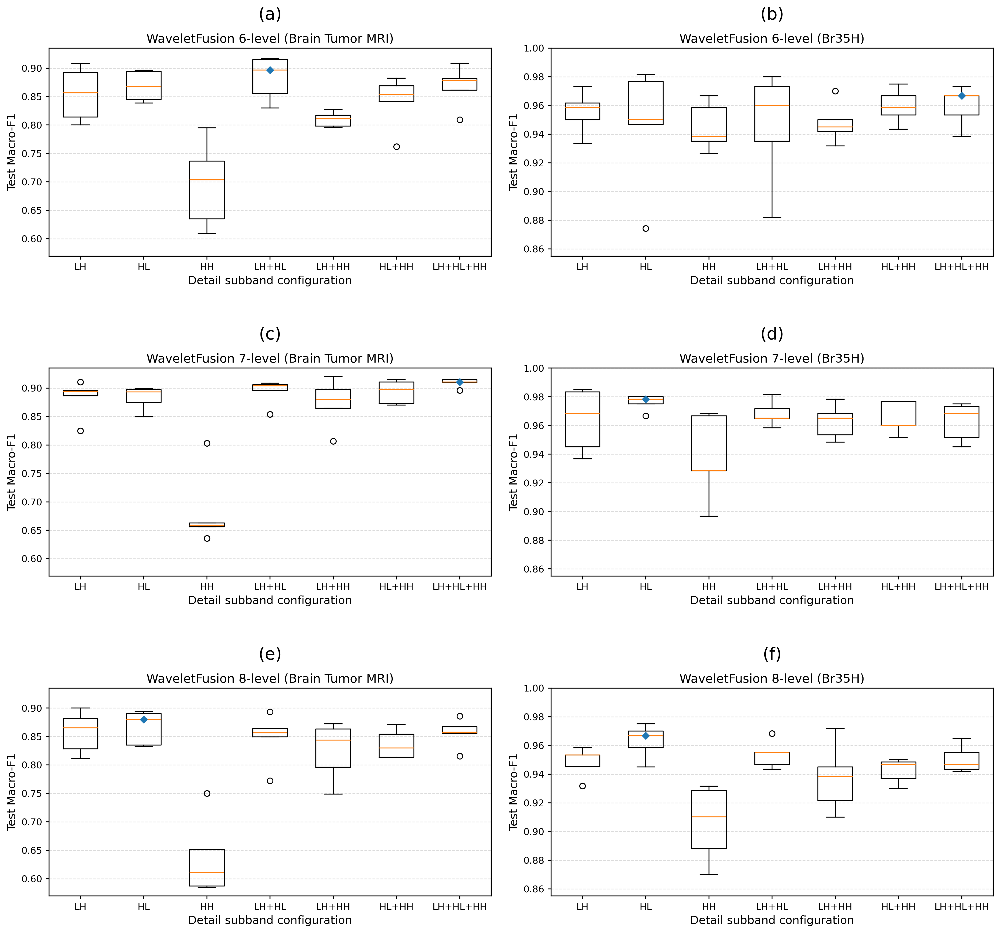


Saved all combined A3 outputs to: ./figures_ablation_A3_combined_2026


In [30]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Brain Tumor MRI
L6_LONG_MRI = os.path.join("histories_ablation_A3_L6_2026", "A3_L6_ALL_configs_ALL_seeds_long.csv")
L7_LONG_MRI = os.path.join("histories_ablation_A3_L7_2026", "A3_L7_ALL_configs_ALL_seeds_long.csv")
L8_LONG_MRI = os.path.join("histories_ablation_A3_2026",    "A3_ALL_configs_ALL_seeds_long.csv")

# Br35H
L6_LONG_BR35H = os.path.join("histories_ablation_A3_L6_br35h_2026", "A3_L6_br35h_ALL_configs_ALL_seeds_long.csv")
L7_LONG_BR35H = os.path.join("histories_ablation_A3_L7_br35h_2026", "A3_L7_br35h_ALL_configs_ALL_seeds_long.csv")
L8_LONG_BR35H = os.path.join("histories_ablation_A3_br35h_2026",    "A3_br35h_ALL_configs_ALL_seeds_long.csv")

OUT_DIR = "./figures_ablation_A3_combined_2026"
os.makedirs(OUT_DIR, exist_ok=True)


ORDER = ["LH_only", "HL_only", "HH_only", "LH_HL", "LH_HH", "HL_HH", "LH_HL_HH"]
LABEL_MAP = {
    "LH_only": "LH",
    "HL_only": "HL",
    "HH_only": "HH",
    "LH_HL": "LH+HL",
    "LH_HH": "LH+HH",
    "HL_HH": "HL+HH",
    "LH_HL_HH": "LH+HL+HH",
}

EXPORT_DPI = 600
SAVE_PDF = True
SAVE_SVG = True


plt.rcParams.update({
    "figure.facecolor": "white",
    "axes.facecolor": "white",

    "font.size": 14,
    "axes.titlesize": 13,
    "axes.labelsize": 12,
    "xtick.labelsize": 10,
    "ytick.labelsize": 10,

    "axes.linewidth": 1.0,
    "xtick.major.width": 1.0,
    "ytick.major.width": 1.0,

    # Better text in vector files
    "pdf.fonttype": 42,
    "ps.fonttype": 42,
    "svg.fonttype": "none",
})


def load_long(path: str) -> pd.DataFrame:
    if not os.path.exists(path):
        raise FileNotFoundError(f"Missing file: {path}")

    df = pd.read_csv(path)

    required = ["Config", "RUN_SEED", "Test Macro-F1", "Test Acc"]
    missing = [c for c in required if c not in df.columns]
    if missing:
        raise ValueError(f"{path}: missing columns {missing}. Available columns: {list(df.columns)}")

    df = df.copy()
    df["Config"] = df["Config"].astype(str).str.strip()
    df = df[df["Config"].isin(ORDER)].copy()

    df["Test Macro-F1"] = pd.to_numeric(df["Test Macro-F1"], errors="coerce")
    df["Test Acc"] = pd.to_numeric(df["Test Acc"], errors="coerce")
    df = df.dropna(subset=["Test Macro-F1", "Test Acc"]).copy()

    df["Config"] = pd.Categorical(df["Config"], categories=ORDER, ordered=True)
    df = df.sort_values(["Config", "RUN_SEED"]).reset_index(drop=True)

    if df.empty:
        raise ValueError(f"{path}: no usable rows after filtering configs and parsing values.")

    return df

def compute_global_ylim(df_list, column="Test Macro-F1", pad=0.015):
    all_vals = np.concatenate([d[column].values.astype(float) for d in df_list])
    ymin = float(np.min(all_vals))
    ymax = float(np.max(all_vals))
    ymin = max(0.0, ymin - pad)
    ymax = min(1.0, ymax + pad)
    return ymin, ymax

def summarize_long(df, depth_label, dataset_label):
    rows = []
    for cfg in ORDER:
        sub = df.loc[df["Config"] == cfg]
        f1_vals = sub["Test Macro-F1"].values.astype(float)
        acc_vals = sub["Test Acc"].values.astype(float)

        rows.append({
            "Dataset": dataset_label,
            "Depth": depth_label,
            "Config": cfg,
            "Label": LABEL_MAP[cfg],
            "Test Accuracy Mean": np.mean(acc_vals),
            "Test Accuracy Std": np.std(acc_vals, ddof=1),
            "Test Macro-F1 Mean": np.mean(f1_vals),
            "Test Macro-F1 Std": np.std(f1_vals, ddof=1),
        })

    return pd.DataFrame(rows)

def save_figure(fig, base_path):
    png_path = base_path + ".png"
    fig.savefig(png_path, dpi=EXPORT_DPI, bbox_inches="tight", facecolor="white")
    print("[Saved]", png_path)

    if SAVE_PDF:
        pdf_path = base_path + ".pdf"
        fig.savefig(pdf_path, bbox_inches="tight", facecolor="white")
        print("[Saved]", pdf_path)

    if SAVE_SVG:
        svg_path = base_path + ".svg"
        fig.savefig(svg_path, bbox_inches="tight", facecolor="white")
        print("[Saved]", svg_path)

def add_boxplot_panel(ax, df, subplot_title, panel_label, ylim=None):
    data = []
    tick_labels = []

    for cfg in ORDER:
        vals = df.loc[df["Config"] == cfg, "Test Macro-F1"].values.astype(float)
        data.append(vals)
        tick_labels.append(LABEL_MAP[cfg])

    bp = ax.boxplot(
        data,
        labels=tick_labels,
        patch_artist=False,
        showfliers=True,
        widths=0.55,
        whis=1.5
    )

    ax.set_title(subplot_title, pad=6)
    ax.set_xlabel("Detail subband configuration")
    ax.set_ylabel("Test Macro-F1")
    ax.grid(axis="y", linestyle="--", alpha=0.45)

    if ylim is not None:
        ax.set_ylim(*ylim)

    medians = [np.median(d) if len(d) else np.nan for d in data]
    best_idx = int(np.nanargmax(medians))
    ax.scatter(
        best_idx + 1,
        medians[best_idx],
        marker="D",
        s=26,
        zorder=3
    )

    # panel label above subplot
    ax.text(
        0.5, 1.12, panel_label,
        transform=ax.transAxes,
        ha="center", va="bottom",
        fontsize=18
    )

def make_publication_table(sum_l6, sum_l7, sum_l8, out_csv_path):
    pub_rows = []
    for cfg in ORDER:
        r6 = sum_l6[sum_l6["Config"] == cfg].iloc[0]
        r7 = sum_l7[sum_l7["Config"] == cfg].iloc[0]
        r8 = sum_l8[sum_l8["Config"] == cfg].iloc[0]

        pub_rows.append({
            "Subband Configuration": LABEL_MAP[cfg],
            "L6 Test Accuracy": f'{r6["Test Accuracy Mean"]:.2f} ± {r6["Test Accuracy Std"]:.2f}',
            "L6 Macro-F1": f'{r6["Test Macro-F1 Mean"]:.2f} ± {r6["Test Macro-F1 Std"]:.2f}',
            "L7 Test Accuracy": f'{r7["Test Accuracy Mean"]:.2f} ± {r7["Test Accuracy Std"]:.2f}',
            "L7 Macro-F1": f'{r7["Test Macro-F1 Mean"]:.2f} ± {r7["Test Macro-F1 Std"]:.2f}',
            "L8 Test Accuracy": f'{r8["Test Accuracy Mean"]:.2f} ± {r8["Test Accuracy Std"]:.2f}',
            "L8 Test Macro-F1": f'{r8["Test Macro-F1 Mean"]:.2f} ± {r8["Test Macro-F1 Std"]:.2f}',
        })

    pub_df = pd.DataFrame(pub_rows)
    pub_df.to_csv(out_csv_path, index=False)
    print(f"[Saved] {out_csv_path}")
    return pub_df

# Load all data
df_l6_mri = load_long(L6_LONG_MRI)
df_l7_mri = load_long(L7_LONG_MRI)
df_l8_mri = load_long(L8_LONG_MRI)

# Br35H
df_l6_br35h = load_long(L6_LONG_BR35H)
df_l7_br35h = load_long(L7_LONG_BR35H)
df_l8_br35h = load_long(L8_LONG_BR35H)

# Summaries
sum_l6_mri = summarize_long(df_l6_mri, "L6", "Brain Tumor MRI")
sum_l7_mri = summarize_long(df_l7_mri, "L7", "Brain Tumor MRI")
sum_l8_mri = summarize_long(df_l8_mri, "L8", "Brain Tumor MRI")

sum_l6_br35h = summarize_long(df_l6_br35h, "L6", "Br35H")
sum_l7_br35h = summarize_long(df_l7_br35h, "L7", "Br35H")
sum_l8_br35h = summarize_long(df_l8_br35h, "L8", "Br35H")

combined_summary = pd.concat([
    sum_l6_mri, sum_l7_mri, sum_l8_mri,
    sum_l6_br35h, sum_l7_br35h, sum_l8_br35h
], ignore_index=True)

summary_csv = os.path.join(OUT_DIR, "A3_combined_subband_summary.csv")
combined_summary.to_csv(summary_csv, index=False)
print(f"[Saved] {summary_csv}")

# publication-style tables
pub_mri_csv = os.path.join(OUT_DIR, "A3_publication_table_brain_tumor_mri.csv")
pub_br35h_csv = os.path.join(OUT_DIR, "A3_publication_table_br35h.csv")

pub_mri = make_publication_table(sum_l6_mri, sum_l7_mri, sum_l8_mri, pub_mri_csv)
pub_br35h = make_publication_table(sum_l6_br35h, sum_l7_br35h, sum_l8_br35h, pub_br35h_csv)

print("\nPublication-style A3 table (Brain Tumor MRI):")
print(pub_mri.to_string(index=False))

print("\nPublication-style A3 table (Br35H):")
print(pub_br35h.to_string(index=False))

# Shared y-limits per dataset column
ylim_mri = compute_global_ylim([df_l6_mri, df_l7_mri, df_l8_mri], column="Test Macro-F1", pad=0.015)
ylim_br35h = compute_global_ylim([df_l6_br35h, df_l7_br35h, df_l8_br35h], column="Test Macro-F1", pad=0.015)

print("Shared y-limits (Brain Tumor MRI):", ylim_mri)
print("Shared y-limits (Br35H):", ylim_br35h)

# Combined figure (3 rows × 2 columns)
fig, axes = plt.subplots(3, 2, figsize=(15, 14))

# Row 1
add_boxplot_panel(
    axes[0, 0],
    df_l6_mri,
    subplot_title="WaveletFusion 6-level (Brain Tumor MRI)",
    panel_label="(a)",
    ylim=ylim_mri
)
add_boxplot_panel(
    axes[0, 1],
    df_l6_br35h,
    subplot_title="WaveletFusion 6-level (Br35H)",
    panel_label="(b)",
    ylim=ylim_br35h
)

# Row 2
add_boxplot_panel(
    axes[1, 0],
    df_l7_mri,
    subplot_title="WaveletFusion 7-level (Brain Tumor MRI)",
    panel_label="(c)",
    ylim=ylim_mri
)
add_boxplot_panel(
    axes[1, 1],
    df_l7_br35h,
    subplot_title="WaveletFusion 7-level (Br35H)",
    panel_label="(d)",
    ylim=ylim_br35h
)

# Row 3
add_boxplot_panel(
    axes[2, 0],
    df_l8_mri,
    subplot_title="WaveletFusion 8-level (Brain Tumor MRI)",
    panel_label="(e)",
    ylim=ylim_mri
)
add_boxplot_panel(
    axes[2, 1],
    df_l8_br35h,
    subplot_title="WaveletFusion 8-level (Br35H)",
    panel_label="(f)",
    ylim=ylim_br35h
)

plt.tight_layout(h_pad=3.0, w_pad=1.2)

# Save combined figure
combined_base = os.path.join(OUT_DIR, "A3_combined_subband_boxplots")
save_figure(fig, combined_base)

plt.show()
plt.close(fig)

print(f"\nSaved all combined A3 outputs to: {OUT_DIR}")

# level group: Brain Tumor MRI - WaveletFusion 8-level

In [31]:
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"
os.environ["TF_ENABLE_LAYOUT_OPTIMIZER"] = "0"

import time, gc
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd

from tensorflow.keras import layers, models, callbacks, regularizers
from tensorflow.keras import mixed_precision
from sklearn.metrics import classification_report, confusion_matrix, f1_score

mixed_precision.set_global_policy("float32")

# -------------------- Config --------------------
TRAIN_DIR = "./Training2026"
TEST_DIR  = "./Testing2026"

IMG_SIZE  = 256
BATCH     = 32
AUTOTUNE  = tf.data.AUTOTUNE
EPOCHS    = 30

N_LEVELS  = 8
HEAD_MODE = "multilevel_details"
PROJ_DIM  = 16

RUN_SEEDS = [42, 43, 44, 45, 46]

MAX_PARAMS = 311700
L2_STRENGTH = 2e-4

A2_CONFIGS = [
    ("Fine_L1_2",   [1, 2]),
    ("Mid_L3_5",    [3, 4, 5]),
    ("Coarse_L6_8", [6, 7, 8]),
    ("All_L1_8",    [1, 2, 3, 4, 5, 6, 7, 8]),
]

HIST_DIR = "./histories_ablation_A2_2026"
FIG_DIR  = "./figures_ablation_A2_2026"
os.makedirs(HIST_DIR, exist_ok=True)
os.makedirs(FIG_DIR, exist_ok=True)

if IMG_SIZE % (2 ** N_LEVELS) != 0:
    raise ValueError(f"IMG_SIZE={IMG_SIZE} must be divisible by 2^{N_LEVELS} for {N_LEVELS}-level decomposition.")

# -------------------- Preprocessing --------------------
def per_image_standardize_batch(x):
    out_dtype = x.dtype
    x32 = tf.cast(x, tf.float32)
    y32 = tf.map_fn(tf.image.per_image_standardization, x32, fn_output_signature=tf.float32)
    return tf.cast(y32, out_dtype)

def cfg(ds, shuffle=False, seed=0):
    ds = ds.cache()
    if shuffle:
        ds = ds.shuffle(1000, seed=seed, reshuffle_each_iteration=True)
    return ds.prefetch(AUTOTUNE)

def count_images(ds):
    n = 0
    for xb, _ in ds:
        n += int(xb.shape[0])
    return n

def y_true_from_ds(ds):
    ys = []
    for _, y in ds:
        ys.append(y.numpy())
    return np.argmax(np.vstack(ys), axis=1)

# -------------------- Plot / Save helpers --------------------
def save_confusion_matrix_png(cm, class_names, title, out_path):
    plt.rcParams.update({"font.size": 12})
    vmax = cm.max() if cm.max() > 0 else 1
    fig, ax = plt.subplots(figsize=(7.2, 6.2))
    im = ax.imshow(cm, interpolation="nearest", cmap=plt.cm.Blues, vmin=0, vmax=vmax)
    cbar = plt.colorbar(im, ax=ax)
    cbar.ax.set_ylabel("Number of samples")

    ticks = np.arange(len(class_names))
    ax.set_xticks(ticks); ax.set_yticks(ticks)
    ax.set_xticklabels(class_names, rotation=45, ha="right")
    ax.set_yticklabels(class_names)
    ax.set_ylabel("True label"); ax.set_xlabel("Predicted label"); ax.set_title(title)

    thresh = vmax / 2.0
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, str(cm[i, j]), ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)

def specificity_from_cm(cm: np.ndarray):
    spec = []
    total = cm.sum()
    for i in range(cm.shape[0]):
        tp = cm[i, i]
        fn = cm[i, :].sum() - tp
        fp = cm[:, i].sum() - tp
        tn = total - tp - fn - fp
        spec.append(float(tn / (tn + fp + 1e-12)))
    return spec

def per_class_table(report_dict, cm, class_names):
    spec = specificity_from_cm(cm)
    rows = []
    for idx, cls in enumerate(class_names):
        d = report_dict.get(cls, {})
        rows.append({
            "class": cls,
            "precision": float(d.get("precision", np.nan)),
            "recall(sensitivity)": float(d.get("recall", np.nan)),
            "specificity": spec[idx],
            "f1_score": float(d.get("f1-score", np.nan)),
            "support": int(d.get("support", 0)),
        })
    return pd.DataFrame(rows)

# -------------------- Blocks --------------------
def conv_block(x, filters, sd_rate=0.0, name_prefix="blk"):
    x = layers.Conv2D(filters, 3, padding="same", use_bias=False,
                      kernel_regularizer=regularizers.l2(L2_STRENGTH),
                      name=f"{name_prefix}_conv1")(x)
    x = layers.BatchNormalization(name=f"{name_prefix}_bn1")(x)
    x = layers.ReLU(name=f"{name_prefix}_relu1")(x)

    x = layers.Conv2D(filters, 3, padding="same", use_bias=False,
                      kernel_regularizer=regularizers.l2(L2_STRENGTH),
                      name=f"{name_prefix}_conv2")(x)
    x = layers.BatchNormalization(name=f"{name_prefix}_bn2")(x)
    x = layers.ReLU(name=f"{name_prefix}_relu2")(x)

    if sd_rate > 0:
        x = layers.SpatialDropout2D(sd_rate, name=f"{name_prefix}_spdrop")(x)
    return x

class HaarWavelet2D(layers.Layer):
    def build(self, input_shape):
        if int(input_shape[-1]) != 1:
            raise ValueError(f"HaarWavelet2D expects single-channel input, got {input_shape[-1]}.")

        ll = np.array([[0.5,  0.5],[0.5,  0.5]], dtype="float32")
        lh = np.array([[ 0.5,  0.5],[-0.5, -0.5]], dtype="float32")
        hl = np.array([[ 0.5, -0.5],[ 0.5, -0.5]], dtype="float32")
        hh = np.array([[ 0.5, -0.5],[-0.5,  0.5]], dtype="float32")

        k = np.stack([ll, lh, hl, hh], axis=-1).reshape((2, 2, 1, 4))
        self.kernel = tf.constant(k, dtype=tf.float32)
        super().build(input_shape)

    def call(self, inputs):
        x = tf.cast(inputs, tf.float32)
        y = tf.nn.conv2d(x, self.kernel, strides=[1, 2, 2, 1], padding="SAME")
        ll, lh, hl, hh = tf.split(y, 4, axis=-1)
        return ll, lh, hl, hh

def build_wavelet_model(num_classes: int, run_seed: int, selected_levels: list[int]):
    augment = tf.keras.Sequential([
        layers.RandomFlip("horizontal", seed=run_seed),
        layers.RandomRotation(0.05, seed=run_seed + 1),
        layers.RandomZoom(0.1, seed=run_seed + 2),
        layers.RandomContrast(0.1, seed=run_seed + 3),
        layers.RandomTranslation(0.03, 0.03, seed=run_seed + 4),
    ], name="augment")

    rescale = layers.Rescaling(1./255, name="rescale")
    standardize = layers.Lambda(per_image_standardize_batch, name="per_image_standardization")

    DETAIL_F = [12, 8, 8, 6, 6, 4, 4, 4]
    APPROX_F = [4, 4, 4, 4, 4, 4, 4, 4]
    BB_F     = [28, 44, 44, 44, 44, 44, 44, 44]
    SD_D     = [0.10, 0.08, 0.08, 0.06, 0.06, 0.05, 0.05, 0.05]
    SD_B     = [0.10, 0.12, 0.12, 0.10, 0.10, 0.08, 0.08, 0.08]

    inputs = layers.Input((IMG_SIZE, IMG_SIZE, 1), name="input_image")
    x = augment(inputs)
    x = rescale(x)
    x = standardize(x)
    x = layers.GaussianNoise(0.02, name="gaussian_noise")(x)

    ll_in = x
    prev_pooled = None
    detail_level_vecs = []

    for level in range(1, N_LEVELS + 1):
        LL, LH, HL, HH = HaarWavelet2D(name=f"haar_L{level}")(ll_in)

        D = layers.Concatenate(name=f"details_L{level}")([LH, HL, HH])
        W = conv_block(D, DETAIL_F[level-1], sd_rate=SD_D[level-1], name_prefix=f"L{level}_Detail")
        A = conv_block(LL, APPROX_F[level-1], sd_rate=0.0, name_prefix=f"L{level}_Approx")

        m = 1.0 if level in selected_levels else 0.0
        W = layers.Lambda(lambda t, m=m: t * m, name=f"maskW_L{level}")(W)
        A = layers.Lambda(lambda t, m=m: t * m, name=f"maskA_L{level}")(A)

        if prev_pooled is None:
            S = layers.Concatenate(name=f"fusion_L{level}")([W, A])
        else:
            S = layers.Concatenate(name=f"fusion_L{level}")([prev_pooled, W, A])

        B = conv_block(S, BB_F[level-1], sd_rate=SD_B[level-1], name_prefix=f"backbone_block{level}")

        w_gap  = layers.GlobalAveragePooling2D(name=f"gap_detail_L{level}")(W)
        w_proj = layers.Dense(PROJ_DIM, activation="relu", use_bias=False, name=f"proj_detail_L{level}")(w_gap)
        detail_level_vecs.append(w_proj)

        if level < N_LEVELS:
            prev_pooled = layers.MaxPooling2D(name=f"backbone_pool{level}")(B)
            ll_in = LL
        else:
            B_final = B

    deep_vec = layers.GlobalAveragePooling2D(name="gap_deepest_backbone")(B_final)

    feat = layers.Concatenate(name="multilevel_details_concat")([deep_vec] + detail_level_vecs)

    feat = layers.Dropout(0.5, name="head_dropout1")(feat)
    feat = layers.Dense(128, activation="relu",
                        kernel_regularizer=regularizers.l2(L2_STRENGTH),
                        name="head_dense_128")(feat)
    feat = layers.Dropout(0.35, name="head_dropout2")(feat)
    outputs = layers.Dense(num_classes, activation="softmax", name="predictions")(feat)

    return models.Model(inputs, outputs, name="WF8_A2_ScaleMask")

all_rows = []
class_names_ref = None

for cfg_name, selected_levels in A2_CONFIGS:
    print(f"\n================= A2 CONFIG: {cfg_name} | levels={selected_levels} =================")

    for run_seed in RUN_SEEDS:
        split_seed = run_seed
        print(f"\n--- RUN_SEED={run_seed} | SPLIT_SEED={split_seed} ---")

        tf.keras.backend.clear_session()
        gc.collect()
        tf.keras.utils.set_random_seed(run_seed)

        train_ds_raw = tf.keras.preprocessing.image_dataset_from_directory(
            TRAIN_DIR, labels="inferred", label_mode="categorical",
            color_mode="grayscale", image_size=(IMG_SIZE, IMG_SIZE),
            batch_size=BATCH, validation_split=0.2, subset="training", seed=split_seed,
            interpolation="bilinear", crop_to_aspect_ratio=True)

        val_ds_raw = tf.keras.preprocessing.image_dataset_from_directory(
            TRAIN_DIR, labels="inferred", label_mode="categorical",
            color_mode="grayscale", image_size=(IMG_SIZE, IMG_SIZE),
            batch_size=BATCH, validation_split=0.2, subset="validation", seed=split_seed,
            interpolation="bilinear", crop_to_aspect_ratio=True)

        test_ds_raw = tf.keras.preprocessing.image_dataset_from_directory(
            TEST_DIR, labels="inferred", label_mode="categorical",
            color_mode="grayscale", image_size=(IMG_SIZE, IMG_SIZE),
            batch_size=BATCH, shuffle=False,
            interpolation="bilinear", crop_to_aspect_ratio=True)

        class_names = train_ds_raw.class_names
        num_classes = len(class_names)

        if class_names_ref is None:
            class_names_ref = class_names
            np.save(os.path.join(HIST_DIR, "class_names.npy"), np.array(class_names, dtype=object))
        elif class_names != class_names_ref:
            print("[WARN] class_names order changed across runs. Check folder ordering.")

        train_ds      = cfg(train_ds_raw, shuffle=True,  seed=run_seed)
        train_eval_ds = cfg(train_ds_raw, shuffle=False, seed=run_seed)
        val_ds        = cfg(val_ds_raw,   shuffle=False, seed=run_seed)
        test_ds       = cfg(test_ds_raw,  shuffle=False, seed=run_seed)

        model = build_wavelet_model(num_classes, run_seed, selected_levels=selected_levels)
        params = int(model.count_params())
        print("Parameters:", params)
        if params > MAX_PARAMS:
            raise RuntimeError(f"Params {params} exceed MAX_PARAMS={MAX_PARAMS}.")

        loss_fn = tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.05)
        model.compile(optimizer=tf.keras.optimizers.Adam(3e-4), loss=loss_fn, metrics=["accuracy"])

        class EpochTimer(callbacks.Callback):
            def on_train_begin(self, logs=None): self.epoch_times = []
            def on_epoch_begin(self, epoch, logs=None): self._t0 = time.time()
            def on_epoch_end(self, epoch, logs=None): self.epoch_times.append(time.time() - self._t0)

        epoch_timer = EpochTimer()
        cbs = [
            callbacks.EarlyStopping(patience=6, restore_best_weights=True, monitor="val_loss"),
            callbacks.ReduceLROnPlateau(patience=3, factor=0.5, monitor="val_loss"),
            epoch_timer,
        ]

        t0 = time.time()
        hist = model.fit(train_ds, validation_data=val_ds, epochs=EPOCHS, callbacks=cbs, verbose=1)
        total_train_time = time.time() - t0

        # Save history
        hist_path = os.path.join(HIST_DIR, f"A2_{cfg_name}_history_seed{run_seed}.csv")
        pd.DataFrame(hist.history).to_csv(hist_path, index_label="epoch")

        # Train FPS
        num_train_images = count_images(train_eval_ds)
        avg_epoch_time = float(np.mean(epoch_timer.epoch_times)) if epoch_timer.epoch_times else float("nan")
        train_fps = num_train_images / avg_epoch_time if avg_epoch_time > 0 else float("nan")

        # ---- VALIDATION ----
        val_probs = model.predict(val_ds, verbose=0)
        y_pred_val = np.argmax(val_probs, axis=1)
        y_true_val = y_true_from_ds(val_ds)
        val_loss, val_acc = model.evaluate(val_ds, verbose=0)
        val_macro_f1 = float(f1_score(y_true_val, y_pred_val, average="macro"))

        cm_val = confusion_matrix(y_true_val, y_pred_val)
        np.save(os.path.join(HIST_DIR, f"A2_{cfg_name}_cm_val_seed{run_seed}.npy"), cm_val)
        save_confusion_matrix_png(cm_val, class_names,
            title=f"A2 {cfg_name} – Confusion Matrix (VAL) [seed={run_seed}]",
            out_path=os.path.join(FIG_DIR, f"A2_{cfg_name}_cm_val_seed{run_seed}.png"))

        rep_val_txt = classification_report(y_true_val, y_pred_val, target_names=class_names, digits=4)
        rep_val_dict = classification_report(y_true_val, y_pred_val, target_names=class_names, digits=4, output_dict=True)
        df_val_pc = per_class_table(rep_val_dict, cm_val, class_names)
        df_val_pc.to_csv(os.path.join(HIST_DIR, f"A2_{cfg_name}_perclass_val_seed{run_seed}.csv"), index=False)
        with open(os.path.join(HIST_DIR, f"A2_{cfg_name}_perclass_val_seed{run_seed}.txt"), "w", encoding="utf-8") as f:
            f.write(df_val_pc.to_string(index=False))

        # ---- TEST ----
        test_probs = model.predict(test_ds, verbose=0)
        y_pred_test = np.argmax(test_probs, axis=1)
        y_true_test = y_true_from_ds(test_ds)
        test_loss, test_acc = model.evaluate(test_ds, verbose=0)
        test_macro_f1 = float(f1_score(y_true_test, y_pred_test, average="macro"))

        cm_test = confusion_matrix(y_true_test, y_pred_test)
        np.save(os.path.join(HIST_DIR, f"A2_{cfg_name}_cm_test_seed{run_seed}.npy"), cm_test)
        save_confusion_matrix_png(cm_test, class_names,
            title=f"A2 {cfg_name} – Confusion Matrix (TEST) [seed={run_seed}]",
            out_path=os.path.join(FIG_DIR, f"A2_{cfg_name}_cm_test_seed{run_seed}.png"))

        rep_test_txt = classification_report(y_true_test, y_pred_test, target_names=class_names, digits=4)
        rep_test_dict = classification_report(y_true_test, y_pred_test, target_names=class_names, digits=4, output_dict=True)
        df_test_pc = per_class_table(rep_test_dict, cm_test, class_names)
        df_test_pc.to_csv(os.path.join(HIST_DIR, f"A2_{cfg_name}_perclass_test_seed{run_seed}.csv"), index=False)
        with open(os.path.join(HIST_DIR, f"A2_{cfg_name}_perclass_test_seed{run_seed}.txt"), "w", encoding="utf-8") as f:
            f.write(df_test_pc.to_string(index=False))

        # Full report file (VAL + TEST)
        rpt_path = os.path.join(HIST_DIR, f"A2_{cfg_name}_report_seed{run_seed}.txt")
        with open(rpt_path, "w", encoding="utf-8") as f:
            f.write("=== Validation report ===\n")
            f.write(rep_val_txt)
            f.write("\n\n=== Test report ===\n")
            f.write(rep_test_txt)

        all_rows.append({
            "Ablation": "A2_scale",
            "Config": cfg_name,
            "SelectedLevels": str(selected_levels),
            "RUN_SEED": run_seed,
            "SPLIT_SEED": split_seed,
            "Val Loss": float(val_loss),
            "Val Acc": float(val_acc),
            "Val Macro-F1": float(val_macro_f1),
            "Test Loss": float(test_loss),
            "Test Acc": float(test_acc),
            "Test Macro-F1": float(test_macro_f1),
            "Train Time (s)": float(total_train_time),
            "Avg Epoch Time (s)": float(avg_epoch_time),
            "Train FPS (img/s)": float(train_fps),
            "Parameters": int(params),
            "HEAD_MODE": HEAD_MODE,
        })

        del model, train_ds_raw, val_ds_raw, test_ds_raw, train_ds, val_ds, test_ds, train_eval_ds
        gc.collect()

# -------------------- Save summary tables --------------------
df_all = pd.DataFrame(all_rows).sort_values(["Config", "RUN_SEED"]).reset_index(drop=True)
df_all.to_csv(os.path.join(HIST_DIR, "A2_ALL_configs_ALL_seeds_long.csv"), index=False)
print("[Saved]", os.path.join(HIST_DIR, "A2_ALL_configs_ALL_seeds_long.csv"))

def mean_std(x):
    x = np.asarray(x, dtype=np.float32)
    m = float(np.mean(x))
    s = float(np.std(x, ddof=1)) if len(x) > 1 else 0.0
    return m, s

master_rows = []
for cfg_name, _ in A2_CONFIGS:
    sub = df_all[df_all["Config"] == cfg_name]
    for metric in ["Val Loss","Val Acc","Val Macro-F1","Test Loss","Test Acc","Test Macro-F1"]:
        m, s = mean_std(sub[metric])
        master_rows.append({"Config": cfg_name, "Metric": metric, "Mean": m, "Std": s})

df_master = pd.DataFrame(master_rows)
df_master.to_csv(os.path.join(HIST_DIR, "A2_MASTER_mean_std_by_config.csv"), index=False)
print("[Saved]", os.path.join(HIST_DIR, "A2_MASTER_mean_std_by_config.csv"))


================= A2 CONFIG: Fine_L1_2 | levels=[1, 2] =================

--- RUN_SEED=42 | SPLIT_SEED=42 ---
Found 5600 files belonging to 4 classes.
Using 4480 files for training.
Found 5600 files belonging to 4 classes.
Using 1120 files for validation.
Found 1600 files belonging to 4 classes.
Parameters: 308840
Epoch 1/30


2026-05-01 16:44:16.651763: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - accuracy: 0.2662 - loss: 1.6481 - val_accuracy: 0.2464 - val_loss: 1.5333 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.3199 - loss: 1.5301 - val_accuracy: 0.3643 - val_loss: 1.4836 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.4138 - loss: 1.4069 - val_accuracy: 0.6152 - val_loss: 1.1626 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.5020 - loss: 1.2841 - val_accuracy: 0.7295 - val_loss: 0.9519 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.5652 - loss: 1.1844 - val_accuracy: 0.6571 - val_loss: 0.9523 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.5821 - loss: 1.1414 - val_accuracy: 0.7232 - val_loss: 0.8689 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.6

2026-05-01 16:51:31.899689: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - accuracy: 0.2673 - loss: 1.6755 - val_accuracy: 0.2455 - val_loss: 1.5399 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.3153 - loss: 1.5451 - val_accuracy: 0.2571 - val_loss: 1.5210 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.3968 - loss: 1.4375 - val_accuracy: 0.4393 - val_loss: 1.3711 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.4750 - loss: 1.3323 - val_accuracy: 0.6509 - val_loss: 1.0813 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.5231 - loss: 1.2356 - val_accuracy: 0.7152 - val_loss: 0.9325 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.5849 - loss: 1.1691 - val_accuracy: 0.7134 - val_loss: 0.8825 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.6

2026-05-01 16:58:46.067721: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.2707 - loss: 1.6814 - val_accuracy: 0.2500 - val_loss: 1.5386 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.3375 - loss: 1.5319 - val_accuracy: 0.2366 - val_loss: 1.5417 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.4119 - loss: 1.4375 - val_accuracy: 0.3161 - val_loss: 1.4385 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.4715 - loss: 1.3454 - val_accuracy: 0.6598 - val_loss: 1.0657 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.5479 - loss: 1.2154 - val_accuracy: 0.6893 - val_loss: 0.9484 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.5881 - loss: 1.1453 - val_accuracy: 0.6777 - val_loss: 0.9508 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.6

2026-05-01 17:06:03.101146: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - accuracy: 0.2585 - loss: 1.6666 - val_accuracy: 0.2321 - val_loss: 1.5483 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.3428 - loss: 1.5174 - val_accuracy: 0.2741 - val_loss: 1.6098 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.3700 - loss: 1.4746 - val_accuracy: 0.4973 - val_loss: 1.3508 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.4699 - loss: 1.3590 - val_accuracy: 0.6348 - val_loss: 1.1195 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.5544 - loss: 1.2131 - val_accuracy: 0.6973 - val_loss: 0.9207 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.6121 - loss: 1.1257 - val_accuracy: 0.7116 - val_loss: 0.8947 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.6

2026-05-01 17:13:21.143223: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - accuracy: 0.2672 - loss: 1.6567 - val_accuracy: 0.2384 - val_loss: 1.5389 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.3213 - loss: 1.5358 - val_accuracy: 0.2598 - val_loss: 1.5285 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.3790 - loss: 1.4326 - val_accuracy: 0.5455 - val_loss: 1.2569 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.4681 - loss: 1.3219 - val_accuracy: 0.6687 - val_loss: 1.0369 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.5362 - loss: 1.2357 - val_accuracy: 0.7045 - val_loss: 0.9553 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.5840 - loss: 1.1455 - val_accuracy: 0.7268 - val_loss: 0.8750 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 

2026-05-01 17:20:51.392550: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - accuracy: 0.2671 - loss: 1.6514 - val_accuracy: 0.3554 - val_loss: 1.5085 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.3367 - loss: 1.4900 - val_accuracy: 0.4482 - val_loss: 1.3479 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.4522 - loss: 1.3350 - val_accuracy: 0.6321 - val_loss: 1.0499 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.5174 - loss: 1.2151 - val_accuracy: 0.6804 - val_loss: 0.9265 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.5831 - loss: 1.1210 - val_accuracy: 0.7054 - val_loss: 0.8727 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.5738 - loss: 1.0938 - val_accuracy: 0.7286 - val_loss: 0.8417 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.

2026-05-01 17:28:18.528720: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - accuracy: 0.2617 - loss: 1.6944 - val_accuracy: 0.3384 - val_loss: 1.5131 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.3174 - loss: 1.5128 - val_accuracy: 0.4866 - val_loss: 1.4145 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.4116 - loss: 1.4012 - val_accuracy: 0.5652 - val_loss: 1.1619 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.4743 - loss: 1.2899 - val_accuracy: 0.6143 - val_loss: 1.0301 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.5301 - loss: 1.2025 - val_accuracy: 0.6589 - val_loss: 0.9459 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.5610 - loss: 1.1413 - val_accuracy: 0.6946 - val_loss: 0.8761 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.5

2026-05-01 17:35:45.035749: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - accuracy: 0.2705 - loss: 1.6670 - val_accuracy: 0.2366 - val_loss: 1.5248 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.3700 - loss: 1.4690 - val_accuracy: 0.4420 - val_loss: 1.3618 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.4949 - loss: 1.2896 - val_accuracy: 0.6330 - val_loss: 1.0464 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.5480 - loss: 1.1752 - val_accuracy: 0.6750 - val_loss: 0.9446 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.5829 - loss: 1.1159 - val_accuracy: 0.6500 - val_loss: 0.9702 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.6068 - loss: 1.0626 - val_accuracy: 0.6964 - val_loss: 0.8718 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.

2026-05-01 17:43:07.443038: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 32s 79ms/step - accuracy: 0.2690 - loss: 1.6807 - val_accuracy: 0.2330 - val_loss: 1.5252 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.3135 - loss: 1.5144 - val_accuracy: 0.4446 - val_loss: 1.3832 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.4251 - loss: 1.3796 - val_accuracy: 0.6420 - val_loss: 1.0915 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.5188 - loss: 1.2058 - val_accuracy: 0.6062 - val_loss: 0.9876 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.5768 - loss: 1.1173 - val_accuracy: 0.6768 - val_loss: 0.9241 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.6011 - loss: 1.0568 - val_accuracy: 0.6902 - val_loss: 0.8702 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.6

2026-05-01 17:50:33.840448: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.2601 - loss: 1.6679 - val_accuracy: 0.3438 - val_loss: 1.5131 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.3020 - loss: 1.5248 - val_accuracy: 0.5036 - val_loss: 1.4463 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.3711 - loss: 1.4049 - val_accuracy: 0.5259 - val_loss: 1.2160 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.4479 - loss: 1.3110 - val_accuracy: 0.6054 - val_loss: 1.0694 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.5221 - loss: 1.2088 - val_accuracy: 0.6554 - val_loss: 0.9521 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.5523 - loss: 1.1456 - val_accuracy: 0.7036 - val_loss: 0.8805 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.5

2026-05-01 17:59:24.105379: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 32s 80ms/step - accuracy: 0.2766 - loss: 1.6289 - val_accuracy: 0.3295 - val_loss: 1.4617 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.3625 - loss: 1.4173 - val_accuracy: 0.4929 - val_loss: 1.3362 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.4171 - loss: 1.3355 - val_accuracy: 0.5696 - val_loss: 1.1749 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.4486 - loss: 1.2768 - val_accuracy: 0.6009 - val_loss: 1.0776 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.5026 - loss: 1.2121 - val_accuracy: 0.5893 - val_loss: 1.0367 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.5056 - loss: 1.1924 - val_accuracy: 0.6241 - val_loss: 1.0040 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 

2026-05-01 18:06:57.467739: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.3077 - loss: 1.6254 - val_accuracy: 0.3580 - val_loss: 1.4551 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.3743 - loss: 1.4184 - val_accuracy: 0.4670 - val_loss: 1.3101 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.4260 - loss: 1.3181 - val_accuracy: 0.5518 - val_loss: 1.1630 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.4453 - loss: 1.2863 - val_accuracy: 0.5884 - val_loss: 1.0779 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.4809 - loss: 1.2280 - val_accuracy: 0.5688 - val_loss: 1.0671 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.5038 - loss: 1.2132 - val_accuracy: 0.5446 - val_loss: 1.0599 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.

2026-05-01 18:14:22.661548: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.2741 - loss: 1.6524 - val_accuracy: 0.3330 - val_loss: 1.4685 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.3826 - loss: 1.4205 - val_accuracy: 0.3607 - val_loss: 1.3905 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.4191 - loss: 1.3353 - val_accuracy: 0.5482 - val_loss: 1.1632 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.4764 - loss: 1.2648 - val_accuracy: 0.5866 - val_loss: 1.0989 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.5015 - loss: 1.2271 - val_accuracy: 0.6420 - val_loss: 1.0067 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.5238 - loss: 1.1847 - val_accuracy: 0.6562 - val_loss: 0.9648 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.5

2026-05-01 18:21:48.344440: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - accuracy: 0.2720 - loss: 1.6533 - val_accuracy: 0.2330 - val_loss: 1.4750 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.3418 - loss: 1.4350 - val_accuracy: 0.4098 - val_loss: 1.3771 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.3897 - loss: 1.3635 - val_accuracy: 0.5018 - val_loss: 1.2236 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.4598 - loss: 1.2674 - val_accuracy: 0.5714 - val_loss: 1.1224 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.4816 - loss: 1.2464 - val_accuracy: 0.6080 - val_loss: 1.0444 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.5115 - loss: 1.1839 - val_accuracy: 0.5893 - val_loss: 1.0576 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.

2026-05-01 18:29:19.070566: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.2713 - loss: 1.6465 - val_accuracy: 0.2982 - val_loss: 1.4671 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.3481 - loss: 1.4323 - val_accuracy: 0.4741 - val_loss: 1.3697 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.3947 - loss: 1.3480 - val_accuracy: 0.5080 - val_loss: 1.2505 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4196 - loss: 1.3146 - val_accuracy: 0.5634 - val_loss: 1.1391 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4613 - loss: 1.2631 - val_accuracy: 0.5955 - val_loss: 1.0510 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.4995 - loss: 1.1968 - val_accuracy: 0.6250 - val_loss: 1.0004 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy

2026-05-01 18:36:55.235254: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - accuracy: 0.2650 - loss: 1.6665 - val_accuracy: 0.3179 - val_loss: 1.5306 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.3536 - loss: 1.5202 - val_accuracy: 0.4277 - val_loss: 1.4063 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.4346 - loss: 1.3964 - val_accuracy: 0.6866 - val_loss: 1.1090 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.5399 - loss: 1.2499 - val_accuracy: 0.7027 - val_loss: 0.9204 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - accuracy: 0.5892 - loss: 1.1648 - val_accuracy: 0.7393 - val_loss: 0.8845 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.6133 - loss: 1.1274 - val_accuracy: 0.6973 - val_loss: 0.9398 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accurac

2026-05-01 18:44:39.604733: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - accuracy: 0.2724 - loss: 1.6954 - val_accuracy: 0.4214 - val_loss: 1.5391 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.3511 - loss: 1.5315 - val_accuracy: 0.3795 - val_loss: 1.4799 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.4500 - loss: 1.4050 - val_accuracy: 0.6411 - val_loss: 1.1885 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.5039 - loss: 1.3114 - val_accuracy: 0.7268 - val_loss: 0.9883 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.5799 - loss: 1.1967 - val_accuracy: 0.6911 - val_loss: 0.9973 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.6329 - loss: 1.1261 - val_accuracy: 0.7214 - val_loss: 0.9019 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.6

2026-05-01 18:52:12.006541: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - accuracy: 0.2609 - loss: 1.7085 - val_accuracy: 0.2848 - val_loss: 1.5502 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.3529 - loss: 1.5442 - val_accuracy: 0.5723 - val_loss: 1.4594 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.4523 - loss: 1.3865 - val_accuracy: 0.6045 - val_loss: 1.1335 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.5439 - loss: 1.2646 - val_accuracy: 0.7170 - val_loss: 0.9516 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.6002 - loss: 1.1515 - val_accuracy: 0.7277 - val_loss: 0.9252 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.6576 - loss: 1.0736 - val_accuracy: 0.7491 - val_loss: 0.8751 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.6

2026-05-01 18:59:42.614393: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 32s 82ms/step - accuracy: 0.2652 - loss: 1.6791 - val_accuracy: 0.2464 - val_loss: 1.5619 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.3530 - loss: 1.5201 - val_accuracy: 0.3509 - val_loss: 1.5580 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.4507 - loss: 1.4087 - val_accuracy: 0.6598 - val_loss: 1.1011 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.5648 - loss: 1.2483 - val_accuracy: 0.6625 - val_loss: 1.0319 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.5922 - loss: 1.1689 - val_accuracy: 0.6964 - val_loss: 0.9577 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.6387 - loss: 1.0844 - val_accuracy: 0.7071 - val_loss: 0.9438 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0

2026-05-01 19:07:18.044870: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 33s 81ms/step - accuracy: 0.2782 - loss: 1.6940 - val_accuracy: 0.3304 - val_loss: 1.5402 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - accuracy: 0.3427 - loss: 1.5248 - val_accuracy: 0.5545 - val_loss: 1.4229 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.4380 - loss: 1.3815 - val_accuracy: 0.6161 - val_loss: 1.1966 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.5097 - loss: 1.2909 - val_accuracy: 0.7107 - val_loss: 0.9957 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.5886 - loss: 1.1895 - val_accuracy: 0.7330 - val_loss: 0.8921 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.6326 - loss: 1.1097 - val_accuracy: 0.7536 - val_loss: 0.8575 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy:

# level group: Brain Tumor MRI - WaveletFusion 7-level

In [32]:
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"
os.environ["TF_ENABLE_LAYOUT_OPTIMIZER"] = "0"

import time
import gc
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd

from tensorflow.keras import layers, models, callbacks, regularizers
from tensorflow.keras import mixed_precision
from sklearn.metrics import classification_report, confusion_matrix, f1_score

mixed_precision.set_global_policy("float32")

# -------------------- Config --------------------
TRAIN_DIR = "./Training2026"
TEST_DIR  = "./Testing2026"

IMG_SIZE  = 256
BATCH     = 32
AUTOTUNE  = tf.data.AUTOTUNE
EPOCHS    = 30

N_LEVELS  = 7
HEAD_MODE = "multilevel_details"
PROJ_DIM  = 16

RUN_SEEDS = [42, 43, 44, 45, 46]

MAX_PARAMS = 311700
L2_STRENGTH = 2e-4

A2_CONFIGS = [
    ("Early_L1_2",  [1, 2]),
    ("Middle_L3_5", [3, 4, 5]),
    ("Coarse_L6_7", [6, 7]),
    ("Full_L1_7",   [1, 2, 3, 4, 5, 6, 7]),
]

HIST_DIR = "./histories_ablation_A2_WF7_2026"
FIG_DIR  = "./figures_ablation_A2_WF7_2026"
os.makedirs(HIST_DIR, exist_ok=True)
os.makedirs(FIG_DIR, exist_ok=True)

if IMG_SIZE % (2 ** N_LEVELS) != 0:
    raise ValueError(f"IMG_SIZE={IMG_SIZE} must be divisible by 2^{N_LEVELS} for {N_LEVELS}-level decomposition.")

# -------------------- Preprocessing --------------------
def per_image_standardize_batch(x):
    out_dtype = x.dtype
    x32 = tf.cast(x, tf.float32)
    y32 = tf.map_fn(tf.image.per_image_standardization, x32, fn_output_signature=tf.float32)
    return tf.cast(y32, out_dtype)

def cfg(ds, shuffle=False, seed=0):
    ds = ds.cache()
    if shuffle:
        ds = ds.shuffle(1000, seed=seed, reshuffle_each_iteration=True)
    return ds.prefetch(AUTOTUNE)

def count_images(ds):
    n = 0
    for xb, _ in ds:
        n += int(xb.shape[0])
    return n

def y_true_from_ds(ds):
    ys = []
    for _, y in ds:
        ys.append(y.numpy())
    return np.argmax(np.vstack(ys), axis=1)

# -------------------- Plot / Save helpers --------------------
def save_confusion_matrix_png(cm, class_names, title, out_path):
    plt.rcParams.update({"font.size": 12})
    vmax = cm.max() if cm.max() > 0 else 1
    fig, ax = plt.subplots(figsize=(7.2, 6.2))
    im = ax.imshow(cm, interpolation="nearest", cmap=plt.cm.Blues, vmin=0, vmax=vmax)
    cbar = plt.colorbar(im, ax=ax)
    cbar.ax.set_ylabel("Number of samples")

    ticks = np.arange(len(class_names))
    ax.set_xticks(ticks)
    ax.set_yticks(ticks)
    ax.set_xticklabels(class_names, rotation=45, ha="right")
    ax.set_yticklabels(class_names)
    ax.set_ylabel("True label")
    ax.set_xlabel("Predicted label")
    ax.set_title(title)

    thresh = vmax / 2.0
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(
                j, i, str(cm[i, j]),
                ha="center", va="center",
                color="white" if cm[i, j] > thresh else "black"
            )

    plt.tight_layout()
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)

def specificity_from_cm(cm: np.ndarray):
    spec = []
    total = cm.sum()
    for i in range(cm.shape[0]):
        tp = cm[i, i]
        fn = cm[i, :].sum() - tp
        fp = cm[:, i].sum() - tp
        tn = total - tp - fn - fp
        spec.append(float(tn / (tn + fp + 1e-12)))
    return spec

def per_class_table(report_dict, cm, class_names):
    spec = specificity_from_cm(cm)
    rows = []
    for idx, cls in enumerate(class_names):
        d = report_dict.get(cls, {})
        rows.append({
            "class": cls,
            "precision": float(d.get("precision", np.nan)),
            "recall(sensitivity)": float(d.get("recall", np.nan)),
            "specificity": spec[idx],
            "f1_score": float(d.get("f1-score", np.nan)),
            "support": int(d.get("support", 0)),
        })
    return pd.DataFrame(rows)

# -------------------- Blocks --------------------
def conv_block(x, filters, sd_rate=0.0, name_prefix="blk"):
    x = layers.Conv2D(
        filters, 3, padding="same", use_bias=False,
        kernel_regularizer=regularizers.l2(L2_STRENGTH),
        name=f"{name_prefix}_conv1"
    )(x)
    x = layers.BatchNormalization(name=f"{name_prefix}_bn1")(x)
    x = layers.ReLU(name=f"{name_prefix}_relu1")(x)

    x = layers.Conv2D(
        filters, 3, padding="same", use_bias=False,
        kernel_regularizer=regularizers.l2(L2_STRENGTH),
        name=f"{name_prefix}_conv2"
    )(x)
    x = layers.BatchNormalization(name=f"{name_prefix}_bn2")(x)
    x = layers.ReLU(name=f"{name_prefix}_relu2")(x)

    if sd_rate > 0:
        x = layers.SpatialDropout2D(sd_rate, name=f"{name_prefix}_spdrop")(x)
    return x

class HaarWavelet2D(layers.Layer):
    def build(self, input_shape):
        if int(input_shape[-1]) != 1:
            raise ValueError(f"HaarWavelet2D expects single-channel input, got {input_shape[-1]}.")

        ll = np.array([[0.5,  0.5], [0.5,  0.5]], dtype="float32")
        lh = np.array([[0.5,  0.5], [-0.5, -0.5]], dtype="float32")
        hl = np.array([[0.5, -0.5], [0.5, -0.5]], dtype="float32")
        hh = np.array([[0.5, -0.5], [-0.5,  0.5]], dtype="float32")

        k = np.stack([ll, lh, hl, hh], axis=-1).reshape((2, 2, 1, 4))
        self.kernel = tf.constant(k, dtype=tf.float32)
        super().build(input_shape)

    def call(self, inputs):
        x = tf.cast(inputs, tf.float32)
        y = tf.nn.conv2d(x, self.kernel, strides=[1, 2, 2, 1], padding="SAME")
        ll, lh, hl, hh = tf.split(y, 4, axis=-1)
        return ll, lh, hl, hh

def build_wavelet_model(num_classes: int, run_seed: int, selected_levels: list[int]):
    augment = tf.keras.Sequential([
        layers.RandomFlip("horizontal", seed=run_seed),
        layers.RandomRotation(0.05, seed=run_seed + 1),
        layers.RandomZoom(0.1, seed=run_seed + 2),
        layers.RandomContrast(0.1, seed=run_seed + 3),
        layers.RandomTranslation(0.03, 0.03, seed=run_seed + 4),
    ], name="augment")

    rescale = layers.Rescaling(1. / 255, name="rescale")
    standardize = layers.Lambda(per_image_standardize_batch, name="per_image_standardization")

    DETAIL_F = [12, 8, 8, 6, 6, 4, 4]
    APPROX_F = [4, 4, 4, 4, 4, 4, 4]
    BB_F     = [28, 44, 44, 44, 44, 44, 44]
    SD_D     = [0.10, 0.08, 0.08, 0.06, 0.06, 0.05, 0.05]
    SD_B     = [0.10, 0.12, 0.12, 0.10, 0.10, 0.08, 0.08]

    inputs = layers.Input((IMG_SIZE, IMG_SIZE, 1), name="input_image")
    x = augment(inputs)
    x = rescale(x)
    x = standardize(x)
    x = layers.GaussianNoise(0.02, name="gaussian_noise")(x)

    ll_in = x
    prev_pooled = None
    detail_level_vecs = []

    for level in range(1, N_LEVELS + 1):
        LL, LH, HL, HH = HaarWavelet2D(name=f"haar_L{level}")(ll_in)

        D = layers.Concatenate(name=f"details_L{level}")([LH, HL, HH])
        W = conv_block(D, DETAIL_F[level - 1], sd_rate=SD_D[level - 1], name_prefix=f"L{level}_Detail")
        A = conv_block(LL, APPROX_F[level - 1], sd_rate=0.0, name_prefix=f"L{level}_Approx")

        m = 1.0 if level in selected_levels else 0.0
        W = layers.Lambda(lambda t, m=m: t * m, name=f"maskW_L{level}")(W)
        A = layers.Lambda(lambda t, m=m: t * m, name=f"maskA_L{level}")(A)

        if prev_pooled is None:
            S = layers.Concatenate(name=f"fusion_L{level}")([W, A])
        else:
            S = layers.Concatenate(name=f"fusion_L{level}")([prev_pooled, W, A])

        B = conv_block(S, BB_F[level - 1], sd_rate=SD_B[level - 1], name_prefix=f"backbone_block{level}")

        w_gap  = layers.GlobalAveragePooling2D(name=f"gap_detail_L{level}")(W)
        w_proj = layers.Dense(PROJ_DIM, activation="relu", use_bias=False, name=f"proj_detail_L{level}")(w_gap)
        detail_level_vecs.append(w_proj)

        if level < N_LEVELS:
            prev_pooled = layers.MaxPooling2D(name=f"backbone_pool{level}")(B)
            ll_in = LL
        else:
            B_final = B

    deep_vec = layers.GlobalAveragePooling2D(name="gap_deepest_backbone")(B_final)

    feat = layers.Concatenate(name="multilevel_details_concat")([deep_vec] + detail_level_vecs)

    feat = layers.Dropout(0.5, name="head_dropout1")(feat)
    feat = layers.Dense(
        128, activation="relu",
        kernel_regularizer=regularizers.l2(L2_STRENGTH),
        name="head_dense_128"
    )(feat)
    feat = layers.Dropout(0.35, name="head_dropout2")(feat)
    outputs = layers.Dense(num_classes, activation="softmax", name="predictions")(feat)

    return models.Model(inputs, outputs, name="WF7_A2_ScaleMask")

all_rows = []
class_names_ref = None

for cfg_name, selected_levels in A2_CONFIGS:
    print(f"\n================= A2 CONFIG: {cfg_name} | levels={selected_levels} =================")

    for run_seed in RUN_SEEDS:
        split_seed = run_seed
        print(f"\n--- RUN_SEED={run_seed} | SPLIT_SEED={split_seed} ---")

        tf.keras.backend.clear_session()
        gc.collect()
        tf.keras.utils.set_random_seed(run_seed)

        train_ds_raw = tf.keras.preprocessing.image_dataset_from_directory(
            TRAIN_DIR,
            labels="inferred",
            label_mode="categorical",
            color_mode="grayscale",
            image_size=(IMG_SIZE, IMG_SIZE),
            batch_size=BATCH,
            validation_split=0.2,
            subset="training",
            seed=split_seed,
            interpolation="bilinear",
            crop_to_aspect_ratio=True
        )

        val_ds_raw = tf.keras.preprocessing.image_dataset_from_directory(
            TRAIN_DIR,
            labels="inferred",
            label_mode="categorical",
            color_mode="grayscale",
            image_size=(IMG_SIZE, IMG_SIZE),
            batch_size=BATCH,
            validation_split=0.2,
            subset="validation",
            seed=split_seed,
            interpolation="bilinear",
            crop_to_aspect_ratio=True
        )

        test_ds_raw = tf.keras.preprocessing.image_dataset_from_directory(
            TEST_DIR,
            labels="inferred",
            label_mode="categorical",
            color_mode="grayscale",
            image_size=(IMG_SIZE, IMG_SIZE),
            batch_size=BATCH,
            shuffle=False,
            interpolation="bilinear",
            crop_to_aspect_ratio=True
        )

        class_names = train_ds_raw.class_names
        num_classes = len(class_names)

        if class_names_ref is None:
            class_names_ref = class_names
            np.save(os.path.join(HIST_DIR, "class_names.npy"), np.array(class_names, dtype=object))
        elif class_names != class_names_ref:
            print("[WARN] class_names order changed across runs. Check folder ordering.")

        train_ds      = cfg(train_ds_raw, shuffle=True,  seed=run_seed)
        train_eval_ds = cfg(train_ds_raw, shuffle=False, seed=run_seed)
        val_ds        = cfg(val_ds_raw,   shuffle=False, seed=run_seed)
        test_ds       = cfg(test_ds_raw,  shuffle=False, seed=run_seed)

        model = build_wavelet_model(num_classes, run_seed, selected_levels=selected_levels)
        params = int(model.count_params())
        print("Parameters:", params)

        if params > MAX_PARAMS:
            raise RuntimeError(f"Params {params} exceed MAX_PARAMS={MAX_PARAMS}.")

        loss_fn = tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.05)
        model.compile(
            optimizer=tf.keras.optimizers.Adam(3e-4),
            loss=loss_fn,
            metrics=["accuracy"]
        )

        class EpochTimer(callbacks.Callback):
            def on_train_begin(self, logs=None):
                self.epoch_times = []

            def on_epoch_begin(self, epoch, logs=None):
                self._t0 = time.time()

            def on_epoch_end(self, epoch, logs=None):
                self.epoch_times.append(time.time() - self._t0)

        epoch_timer = EpochTimer()
        cbs = [
            callbacks.EarlyStopping(patience=6, restore_best_weights=True, monitor="val_loss"),
            callbacks.ReduceLROnPlateau(patience=3, factor=0.5, monitor="val_loss"),
            epoch_timer,
        ]

        t0 = time.time()
        hist = model.fit(train_ds, validation_data=val_ds, epochs=EPOCHS, callbacks=cbs, verbose=1)
        total_train_time = time.time() - t0

        # Save history
        hist_path = os.path.join(HIST_DIR, f"A2_WF7_{cfg_name}_history_seed{run_seed}.csv")
        pd.DataFrame(hist.history).to_csv(hist_path, index_label="epoch")

        # Train FPS
        num_train_images = count_images(train_eval_ds)
        avg_epoch_time = float(np.mean(epoch_timer.epoch_times)) if epoch_timer.epoch_times else float("nan")
        train_fps = num_train_images / avg_epoch_time if avg_epoch_time > 0 else float("nan")

        # -------------------- VALIDATION --------------------
        val_probs = model.predict(val_ds, verbose=0)
        y_pred_val = np.argmax(val_probs, axis=1)
        y_true_val = y_true_from_ds(val_ds)
        val_loss, val_acc = model.evaluate(val_ds, verbose=0)
        val_macro_f1 = float(f1_score(y_true_val, y_pred_val, average="macro"))

        cm_val = confusion_matrix(y_true_val, y_pred_val)
        np.save(os.path.join(HIST_DIR, f"A2_WF7_{cfg_name}_cm_val_seed{run_seed}.npy"), cm_val)
        save_confusion_matrix_png(
            cm_val, class_names,
            title=f"A2 WF7 {cfg_name} – Confusion Matrix (VAL) [seed={run_seed}]",
            out_path=os.path.join(FIG_DIR, f"A2_WF7_{cfg_name}_cm_val_seed{run_seed}.png")
        )

        rep_val_txt = classification_report(y_true_val, y_pred_val, target_names=class_names, digits=4)
        rep_val_dict = classification_report(
            y_true_val, y_pred_val, target_names=class_names, digits=4, output_dict=True
        )
        df_val_pc = per_class_table(rep_val_dict, cm_val, class_names)
        df_val_pc.to_csv(os.path.join(HIST_DIR, f"A2_WF7_{cfg_name}_perclass_val_seed{run_seed}.csv"), index=False)
        with open(os.path.join(HIST_DIR, f"A2_WF7_{cfg_name}_perclass_val_seed{run_seed}.txt"), "w", encoding="utf-8") as f:
            f.write(df_val_pc.to_string(index=False))

        # -------------------- TEST --------------------
        test_probs = model.predict(test_ds, verbose=0)
        y_pred_test = np.argmax(test_probs, axis=1)
        y_true_test = y_true_from_ds(test_ds)
        test_loss, test_acc = model.evaluate(test_ds, verbose=0)
        test_macro_f1 = float(f1_score(y_true_test, y_pred_test, average="macro"))

        cm_test = confusion_matrix(y_true_test, y_pred_test)
        np.save(os.path.join(HIST_DIR, f"A2_WF7_{cfg_name}_cm_test_seed{run_seed}.npy"), cm_test)
        save_confusion_matrix_png(
            cm_test, class_names,
            title=f"A2 WF7 {cfg_name} – Confusion Matrix (TEST) [seed={run_seed}]",
            out_path=os.path.join(FIG_DIR, f"A2_WF7_{cfg_name}_cm_test_seed{run_seed}.png")
        )

        rep_test_txt = classification_report(y_true_test, y_pred_test, target_names=class_names, digits=4)
        rep_test_dict = classification_report(
            y_true_test, y_pred_test, target_names=class_names, digits=4, output_dict=True
        )
        df_test_pc = per_class_table(rep_test_dict, cm_test, class_names)
        df_test_pc.to_csv(os.path.join(HIST_DIR, f"A2_WF7_{cfg_name}_perclass_test_seed{run_seed}.csv"), index=False)
        with open(os.path.join(HIST_DIR, f"A2_WF7_{cfg_name}_perclass_test_seed{run_seed}.txt"), "w", encoding="utf-8") as f:
            f.write(df_test_pc.to_string(index=False))

        # Full report file (VAL + TEST)
        rpt_path = os.path.join(HIST_DIR, f"A2_WF7_{cfg_name}_report_seed{run_seed}.txt")
        with open(rpt_path, "w", encoding="utf-8") as f:
            f.write("=== Validation report ===\n")
            f.write(rep_val_txt)
            f.write("\n\n=== Test report ===\n")
            f.write(rep_test_txt)

        all_rows.append({
            "Ablation": "A2_scale_WF7",
            "Config": cfg_name,
            "SelectedLevels": str(selected_levels),
            "RUN_SEED": run_seed,
            "SPLIT_SEED": split_seed,
            "Val Loss": float(val_loss),
            "Val Acc": float(val_acc),
            "Val Macro-F1": float(val_macro_f1),
            "Test Loss": float(test_loss),
            "Test Acc": float(test_acc),
            "Test Macro-F1": float(test_macro_f1),
            "Train Time (s)": float(total_train_time),
            "Avg Epoch Time (s)": float(avg_epoch_time),
            "Train FPS (img/s)": float(train_fps),
            "Parameters": int(params),
            "HEAD_MODE": HEAD_MODE,
        })

        del model, train_ds_raw, val_ds_raw, test_ds_raw, train_ds, val_ds, test_ds, train_eval_ds
        gc.collect()

# -------------------- Save summary tables --------------------
df_all = pd.DataFrame(all_rows).sort_values(["Config", "RUN_SEED"]).reset_index(drop=True)
df_all.to_csv(os.path.join(HIST_DIR, "A2_WF7_ALL_configs_ALL_seeds_long.csv"), index=False)
print("[Saved]", os.path.join(HIST_DIR, "A2_WF7_ALL_configs_ALL_seeds_long.csv"))

def mean_std(x):
    x = np.asarray(x, dtype=np.float32)
    m = float(np.mean(x))
    s = float(np.std(x, ddof=1)) if len(x) > 1 else 0.0
    return m, s

master_rows = []
for cfg_name, _ in A2_CONFIGS:
    sub = df_all[df_all["Config"] == cfg_name]
    for metric in ["Val Loss", "Val Acc", "Val Macro-F1", "Test Loss", "Test Acc", "Test Macro-F1"]:
        m, s = mean_std(sub[metric])
        master_rows.append({
            "Config": cfg_name,
            "Metric": metric,
            "Mean": m,
            "Std": s
        })

df_master = pd.DataFrame(master_rows)
df_master.to_csv(os.path.join(HIST_DIR, "A2_WF7_MASTER_mean_std_by_config.csv"), index=False)
print("[Saved]", os.path.join(HIST_DIR, "A2_WF7_MASTER_mean_std_by_config.csv"))


================= A2 CONFIG: Early_L1_2 | levels=[1, 2] =================

--- RUN_SEED=42 | SPLIT_SEED=42 ---
Found 5600 files belonging to 4 classes.
Using 4480 files for training.
Found 5600 files belonging to 4 classes.
Using 1120 files for validation.
Found 1600 files belonging to 4 classes.
Parameters: 267864
Epoch 1/30


2026-05-01 19:51:07.962274: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.2653 - loss: 1.5672 - val_accuracy: 0.3223 - val_loss: 1.5315 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.4222 - loss: 1.3915 - val_accuracy: 0.4179 - val_loss: 1.4262 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.5303 - loss: 1.2052 - val_accuracy: 0.7098 - val_loss: 0.9354 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.6310 - loss: 1.0554 - val_accuracy: 0.7027 - val_loss: 0.8433 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.6586 - loss: 0.9918 - val_accuracy: 0.7518 - val_loss: 0.8120 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.6823 - loss: 0.9724 - val_accuracy: 0.7848 - val_loss: 0.7725 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.

2026-05-01 19:58:27.636962: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.2887 - loss: 1.5797 - val_accuracy: 0.2429 - val_loss: 1.5531 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.4399 - loss: 1.3846 - val_accuracy: 0.2536 - val_loss: 1.6951 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.5839 - loss: 1.1750 - val_accuracy: 0.6482 - val_loss: 1.1070 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.6202 - loss: 1.0807 - val_accuracy: 0.7205 - val_loss: 0.8427 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.6556 - loss: 1.0225 - val_accuracy: 0.7652 - val_loss: 0.7974 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.6701 - loss: 0.9840 - val_accuracy: 0.7304 - val_loss: 0.8430 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.7

2026-05-01 20:05:40.345340: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.2869 - loss: 1.5688 - val_accuracy: 0.2366 - val_loss: 1.5448 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.4198 - loss: 1.4142 - val_accuracy: 0.2500 - val_loss: 1.5597 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.5239 - loss: 1.2546 - val_accuracy: 0.6812 - val_loss: 1.0589 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.5930 - loss: 1.1364 - val_accuracy: 0.7393 - val_loss: 0.8811 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.6362 - loss: 1.0607 - val_accuracy: 0.7339 - val_loss: 0.8537 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.6546 - loss: 0.9949 - val_accuracy: 0.7616 - val_loss: 0.7891 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.6

2026-05-01 20:12:47.631605: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.2941 - loss: 1.5779 - val_accuracy: 0.2321 - val_loss: 1.5500 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.4495 - loss: 1.3570 - val_accuracy: 0.3554 - val_loss: 1.4756 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.5461 - loss: 1.2161 - val_accuracy: 0.6107 - val_loss: 1.0607 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.6343 - loss: 1.0595 - val_accuracy: 0.7339 - val_loss: 0.8859 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.6606 - loss: 1.0180 - val_accuracy: 0.7375 - val_loss: 0.8379 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.6820 - loss: 0.9679 - val_accuracy: 0.7580 - val_loss: 0.7811 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.7

2026-05-01 20:20:01.530200: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.2974 - loss: 1.5689 - val_accuracy: 0.2295 - val_loss: 1.5496 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.4095 - loss: 1.3998 - val_accuracy: 0.3482 - val_loss: 1.5398 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - accuracy: 0.5396 - loss: 1.2084 - val_accuracy: 0.5446 - val_loss: 1.0821 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.6027 - loss: 1.1034 - val_accuracy: 0.7786 - val_loss: 0.8417 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.6375 - loss: 1.0308 - val_accuracy: 0.7321 - val_loss: 0.8206 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.6618 - loss: 0.9981 - val_accuracy: 0.7688 - val_loss: 0.7783 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.6

2026-05-01 20:27:12.589620: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.2839 - loss: 1.5572 - val_accuracy: 0.3670 - val_loss: 1.4511 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.4761 - loss: 1.2881 - val_accuracy: 0.6545 - val_loss: 1.0274 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.5681 - loss: 1.1390 - val_accuracy: 0.7402 - val_loss: 0.8633 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.6209 - loss: 1.0308 - val_accuracy: 0.7152 - val_loss: 0.8176 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.6446 - loss: 0.9878 - val_accuracy: 0.7286 - val_loss: 0.8118 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.6636 - loss: 0.9661 - val_accuracy: 0.7634 - val_loss: 0.7633 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.6

2026-05-01 20:34:26.897667: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.2954 - loss: 1.5792 - val_accuracy: 0.3777 - val_loss: 1.4795 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.4606 - loss: 1.3367 - val_accuracy: 0.6402 - val_loss: 1.0551 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.5586 - loss: 1.1623 - val_accuracy: 0.6705 - val_loss: 0.8964 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.5933 - loss: 1.0756 - val_accuracy: 0.6946 - val_loss: 0.8221 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.6351 - loss: 1.0028 - val_accuracy: 0.7223 - val_loss: 0.7885 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.6504 - loss: 0.9589 - val_accuracy: 0.7188 - val_loss: 0.7703 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.6

2026-05-01 20:41:35.934761: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.3132 - loss: 1.5624 - val_accuracy: 0.2562 - val_loss: 1.4949 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.4937 - loss: 1.2950 - val_accuracy: 0.6455 - val_loss: 1.0345 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.5736 - loss: 1.1363 - val_accuracy: 0.7045 - val_loss: 0.8942 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.6045 - loss: 1.0608 - val_accuracy: 0.6857 - val_loss: 0.8581 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.6465 - loss: 1.0011 - val_accuracy: 0.6768 - val_loss: 0.8710 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.6630 - loss: 0.9563 - val_accuracy: 0.7455 - val_loss: 0.7609 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.6

2026-05-01 20:48:51.105547: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.3051 - loss: 1.5607 - val_accuracy: 0.3562 - val_loss: 1.4303 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.4789 - loss: 1.2988 - val_accuracy: 0.6179 - val_loss: 1.1252 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - accuracy: 0.5789 - loss: 1.1401 - val_accuracy: 0.7152 - val_loss: 0.8729 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.6257 - loss: 1.0324 - val_accuracy: 0.7491 - val_loss: 0.8415 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - accuracy: 0.6549 - loss: 1.0024 - val_accuracy: 0.7625 - val_loss: 0.8032 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.6569 - loss: 0.9582 - val_accuracy: 0.7589 - val_loss: 0.7746 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - accuracy: 0.6

2026-05-01 20:55:56.571427: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.2950 - loss: 1.5595 - val_accuracy: 0.4143 - val_loss: 1.4559 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - accuracy: 0.4547 - loss: 1.3303 - val_accuracy: 0.6893 - val_loss: 1.0316 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - accuracy: 0.5727 - loss: 1.1336 - val_accuracy: 0.7223 - val_loss: 0.8796 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - accuracy: 0.6023 - loss: 1.0594 - val_accuracy: 0.7429 - val_loss: 0.8190 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.6463 - loss: 0.9954 - val_accuracy: 0.7723 - val_loss: 0.7861 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - accuracy: 0.6581 - loss: 0.9727 - val_accuracy: 0.7643 - val_loss: 0.7741 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - accuracy: 0.6

2026-05-01 21:03:18.665024: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - accuracy: 0.3149 - loss: 1.5159 - val_accuracy: 0.3625 - val_loss: 1.4148 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.4335 - loss: 1.3137 - val_accuracy: 0.4982 - val_loss: 1.2356 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.4834 - loss: 1.2320 - val_accuracy: 0.5705 - val_loss: 1.0821 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.5337 - loss: 1.1629 - val_accuracy: 0.6080 - val_loss: 0.9929 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.5600 - loss: 1.1218 - val_accuracy: 0.5946 - val_loss: 1.0042 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.5573 - loss: 1.1110 - val_accuracy: 0.6527 - val_loss: 0.9249 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.5

2026-05-01 21:10:35.502285: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.3184 - loss: 1.5182 - val_accuracy: 0.4509 - val_loss: 1.3949 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.4390 - loss: 1.3244 - val_accuracy: 0.5134 - val_loss: 1.2070 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.4801 - loss: 1.2288 - val_accuracy: 0.5759 - val_loss: 1.0560 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.5110 - loss: 1.1900 - val_accuracy: 0.6464 - val_loss: 0.9798 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.5412 - loss: 1.1443 - val_accuracy: 0.6179 - val_loss: 0.9849 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.5361 - loss: 1.1391 - val_accuracy: 0.5991 - val_loss: 1.0022 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.5

2026-05-01 21:17:49.792790: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.3126 - loss: 1.5189 - val_accuracy: 0.4330 - val_loss: 1.4334 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.4346 - loss: 1.3074 - val_accuracy: 0.5152 - val_loss: 1.2462 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.5059 - loss: 1.2069 - val_accuracy: 0.5223 - val_loss: 1.1123 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - accuracy: 0.5041 - loss: 1.1658 - val_accuracy: 0.6464 - val_loss: 0.9711 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.5378 - loss: 1.1213 - val_accuracy: 0.6696 - val_loss: 0.9383 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.5589 - loss: 1.0881 - val_accuracy: 0.6848 - val_loss: 0.9032 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.5

2026-05-01 21:25:07.749293: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.3183 - loss: 1.5141 - val_accuracy: 0.3196 - val_loss: 1.4317 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.4135 - loss: 1.3200 - val_accuracy: 0.5741 - val_loss: 1.2458 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.4679 - loss: 1.2397 - val_accuracy: 0.6062 - val_loss: 1.0694 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.5124 - loss: 1.1571 - val_accuracy: 0.6438 - val_loss: 1.0167 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.5443 - loss: 1.1429 - val_accuracy: 0.6661 - val_loss: 0.9480 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.5416 - loss: 1.1116 - val_accuracy: 0.6518 - val_loss: 0.9300 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.5

2026-05-01 21:32:26.143978: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.3044 - loss: 1.5276 - val_accuracy: 0.4179 - val_loss: 1.4054 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.3941 - loss: 1.3585 - val_accuracy: 0.4920 - val_loss: 1.2473 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.4514 - loss: 1.2623 - val_accuracy: 0.6027 - val_loss: 1.0929 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.5054 - loss: 1.2085 - val_accuracy: 0.6366 - val_loss: 0.9995 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.5323 - loss: 1.1543 - val_accuracy: 0.6589 - val_loss: 0.9375 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.5573 - loss: 1.1062 - val_accuracy: 0.7009 - val_loss: 0.8939 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.5

2026-05-01 21:39:44.549607: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.2773 - loss: 1.5696 - val_accuracy: 0.4741 - val_loss: 1.4524 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.4723 - loss: 1.3234 - val_accuracy: 0.6402 - val_loss: 1.1319 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.5809 - loss: 1.1596 - val_accuracy: 0.7411 - val_loss: 0.8818 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.6445 - loss: 1.0627 - val_accuracy: 0.7223 - val_loss: 0.8488 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - accuracy: 0.6934 - loss: 0.9833 - val_accuracy: 0.7188 - val_loss: 0.9131 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - accuracy: 0.7085 - loss: 0.9711 - val_accuracy: 0.7670 - val_loss: 0.7867 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - accuracy: 0.7

2026-05-01 21:46:56.337113: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.3072 - loss: 1.5841 - val_accuracy: 0.2411 - val_loss: 1.5252 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.4618 - loss: 1.3679 - val_accuracy: 0.3339 - val_loss: 1.4011 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - accuracy: 0.5828 - loss: 1.1767 - val_accuracy: 0.6634 - val_loss: 1.0242 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.6223 - loss: 1.1025 - val_accuracy: 0.7723 - val_loss: 0.8435 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.6622 - loss: 1.0422 - val_accuracy: 0.7723 - val_loss: 0.8304 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.6863 - loss: 0.9958 - val_accuracy: 0.6946 - val_loss: 0.9436 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - accuracy: 0.6

2026-05-01 21:52:32.142315: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.2987 - loss: 1.5735 - val_accuracy: 0.2411 - val_loss: 1.5188 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.4385 - loss: 1.3849 - val_accuracy: 0.4143 - val_loss: 1.3986 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.5358 - loss: 1.2247 - val_accuracy: 0.7437 - val_loss: 0.9449 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.6069 - loss: 1.1261 - val_accuracy: 0.7116 - val_loss: 0.8749 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.6474 - loss: 1.0513 - val_accuracy: 0.7625 - val_loss: 0.8492 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.6798 - loss: 0.9865 - val_accuracy: 0.7652 - val_loss: 0.7866 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.7

2026-05-01 21:59:45.322540: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.3121 - loss: 1.5943 - val_accuracy: 0.3554 - val_loss: 1.4842 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - accuracy: 0.4816 - loss: 1.3333 - val_accuracy: 0.4455 - val_loss: 1.2899 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - accuracy: 0.5951 - loss: 1.1730 - val_accuracy: 0.7607 - val_loss: 0.9015 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.6513 - loss: 1.0467 - val_accuracy: 0.7420 - val_loss: 0.8567 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.6764 - loss: 1.0215 - val_accuracy: 0.7420 - val_loss: 0.8384 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.6945 - loss: 0.9703 - val_accuracy: 0.7286 - val_loss: 0.8848 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - accuracy: 0.7

2026-05-01 22:06:59.504443: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.2881 - loss: 1.5768 - val_accuracy: 0.2768 - val_loss: 1.5110 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - accuracy: 0.4446 - loss: 1.3913 - val_accuracy: 0.5357 - val_loss: 1.2271 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.5761 - loss: 1.1849 - val_accuracy: 0.7018 - val_loss: 0.9575 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - accuracy: 0.6323 - loss: 1.0921 - val_accuracy: 0.7714 - val_loss: 0.8427 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.6579 - loss: 1.0479 - val_accuracy: 0.7688 - val_loss: 0.8245 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - accuracy: 0.6912 - loss: 0.9835 - val_accuracy: 0.8062 - val_loss: 0.7727 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - accuracy: 0.

# level group: Brain Tumor MRI - WaveletFusion 6-level

In [34]:
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"
os.environ["TF_ENABLE_LAYOUT_OPTIMIZER"] = "0"

import gc
import numpy as np
import pandas as pd
import tensorflow as tf

from tensorflow.keras import layers, models, callbacks, regularizers
from tensorflow.keras import mixed_precision
from sklearn.metrics import f1_score

mixed_precision.set_global_policy("float32")

# -------------------- Config --------------------
TRAIN_DIR = "./Training2026"
TEST_DIR  = "./Testing2026"

IMG_SIZE  = 256
BATCH     = 32
AUTOTUNE  = tf.data.AUTOTUNE
EPOCHS    = 30

N_LEVELS  = 6
PROJ_DIM  = 16
HEAD_MODE = "multilevel_details"

RUN_SEEDS = [42, 43, 44, 45, 46]

HIST_DIR = "./histories_ablation_A2_WF6_2026"
os.makedirs(HIST_DIR, exist_ok=True)

L2_STRENGTH = 2e-4

# L6 group definitions
CONFIGS = {
    "Early_L1_2":   [1, 2],
    "Middle_L3_4":  [3, 4],
    "Coarse_L5_6":  [5, 6],
    "Full_L1_6":    [1, 2, 3, 4, 5, 6],
}

# -------------------- Preprocessing --------------------
def per_image_standardize_batch(x):
    out_dtype = x.dtype
    x32 = tf.cast(x, tf.float32)
    y32 = tf.map_fn(tf.image.per_image_standardization, x32, fn_output_signature=tf.float32)
    return tf.cast(y32, out_dtype)

def cfg(ds, shuffle=False, seed=0):
    ds = ds.cache()
    if shuffle:
        ds = ds.shuffle(1000, seed=seed, reshuffle_each_iteration=True)
    return ds.prefetch(AUTOTUNE)

def y_true_from_ds(ds):
    ys = []
    for _, y in ds:
        ys.append(y.numpy())
    return np.argmax(np.vstack(ys), axis=1)

# -------------------- Blocks --------------------
def conv_block(x, filters, sd_rate=0.0, name_prefix="blk"):
    x = layers.Conv2D(
        filters, 3, padding="same", use_bias=False,
        kernel_regularizer=regularizers.l2(L2_STRENGTH),
        name=f"{name_prefix}_conv1"
    )(x)
    x = layers.BatchNormalization(name=f"{name_prefix}_bn1")(x)
    x = layers.ReLU(name=f"{name_prefix}_relu1")(x)

    x = layers.Conv2D(
        filters, 3, padding="same", use_bias=False,
        kernel_regularizer=regularizers.l2(L2_STRENGTH),
        name=f"{name_prefix}_conv2"
    )(x)
    x = layers.BatchNormalization(name=f"{name_prefix}_bn2")(x)
    x = layers.ReLU(name=f"{name_prefix}_relu2")(x)

    if sd_rate > 0:
        x = layers.SpatialDropout2D(sd_rate, name=f"{name_prefix}_spdrop")(x)
    return x

class HaarWavelet2D(layers.Layer):
    def build(self, input_shape):
        if int(input_shape[-1]) != 1:
            raise ValueError(f"HaarWavelet2D expects single-channel input, got {input_shape[-1]}.")

        ll = np.array([[0.5,  0.5],
                       [0.5,  0.5]], dtype="float32")
        lh = np.array([[ 0.5,  0.5],
                       [-0.5, -0.5]], dtype="float32")
        hl = np.array([[ 0.5, -0.5],
                       [ 0.5, -0.5]], dtype="float32")
        hh = np.array([[ 0.5, -0.5],
                       [-0.5,  0.5]], dtype="float32")

        k = np.stack([ll, lh, hl, hh], axis=-1).reshape((2, 2, 1, 4))
        self.kernel = tf.constant(k, dtype=tf.float32)
        super().build(input_shape)

    def call(self, inputs):
        x = tf.cast(inputs, tf.float32)
        y = tf.nn.conv2d(x, self.kernel, strides=[1, 2, 2, 1], padding="SAME")
        ll, lh, hl, hh = tf.split(y, 4, axis=-1)
        return ll, lh, hl, hh

# -------------------- Model --------------------
def build_wavelet6_a2_model(num_classes: int, run_seed: int, keep_levels):
    augment = tf.keras.Sequential([
        layers.RandomFlip("horizontal", seed=run_seed),
        layers.RandomRotation(0.05, seed=run_seed + 1),
        layers.RandomZoom(0.1, seed=run_seed + 2),
        layers.RandomContrast(0.1, seed=run_seed + 3),
        layers.RandomTranslation(0.03, 0.03, seed=run_seed + 4)
    ], name="augment")

    rescale = layers.Rescaling(1./255, name="rescale")
    standardize = layers.Lambda(per_image_standardize_batch, name="per_image_standardization")

    DETAIL_F = [12, 8, 8, 6, 6, 4]
    APPROX_F = [4, 4, 4, 4, 4, 4]
    BB_F     = [28, 44, 44, 44, 44, 44]

    SD_D = [0.10, 0.08, 0.08, 0.06, 0.06, 0.05]
    SD_B = [0.10, 0.12, 0.12, 0.10, 0.10, 0.08]

    inputs = layers.Input((IMG_SIZE, IMG_SIZE, 1), name="input_image")

    x = augment(inputs)
    x = rescale(x)
    x = standardize(x)
    x = layers.GaussianNoise(0.02, name="gaussian_noise")(x)

    ll_in = x
    prev_pooled = None
    detail_level_vecs = []

    for level in range(1, N_LEVELS + 1):
        LL, LH, HL, HH = HaarWavelet2D(name=f"haar_L{level}")(ll_in)

        D = layers.Concatenate(name=f"details_L{level}")([LH, HL, HH])
        W = conv_block(D, DETAIL_F[level - 1], sd_rate=SD_D[level - 1], name_prefix=f"L{level}_Detail")

        A = conv_block(LL, APPROX_F[level - 1], sd_rate=0.0, name_prefix=f"L{level}_Approx")

        if prev_pooled is None:
            S = layers.Concatenate(name=f"fusion_L{level}")([W, A])
        else:
            S = layers.Concatenate(name=f"fusion_L{level}")([prev_pooled, W, A])

        B = conv_block(S, BB_F[level - 1], sd_rate=SD_B[level - 1], name_prefix=f"backbone_block{level}")

        w_gap  = layers.GlobalAveragePooling2D(name=f"gap_detail_L{level}")(W)
        w_proj = layers.Dense(
            PROJ_DIM, activation="relu", use_bias=False,
            name=f"proj_detail_L{level}"
        )(w_gap)

        if level in keep_levels:
            detail_level_vecs.append(w_proj)

        if level < N_LEVELS:
            prev_pooled = layers.MaxPooling2D(name=f"backbone_pool{level}")(B)
            ll_in = LL
        else:
            B_final = B

    deep_vec = layers.GlobalAveragePooling2D(name="gap_deepest_backbone")(B_final)

    feat = layers.Concatenate(name="multilevel_details_concat")([deep_vec] + detail_level_vecs)
    feat = layers.Dropout(0.5, name="head_dropout1")(feat)
    feat = layers.Dense(
        128, activation="relu",
        kernel_regularizer=regularizers.l2(L2_STRENGTH),
        name="head_dense_128"
    )(feat)
    feat = layers.Dropout(0.35, name="head_dropout2")(feat)

    outputs = layers.Dense(num_classes, activation="softmax", name="predictions")(feat)

    keep_tag = "_".join([f"L{k}" for k in sorted(list(keep_levels))])
    return models.Model(inputs, outputs, name=f"WaveletFusion6_A2_{keep_tag}")

# -------------------- Run --------------------
rows = []

for config_name, keep_levels in CONFIGS.items():
    print(f"\n================= CONFIG: {config_name} | keep_levels={keep_levels} =================")

    for run_seed in RUN_SEEDS:
        split_seed = run_seed
        print(f"\nRUN_SEED = {run_seed} | SPLIT_SEED = {split_seed}")

        tf.keras.backend.clear_session()
        gc.collect()
        tf.keras.utils.set_random_seed(run_seed)

        train_ds_raw = tf.keras.preprocessing.image_dataset_from_directory(
            TRAIN_DIR,
            labels="inferred",
            label_mode="categorical",
            color_mode="grayscale",
            image_size=(IMG_SIZE, IMG_SIZE),
            batch_size=BATCH,
            validation_split=0.2,
            subset="training",
            seed=split_seed,
            interpolation="bilinear",
            crop_to_aspect_ratio=True
        )

        val_ds_raw = tf.keras.preprocessing.image_dataset_from_directory(
            TRAIN_DIR,
            labels="inferred",
            label_mode="categorical",
            color_mode="grayscale",
            image_size=(IMG_SIZE, IMG_SIZE),
            batch_size=BATCH,
            validation_split=0.2,
            subset="validation",
            seed=split_seed,
            interpolation="bilinear",
            crop_to_aspect_ratio=True
        )

        test_ds_raw = tf.keras.preprocessing.image_dataset_from_directory(
            TEST_DIR,
            labels="inferred",
            label_mode="categorical",
            color_mode="grayscale",
            image_size=(IMG_SIZE, IMG_SIZE),
            batch_size=BATCH,
            shuffle=False,
            interpolation="bilinear",
            crop_to_aspect_ratio=True
        )

        num_classes = len(train_ds_raw.class_names)

        train_ds = cfg(train_ds_raw, shuffle=True,  seed=run_seed)
        val_ds   = cfg(val_ds_raw,   shuffle=False, seed=run_seed)
        test_ds  = cfg(test_ds_raw,  shuffle=False, seed=run_seed)

        model = build_wavelet6_a2_model(num_classes, run_seed, keep_levels=set(keep_levels))

        loss_fn = tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.05)
        model.compile(
            optimizer=tf.keras.optimizers.Adam(3e-4),
            loss=loss_fn,
            metrics=["accuracy"]
        )

        cbs = [
            callbacks.EarlyStopping(patience=6, restore_best_weights=True, monitor="val_loss"),
            callbacks.ReduceLROnPlateau(patience=3, factor=0.5, monitor="val_loss"),
        ]

        hist = model.fit(train_ds, validation_data=val_ds, epochs=EPOCHS, callbacks=cbs, verbose=1)

        # Validation
        val_probs = model.predict(val_ds, verbose=0)
        y_pred_val = np.argmax(val_probs, axis=1)
        y_true_val = y_true_from_ds(val_ds)
        val_loss, val_acc = model.evaluate(val_ds, verbose=0)
        val_macro_f1 = float(f1_score(y_true_val, y_pred_val, average="macro"))

        # Test
        test_probs = model.predict(test_ds, verbose=0)
        y_pred_test = np.argmax(test_probs, axis=1)
        y_true_test = y_true_from_ds(test_ds)
        test_loss, test_acc = model.evaluate(test_ds, verbose=0)
        test_macro_f1 = float(f1_score(y_true_test, y_pred_test, average="macro"))

        rows.append({
            "Config": config_name,
            "RUN_SEED": run_seed,
            "SPLIT_SEED": split_seed,
            "Val Loss": float(val_loss),
            "Val Acc": float(val_acc),
            "Val Macro-F1": float(val_macro_f1),
            "Test Loss": float(test_loss),
            "Test Acc": float(test_acc),
            "Test Macro-F1": float(test_macro_f1),
            "Parameters": int(model.count_params()),
        })

        del model, train_ds_raw, val_ds_raw, test_ds_raw, train_ds, val_ds, test_ds, hist
        gc.collect()

df_long = pd.DataFrame(rows)
long_csv = os.path.join(HIST_DIR, "A2_WF6_ALL_configs_ALL_seeds_long.csv")
df_long.to_csv(long_csv, index=False)
print(f"[Saved] {long_csv}")

metric_cols = ["Val Loss", "Val Acc", "Val Macro-F1", "Test Loss", "Test Acc", "Test Macro-F1"]

master_rows = []
for cfg_name, g in df_long.groupby("Config"):
    for metric in metric_cols:
        vals = g[metric].astype(float).to_numpy()
        master_rows.append({
            "Config": cfg_name,
            "Metric": metric,
            "Mean": float(np.mean(vals)),
            "Std": float(np.std(vals, ddof=1)) if len(vals) > 1 else 0.0
        })

df_master = pd.DataFrame(master_rows)
master_csv = os.path.join(HIST_DIR, "A2_WF6_MASTER_mean_std_by_config.csv")
df_master.to_csv(master_csv, index=False)
print(f"[Saved] {master_csv}")

print("\nDone: A2 WaveletFusion 6-level results generated.")


================= CONFIG: Early_L1_2 | keep_levels=[1, 2] =================

RUN_SEED = 42 | SPLIT_SEED = 42
Found 5600 files belonging to 4 classes.
Using 4480 files for training.
Found 5600 files belonging to 4 classes.
Using 1120 files for validation.
Found 1600 files belonging to 4 classes.
Epoch 1/30


2026-05-01 23:55:15.181075: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L1_L2_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - accuracy: 0.2911 - loss: 1.5565 - val_accuracy: 0.2509 - val_loss: 1.5935 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.4727 - loss: 1.3051 - val_accuracy: 0.3009 - val_loss: 1.6001 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.5877 - loss: 1.1514 - val_accuracy: 0.7518 - val_loss: 0.8971 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.6444 - loss: 1.0467 - val_accuracy: 0.7366 - val_loss: 0.8152 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.6835 - loss: 0.9807 - val_accuracy: 0.6964 - val_loss: 0.9114 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.7143 - loss: 0.9378 - val_accuracy: 0.7420 - val_loss: 0.8271 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.7

2026-05-02 00:02:18.168372: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L1_L2_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - accuracy: 0.2862 - loss: 1.5431 - val_accuracy: 0.2429 - val_loss: 1.5863 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.4838 - loss: 1.3179 - val_accuracy: 0.2688 - val_loss: 1.6460 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.5999 - loss: 1.1341 - val_accuracy: 0.6911 - val_loss: 0.9797 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6346 - loss: 1.0555 - val_accuracy: 0.7000 - val_loss: 0.8915 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step - accuracy: 0.6467 - loss: 1.0220 - val_accuracy: 0.7482 - val_loss: 0.8037 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6850 - loss: 0.9841 - val_accuracy: 0.7402 - val_loss: 0.8003 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.

2026-05-02 00:09:12.504495: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L1_L2_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 24s 64ms/step - accuracy: 0.2877 - loss: 1.5589 - val_accuracy: 0.2366 - val_loss: 1.5413 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.4537 - loss: 1.3617 - val_accuracy: 0.2661 - val_loss: 1.7330 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.5611 - loss: 1.1675 - val_accuracy: 0.5545 - val_loss: 1.2826 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.6219 - loss: 1.0944 - val_accuracy: 0.7196 - val_loss: 0.8935 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6668 - loss: 1.0234 - val_accuracy: 0.7455 - val_loss: 0.8401 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6926 - loss: 0.9763 - val_accuracy: 0.7464 - val_loss: 0.8145 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.7

2026-05-02 00:15:58.044943: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L1_L2_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - accuracy: 0.2998 - loss: 1.5508 - val_accuracy: 0.2875 - val_loss: 1.5193 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.4839 - loss: 1.3157 - val_accuracy: 0.2580 - val_loss: 1.8023 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.5791 - loss: 1.1510 - val_accuracy: 0.4946 - val_loss: 1.2108 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.6384 - loss: 1.0521 - val_accuracy: 0.7277 - val_loss: 0.9080 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.6647 - loss: 1.0177 - val_accuracy: 0.7616 - val_loss: 0.8130 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step - accuracy: 0.7002 - loss: 0.9505 - val_accuracy: 0.7036 - val_loss: 0.9309 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step - accuracy: 0.7

2026-05-02 00:22:39.313093: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L1_L2_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - accuracy: 0.2831 - loss: 1.6007 - val_accuracy: 0.2295 - val_loss: 1.6169 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.4638 - loss: 1.3105 - val_accuracy: 0.3455 - val_loss: 1.4218 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.5601 - loss: 1.1736 - val_accuracy: 0.4625 - val_loss: 1.1999 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6097 - loss: 1.0983 - val_accuracy: 0.7643 - val_loss: 0.8387 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6414 - loss: 1.0480 - val_accuracy: 0.7616 - val_loss: 0.8154 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6757 - loss: 0.9906 - val_accuracy: 0.7973 - val_loss: 0.7598 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.7

2026-05-02 00:29:27.231087: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L3_L4_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - accuracy: 0.2732 - loss: 1.5738 - val_accuracy: 0.2455 - val_loss: 1.6414 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.4664 - loss: 1.3088 - val_accuracy: 0.3250 - val_loss: 1.5444 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.5863 - loss: 1.1617 - val_accuracy: 0.7634 - val_loss: 0.8999 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6377 - loss: 1.0556 - val_accuracy: 0.7491 - val_loss: 0.8130 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6782 - loss: 0.9811 - val_accuracy: 0.7563 - val_loss: 0.8195 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.7021 - loss: 0.9579 - val_accuracy: 0.7625 - val_loss: 0.7751 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.7

2026-05-02 00:36:19.669967: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L3_L4_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.2968 - loss: 1.5428 - val_accuracy: 0.2438 - val_loss: 1.5584 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.4802 - loss: 1.3159 - val_accuracy: 0.3339 - val_loss: 1.5471 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.5904 - loss: 1.1348 - val_accuracy: 0.5732 - val_loss: 1.0802 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.6407 - loss: 1.0549 - val_accuracy: 0.6527 - val_loss: 0.9705 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.6553 - loss: 1.0259 - val_accuracy: 0.7464 - val_loss: 0.8195 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.6806 - loss: 0.9804 - val_accuracy: 0.7036 - val_loss: 0.8703 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.7

2026-05-02 00:42:15.141056: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L3_L4_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - accuracy: 0.2972 - loss: 1.5548 - val_accuracy: 0.2366 - val_loss: 1.5327 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.4530 - loss: 1.3557 - val_accuracy: 0.2821 - val_loss: 1.7616 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.5741 - loss: 1.1525 - val_accuracy: 0.5652 - val_loss: 1.2518 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6163 - loss: 1.0906 - val_accuracy: 0.7080 - val_loss: 0.9287 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6718 - loss: 1.0254 - val_accuracy: 0.7179 - val_loss: 0.8575 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6946 - loss: 0.9730 - val_accuracy: 0.7241 - val_loss: 0.8409 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.7

2026-05-02 00:49:04.979829: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L3_L4_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step - accuracy: 0.2936 - loss: 1.5505 - val_accuracy: 0.2321 - val_loss: 1.5522 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.4991 - loss: 1.3009 - val_accuracy: 0.2545 - val_loss: 2.0045 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.5903 - loss: 1.1367 - val_accuracy: 0.5991 - val_loss: 1.0228 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.6580 - loss: 1.0356 - val_accuracy: 0.7491 - val_loss: 0.8443 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6713 - loss: 0.9999 - val_accuracy: 0.7857 - val_loss: 0.7828 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.7150 - loss: 0.9363 - val_accuracy: 0.6723 - val_loss: 1.0472 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.7

2026-05-02 00:55:48.176861: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L3_L4_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - accuracy: 0.2814 - loss: 1.5859 - val_accuracy: 0.2304 - val_loss: 1.5599 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.4759 - loss: 1.3065 - val_accuracy: 0.3955 - val_loss: 1.3537 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.5621 - loss: 1.1613 - val_accuracy: 0.5598 - val_loss: 1.1274 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.6204 - loss: 1.0929 - val_accuracy: 0.7786 - val_loss: 0.8184 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6417 - loss: 1.0349 - val_accuracy: 0.7902 - val_loss: 0.7930 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.6872 - loss: 0.9796 - val_accuracy: 0.6955 - val_loss: 0.9171 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.7

2026-05-02 01:02:39.458151: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L5_L6_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - accuracy: 0.2832 - loss: 1.5632 - val_accuracy: 0.2473 - val_loss: 1.6041 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.4756 - loss: 1.3071 - val_accuracy: 0.3643 - val_loss: 1.4846 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - accuracy: 0.5832 - loss: 1.1621 - val_accuracy: 0.7437 - val_loss: 0.9093 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - accuracy: 0.6238 - loss: 1.0688 - val_accuracy: 0.6804 - val_loss: 0.8759 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - accuracy: 0.6610 - loss: 1.0016 - val_accuracy: 0.6946 - val_loss: 0.9495 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.6992 - loss: 0.9707 - val_accuracy: 0.7527 - val_loss: 0.8140 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.7

2026-05-02 01:09:40.541914: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L5_L6_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 24s 64ms/step - accuracy: 0.2958 - loss: 1.5328 - val_accuracy: 0.2429 - val_loss: 1.6188 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.4987 - loss: 1.2934 - val_accuracy: 0.2616 - val_loss: 1.6390 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6153 - loss: 1.1247 - val_accuracy: 0.6286 - val_loss: 1.0072 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6417 - loss: 1.0513 - val_accuracy: 0.7393 - val_loss: 0.8395 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6682 - loss: 1.0091 - val_accuracy: 0.7679 - val_loss: 0.8086 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6896 - loss: 0.9691 - val_accuracy: 0.7321 - val_loss: 0.7989 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.7

2026-05-02 01:16:30.186332: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L5_L6_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 24s 64ms/step - accuracy: 0.2927 - loss: 1.5580 - val_accuracy: 0.2366 - val_loss: 1.5541 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.4381 - loss: 1.3677 - val_accuracy: 0.2491 - val_loss: 1.8574 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.5559 - loss: 1.1741 - val_accuracy: 0.4982 - val_loss: 1.4099 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6087 - loss: 1.1003 - val_accuracy: 0.7214 - val_loss: 0.9180 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6638 - loss: 1.0236 - val_accuracy: 0.7312 - val_loss: 0.8290 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6950 - loss: 0.9819 - val_accuracy: 0.7812 - val_loss: 0.7936 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.7

2026-05-02 01:23:22.965802: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L5_L6_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - accuracy: 0.3001 - loss: 1.5538 - val_accuracy: 0.2375 - val_loss: 1.5190 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.4833 - loss: 1.3296 - val_accuracy: 0.2348 - val_loss: 2.3435 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.5788 - loss: 1.1587 - val_accuracy: 0.5402 - val_loss: 1.1397 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6538 - loss: 1.0496 - val_accuracy: 0.7205 - val_loss: 0.9315 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6718 - loss: 1.0094 - val_accuracy: 0.7741 - val_loss: 0.7873 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.7135 - loss: 0.9376 - val_accuracy: 0.7563 - val_loss: 0.8051 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.7

2026-05-02 01:30:12.519479: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L5_L6_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - accuracy: 0.2827 - loss: 1.5826 - val_accuracy: 0.2295 - val_loss: 1.6124 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.4709 - loss: 1.3130 - val_accuracy: 0.3250 - val_loss: 1.4943 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.5573 - loss: 1.1790 - val_accuracy: 0.6402 - val_loss: 1.0693 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6075 - loss: 1.1038 - val_accuracy: 0.7875 - val_loss: 0.8290 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6304 - loss: 1.0562 - val_accuracy: 0.7696 - val_loss: 0.8470 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6654 - loss: 0.9917 - val_accuracy: 0.7545 - val_loss: 0.8280 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.6

2026-05-02 01:37:07.175669: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L1_L2_L3_L4_L5_L6_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 68ms/step - accuracy: 0.2996 - loss: 1.5591 - val_accuracy: 0.2455 - val_loss: 1.6032 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.4650 - loss: 1.3159 - val_accuracy: 0.4437 - val_loss: 1.2999 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - accuracy: 0.5934 - loss: 1.1379 - val_accuracy: 0.7402 - val_loss: 0.9040 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - accuracy: 0.6292 - loss: 1.0565 - val_accuracy: 0.7179 - val_loss: 0.8397 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - accuracy: 0.6833 - loss: 0.9989 - val_accuracy: 0.7366 - val_loss: 0.8223 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.6749 - loss: 0.9682 - val_accuracy: 0.7643 - val_loss: 0.7993 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - accuracy: 0.7

2026-05-02 01:44:11.891503: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L1_L2_L3_L4_L5_L6_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 26s 68ms/step - accuracy: 0.3163 - loss: 1.5248 - val_accuracy: 0.2420 - val_loss: 1.6124 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.4852 - loss: 1.3077 - val_accuracy: 0.2589 - val_loss: 1.7477 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - accuracy: 0.6031 - loss: 1.1253 - val_accuracy: 0.6643 - val_loss: 1.0629 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - accuracy: 0.6170 - loss: 1.0741 - val_accuracy: 0.7500 - val_loss: 0.8379 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - accuracy: 0.6633 - loss: 1.0219 - val_accuracy: 0.7134 - val_loss: 0.8958 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - accuracy: 0.6797 - loss: 0.9831 - val_accuracy: 0.7205 - val_loss: 0.8322 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.7

2026-05-02 01:51:16.365623: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L1_L2_L3_L4_L5_L6_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - accuracy: 0.2948 - loss: 1.5508 - val_accuracy: 0.2366 - val_loss: 1.5483 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - accuracy: 0.4585 - loss: 1.3428 - val_accuracy: 0.2804 - val_loss: 1.8808 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.5889 - loss: 1.1448 - val_accuracy: 0.5357 - val_loss: 1.3969 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.6287 - loss: 1.0819 - val_accuracy: 0.7375 - val_loss: 0.8846 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.6615 - loss: 1.0207 - val_accuracy: 0.7437 - val_loss: 0.8189 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.6907 - loss: 0.9658 - val_accuracy: 0.7848 - val_loss: 0.7872 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.7

2026-05-02 01:58:29.062765: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L1_L2_L3_L4_L5_L6_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - accuracy: 0.2933 - loss: 1.5549 - val_accuracy: 0.2348 - val_loss: 1.5331 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.4754 - loss: 1.3096 - val_accuracy: 0.2688 - val_loss: 1.7753 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - accuracy: 0.5955 - loss: 1.1463 - val_accuracy: 0.6491 - val_loss: 0.9679 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.6574 - loss: 1.0285 - val_accuracy: 0.7446 - val_loss: 0.8638 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.6738 - loss: 1.0137 - val_accuracy: 0.7482 - val_loss: 0.8169 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - accuracy: 0.7095 - loss: 0.9371 - val_accuracy: 0.7455 - val_loss: 0.8712 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - accuracy: 0.7

2026-05-02 02:04:45.445842: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L1_L2_L3_L4_L5_L6_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


140/140 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - accuracy: 0.2768 - loss: 1.5926 - val_accuracy: 0.2295 - val_loss: 1.9202 - learning_rate: 3.0000e-04
Epoch 2/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.4478 - loss: 1.3384 - val_accuracy: 0.2937 - val_loss: 1.4808 - learning_rate: 3.0000e-04
Epoch 3/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 56ms/step - accuracy: 0.5731 - loss: 1.1817 - val_accuracy: 0.6598 - val_loss: 0.9859 - learning_rate: 3.0000e-04
Epoch 4/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.5950 - loss: 1.1103 - val_accuracy: 0.6670 - val_loss: 1.0058 - learning_rate: 3.0000e-04
Epoch 5/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.6378 - loss: 1.0395 - val_accuracy: 0.7259 - val_loss: 0.8655 - learning_rate: 3.0000e-04
Epoch 6/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step - accuracy: 0.6797 - loss: 0.9845 - val_accuracy: 0.8116 - val_loss: 0.7454 - learning_rate: 3.0000e-04
Epoch 7/30
140/140 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step - accuracy: 0.7

[Saved] ./figures_ablation_A2_summary_with_L6_2026/A2_L6_L7_L8_combined_summary.csv
[Saved] ./figures_ablation_A2_summary_with_L6_2026/A2_L6_L7_L8_publication_table.csv

Publication-style A2 table:
 Scale group L6 Test Accuracy L6 Test Macro-F1 L7 Test Accuracy L7 Test Macro-F1 L8 Test Accuracy L8 Test Macro-F1
       Early      0.89 ± 0.02      0.89 ± 0.02      0.90 ± 0.02      0.89 ± 0.02      0.86 ± 0.03      0.86 ± 0.03
Intermediate      0.87 ± 0.02      0.87 ± 0.03      0.89 ± 0.01      0.89 ± 0.01      0.84 ± 0.02      0.84 ± 0.02
      Coarse      0.90 ± 0.02      0.90 ± 0.02      0.71 ± 0.01      0.69 ± 0.01      0.68 ± 0.02      0.65 ± 0.02
        Full      0.88 ± 0.02      0.88 ± 0.02      0.89 ± 0.05      0.89 ± 0.05      0.86 ± 0.03      0.86 ± 0.03


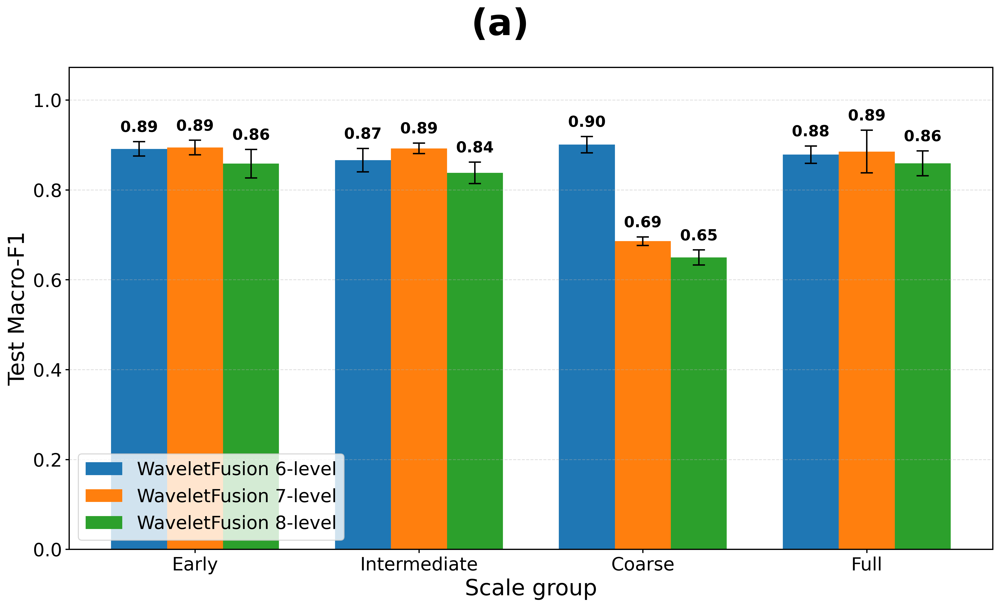

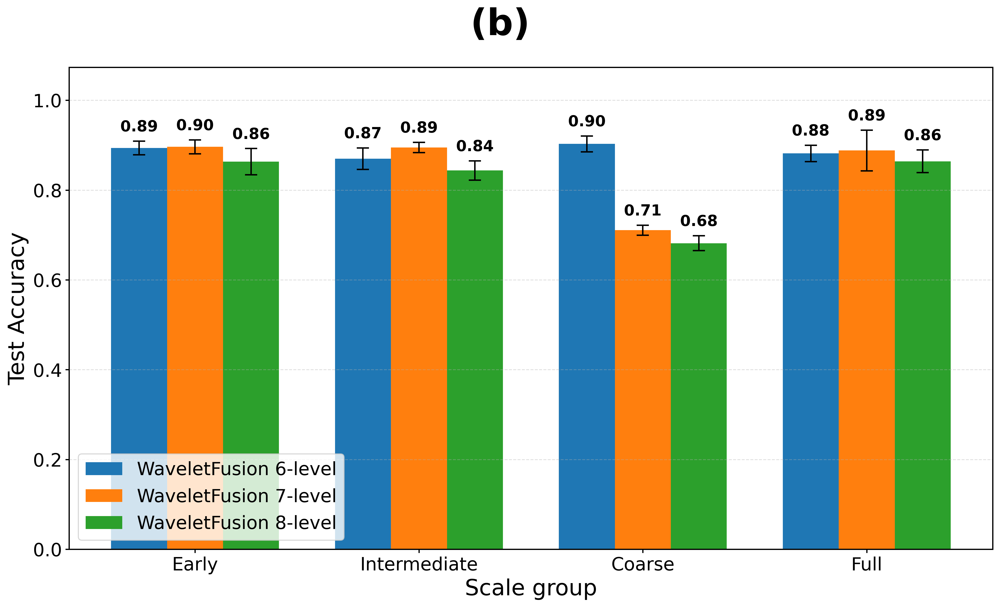

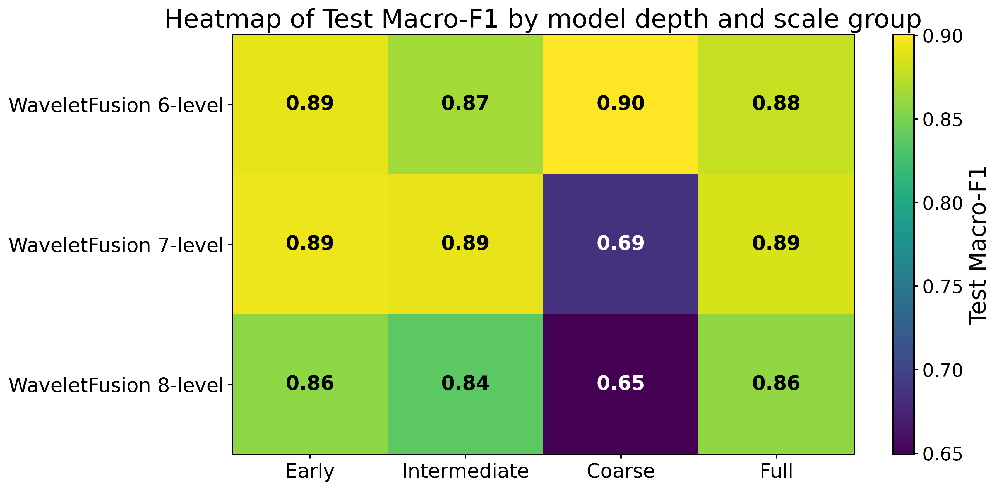

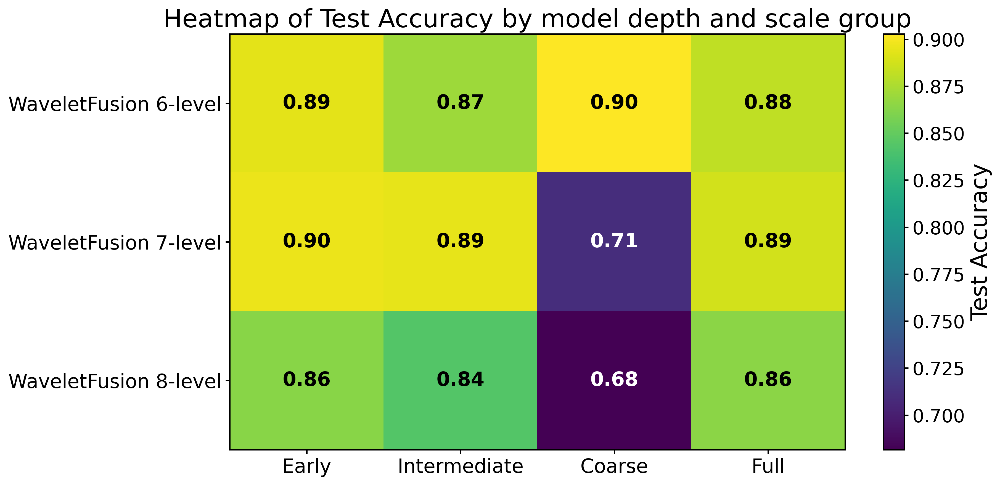


Saved all A2 figures to: ./figures_ablation_A2_summary_with_L6_2026


In [35]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Config
L6_MASTER_PATH = "./histories_ablation_A2_WF6_2026/A2_WF6_MASTER_mean_std_by_config.csv"
L7_MASTER_PATH = "./histories_ablation_A2_WF7_2026/A2_WF7_MASTER_mean_std_by_config.csv"
L8_MASTER_PATH = "./histories_ablation_A2_2026/A2_MASTER_mean_std_by_config.csv"

OUT_DIR = "./figures_ablation_A2_summary_with_L6_2026"
os.makedirs(OUT_DIR, exist_ok=True)

EXPORT_DPI = 600

PANEL_LABEL_SIZE = 36
BAR_VALUE_SIZE = 15


plt.rcParams.update({
    "figure.facecolor": "white",
    "axes.facecolor": "white",

    "font.size": 18,
    "axes.titlesize": 22,
    "axes.labelsize": 22,
    "xtick.labelsize": 18,
    "ytick.labelsize": 18,
    "legend.fontsize": 18,

    "axes.linewidth": 1.2,
    "xtick.major.width": 1.2,
    "ytick.major.width": 1.2,
})


def load_master_table(path):
    if not os.path.exists(path):
        raise FileNotFoundError(f"File not found: {path}")
    return pd.read_csv(path)

def pivot_master(df):
    p = df.pivot(index="Config", columns="Metric", values=["Mean", "Std"])
    p.columns = [f"{a}_{b}" for a, b in p.columns]
    return p.reset_index()

def rename_configs_l6(cfg):
    mapping = {
        "Early_L1_2": "Early-scale fusion (L1–L2)",
        "Middle_L3_4": "Intermediate-scale fusion (L3–L4)",
        "Coarse_L5_6": "Coarse-scale fusion (L5–L6)",
        "Full_L1_6": "Full-scale fusion (L1–L6)",
    }
    return mapping.get(cfg, cfg)

def rename_configs_l7(cfg):
    mapping = {
        "Early_L1_2": "Early-scale fusion (L1–L2)",
        "Middle_L3_5": "Intermediate-scale fusion (L3–L5)",
        "Coarse_L6_7": "Coarse-scale fusion (L6–L7)",
        "Full_L1_7": "Full-scale fusion (L1–L7)",
    }
    return mapping.get(cfg, cfg)

def rename_configs_l8(cfg):
    mapping = {
        "Fine_L1_2": "Early-scale fusion (L1–L2)",
        "Mid_L3_5": "Intermediate-scale fusion (L3–L5)",
        "Coarse_L6_8": "Coarse-scale fusion (L6–L8)",
        "All_L1_8": "Full-scale fusion (L1–L8)",
    }
    return mapping.get(cfg, cfg)

def short_scale_group(label):
    if "Early-scale" in label:
        return "Early"
    if "Intermediate-scale" in label:
        return "Intermediate"
    if "Coarse-scale" in label:
        return "Coarse"
    if "Full-scale" in label:
        return "Full"
    return label

def prepare_l6(df):
    p = pivot_master(df)
    p["ConfigLabel"] = p["Config"].apply(rename_configs_l6)
    p["ScaleGroup"] = p["ConfigLabel"].apply(short_scale_group)
    p["Depth"] = "L6"
    return p

def prepare_l7(df):
    p = pivot_master(df)
    p["ConfigLabel"] = p["Config"].apply(rename_configs_l7)
    p["ScaleGroup"] = p["ConfigLabel"].apply(short_scale_group)
    p["Depth"] = "L7"
    return p

def prepare_l8(df):
    p = pivot_master(df)
    p["ConfigLabel"] = p["Config"].apply(rename_configs_l8)
    p["ScaleGroup"] = p["ConfigLabel"].apply(short_scale_group)
    p["Depth"] = "L8"
    return p

def sort_by_scale_group(df):
    order = ["Early", "Intermediate", "Coarse", "Full"]
    df["ScaleGroup"] = pd.Categorical(df["ScaleGroup"], categories=order, ordered=True)
    return df.sort_values("ScaleGroup").reset_index(drop=True)

def save_figure(fig, base_path):
    fig.savefig(f"{base_path}.png", dpi=EXPORT_DPI, bbox_inches="tight")
    fig.savefig(f"{base_path}.pdf", bbox_inches="tight")

def annotate_bars(ax, bars, values, errors=None, fontsize=BAR_VALUE_SIZE):
    if errors is None:
        errors = np.zeros_like(values)

    for bar, val, err in zip(bars, values, errors):
        x = bar.get_x() + bar.get_width() / 2
        y = val + err + 0.015

        ax.text(
            x,
            y,
            f"{val:.2f}",
            ha="center",
            va="bottom",
            fontsize=fontsize,
            fontweight="bold",
            bbox=dict(
                boxstyle="round,pad=0.18",
                facecolor="white",
                edgecolor="none",
                alpha=0.95
            ),
            clip_on=False
        )

def add_panel_label(fig, label):
    fig.text(
        0.5,
        0.985,
        label,
        ha="center",
        va="top",
        fontsize=PANEL_LABEL_SIZE,
        fontweight="bold"
    )


df_l6_raw = load_master_table(L6_MASTER_PATH)
df_l7_raw = load_master_table(L7_MASTER_PATH)
df_l8_raw = load_master_table(L8_MASTER_PATH)

df_l6 = sort_by_scale_group(prepare_l6(df_l6_raw))
df_l7 = sort_by_scale_group(prepare_l7(df_l7_raw))
df_l8 = sort_by_scale_group(prepare_l8(df_l8_raw))

combined = pd.concat([df_l6, df_l7, df_l8], ignore_index=True)

summary_cols = [
    "Depth", "Config", "ConfigLabel", "ScaleGroup",
    "Mean_Test Acc", "Std_Test Acc",
    "Mean_Test Macro-F1", "Std_Test Macro-F1"
]

combined_summary = combined[summary_cols].copy()
combined_csv = os.path.join(OUT_DIR, "A2_L6_L7_L8_combined_summary.csv")
combined_summary.to_csv(combined_csv, index=False)
print(f"[Saved] {combined_csv}")

pub_rows = []

for scale in ["Early", "Intermediate", "Coarse", "Full"]:
    r6 = df_l6[df_l6["ScaleGroup"] == scale].iloc[0]
    r7 = df_l7[df_l7["ScaleGroup"] == scale].iloc[0]
    r8 = df_l8[df_l8["ScaleGroup"] == scale].iloc[0]

    pub_rows.append({
        "Scale group": scale,
        "L6 Test Accuracy": f'{r6["Mean_Test Acc"]:.2f} ± {r6["Std_Test Acc"]:.2f}',
        "L6 Test Macro-F1": f'{r6["Mean_Test Macro-F1"]:.2f} ± {r6["Std_Test Macro-F1"]:.2f}',
        "L7 Test Accuracy": f'{r7["Mean_Test Acc"]:.2f} ± {r7["Std_Test Acc"]:.2f}',
        "L7 Test Macro-F1": f'{r7["Mean_Test Macro-F1"]:.2f} ± {r7["Std_Test Macro-F1"]:.2f}',
        "L8 Test Accuracy": f'{r8["Mean_Test Acc"]:.2f} ± {r8["Std_Test Acc"]:.2f}',
        "L8 Test Macro-F1": f'{r8["Mean_Test Macro-F1"]:.2f} ± {r8["Std_Test Macro-F1"]:.2f}',
    })

pub_df = pd.DataFrame(pub_rows)
pub_csv = os.path.join(OUT_DIR, "A2_L6_L7_L8_publication_table.csv")
pub_df.to_csv(pub_csv, index=False)

print(f"[Saved] {pub_csv}")
print("\nPublication-style A2 table:")
print(pub_df.to_string(index=False))

x_labels = ["Early", "Intermediate", "Coarse", "Full"]
x = np.arange(len(x_labels))
bar_width = 0.25

l6_f1_mean = df_l6["Mean_Test Macro-F1"].to_numpy()
l6_f1_std  = df_l6["Std_Test Macro-F1"].to_numpy()

l7_f1_mean = df_l7["Mean_Test Macro-F1"].to_numpy()
l7_f1_std  = df_l7["Std_Test Macro-F1"].to_numpy()

l8_f1_mean = df_l8["Mean_Test Macro-F1"].to_numpy()
l8_f1_std  = df_l8["Std_Test Macro-F1"].to_numpy()

fig, ax = plt.subplots(figsize=(14, 8.5))

bars0 = ax.bar(
    x - bar_width,
    l6_f1_mean,
    bar_width,
    yerr=l6_f1_std,
    capsize=6,
    label="WaveletFusion 6-level",
    error_kw=dict(elinewidth=1.4, capthick=1.4)
)

bars1 = ax.bar(
    x,
    l7_f1_mean,
    bar_width,
    yerr=l7_f1_std,
    capsize=6,
    label="WaveletFusion 7-level",
    error_kw=dict(elinewidth=1.4, capthick=1.4)
)

bars2 = ax.bar(
    x + bar_width,
    l8_f1_mean,
    bar_width,
    yerr=l8_f1_std,
    capsize=6,
    label="WaveletFusion 8-level",
    error_kw=dict(elinewidth=1.4, capthick=1.4)
)

ax.set_xticks(x)
ax.set_xticklabels(x_labels)
ax.set_ylabel("Test Macro-F1", fontsize=22)
ax.set_xlabel("Scale group", fontsize=22)
ax.legend(loc="lower left", fontsize=18)
ax.grid(axis="y", linestyle="--", alpha=0.4)

max_f1 = np.max(np.concatenate([
    l6_f1_mean + l6_f1_std,
    l7_f1_mean + l7_f1_std,
    l8_f1_mean + l8_f1_std
]))

ax.set_ylim(0.0, min(1.12, max_f1 + 0.14))

annotate_bars(ax, bars0, l6_f1_mean, l6_f1_std)
annotate_bars(ax, bars1, l7_f1_mean, l7_f1_std)
annotate_bars(ax, bars2, l8_f1_mean, l8_f1_std)

add_panel_label(fig, "(a)")

plt.tight_layout(rect=[0, 0, 1, 0.92])

save_figure(
    fig,
    os.path.join(OUT_DIR, "A2_grouped_test_macro_f1_L6_L7_L8")
)

plt.show()

l6_acc_mean = df_l6["Mean_Test Acc"].to_numpy()
l6_acc_std  = df_l6["Std_Test Acc"].to_numpy()

l7_acc_mean = df_l7["Mean_Test Acc"].to_numpy()
l7_acc_std  = df_l7["Std_Test Acc"].to_numpy()

l8_acc_mean = df_l8["Mean_Test Acc"].to_numpy()
l8_acc_std  = df_l8["Std_Test Acc"].to_numpy()

fig, ax = plt.subplots(figsize=(14, 8.5))

bars0 = ax.bar(
    x - bar_width,
    l6_acc_mean,
    bar_width,
    yerr=l6_acc_std,
    capsize=6,
    label="WaveletFusion 6-level",
    error_kw=dict(elinewidth=1.4, capthick=1.4)
)

bars1 = ax.bar(
    x,
    l7_acc_mean,
    bar_width,
    yerr=l7_acc_std,
    capsize=6,
    label="WaveletFusion 7-level",
    error_kw=dict(elinewidth=1.4, capthick=1.4)
)

bars2 = ax.bar(
    x + bar_width,
    l8_acc_mean,
    bar_width,
    yerr=l8_acc_std,
    capsize=6,
    label="WaveletFusion 8-level",
    error_kw=dict(elinewidth=1.4, capthick=1.4)
)

ax.set_xticks(x)
ax.set_xticklabels(x_labels)
ax.set_ylabel("Test Accuracy", fontsize=22)
ax.set_xlabel("Scale group", fontsize=22)
ax.legend(loc="lower left", fontsize=18)
ax.grid(axis="y", linestyle="--", alpha=0.4)

max_acc = np.max(np.concatenate([
    l6_acc_mean + l6_acc_std,
    l7_acc_mean + l7_acc_std,
    l8_acc_mean + l8_acc_std
]))

ax.set_ylim(0.0, min(1.12, max_acc + 0.14))

annotate_bars(ax, bars0, l6_acc_mean, l6_acc_std)
annotate_bars(ax, bars1, l7_acc_mean, l7_acc_std)
annotate_bars(ax, bars2, l8_acc_mean, l8_acc_std)

add_panel_label(fig, "(b)")

plt.tight_layout(rect=[0, 0, 1, 0.92])

save_figure(
    fig,
    os.path.join(OUT_DIR, "A2_grouped_test_accuracy_L6_L7_L8")
)

plt.show()

heatmap_f1 = pd.DataFrame(
    [l6_f1_mean, l7_f1_mean, l8_f1_mean],
    index=["WaveletFusion 6-level", "WaveletFusion 7-level", "WaveletFusion 8-level"],
    columns=x_labels
)

heatmap_acc = pd.DataFrame(
    [l6_acc_mean, l7_acc_mean, l8_acc_mean],
    index=["WaveletFusion 6-level", "WaveletFusion 7-level", "WaveletFusion 8-level"],
    columns=x_labels
)

def plot_heatmap(df_heat, title, cbar_label, out_name):
    fig, ax = plt.subplots(figsize=(12.5, 6.2))

    im = ax.imshow(df_heat.values, aspect="auto")

    cbar = plt.colorbar(im, ax=ax)
    cbar.ax.set_ylabel(cbar_label, fontsize=20)
    cbar.ax.tick_params(labelsize=16)

    ax.set_xticks(np.arange(df_heat.shape[1]))
    ax.set_yticks(np.arange(df_heat.shape[0]))
    ax.set_xticklabels(df_heat.columns, fontsize=17)
    ax.set_yticklabels(df_heat.index, fontsize=17)
    ax.set_title(title, fontsize=22)

    vmax = np.max(df_heat.values)
    vmin = np.min(df_heat.values)
    threshold = (vmax + vmin) / 2.0

    for i in range(df_heat.shape[0]):
        for j in range(df_heat.shape[1]):
            val = df_heat.values[i, j]

            ax.text(
                j,
                i,
                f"{val:.2f}",
                ha="center",
                va="center",
                color="white" if val < threshold else "black",
                fontsize=17,
                fontweight="bold"
            )

    plt.tight_layout()

    base = os.path.join(OUT_DIR, out_name.replace(".png", ""))
    save_figure(fig, base)

    plt.show()

plot_heatmap(
    heatmap_f1,
    title="Heatmap of Test Macro-F1 by model depth and scale group",
    cbar_label="Test Macro-F1",
    out_name="A2_heatmap_test_macro_f1_L6_L7_L8.png"
)

plot_heatmap(
    heatmap_acc,
    title="Heatmap of Test Accuracy by model depth and scale group",
    cbar_label="Test Accuracy",
    out_name="A2_heatmap_test_accuracy_L6_L7_L8.png"
)

print(f"\nSaved all A2 figures to: {OUT_DIR}")

# level group: Br35H - WaveletFusion 6-level

In [38]:
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"
os.environ["TF_ENABLE_LAYOUT_OPTIMIZER"] = "0"

import gc
from pathlib import Path
import numpy as np
import pandas as pd
import tensorflow as tf

from tensorflow.keras import layers, models, callbacks, regularizers
from tensorflow.keras import mixed_precision
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split

mixed_precision.set_global_policy("float32")

# -------------------- Config --------------------
DATA_DIR = "./"

IMG_SIZE  = 256
BATCH     = 32
AUTOTUNE  = tf.data.AUTOTUNE
EPOCHS    = 30

N_LEVELS  = 6
PROJ_DIM  = 16
HEAD_MODE = "multilevel_details"

RUN_SEEDS = [42, 43, 44, 45, 46]

TEST_SIZE = 0.20
VAL_SIZE_WITHIN_TRAINVAL = 0.20

CLASS_NAMES = ["no", "yes"]

HIST_DIR = "./histories_ablation_A2_WF6_br35h_2026"
os.makedirs(HIST_DIR, exist_ok=True)

L2_STRENGTH = 2e-4

# L6 group definitions
CONFIGS = {
    "Early_L1_2":   [1, 2],
    "Middle_L3_4":  [3, 4],
    "Coarse_L5_6":  [5, 6],
    "Full_L1_6":    [1, 2, 3, 4, 5, 6],
}

def collect_yes_no_paths(data_dir):
    data_dir = Path(data_dir)
    yes_dir = data_dir / "yes"
    no_dir  = data_dir / "no"

    if not yes_dir.exists() or not no_dir.exists():
        raise FileNotFoundError(
            f"Expected folders '{yes_dir}' and '{no_dir}'. "
            f"Set DATA_DIR to the dataset root containing yes/, no/, and pred/."
        )

    valid_ext = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"}

    yes_paths = sorted([str(p) for p in yes_dir.rglob("*") if p.suffix.lower() in valid_ext])
    no_paths  = sorted([str(p) for p in no_dir.rglob("*") if p.suffix.lower() in valid_ext])

    if len(yes_paths) == 0 or len(no_paths) == 0:
        raise ValueError("No images found in yes/ or no/ folders.")

    paths = np.array(no_paths + yes_paths, dtype=object)
    labels = np.array([0] * len(no_paths) + [1] * len(yes_paths), dtype=np.int32)
    return paths, labels

def decode_and_resize(path, label):
    img = tf.io.read_file(path)
    img = tf.image.decode_image(img, channels=1, expand_animations=False)
    img = tf.image.resize(img, [IMG_SIZE, IMG_SIZE], method="bilinear")
    img = tf.cast(img, tf.float32)
    label = tf.one_hot(label, depth=len(CLASS_NAMES), dtype=tf.float32)
    return img, label

def make_dataset(paths, labels, shuffle=False, seed=0):
    ds = tf.data.Dataset.from_tensor_slices((paths, labels))
    ds = ds.map(decode_and_resize, num_parallel_calls=AUTOTUNE)
    ds = ds.batch(BATCH)
    ds = cfg(ds, shuffle=shuffle, seed=seed)
    return ds

# -------------------- Preprocessing --------------------
def per_image_standardize_batch(x):
    out_dtype = x.dtype
    x32 = tf.cast(x, tf.float32)
    y32 = tf.map_fn(tf.image.per_image_standardization, x32, fn_output_signature=tf.float32)
    return tf.cast(y32, out_dtype)

def cfg(ds, shuffle=False, seed=0):
    ds = ds.cache()
    if shuffle:
        ds = ds.shuffle(1000, seed=seed, reshuffle_each_iteration=True)
    return ds.prefetch(AUTOTUNE)

def y_true_from_ds(ds):
    ys = []
    for _, y in ds:
        ys.append(y.numpy())
    return np.argmax(np.vstack(ys), axis=1)

# -------------------- Blocks --------------------
def conv_block(x, filters, sd_rate=0.0, name_prefix="blk"):
    x = layers.Conv2D(
        filters, 3, padding="same", use_bias=False,
        kernel_regularizer=regularizers.l2(L2_STRENGTH),
        name=f"{name_prefix}_conv1"
    )(x)
    x = layers.BatchNormalization(name=f"{name_prefix}_bn1")(x)
    x = layers.ReLU(name=f"{name_prefix}_relu1")(x)

    x = layers.Conv2D(
        filters, 3, padding="same", use_bias=False,
        kernel_regularizer=regularizers.l2(L2_STRENGTH),
        name=f"{name_prefix}_conv2"
    )(x)
    x = layers.BatchNormalization(name=f"{name_prefix}_bn2")(x)
    x = layers.ReLU(name=f"{name_prefix}_relu2")(x)

    if sd_rate > 0:
        x = layers.SpatialDropout2D(sd_rate, name=f"{name_prefix}_spdrop")(x)
    return x

class HaarWavelet2D(layers.Layer):
    def build(self, input_shape):
        if int(input_shape[-1]) != 1:
            raise ValueError(f"HaarWavelet2D expects single-channel input, got {input_shape[-1]}.")

        ll = np.array([[0.5,  0.5],
                       [0.5,  0.5]], dtype="float32")
        lh = np.array([[ 0.5,  0.5],
                       [-0.5, -0.5]], dtype="float32")
        hl = np.array([[ 0.5, -0.5],
                       [ 0.5, -0.5]], dtype="float32")
        hh = np.array([[ 0.5, -0.5],
                       [-0.5,  0.5]], dtype="float32")

        k = np.stack([ll, lh, hl, hh], axis=-1).reshape((2, 2, 1, 4))
        self.kernel = tf.constant(k, dtype=tf.float32)
        super().build(input_shape)

    def call(self, inputs):
        x = tf.cast(inputs, tf.float32)
        y = tf.nn.conv2d(x, self.kernel, strides=[1, 2, 2, 1], padding="SAME")
        ll, lh, hl, hh = tf.split(y, 4, axis=-1)
        return ll, lh, hl, hh

# -------------------- Model --------------------
def build_wavelet6_a2_model(num_classes: int, run_seed: int, keep_levels):
    augment = tf.keras.Sequential([
        layers.RandomFlip("horizontal", seed=run_seed),
        layers.RandomRotation(0.05, seed=run_seed + 1),
        layers.RandomZoom(0.1, seed=run_seed + 2),
        layers.RandomContrast(0.1, seed=run_seed + 3),
        layers.RandomTranslation(0.03, 0.03, seed=run_seed + 4)
    ], name="augment")

    rescale = layers.Rescaling(1./255, name="rescale")
    standardize = layers.Lambda(per_image_standardize_batch, name="per_image_standardization")

    DETAIL_F = [12, 8, 8, 6, 6, 4]
    APPROX_F = [4, 4, 4, 4, 4, 4]
    BB_F     = [28, 44, 44, 44, 44, 44]

    SD_D = [0.10, 0.08, 0.08, 0.06, 0.06, 0.05]
    SD_B = [0.10, 0.12, 0.12, 0.10, 0.10, 0.08]

    inputs = layers.Input((IMG_SIZE, IMG_SIZE, 1), name="input_image")

    x = augment(inputs)
    x = rescale(x)
    x = standardize(x)
    x = layers.GaussianNoise(0.02, name="gaussian_noise")(x)

    ll_in = x
    prev_pooled = None
    detail_level_vecs = []

    for level in range(1, N_LEVELS + 1):
        LL, LH, HL, HH = HaarWavelet2D(name=f"haar_L{level}")(ll_in)

        D = layers.Concatenate(name=f"details_L{level}")([LH, HL, HH])
        W = conv_block(D, DETAIL_F[level - 1], sd_rate=SD_D[level - 1], name_prefix=f"L{level}_Detail")

        A = conv_block(LL, APPROX_F[level - 1], sd_rate=0.0, name_prefix=f"L{level}_Approx")

        if prev_pooled is None:
            S = layers.Concatenate(name=f"fusion_L{level}")([W, A])
        else:
            S = layers.Concatenate(name=f"fusion_L{level}")([prev_pooled, W, A])

        B = conv_block(S, BB_F[level - 1], sd_rate=SD_B[level - 1], name_prefix=f"backbone_block{level}")

        w_gap  = layers.GlobalAveragePooling2D(name=f"gap_detail_L{level}")(W)
        w_proj = layers.Dense(
            PROJ_DIM, activation="relu", use_bias=False,
            name=f"proj_detail_L{level}"
        )(w_gap)

        if level in keep_levels:
            detail_level_vecs.append(w_proj)

        if level < N_LEVELS:
            prev_pooled = layers.MaxPooling2D(name=f"backbone_pool{level}")(B)
            ll_in = LL
        else:
            B_final = B

    deep_vec = layers.GlobalAveragePooling2D(name="gap_deepest_backbone")(B_final)

    feat = layers.Concatenate(name="multilevel_details_concat")([deep_vec] + detail_level_vecs)
    feat = layers.Dropout(0.5, name="head_dropout1")(feat)
    feat = layers.Dense(
        128, activation="relu",
        kernel_regularizer=regularizers.l2(L2_STRENGTH),
        name="head_dense_128"
    )(feat)
    feat = layers.Dropout(0.35, name="head_dropout2")(feat)

    outputs = layers.Dense(num_classes, activation="softmax", name="predictions")(feat)

    keep_tag = "_".join([f"L{k}" for k in sorted(list(keep_levels))])
    return models.Model(inputs, outputs, name=f"WaveletFusion6_A2_{keep_tag}_Br35H")

# -------------------- Run --------------------
all_paths, all_labels = collect_yes_no_paths(DATA_DIR)
print(f"Found {len(all_paths)} labeled images total.")
print(f"Class distribution -> no: {(all_labels == 0).sum()}, yes: {(all_labels == 1).sum()}")
print("Folder 'pred' is ignored during supervised training/evaluation.")

rows = []

for config_name, keep_levels in CONFIGS.items():
    print(f"\n================= CONFIG: {config_name} | keep_levels={keep_levels} =================")

    for run_seed in RUN_SEEDS:
        split_seed = run_seed
        print(f"\nRUN_SEED = {run_seed} | SPLIT_SEED = {split_seed}")

        tf.keras.backend.clear_session()
        gc.collect()
        tf.keras.utils.set_random_seed(run_seed)

        trainval_paths, test_paths, trainval_labels, test_labels = train_test_split(
            all_paths,
            all_labels,
            test_size=TEST_SIZE,
            random_state=split_seed,
            stratify=all_labels
        )

        train_paths, val_paths, train_labels, val_labels = train_test_split(
            trainval_paths,
            trainval_labels,
            test_size=VAL_SIZE_WITHIN_TRAINVAL,
            random_state=split_seed,
            stratify=trainval_labels
        )

        print(f"Train: {len(train_paths)} | Val: {len(val_paths)} | Test: {len(test_paths)}")

        train_ds = make_dataset(train_paths, train_labels, shuffle=True,  seed=run_seed)
        val_ds   = make_dataset(val_paths,   val_labels,   shuffle=False, seed=run_seed)
        test_ds  = make_dataset(test_paths,  test_labels,  shuffle=False, seed=run_seed)

        model = build_wavelet6_a2_model(num_classes=len(CLASS_NAMES), run_seed=run_seed, keep_levels=set(keep_levels))

        loss_fn = tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.05)
        model.compile(
            optimizer=tf.keras.optimizers.Adam(3e-4),
            loss=loss_fn,
            metrics=["accuracy"]
        )

        cbs = [
            callbacks.EarlyStopping(patience=6, restore_best_weights=True, monitor="val_loss"),
            callbacks.ReduceLROnPlateau(patience=3, factor=0.5, monitor="val_loss"),
        ]

        hist = model.fit(train_ds, validation_data=val_ds, epochs=EPOCHS, callbacks=cbs, verbose=1)

        # Validation
        val_probs = model.predict(val_ds, verbose=0)
        y_pred_val = np.argmax(val_probs, axis=1)
        y_true_val = y_true_from_ds(val_ds)
        val_loss, val_acc = model.evaluate(val_ds, verbose=0)
        val_macro_f1 = float(f1_score(y_true_val, y_pred_val, average="macro"))

        # Test
        test_probs = model.predict(test_ds, verbose=0)
        y_pred_test = np.argmax(test_probs, axis=1)
        y_true_test = y_true_from_ds(test_ds)
        test_loss, test_acc = model.evaluate(test_ds, verbose=0)
        test_macro_f1 = float(f1_score(y_true_test, y_pred_test, average="macro"))

        rows.append({
            "Config": config_name,
            "RUN_SEED": run_seed,
            "SPLIT_SEED": split_seed,
            "Val Loss": float(val_loss),
            "Val Acc": float(val_acc),
            "Val Macro-F1": float(val_macro_f1),
            "Test Loss": float(test_loss),
            "Test Acc": float(test_acc),
            "Test Macro-F1": float(test_macro_f1),
            "Parameters": int(model.count_params()),
        })

        del model, train_ds, val_ds, test_ds, hist
        gc.collect()

# -------------------- Save LONG --------------------
df_long = pd.DataFrame(rows)
long_csv = os.path.join(HIST_DIR, "A2_WF6_br35h_ALL_configs_ALL_seeds_long.csv")
df_long.to_csv(long_csv, index=False)
print(f"[Saved] {long_csv}")

# -------------------- Save MASTER mean±std --------------------
metric_cols = ["Val Loss", "Val Acc", "Val Macro-F1", "Test Loss", "Test Acc", "Test Macro-F1"]

master_rows = []
for cfg_name, g in df_long.groupby("Config"):
    for metric in metric_cols:
        vals = g[metric].astype(float).to_numpy()
        master_rows.append({
            "Config": cfg_name,
            "Metric": metric,
            "Mean": float(np.mean(vals)),
            "Std": float(np.std(vals, ddof=1)) if len(vals) > 1 else 0.0
        })

df_master = pd.DataFrame(master_rows)
master_csv = os.path.join(HIST_DIR, "A2_WF6_br35h_MASTER_mean_std_by_config.csv")
df_master.to_csv(master_csv, index=False)
print(f"[Saved] {master_csv}")

print("\nDone: A2 WaveletFusion 6-level Br35H results generated.")

Found 3002 labeled images total.
Class distribution -> no: 1501, yes: 1501
Folder 'pred' is ignored during supervised training/evaluation.

================= CONFIG: Early_L1_2 | keep_levels=[1, 2] =================

RUN_SEED = 42 | SPLIT_SEED = 42
Train: 1920 | Val: 481 | Test: 601
Epoch 1/30


2026-05-02 10:04:13.079865: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L1_L2_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - accuracy: 0.5227 - loss: 0.9142 - val_accuracy: 0.6154 - val_loss: 0.8189 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.5908 - loss: 0.8269 - val_accuracy: 0.7672 - val_loss: 0.7783 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.6616 - loss: 0.7751 - val_accuracy: 0.8046 - val_loss: 0.6863 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7286 - loss: 0.7172 - val_accuracy: 0.8316 - val_loss: 0.5963 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.7609 - loss: 0.6698 - val_accuracy: 0.8254 - val_loss: 0.5618 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.7687 - loss: 0.6483 - val_accuracy: 0.8545 - val_loss: 0.5499 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.7965 - loss: 0.

2026-05-02 10:09:02.122555: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L1_L2_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - accuracy: 0.5211 - loss: 0.8532 - val_accuracy: 0.5239 - val_loss: 0.8184 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.6324 - loss: 0.7839 - val_accuracy: 0.7069 - val_loss: 0.7537 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.7107 - loss: 0.7192 - val_accuracy: 0.7609 - val_loss: 0.6902 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.7496 - loss: 0.6760 - val_accuracy: 0.8150 - val_loss: 0.5807 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.7870 - loss: 0.6444 - val_accuracy: 0.8586 - val_loss: 0.5349 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.8112 - loss: 0.5993 - val_accuracy: 0.8399 - val_loss: 0.5343 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.8396 - loss: 0.

2026-05-02 10:13:50.161769: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L1_L2_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - accuracy: 0.5651 - loss: 0.8488 - val_accuracy: 0.6840 - val_loss: 0.8242 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.6439 - loss: 0.7798 - val_accuracy: 0.6403 - val_loss: 0.7899 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.7474 - loss: 0.7152 - val_accuracy: 0.7859 - val_loss: 0.6974 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.7782 - loss: 0.6540 - val_accuracy: 0.7297 - val_loss: 0.6736 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.8035 - loss: 0.6380 - val_accuracy: 0.7651 - val_loss: 0.6316 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.8096 - loss: 0.6035 - val_accuracy: 0.8233 - val_loss: 0.5524 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.8294 - loss: 0.

2026-05-02 10:18:38.976312: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L1_L2_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - accuracy: 0.5568 - loss: 0.8429 - val_accuracy: 0.5426 - val_loss: 0.8216 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.6494 - loss: 0.7774 - val_accuracy: 0.7588 - val_loss: 0.7658 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.7249 - loss: 0.7189 - val_accuracy: 0.6528 - val_loss: 0.7200 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.7843 - loss: 0.6511 - val_accuracy: 0.7089 - val_loss: 0.7110 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.8081 - loss: 0.6103 - val_accuracy: 0.7734 - val_loss: 0.6137 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.8313 - loss: 0.5799 - val_accuracy: 0.7963 - val_loss: 0.6102 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.8331 - loss: 0.

2026-05-02 10:23:27.075325: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L1_L2_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - accuracy: 0.5272 - loss: 0.8947 - val_accuracy: 0.5198 - val_loss: 0.8235 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.6336 - loss: 0.7896 - val_accuracy: 0.7588 - val_loss: 0.7551 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.7222 - loss: 0.7116 - val_accuracy: 0.7193 - val_loss: 0.7070 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.7664 - loss: 0.6567 - val_accuracy: 0.7921 - val_loss: 0.5970 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7879 - loss: 0.6266 - val_accuracy: 0.8274 - val_loss: 0.5500 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.7983 - loss: 0.6307 - val_accuracy: 0.8628 - val_loss: 0.5008 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.8254 - loss: 0.

2026-05-02 10:28:19.776960: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L3_L4_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - accuracy: 0.5231 - loss: 0.9079 - val_accuracy: 0.4990 - val_loss: 0.8289 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.5609 - loss: 0.8291 - val_accuracy: 0.8108 - val_loss: 0.7905 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.6654 - loss: 0.7684 - val_accuracy: 0.8191 - val_loss: 0.6875 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - accuracy: 0.7335 - loss: 0.7177 - val_accuracy: 0.8420 - val_loss: 0.5834 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.7517 - loss: 0.6726 - val_accuracy: 0.8233 - val_loss: 0.5558 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step - accuracy: 0.7759 - loss: 0.6474 - val_accuracy: 0.8378 - val_loss: 0.5390 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.8022 - loss: 0.

2026-05-02 10:33:11.425204: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L3_L4_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - accuracy: 0.5414 - loss: 0.8497 - val_accuracy: 0.5489 - val_loss: 0.8163 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.6414 - loss: 0.7789 - val_accuracy: 0.6653 - val_loss: 0.7599 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.7216 - loss: 0.7155 - val_accuracy: 0.7401 - val_loss: 0.6866 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.7684 - loss: 0.6702 - val_accuracy: 0.8441 - val_loss: 0.5668 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.7826 - loss: 0.6441 - val_accuracy: 0.8482 - val_loss: 0.5587 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.8167 - loss: 0.5979 - val_accuracy: 0.8462 - val_loss: 0.5748 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.8479 - loss: 0.

2026-05-02 10:37:41.138884: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L3_L4_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - accuracy: 0.5251 - loss: 0.8568 - val_accuracy: 0.6881 - val_loss: 0.8221 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.6369 - loss: 0.7845 - val_accuracy: 0.7401 - val_loss: 0.7759 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.7211 - loss: 0.7264 - val_accuracy: 0.6881 - val_loss: 0.7018 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.7743 - loss: 0.6557 - val_accuracy: 0.7339 - val_loss: 0.6767 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.7955 - loss: 0.6341 - val_accuracy: 0.7838 - val_loss: 0.6094 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.8269 - loss: 0.6053 - val_accuracy: 0.8628 - val_loss: 0.5136 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.8278 - loss: 0.

2026-05-02 10:42:02.859557: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L3_L4_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - accuracy: 0.5344 - loss: 0.8502 - val_accuracy: 0.5198 - val_loss: 0.8224 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.6583 - loss: 0.7725 - val_accuracy: 0.7817 - val_loss: 0.7608 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.7158 - loss: 0.7173 - val_accuracy: 0.6403 - val_loss: 0.7336 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.7724 - loss: 0.6489 - val_accuracy: 0.6736 - val_loss: 0.7531 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7973 - loss: 0.6144 - val_accuracy: 0.8108 - val_loss: 0.5706 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.8200 - loss: 0.5864 - val_accuracy: 0.8108 - val_loss: 0.5535 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.8372 - loss: 0.

2026-05-02 10:46:55.930832: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L3_L4_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - accuracy: 0.5296 - loss: 0.8924 - val_accuracy: 0.6299 - val_loss: 0.8225 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.6236 - loss: 0.7811 - val_accuracy: 0.7464 - val_loss: 0.7459 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.7237 - loss: 0.7201 - val_accuracy: 0.7048 - val_loss: 0.7256 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - accuracy: 0.7658 - loss: 0.6634 - val_accuracy: 0.8129 - val_loss: 0.5846 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.7949 - loss: 0.6301 - val_accuracy: 0.8503 - val_loss: 0.5390 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.7941 - loss: 0.6338 - val_accuracy: 0.8794 - val_loss: 0.4754 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.8282 - loss: 0.

2026-05-02 10:50:43.771934: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L5_L6_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - accuracy: 0.5090 - loss: 0.9211 - val_accuracy: 0.5281 - val_loss: 0.8249 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.6086 - loss: 0.8173 - val_accuracy: 0.7318 - val_loss: 0.7638 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.6686 - loss: 0.7651 - val_accuracy: 0.7755 - val_loss: 0.6696 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.7299 - loss: 0.7147 - val_accuracy: 0.8233 - val_loss: 0.5834 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7580 - loss: 0.6819 - val_accuracy: 0.8170 - val_loss: 0.5714 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.7686 - loss: 0.6504 - val_accuracy: 0.8316 - val_loss: 0.5501 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.7965 - loss: 0.

2026-05-02 10:55:37.576967: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L5_L6_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5158 - loss: 0.8505 - val_accuracy: 0.5156 - val_loss: 0.8221 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.6479 - loss: 0.7845 - val_accuracy: 0.6216 - val_loss: 0.7658 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.7135 - loss: 0.7220 - val_accuracy: 0.7443 - val_loss: 0.6899 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.7517 - loss: 0.6942 - val_accuracy: 0.7838 - val_loss: 0.6056 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.7827 - loss: 0.6535 - val_accuracy: 0.7817 - val_loss: 0.6207 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.8020 - loss: 0.6054 - val_accuracy: 0.8545 - val_loss: 0.5243 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.8369 - loss: 0.

2026-05-02 11:00:29.547137: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L5_L6_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - accuracy: 0.5375 - loss: 0.8557 - val_accuracy: 0.6466 - val_loss: 0.8190 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.6387 - loss: 0.7814 - val_accuracy: 0.7152 - val_loss: 0.7754 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.7141 - loss: 0.7178 - val_accuracy: 0.8129 - val_loss: 0.6738 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.7776 - loss: 0.6472 - val_accuracy: 0.7089 - val_loss: 0.6994 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.8072 - loss: 0.6365 - val_accuracy: 0.7879 - val_loss: 0.6096 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - accuracy: 0.8136 - loss: 0.5997 - val_accuracy: 0.8628 - val_loss: 0.5272 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.8277 - loss: 0.

2026-05-02 11:05:18.888982: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L5_L6_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 80ms/step - accuracy: 0.5572 - loss: 0.8477 - val_accuracy: 0.5198 - val_loss: 0.8255 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.6681 - loss: 0.7721 - val_accuracy: 0.7921 - val_loss: 0.7546 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7218 - loss: 0.7135 - val_accuracy: 0.6611 - val_loss: 0.7183 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - accuracy: 0.7909 - loss: 0.6433 - val_accuracy: 0.6840 - val_loss: 0.7656 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.8078 - loss: 0.6052 - val_accuracy: 0.7235 - val_loss: 0.7041 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.8263 - loss: 0.5780 - val_accuracy: 0.7963 - val_loss: 0.5679 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.8457 - loss: 0.

2026-05-02 11:10:25.088873: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L5_L6_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 81ms/step - accuracy: 0.5381 - loss: 0.8930 - val_accuracy: 0.5010 - val_loss: 0.8236 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.6127 - loss: 0.7914 - val_accuracy: 0.7672 - val_loss: 0.7358 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.7133 - loss: 0.7233 - val_accuracy: 0.7817 - val_loss: 0.6691 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.7767 - loss: 0.6544 - val_accuracy: 0.7817 - val_loss: 0.5971 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7983 - loss: 0.6282 - val_accuracy: 0.7983 - val_loss: 0.5790 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7932 - loss: 0.6334 - val_accuracy: 0.8711 - val_loss: 0.4854 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.8249 - loss: 0.

2026-05-02 11:14:53.563027: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L1_L2_L3_L4_L5_L6_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 21s 80ms/step - accuracy: 0.5161 - loss: 0.8975 - val_accuracy: 0.6279 - val_loss: 0.8238 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - accuracy: 0.5941 - loss: 0.8186 - val_accuracy: 0.6881 - val_loss: 0.7749 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - accuracy: 0.6795 - loss: 0.7618 - val_accuracy: 0.8087 - val_loss: 0.6846 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - accuracy: 0.7305 - loss: 0.7083 - val_accuracy: 0.8399 - val_loss: 0.5878 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.7720 - loss: 0.6610 - val_accuracy: 0.8358 - val_loss: 0.5295 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.8033 - loss: 0.6312 - val_accuracy: 0.8711 - val_loss: 0.5166 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.8044 - loss: 0.

2026-05-02 11:19:55.843701: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L1_L2_L3_L4_L5_L6_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step - accuracy: 0.5020 - loss: 0.8662 - val_accuracy: 0.6736 - val_loss: 0.8240 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.6245 - loss: 0.7925 - val_accuracy: 0.7048 - val_loss: 0.7442 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.7047 - loss: 0.7344 - val_accuracy: 0.7505 - val_loss: 0.6805 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.7693 - loss: 0.6709 - val_accuracy: 0.8170 - val_loss: 0.5831 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7895 - loss: 0.6478 - val_accuracy: 0.8462 - val_loss: 0.5574 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.8096 - loss: 0.6056 - val_accuracy: 0.8753 - val_loss: 0.5126 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.8355 - loss: 0.

2026-05-02 11:24:53.063125: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L1_L2_L3_L4_L5_L6_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - accuracy: 0.5236 - loss: 0.8723 - val_accuracy: 0.7277 - val_loss: 0.8247 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.6449 - loss: 0.7917 - val_accuracy: 0.7131 - val_loss: 0.7645 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7377 - loss: 0.6990 - val_accuracy: 0.7942 - val_loss: 0.6472 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.7852 - loss: 0.6628 - val_accuracy: 0.7339 - val_loss: 0.6665 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7945 - loss: 0.6310 - val_accuracy: 0.7568 - val_loss: 0.6480 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - accuracy: 0.8214 - loss: 0.5859 - val_accuracy: 0.7588 - val_loss: 0.6603 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.8554 - loss: 0.

2026-05-02 11:29:50.703521: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L1_L2_L3_L4_L5_L6_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - accuracy: 0.5407 - loss: 0.8618 - val_accuracy: 0.5073 - val_loss: 0.8301 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.6425 - loss: 0.7835 - val_accuracy: 0.8004 - val_loss: 0.7496 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.7260 - loss: 0.7085 - val_accuracy: 0.8316 - val_loss: 0.6417 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.7821 - loss: 0.6353 - val_accuracy: 0.7235 - val_loss: 0.7259 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.7985 - loss: 0.6106 - val_accuracy: 0.7796 - val_loss: 0.6443 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - accuracy: 0.8184 - loss: 0.5816 - val_accuracy: 0.8233 - val_loss: 0.5665 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.8465 - loss: 0.

2026-05-02 11:34:47.433991: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WaveletFusion6_A2_L1_L2_L3_L4_L5_L6_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - accuracy: 0.5318 - loss: 0.8949 - val_accuracy: 0.6590 - val_loss: 0.8281 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.6383 - loss: 0.7964 - val_accuracy: 0.7443 - val_loss: 0.7647 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.7187 - loss: 0.7335 - val_accuracy: 0.7422 - val_loss: 0.6866 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.7602 - loss: 0.6919 - val_accuracy: 0.8087 - val_loss: 0.5999 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.7907 - loss: 0.6380 - val_accuracy: 0.8129 - val_loss: 0.5619 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - accuracy: 0.7960 - loss: 0.6403 - val_accuracy: 0.8607 - val_loss: 0.5108 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.8081 - loss: 0.

# level group: Br35H - WaveletFusion 7-level

In [2]:
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"
os.environ["TF_ENABLE_LAYOUT_OPTIMIZER"] = "0"

import time
import gc
from pathlib import Path

import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd

from tensorflow.keras import layers, models, callbacks, regularizers
from tensorflow.keras import mixed_precision
from sklearn.metrics import classification_report, confusion_matrix, f1_score
from sklearn.model_selection import train_test_split

mixed_precision.set_global_policy("float32")

# -------------------- Config --------------------
DATA_DIR = "./"

IMG_SIZE  = 256
BATCH     = 32
AUTOTUNE  = tf.data.AUTOTUNE
EPOCHS    = 30

N_LEVELS  = 7
HEAD_MODE = "multilevel_details"
PROJ_DIM  = 16

RUN_SEEDS = [42, 43, 44, 45, 46]

MAX_PARAMS = 311700
L2_STRENGTH = 2e-4

TEST_SIZE = 0.20
VAL_SIZE_WITHIN_TRAINVAL = 0.20

CLASS_NAMES = ["no", "yes"]

A2_CONFIGS = [
    ("Early_L1_2",  [1, 2]),
    ("Middle_L3_5", [3, 4, 5]),
    ("Coarse_L6_7", [6, 7]),
    ("Full_L1_7",   [1, 2, 3, 4, 5, 6, 7]),
]

HIST_DIR = "./histories_ablation_A2_WF7_br35h_2026"
FIG_DIR  = "./figures_ablation_A2_WF7_br35h_2026"
os.makedirs(HIST_DIR, exist_ok=True)
os.makedirs(FIG_DIR, exist_ok=True)

if IMG_SIZE % (2 ** N_LEVELS) != 0:
    raise ValueError(f"IMG_SIZE={IMG_SIZE} must be divisible by 2^{N_LEVELS} for {N_LEVELS}-level decomposition.")

def collect_yes_no_paths(data_dir):
    data_dir = Path(data_dir)
    yes_dir = data_dir / "yes"
    no_dir  = data_dir / "no"

    if not yes_dir.exists() or not no_dir.exists():
        raise FileNotFoundError(
            f"Expected folders '{yes_dir}' and '{no_dir}'. "
            f"Set DATA_DIR to the dataset root containing yes/, no/, and pred/."
        )

    valid_ext = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"}

    yes_paths = sorted([str(p) for p in yes_dir.rglob("*") if p.suffix.lower() in valid_ext])
    no_paths  = sorted([str(p) for p in no_dir.rglob("*") if p.suffix.lower() in valid_ext])

    if len(yes_paths) == 0 or len(no_paths) == 0:
        raise ValueError("No images found in yes/ or no/ folders.")

    paths = np.array(no_paths + yes_paths, dtype=object)
    labels = np.array([0] * len(no_paths) + [1] * len(yes_paths), dtype=np.int32)
    return paths, labels

def decode_and_resize(path, label):
    img = tf.io.read_file(path)
    img = tf.image.decode_image(img, channels=1, expand_animations=False)
    img = tf.image.resize(img, [IMG_SIZE, IMG_SIZE], method="bilinear")
    img = tf.cast(img, tf.float32)
    label = tf.one_hot(label, depth=len(CLASS_NAMES), dtype=tf.float32)
    return img, label

def make_dataset(paths, labels, shuffle=False, seed=0):
    ds = tf.data.Dataset.from_tensor_slices((paths, labels))
    ds = ds.map(decode_and_resize, num_parallel_calls=AUTOTUNE)
    ds = ds.batch(BATCH)
    ds = cfg(ds, shuffle=shuffle, seed=seed)
    return ds

def per_image_standardize_batch(x):
    out_dtype = x.dtype
    x32 = tf.cast(x, tf.float32)
    y32 = tf.map_fn(tf.image.per_image_standardization, x32, fn_output_signature=tf.float32)
    return tf.cast(y32, out_dtype)

def cfg(ds, shuffle=False, seed=0):
    ds = ds.cache()
    if shuffle:
        ds = ds.shuffle(1000, seed=seed, reshuffle_each_iteration=True)
    return ds.prefetch(AUTOTUNE)

def count_images(ds):
    n = 0
    for xb, _ in ds:
        n += int(xb.shape[0])
    return n

def y_true_from_ds(ds):
    ys = []
    for _, y in ds:
        ys.append(y.numpy())
    return np.argmax(np.vstack(ys), axis=1)

def save_confusion_matrix_png(cm, class_names, title, out_path):
    plt.rcParams.update({"font.size": 12})
    vmax = cm.max() if cm.max() > 0 else 1
    fig, ax = plt.subplots(figsize=(7.2, 6.2))
    im = ax.imshow(cm, interpolation="nearest", cmap=plt.cm.Blues, vmin=0, vmax=vmax)
    cbar = plt.colorbar(im, ax=ax)
    cbar.ax.set_ylabel("Number of samples")

    ticks = np.arange(len(class_names))
    ax.set_xticks(ticks)
    ax.set_yticks(ticks)
    ax.set_xticklabels(class_names, rotation=45, ha="right")
    ax.set_yticklabels(class_names)
    ax.set_ylabel("True label")
    ax.set_xlabel("Predicted label")
    ax.set_title(title)

    thresh = vmax / 2.0
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(
                j, i, str(cm[i, j]),
                ha="center", va="center",
                color="white" if cm[i, j] > thresh else "black"
            )

    plt.tight_layout()
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)

def specificity_from_cm(cm: np.ndarray):
    spec = []
    total = cm.sum()
    for i in range(cm.shape[0]):
        tp = cm[i, i]
        fn = cm[i, :].sum() - tp
        fp = cm[:, i].sum() - tp
        tn = total - tp - fn - fp
        spec.append(float(tn / (tn + fp + 1e-12)))
    return spec

def per_class_table(report_dict, cm, class_names):
    spec = specificity_from_cm(cm)
    rows = []
    for idx, cls in enumerate(class_names):
        d = report_dict.get(cls, {})
        rows.append({
            "class": cls,
            "precision": float(d.get("precision", np.nan)),
            "recall(sensitivity)": float(d.get("recall", np.nan)),
            "specificity": spec[idx],
            "f1_score": float(d.get("f1-score", np.nan)),
            "support": int(d.get("support", 0)),
        })
    return pd.DataFrame(rows)

def conv_block(x, filters, sd_rate=0.0, name_prefix="blk"):
    x = layers.Conv2D(
        filters, 3, padding="same", use_bias=False,
        kernel_regularizer=regularizers.l2(L2_STRENGTH),
        name=f"{name_prefix}_conv1"
    )(x)
    x = layers.BatchNormalization(name=f"{name_prefix}_bn1")(x)
    x = layers.ReLU(name=f"{name_prefix}_relu1")(x)

    x = layers.Conv2D(
        filters, 3, padding="same", use_bias=False,
        kernel_regularizer=regularizers.l2(L2_STRENGTH),
        name=f"{name_prefix}_conv2"
    )(x)
    x = layers.BatchNormalization(name=f"{name_prefix}_bn2")(x)
    x = layers.ReLU(name=f"{name_prefix}_relu2")(x)

    if sd_rate > 0:
        x = layers.SpatialDropout2D(sd_rate, name=f"{name_prefix}_spdrop")(x)
    return x

class HaarWavelet2D(layers.Layer):
    def build(self, input_shape):
        if int(input_shape[-1]) != 1:
            raise ValueError(f"HaarWavelet2D expects single-channel input, got {input_shape[-1]}.")

        ll = np.array([[0.5,  0.5], [0.5,  0.5]], dtype="float32")
        lh = np.array([[0.5,  0.5], [-0.5, -0.5]], dtype="float32")
        hl = np.array([[0.5, -0.5], [0.5, -0.5]], dtype="float32")
        hh = np.array([[0.5, -0.5], [-0.5,  0.5]], dtype="float32")

        k = np.stack([ll, lh, hl, hh], axis=-1).reshape((2, 2, 1, 4))
        self.kernel = tf.constant(k, dtype=tf.float32)
        super().build(input_shape)

    def call(self, inputs):
        x = tf.cast(inputs, tf.float32)
        y = tf.nn.conv2d(x, self.kernel, strides=[1, 2, 2, 1], padding="SAME")
        ll, lh, hl, hh = tf.split(y, 4, axis=-1)
        return ll, lh, hl, hh

def build_wavelet_model(num_classes: int, run_seed: int, selected_levels: list[int]):
    augment = tf.keras.Sequential([
        layers.RandomFlip("horizontal", seed=run_seed),
        layers.RandomRotation(0.05, seed=run_seed + 1),
        layers.RandomZoom(0.1, seed=run_seed + 2),
        layers.RandomContrast(0.1, seed=run_seed + 3),
        layers.RandomTranslation(0.03, 0.03, seed=run_seed + 4),
    ], name="augment")

    rescale = layers.Rescaling(1. / 255, name="rescale")
    standardize = layers.Lambda(per_image_standardize_batch, name="per_image_standardization")

    DETAIL_F = [12, 8, 8, 6, 6, 4, 4]
    APPROX_F = [4, 4, 4, 4, 4, 4, 4]
    BB_F     = [28, 44, 44, 44, 44, 44, 44]
    SD_D     = [0.10, 0.08, 0.08, 0.06, 0.06, 0.05, 0.05]
    SD_B     = [0.10, 0.12, 0.12, 0.10, 0.10, 0.08, 0.08]

    inputs = layers.Input((IMG_SIZE, IMG_SIZE, 1), name="input_image")
    x = augment(inputs)
    x = rescale(x)
    x = standardize(x)
    x = layers.GaussianNoise(0.02, name="gaussian_noise")(x)

    ll_in = x
    prev_pooled = None
    detail_level_vecs = []

    for level in range(1, N_LEVELS + 1):
        LL, LH, HL, HH = HaarWavelet2D(name=f"haar_L{level}")(ll_in)

        D = layers.Concatenate(name=f"details_L{level}")([LH, HL, HH])
        W = conv_block(D, DETAIL_F[level - 1], sd_rate=SD_D[level - 1], name_prefix=f"L{level}_Detail")
        A = conv_block(LL, APPROX_F[level - 1], sd_rate=0.0, name_prefix=f"L{level}_Approx")

        m = 1.0 if level in selected_levels else 0.0
        W = layers.Lambda(lambda t, m=m: t * m, name=f"maskW_L{level}")(W)
        A = layers.Lambda(lambda t, m=m: t * m, name=f"maskA_L{level}")(A)

        if prev_pooled is None:
            S = layers.Concatenate(name=f"fusion_L{level}")([W, A])
        else:
            S = layers.Concatenate(name=f"fusion_L{level}")([prev_pooled, W, A])

        B = conv_block(S, BB_F[level - 1], sd_rate=SD_B[level - 1], name_prefix=f"backbone_block{level}")

        w_gap  = layers.GlobalAveragePooling2D(name=f"gap_detail_L{level}")(W)
        w_proj = layers.Dense(PROJ_DIM, activation="relu", use_bias=False, name=f"proj_detail_L{level}")(w_gap)
        detail_level_vecs.append(w_proj)

        if level < N_LEVELS:
            prev_pooled = layers.MaxPooling2D(name=f"backbone_pool{level}")(B)
            ll_in = LL
        else:
            B_final = B

    deep_vec = layers.GlobalAveragePooling2D(name="gap_deepest_backbone")(B_final)
    feat = layers.Concatenate(name="multilevel_details_concat")([deep_vec] + detail_level_vecs)

    feat = layers.Dropout(0.5, name="head_dropout1")(feat)
    feat = layers.Dense(
        128, activation="relu",
        kernel_regularizer=regularizers.l2(L2_STRENGTH),
        name="head_dense_128"
    )(feat)
    feat = layers.Dropout(0.35, name="head_dropout2")(feat)
    outputs = layers.Dense(num_classes, activation="softmax", name="predictions")(feat)

    return models.Model(inputs, outputs, name="WF7_A2_ScaleMask_Br35H")

all_paths, all_labels = collect_yes_no_paths(DATA_DIR)
print(f"Found {len(all_paths)} labeled images total.")
print(f"Class distribution -> no: {(all_labels == 0).sum()}, yes: {(all_labels == 1).sum()}")
print("Folder 'pred' is ignored during supervised training/evaluation.")

all_rows = []
class_names_ref = None

for cfg_name, selected_levels in A2_CONFIGS:
    print(f"\n================= A2 CONFIG: {cfg_name} | levels={selected_levels} =================")

    for run_seed in RUN_SEEDS:
        split_seed = run_seed
        print(f"\n--- RUN_SEED={run_seed} | SPLIT_SEED={split_seed} ---")

        tf.keras.backend.clear_session()
        gc.collect()
        tf.keras.utils.set_random_seed(run_seed)

        trainval_paths, test_paths, trainval_labels, test_labels = train_test_split(
            all_paths,
            all_labels,
            test_size=TEST_SIZE,
            random_state=split_seed,
            stratify=all_labels
        )

        train_paths, val_paths, train_labels, val_labels = train_test_split(
            trainval_paths,
            trainval_labels,
            test_size=VAL_SIZE_WITHIN_TRAINVAL,
            random_state=split_seed,
            stratify=trainval_labels
        )

        if class_names_ref is None:
            class_names_ref = CLASS_NAMES.copy()
            np.save(os.path.join(HIST_DIR, "class_names.npy"), np.array(CLASS_NAMES, dtype=object))

        print(f"Train: {len(train_paths)} | Val: {len(val_paths)} | Test: {len(test_paths)}")

        train_ds      = make_dataset(train_paths, train_labels, shuffle=True,  seed=run_seed)
        train_eval_ds = make_dataset(train_paths, train_labels, shuffle=False, seed=run_seed)
        val_ds        = make_dataset(val_paths,   val_labels,   shuffle=False, seed=run_seed)
        test_ds       = make_dataset(test_paths,  test_labels,  shuffle=False, seed=run_seed)

        model = build_wavelet_model(num_classes=len(CLASS_NAMES), run_seed=run_seed, selected_levels=selected_levels)
        params = int(model.count_params())
        print("Parameters:", params)

        if params > MAX_PARAMS:
            raise RuntimeError(f"Params {params} exceed MAX_PARAMS={MAX_PARAMS}.")

        loss_fn = tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.05)
        model.compile(
            optimizer=tf.keras.optimizers.Adam(3e-4),
            loss=loss_fn,
            metrics=["accuracy"]
        )

        class EpochTimer(callbacks.Callback):
            def on_train_begin(self, logs=None):
                self.epoch_times = []

            def on_epoch_begin(self, epoch, logs=None):
                self._t0 = time.time()

            def on_epoch_end(self, epoch, logs=None):
                self.epoch_times.append(time.time() - self._t0)

        epoch_timer = EpochTimer()
        cbs = [
            callbacks.EarlyStopping(patience=6, restore_best_weights=True, monitor="val_loss"),
            callbacks.ReduceLROnPlateau(patience=3, factor=0.5, monitor="val_loss"),
            epoch_timer,
        ]

        t0 = time.time()
        hist = model.fit(train_ds, validation_data=val_ds, epochs=EPOCHS, callbacks=cbs, verbose=1)
        total_train_time = time.time() - t0

        hist_path = os.path.join(HIST_DIR, f"A2_WF7_br35h_{cfg_name}_history_seed{run_seed}.csv")
        pd.DataFrame(hist.history).to_csv(hist_path, index_label="epoch")

        num_train_images = count_images(train_eval_ds)
        avg_epoch_time = float(np.mean(epoch_timer.epoch_times)) if epoch_timer.epoch_times else float("nan")
        train_fps = num_train_images / avg_epoch_time if avg_epoch_time > 0 else float("nan")

        # -------------------- VALIDATION --------------------
        val_probs = model.predict(val_ds, verbose=0)
        y_pred_val = np.argmax(val_probs, axis=1)
        y_true_val = y_true_from_ds(val_ds)
        val_loss, val_acc = model.evaluate(val_ds, verbose=0)
        val_macro_f1 = float(f1_score(y_true_val, y_pred_val, average="macro"))

        cm_val = confusion_matrix(y_true_val, y_pred_val)
        np.save(os.path.join(HIST_DIR, f"A2_WF7_br35h_{cfg_name}_cm_val_seed{run_seed}.npy"), cm_val)
        save_confusion_matrix_png(
            cm_val, CLASS_NAMES,
            title=f"A2 WF7 Br35H {cfg_name} – Confusion Matrix (VAL) [seed={run_seed}]",
            out_path=os.path.join(FIG_DIR, f"A2_WF7_br35h_{cfg_name}_cm_val_seed{run_seed}.png")
        )

        rep_val_txt = classification_report(y_true_val, y_pred_val, target_names=CLASS_NAMES, digits=4)
        rep_val_dict = classification_report(
            y_true_val, y_pred_val, target_names=CLASS_NAMES, digits=4, output_dict=True
        )
        df_val_pc = per_class_table(rep_val_dict, cm_val, CLASS_NAMES)
        df_val_pc.to_csv(os.path.join(HIST_DIR, f"A2_WF7_br35h_{cfg_name}_perclass_val_seed{run_seed}.csv"), index=False)
        with open(os.path.join(HIST_DIR, f"A2_WF7_br35h_{cfg_name}_perclass_val_seed{run_seed}.txt"), "w", encoding="utf-8") as f:
            f.write(df_val_pc.to_string(index=False))

        # -------------------- TEST --------------------
        test_probs = model.predict(test_ds, verbose=0)
        y_pred_test = np.argmax(test_probs, axis=1)
        y_true_test = y_true_from_ds(test_ds)
        test_loss, test_acc = model.evaluate(test_ds, verbose=0)
        test_macro_f1 = float(f1_score(y_true_test, y_pred_test, average="macro"))

        cm_test = confusion_matrix(y_true_test, y_pred_test)
        np.save(os.path.join(HIST_DIR, f"A2_WF7_br35h_{cfg_name}_cm_test_seed{run_seed}.npy"), cm_test)
        save_confusion_matrix_png(
            cm_test, CLASS_NAMES,
            title=f"A2 WF7 Br35H {cfg_name} – Confusion Matrix (TEST) [seed={run_seed}]",
            out_path=os.path.join(FIG_DIR, f"A2_WF7_br35h_{cfg_name}_cm_test_seed{run_seed}.png")
        )

        rep_test_txt = classification_report(y_true_test, y_pred_test, target_names=CLASS_NAMES, digits=4)
        rep_test_dict = classification_report(
            y_true_test, y_pred_test, target_names=CLASS_NAMES, digits=4, output_dict=True
        )
        df_test_pc = per_class_table(rep_test_dict, cm_test, CLASS_NAMES)
        df_test_pc.to_csv(os.path.join(HIST_DIR, f"A2_WF7_br35h_{cfg_name}_perclass_test_seed{run_seed}.csv"), index=False)
        with open(os.path.join(HIST_DIR, f"A2_WF7_br35h_{cfg_name}_perclass_test_seed{run_seed}.txt"), "w", encoding="utf-8") as f:
            f.write(df_test_pc.to_string(index=False))

        rpt_path = os.path.join(HIST_DIR, f"A2_WF7_br35h_{cfg_name}_report_seed{run_seed}.txt")
        with open(rpt_path, "w", encoding="utf-8") as f:
            f.write("=== Validation report ===\n")
            f.write(rep_val_txt)
            f.write("\n\n=== Test report ===\n")
            f.write(rep_test_txt)

        all_rows.append({
            "Ablation": "A2_scale_WF7_br35h",
            "Config": cfg_name,
            "SelectedLevels": str(selected_levels),
            "RUN_SEED": run_seed,
            "SPLIT_SEED": split_seed,
            "Val Loss": float(val_loss),
            "Val Acc": float(val_acc),
            "Val Macro-F1": float(val_macro_f1),
            "Test Loss": float(test_loss),
            "Test Acc": float(test_acc),
            "Test Macro-F1": float(test_macro_f1),
            "Train Time (s)": float(total_train_time),
            "Avg Epoch Time (s)": float(avg_epoch_time),
            "Train FPS (img/s)": float(train_fps),
            "Parameters": int(params),
            "HEAD_MODE": HEAD_MODE,
            "Num Classes": int(len(CLASS_NAMES)),
        })

        del model, train_ds, val_ds, test_ds, train_eval_ds, hist
        gc.collect()

# -------------------- Save summary tables --------------------
df_all = pd.DataFrame(all_rows).sort_values(["Config", "RUN_SEED"]).reset_index(drop=True)
df_all.to_csv(os.path.join(HIST_DIR, "A2_WF7_br35h_ALL_configs_ALL_seeds_long.csv"), index=False)
print("[Saved]", os.path.join(HIST_DIR, "A2_WF7_br35h_ALL_configs_ALL_seeds_long.csv"))

def mean_std(x):
    x = np.asarray(x, dtype=np.float32)
    m = float(np.mean(x))
    s = float(np.std(x, ddof=1)) if len(x) > 1 else 0.0
    return m, s

master_rows = []
for cfg_name, _ in A2_CONFIGS:
    sub = df_all[df_all["Config"] == cfg_name]
    for metric in ["Val Loss", "Val Acc", "Val Macro-F1", "Test Loss", "Test Acc", "Test Macro-F1"]:
        m, s = mean_std(sub[metric])
        master_rows.append({
            "Config": cfg_name,
            "Metric": metric,
            "Mean": m,
            "Std": s
        })

df_master = pd.DataFrame(master_rows)
df_master.to_csv(os.path.join(HIST_DIR, "A2_WF7_br35h_MASTER_mean_std_by_config.csv"), index=False)
print("[Saved]", os.path.join(HIST_DIR, "A2_WF7_br35h_MASTER_mean_std_by_config.csv"))

2026-05-03 11:51:26.413037: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2026-05-03 11:51:26.428955: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2026-05-03 11:51:26.433571: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Found 3002 labeled images total.
Class distribution -> no: 1501, yes: 1501
Folder 'pred' is ignored during supervised training/evaluation.

================= A2 CONFIG: Early_L1_2 | levels=[1, 2] =================

--- RUN_SEED=42 | SPLIT_SEED=42 ---
Train: 1920 | Val: 481 | Test: 601
Parameters: 267606
Epoch 1/30


2026-05-03 11:51:47.832904: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
W0000 00:00:1777809112.418125     537 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777809112.448230     537 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777809112.458754     537 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777809112.469305     537 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777809112.470628     537 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777809112.472464     537 gpu_timer.cc:114] Skipping the delay 

 1/60 ━━━━━━━━━━━━━━━━━━━━ 25:21 26s/step - accuracy: 0.5625 - loss: 0.9127

W0000 00:00:1777809118.318516     537 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777809118.319009     537 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777809118.319358     537 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777809118.319664     537 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777809118.320010     537 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777809118.320374     537 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777809118.320697     537 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777809118.321875     537 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777809118.323147     537 gp

60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - accuracy: 0.5140 - loss: 0.8971

W0000 00:00:1777809127.031884     539 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777809127.033293     539 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777809127.034835     539 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777809127.036878     539 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777809127.037494     539 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777809127.042897     539 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777809127.050395     539 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777809127.057824     539 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777809127.065321     539 gp

60/60 ━━━━━━━━━━━━━━━━━━━━ 37s 195ms/step - accuracy: 0.5142 - loss: 0.8970 - val_accuracy: 0.5177 - val_loss: 0.8517 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - accuracy: 0.5808 - loss: 0.8399 - val_accuracy: 0.5010 - val_loss: 0.8405 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - accuracy: 0.6536 - loss: 0.7950 - val_accuracy: 0.6133 - val_loss: 0.8006 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - accuracy: 0.6976 - loss: 0.7502 - val_accuracy: 0.7568 - val_loss: 0.6987 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 108ms/step - accuracy: 0.7453 - loss: 0.6885 - val_accuracy: 0.7900 - val_loss: 0.6219 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - accuracy: 0.7604 - loss: 0.6687 - val_accuracy: 0.7547 - val_loss: 0.6992 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - accuracy: 0.7830 - l

W0000 00:00:1777809294.969121     518 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777809294.969857     518 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777809294.970075     518 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777809294.970326     518 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777809294.970566     518 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777809294.970816     518 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777809294.971094     518 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777809294.971414     518 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1777809294.971691     518 gp


--- RUN_SEED=43 | SPLIT_SEED=43 ---
Train: 1920 | Val: 481 | Test: 601
Parameters: 267606
Epoch 1/30


2026-05-03 11:55:13.535922: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step - accuracy: 0.5160 - loss: 0.8962 - val_accuracy: 0.5010 - val_loss: 0.8511 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.6034 - loss: 0.8280 - val_accuracy: 0.5010 - val_loss: 0.8473 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - accuracy: 0.6860 - loss: 0.7562 - val_accuracy: 0.5135 - val_loss: 0.8362 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 84ms/step - accuracy: 0.7224 - loss: 0.7249 - val_accuracy: 0.6902 - val_loss: 0.7622 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - accuracy: 0.7429 - loss: 0.7102 - val_accuracy: 0.7131 - val_loss: 0.7516 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 81ms/step - accuracy: 0.7514 - loss: 0.6759 - val_accuracy: 0.8129 - val_loss: 0.5833 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.7758 - loss: 0.

2026-05-03 11:57:50.962838: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 123ms/step - accuracy: 0.5311 - loss: 0.8874 - val_accuracy: 0.5010 - val_loss: 0.8516 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 111ms/step - accuracy: 0.6306 - loss: 0.7870 - val_accuracy: 0.5010 - val_loss: 0.8447 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 107ms/step - accuracy: 0.7184 - loss: 0.7371 - val_accuracy: 0.5135 - val_loss: 0.8366 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 108ms/step - accuracy: 0.7442 - loss: 0.7059 - val_accuracy: 0.5489 - val_loss: 0.8151 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 108ms/step - accuracy: 0.7724 - loss: 0.6629 - val_accuracy: 0.7692 - val_loss: 0.6476 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 109ms/step - accuracy: 0.7775 - loss: 0.6472 - val_accuracy: 0.8004 - val_loss: 0.6252 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 109ms/step - accuracy: 0.7804 - l

2026-05-03 12:01:44.349765: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 90ms/step - accuracy: 0.5371 - loss: 0.8848 - val_accuracy: 0.4990 - val_loss: 0.8526 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.5810 - loss: 0.8270 - val_accuracy: 0.4990 - val_loss: 0.8516 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6825 - loss: 0.7516 - val_accuracy: 0.5010 - val_loss: 0.8412 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - accuracy: 0.7262 - loss: 0.7283 - val_accuracy: 0.6133 - val_loss: 0.7790 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - accuracy: 0.7263 - loss: 0.7013 - val_accuracy: 0.7380 - val_loss: 0.6910 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 84ms/step - accuracy: 0.7613 - loss: 0.6642 - val_accuracy: 0.7692 - val_loss: 0.6241 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - accuracy: 0.7681 - loss: 0.

2026-05-03 12:04:18.570129: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 139ms/step - accuracy: 0.5155 - loss: 0.8901 - val_accuracy: 0.4990 - val_loss: 0.8506 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 107ms/step - accuracy: 0.6104 - loss: 0.8236 - val_accuracy: 0.5010 - val_loss: 0.8380 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 106ms/step - accuracy: 0.6988 - loss: 0.7427 - val_accuracy: 0.5780 - val_loss: 0.8061 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 113ms/step - accuracy: 0.7176 - loss: 0.7276 - val_accuracy: 0.7152 - val_loss: 0.7399 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 108ms/step - accuracy: 0.7515 - loss: 0.6840 - val_accuracy: 0.7630 - val_loss: 0.6703 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 105ms/step - accuracy: 0.7533 - loss: 0.6821 - val_accuracy: 0.8067 - val_loss: 0.5929 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 108ms/step - accuracy: 0.7774 - l

2026-05-03 12:08:03.192054: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 136ms/step - accuracy: 0.4946 - loss: 0.9006 - val_accuracy: 0.5613 - val_loss: 0.8389 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 117ms/step - accuracy: 0.5950 - loss: 0.8154 - val_accuracy: 0.7214 - val_loss: 0.8075 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 8s 134ms/step - accuracy: 0.6568 - loss: 0.7576 - val_accuracy: 0.7484 - val_loss: 0.7376 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 12s 200ms/step - accuracy: 0.7057 - loss: 0.7090 - val_accuracy: 0.7879 - val_loss: 0.6424 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 10s 175ms/step - accuracy: 0.7433 - loss: 0.6492 - val_accuracy: 0.7609 - val_loss: 0.6113 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 12s 200ms/step - accuracy: 0.7705 - loss: 0.6269 - val_accuracy: 0.7963 - val_loss: 0.5679 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 11s 177ms/step - accuracy: 0.7921

2026-05-03 12:12:52.478367: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 139ms/step - accuracy: 0.5333 - loss: 0.8853 - val_accuracy: 0.5343 - val_loss: 0.8385 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step - accuracy: 0.6097 - loss: 0.7922 - val_accuracy: 0.5073 - val_loss: 0.8213 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 120ms/step - accuracy: 0.7153 - loss: 0.7164 - val_accuracy: 0.5322 - val_loss: 0.8134 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 110ms/step - accuracy: 0.7445 - loss: 0.6649 - val_accuracy: 0.7027 - val_loss: 0.7249 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - accuracy: 0.7521 - loss: 0.6616 - val_accuracy: 0.7380 - val_loss: 0.6776 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - accuracy: 0.7867 - loss: 0.6323 - val_accuracy: 0.7484 - val_loss: 0.6897 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.8027 - lo

2026-05-03 12:15:45.290912: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 94ms/step - accuracy: 0.5123 - loss: 0.8986 - val_accuracy: 0.5010 - val_loss: 0.8403 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6386 - loss: 0.7794 - val_accuracy: 0.5010 - val_loss: 0.8339 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.7276 - loss: 0.7100 - val_accuracy: 0.5031 - val_loss: 0.8388 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.7503 - loss: 0.6576 - val_accuracy: 0.5572 - val_loss: 0.8428 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.7758 - loss: 0.6344 - val_accuracy: 0.7672 - val_loss: 0.6274 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.8056 - loss: 0.5856 - val_accuracy: 0.7484 - val_loss: 0.6682 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.8209 - loss: 0.

2026-05-03 12:18:23.378340: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 95ms/step - accuracy: 0.5066 - loss: 0.9223 - val_accuracy: 0.5052 - val_loss: 0.8403 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - accuracy: 0.5974 - loss: 0.8007 - val_accuracy: 0.5031 - val_loss: 0.8225 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.6863 - loss: 0.7242 - val_accuracy: 0.5842 - val_loss: 0.7778 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - accuracy: 0.7545 - loss: 0.6633 - val_accuracy: 0.6071 - val_loss: 0.7526 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.7384 - loss: 0.6421 - val_accuracy: 0.7173 - val_loss: 0.6542 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - accuracy: 0.7924 - loss: 0.5993 - val_accuracy: 0.8067 - val_loss: 0.5374 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.8097 - loss: 0.

2026-05-03 12:21:06.252567: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - accuracy: 0.4946 - loss: 0.8944 - val_accuracy: 0.4865 - val_loss: 0.8394 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6472 - loss: 0.7969 - val_accuracy: 0.5052 - val_loss: 0.8110 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - accuracy: 0.7192 - loss: 0.7037 - val_accuracy: 0.5530 - val_loss: 0.7880 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - accuracy: 0.7544 - loss: 0.6695 - val_accuracy: 0.6154 - val_loss: 0.7576 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - accuracy: 0.7498 - loss: 0.6535 - val_accuracy: 0.7547 - val_loss: 0.6470 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7467 - loss: 0.6471 - val_accuracy: 0.7838 - val_loss: 0.5776 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.8029 - loss: 0

2026-05-03 12:23:45.120594: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 142ms/step - accuracy: 0.5605 - loss: 0.8568 - val_accuracy: 0.7152 - val_loss: 0.7950 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - accuracy: 0.6742 - loss: 0.7350 - val_accuracy: 0.7422 - val_loss: 0.7456 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - accuracy: 0.7021 - loss: 0.6728 - val_accuracy: 0.7755 - val_loss: 0.6837 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - accuracy: 0.7326 - loss: 0.6436 - val_accuracy: 0.8129 - val_loss: 0.5971 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - accuracy: 0.7703 - loss: 0.5843 - val_accuracy: 0.8378 - val_loss: 0.5475 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 122ms/step - accuracy: 0.7823 - loss: 0.5626 - val_accuracy: 0.8545 - val_loss: 0.4885 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - accuracy: 0.8047 - l

2026-05-03 12:26:58.694146: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 23s 93ms/step - accuracy: 0.5274 - loss: 0.8705 - val_accuracy: 0.7006 - val_loss: 0.7954 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.6379 - loss: 0.7434 - val_accuracy: 0.7339 - val_loss: 0.7324 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.7155 - loss: 0.6653 - val_accuracy: 0.7526 - val_loss: 0.6558 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.7459 - loss: 0.6154 - val_accuracy: 0.7900 - val_loss: 0.5833 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - accuracy: 0.7610 - loss: 0.5918 - val_accuracy: 0.8150 - val_loss: 0.5301 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - accuracy: 0.7583 - loss: 0.5610 - val_accuracy: 0.8316 - val_loss: 0.4868 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - accuracy: 0.7690 - loss: 0

2026-05-03 12:30:22.159237: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 25s 120ms/step - accuracy: 0.5420 - loss: 0.8655 - val_accuracy: 0.5988 - val_loss: 0.8036 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 112ms/step - accuracy: 0.6812 - loss: 0.7143 - val_accuracy: 0.5343 - val_loss: 0.7573 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - accuracy: 0.7513 - loss: 0.6243 - val_accuracy: 0.5967 - val_loss: 0.7043 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - accuracy: 0.7681 - loss: 0.5722 - val_accuracy: 0.7859 - val_loss: 0.5997 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - accuracy: 0.8035 - loss: 0.5198 - val_accuracy: 0.8378 - val_loss: 0.5038 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - accuracy: 0.8206 - loss: 0.4810 - val_accuracy: 0.8545 - val_loss: 0.4529 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - accuracy: 0.8019 - los

2026-05-03 12:34:03.963212: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 129ms/step - accuracy: 0.5398 - loss: 0.8753 - val_accuracy: 0.6071 - val_loss: 0.7996 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - accuracy: 0.6534 - loss: 0.7372 - val_accuracy: 0.7900 - val_loss: 0.7361 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - accuracy: 0.7439 - loss: 0.6431 - val_accuracy: 0.8150 - val_loss: 0.6434 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - accuracy: 0.7668 - loss: 0.5829 - val_accuracy: 0.8420 - val_loss: 0.5649 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - accuracy: 0.7752 - loss: 0.5598 - val_accuracy: 0.8441 - val_loss: 0.5168 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 8s 132ms/step - accuracy: 0.7923 - loss: 0.5552 - val_accuracy: 0.8482 - val_loss: 0.4862 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 8s 130ms/step - accuracy: 0.8093 - l

2026-05-03 12:38:38.294013: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 25s 123ms/step - accuracy: 0.5313 - loss: 0.8624 - val_accuracy: 0.5593 - val_loss: 0.8035 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - accuracy: 0.6385 - loss: 0.7554 - val_accuracy: 0.6133 - val_loss: 0.7508 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - accuracy: 0.7395 - loss: 0.6410 - val_accuracy: 0.6590 - val_loss: 0.6812 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 0.7409 - loss: 0.6189 - val_accuracy: 0.7214 - val_loss: 0.6236 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 94ms/step - accuracy: 0.7631 - loss: 0.5688 - val_accuracy: 0.7921 - val_loss: 0.5492 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - accuracy: 0.7808 - loss: 0.5713 - val_accuracy: 0.8067 - val_loss: 0.5304 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - accuracy: 0.7837 - loss: 

2026-05-03 12:41:56.288572: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 25s 118ms/step - accuracy: 0.5177 - loss: 0.8990 - val_accuracy: 0.5988 - val_loss: 0.8497 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - accuracy: 0.6436 - loss: 0.8137 - val_accuracy: 0.7443 - val_loss: 0.8123 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step - accuracy: 0.6952 - loss: 0.7666 - val_accuracy: 0.7006 - val_loss: 0.7804 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - accuracy: 0.7543 - loss: 0.7240 - val_accuracy: 0.8004 - val_loss: 0.6490 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - accuracy: 0.7868 - loss: 0.6717 - val_accuracy: 0.8649 - val_loss: 0.5672 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - accuracy: 0.7961 - loss: 0.6502 - val_accuracy: 0.8711 - val_loss: 0.5325 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 0.8097 - loss: 0

2026-05-03 12:45:21.797640: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 128ms/step - accuracy: 0.5198 - loss: 0.8961 - val_accuracy: 0.5904 - val_loss: 0.8478 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 104ms/step - accuracy: 0.6017 - loss: 0.8330 - val_accuracy: 0.7069 - val_loss: 0.8165 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 105ms/step - accuracy: 0.6810 - loss: 0.7758 - val_accuracy: 0.7360 - val_loss: 0.7533 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 104ms/step - accuracy: 0.7258 - loss: 0.7247 - val_accuracy: 0.7921 - val_loss: 0.6384 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 105ms/step - accuracy: 0.7626 - loss: 0.6963 - val_accuracy: 0.8586 - val_loss: 0.5780 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 104ms/step - accuracy: 0.8015 - loss: 0.6549 - val_accuracy: 0.8753 - val_loss: 0.5331 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - accuracy: 0.8100 - l

2026-05-03 12:49:41.333309: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 131ms/step - accuracy: 0.5170 - loss: 0.9117 - val_accuracy: 0.5489 - val_loss: 0.8558 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 105ms/step - accuracy: 0.6469 - loss: 0.8031 - val_accuracy: 0.5780 - val_loss: 0.8269 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 106ms/step - accuracy: 0.7127 - loss: 0.7431 - val_accuracy: 0.6757 - val_loss: 0.7641 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 105ms/step - accuracy: 0.7679 - loss: 0.6981 - val_accuracy: 0.7277 - val_loss: 0.7163 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 106ms/step - accuracy: 0.7889 - loss: 0.6557 - val_accuracy: 0.8524 - val_loss: 0.5612 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 105ms/step - accuracy: 0.8237 - loss: 0.6152 - val_accuracy: 0.8462 - val_loss: 0.5594 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 105ms/step - accuracy: 0.8243 - l

2026-05-03 12:53:12.307347: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 25s 108ms/step - accuracy: 0.5122 - loss: 0.9225 - val_accuracy: 0.5010 - val_loss: 0.8583 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step - accuracy: 0.6005 - loss: 0.8311 - val_accuracy: 0.6507 - val_loss: 0.8243 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - accuracy: 0.6848 - loss: 0.7666 - val_accuracy: 0.6258 - val_loss: 0.7832 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - accuracy: 0.7666 - loss: 0.6964 - val_accuracy: 0.6549 - val_loss: 0.7557 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 94ms/step - accuracy: 0.7888 - loss: 0.6518 - val_accuracy: 0.8773 - val_loss: 0.5437 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - accuracy: 0.8195 - loss: 0.6090 - val_accuracy: 0.8877 - val_loss: 0.5000 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - accuracy: 0.8231 - loss: 

2026-05-03 12:57:25.706657: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF7_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 132ms/step - accuracy: 0.5225 - loss: 0.8908 - val_accuracy: 0.5842 - val_loss: 0.8531 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 110ms/step - accuracy: 0.6170 - loss: 0.8274 - val_accuracy: 0.6216 - val_loss: 0.8310 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - accuracy: 0.6985 - loss: 0.7567 - val_accuracy: 0.7339 - val_loss: 0.7548 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - accuracy: 0.7448 - loss: 0.7123 - val_accuracy: 0.7817 - val_loss: 0.6534 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - accuracy: 0.7731 - loss: 0.6775 - val_accuracy: 0.8586 - val_loss: 0.5736 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 106ms/step - accuracy: 0.7767 - loss: 0.6766 - val_accuracy: 0.8877 - val_loss: 0.5206 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 110ms/step - accuracy: 0.8181 - lo

# level group: Br35H - WaveletFusion 8-level

In [41]:
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"
os.environ["TF_ENABLE_LAYOUT_OPTIMIZER"] = "0"

import time, gc
from pathlib import Path
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd

from tensorflow.keras import layers, models, callbacks, regularizers
from tensorflow.keras import mixed_precision
from sklearn.metrics import classification_report, confusion_matrix, f1_score
from sklearn.model_selection import train_test_split

mixed_precision.set_global_policy("float32")

# -------------------- Config --------------------
DATA_DIR = "./"

IMG_SIZE  = 256
BATCH     = 32
AUTOTUNE  = tf.data.AUTOTUNE
EPOCHS    = 30

N_LEVELS  = 8
HEAD_MODE = "multilevel_details"
PROJ_DIM  = 16

RUN_SEEDS = [42, 43, 44, 45, 46]

MAX_PARAMS = 311700
L2_STRENGTH = 2e-4

TEST_SIZE = 0.20
VAL_SIZE_WITHIN_TRAINVAL = 0.20

CLASS_NAMES = ["no", "yes"]

A2_CONFIGS = [
    ("Fine_L1_2",   [1, 2]),
    ("Mid_L3_5",    [3, 4, 5]),
    ("Coarse_L6_8", [6, 7, 8]),
    ("All_L1_8",    [1, 2, 3, 4, 5, 6, 7, 8]),
]

HIST_DIR = "./histories_ablation_A2_br35h_2026"
FIG_DIR  = "./figures_ablation_A2_br35h_2026"
os.makedirs(HIST_DIR, exist_ok=True)
os.makedirs(FIG_DIR, exist_ok=True)

if IMG_SIZE % (2 ** N_LEVELS) != 0:
    raise ValueError(f"IMG_SIZE={IMG_SIZE} must be divisible by 2^{N_LEVELS} for {N_LEVELS}-level decomposition.")

def collect_yes_no_paths(data_dir):
    data_dir = Path(data_dir)
    yes_dir = data_dir / "yes"
    no_dir  = data_dir / "no"

    if not yes_dir.exists() or not no_dir.exists():
        raise FileNotFoundError(
            f"Expected folders '{yes_dir}' and '{no_dir}'. "
            f"Set DATA_DIR to the dataset root containing yes/, no/, and pred/."
        )

    valid_ext = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"}

    yes_paths = sorted([str(p) for p in yes_dir.rglob("*") if p.suffix.lower() in valid_ext])
    no_paths  = sorted([str(p) for p in no_dir.rglob("*") if p.suffix.lower() in valid_ext])

    if len(yes_paths) == 0 or len(no_paths) == 0:
        raise ValueError("No images found in yes/ or no/ folders.")

    paths = np.array(no_paths + yes_paths, dtype=object)
    labels = np.array([0] * len(no_paths) + [1] * len(yes_paths), dtype=np.int32)
    return paths, labels

def decode_and_resize(path, label):
    img = tf.io.read_file(path)
    img = tf.image.decode_image(img, channels=1, expand_animations=False)
    img = tf.image.resize(img, [IMG_SIZE, IMG_SIZE], method="bilinear")
    img = tf.cast(img, tf.float32)
    label = tf.one_hot(label, depth=len(CLASS_NAMES), dtype=tf.float32)
    return img, label

def make_dataset(paths, labels, shuffle=False, seed=0):
    ds = tf.data.Dataset.from_tensor_slices((paths, labels))
    ds = ds.map(decode_and_resize, num_parallel_calls=AUTOTUNE)
    ds = ds.batch(BATCH)
    ds = cfg(ds, shuffle=shuffle, seed=seed)
    return ds

# -------------------- Preprocessing --------------------
def per_image_standardize_batch(x):
    out_dtype = x.dtype
    x32 = tf.cast(x, tf.float32)
    y32 = tf.map_fn(tf.image.per_image_standardization, x32, fn_output_signature=tf.float32)
    return tf.cast(y32, out_dtype)

def cfg(ds, shuffle=False, seed=0):
    ds = ds.cache()
    if shuffle:
        ds = ds.shuffle(1000, seed=seed, reshuffle_each_iteration=True)
    return ds.prefetch(AUTOTUNE)

def count_images(ds):
    n = 0
    for xb, _ in ds:
        n += int(xb.shape[0])
    return n

def y_true_from_ds(ds):
    ys = []
    for _, y in ds:
        ys.append(y.numpy())
    return np.argmax(np.vstack(ys), axis=1)

# -------------------- Plot / Save helpers --------------------
def save_confusion_matrix_png(cm, class_names, title, out_path):
    plt.rcParams.update({"font.size": 12})
    vmax = cm.max() if cm.max() > 0 else 1
    fig, ax = plt.subplots(figsize=(7.2, 6.2))
    im = ax.imshow(cm, interpolation="nearest", cmap=plt.cm.Blues, vmin=0, vmax=vmax)
    cbar = plt.colorbar(im, ax=ax)
    cbar.ax.set_ylabel("Number of samples")

    ticks = np.arange(len(class_names))
    ax.set_xticks(ticks); ax.set_yticks(ticks)
    ax.set_xticklabels(class_names, rotation=45, ha="right")
    ax.set_yticklabels(class_names)
    ax.set_ylabel("True label"); ax.set_xlabel("Predicted label"); ax.set_title(title)

    thresh = vmax / 2.0
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, str(cm[i, j]), ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)

def specificity_from_cm(cm: np.ndarray):
    spec = []
    total = cm.sum()
    for i in range(cm.shape[0]):
        tp = cm[i, i]
        fn = cm[i, :].sum() - tp
        fp = cm[:, i].sum() - tp
        tn = total - tp - fn - fp
        spec.append(float(tn / (tn + fp + 1e-12)))
    return spec

def per_class_table(report_dict, cm, class_names):
    spec = specificity_from_cm(cm)
    rows = []
    for idx, cls in enumerate(class_names):
        d = report_dict.get(cls, {})
        rows.append({
            "class": cls,
            "precision": float(d.get("precision", np.nan)),
            "recall(sensitivity)": float(d.get("recall", np.nan)),
            "specificity": spec[idx],
            "f1_score": float(d.get("f1-score", np.nan)),
            "support": int(d.get("support", 0)),
        })
    return pd.DataFrame(rows)

# -------------------- Blocks --------------------
def conv_block(x, filters, sd_rate=0.0, name_prefix="blk"):
    x = layers.Conv2D(filters, 3, padding="same", use_bias=False,
                      kernel_regularizer=regularizers.l2(L2_STRENGTH),
                      name=f"{name_prefix}_conv1")(x)
    x = layers.BatchNormalization(name=f"{name_prefix}_bn1")(x)
    x = layers.ReLU(name=f"{name_prefix}_relu1")(x)

    x = layers.Conv2D(filters, 3, padding="same", use_bias=False,
                      kernel_regularizer=regularizers.l2(L2_STRENGTH),
                      name=f"{name_prefix}_conv2")(x)
    x = layers.BatchNormalization(name=f"{name_prefix}_bn2")(x)
    x = layers.ReLU(name=f"{name_prefix}_relu2")(x)

    if sd_rate > 0:
        x = layers.SpatialDropout2D(sd_rate, name=f"{name_prefix}_spdrop")(x)
    return x

class HaarWavelet2D(layers.Layer):
    def build(self, input_shape):
        if int(input_shape[-1]) != 1:
            raise ValueError(f"HaarWavelet2D expects single-channel input, got {input_shape[-1]}.")

        ll = np.array([[0.5,  0.5],[0.5,  0.5]], dtype="float32")
        lh = np.array([[ 0.5,  0.5],[-0.5, -0.5]], dtype="float32")
        hl = np.array([[ 0.5, -0.5],[ 0.5, -0.5]], dtype="float32")
        hh = np.array([[ 0.5, -0.5],[-0.5,  0.5]], dtype="float32")

        k = np.stack([ll, lh, hl, hh], axis=-1).reshape((2, 2, 1, 4))
        self.kernel = tf.constant(k, dtype=tf.float32)
        super().build(input_shape)

    def call(self, inputs):
        x = tf.cast(inputs, tf.float32)
        y = tf.nn.conv2d(x, self.kernel, strides=[1, 2, 2, 1], padding="SAME")
        ll, lh, hl, hh = tf.split(y, 4, axis=-1)
        return ll, lh, hl, hh

def build_wavelet_model(num_classes: int, run_seed: int, selected_levels: list[int]):
    augment = tf.keras.Sequential([
        layers.RandomFlip("horizontal", seed=run_seed),
        layers.RandomRotation(0.05, seed=run_seed + 1),
        layers.RandomZoom(0.1, seed=run_seed + 2),
        layers.RandomContrast(0.1, seed=run_seed + 3),
        layers.RandomTranslation(0.03, 0.03, seed=run_seed + 4),
    ], name="augment")

    rescale = layers.Rescaling(1./255, name="rescale")
    standardize = layers.Lambda(per_image_standardize_batch, name="per_image_standardization")

    DETAIL_F = [12, 8, 8, 6, 6, 4, 4, 4]
    APPROX_F = [4, 4, 4, 4, 4, 4, 4, 4]
    BB_F     = [28, 44, 44, 44, 44, 44, 44, 44]
    SD_D     = [0.10, 0.08, 0.08, 0.06, 0.06, 0.05, 0.05, 0.05]
    SD_B     = [0.10, 0.12, 0.12, 0.10, 0.10, 0.08, 0.08, 0.08]

    inputs = layers.Input((IMG_SIZE, IMG_SIZE, 1), name="input_image")
    x = augment(inputs)
    x = rescale(x)
    x = standardize(x)
    x = layers.GaussianNoise(0.02, name="gaussian_noise")(x)

    ll_in = x
    prev_pooled = None
    detail_level_vecs = []

    for level in range(1, N_LEVELS + 1):
        LL, LH, HL, HH = HaarWavelet2D(name=f"haar_L{level}")(ll_in)

        D = layers.Concatenate(name=f"details_L{level}")([LH, HL, HH])
        W = conv_block(D, DETAIL_F[level-1], sd_rate=SD_D[level-1], name_prefix=f"L{level}_Detail")
        A = conv_block(LL, APPROX_F[level-1], sd_rate=0.0, name_prefix=f"L{level}_Approx")

        m = 1.0 if level in selected_levels else 0.0
        W = layers.Lambda(lambda t, m=m: t * m, name=f"maskW_L{level}")(W)
        A = layers.Lambda(lambda t, m=m: t * m, name=f"maskA_L{level}")(A)

        if prev_pooled is None:
            S = layers.Concatenate(name=f"fusion_L{level}")([W, A])
        else:
            S = layers.Concatenate(name=f"fusion_L{level}")([prev_pooled, W, A])

        B = conv_block(S, BB_F[level-1], sd_rate=SD_B[level-1], name_prefix=f"backbone_block{level}")

        w_gap  = layers.GlobalAveragePooling2D(name=f"gap_detail_L{level}")(W)
        w_proj = layers.Dense(PROJ_DIM, activation="relu", use_bias=False, name=f"proj_detail_L{level}")(w_gap)
        detail_level_vecs.append(w_proj)

        if level < N_LEVELS:
            prev_pooled = layers.MaxPooling2D(name=f"backbone_pool{level}")(B)
            ll_in = LL
        else:
            B_final = B

    deep_vec = layers.GlobalAveragePooling2D(name="gap_deepest_backbone")(B_final)

    feat = layers.Concatenate(name="multilevel_details_concat")([deep_vec] + detail_level_vecs)

    feat = layers.Dropout(0.5, name="head_dropout1")(feat)
    feat = layers.Dense(128, activation="relu",
                        kernel_regularizer=regularizers.l2(L2_STRENGTH),
                        name="head_dense_128")(feat)
    feat = layers.Dropout(0.35, name="head_dropout2")(feat)
    outputs = layers.Dense(num_classes, activation="softmax", name="predictions")(feat)

    return models.Model(inputs, outputs, name="WF8_A2_ScaleMask_Br35H")

# -------------------- Run A2 --------------------
all_paths, all_labels = collect_yes_no_paths(DATA_DIR)
print(f"Found {len(all_paths)} labeled images total.")
print(f"Class distribution -> no: {(all_labels == 0).sum()}, yes: {(all_labels == 1).sum()}")
print("Folder 'pred' is ignored during supervised training/evaluation.")

all_rows = []
class_names_ref = None

for cfg_name, selected_levels in A2_CONFIGS:
    print(f"\n================= A2 CONFIG: {cfg_name} | levels={selected_levels} =================")

    for run_seed in RUN_SEEDS:
        split_seed = run_seed
        print(f"\n--- RUN_SEED={run_seed} | SPLIT_SEED={split_seed} ---")

        tf.keras.backend.clear_session()
        gc.collect()
        tf.keras.utils.set_random_seed(run_seed)

        trainval_paths, test_paths, trainval_labels, test_labels = train_test_split(
            all_paths,
            all_labels,
            test_size=TEST_SIZE,
            random_state=split_seed,
            stratify=all_labels
        )

        train_paths, val_paths, train_labels, val_labels = train_test_split(
            trainval_paths,
            trainval_labels,
            test_size=VAL_SIZE_WITHIN_TRAINVAL,
            random_state=split_seed,
            stratify=trainval_labels
        )

        if class_names_ref is None:
            class_names_ref = CLASS_NAMES.copy()
            np.save(os.path.join(HIST_DIR, "class_names.npy"), np.array(CLASS_NAMES, dtype=object))
        elif CLASS_NAMES != class_names_ref:
            print("[WARN] class_names order changed across runs.")

        print(f"Train: {len(train_paths)} | Val: {len(val_paths)} | Test: {len(test_paths)}")

        train_ds      = make_dataset(train_paths, train_labels, shuffle=True,  seed=run_seed)
        train_eval_ds = make_dataset(train_paths, train_labels, shuffle=False, seed=run_seed)
        val_ds        = make_dataset(val_paths,   val_labels,   shuffle=False, seed=run_seed)
        test_ds       = make_dataset(test_paths,  test_labels,  shuffle=False, seed=run_seed)

        model = build_wavelet_model(num_classes=len(CLASS_NAMES), run_seed=run_seed, selected_levels=selected_levels)
        params = int(model.count_params())
        print("Parameters:", params)
        if params > MAX_PARAMS:
            raise RuntimeError(f"Params {params} exceed MAX_PARAMS={MAX_PARAMS}.")

        loss_fn = tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.05)
        model.compile(optimizer=tf.keras.optimizers.Adam(3e-4), loss=loss_fn, metrics=["accuracy"])

        class EpochTimer(callbacks.Callback):
            def on_train_begin(self, logs=None): self.epoch_times = []
            def on_epoch_begin(self, epoch, logs=None): self._t0 = time.time()
            def on_epoch_end(self, epoch, logs=None): self.epoch_times.append(time.time() - self._t0)

        epoch_timer = EpochTimer()
        cbs = [
            callbacks.EarlyStopping(patience=6, restore_best_weights=True, monitor="val_loss"),
            callbacks.ReduceLROnPlateau(patience=3, factor=0.5, monitor="val_loss"),
            epoch_timer,
        ]

        t0 = time.time()
        hist = model.fit(train_ds, validation_data=val_ds, epochs=EPOCHS, callbacks=cbs, verbose=1)
        total_train_time = time.time() - t0

        hist_path = os.path.join(HIST_DIR, f"A2_br35h_{cfg_name}_history_seed{run_seed}.csv")
        pd.DataFrame(hist.history).to_csv(hist_path, index_label="epoch")

        num_train_images = count_images(train_eval_ds)
        avg_epoch_time = float(np.mean(epoch_timer.epoch_times)) if epoch_timer.epoch_times else float("nan")
        train_fps = num_train_images / avg_epoch_time if avg_epoch_time > 0 else float("nan")

        # ---- VALIDATION ----
        val_probs = model.predict(val_ds, verbose=0)
        y_pred_val = np.argmax(val_probs, axis=1)
        y_true_val = y_true_from_ds(val_ds)
        val_loss, val_acc = model.evaluate(val_ds, verbose=0)
        val_macro_f1 = float(f1_score(y_true_val, y_pred_val, average="macro"))

        cm_val = confusion_matrix(y_true_val, y_pred_val)
        np.save(os.path.join(HIST_DIR, f"A2_br35h_{cfg_name}_cm_val_seed{run_seed}.npy"), cm_val)
        save_confusion_matrix_png(cm_val, CLASS_NAMES,
            title=f"A2 Br35H {cfg_name} – Confusion Matrix (VAL) [seed={run_seed}]",
            out_path=os.path.join(FIG_DIR, f"A2_br35h_{cfg_name}_cm_val_seed{run_seed}.png"))

        rep_val_txt = classification_report(y_true_val, y_pred_val, target_names=CLASS_NAMES, digits=4)
        rep_val_dict = classification_report(y_true_val, y_pred_val, target_names=CLASS_NAMES, digits=4, output_dict=True)
        df_val_pc = per_class_table(rep_val_dict, cm_val, CLASS_NAMES)
        df_val_pc.to_csv(os.path.join(HIST_DIR, f"A2_br35h_{cfg_name}_perclass_val_seed{run_seed}.csv"), index=False)
        with open(os.path.join(HIST_DIR, f"A2_br35h_{cfg_name}_perclass_val_seed{run_seed}.txt"), "w", encoding="utf-8") as f:
            f.write(df_val_pc.to_string(index=False))

        # ---- TEST ----
        test_probs = model.predict(test_ds, verbose=0)
        y_pred_test = np.argmax(test_probs, axis=1)
        y_true_test = y_true_from_ds(test_ds)
        test_loss, test_acc = model.evaluate(test_ds, verbose=0)
        test_macro_f1 = float(f1_score(y_true_test, y_pred_test, average="macro"))

        cm_test = confusion_matrix(y_true_test, y_pred_test)
        np.save(os.path.join(HIST_DIR, f"A2_br35h_{cfg_name}_cm_test_seed{run_seed}.npy"), cm_test)
        save_confusion_matrix_png(cm_test, CLASS_NAMES,
            title=f"A2 Br35H {cfg_name} – Confusion Matrix (TEST) [seed={run_seed}]",
            out_path=os.path.join(FIG_DIR, f"A2_br35h_{cfg_name}_cm_test_seed{run_seed}.png"))

        rep_test_txt = classification_report(y_true_test, y_pred_test, target_names=CLASS_NAMES, digits=4)
        rep_test_dict = classification_report(y_true_test, y_pred_test, target_names=CLASS_NAMES, digits=4, output_dict=True)
        df_test_pc = per_class_table(rep_test_dict, cm_test, CLASS_NAMES)
        df_test_pc.to_csv(os.path.join(HIST_DIR, f"A2_br35h_{cfg_name}_perclass_test_seed{run_seed}.csv"), index=False)
        with open(os.path.join(HIST_DIR, f"A2_br35h_{cfg_name}_perclass_test_seed{run_seed}.txt"), "w", encoding="utf-8") as f:
            f.write(df_test_pc.to_string(index=False))

        rpt_path = os.path.join(HIST_DIR, f"A2_br35h_{cfg_name}_report_seed{run_seed}.txt")
        with open(rpt_path, "w", encoding="utf-8") as f:
            f.write("=== Validation report ===\n")
            f.write(rep_val_txt)
            f.write("\n\n=== Test report ===\n")
            f.write(rep_test_txt)

        all_rows.append({
            "Ablation": "A2_scale_br35h",
            "Config": cfg_name,
            "SelectedLevels": str(selected_levels),
            "RUN_SEED": run_seed,
            "SPLIT_SEED": split_seed,
            "Val Loss": float(val_loss),
            "Val Acc": float(val_acc),
            "Val Macro-F1": float(val_macro_f1),
            "Test Loss": float(test_loss),
            "Test Acc": float(test_acc),
            "Test Macro-F1": float(test_macro_f1),
            "Train Time (s)": float(total_train_time),
            "Avg Epoch Time (s)": float(avg_epoch_time),
            "Train FPS (img/s)": float(train_fps),
            "Parameters": int(params),
            "HEAD_MODE": HEAD_MODE,
            "Num Classes": int(len(CLASS_NAMES)),
        })

        del model, train_ds, val_ds, test_ds, train_eval_ds, hist
        gc.collect()

# -------------------- Save summary tables --------------------
df_all = pd.DataFrame(all_rows).sort_values(["Config", "RUN_SEED"]).reset_index(drop=True)
df_all.to_csv(os.path.join(HIST_DIR, "A2_br35h_ALL_configs_ALL_seeds_long.csv"), index=False)
print("[Saved]", os.path.join(HIST_DIR, "A2_br35h_ALL_configs_ALL_seeds_long.csv"))

def mean_std(x):
    x = np.asarray(x, dtype=np.float32)
    m = float(np.mean(x))
    s = float(np.std(x, ddof=1)) if len(x) > 1 else 0.0
    return m, s

master_rows = []
for cfg_name, _ in A2_CONFIGS:
    sub = df_all[df_all["Config"] == cfg_name]
    for metric in ["Val Loss","Val Acc","Val Macro-F1","Test Loss","Test Acc","Test Macro-F1"]:
        m, s = mean_std(sub[metric])
        master_rows.append({"Config": cfg_name, "Metric": metric, "Mean": m, "Std": s})

df_master = pd.DataFrame(master_rows)
df_master.to_csv(os.path.join(HIST_DIR, "A2_br35h_MASTER_mean_std_by_config.csv"), index=False)
print("[Saved]", os.path.join(HIST_DIR, "A2_br35h_MASTER_mean_std_by_config.csv"))

Found 3002 labeled images total.
Class distribution -> no: 1501, yes: 1501
Folder 'pred' is ignored during supervised training/evaluation.

================= A2 CONFIG: Fine_L1_2 | levels=[1, 2] =================

--- RUN_SEED=42 | SPLIT_SEED=42 ---
Train: 1920 | Val: 481 | Test: 601
Parameters: 308582
Epoch 1/30


2026-05-02 14:50:05.541731: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 94ms/step - accuracy: 0.5069 - loss: 0.9559 - val_accuracy: 0.5010 - val_loss: 0.8637 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.5263 - loss: 0.8897 - val_accuracy: 0.5010 - val_loss: 0.8495 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - accuracy: 0.5427 - loss: 0.8713 - val_accuracy: 0.5010 - val_loss: 0.8398 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - accuracy: 0.5872 - loss: 0.8288 - val_accuracy: 0.5031 - val_loss: 0.8232 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5998 - loss: 0.8110 - val_accuracy: 0.7089 - val_loss: 0.7752 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - accuracy: 0.6550 - loss: 0.7826 - val_accuracy: 0.7983 - val_loss: 0.7042 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6662 - loss: 0.

2026-05-02 14:55:44.343902: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - accuracy: 0.5084 - loss: 0.9500 - val_accuracy: 0.5010 - val_loss: 0.8633 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.4991 - loss: 0.9327 - val_accuracy: 0.5010 - val_loss: 0.8493 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.5511 - loss: 0.8790 - val_accuracy: 0.5010 - val_loss: 0.8403 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.5474 - loss: 0.8633 - val_accuracy: 0.5010 - val_loss: 0.8313 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.6057 - loss: 0.8151 - val_accuracy: 0.5655 - val_loss: 0.8083 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6386 - loss: 0.7848 - val_accuracy: 0.6341 - val_loss: 0.7854 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6785 - loss: 0

2026-05-02 15:00:13.955717: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - accuracy: 0.5154 - loss: 0.9377 - val_accuracy: 0.5010 - val_loss: 0.8653 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5262 - loss: 0.8875 - val_accuracy: 0.5010 - val_loss: 0.8518 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.5354 - loss: 0.8649 - val_accuracy: 0.5010 - val_loss: 0.8433 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6168 - loss: 0.8050 - val_accuracy: 0.5696 - val_loss: 0.8233 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6506 - loss: 0.7673 - val_accuracy: 0.6195 - val_loss: 0.7958 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6903 - loss: 0.7397 - val_accuracy: 0.7048 - val_loss: 0.7340 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.7091 - loss: 0.

2026-05-02 15:05:46.636275: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 93ms/step - accuracy: 0.5201 - loss: 0.9405 - val_accuracy: 0.5010 - val_loss: 0.8652 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.4897 - loss: 0.9047 - val_accuracy: 0.5010 - val_loss: 0.8516 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.5514 - loss: 0.8556 - val_accuracy: 0.5094 - val_loss: 0.8418 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6015 - loss: 0.8194 - val_accuracy: 0.5010 - val_loss: 0.8347 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6203 - loss: 0.7990 - val_accuracy: 0.5593 - val_loss: 0.8134 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6650 - loss: 0.7537 - val_accuracy: 0.6985 - val_loss: 0.7384 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6897 - loss: 0.

2026-05-02 15:11:20.159039: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 93ms/step - accuracy: 0.4819 - loss: 0.9763 - val_accuracy: 0.4990 - val_loss: 0.8640 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.5396 - loss: 0.8922 - val_accuracy: 0.4990 - val_loss: 0.8505 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.5570 - loss: 0.8721 - val_accuracy: 0.4990 - val_loss: 0.8430 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6229 - loss: 0.8003 - val_accuracy: 0.5218 - val_loss: 0.8324 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6166 - loss: 0.7978 - val_accuracy: 0.5717 - val_loss: 0.8011 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6822 - loss: 0.7668 - val_accuracy: 0.7297 - val_loss: 0.7184 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6998 - loss: 0.

2026-05-02 15:16:43.372280: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 93ms/step - accuracy: 0.5252 - loss: 0.9420 - val_accuracy: 0.5031 - val_loss: 0.8537 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.5379 - loss: 0.8657 - val_accuracy: 0.5135 - val_loss: 0.8327 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.5788 - loss: 0.8364 - val_accuracy: 0.5052 - val_loss: 0.8184 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6121 - loss: 0.8044 - val_accuracy: 0.5364 - val_loss: 0.7954 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6675 - loss: 0.7489 - val_accuracy: 0.7318 - val_loss: 0.7223 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6537 - loss: 0.7463 - val_accuracy: 0.7755 - val_loss: 0.6317 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.6985 - loss: 0.

2026-05-02 15:22:11.076578: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - accuracy: 0.5311 - loss: 0.9234 - val_accuracy: 0.5031 - val_loss: 0.8525 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.5599 - loss: 0.8663 - val_accuracy: 0.5509 - val_loss: 0.8310 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6331 - loss: 0.7836 - val_accuracy: 0.6362 - val_loss: 0.8076 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.6646 - loss: 0.7453 - val_accuracy: 0.7277 - val_loss: 0.7612 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.7053 - loss: 0.7208 - val_accuracy: 0.7152 - val_loss: 0.7079 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.7145 - loss: 0.6767 - val_accuracy: 0.7484 - val_loss: 0.6457 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.7281 - loss: 0.

2026-05-02 15:27:42.245452: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - accuracy: 0.4818 - loss: 0.9354 - val_accuracy: 0.4990 - val_loss: 0.8536 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.5413 - loss: 0.8653 - val_accuracy: 0.5218 - val_loss: 0.8326 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - accuracy: 0.5435 - loss: 0.8348 - val_accuracy: 0.5010 - val_loss: 0.8206 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6040 - loss: 0.7849 - val_accuracy: 0.5717 - val_loss: 0.7982 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.6565 - loss: 0.7463 - val_accuracy: 0.7318 - val_loss: 0.7256 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - accuracy: 0.7255 - loss: 0.6987 - val_accuracy: 0.7401 - val_loss: 0.6739 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - accuracy: 0.7213 - loss: 0.

2026-05-02 15:33:15.497258: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - accuracy: 0.5388 - loss: 0.9191 - val_accuracy: 0.5010 - val_loss: 0.8526 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5409 - loss: 0.8787 - val_accuracy: 0.5177 - val_loss: 0.8303 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - accuracy: 0.5658 - loss: 0.8278 - val_accuracy: 0.5260 - val_loss: 0.8126 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - accuracy: 0.6309 - loss: 0.7587 - val_accuracy: 0.6050 - val_loss: 0.7730 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - accuracy: 0.6917 - loss: 0.7268 - val_accuracy: 0.7131 - val_loss: 0.6960 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - accuracy: 0.7167 - loss: 0.6832 - val_accuracy: 0.7734 - val_loss: 0.6204 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7104 - loss: 0

2026-05-02 15:38:55.730190: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 94ms/step - accuracy: 0.4893 - loss: 0.9608 - val_accuracy: 0.5073 - val_loss: 0.8525 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.5459 - loss: 0.8828 - val_accuracy: 0.5447 - val_loss: 0.8299 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.5676 - loss: 0.8258 - val_accuracy: 0.5530 - val_loss: 0.8160 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.6343 - loss: 0.7760 - val_accuracy: 0.6362 - val_loss: 0.7717 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6888 - loss: 0.7245 - val_accuracy: 0.7339 - val_loss: 0.6957 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.7119 - loss: 0.6946 - val_accuracy: 0.7422 - val_loss: 0.6391 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.7385 - loss: 0.

2026-05-02 15:44:30.100545: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - accuracy: 0.5101 - loss: 0.9435 - val_accuracy: 0.6944 - val_loss: 0.8147 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5802 - loss: 0.8224 - val_accuracy: 0.6320 - val_loss: 0.7745 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.6299 - loss: 0.7538 - val_accuracy: 0.6008 - val_loss: 0.7406 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.6900 - loss: 0.6912 - val_accuracy: 0.7006 - val_loss: 0.6888 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.7332 - loss: 0.6506 - val_accuracy: 0.7152 - val_loss: 0.6510 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.7314 - loss: 0.6252 - val_accuracy: 0.7921 - val_loss: 0.5816 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.7674 - loss: 0.

2026-05-02 15:50:11.250554: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - accuracy: 0.5239 - loss: 0.9234 - val_accuracy: 0.5572 - val_loss: 0.8236 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - accuracy: 0.6334 - loss: 0.7906 - val_accuracy: 0.6881 - val_loss: 0.7825 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6394 - loss: 0.7394 - val_accuracy: 0.7277 - val_loss: 0.7368 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6524 - loss: 0.6966 - val_accuracy: 0.7755 - val_loss: 0.6711 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.7104 - loss: 0.6387 - val_accuracy: 0.7796 - val_loss: 0.6018 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.7337 - loss: 0.6155 - val_accuracy: 0.8108 - val_loss: 0.5643 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.7307 - loss: 0.

2026-05-02 15:55:37.685884: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 25s 93ms/step - accuracy: 0.5084 - loss: 0.9186 - val_accuracy: 0.5260 - val_loss: 0.8252 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.5694 - loss: 0.8031 - val_accuracy: 0.4990 - val_loss: 0.7869 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - accuracy: 0.6393 - loss: 0.7232 - val_accuracy: 0.5364 - val_loss: 0.7505 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.7213 - loss: 0.6382 - val_accuracy: 0.7651 - val_loss: 0.6931 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.7590 - loss: 0.5822 - val_accuracy: 0.7879 - val_loss: 0.6163 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7826 - loss: 0.5482 - val_accuracy: 0.8191 - val_loss: 0.5454 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.7877 - loss: 0.

2026-05-02 16:01:14.814827: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - accuracy: 0.5362 - loss: 0.9064 - val_accuracy: 0.5010 - val_loss: 0.8237 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.6273 - loss: 0.7832 - val_accuracy: 0.5031 - val_loss: 0.7845 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6835 - loss: 0.6975 - val_accuracy: 0.5655 - val_loss: 0.7437 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - accuracy: 0.7446 - loss: 0.6234 - val_accuracy: 0.7110 - val_loss: 0.6629 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.7352 - loss: 0.6118 - val_accuracy: 0.7297 - val_loss: 0.6047 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - accuracy: 0.7524 - loss: 0.6066 - val_accuracy: 0.7983 - val_loss: 0.5583 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.7816 - loss: 0.

2026-05-02 16:06:47.556487: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - accuracy: 0.5095 - loss: 0.9325 - val_accuracy: 0.5613 - val_loss: 0.8179 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.5712 - loss: 0.8319 - val_accuracy: 0.5218 - val_loss: 0.7811 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6614 - loss: 0.7236 - val_accuracy: 0.5156 - val_loss: 0.7553 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.6827 - loss: 0.6904 - val_accuracy: 0.5385 - val_loss: 0.7239 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7179 - loss: 0.6292 - val_accuracy: 0.6590 - val_loss: 0.6688 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.7322 - loss: 0.6104 - val_accuracy: 0.7027 - val_loss: 0.6175 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.7408 - loss: 0.

2026-05-02 16:12:21.960481: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - accuracy: 0.4966 - loss: 0.9870 - val_accuracy: 0.7027 - val_loss: 0.8584 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5222 - loss: 0.9129 - val_accuracy: 0.7110 - val_loss: 0.8498 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.5752 - loss: 0.8666 - val_accuracy: 0.7380 - val_loss: 0.8352 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.6158 - loss: 0.8326 - val_accuracy: 0.7547 - val_loss: 0.7939 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - accuracy: 0.6680 - loss: 0.7928 - val_accuracy: 0.7609 - val_loss: 0.7275 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6965 - loss: 0.7690 - val_accuracy: 0.7859 - val_loss: 0.6585 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - accuracy: 0.7149 - loss: 0.

2026-05-02 16:18:04.437378: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - accuracy: 0.5135 - loss: 0.9619 - val_accuracy: 0.5967 - val_loss: 0.8711 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.5318 - loss: 0.9198 - val_accuracy: 0.6154 - val_loss: 0.8608 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.6007 - loss: 0.8606 - val_accuracy: 0.6341 - val_loss: 0.8485 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.6126 - loss: 0.8497 - val_accuracy: 0.7464 - val_loss: 0.8169 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.6710 - loss: 0.7910 - val_accuracy: 0.7484 - val_loss: 0.7739 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.6751 - loss: 0.7802 - val_accuracy: 0.7630 - val_loss: 0.7254 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.7058 - loss: 0.

2026-05-02 16:23:38.021430: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 94ms/step - accuracy: 0.5156 - loss: 0.9488 - val_accuracy: 0.5468 - val_loss: 0.8718 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.5536 - loss: 0.8966 - val_accuracy: 0.6445 - val_loss: 0.8611 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.5792 - loss: 0.8633 - val_accuracy: 0.6237 - val_loss: 0.8475 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6501 - loss: 0.7947 - val_accuracy: 0.7089 - val_loss: 0.8161 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6963 - loss: 0.7848 - val_accuracy: 0.7318 - val_loss: 0.7598 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.7325 - loss: 0.7394 - val_accuracy: 0.7547 - val_loss: 0.6903 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.7341 - loss: 0.

2026-05-02 16:29:10.668086: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 94ms/step - accuracy: 0.5282 - loss: 0.9499 - val_accuracy: 0.5593 - val_loss: 0.8735 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.5374 - loss: 0.9076 - val_accuracy: 0.7214 - val_loss: 0.8567 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.5994 - loss: 0.8551 - val_accuracy: 0.7173 - val_loss: 0.8400 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.6751 - loss: 0.7971 - val_accuracy: 0.7775 - val_loss: 0.8005 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.6762 - loss: 0.7761 - val_accuracy: 0.7942 - val_loss: 0.7387 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.7346 - loss: 0.7227 - val_accuracy: 0.8254 - val_loss: 0.6356 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7497 - loss: 0.

2026-05-02 16:34:44.889119: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/WF8_A2_ScaleMask_Br35H_1/L1_Detail_spdrop_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


60/60 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - accuracy: 0.4916 - loss: 0.9865 - val_accuracy: 0.5593 - val_loss: 0.8667 - learning_rate: 3.0000e-04
Epoch 2/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.5663 - loss: 0.9138 - val_accuracy: 0.6715 - val_loss: 0.8507 - learning_rate: 3.0000e-04
Epoch 3/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.5813 - loss: 0.8803 - val_accuracy: 0.6923 - val_loss: 0.8356 - learning_rate: 3.0000e-04
Epoch 4/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.6365 - loss: 0.8182 - val_accuracy: 0.7235 - val_loss: 0.8098 - learning_rate: 3.0000e-04
Epoch 5/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6745 - loss: 0.7848 - val_accuracy: 0.7256 - val_loss: 0.7668 - learning_rate: 3.0000e-04
Epoch 6/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.6762 - loss: 0.7797 - val_accuracy: 0.7588 - val_loss: 0.6986 - learning_rate: 3.0000e-04
Epoch 7/30
60/60 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.7204 - loss: 0.

[Using] L6 master CSV: ./histories_ablation_A2_WF6_br35h_2026/A2_WF6_br35h_MASTER_mean_std_by_config.csv
[Using] L7 master CSV: ./histories_ablation_A2_WF7_br35h_2026/A2_WF7_br35h_MASTER_mean_std_by_config.csv
[Using] L8 master CSV: ./histories_ablation_A2_br35h_2026/A2_br35h_MASTER_mean_std_by_config.csv
[Saved] ./figures_ablation_A2_summary_with_L6_br35h_2026/A2_L6_L7_L8_br35h_combined_summary.csv
[Saved] ./figures_ablation_A2_summary_with_L6_br35h_2026/A2_L6_L7_L8_br35h_publication_table.csv

Publication-style A2 Br35H table:
 Scale group L6 Test Accuracy L6 Test Macro-F1 L7 Test Accuracy L7 Test Macro-F1 L8 Test Accuracy L8 Test Macro-F1
       Early      0.96 ± 0.01      0.96 ± 0.01      0.96 ± 0.01      0.96 ± 0.01      0.87 ± 0.06      0.87 ± 0.06
Intermediate      0.94 ± 0.04      0.94 ± 0.04      0.97 ± 0.01      0.97 ± 0.01      0.96 ± 0.01      0.96 ± 0.01
      Coarse      0.95 ± 0.03      0.95 ± 0.03      0.94 ± 0.02      0.94 ± 0.02      0.94 ± 0.01      0.94 ± 0.01
     

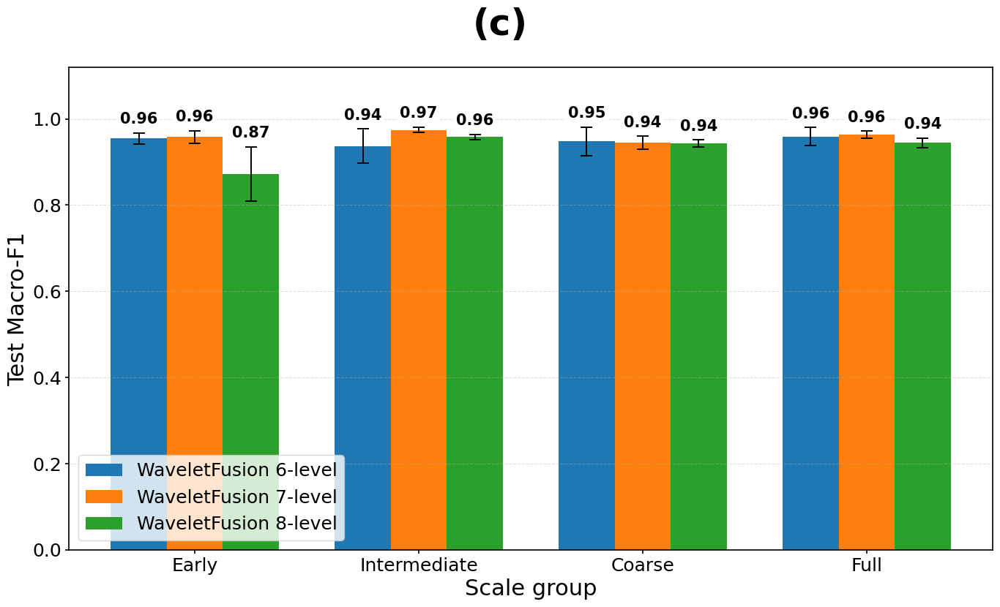

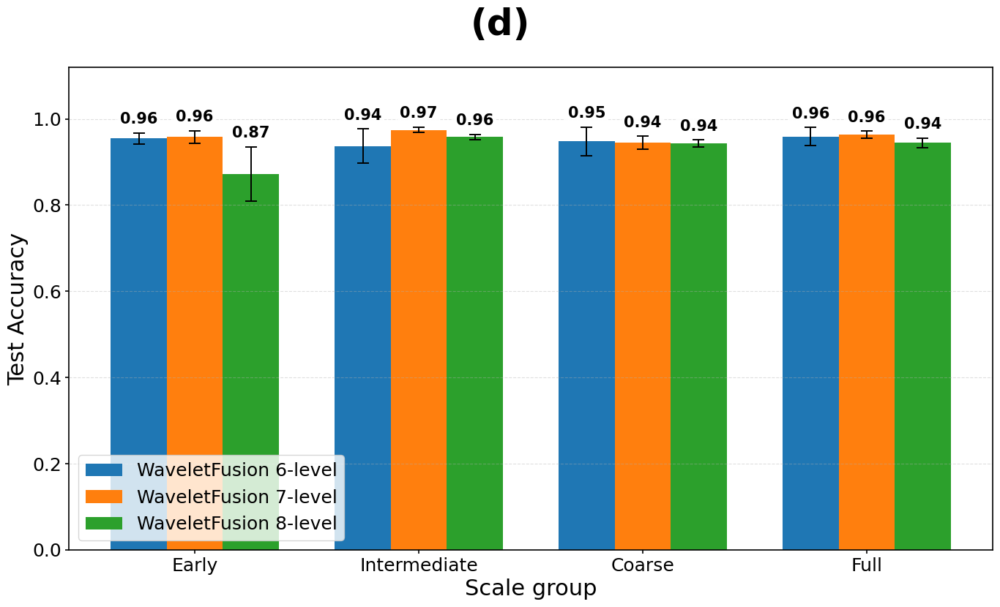

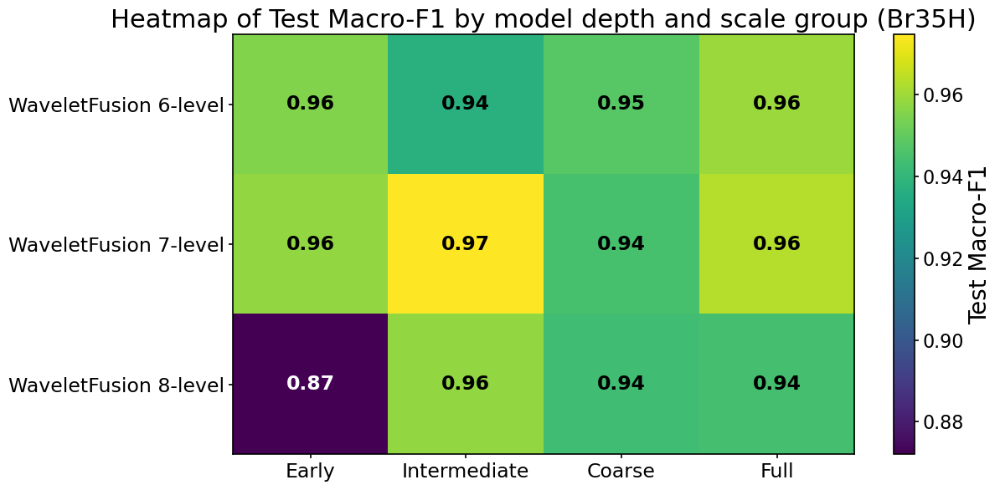

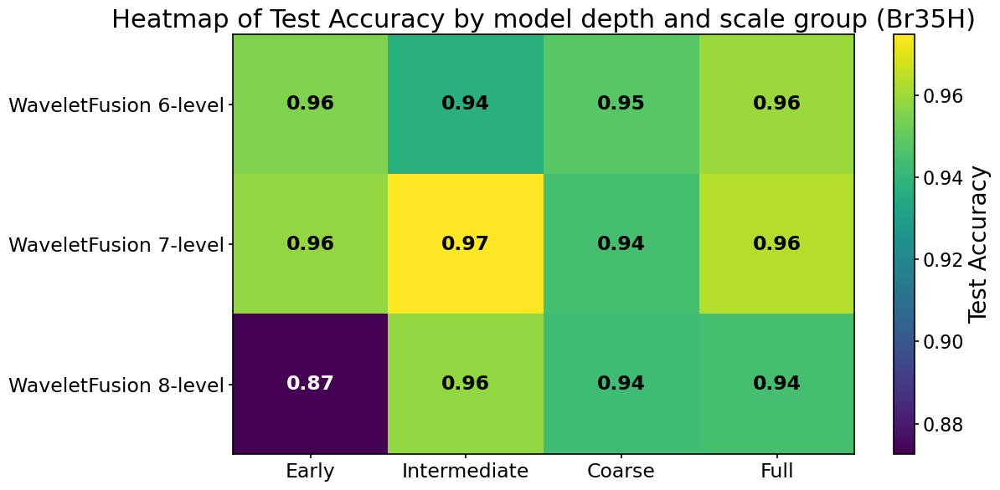


Saved all A2 Br35H figures to: ./figures_ablation_A2_summary_with_L6_br35h_2026


In [3]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

L6_CANDIDATES = [
    "./histories_ablation_A2_WF6_br35h_2026/A2_WF6_br35h_MASTER_mean_std_by_config.csv",
]

L7_CANDIDATES = [
    "./histories_ablation_A2_WF7_br35h_2026/A2_WF7_br35h_MASTER_mean_std_by_config.csv",
]

L8_CANDIDATES = [
    "./histories_ablation_A2_br35h_2026/A2_br35h_MASTER_mean_std_by_config.csv",
]

OUT_DIR = "./figures_ablation_A2_summary_with_L6_br35h_2026"
os.makedirs(OUT_DIR, exist_ok=True)

EXPORT_DPI = 600


PANEL_LABEL_SIZE = 36
BAR_VALUE_SIZE = 15

plt.rcParams.update({
    "figure.facecolor": "white",
    "axes.facecolor": "white",

    "font.size": 18,
    "axes.titlesize": 22,
    "axes.labelsize": 22,
    "xtick.labelsize": 18,
    "ytick.labelsize": 18,
    "legend.fontsize": 18,

    "axes.linewidth": 1.2,
    "xtick.major.width": 1.2,
    "ytick.major.width": 1.2,
})


def resolve_existing_path(candidates, name):
    for path in candidates:
        if os.path.exists(path):
            print(f"[Using] {name}: {path}")
            return path
    raise FileNotFoundError(
        f"Could not find {name}. Checked:\n" + "\n".join(candidates)
    )

def load_master_table(path):
    if not os.path.exists(path):
        raise FileNotFoundError(f"File not found: {path}")
    return pd.read_csv(path)

def pivot_master(df):
    p = df.pivot(index="Config", columns="Metric", values=["Mean", "Std"])
    p.columns = [f"{a}_{b}" for a, b in p.columns]
    return p.reset_index()

def rename_configs_l6(cfg):
    mapping = {
        "Early_L1_2": "Early-scale fusion (L1–L2)",
        "Middle_L3_4": "Intermediate-scale fusion (L3–L4)",
        "Coarse_L5_6": "Coarse-scale fusion (L5–L6)",
        "Full_L1_6": "Full-scale fusion (L1–L6)",
    }
    return mapping.get(cfg, cfg)

def rename_configs_l7(cfg):
    mapping = {
        "Early_L1_2": "Early-scale fusion (L1–L2)",
        "Middle_L3_5": "Intermediate-scale fusion (L3–L5)",
        "Coarse_L6_7": "Coarse-scale fusion (L6–L7)",
        "Full_L1_7": "Full-scale fusion (L1–L7)",
    }
    return mapping.get(cfg, cfg)

def rename_configs_l8(cfg):
    mapping = {
        "Fine_L1_2": "Early-scale fusion (L1–L2)",
        "Mid_L3_5": "Intermediate-scale fusion (L3–L5)",
        "Coarse_L6_8": "Coarse-scale fusion (L6–L8)",
        "All_L1_8": "Full-scale fusion (L1–L8)",
        "Early_L1_2": "Early-scale fusion (L1–L2)",
        "Middle_L3_5": "Intermediate-scale fusion (L3–L5)",
        "Full_L1_8": "Full-scale fusion (L1–L8)",
    }
    return mapping.get(cfg, cfg)

def short_scale_group(label):
    if "Early-scale" in label:
        return "Early"
    if "Intermediate-scale" in label:
        return "Intermediate"
    if "Coarse-scale" in label:
        return "Coarse"
    if "Full-scale" in label:
        return "Full"
    return label

def prepare_l6(df):
    p = pivot_master(df)
    p["ConfigLabel"] = p["Config"].apply(rename_configs_l6)
    p["ScaleGroup"] = p["ConfigLabel"].apply(short_scale_group)
    p["Depth"] = "L6"
    return p

def prepare_l7(df):
    p = pivot_master(df)
    p["ConfigLabel"] = p["Config"].apply(rename_configs_l7)
    p["ScaleGroup"] = p["ConfigLabel"].apply(short_scale_group)
    p["Depth"] = "L7"
    return p

def prepare_l8(df):
    p = pivot_master(df)
    p["ConfigLabel"] = p["Config"].apply(rename_configs_l8)
    p["ScaleGroup"] = p["ConfigLabel"].apply(short_scale_group)
    p["Depth"] = "L8"
    return p

def sort_by_scale_group(df):
    order = ["Early", "Intermediate", "Coarse", "Full"]
    df["ScaleGroup"] = pd.Categorical(df["ScaleGroup"], categories=order, ordered=True)
    return df.sort_values("ScaleGroup").reset_index(drop=True)

def save_figure(fig, base_path):
    fig.savefig(f"{base_path}.png", dpi=EXPORT_DPI, bbox_inches="tight")
    fig.savefig(f"{base_path}.pdf", bbox_inches="tight")

def annotate_bars(ax, bars, values, errors=None, fontsize=BAR_VALUE_SIZE):
    if errors is None:
        errors = np.zeros_like(values)

    for bar, val, err in zip(bars, values, errors):
        x = bar.get_x() + bar.get_width() / 2
        y = val + err + 0.015

        ax.text(
            x,
            y,
            f"{val:.2f}",
            ha="center",
            va="bottom",
            fontsize=fontsize,
            fontweight="bold",
            bbox=dict(
                boxstyle="round,pad=0.18",
                facecolor="white",
                edgecolor="none",
                alpha=0.95
            ),
            clip_on=False
        )

def add_panel_label(fig, label):
    fig.text(
        0.5,
        0.985,
        label,
        ha="center",
        va="top",
        fontsize=PANEL_LABEL_SIZE,
        fontweight="bold"
    )


L6_MASTER_PATH = resolve_existing_path(L6_CANDIDATES, "L6 master CSV")
L7_MASTER_PATH = resolve_existing_path(L7_CANDIDATES, "L7 master CSV")
L8_MASTER_PATH = resolve_existing_path(L8_CANDIDATES, "L8 master CSV")


df_l6_raw = load_master_table(L6_MASTER_PATH)
df_l7_raw = load_master_table(L7_MASTER_PATH)
df_l8_raw = load_master_table(L8_MASTER_PATH)

df_l6 = sort_by_scale_group(prepare_l6(df_l6_raw))
df_l7 = sort_by_scale_group(prepare_l7(df_l7_raw))
df_l8 = sort_by_scale_group(prepare_l8(df_l8_raw))

combined = pd.concat([df_l6, df_l7, df_l8], ignore_index=True)

summary_cols = [
    "Depth", "Config", "ConfigLabel", "ScaleGroup",
    "Mean_Test Acc", "Std_Test Acc",
    "Mean_Test Macro-F1", "Std_Test Macro-F1"
]

combined_summary = combined[summary_cols].copy()
combined_csv = os.path.join(OUT_DIR, "A2_L6_L7_L8_br35h_combined_summary.csv")
combined_summary.to_csv(combined_csv, index=False)
print(f"[Saved] {combined_csv}")


pub_rows = []

for scale in ["Early", "Intermediate", "Coarse", "Full"]:
    r6 = df_l6[df_l6["ScaleGroup"] == scale].iloc[0]
    r7 = df_l7[df_l7["ScaleGroup"] == scale].iloc[0]
    r8 = df_l8[df_l8["ScaleGroup"] == scale].iloc[0]

    pub_rows.append({
        "Scale group": scale,
        "L6 Test Accuracy": f'{r6["Mean_Test Acc"]:.2f} ± {r6["Std_Test Acc"]:.2f}',
        "L6 Test Macro-F1": f'{r6["Mean_Test Macro-F1"]:.2f} ± {r6["Std_Test Macro-F1"]:.2f}',
        "L7 Test Accuracy": f'{r7["Mean_Test Acc"]:.2f} ± {r7["Std_Test Acc"]:.2f}',
        "L7 Test Macro-F1": f'{r7["Mean_Test Macro-F1"]:.2f} ± {r7["Std_Test Macro-F1"]:.2f}',
        "L8 Test Accuracy": f'{r8["Mean_Test Acc"]:.2f} ± {r8["Std_Test Acc"]:.2f}',
        "L8 Test Macro-F1": f'{r8["Mean_Test Macro-F1"]:.2f} ± {r8["Std_Test Macro-F1"]:.2f}',
    })

pub_df = pd.DataFrame(pub_rows)
pub_csv = os.path.join(OUT_DIR, "A2_L6_L7_L8_br35h_publication_table.csv")
pub_df.to_csv(pub_csv, index=False)

print(f"[Saved] {pub_csv}")
print("\nPublication-style A2 Br35H table:")
print(pub_df.to_string(index=False))

x_labels = ["Early", "Intermediate", "Coarse", "Full"]
x = np.arange(len(x_labels))
bar_width = 0.25


l6_f1_mean = df_l6["Mean_Test Macro-F1"].to_numpy()
l6_f1_std  = df_l6["Std_Test Macro-F1"].to_numpy()

l7_f1_mean = df_l7["Mean_Test Macro-F1"].to_numpy()
l7_f1_std  = df_l7["Std_Test Macro-F1"].to_numpy()

l8_f1_mean = df_l8["Mean_Test Macro-F1"].to_numpy()
l8_f1_std  = df_l8["Std_Test Macro-F1"].to_numpy()

fig, ax = plt.subplots(figsize=(14, 8.5))

bars0 = ax.bar(
    x - bar_width,
    l6_f1_mean,
    bar_width,
    yerr=l6_f1_std,
    capsize=6,
    label="WaveletFusion 6-level",
    error_kw=dict(elinewidth=1.4, capthick=1.4)
)

bars1 = ax.bar(
    x,
    l7_f1_mean,
    bar_width,
    yerr=l7_f1_std,
    capsize=6,
    label="WaveletFusion 7-level",
    error_kw=dict(elinewidth=1.4, capthick=1.4)
)

bars2 = ax.bar(
    x + bar_width,
    l8_f1_mean,
    bar_width,
    yerr=l8_f1_std,
    capsize=6,
    label="WaveletFusion 8-level",
    error_kw=dict(elinewidth=1.4, capthick=1.4)
)

ax.set_xticks(x)
ax.set_xticklabels(x_labels)
ax.set_ylabel("Test Macro-F1", fontsize=22)
ax.set_xlabel("Scale group", fontsize=22)
ax.legend(loc="lower left", fontsize=18)
ax.grid(axis="y", linestyle="--", alpha=0.4)

max_f1 = np.max(np.concatenate([
    l6_f1_mean + l6_f1_std,
    l7_f1_mean + l7_f1_std,
    l8_f1_mean + l8_f1_std
]))

ax.set_ylim(0.0, min(1.12, max_f1 + 0.14))

annotate_bars(ax, bars0, l6_f1_mean, l6_f1_std)
annotate_bars(ax, bars1, l7_f1_mean, l7_f1_std)
annotate_bars(ax, bars2, l8_f1_mean, l8_f1_std)

add_panel_label(fig, "(c)")

plt.tight_layout(rect=[0, 0, 1, 0.92])

save_figure(
    fig,
    os.path.join(OUT_DIR, "A2_grouped_test_macro_f1_L6_L7_L8_br35h")
)

plt.show()


l6_acc_mean = df_l6["Mean_Test Acc"].to_numpy()
l6_acc_std  = df_l6["Std_Test Acc"].to_numpy()

l7_acc_mean = df_l7["Mean_Test Acc"].to_numpy()
l7_acc_std  = df_l7["Std_Test Acc"].to_numpy()

l8_acc_mean = df_l8["Mean_Test Acc"].to_numpy()
l8_acc_std  = df_l8["Std_Test Acc"].to_numpy()

fig, ax = plt.subplots(figsize=(14, 8.5))

bars0 = ax.bar(
    x - bar_width,
    l6_acc_mean,
    bar_width,
    yerr=l6_acc_std,
    capsize=6,
    label="WaveletFusion 6-level",
    error_kw=dict(elinewidth=1.4, capthick=1.4)
)

bars1 = ax.bar(
    x,
    l7_acc_mean,
    bar_width,
    yerr=l7_acc_std,
    capsize=6,
    label="WaveletFusion 7-level",
    error_kw=dict(elinewidth=1.4, capthick=1.4)
)

bars2 = ax.bar(
    x + bar_width,
    l8_acc_mean,
    bar_width,
    yerr=l8_acc_std,
    capsize=6,
    label="WaveletFusion 8-level",
    error_kw=dict(elinewidth=1.4, capthick=1.4)
)

ax.set_xticks(x)
ax.set_xticklabels(x_labels)
ax.set_ylabel("Test Accuracy", fontsize=22)
ax.set_xlabel("Scale group", fontsize=22)
ax.legend(loc="lower left", fontsize=18)
ax.grid(axis="y", linestyle="--", alpha=0.4)

max_acc = np.max(np.concatenate([
    l6_acc_mean + l6_acc_std,
    l7_acc_mean + l7_acc_std,
    l8_acc_mean + l8_acc_std
]))

ax.set_ylim(0.0, min(1.12, max_acc + 0.14))

annotate_bars(ax, bars0, l6_acc_mean, l6_acc_std)
annotate_bars(ax, bars1, l7_acc_mean, l7_acc_std)
annotate_bars(ax, bars2, l8_acc_mean, l8_acc_std)

add_panel_label(fig, "(d)")

plt.tight_layout(rect=[0, 0, 1, 0.92])

save_figure(
    fig,
    os.path.join(OUT_DIR, "A2_grouped_test_accuracy_L6_L7_L8_br35h")
)

plt.show()


heatmap_f1 = pd.DataFrame(
    [l6_f1_mean, l7_f1_mean, l8_f1_mean],
    index=[
        "WaveletFusion 6-level",
        "WaveletFusion 7-level",
        "WaveletFusion 8-level"
    ],
    columns=x_labels
)

heatmap_acc = pd.DataFrame(
    [l6_acc_mean, l7_acc_mean, l8_acc_mean],
    index=[
        "WaveletFusion 6-level",
        "WaveletFusion 7-level",
        "WaveletFusion 8-level"
    ],
    columns=x_labels
)

def plot_heatmap(df_heat, title, cbar_label, out_name):
    fig, ax = plt.subplots(figsize=(12.5, 6.2))

    im = ax.imshow(df_heat.values, aspect="auto")

    cbar = plt.colorbar(im, ax=ax)
    cbar.ax.set_ylabel(cbar_label, fontsize=20)
    cbar.ax.tick_params(labelsize=16)

    ax.set_xticks(np.arange(df_heat.shape[1]))
    ax.set_yticks(np.arange(df_heat.shape[0]))
    ax.set_xticklabels(df_heat.columns, fontsize=17)
    ax.set_yticklabels(df_heat.index, fontsize=17)
    ax.set_title(title, fontsize=22)

    vmax = np.max(df_heat.values)
    vmin = np.min(df_heat.values)
    threshold = (vmax + vmin) / 2.0

    for i in range(df_heat.shape[0]):
        for j in range(df_heat.shape[1]):
            val = df_heat.values[i, j]

            ax.text(
                j,
                i,
                f"{val:.2f}",
                ha="center",
                va="center",
                color="white" if val < threshold else "black",
                fontsize=17,
                fontweight="bold"
            )

    plt.tight_layout()

    base = os.path.join(OUT_DIR, out_name.replace(".png", ""))
    save_figure(fig, base)

    plt.show()

plot_heatmap(
    heatmap_f1,
    title="Heatmap of Test Macro-F1 by model depth and scale group (Br35H)",
    cbar_label="Test Macro-F1",
    out_name="A2_heatmap_test_macro_f1_L6_L7_L8_br35h.png"
)

plot_heatmap(
    heatmap_acc,
    title="Heatmap of Test Accuracy by model depth and scale group (Br35H)",
    cbar_label="Test Accuracy",
    out_name="A2_heatmap_test_accuracy_L6_L7_L8_br35h.png"
)

print(f"\nSaved all A2 Br35H figures to: {OUT_DIR}")

# Confusion matrix - Brain Tumor MRI

In [15]:
import os
import numpy as np
import matplotlib.pyplot as plt

# ================== Config ==================
HIST_DIR = "./histories2026"

OUT_DIR = os.path.join(HIST_DIR, "confusion_matrices_clean_titles_same_size")
os.makedirs(OUT_DIR, exist_ok=True)

cm_files = {
    "(a)\nBaseline CNN": os.path.join(HIST_DIR, "baseline_cm_test_seed43.npy"),
    "(b)\nWaveletFusion 7-level": os.path.join(HIST_DIR, "wavelet7_cm_test_seed45_multilevel_details.npy"),
    "(c)\nWaveletFusion 8-level": os.path.join(HIST_DIR, "wavelet8_cm_test_seed42_multilevel_details.npy"),
}

class_names_path = os.path.join(HIST_DIR, "class_names.npy")

if os.path.exists(class_names_path):
    class_names = np.load(class_names_path, allow_pickle=True).tolist()
else:
    class_names = ["glioma", "meningioma", "notumor", "pituitary"]


def save_confusion_matrix_png(cm, class_names, title, out_path):

    plt.rcParams.update(plt.rcParamsDefault)

    plt.rcParams.update({"font.size": 14})


    fig, ax = plt.subplots(figsize=(7.2, 6.2))

    vmax = cm.max() if cm.max() > 0 else 1

    im = ax.imshow(
        cm,
        interpolation="nearest",
        cmap=plt.cm.Blues,
        vmin=0,
        vmax=vmax
    )

    cbar = plt.colorbar(im, ax=ax)
    cbar.ax.set_ylabel("Number of samples")

    ticks = np.arange(len(class_names))

    ax.set_xticks(ticks)
    ax.set_yticks(ticks)

    ax.set_xticklabels(class_names, rotation=45, ha="right")
    ax.set_yticklabels(class_names)

    ax.set_ylabel("True label")
    ax.set_xlabel("Predicted label")


    ax.set_title(title)

    thresh = vmax / 2.0

    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(
                j,
                i,
                str(cm[i, j]),
                ha="center",
                va="center",
                color="white" if cm[i, j] > thresh else "black"
            )

    plt.tight_layout()
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)



for title, cm_path in cm_files.items():
    cm = np.load(cm_path)


    out_name = (
        title.replace("\n", "_")
        .lower()
        .replace("(a)_", "a_")
        .replace("(b)_", "b_")
        .replace("(c)_", "c_")
        .replace(" ", "_")
        .replace("-", "_")
        + "_cm.png"
    )
    out_path = os.path.join(OUT_DIR, out_name)

    save_confusion_matrix_png(
        cm=cm,
        class_names=class_names,
        title=title,
        out_path=out_path
    )

    print(f"Saved: {out_path}")

print(f"\nDone. Clean confusion matrices saved in: {OUT_DIR}")

Saved: ./histories2026/confusion_matrices_clean_titles_same_size/a_baseline_cnn_cm.png
Saved: ./histories2026/confusion_matrices_clean_titles_same_size/b_waveletfusion_7_level_cm.png
Saved: ./histories2026/confusion_matrices_clean_titles_same_size/c_waveletfusion_8_level_cm.png

Done. Clean confusion matrices saved in: ./histories2026/confusion_matrices_clean_titles_same_size


In [19]:
import os
import numpy as np
import matplotlib.pyplot as plt

# ================== Config ==================
OUT_DIR = "./br35h_selected_confusion_matrices_clean_titles"
os.makedirs(OUT_DIR, exist_ok=True)

HEAD_MODE = "multilevel_details"

cm_files = {
    "(b)\nWaveletFusion 7-level": {
        "cm_path": f"./Histories2026_br35h_wavelet7/wavelet7_br35h_cm_test_seed42_{HEAD_MODE}.npy",
        "class_names_path": "./Histories2026_br35h_wavelet7/class_names.npy",
        "out_name": "c_waveletfusion_7_level_cm.png",
    },
    "(c)\nWaveletFusion 8-level": {
        "cm_path": f"./ArticleHistories_br35h_wavelet8/wavelet8_br35h_cm_test_seed42_{HEAD_MODE}.npy",
        "class_names_path": "./ArticleHistories_br35h_wavelet8/class_names.npy",
        "out_name": "d_waveletfusion_8_level_cm.png",
    },
    "(a)\nBaseline CNN": {
        "cm_path": "./Histories2026_br35h_baseline/baseline_br35h_cm_test_seed45.npy",
        "class_names_path": None,
        "out_name": "e_baseline_cm.png",
    },
}


def save_confusion_matrix_png(cm, class_names, title, out_path):
    plt.rcParams.update(plt.rcParamsDefault)
    plt.rcParams.update({"font.size": 16})

    fig, ax = plt.subplots(figsize=(7.2, 6.2))

    vmax = cm.max() if cm.max() > 0 else 1

    im = ax.imshow(
        cm,
        interpolation="nearest",
        cmap=plt.cm.Blues,
        vmin=0,
        vmax=vmax
    )

    cbar = plt.colorbar(im, ax=ax)
    cbar.ax.set_ylabel("Number of samples")

    ticks = np.arange(len(class_names))
    ax.set_xticks(ticks)
    ax.set_yticks(ticks)

    ax.set_xticklabels(class_names, rotation=45, ha="right")
    ax.set_yticklabels(class_names)

    ax.set_ylabel("True label")
    ax.set_xlabel("Predicted label")


    ax.set_title(title)

    thresh = vmax / 2.0

    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(
                j,
                i,
                str(cm[i, j]),
                ha="center",
                va="center",
                color="white" if cm[i, j] > thresh else "black"
            )

    plt.tight_layout()
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close(fig)



for title, info in cm_files.items():
    cm_path = info["cm_path"]

    if not os.path.exists(cm_path):
        print(f"[MISSING] {cm_path}")
        continue

    cm = np.load(cm_path)

    class_names_path = info["class_names_path"]

    if class_names_path is not None and os.path.exists(class_names_path):
        class_names = np.load(class_names_path, allow_pickle=True).tolist()
    else:
        class_names = ["no", "yes"]

    out_path = os.path.join(OUT_DIR, info["out_name"])

    save_confusion_matrix_png(
        cm=cm,
        class_names=class_names,
        title=title,
        out_path=out_path
    )

    print(f"Saved: {out_path}")

print(f"\nDone. Selected Br35H confusion matrices saved in: {OUT_DIR}")

Saved: ./br35h_selected_confusion_matrices_clean_titles/c_waveletfusion_7_level_cm.png
Saved: ./br35h_selected_confusion_matrices_clean_titles/d_waveletfusion_8_level_cm.png
Saved: ./br35h_selected_confusion_matrices_clean_titles/e_baseline_cm.png

Done. Selected Br35H confusion matrices saved in: ./br35h_selected_confusion_matrices_clean_titles


In [ ]:
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"

import gc
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import itertools

from tensorflow.keras import layers


TEST_DIR = "./Testing"

IMG_SIZE = 256
BATCH = 32
AUTOTUNE = tf.data.AUTOTUNE

HEAD_MODE = "multilevel_details"
RUN_SEEDS = [42, 43, 44, 45, 46]


OLD_OUT_ROOT = "./111wavelet8_xai_supervisor_revision_input_plus_singlecam"


NEW_OUT_ROOT = "./111wavelet8_xai_supervisor_revision_input_plus_singlecam_HIGHRES_REEXPORT"
os.makedirs(NEW_OUT_ROOT, exist_ok=True)

# XAI settings
XAI_LAYERS = [
    "backbone_block1_relu2",
    "backbone_block2_relu2",
    "backbone_block3_relu2",
    "backbone_block4_relu2",
    "backbone_block5_relu2",
]

XAI_CLASS_ORDER = ["glioma", "meningioma", "notumor", "pituitary"]
XAI_SELECTION_POOL = 10
XAI_TRY_MATCH_VIEW = True

MAIN_CAM_PANEL_MODE = "overlay"   
GRADCAM_ALPHA = 0.40


EXPORT_DPI = 600
SAVE_PDF = True
SAVE_SVG = True


CELL_WIDTH = 3.35
CELL_HEIGHT = 3.85

COLUMN_TITLE_SIZE = 17
ROW_LABEL_SIZE = 13
FIGURE_TITLE_SIZE = 20

INCLUDE_FIGURE_TITLE = True

if MAIN_CAM_PANEL_MODE not in {"overlay", "raw"}:
    raise ValueError("MAIN_CAM_PANEL_MODE must be 'overlay' or 'raw'.")



def configure_tensorflow_runtime():
    gpus = tf.config.list_physical_devices("GPU")
    if gpus:
        try:
            tf.config.set_visible_devices(gpus[0], "GPU")
            tf.config.experimental.set_memory_growth(gpus[0], True)
            print(f"[Runtime] Using GPU: {gpus[0].name}")
        except RuntimeError as e:
            print(f"[Runtime][WARN] Could not configure GPU: {e}")
    else:
        print("[Runtime] No GPU detected. Using CPU.")


configure_tensorflow_runtime()



def per_image_standardize_batch(x):
    out_dtype = x.dtype
    x32 = tf.cast(x, tf.float32)
    y32 = tf.map_fn(
        tf.image.per_image_standardization,
        x32,
        fn_output_signature=tf.float32
    )
    return tf.cast(y32, out_dtype)


class HaarWavelet2D(layers.Layer):
    def build(self, input_shape):
        if int(input_shape[-1]) != 1:
            raise ValueError(
                f"HaarWavelet2D expects single-channel input, got {input_shape[-1]}."
            )

        ll = np.array([[0.5,  0.5],
                       [0.5,  0.5]], dtype="float32")
        lh = np.array([[ 0.5,  0.5],
                       [-0.5, -0.5]], dtype="float32")
        hl = np.array([[ 0.5, -0.5],
                       [ 0.5, -0.5]], dtype="float32")
        hh = np.array([[ 0.5, -0.5],
                       [-0.5,  0.5]], dtype="float32")

        k = np.stack([ll, lh, hl, hh], axis=-1).reshape((2, 2, 1, 4))
        self.kernel = tf.constant(k, dtype=tf.float32)
        super().build(input_shape)

    def call(self, inputs):
        x = tf.cast(inputs, tf.float32)
        y = tf.nn.conv2d(x, self.kernel, strides=[1, 2, 2, 1], padding="SAME")
        ll, lh, hl, hh = tf.split(y, 4, axis=-1)
        return ll, lh, hl, hh


CUSTOM_OBJECTS = {
    "HaarWavelet2D": HaarWavelet2D,
    "per_image_standardize_batch": per_image_standardize_batch,
}


def load_saved_model(model_path):
    if not os.path.exists(model_path):
        raise FileNotFoundError(f"Saved model not found: {model_path}")

    print(f"[Load model] {model_path}")

    try:
        model = tf.keras.models.load_model(
            model_path,
            custom_objects=CUSTOM_OBJECTS,
            compile=False,
            safe_mode=False
        )
    except TypeError:
        model = tf.keras.models.load_model(
            model_path,
            custom_objects=CUSTOM_OBJECTS,
            compile=False
        )

    return model



def make_test_dataset():
    test_ds_raw = tf.keras.preprocessing.image_dataset_from_directory(
        TEST_DIR,
        labels="inferred",
        label_mode="categorical",
        color_mode="grayscale",
        image_size=(IMG_SIZE, IMG_SIZE),
        batch_size=BATCH,
        shuffle=False,
        interpolation="bilinear",
        crop_to_aspect_ratio=True
    )

    class_names = test_ds_raw.class_names
    test_ds = test_ds_raw.cache().prefetch(AUTOTUNE)

    return test_ds, class_names



def normalize_gray(img_hw1):
    img = img_hw1[..., 0].astype(np.float32)
    mn, mx = float(np.min(img)), float(np.max(img))

    if mx - mn < 1e-8:
        return np.zeros_like(img, dtype=np.float32)

    return (img - mn) / (mx - mn)


def overlay_cam(gray_img, cam, alpha=0.40):
    cmap = plt.get_cmap("jet")
    cam_rgb = cmap(np.uint8(255 * np.clip(cam, 0, 1)))[..., :3]
    gray_rgb = np.stack([gray_img, gray_img, gray_img], axis=-1)
    return np.clip((1 - alpha) * gray_rgb + alpha * cam_rgb, 0, 1)


def cam_to_display(gray_img, cam, mode="overlay"):
    if mode == "overlay":
        return overlay_cam(gray_img, cam, alpha=GRADCAM_ALPHA), None

    if mode == "raw":
        return cam, "jet"

    raise ValueError("mode must be 'overlay' or 'raw'.")


def short_block_name(layer_name):
    layer_name = layer_name.replace("backbone_", "")
    layer_name = layer_name.replace("_relu2", "")
    layer_name = layer_name.replace("block", "B")
    return layer_name


# ============================================================
# Class helpers
# ============================================================
def canonical_name(name: str) -> str:
    s = str(name).strip().lower().replace("-", "").replace("_", "").replace(" ", "")

    mapping = {
        "notumor": "notumor",
        "notumour": "notumor",
        "normal": "notumor",
        "glioma": "glioma",
        "meningioma": "meningioma",
        "pituitary": "pituitary",
    }

    return mapping.get(s, s)


def pretty_class_name(name: str) -> str:
    cname = canonical_name(name)

    if cname == "notumor":
        return "no-tumor"

    return cname


def resolve_class_order_indices(class_names, preferred_order):
    canonical_to_idx = {
        canonical_name(c): i
        for i, c in enumerate(class_names)
    }

    indices = []

    for cname in preferred_order:
        cc = canonical_name(cname)

        if cc not in canonical_to_idx:
            raise ValueError(
                f"Requested class '{cname}' not found in dataset class_names={class_names}"
            )

        indices.append(canonical_to_idx[cc])

    return indices



def class_logit_from_fused_feature(model, fused_feat, class_idx):
    dense_layer = model.get_layer("head_dense_128")
    z = dense_layer(fused_feat, training=False)

    pred_layer = model.get_layer("predictions")
    kernel, bias = pred_layer.get_weights()

    k = tf.convert_to_tensor(kernel[:, class_idx], dtype=z.dtype)
    b = tf.convert_to_tensor(bias[class_idx], dtype=z.dtype)

    return tf.linalg.matvec(z, k) + b


def build_gradcam_model(model, target_layer_name):
    target_layer = model.get_layer(target_layer_name)

    layer_names = [l.name for l in model.layers]

    if "multilevel_details_concat" in layer_names:
        feat_layer = model.get_layer("multilevel_details_concat")
    else:
        feat_layer = model.get_layer("gap_deepest_backbone")

    return tf.keras.Model(
        model.input,
        [target_layer.output, feat_layer.output, model.output],
        name=f"gradcam_model_{target_layer_name}"
    )


def make_gradcam_raw(model, img_tensor, target_layer_name, class_idx):
    grad_model = build_gradcam_model(model, target_layer_name)

    with tf.GradientTape() as tape:
        fmap, fused_feat, preds = grad_model(img_tensor, training=False)
        score = class_logit_from_fused_feature(model, fused_feat, int(class_idx))

    grads = tape.gradient(score, fmap)

    fmap = fmap[0]
    grads = grads[0]

    weights = tf.reduce_mean(grads, axis=(0, 1))
    cam = tf.reduce_sum(fmap * weights[tf.newaxis, tf.newaxis, :], axis=-1)
    cam = tf.nn.relu(cam)

    cam_up = tf.image.resize(
        cam[..., None],
        (IMG_SIZE, IMG_SIZE),
        method="bilinear"
    )

    cam_up = tf.squeeze(cam_up, axis=-1).numpy().astype(np.float32)
    cam_up = np.maximum(cam_up, 0.0)

    if cam_up.max() > 1e-8:
        cam_up /= cam_up.max()

    return cam_up, preds[0].numpy()



def robust_gray_for_shape(img_hw1):
    g = img_hw1[..., 0].astype(np.float32)

    p1 = float(np.percentile(g, 1.0))
    p99 = float(np.percentile(g, 99.0))

    if p99 - p1 < 1e-8:
        return normalize_gray(img_hw1)

    g = np.clip((g - p1) / (p99 - p1), 0.0, 1.0)
    return g


def pooled_profile(vec, bins=8):
    chunks = np.array_split(np.asarray(vec, dtype=np.float32), bins)
    return np.array(
        [float(np.mean(c)) if len(c) > 0 else 0.0 for c in chunks],
        dtype=np.float32
    )


def image_view_features(img_hw1):
    g = robust_gray_for_shape(img_hw1)

    thr = max(0.08, float(np.quantile(g, 0.70)) * 0.35)
    mask = g > thr

    if mask.sum() < 16:
        return np.zeros(23, dtype=np.float32)

    ys, xs = np.where(mask)

    y0, y1 = int(ys.min()), int(ys.max()) + 1
    x0, x1 = int(xs.min()), int(xs.max()) + 1

    crop = g[y0:y1, x0:x1]
    crop_mask = mask[y0:y1, x0:x1]

    h, w = crop.shape

    area_frac = float(mask.mean())
    bbox_fill = float(crop_mask.mean())
    aspect_hw = float(h / (w + 1e-8))
    cx = float(xs.mean() / g.shape[1])
    cy = float(ys.mean() / g.shape[0])

    if w >= 2:
        mid = w // 2
        left = crop[:, :mid]
        right = np.fliplr(crop[:, w - mid:])
        m = min(left.shape[1], right.shape[1])
        lr_sym = float(np.mean(np.abs(left[:, :m] - right[:, :m]))) if m > 0 else 1.0
    else:
        lr_sym = 1.0

    if h >= 2:
        mid = h // 2
        top = crop[:mid, :]
        bottom = np.flipud(crop[h - mid:, :])
        m = min(top.shape[0], bottom.shape[0])
        tb_sym = float(np.mean(np.abs(top[:m, :] - bottom[:m, :]))) if m > 0 else 1.0
    else:
        tb_sym = 1.0

    proj_x = pooled_profile(crop_mask.mean(axis=0), bins=8)
    proj_y = pooled_profile(crop_mask.mean(axis=1), bins=8)

    feat = np.concatenate([
        np.array(
            [area_frac, bbox_fill, aspect_hw, cx, cy, lr_sym, tb_sym],
            dtype=np.float32
        ),
        proj_x,
        proj_y,
    ])

    return feat.astype(np.float32)


def estimate_view_group(img_hw1):
    feat = image_view_features(img_hw1)

    if np.allclose(feat, 0):
        return "unknown"

    aspect_hw = float(feat[2])
    bbox_fill = float(feat[1])

    if aspect_hw >= 1.12:
        return "coronal_like"

    if 0.88 <= aspect_hw < 1.12:
        return "axial_like"

    if bbox_fill < 0.45:
        return "other_like"

    return "axial_like"


def pairwise_feature_distance(examples):
    feats = [e["view_feat"] for e in examples]

    d = 0.0

    for i in range(len(feats)):
        for j in range(i + 1, len(feats)):
            d += float(np.linalg.norm(feats[i] - feats[j]))

    return d


def collect_examples_with_predictions(model, ds):
    rows = []
    ex_id = 0

    for xb, yb in ds:
        probs = model.predict(xb, verbose=0)

        y_true = np.argmax(yb.numpy(), axis=1)
        y_pred = np.argmax(probs, axis=1)

        for i in range(xb.shape[0]):
            img_np = xb[i].numpy()

            rows.append({
                "example_id": ex_id,
                "image": img_np,
                "true_idx": int(y_true[i]),
                "pred_idx": int(y_pred[i]),
                "pred_conf": float(probs[i, y_pred[i]]),
                "true_conf": float(probs[i, y_true[i]]),
                "probs": probs[i].astype(np.float32),
                "is_correct": int(y_true[i] == y_pred[i]),
                "view_feat": image_view_features(img_np),
                "view_group": estimate_view_group(img_np),
            })

            ex_id += 1

    return rows


def build_candidate_pools(rows, class_indices, correct_flag, pool_size):
    pools = []

    for cls in class_indices:
        subset = [
            r for r in rows
            if r["true_idx"] == cls and r["is_correct"] == int(correct_flag)
        ]

        subset = sorted(subset, key=lambda x: x["pred_conf"], reverse=True)
        subset = subset[:pool_size]

        for rank, r in enumerate(subset):
            r["pool_rank"] = rank

        pools.append(subset)

    return pools


def _best_combo_from_pools(pools):
    best_combo = None
    best_score = None

    for combo in itertools.product(*pools):
        combo = list(combo)

        view_score = pairwise_feature_distance(combo)
        rank_penalty = sum(float(e.get("pool_rank", 0)) for e in combo) / max(1, len(combo))

        score = view_score + 0.10 * rank_penalty

        if best_score is None or score < best_score:
            best_score = score
            best_combo = combo

    return best_combo, best_score


def choose_one_example_per_class(
    rows,
    class_indices,
    correct_flag,
    pool_size=12,
    try_match_view=True
):
    pools = build_candidate_pools(
        rows,
        class_indices,
        correct_flag=correct_flag,
        pool_size=pool_size
    )

    if any(len(p) == 0 for p in pools):
        return []

    if not try_match_view:
        return [p[0] for p in pools]

    common_groups = set.intersection(
        *[set(e["view_group"] for e in p) for p in pools]
    )

    best_combo = None
    best_score = None

    for group in sorted(common_groups):
        grouped_pools = []
        valid = True

        for p in pools:
            subset = [e for e in p if e["view_group"] == group]

            if len(subset) == 0:
                valid = False
                break

            grouped_pools.append(subset)

        if not valid:
            continue

        combo, score = _best_combo_from_pools(grouped_pools)

        if combo is not None and (best_score is None or score < best_score):
            best_combo = combo
            best_score = score

    if best_combo is not None:
        return best_combo

    combo, _ = _best_combo_from_pools(pools)

    if combo is not None:
        return combo

    return [p[0] for p in pools]



def save_figure_multi(fig, out_png):
    fig.savefig(
        out_png,
        dpi=EXPORT_DPI,
        bbox_inches="tight",
        facecolor="white"
    )
    print("[Saved]", out_png)

    if SAVE_PDF:
        out_pdf = os.path.splitext(out_png)[0] + ".pdf"
        fig.savefig(
            out_pdf,
            bbox_inches="tight",
            facecolor="white"
        )
        print("[Saved]", out_pdf)

    if SAVE_SVG:
        out_svg = os.path.splitext(out_png)[0] + ".svg"
        fig.savefig(
            out_svg,
            bbox_inches="tight",
            facecolor="white"
        )
        print("[Saved]", out_svg)


def save_composite_input_and_cam_grid_highres(
    examples,
    model,
    class_names,
    layers_for_cam,
    out_path,
    target_mode="pred",
    figure_title=None,
    cam_mode="overlay"
):
    if len(examples) == 0:
        return

    nrows = len(examples)
    ncols = 1 + len(layers_for_cam)

    fig, axes = plt.subplots(
        nrows,
        ncols,
        figsize=(CELL_WIDTH * ncols, CELL_HEIGHT * nrows)
    )

    if nrows == 1:
        axes = np.expand_dims(axes, axis=0)

    if ncols == 1:
        axes = np.expand_dims(axes, axis=1)

    # Column headers
    axes[0, 0].set_title("Input", fontsize=COLUMN_TITLE_SIZE, pad=10)

    for c, layer_name in enumerate(layers_for_cam, start=1):
        axes[0, c].set_title(
            f"{short_block_name(layer_name)}\n{cam_mode.capitalize()}",
            fontsize=COLUMN_TITLE_SIZE,
            pad=10
        )

    for r, ex in enumerate(examples):
        img_hw1 = ex["image"]
        gray = normalize_gray(img_hw1)
        x = tf.convert_to_tensor(img_hw1[None, ...], dtype=tf.float32)

        true_idx = ex["true_idx"]
        pred_idx = ex["pred_idx"]
        true_prob = ex["true_conf"]
        pred_prob = ex["pred_conf"]

        if target_mode == "pred":
            target_idx = pred_idx
            target_tag = "pred"
        elif target_mode == "true":
            target_idx = true_idx
            target_tag = "true"
        else:
            raise ValueError("target_mode must be 'pred' or 'true'.")

        row_label = (
            f"True: {pretty_class_name(class_names[true_idx])} ({true_prob:.3f})\n"
            f"Pred: {pretty_class_name(class_names[pred_idx])} ({pred_prob:.3f})"
        )

        if ex["is_correct"] == 0:
            row_label += f"\nCAM target: {target_tag}"

        axes[r, 0].imshow(gray, cmap="gray", interpolation="bilinear")
        axes[r, 0].axis("off")

        axes[r, 0].text(
            -0.20,
            0.5,
            row_label,
            transform=axes[r, 0].transAxes,
            rotation=90,
            va="center",
            ha="center",
            fontsize=ROW_LABEL_SIZE
        )

        for c, layer_name in enumerate(layers_for_cam, start=1):
            cam_up, _ = make_gradcam_raw(
                model=model,
                img_tensor=x,
                target_layer_name=layer_name,
                class_idx=target_idx
            )

            disp_img, disp_cmap = cam_to_display(
                gray,
                cam_up,
                mode=cam_mode
            )

            if disp_cmap is None:
                axes[r, c].imshow(disp_img, interpolation="bilinear")
            else:
                axes[r, c].imshow(
                    disp_img,
                    cmap=disp_cmap,
                    vmin=0,
                    vmax=1,
                    interpolation="bilinear"
                )

            axes[r, c].axis("off")

    if INCLUDE_FIGURE_TITLE and figure_title is not None:
        fig.suptitle(
            figure_title,
            fontsize=FIGURE_TITLE_SIZE,
            y=0.995
        )
        plt.tight_layout(rect=[0.055, 0.015, 1.0, 0.965])
    else:
        plt.tight_layout(rect=[0.055, 0.015, 1.0, 1.0])

    save_figure_multi(fig, out_path)

    plt.close(fig)



def regenerate_xai_for_seed(run_seed):
    print(f"\n================= HIGH-RES XAI RE-EXPORT | SEED {run_seed} =================")

    old_seed_dir = os.path.join(
        OLD_OUT_ROOT,
        f"seed{run_seed}_{HEAD_MODE}"
    )

    model_path = os.path.join(
        old_seed_dir,
        f"wavelet8_model_seed{run_seed}_{HEAD_MODE}.keras"
    )

    new_seed_dir = os.path.join(
        NEW_OUT_ROOT,
        f"seed{run_seed}_{HEAD_MODE}"
    )

    main_dir = os.path.join(new_seed_dir, "xai_highres", "main_figures")
    os.makedirs(main_dir, exist_ok=True)

    tf.keras.backend.clear_session()
    gc.collect()

    model = load_saved_model(model_path)

    test_ds, class_names = make_test_dataset()

    saved_class_names_path = os.path.join(OLD_OUT_ROOT, "class_names.npy")
    if os.path.exists(saved_class_names_path):
        saved_class_names = list(np.load(saved_class_names_path, allow_pickle=True))

        if list(saved_class_names) != list(class_names):
            print("[WARN] Saved class_names.npy differs from current Testing folder class order.")
            print("Saved:", saved_class_names)
            print("Current:", class_names)

    print("[XAI] Class names:", class_names)
    print("[XAI] Collecting predictions from test set...")

    rows_all = collect_examples_with_predictions(model, test_ds)

    class_indices_ordered = resolve_class_order_indices(
        class_names,
        XAI_CLASS_ORDER
    )

    correct_examples = choose_one_example_per_class(
        rows_all,
        class_indices=class_indices_ordered,
        correct_flag=True,
        pool_size=XAI_SELECTION_POOL,
        try_match_view=XAI_TRY_MATCH_VIEW
    )

    wrong_examples = choose_one_example_per_class(
        rows_all,
        class_indices=class_indices_ordered,
        correct_flag=False,
        pool_size=XAI_SELECTION_POOL,
        try_match_view=XAI_TRY_MATCH_VIEW
    )

    summary_rows = []

    # ---------------- Correct examples ----------------
    if len(correct_examples) == len(class_indices_ordered):
        out_path = os.path.join(
            main_dir,
            "Fig45_correct_all_classes_overlay_HIGHRES.png"
        )

        save_composite_input_and_cam_grid_highres(
            examples=correct_examples,
            model=model,
            class_names=class_names,
            layers_for_cam=XAI_LAYERS,
            out_path=out_path,
            target_mode="pred",
            figure_title="Correctly classified representative examples",
            cam_mode=MAIN_CAM_PANEL_MODE
        )

        print("[XAI] Saved high-res correct figure.")

        for ex in correct_examples:
            summary_rows.append({
                "figure_group": "correct_combined",
                "example_id": ex["example_id"],
                "true_class": class_names[ex["true_idx"]],
                "pred_class": class_names[ex["pred_idx"]],
                "pred_confidence": ex["pred_conf"],
                "true_class_probability": ex["true_conf"],
                "is_correct": ex["is_correct"],
                "view_group": ex["view_group"],
            })
    else:
        print("[WARN] Could not select one correct example per class.")

    # ---------------- Wrong examples: predicted class target ----------------
    if len(wrong_examples) == len(class_indices_ordered):
        out_path_pred = os.path.join(
            main_dir,
            "Fig47_wrong_target_predicted_class_overlay_HIGHRES.png"
        )

        save_composite_input_and_cam_grid_highres(
            examples=wrong_examples,
            model=model,
            class_names=class_names,
            layers_for_cam=XAI_LAYERS,
            out_path=out_path_pred,
            target_mode="pred",
            figure_title="Incorrectly classified representative examples – Grad-CAM targeted to the predicted class",
            cam_mode=MAIN_CAM_PANEL_MODE
        )

        print("[XAI] Saved high-res wrong/predicted-class figure.")

        # ---------------- Wrong examples: true class target ----------------
        out_path_true = os.path.join(
            main_dir,
            "Fig48_wrong_target_true_class_overlay_HIGHRES.png"
        )

        save_composite_input_and_cam_grid_highres(
            examples=wrong_examples,
            model=model,
            class_names=class_names,
            layers_for_cam=XAI_LAYERS,
            out_path=out_path_true,
            target_mode="true",
            figure_title="Incorrectly classified representative examples – Grad-CAM targeted to the true class",
            cam_mode=MAIN_CAM_PANEL_MODE
        )

        print("[XAI] Saved high-res wrong/true-class figure.")

        for ex in wrong_examples:
            summary_rows.append({
                "figure_group": "wrong_combined",
                "example_id": ex["example_id"],
                "true_class": class_names[ex["true_idx"]],
                "pred_class": class_names[ex["pred_idx"]],
                "pred_confidence": ex["pred_conf"],
                "true_class_probability": ex["true_conf"],
                "is_correct": ex["is_correct"],
                "view_group": ex["view_group"],
            })
    else:
        print("[WARN] Could not select one wrong example per class.")

    # ---------------- Save summary ----------------
    df_summary = pd.DataFrame(summary_rows)

    summary_path = os.path.join(
        new_seed_dir,
        "xai_highres",
        "xai_highres_summary.csv"
    )

    df_summary.to_csv(summary_path, index=False)
    print("[Saved]", summary_path)

    readme_path = os.path.join(
        new_seed_dir,
        "xai_highres",
        "README_XAI_HIGHRES.txt"
    )

    with open(readme_path, "w", encoding="utf-8") as f:
        f.write(
            "WaveletFusion XAI high-resolution re-export\n"
            "==========================================\n\n"
            "This folder was generated without retraining the model.\n"
            "The saved .keras model was reloaded, and only the XAI/Grad-CAM figures were regenerated.\n\n"
            f"Source model: {model_path}\n"
            f"Output folder: {main_dir}\n\n"
            "Export settings:\n"
            f"- PNG DPI: {EXPORT_DPI}\n"
            f"- PDF saved: {SAVE_PDF}\n"
            f"- SVG saved: {SAVE_SVG}\n"
            f"- CAM mode: {MAIN_CAM_PANEL_MODE}\n"
            f"- Grad-CAM alpha: {GRADCAM_ALPHA}\n"
            f"- Cell size: {CELL_WIDTH} x {CELL_HEIGHT} inches\n\n"
            "Generated figures:\n"
            "1) Fig45_correct_all_classes_overlay_HIGHRES.png/pdf/svg\n"
            "2) Fig47_wrong_target_predicted_class_overlay_HIGHRES.png/pdf/svg\n"
            "3) Fig48_wrong_target_true_class_overlay_HIGHRES.png/pdf/svg\n"
        )

    print("[Saved]", readme_path)

    del model, test_ds
    gc.collect()


for seed in RUN_SEEDS:
    regenerate_xai_for_seed(seed)

print(f"\nDone. High-resolution XAI figures saved to:\n{NEW_OUT_ROOT}")